In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns


from sklearn.datasets import make_blobs
from sklearn.metrics import f1_score,accuracy_score
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report
from sklearn.metrics import matthews_corrcoef,cohen_kappa_score,balanced_accuracy_score


import lightgbm as lgb
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from catboost import CatBoostClassifier

from modAL.models import ActiveLearner, Committee
from modAL.uncertainty import uncertainty_sampling
from functools import partial
from modAL.batch import uncertainty_batch_sampling

import warnings

warnings.filterwarnings('ignore')

In [2]:
data_source="./dataset/6903102_all.csv"
data= pd.read_csv(data_source)
data

,datetime,latitude,longitude,pressure,salinity,temperature,label
0,-1.367686,-0.384929,-1.879587,-0.191444,0.120101,0.204266,0
1,-1.367686,-0.384929,-1.879587,-0.196846,0.243874,0.221816,0
2,-1.367686,-0.384929,-1.879587,-0.203937,0.260378,0.265365,0
3,-1.367686,-0.384929,-1.879587,-0.210690,0.276881,0.315089,0
4,-1.367686,-0.384929,-1.879587,-0.217105,0.301636,0.343364,0
...,...,...,...,...,...,...,...
251642,3.468283,1.589128,2.006043,-1.117591,1.069032,0.868882,0
251643,3.468283,1.589128,2.006043,-1.120630,1.044278,0.865307,0
251644,3.468283,1.589128,2.006043,-1.123669,1.019523,0.866607,0
251645,3.468283,1.589128,2.006043,-1.126708,0.986517,0.868232,0


In [3]:
row,col=data.shape

In [4]:
#def compute ratio
def comp_ratio(data):
    instance = data[(data['label']==1)]
    rate=len(instance)/len(data)*100
    print(rate)
    return rate

In [5]:
dirty_ratio = comp_ratio(data)
dirty_ratio

0.2916784225522259


0.2916784225522259

In [6]:
def plotCluster(data,name1,name2,name3,label,start,end):   
    %matplotlib notebook

    data1=data.loc[data[label] == 1]

    x1 = data1.loc[:,[name1]].iloc[start:end, :]  
    y1 = data1.loc[:,[name2]].iloc[start:end, :]  
    z1 = data1.loc[:,[name3]].iloc[start:end, :]  


    data2=data.loc[data[label] == 0]

    x2 = data2.loc[:,[name1]].iloc[start:end, :]  
    y2 = data2.loc[:,[name2]].iloc[start:end, :]  
    z2 = data2.loc[:,[name3]].iloc[start:end, :]  

    fig = plt.figure()
    ax = fig.add_subplot(projection="3d")
    ax.scatter(x1, y1, z1, c='r',s=10, label='Low-quality Data')
    ax.scatter(x2, y2, z2, c='g',s=10, label='Normal Data')
    
    ax.legend(loc='best')

    ax.set_zlabel(name1, fontdict={'size': 15, 'color': 'black'})
    ax.set_ylabel(name2, fontdict={'size': 15, 'color': 'black'})
    ax.set_xlabel(name3, fontdict={'size': 15, 'color': 'black'})
    plt.show()
    plt.savefig('6903102_scatter.png')
    
    #violin
#     fig = px.violin(data, y=name1,color=label)
#     fig.show()
#     fig = px.violin(data, y=name2,color=label)
#     fig.show()
#     fig = px.violin(data, y=name3,color=label)
#     fig.show()
    


<IPython.core.display.Javascript object>


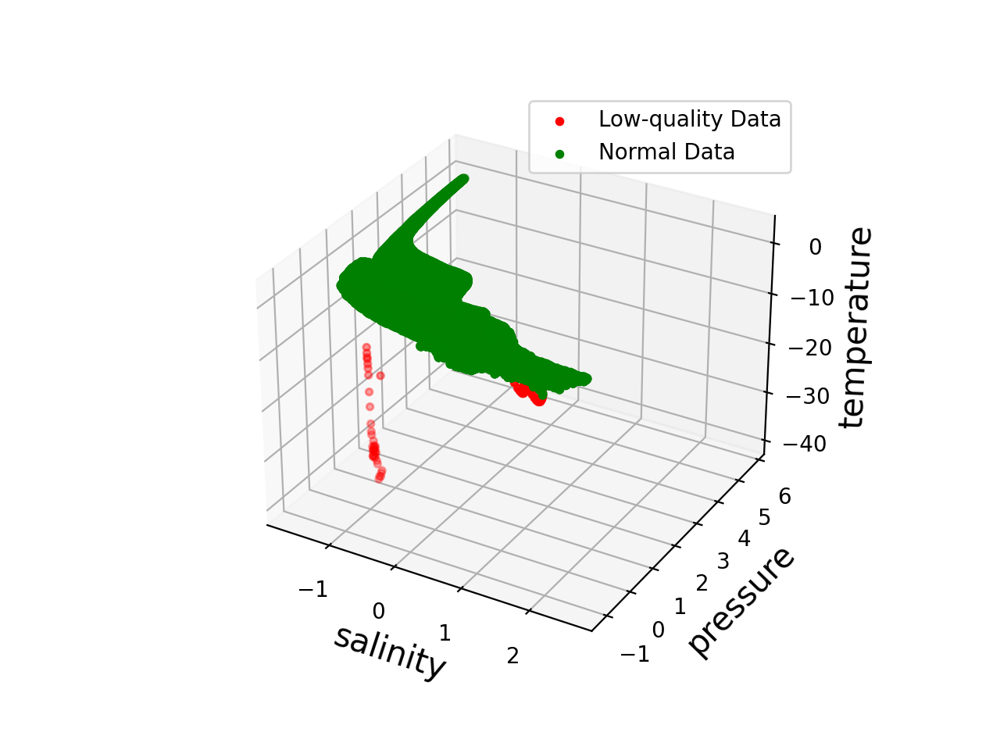

In [7]:
dataplot=data.copy()

plotCluster(dataplot,'temperature','pressure','salinity','label',0,data.shape[0])

# Splite Dataset

In [8]:
train_set=pd.read_csv('./randomtrain/6903102.csv')
test_set=pd.read_csv('./randomtest/6903102.csv')
len(train_set),len(test_set)

(176152, 75495)

In [9]:
#train_set2,test_set2=getLastSplit(data,0.3,dirty_ratio)

In [10]:
comp_ratio(train_set)
comp_ratio(test_set)

0.2917934511104046
0.2914100271541162


0.2914100271541162

In [11]:
#this function use random grid search to find best parameters
def getPar(model,dist,data,niter):
    import numpy as np
    import pandas as pd
    from sklearn.model_selection import RandomizedSearchCV
    x,y=data.shape

    clf = model

    param_dist = dist
    grid = RandomizedSearchCV(clf,param_dist,cv = 3,scoring = "balanced_accuracy",n_iter=niter,n_jobs = -1)

    #train
    grid.fit(data.iloc[:,0:y-1],data.iloc[:,y-1])
    #get best parameter
    print(grid.best_score_)
    return grid.best_params_

In [12]:
# metric
def computeMetric(y_tru,y_pre):
    acc = accuracy_score(y_tru,y_pre)
    pre=precision_score(y_tru,y_pre)
    recall=recall_score(y_tru,y_pre)
    cm=confusion_matrix(y_tru,y_pre)
    f1 = f1_score(y_tru,y_pre)
    mcc=matthews_corrcoef(y_tru, y_pre)
    kappa=cohen_kappa_score(y_tru, y_pre)
    bac=balanced_accuracy_score(y_tru,y_pre)
    print("acc:",acc)
    print("balanced acc:",bac)
    print("precision:",pre)
    print("recall:",recall)
    print("cm:",cm)
    print("f1:",f1)
    print("MCC:", mcc)
    print("Kappa:",kappa)
    
    # confusion matrix
#     cmap1 = sns.diverging_palette(260,-10,s=50, l=75, n=5, as_cmap=True)
#     plt.subplots(figsize=(12,8))
#     cf_matrix = confusion_matrix(y_tru, y_pre)
#     sns.heatmap(cf_matrix/np.sum(cf_matrix), cmap = cmap1, annot = True, annot_kws = {'size':15})
    
    return kappa

In [13]:
def draw(performance_history):
    fig, ax = plt.subplots(figsize=(8.5, 6), dpi=130)
    ax.plot(performance_history)
    ax.scatter(range(len(performance_history)), performance_history, s=13)
    ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, integer=True))
    ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=10))
    ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1))
    ax.set_ylim(bottom=0, top=1)
    ax.grid(True)
    ax.set_title('Incremental classification accuracy')
    ax.set_xlabel('Query iteration')
    ax.set_ylabel('Classification Accuracy')
    plt.show()

# splite train(pool), test, Labeled, Unlabeled

In [14]:
x,y=train_set.shape
#pool 
X_Pool = train_set.iloc[:,0:y-1].values
y_Pool = train_set.iloc[:,y-1].values

In [15]:
#test set
X_test=test_set.iloc[:,0:y-1]
y_tru=test_set.iloc[:,y-1]
print(len(X_test),len(y_tru))

75495 75495


In [16]:
#Pool
def initial_data(n_initial,X_Pool,y_Pool):
    #inital
    initial_idx = np.random.choice(range(len(X_Pool)), size=n_initial, replace=False)
    #initial Labeled data
    #X_initial, y_initial = X_train[], y_train[initial_idx]
    X_L = X_Pool[initial_idx]
    y_L = y_Pool[initial_idx]
    # Unlabeled data
    # X_U = Pool_X[ini_num:]
    # y_U = Pool_X[ini_num:]
    X_U, y_U = np.delete(X_Pool, initial_idx, axis=0), np.delete(y_Pool, initial_idx, axis=0)
    return X_L,y_L,X_U,y_U

In [17]:
# Set RNG seed for reproducibility.
RANDOM_STATE_SEED = 123
np.random.seed(RANDOM_STATE_SEED)

#n_initial= 100
n_initial = 1000
N_QUERIES = 200

In [18]:
# X_initial,y_initial,X_re,y_re=initial_data(n_initial,X_Pool,y_Pool)
# df_X_i = pd.DataFrame(X_initial)
# df_y_i = pd.DataFrame(y_initial)
# df_X_r = pd.DataFrame(X_re)
# df_y_r = pd.DataFrame(y_re)


# df_X_i.to_csv('./randomtrain/6903102_X_initial.csv', index=False)
# df_y_i.to_csv('./randomtrain/6903102_y_initial.csv', index=False)
# df_X_r.to_csv('./randomtrain/6903102_X_re.csv', index=False)
# df_y_r.to_csv('./randomtrain/6903102_y_re.csv', index=False)

X_initial=pd.read_csv('./randomtrain/6903102_X_initial_1.csv').values
y_initial=pd.read_csv('./randomtrain/6903102_y_initial_1.csv').values.ravel()
X_re=pd.read_csv('./randomtrain/6903102_X_re_1.csv').values
y_re=pd.read_csv('./randomtrain/6903102_y_re_1.csv').values.ravel()
print(X_re.shape,X_initial.shape)
print(y_re.shape,y_initial.shape)

(19296, 6) (1000, 6)
(19296,) (1000,)


# molAL

In [19]:
def random_sampling(classifier, X_pool):
    n_samples = len(X_pool)
    query_idx = np.random.choice(range(n_samples))
    return query_idx, X_pool[query_idx]

In [20]:
def al(clf,strategy,X_L,y_L):

#         learner = ActiveLearner(estimator=clf,
#                                 query_strategy=random_sampling,
#                                 X_training=X_L, y_training=y_L)
#     else:
    learner = ActiveLearner(estimator=clf,
                            query_strategy=strategy,
                            X_training=X_L, y_training=y_L)
    return learner

In [21]:
def al_learn(clf,sampling,X_initial,y_initial,X_re,y_re):
    X_L = X_initial.copy()
    y_L = y_initial.copy()
    X_U,y_U =X_re.copy(),y_re.copy()
    #print(len(X_U),len(y_U))
    learner = al(clf,sampling,X_L,y_L)
    y_pre=learner.predict(X_test)
    unqueried_kappa=cohen_kappa_score(y_tru, y_pre)
    unqueried_f1=f1_score(y_tru,y_pre)
    #print("unqueried --------------------->",unqueried_score)
    kappa_history = [unqueried_kappa]
    f1_history = [unqueried_f1]
    # Query
    for index in range(N_QUERIES):
        query_index, query_instance = learner.query(X_U)
        # Teach ActiveLearner model the record it has requested.
        X, y = X_U[query_index].reshape(1, -1), y_U[query_index].reshape(1, )
        print(index+1,"query label --------------------->",y)
        learner.teach(X=X, y=y)
        
        X_U, y_U = np.delete(X_U, query_index, axis=0), np.delete(y_U, query_index)
        y_pre=learner.predict(X_test)
        kappa=cohen_kappa_score(y_tru, y_pre)
        f1=f1_score(y_tru,y_pre)
        print(index+1,"-------------------->",kappa)
        print(index+1,"-------------------->",f1)
        # Recall precision F1
        kappa_history.append(kappa)
        f1_history.append(f1)
    #print(len(X_U))
    df_scores= pd.concat([pd.DataFrame(kappa_history,columns=['kappa']), 
                          pd.DataFrame(f1_history,columns=['f1'])],
                         axis=1)
    return df_scores


In [22]:
# clf1 KNN
clf1 = KNeighborsClassifier()
dic1={'n_neighbors':[1,2,3,4,5,6,7,8]}
para1=getPar(clf1,dic1,test_set,10)
clf1 = KNeighborsClassifier(n_neighbors=para1['n_neighbors'],n_jobs=-1)
clf1.fit(X_Pool, y_Pool)
y_pre=clf1.predict(X_test)
computeMetric(y_tru,y_pre)

0.8086408122991721
acc: 0.9984634744022783
balanced acc: 0.824740949850548
precision: 0.7857142857142857
recall: 0.65
cm: [[75236    39]
 [   77   143]]
f1: 0.7114427860696517
MCC: 0.7138929728680175
Kappa: 0.7106793736543535


0.7106793736543535

In [23]:
# clf2 lightgbm
clf2 = lgb.LGBMClassifier()

dic2 = {'learning_rate' : [0.01, 0.02, 0.03, 0.04, 0.05, 0.08, 0.1, 0.2, 0.3, 0.4],
              'n_estimators' : [100, 200, 300, 400, 500, 600, 800, 900, 1000, 1500, 2000],
              'num_leaves': range(6, 50), 
              'min_child_samples': range(10, 200, 10), 
              'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
              'max_depth': [-1, 1, 2, 3, 4, 5, 6, 7],
              'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
              'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100]}
para2=getPar(clf2,dic2,test_set,10)

    
clf2 = lgb.LGBMClassifier(boosting_type='gbdt', num_leaves=para2['num_leaves'], max_depth=-1, 
                              learning_rate=para2['learning_rate'], n_estimators=para2['n_estimators'], 
                              subsample_for_bin=200000, 
                              objective=None, class_weight=None, min_split_gain=0.0, 
                              min_child_weight=para2['min_child_weight'],
                              min_child_samples=para2['min_child_samples'], 
                              subsample=1.0, 
                              subsample_freq=0, colsample_bytree=1.0, reg_alpha=para2['reg_alpha'], 
                              reg_lambda=para2['reg_lambda'], random_state=None, n_jobs=-1, importance_type='split')
clf2.fit(X_Pool, y_Pool)
y_pre=clf2.predict(X_test)
computeMetric(y_tru,y_pre)

0.822614137231195
acc: 0.9989535730843102
balanced acc: 0.8249867153769512
precision: 0.9862068965517241
recall: 0.65
cm: [[75273     2]
 [   77   143]]
f1: 0.7835616438356166
MCC: 0.8002150170793442
Kappa: 0.7830593584468138


0.7830593584468138

In [24]:
# clf3 gradientBoostingClassifier
clf3 = lgb.LGBMClassifier()

dic3 = {'learning_rate' : [0.01, 0.02, 0.03, 0.04, 0.05, 0.08, 0.1, 0.2, 0.3, 0.4],
              'n_estimators' : [100, 200, 300, 400, 500, 600, 800, 900, 1000, 1500, 2000],
              'num_leaves': range(6, 50), 
              'min_child_samples': range(10, 200, 10), 
              'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
              'max_depth': [-1, 1, 2, 3, 4, 5, 6, 7],
              'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
              'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100]}
para3=getPar(clf3,dic3,test_set,10)

    
clf3 = lgb.LGBMClassifier(boosting_type='gbdt', num_leaves=para3['num_leaves'], max_depth=-1, 
                              learning_rate=para3['learning_rate'], n_estimators=para3['n_estimators'], 
                              subsample_for_bin=200000, 
                              objective=None, class_weight=None, min_split_gain=0.0, 
                              min_child_weight=para3['min_child_weight'],
                              min_child_samples=para3['min_child_samples'], 
                              subsample=1.0, 
                              subsample_freq=0, colsample_bytree=1.0, reg_alpha=para3['reg_alpha'], 
                              reg_lambda=para3['reg_lambda'], random_state=None, n_jobs=-1, importance_type='split')
clf3.fit(X_Pool, y_Pool)
y_pre=clf3.predict(X_test)
computeMetric(y_tru,y_pre)

0.8180545696735434
acc: 0.9989403271739851
balanced acc: 0.8363104978714411
precision: 0.9487179487179487
recall: 0.6727272727272727
cm: [[75267     8]
 [   72   148]]
f1: 0.7872340425531915
MCC: 0.7984264529022345
Kappa: 0.7867183096800987


0.7867183096800987

In [25]:
#clf4 catboost
clf4 = CatBoostClassifier(loss_function='Logloss')
# dic4 = {'learning_rate': [0.03, 0.1],
#         'depth': [4, 6, 10],
#         'l2_leaf_reg': [1, 3, 5, 7, 9]}
# #para3=getPar(clf4,dic4,test_set,10)

# grid_search_result = clf4.grid_search(dic4, 
#                                        X=X_Pool, 
#                                        y=y_Pool)

clf4.fit(X_Pool, y_Pool)
y_pre=clf4.predict(X_test)
computeMetric(y_tru,y_pre)

Learning rate set to 0.093741
0:	learn: 0.4105063	total: 72.7ms	remaining: 1m 12s
1:	learn: 0.2585351	total: 85.2ms	remaining: 42.5s
2:	learn: 0.1689129	total: 96.3ms	remaining: 32s
3:	learn: 0.1126900	total: 110ms	remaining: 27.4s
4:	learn: 0.0744085	total: 123ms	remaining: 24.4s
5:	learn: 0.0513234	total: 137ms	remaining: 22.7s
6:	learn: 0.0372819	total: 153ms	remaining: 21.7s
7:	learn: 0.0280374	total: 167ms	remaining: 20.8s
8:	learn: 0.0221399	total: 180ms	remaining: 19.9s
9:	learn: 0.0180720	total: 195ms	remaining: 19.3s
10:	learn: 0.0153551	total: 210ms	remaining: 18.9s
11:	learn: 0.0132722	total: 224ms	remaining: 18.4s
12:	learn: 0.0118385	total: 238ms	remaining: 18s
13:	learn: 0.0108348	total: 250ms	remaining: 17.6s
14:	learn: 0.0100657	total: 263ms	remaining: 17.3s
15:	learn: 0.0095389	total: 276ms	remaining: 17s
16:	learn: 0.0090887	total: 291ms	remaining: 16.8s
17:	learn: 0.0087833	total: 303ms	remaining: 16.5s
18:	learn: 0.0084386	total: 317ms	remaining: 16.3s
19:	learn: 0.

172:	learn: 0.0051998	total: 2.83s	remaining: 13.5s
173:	learn: 0.0051799	total: 2.85s	remaining: 13.5s
174:	learn: 0.0051756	total: 2.87s	remaining: 13.5s
175:	learn: 0.0051595	total: 2.88s	remaining: 13.5s
176:	learn: 0.0051563	total: 2.9s	remaining: 13.5s
177:	learn: 0.0051471	total: 2.91s	remaining: 13.5s
178:	learn: 0.0051443	total: 2.93s	remaining: 13.4s
179:	learn: 0.0051371	total: 2.95s	remaining: 13.4s
180:	learn: 0.0051264	total: 2.96s	remaining: 13.4s
181:	learn: 0.0051234	total: 2.98s	remaining: 13.4s
182:	learn: 0.0051212	total: 2.99s	remaining: 13.3s
183:	learn: 0.0051130	total: 3s	remaining: 13.3s
184:	learn: 0.0050991	total: 3.01s	remaining: 13.3s
185:	learn: 0.0050913	total: 3.03s	remaining: 13.2s
186:	learn: 0.0050866	total: 3.04s	remaining: 13.2s
187:	learn: 0.0050846	total: 3.05s	remaining: 13.2s
188:	learn: 0.0050767	total: 3.07s	remaining: 13.2s
189:	learn: 0.0050579	total: 3.08s	remaining: 13.1s
190:	learn: 0.0050517	total: 3.09s	remaining: 13.1s
191:	learn: 0.00

335:	learn: 0.0039651	total: 4.91s	remaining: 9.71s
336:	learn: 0.0039632	total: 4.92s	remaining: 9.69s
337:	learn: 0.0039522	total: 4.94s	remaining: 9.67s
338:	learn: 0.0039445	total: 4.95s	remaining: 9.65s
339:	learn: 0.0039429	total: 4.96s	remaining: 9.63s
340:	learn: 0.0039378	total: 4.97s	remaining: 9.61s
341:	learn: 0.0039288	total: 4.99s	remaining: 9.59s
342:	learn: 0.0039257	total: 5s	remaining: 9.57s
343:	learn: 0.0039241	total: 5.01s	remaining: 9.55s
344:	learn: 0.0039114	total: 5.02s	remaining: 9.53s
345:	learn: 0.0039054	total: 5.03s	remaining: 9.51s
346:	learn: 0.0039013	total: 5.04s	remaining: 9.49s
347:	learn: 0.0038966	total: 5.06s	remaining: 9.47s
348:	learn: 0.0038951	total: 5.07s	remaining: 9.45s
349:	learn: 0.0038902	total: 5.08s	remaining: 9.43s
350:	learn: 0.0038889	total: 5.09s	remaining: 9.41s
351:	learn: 0.0038845	total: 5.1s	remaining: 9.39s
352:	learn: 0.0038784	total: 5.11s	remaining: 9.37s
353:	learn: 0.0038744	total: 5.13s	remaining: 9.36s
354:	learn: 0.00

500:	learn: 0.0031794	total: 6.95s	remaining: 6.92s
501:	learn: 0.0031748	total: 6.97s	remaining: 6.91s
502:	learn: 0.0031703	total: 6.98s	remaining: 6.9s
503:	learn: 0.0031603	total: 6.99s	remaining: 6.88s
504:	learn: 0.0031580	total: 7s	remaining: 6.87s
505:	learn: 0.0031548	total: 7.02s	remaining: 6.85s
506:	learn: 0.0031530	total: 7.03s	remaining: 6.83s
507:	learn: 0.0031487	total: 7.04s	remaining: 6.82s
508:	learn: 0.0031452	total: 7.05s	remaining: 6.8s
509:	learn: 0.0031424	total: 7.07s	remaining: 6.79s
510:	learn: 0.0031408	total: 7.08s	remaining: 6.77s
511:	learn: 0.0031369	total: 7.09s	remaining: 6.76s
512:	learn: 0.0031313	total: 7.11s	remaining: 6.75s
513:	learn: 0.0031297	total: 7.12s	remaining: 6.73s
514:	learn: 0.0031208	total: 7.13s	remaining: 6.71s
515:	learn: 0.0031187	total: 7.14s	remaining: 6.7s
516:	learn: 0.0031151	total: 7.16s	remaining: 6.68s
517:	learn: 0.0031134	total: 7.17s	remaining: 6.67s
518:	learn: 0.0031066	total: 7.18s	remaining: 6.66s
519:	learn: 0.0031

663:	learn: 0.0025736	total: 9.01s	remaining: 4.56s
664:	learn: 0.0025734	total: 9.02s	remaining: 4.54s
665:	learn: 0.0025635	total: 9.03s	remaining: 4.53s
666:	learn: 0.0025596	total: 9.04s	remaining: 4.51s
667:	learn: 0.0025576	total: 9.06s	remaining: 4.5s
668:	learn: 0.0025542	total: 9.07s	remaining: 4.49s
669:	learn: 0.0025492	total: 9.08s	remaining: 4.47s
670:	learn: 0.0025450	total: 9.1s	remaining: 4.46s
671:	learn: 0.0025432	total: 9.11s	remaining: 4.45s
672:	learn: 0.0025388	total: 9.12s	remaining: 4.43s
673:	learn: 0.0025369	total: 9.14s	remaining: 4.42s
674:	learn: 0.0025349	total: 9.15s	remaining: 4.41s
675:	learn: 0.0025258	total: 9.16s	remaining: 4.39s
676:	learn: 0.0025181	total: 9.17s	remaining: 4.38s
677:	learn: 0.0025155	total: 9.18s	remaining: 4.36s
678:	learn: 0.0025087	total: 9.2s	remaining: 4.35s
679:	learn: 0.0025070	total: 9.21s	remaining: 4.33s
680:	learn: 0.0025018	total: 9.22s	remaining: 4.32s
681:	learn: 0.0024976	total: 9.23s	remaining: 4.31s
682:	learn: 0.0

828:	learn: 0.0020936	total: 11.1s	remaining: 2.29s
829:	learn: 0.0020924	total: 11.1s	remaining: 2.27s
830:	learn: 0.0020909	total: 11.1s	remaining: 2.26s
831:	learn: 0.0020886	total: 11.1s	remaining: 2.25s
832:	learn: 0.0020837	total: 11.1s	remaining: 2.23s
833:	learn: 0.0020823	total: 11.1s	remaining: 2.22s
834:	learn: 0.0020793	total: 11.2s	remaining: 2.21s
835:	learn: 0.0020770	total: 11.2s	remaining: 2.19s
836:	learn: 0.0020754	total: 11.2s	remaining: 2.18s
837:	learn: 0.0020749	total: 11.2s	remaining: 2.16s
838:	learn: 0.0020711	total: 11.2s	remaining: 2.15s
839:	learn: 0.0020671	total: 11.2s	remaining: 2.14s
840:	learn: 0.0020650	total: 11.2s	remaining: 2.12s
841:	learn: 0.0020637	total: 11.2s	remaining: 2.11s
842:	learn: 0.0020604	total: 11.3s	remaining: 2.1s
843:	learn: 0.0020561	total: 11.3s	remaining: 2.08s
844:	learn: 0.0020530	total: 11.3s	remaining: 2.07s
845:	learn: 0.0020499	total: 11.3s	remaining: 2.06s
846:	learn: 0.0020474	total: 11.3s	remaining: 2.04s
847:	learn: 0

993:	learn: 0.0017571	total: 13.2s	remaining: 79.4ms
994:	learn: 0.0017552	total: 13.2s	remaining: 66.2ms
995:	learn: 0.0017536	total: 13.2s	remaining: 52.9ms
996:	learn: 0.0017520	total: 13.2s	remaining: 39.7ms
997:	learn: 0.0017514	total: 13.2s	remaining: 26.5ms
998:	learn: 0.0017509	total: 13.2s	remaining: 13.2ms
999:	learn: 0.0017495	total: 13.2s	remaining: 0us
acc: 0.9989668189946354
balanced acc: 0.8363237824944899
precision: 0.961038961038961
recall: 0.6727272727272727
cm: [[75269     6]
 [   72   148]]
f1: 0.7914438502673796
MCC: 0.8036153918533605
Kappa: 0.7909421433381959


0.7909421433381959

## random sampling

In [26]:
sampling=random_sampling

In [ ]:
metric01 = al_learn(clf1,sampling,X_initial,y_initial,X_re,y_re)

In [ ]:
metric02 = al_learn(clf2,sampling,X_initial,y_initial,X_re,y_re)

In [ ]:
metric03 = al_learn(clf3,sampling,X_initial,y_initial,X_re,y_re)

In [ ]:
metric04 = al_learn(clf4,sampling,X_initial,y_initial,X_re,y_re)

## Uncertainty

In [31]:
sampling=uncertainty_sampling

In [32]:
metric11 = al_learn(clf1,sampling,X_initial,y_initial,X_re,y_re)

1 query label ---------------------> [0]
1 --------------------> 0.3005444551340867
1 --------------------> 0.30115830115830117
2 query label ---------------------> [0]
2 --------------------> 0.3005444551340867
2 --------------------> 0.30115830115830117
3 query label ---------------------> [0]
3 --------------------> 0.3005444551340867
3 --------------------> 0.30115830115830117
4 query label ---------------------> [0]
4 --------------------> 0.3005444551340867
4 --------------------> 0.30115830115830117
5 query label ---------------------> [0]
5 --------------------> 0.3005444551340867
5 --------------------> 0.30115830115830117
6 query label ---------------------> [0]
6 --------------------> 0.3005444551340867
6 --------------------> 0.30115830115830117
7 query label ---------------------> [0]
7 --------------------> 0.3005444551340867
7 --------------------> 0.30115830115830117
8 query label ---------------------> [0]
8 --------------------> 0.3005444551340867
8 ------------------

64 --------------------> 0.3005444551340867
64 --------------------> 0.30115830115830117
65 query label ---------------------> [0]
65 --------------------> 0.3005444551340867
65 --------------------> 0.30115830115830117
66 query label ---------------------> [0]
66 --------------------> 0.3005444551340867
66 --------------------> 0.30115830115830117
67 query label ---------------------> [0]
67 --------------------> 0.3005444551340867
67 --------------------> 0.30115830115830117
68 query label ---------------------> [0]
68 --------------------> 0.3005444551340867
68 --------------------> 0.30115830115830117
69 query label ---------------------> [0]
69 --------------------> 0.3005444551340867
69 --------------------> 0.30115830115830117
70 query label ---------------------> [0]
70 --------------------> 0.3005444551340867
70 --------------------> 0.30115830115830117
71 query label ---------------------> [0]
71 --------------------> 0.3005444551340867
71 --------------------> 0.301158301158

126 --------------------> 0.3005444551340867
126 --------------------> 0.30115830115830117
127 query label ---------------------> [0]
127 --------------------> 0.3005444551340867
127 --------------------> 0.30115830115830117
128 query label ---------------------> [0]
128 --------------------> 0.3005444551340867
128 --------------------> 0.30115830115830117
129 query label ---------------------> [0]
129 --------------------> 0.3005444551340867
129 --------------------> 0.30115830115830117
130 query label ---------------------> [0]
130 --------------------> 0.3005444551340867
130 --------------------> 0.30115830115830117
131 query label ---------------------> [0]
131 --------------------> 0.3005444551340867
131 --------------------> 0.30115830115830117
132 query label ---------------------> [0]
132 --------------------> 0.3005444551340867
132 --------------------> 0.30115830115830117
133 query label ---------------------> [0]
133 --------------------> 0.3005444551340867
133 -------------

188 --------------------> 0.3005444551340867
188 --------------------> 0.30115830115830117
189 query label ---------------------> [0]
189 --------------------> 0.3005444551340867
189 --------------------> 0.30115830115830117
190 query label ---------------------> [0]
190 --------------------> 0.3005444551340867
190 --------------------> 0.30115830115830117
191 query label ---------------------> [0]
191 --------------------> 0.3005444551340867
191 --------------------> 0.30115830115830117
192 query label ---------------------> [0]
192 --------------------> 0.3005444551340867
192 --------------------> 0.30115830115830117
193 query label ---------------------> [0]
193 --------------------> 0.3005444551340867
193 --------------------> 0.30115830115830117
194 query label ---------------------> [0]
194 --------------------> 0.3005444551340867
194 --------------------> 0.30115830115830117
195 query label ---------------------> [0]
195 --------------------> 0.3005444551340867
195 -------------

In [33]:
metric12 = al_learn(clf2,sampling,X_initial,y_initial,X_re,y_re)

1 query label ---------------------> [0]
1 --------------------> 0.0
1 --------------------> 0.0
2 query label ---------------------> [0]
2 --------------------> 0.0
2 --------------------> 0.0
3 query label ---------------------> [0]
3 --------------------> 0.0
3 --------------------> 0.0
4 query label ---------------------> [0]
4 --------------------> 0.0
4 --------------------> 0.0
5 query label ---------------------> [0]
5 --------------------> 0.0
5 --------------------> 0.0
6 query label ---------------------> [0]
6 --------------------> 0.0
6 --------------------> 0.0
7 query label ---------------------> [0]
7 --------------------> 0.0
7 --------------------> 0.0
8 query label ---------------------> [0]
8 --------------------> 0.0
8 --------------------> 0.0
9 query label ---------------------> [0]
9 --------------------> 0.0
9 --------------------> 0.0
10 query label ---------------------> [0]
10 --------------------> 0.0
10 --------------------> 0.0
11 query label ------------

83 --------------------> 0.0
83 --------------------> 0.0
84 query label ---------------------> [0]
84 --------------------> 0.0
84 --------------------> 0.0
85 query label ---------------------> [0]
85 --------------------> 0.0
85 --------------------> 0.0
86 query label ---------------------> [0]
86 --------------------> 0.0
86 --------------------> 0.0
87 query label ---------------------> [0]
87 --------------------> 0.0
87 --------------------> 0.0
88 query label ---------------------> [0]
88 --------------------> 0.0
88 --------------------> 0.0
89 query label ---------------------> [0]
89 --------------------> 0.0
89 --------------------> 0.0
90 query label ---------------------> [0]
90 --------------------> 0.0
90 --------------------> 0.0
91 query label ---------------------> [0]
91 --------------------> 0.0
91 --------------------> 0.0
92 query label ---------------------> [0]
92 --------------------> 0.0
92 --------------------> 0.0
93 query label ---------------------> [0]


164 --------------------> 0.0
164 --------------------> 0.0
165 query label ---------------------> [0]
165 --------------------> 0.0
165 --------------------> 0.0
166 query label ---------------------> [0]
166 --------------------> 0.0
166 --------------------> 0.0
167 query label ---------------------> [0]
167 --------------------> 0.0
167 --------------------> 0.0
168 query label ---------------------> [0]
168 --------------------> 0.0
168 --------------------> 0.0
169 query label ---------------------> [0]
169 --------------------> 0.0
169 --------------------> 0.0
170 query label ---------------------> [0]
170 --------------------> 0.0
170 --------------------> 0.0
171 query label ---------------------> [0]
171 --------------------> 0.0
171 --------------------> 0.0
172 query label ---------------------> [0]
172 --------------------> 0.0
172 --------------------> 0.0
173 query label ---------------------> [0]
173 --------------------> 0.0
173 --------------------> 0.0
174 query lab

In [34]:
metric13 = al_learn(clf3,sampling,X_initial,y_initial,X_re,y_re)

1 query label ---------------------> [1]
1 --------------------> 0.4278568789609799
1 --------------------> 0.42857142857142855
2 query label ---------------------> [1]
2 --------------------> 0.5670092899928736
2 --------------------> 0.567741935483871
3 query label ---------------------> [1]
3 --------------------> 0.5833947123156392
3 --------------------> 0.584126984126984
4 query label ---------------------> [1]
4 --------------------> 0.7430925730119955
4 --------------------> 0.7436619718309859
5 query label ---------------------> [1]
5 --------------------> 0.7430925730119955
5 --------------------> 0.7436619718309859
6 query label ---------------------> [1]
6 --------------------> 0.7430925730119955
6 --------------------> 0.7436619718309859
7 query label ---------------------> [0]
7 --------------------> 0.7452005848586998
7 --------------------> 0.7457627118644069
8 query label ---------------------> [0]
8 --------------------> 0.7452005848586998
8 --------------------> 0.74

64 --------------------> 0.7430925730119955
64 --------------------> 0.7436619718309859
65 query label ---------------------> [0]
65 --------------------> 0.7452005848586998
65 --------------------> 0.7457627118644069
66 query label ---------------------> [1]
66 --------------------> 0.7452005848586998
66 --------------------> 0.7457627118644069
67 query label ---------------------> [0]
67 --------------------> 0.7409963611792494
67 --------------------> 0.7415730337078651
68 query label ---------------------> [0]
68 --------------------> 0.7452005848586998
68 --------------------> 0.7457627118644069
69 query label ---------------------> [0]
69 --------------------> 0.7368389434442525
69 --------------------> 0.7374301675977655
70 query label ---------------------> [0]
70 --------------------> 0.7452005848586998
70 --------------------> 0.7457627118644069
71 query label ---------------------> [0]
71 --------------------> 0.7452005848586998
71 --------------------> 0.7457627118644069
72

127 query label ---------------------> [0]
127 --------------------> 0.7382957302906706
127 --------------------> 0.7388888888888888
128 query label ---------------------> [0]
128 --------------------> 0.7445266494703611
128 --------------------> 0.7450980392156862
129 query label ---------------------> [0]
129 --------------------> 0.7424381148603322
129 --------------------> 0.7430167597765363
130 query label ---------------------> [0]
130 --------------------> 0.7403611738900273
130 --------------------> 0.7409470752089136
131 query label ---------------------> [0]
131 --------------------> 0.7424381148603322
131 --------------------> 0.7430167597765363
132 query label ---------------------> [0]
132 --------------------> 0.7403611738900273
132 --------------------> 0.7409470752089136
133 query label ---------------------> [0]
133 --------------------> 0.7424381148603322
133 --------------------> 0.7430167597765363
134 query label ---------------------> [0]
134 --------------------> 

189 --------------------> 0.7409963611792494
189 --------------------> 0.7415730337078651
190 query label ---------------------> [0]
190 --------------------> 0.7261536217820171
190 --------------------> 0.7267605633802817
191 query label ---------------------> [0]
191 --------------------> 0.7209810922848557
191 --------------------> 0.7215909090909091
192 query label ---------------------> [1]
192 --------------------> 0.6798369427495523
192 --------------------> 0.680628272251309
193 query label ---------------------> [0]
193 --------------------> 0.7160230264856213
193 --------------------> 0.7166666666666666
194 query label ---------------------> [0]
194 --------------------> 0.7016997353190721
194 --------------------> 0.7024128686327078
195 query label ---------------------> [0]
195 --------------------> 0.7104548505343591
195 --------------------> 0.7111111111111111
196 query label ---------------------> [0]
196 --------------------> 0.7297353334044341
196 -------------------->

In [35]:
metric14 = al_learn(clf4,sampling,X_initial,y_initial,X_re,y_re)

Learning rate set to 0.010302
0:	learn: 0.6670164	total: 1.88ms	remaining: 1.88s
1:	learn: 0.6396388	total: 4.06ms	remaining: 2.03s
2:	learn: 0.6142201	total: 5.83ms	remaining: 1.94s
3:	learn: 0.5916442	total: 7.61ms	remaining: 1.89s
4:	learn: 0.5675999	total: 9.33ms	remaining: 1.86s
5:	learn: 0.5454894	total: 10.7ms	remaining: 1.77s
6:	learn: 0.5256128	total: 12.2ms	remaining: 1.73s
7:	learn: 0.5064290	total: 13.9ms	remaining: 1.72s
8:	learn: 0.4873509	total: 15.3ms	remaining: 1.68s
9:	learn: 0.4673314	total: 16.7ms	remaining: 1.65s
10:	learn: 0.4494452	total: 18.2ms	remaining: 1.64s
11:	learn: 0.4315073	total: 19.9ms	remaining: 1.63s
12:	learn: 0.4145165	total: 21.4ms	remaining: 1.63s
13:	learn: 0.3987759	total: 23.2ms	remaining: 1.64s
14:	learn: 0.3827791	total: 24.8ms	remaining: 1.63s
15:	learn: 0.3680783	total: 26.3ms	remaining: 1.61s
16:	learn: 0.3537065	total: 28ms	remaining: 1.62s
17:	learn: 0.3411704	total: 29.5ms	remaining: 1.61s
18:	learn: 0.3277158	total: 30.8ms	remaining: 

242:	learn: 0.0059539	total: 363ms	remaining: 1.13s
243:	learn: 0.0059228	total: 365ms	remaining: 1.13s
244:	learn: 0.0058586	total: 367ms	remaining: 1.13s
245:	learn: 0.0058005	total: 369ms	remaining: 1.13s
246:	learn: 0.0057636	total: 371ms	remaining: 1.13s
247:	learn: 0.0057405	total: 372ms	remaining: 1.13s
248:	learn: 0.0057129	total: 374ms	remaining: 1.13s
249:	learn: 0.0056636	total: 375ms	remaining: 1.13s
250:	learn: 0.0056212	total: 377ms	remaining: 1.12s
251:	learn: 0.0055657	total: 378ms	remaining: 1.12s
252:	learn: 0.0055245	total: 380ms	remaining: 1.12s
253:	learn: 0.0054768	total: 382ms	remaining: 1.12s
254:	learn: 0.0054421	total: 383ms	remaining: 1.12s
255:	learn: 0.0054064	total: 385ms	remaining: 1.12s
256:	learn: 0.0053587	total: 387ms	remaining: 1.12s
257:	learn: 0.0053288	total: 389ms	remaining: 1.12s
258:	learn: 0.0052900	total: 390ms	remaining: 1.11s
259:	learn: 0.0052635	total: 391ms	remaining: 1.11s
260:	learn: 0.0052227	total: 393ms	remaining: 1.11s
261:	learn: 

402:	learn: 0.0024350	total: 577ms	remaining: 855ms
403:	learn: 0.0024269	total: 578ms	remaining: 853ms
404:	learn: 0.0024184	total: 580ms	remaining: 852ms
405:	learn: 0.0024063	total: 581ms	remaining: 851ms
406:	learn: 0.0023994	total: 583ms	remaining: 849ms
407:	learn: 0.0023908	total: 584ms	remaining: 848ms
408:	learn: 0.0023796	total: 586ms	remaining: 847ms
409:	learn: 0.0023724	total: 588ms	remaining: 845ms
410:	learn: 0.0023628	total: 589ms	remaining: 844ms
411:	learn: 0.0023510	total: 590ms	remaining: 843ms
412:	learn: 0.0023395	total: 592ms	remaining: 841ms
413:	learn: 0.0023327	total: 593ms	remaining: 839ms
414:	learn: 0.0023198	total: 594ms	remaining: 838ms
415:	learn: 0.0023075	total: 596ms	remaining: 837ms
416:	learn: 0.0022944	total: 597ms	remaining: 835ms
417:	learn: 0.0022883	total: 599ms	remaining: 834ms
418:	learn: 0.0022761	total: 600ms	remaining: 833ms
419:	learn: 0.0022677	total: 602ms	remaining: 831ms
420:	learn: 0.0022528	total: 606ms	remaining: 833ms
421:	learn: 

631:	learn: 0.0011914	total: 905ms	remaining: 527ms
632:	learn: 0.0011867	total: 906ms	remaining: 526ms
633:	learn: 0.0011847	total: 908ms	remaining: 524ms
634:	learn: 0.0011814	total: 909ms	remaining: 523ms
635:	learn: 0.0011796	total: 910ms	remaining: 521ms
636:	learn: 0.0011784	total: 912ms	remaining: 520ms
637:	learn: 0.0011767	total: 913ms	remaining: 518ms
638:	learn: 0.0011719	total: 914ms	remaining: 517ms
639:	learn: 0.0011704	total: 916ms	remaining: 515ms
640:	learn: 0.0011684	total: 917ms	remaining: 514ms
641:	learn: 0.0011669	total: 919ms	remaining: 512ms
642:	learn: 0.0011621	total: 920ms	remaining: 511ms
643:	learn: 0.0011601	total: 922ms	remaining: 510ms
644:	learn: 0.0011566	total: 923ms	remaining: 508ms
645:	learn: 0.0011552	total: 925ms	remaining: 507ms
646:	learn: 0.0011532	total: 926ms	remaining: 505ms
647:	learn: 0.0011513	total: 928ms	remaining: 504ms
648:	learn: 0.0011500	total: 929ms	remaining: 503ms
649:	learn: 0.0011483	total: 931ms	remaining: 501ms
650:	learn: 

796:	learn: 0.0008899	total: 1.12s	remaining: 285ms
797:	learn: 0.0008876	total: 1.12s	remaining: 283ms
798:	learn: 0.0008870	total: 1.12s	remaining: 282ms
799:	learn: 0.0008839	total: 1.12s	remaining: 281ms
800:	learn: 0.0008810	total: 1.12s	remaining: 279ms
801:	learn: 0.0008787	total: 1.13s	remaining: 278ms
802:	learn: 0.0008760	total: 1.13s	remaining: 276ms
803:	learn: 0.0008736	total: 1.13s	remaining: 275ms
804:	learn: 0.0008703	total: 1.13s	remaining: 274ms
805:	learn: 0.0008694	total: 1.13s	remaining: 272ms
806:	learn: 0.0008686	total: 1.13s	remaining: 271ms
807:	learn: 0.0008661	total: 1.13s	remaining: 270ms
808:	learn: 0.0008628	total: 1.14s	remaining: 268ms
809:	learn: 0.0008605	total: 1.14s	remaining: 267ms
810:	learn: 0.0008599	total: 1.14s	remaining: 265ms
811:	learn: 0.0008569	total: 1.14s	remaining: 264ms
812:	learn: 0.0008552	total: 1.14s	remaining: 263ms
813:	learn: 0.0008528	total: 1.14s	remaining: 261ms
814:	learn: 0.0008521	total: 1.14s	remaining: 260ms
815:	learn: 

1 query label ---------------------> [1]
Learning rate set to 0.010307
0:	learn: 0.6672159	total: 1.35ms	remaining: 1.35s
1:	learn: 0.6398676	total: 2.92ms	remaining: 1.45s
2:	learn: 0.6146121	total: 4.53ms	remaining: 1.5s
3:	learn: 0.5921415	total: 6.05ms	remaining: 1.51s
4:	learn: 0.5680725	total: 7.23ms	remaining: 1.44s
5:	learn: 0.5460159	total: 8.62ms	remaining: 1.43s
6:	learn: 0.5261644	total: 9.81ms	remaining: 1.39s
7:	learn: 0.5070239	total: 11.2ms	remaining: 1.39s
8:	learn: 0.4880061	total: 12.3ms	remaining: 1.36s
9:	learn: 0.4684086	total: 13.7ms	remaining: 1.36s
10:	learn: 0.4511262	total: 15.1ms	remaining: 1.35s
11:	learn: 0.4332283	total: 16.7ms	remaining: 1.37s
12:	learn: 0.4162268	total: 17.9ms	remaining: 1.36s
13:	learn: 0.3999975	total: 19.2ms	remaining: 1.35s
14:	learn: 0.3840480	total: 20.5ms	remaining: 1.35s
15:	learn: 0.3701408	total: 21.8ms	remaining: 1.34s
16:	learn: 0.3557519	total: 23.1ms	remaining: 1.33s
17:	learn: 0.3431831	total: 24.3ms	remaining: 1.33s
18:	

301:	learn: 0.0039198	total: 377ms	remaining: 872ms
302:	learn: 0.0038950	total: 379ms	remaining: 871ms
303:	learn: 0.0038711	total: 380ms	remaining: 871ms
304:	learn: 0.0038405	total: 382ms	remaining: 870ms
305:	learn: 0.0038271	total: 383ms	remaining: 868ms
306:	learn: 0.0038134	total: 384ms	remaining: 867ms
307:	learn: 0.0037906	total: 385ms	remaining: 866ms
308:	learn: 0.0037745	total: 387ms	remaining: 865ms
309:	learn: 0.0037462	total: 388ms	remaining: 864ms
310:	learn: 0.0037182	total: 389ms	remaining: 863ms
311:	learn: 0.0036916	total: 391ms	remaining: 862ms
312:	learn: 0.0036780	total: 392ms	remaining: 860ms
313:	learn: 0.0036580	total: 393ms	remaining: 859ms
314:	learn: 0.0036370	total: 395ms	remaining: 858ms
315:	learn: 0.0036146	total: 396ms	remaining: 857ms
316:	learn: 0.0035905	total: 397ms	remaining: 856ms
317:	learn: 0.0035675	total: 398ms	remaining: 854ms
318:	learn: 0.0035464	total: 400ms	remaining: 853ms
319:	learn: 0.0035264	total: 401ms	remaining: 852ms
320:	learn: 

610:	learn: 0.0011779	total: 757ms	remaining: 482ms
611:	learn: 0.0011742	total: 759ms	remaining: 481ms
612:	learn: 0.0011729	total: 760ms	remaining: 480ms
613:	learn: 0.0011688	total: 761ms	remaining: 479ms
614:	learn: 0.0011641	total: 762ms	remaining: 477ms
615:	learn: 0.0011605	total: 764ms	remaining: 476ms
616:	learn: 0.0011568	total: 765ms	remaining: 475ms
617:	learn: 0.0011529	total: 766ms	remaining: 474ms
618:	learn: 0.0011496	total: 768ms	remaining: 473ms
619:	learn: 0.0011462	total: 769ms	remaining: 471ms
620:	learn: 0.0011428	total: 771ms	remaining: 470ms
621:	learn: 0.0011392	total: 772ms	remaining: 469ms
622:	learn: 0.0011364	total: 773ms	remaining: 468ms
623:	learn: 0.0011329	total: 775ms	remaining: 467ms
624:	learn: 0.0011293	total: 776ms	remaining: 466ms
625:	learn: 0.0011263	total: 777ms	remaining: 465ms
626:	learn: 0.0011225	total: 779ms	remaining: 463ms
627:	learn: 0.0011194	total: 780ms	remaining: 462ms
628:	learn: 0.0011156	total: 781ms	remaining: 461ms
629:	learn: 

892:	learn: 0.0006284	total: 1.14s	remaining: 136ms
893:	learn: 0.0006274	total: 1.14s	remaining: 135ms
894:	learn: 0.0006261	total: 1.14s	remaining: 134ms
895:	learn: 0.0006249	total: 1.14s	remaining: 132ms
896:	learn: 0.0006236	total: 1.14s	remaining: 131ms
897:	learn: 0.0006222	total: 1.14s	remaining: 130ms
898:	learn: 0.0006211	total: 1.15s	remaining: 129ms
899:	learn: 0.0006200	total: 1.15s	remaining: 127ms
900:	learn: 0.0006187	total: 1.15s	remaining: 126ms
901:	learn: 0.0006176	total: 1.15s	remaining: 125ms
902:	learn: 0.0006164	total: 1.15s	remaining: 124ms
903:	learn: 0.0006154	total: 1.15s	remaining: 122ms
904:	learn: 0.0006142	total: 1.15s	remaining: 121ms
905:	learn: 0.0006132	total: 1.16s	remaining: 120ms
906:	learn: 0.0006120	total: 1.16s	remaining: 119ms
907:	learn: 0.0006107	total: 1.16s	remaining: 117ms
908:	learn: 0.0006093	total: 1.16s	remaining: 116ms
909:	learn: 0.0006083	total: 1.16s	remaining: 115ms
910:	learn: 0.0006071	total: 1.16s	remaining: 114ms
911:	learn: 

141:	learn: 0.0171633	total: 176ms	remaining: 1.07s
142:	learn: 0.0169170	total: 178ms	remaining: 1.07s
143:	learn: 0.0166861	total: 179ms	remaining: 1.07s
144:	learn: 0.0164614	total: 181ms	remaining: 1.06s
145:	learn: 0.0162551	total: 182ms	remaining: 1.06s
146:	learn: 0.0160404	total: 183ms	remaining: 1.06s
147:	learn: 0.0157999	total: 185ms	remaining: 1.06s
148:	learn: 0.0156269	total: 186ms	remaining: 1.06s
149:	learn: 0.0154499	total: 187ms	remaining: 1.06s
150:	learn: 0.0151877	total: 189ms	remaining: 1.06s
151:	learn: 0.0150055	total: 190ms	remaining: 1.06s
152:	learn: 0.0148265	total: 192ms	remaining: 1.06s
153:	learn: 0.0146356	total: 193ms	remaining: 1.06s
154:	learn: 0.0144283	total: 194ms	remaining: 1.06s
155:	learn: 0.0142667	total: 196ms	remaining: 1.06s
156:	learn: 0.0140921	total: 197ms	remaining: 1.06s
157:	learn: 0.0139538	total: 198ms	remaining: 1.06s
158:	learn: 0.0138263	total: 200ms	remaining: 1.05s
159:	learn: 0.0136471	total: 201ms	remaining: 1.05s
160:	learn: 

448:	learn: 0.0020777	total: 555ms	remaining: 681ms
449:	learn: 0.0020698	total: 556ms	remaining: 680ms
450:	learn: 0.0020609	total: 558ms	remaining: 679ms
451:	learn: 0.0020503	total: 559ms	remaining: 678ms
452:	learn: 0.0020452	total: 560ms	remaining: 677ms
453:	learn: 0.0020395	total: 561ms	remaining: 675ms
454:	learn: 0.0020310	total: 563ms	remaining: 674ms
455:	learn: 0.0020210	total: 564ms	remaining: 673ms
456:	learn: 0.0020117	total: 565ms	remaining: 672ms
457:	learn: 0.0020025	total: 567ms	remaining: 670ms
458:	learn: 0.0019906	total: 568ms	remaining: 669ms
459:	learn: 0.0019845	total: 569ms	remaining: 668ms
460:	learn: 0.0019797	total: 571ms	remaining: 667ms
461:	learn: 0.0019714	total: 572ms	remaining: 666ms
462:	learn: 0.0019610	total: 573ms	remaining: 665ms
463:	learn: 0.0019544	total: 575ms	remaining: 664ms
464:	learn: 0.0019451	total: 576ms	remaining: 663ms
465:	learn: 0.0019394	total: 577ms	remaining: 662ms
466:	learn: 0.0019318	total: 579ms	remaining: 660ms
467:	learn: 

716:	learn: 0.0009185	total: 941ms	remaining: 372ms
717:	learn: 0.0009158	total: 943ms	remaining: 370ms
718:	learn: 0.0009130	total: 944ms	remaining: 369ms
719:	learn: 0.0009106	total: 945ms	remaining: 368ms
720:	learn: 0.0009092	total: 947ms	remaining: 366ms
721:	learn: 0.0009065	total: 948ms	remaining: 365ms
722:	learn: 0.0009040	total: 949ms	remaining: 364ms
723:	learn: 0.0009014	total: 951ms	remaining: 362ms
724:	learn: 0.0008993	total: 952ms	remaining: 361ms
725:	learn: 0.0008965	total: 954ms	remaining: 360ms
726:	learn: 0.0008955	total: 956ms	remaining: 359ms
727:	learn: 0.0008929	total: 957ms	remaining: 358ms
728:	learn: 0.0008902	total: 958ms	remaining: 356ms
729:	learn: 0.0008892	total: 960ms	remaining: 355ms
730:	learn: 0.0008858	total: 961ms	remaining: 354ms
731:	learn: 0.0008844	total: 962ms	remaining: 352ms
732:	learn: 0.0008817	total: 963ms	remaining: 351ms
733:	learn: 0.0008797	total: 965ms	remaining: 350ms
734:	learn: 0.0008776	total: 966ms	remaining: 348ms
735:	learn: 

2 --------------------> 0.7198635394325785
2 --------------------> 0.7204610951008645
3 query label ---------------------> [1]
Learning rate set to 0.010315
0:	learn: 0.6675734	total: 2.04ms	remaining: 2.04s
1:	learn: 0.6406266	total: 4.1ms	remaining: 2.04s
2:	learn: 0.6155192	total: 5.65ms	remaining: 1.88s
3:	learn: 0.5932323	total: 7.22ms	remaining: 1.8s
4:	learn: 0.5691576	total: 9.3ms	remaining: 1.85s
5:	learn: 0.5471376	total: 11.1ms	remaining: 1.85s
6:	learn: 0.5262142	total: 12.9ms	remaining: 1.83s
7:	learn: 0.5071688	total: 14.9ms	remaining: 1.85s
8:	learn: 0.4882500	total: 16.7ms	remaining: 1.84s
9:	learn: 0.4693061	total: 18.1ms	remaining: 1.79s
10:	learn: 0.4528596	total: 19.7ms	remaining: 1.77s
11:	learn: 0.4349683	total: 21.2ms	remaining: 1.75s
12:	learn: 0.4181248	total: 22.9ms	remaining: 1.74s
13:	learn: 0.4019094	total: 25ms	remaining: 1.76s
14:	learn: 0.3860950	total: 26.9ms	remaining: 1.76s
15:	learn: 0.3727195	total: 29.1ms	remaining: 1.79s
16:	learn: 0.3583278	total

288:	learn: 0.0044085	total: 366ms	remaining: 900ms
289:	learn: 0.0043812	total: 367ms	remaining: 900ms
290:	learn: 0.0043595	total: 369ms	remaining: 899ms
291:	learn: 0.0043400	total: 370ms	remaining: 898ms
292:	learn: 0.0043109	total: 372ms	remaining: 897ms
293:	learn: 0.0042810	total: 373ms	remaining: 896ms
294:	learn: 0.0042646	total: 375ms	remaining: 895ms
295:	learn: 0.0042342	total: 376ms	remaining: 894ms
296:	learn: 0.0042173	total: 377ms	remaining: 893ms
297:	learn: 0.0041949	total: 379ms	remaining: 892ms
298:	learn: 0.0041602	total: 380ms	remaining: 891ms
299:	learn: 0.0041323	total: 381ms	remaining: 889ms
300:	learn: 0.0041134	total: 383ms	remaining: 889ms
301:	learn: 0.0040830	total: 384ms	remaining: 887ms
302:	learn: 0.0040452	total: 385ms	remaining: 886ms
303:	learn: 0.0040286	total: 386ms	remaining: 885ms
304:	learn: 0.0040150	total: 388ms	remaining: 883ms
305:	learn: 0.0039848	total: 389ms	remaining: 882ms
306:	learn: 0.0039709	total: 390ms	remaining: 881ms
307:	learn: 

600:	learn: 0.0012296	total: 746ms	remaining: 495ms
601:	learn: 0.0012257	total: 747ms	remaining: 494ms
602:	learn: 0.0012218	total: 749ms	remaining: 493ms
603:	learn: 0.0012180	total: 750ms	remaining: 492ms
604:	learn: 0.0012163	total: 751ms	remaining: 490ms
605:	learn: 0.0012137	total: 753ms	remaining: 489ms
606:	learn: 0.0012117	total: 754ms	remaining: 488ms
607:	learn: 0.0012080	total: 755ms	remaining: 487ms
608:	learn: 0.0012037	total: 757ms	remaining: 486ms
609:	learn: 0.0011996	total: 758ms	remaining: 485ms
610:	learn: 0.0011950	total: 759ms	remaining: 483ms
611:	learn: 0.0011911	total: 760ms	remaining: 482ms
612:	learn: 0.0011893	total: 762ms	remaining: 481ms
613:	learn: 0.0011857	total: 763ms	remaining: 480ms
614:	learn: 0.0011819	total: 765ms	remaining: 479ms
615:	learn: 0.0011790	total: 765ms	remaining: 477ms
616:	learn: 0.0011751	total: 767ms	remaining: 476ms
617:	learn: 0.0011713	total: 768ms	remaining: 475ms
618:	learn: 0.0011677	total: 769ms	remaining: 474ms
619:	learn: 

909:	learn: 0.0006087	total: 1.13s	remaining: 111ms
910:	learn: 0.0006074	total: 1.13s	remaining: 110ms
911:	learn: 0.0006062	total: 1.13s	remaining: 109ms
912:	learn: 0.0006050	total: 1.13s	remaining: 108ms
913:	learn: 0.0006036	total: 1.13s	remaining: 106ms
914:	learn: 0.0006022	total: 1.13s	remaining: 105ms
915:	learn: 0.0006010	total: 1.13s	remaining: 104ms
916:	learn: 0.0005999	total: 1.14s	remaining: 103ms
917:	learn: 0.0005989	total: 1.14s	remaining: 102ms
918:	learn: 0.0005978	total: 1.14s	remaining: 100ms
919:	learn: 0.0005965	total: 1.14s	remaining: 99.1ms
920:	learn: 0.0005956	total: 1.14s	remaining: 97.9ms
921:	learn: 0.0005942	total: 1.14s	remaining: 96.7ms
922:	learn: 0.0005932	total: 1.14s	remaining: 95.4ms
923:	learn: 0.0005921	total: 1.15s	remaining: 94.2ms
924:	learn: 0.0005910	total: 1.15s	remaining: 93ms
925:	learn: 0.0005900	total: 1.15s	remaining: 91.7ms
926:	learn: 0.0005890	total: 1.15s	remaining: 90.5ms
927:	learn: 0.0005882	total: 1.15s	remaining: 89.3ms
928:	

151:	learn: 0.0141115	total: 187ms	remaining: 1.04s
152:	learn: 0.0138901	total: 188ms	remaining: 1.04s
153:	learn: 0.0137169	total: 190ms	remaining: 1.04s
154:	learn: 0.0135502	total: 191ms	remaining: 1.04s
155:	learn: 0.0134087	total: 192ms	remaining: 1.04s
156:	learn: 0.0132244	total: 194ms	remaining: 1.04s
157:	learn: 0.0130656	total: 195ms	remaining: 1.04s
158:	learn: 0.0129435	total: 196ms	remaining: 1.04s
159:	learn: 0.0127785	total: 198ms	remaining: 1.04s
160:	learn: 0.0126167	total: 199ms	remaining: 1.04s
161:	learn: 0.0124691	total: 200ms	remaining: 1.03s
162:	learn: 0.0123084	total: 202ms	remaining: 1.03s
163:	learn: 0.0121876	total: 203ms	remaining: 1.03s
164:	learn: 0.0120301	total: 204ms	remaining: 1.03s
165:	learn: 0.0118631	total: 205ms	remaining: 1.03s
166:	learn: 0.0117402	total: 207ms	remaining: 1.03s
167:	learn: 0.0115843	total: 208ms	remaining: 1.03s
168:	learn: 0.0114828	total: 209ms	remaining: 1.03s
169:	learn: 0.0113498	total: 211ms	remaining: 1.03s
170:	learn: 

457:	learn: 0.0019216	total: 566ms	remaining: 670ms
458:	learn: 0.0019132	total: 567ms	remaining: 669ms
459:	learn: 0.0019061	total: 569ms	remaining: 668ms
460:	learn: 0.0018991	total: 570ms	remaining: 666ms
461:	learn: 0.0018907	total: 571ms	remaining: 665ms
462:	learn: 0.0018825	total: 572ms	remaining: 664ms
463:	learn: 0.0018783	total: 574ms	remaining: 663ms
464:	learn: 0.0018680	total: 575ms	remaining: 662ms
465:	learn: 0.0018589	total: 576ms	remaining: 661ms
466:	learn: 0.0018560	total: 578ms	remaining: 659ms
467:	learn: 0.0018470	total: 579ms	remaining: 658ms
468:	learn: 0.0018394	total: 580ms	remaining: 657ms
469:	learn: 0.0018316	total: 582ms	remaining: 656ms
470:	learn: 0.0018236	total: 583ms	remaining: 655ms
471:	learn: 0.0018150	total: 584ms	remaining: 654ms
472:	learn: 0.0018056	total: 586ms	remaining: 653ms
473:	learn: 0.0017978	total: 588ms	remaining: 653ms
474:	learn: 0.0017929	total: 591ms	remaining: 653ms
475:	learn: 0.0017855	total: 593ms	remaining: 652ms
476:	learn: 

752:	learn: 0.0008210	total: 946ms	remaining: 310ms
753:	learn: 0.0008185	total: 948ms	remaining: 309ms
754:	learn: 0.0008166	total: 949ms	remaining: 308ms
755:	learn: 0.0008157	total: 950ms	remaining: 307ms
756:	learn: 0.0008136	total: 952ms	remaining: 305ms
757:	learn: 0.0008117	total: 953ms	remaining: 304ms
758:	learn: 0.0008092	total: 954ms	remaining: 303ms
759:	learn: 0.0008072	total: 955ms	remaining: 302ms
760:	learn: 0.0008054	total: 957ms	remaining: 300ms
761:	learn: 0.0008038	total: 958ms	remaining: 299ms
762:	learn: 0.0008021	total: 959ms	remaining: 298ms
763:	learn: 0.0008001	total: 961ms	remaining: 297ms
764:	learn: 0.0007984	total: 962ms	remaining: 296ms
765:	learn: 0.0007966	total: 966ms	remaining: 295ms
766:	learn: 0.0007950	total: 969ms	remaining: 294ms
767:	learn: 0.0007933	total: 971ms	remaining: 293ms
768:	learn: 0.0007916	total: 972ms	remaining: 292ms
769:	learn: 0.0007900	total: 974ms	remaining: 291ms
770:	learn: 0.0007883	total: 976ms	remaining: 290ms
771:	learn: 

4 --------------------> 0.7452005848586998
4 --------------------> 0.7457627118644069
5 query label ---------------------> [0]
Learning rate set to 0.010324
0:	learn: 0.6676160	total: 1.95ms	remaining: 1.95s
1:	learn: 0.6407669	total: 4.21ms	remaining: 2.1s
2:	learn: 0.6156750	total: 6.44ms	remaining: 2.14s
3:	learn: 0.5934909	total: 8.38ms	remaining: 2.09s
4:	learn: 0.5694254	total: 9.87ms	remaining: 1.96s
5:	learn: 0.5474169	total: 11.5ms	remaining: 1.91s
6:	learn: 0.5256612	total: 12.9ms	remaining: 1.84s
7:	learn: 0.5065808	total: 14.6ms	remaining: 1.81s
8:	learn: 0.4877078	total: 16.5ms	remaining: 1.81s
9:	learn: 0.4689637	total: 17.9ms	remaining: 1.77s
10:	learn: 0.4525533	total: 19.5ms	remaining: 1.75s
11:	learn: 0.4346170	total: 21.5ms	remaining: 1.77s
12:	learn: 0.4178664	total: 23.4ms	remaining: 1.77s
13:	learn: 0.4016811	total: 24.7ms	remaining: 1.74s
14:	learn: 0.3859265	total: 25.9ms	remaining: 1.7s
15:	learn: 0.3725318	total: 27.2ms	remaining: 1.67s
16:	learn: 0.3581706	to

294:	learn: 0.0044993	total: 367ms	remaining: 878ms
295:	learn: 0.0044765	total: 369ms	remaining: 877ms
296:	learn: 0.0044481	total: 370ms	remaining: 877ms
297:	learn: 0.0044192	total: 372ms	remaining: 876ms
298:	learn: 0.0043941	total: 373ms	remaining: 876ms
299:	learn: 0.0043585	total: 375ms	remaining: 875ms
300:	learn: 0.0043375	total: 376ms	remaining: 874ms
301:	learn: 0.0043207	total: 378ms	remaining: 874ms
302:	learn: 0.0043022	total: 380ms	remaining: 874ms
303:	learn: 0.0042792	total: 383ms	remaining: 876ms
304:	learn: 0.0042431	total: 384ms	remaining: 876ms
305:	learn: 0.0042225	total: 386ms	remaining: 876ms
306:	learn: 0.0041872	total: 388ms	remaining: 875ms
307:	learn: 0.0041565	total: 390ms	remaining: 877ms
308:	learn: 0.0041258	total: 392ms	remaining: 876ms
309:	learn: 0.0040953	total: 393ms	remaining: 875ms
310:	learn: 0.0040689	total: 395ms	remaining: 875ms
311:	learn: 0.0040339	total: 397ms	remaining: 875ms
312:	learn: 0.0040053	total: 399ms	remaining: 876ms
313:	learn: 

581:	learn: 0.0013260	total: 747ms	remaining: 537ms
582:	learn: 0.0013222	total: 749ms	remaining: 536ms
583:	learn: 0.0013178	total: 750ms	remaining: 534ms
584:	learn: 0.0013130	total: 752ms	remaining: 533ms
585:	learn: 0.0013087	total: 753ms	remaining: 532ms
586:	learn: 0.0013048	total: 754ms	remaining: 531ms
587:	learn: 0.0013004	total: 756ms	remaining: 530ms
588:	learn: 0.0012972	total: 757ms	remaining: 528ms
589:	learn: 0.0012924	total: 759ms	remaining: 527ms
590:	learn: 0.0012877	total: 760ms	remaining: 526ms
591:	learn: 0.0012840	total: 761ms	remaining: 525ms
592:	learn: 0.0012801	total: 763ms	remaining: 523ms
593:	learn: 0.0012761	total: 764ms	remaining: 522ms
594:	learn: 0.0012729	total: 765ms	remaining: 521ms
595:	learn: 0.0012692	total: 767ms	remaining: 520ms
596:	learn: 0.0012643	total: 768ms	remaining: 518ms
597:	learn: 0.0012616	total: 769ms	remaining: 517ms
598:	learn: 0.0012570	total: 770ms	remaining: 516ms
599:	learn: 0.0012553	total: 772ms	remaining: 514ms
600:	learn: 

891:	learn: 0.0006447	total: 1.13s	remaining: 136ms
892:	learn: 0.0006434	total: 1.13s	remaining: 135ms
893:	learn: 0.0006425	total: 1.13s	remaining: 134ms
894:	learn: 0.0006414	total: 1.13s	remaining: 133ms
895:	learn: 0.0006402	total: 1.13s	remaining: 131ms
896:	learn: 0.0006390	total: 1.13s	remaining: 130ms
897:	learn: 0.0006375	total: 1.14s	remaining: 129ms
898:	learn: 0.0006366	total: 1.14s	remaining: 128ms
899:	learn: 0.0006357	total: 1.14s	remaining: 126ms
900:	learn: 0.0006341	total: 1.14s	remaining: 125ms
901:	learn: 0.0006331	total: 1.14s	remaining: 124ms
902:	learn: 0.0006320	total: 1.14s	remaining: 123ms
903:	learn: 0.0006310	total: 1.14s	remaining: 121ms
904:	learn: 0.0006300	total: 1.14s	remaining: 120ms
905:	learn: 0.0006288	total: 1.15s	remaining: 119ms
906:	learn: 0.0006279	total: 1.15s	remaining: 118ms
907:	learn: 0.0006265	total: 1.15s	remaining: 116ms
908:	learn: 0.0006249	total: 1.15s	remaining: 115ms
909:	learn: 0.0006235	total: 1.15s	remaining: 114ms
910:	learn: 

144:	learn: 0.0161275	total: 177ms	remaining: 1.04s
145:	learn: 0.0159556	total: 179ms	remaining: 1.05s
146:	learn: 0.0157681	total: 180ms	remaining: 1.05s
147:	learn: 0.0155600	total: 182ms	remaining: 1.05s
148:	learn: 0.0153639	total: 183ms	remaining: 1.04s
149:	learn: 0.0151962	total: 184ms	remaining: 1.04s
150:	learn: 0.0150116	total: 186ms	remaining: 1.04s
151:	learn: 0.0148536	total: 187ms	remaining: 1.04s
152:	learn: 0.0147226	total: 188ms	remaining: 1.04s
153:	learn: 0.0145724	total: 190ms	remaining: 1.04s
154:	learn: 0.0144100	total: 191ms	remaining: 1.04s
155:	learn: 0.0142403	total: 192ms	remaining: 1.04s
156:	learn: 0.0140675	total: 194ms	remaining: 1.04s
157:	learn: 0.0138903	total: 195ms	remaining: 1.04s
158:	learn: 0.0136753	total: 196ms	remaining: 1.04s
159:	learn: 0.0135426	total: 197ms	remaining: 1.04s
160:	learn: 0.0133522	total: 199ms	remaining: 1.03s
161:	learn: 0.0132239	total: 200ms	remaining: 1.03s
162:	learn: 0.0130436	total: 201ms	remaining: 1.03s
163:	learn: 

453:	learn: 0.0020806	total: 557ms	remaining: 670ms
454:	learn: 0.0020769	total: 559ms	remaining: 669ms
455:	learn: 0.0020696	total: 560ms	remaining: 668ms
456:	learn: 0.0020599	total: 561ms	remaining: 667ms
457:	learn: 0.0020553	total: 562ms	remaining: 666ms
458:	learn: 0.0020512	total: 564ms	remaining: 664ms
459:	learn: 0.0020436	total: 565ms	remaining: 663ms
460:	learn: 0.0020333	total: 566ms	remaining: 662ms
461:	learn: 0.0020268	total: 568ms	remaining: 661ms
462:	learn: 0.0020170	total: 569ms	remaining: 660ms
463:	learn: 0.0020065	total: 570ms	remaining: 659ms
464:	learn: 0.0019988	total: 572ms	remaining: 658ms
465:	learn: 0.0019947	total: 573ms	remaining: 656ms
466:	learn: 0.0019848	total: 574ms	remaining: 655ms
467:	learn: 0.0019754	total: 575ms	remaining: 654ms
468:	learn: 0.0019656	total: 577ms	remaining: 653ms
469:	learn: 0.0019548	total: 578ms	remaining: 652ms
470:	learn: 0.0019467	total: 579ms	remaining: 651ms
471:	learn: 0.0019391	total: 581ms	remaining: 650ms
472:	learn: 

746:	learn: 0.0008609	total: 938ms	remaining: 318ms
747:	learn: 0.0008591	total: 939ms	remaining: 316ms
748:	learn: 0.0008572	total: 941ms	remaining: 315ms
749:	learn: 0.0008551	total: 942ms	remaining: 314ms
750:	learn: 0.0008530	total: 943ms	remaining: 313ms
751:	learn: 0.0008505	total: 945ms	remaining: 312ms
752:	learn: 0.0008484	total: 946ms	remaining: 310ms
753:	learn: 0.0008465	total: 947ms	remaining: 309ms
754:	learn: 0.0008443	total: 949ms	remaining: 308ms
755:	learn: 0.0008424	total: 950ms	remaining: 307ms
756:	learn: 0.0008399	total: 951ms	remaining: 305ms
757:	learn: 0.0008376	total: 953ms	remaining: 304ms
758:	learn: 0.0008358	total: 954ms	remaining: 303ms
759:	learn: 0.0008346	total: 956ms	remaining: 302ms
760:	learn: 0.0008329	total: 957ms	remaining: 301ms
761:	learn: 0.0008310	total: 958ms	remaining: 299ms
762:	learn: 0.0008292	total: 960ms	remaining: 298ms
763:	learn: 0.0008275	total: 961ms	remaining: 297ms
764:	learn: 0.0008258	total: 962ms	remaining: 296ms
765:	learn: 

7 query label ---------------------> [0]
Learning rate set to 0.010333
0:	learn: 0.6675929	total: 1.4ms	remaining: 1.39s
1:	learn: 0.6407853	total: 2.73ms	remaining: 1.36s
2:	learn: 0.6156983	total: 4.13ms	remaining: 1.37s
3:	learn: 0.5934541	total: 5.57ms	remaining: 1.39s
4:	learn: 0.5694021	total: 6.99ms	remaining: 1.39s
5:	learn: 0.5474014	total: 8.52ms	remaining: 1.41s
6:	learn: 0.5266180	total: 9.88ms	remaining: 1.4s
7:	learn: 0.5074970	total: 11.2ms	remaining: 1.39s
8:	learn: 0.4885633	total: 12.5ms	remaining: 1.38s
9:	learn: 0.4696972	total: 13.9ms	remaining: 1.37s
10:	learn: 0.4532405	total: 15.1ms	remaining: 1.36s
11:	learn: 0.4352462	total: 16.4ms	remaining: 1.35s
12:	learn: 0.4184732	total: 17.7ms	remaining: 1.35s
13:	learn: 0.4022705	total: 19.1ms	remaining: 1.34s
14:	learn: 0.3864962	total: 20.4ms	remaining: 1.34s
15:	learn: 0.3730725	total: 21.8ms	remaining: 1.34s
16:	learn: 0.3586920	total: 23ms	remaining: 1.33s
17:	learn: 0.3461481	total: 24.2ms	remaining: 1.32s
18:	lea

302:	learn: 0.0043444	total: 378ms	remaining: 869ms
303:	learn: 0.0043128	total: 380ms	remaining: 869ms
304:	learn: 0.0042839	total: 381ms	remaining: 868ms
305:	learn: 0.0042689	total: 382ms	remaining: 867ms
306:	learn: 0.0042567	total: 384ms	remaining: 866ms
307:	learn: 0.0042369	total: 385ms	remaining: 864ms
308:	learn: 0.0042213	total: 386ms	remaining: 863ms
309:	learn: 0.0041837	total: 387ms	remaining: 862ms
310:	learn: 0.0041584	total: 389ms	remaining: 861ms
311:	learn: 0.0041182	total: 390ms	remaining: 860ms
312:	learn: 0.0041053	total: 391ms	remaining: 859ms
313:	learn: 0.0040824	total: 393ms	remaining: 858ms
314:	learn: 0.0040591	total: 394ms	remaining: 857ms
315:	learn: 0.0040342	total: 396ms	remaining: 856ms
316:	learn: 0.0040074	total: 397ms	remaining: 855ms
317:	learn: 0.0039861	total: 398ms	remaining: 854ms
318:	learn: 0.0039662	total: 400ms	remaining: 853ms
319:	learn: 0.0039362	total: 401ms	remaining: 852ms
320:	learn: 0.0039154	total: 402ms	remaining: 851ms
321:	learn: 

593:	learn: 0.0012799	total: 758ms	remaining: 518ms
594:	learn: 0.0012776	total: 759ms	remaining: 517ms
595:	learn: 0.0012756	total: 761ms	remaining: 516ms
596:	learn: 0.0012711	total: 762ms	remaining: 514ms
597:	learn: 0.0012665	total: 763ms	remaining: 513ms
598:	learn: 0.0012629	total: 765ms	remaining: 512ms
599:	learn: 0.0012586	total: 766ms	remaining: 511ms
600:	learn: 0.0012528	total: 767ms	remaining: 509ms
601:	learn: 0.0012511	total: 769ms	remaining: 508ms
602:	learn: 0.0012464	total: 770ms	remaining: 507ms
603:	learn: 0.0012434	total: 771ms	remaining: 506ms
604:	learn: 0.0012408	total: 772ms	remaining: 504ms
605:	learn: 0.0012394	total: 774ms	remaining: 503ms
606:	learn: 0.0012349	total: 775ms	remaining: 502ms
607:	learn: 0.0012308	total: 776ms	remaining: 501ms
608:	learn: 0.0012266	total: 778ms	remaining: 499ms
609:	learn: 0.0012227	total: 779ms	remaining: 498ms
610:	learn: 0.0012192	total: 780ms	remaining: 497ms
611:	learn: 0.0012152	total: 781ms	remaining: 495ms
612:	learn: 

899:	learn: 0.0006519	total: 1.14s	remaining: 126ms
900:	learn: 0.0006506	total: 1.14s	remaining: 125ms
901:	learn: 0.0006492	total: 1.14s	remaining: 124ms
902:	learn: 0.0006476	total: 1.14s	remaining: 123ms
903:	learn: 0.0006463	total: 1.14s	remaining: 121ms
904:	learn: 0.0006448	total: 1.14s	remaining: 120ms
905:	learn: 0.0006432	total: 1.15s	remaining: 119ms
906:	learn: 0.0006421	total: 1.15s	remaining: 118ms
907:	learn: 0.0006406	total: 1.15s	remaining: 116ms
908:	learn: 0.0006393	total: 1.15s	remaining: 115ms
909:	learn: 0.0006379	total: 1.15s	remaining: 114ms
910:	learn: 0.0006368	total: 1.15s	remaining: 113ms
911:	learn: 0.0006358	total: 1.15s	remaining: 111ms
912:	learn: 0.0006347	total: 1.15s	remaining: 110ms
913:	learn: 0.0006334	total: 1.16s	remaining: 109ms
914:	learn: 0.0006322	total: 1.16s	remaining: 108ms
915:	learn: 0.0006312	total: 1.16s	remaining: 106ms
916:	learn: 0.0006300	total: 1.16s	remaining: 105ms
917:	learn: 0.0006289	total: 1.16s	remaining: 104ms
918:	learn: 

145:	learn: 0.0162409	total: 179ms	remaining: 1.04s
146:	learn: 0.0159802	total: 180ms	remaining: 1.04s
147:	learn: 0.0157677	total: 182ms	remaining: 1.04s
148:	learn: 0.0155922	total: 183ms	remaining: 1.04s
149:	learn: 0.0154020	total: 184ms	remaining: 1.04s
150:	learn: 0.0152100	total: 185ms	remaining: 1.04s
151:	learn: 0.0150103	total: 187ms	remaining: 1.04s
152:	learn: 0.0148100	total: 188ms	remaining: 1.04s
153:	learn: 0.0146557	total: 189ms	remaining: 1.04s
154:	learn: 0.0144901	total: 191ms	remaining: 1.04s
155:	learn: 0.0143187	total: 192ms	remaining: 1.04s
156:	learn: 0.0141498	total: 193ms	remaining: 1.04s
157:	learn: 0.0139684	total: 195ms	remaining: 1.04s
158:	learn: 0.0137517	total: 196ms	remaining: 1.04s
159:	learn: 0.0136124	total: 198ms	remaining: 1.04s
160:	learn: 0.0134131	total: 199ms	remaining: 1.04s
161:	learn: 0.0132864	total: 200ms	remaining: 1.04s
162:	learn: 0.0131046	total: 202ms	remaining: 1.03s
163:	learn: 0.0129622	total: 203ms	remaining: 1.03s
164:	learn: 

452:	learn: 0.0020551	total: 557ms	remaining: 673ms
453:	learn: 0.0020461	total: 559ms	remaining: 672ms
454:	learn: 0.0020353	total: 560ms	remaining: 671ms
455:	learn: 0.0020267	total: 561ms	remaining: 670ms
456:	learn: 0.0020174	total: 563ms	remaining: 669ms
457:	learn: 0.0020104	total: 564ms	remaining: 668ms
458:	learn: 0.0020013	total: 566ms	remaining: 667ms
459:	learn: 0.0019980	total: 567ms	remaining: 665ms
460:	learn: 0.0019891	total: 568ms	remaining: 664ms
461:	learn: 0.0019795	total: 570ms	remaining: 663ms
462:	learn: 0.0019709	total: 571ms	remaining: 662ms
463:	learn: 0.0019640	total: 572ms	remaining: 661ms
464:	learn: 0.0019563	total: 573ms	remaining: 660ms
465:	learn: 0.0019531	total: 575ms	remaining: 659ms
466:	learn: 0.0019452	total: 576ms	remaining: 657ms
467:	learn: 0.0019368	total: 578ms	remaining: 657ms
468:	learn: 0.0019305	total: 579ms	remaining: 655ms
469:	learn: 0.0019263	total: 580ms	remaining: 654ms
470:	learn: 0.0019177	total: 582ms	remaining: 653ms
471:	learn: 

761:	learn: 0.0008347	total: 937ms	remaining: 293ms
762:	learn: 0.0008324	total: 938ms	remaining: 291ms
763:	learn: 0.0008310	total: 939ms	remaining: 290ms
764:	learn: 0.0008292	total: 941ms	remaining: 289ms
765:	learn: 0.0008276	total: 942ms	remaining: 288ms
766:	learn: 0.0008257	total: 943ms	remaining: 287ms
767:	learn: 0.0008239	total: 945ms	remaining: 285ms
768:	learn: 0.0008223	total: 946ms	remaining: 284ms
769:	learn: 0.0008206	total: 947ms	remaining: 283ms
770:	learn: 0.0008190	total: 948ms	remaining: 282ms
771:	learn: 0.0008182	total: 949ms	remaining: 280ms
772:	learn: 0.0008166	total: 951ms	remaining: 279ms
773:	learn: 0.0008147	total: 952ms	remaining: 278ms
774:	learn: 0.0008127	total: 953ms	remaining: 277ms
775:	learn: 0.0008112	total: 955ms	remaining: 276ms
776:	learn: 0.0008094	total: 956ms	remaining: 274ms
777:	learn: 0.0008078	total: 957ms	remaining: 273ms
778:	learn: 0.0008061	total: 959ms	remaining: 272ms
779:	learn: 0.0008043	total: 960ms	remaining: 271ms
780:	learn: 

9 query label ---------------------> [0]
Learning rate set to 0.010342
0:	learn: 0.6676576	total: 1.43ms	remaining: 1.43s
1:	learn: 0.6408439	total: 3.06ms	remaining: 1.53s
2:	learn: 0.6157835	total: 4.33ms	remaining: 1.44s
3:	learn: 0.5935762	total: 5.66ms	remaining: 1.41s
4:	learn: 0.5695032	total: 7.16ms	remaining: 1.43s
5:	learn: 0.5474052	total: 8.59ms	remaining: 1.42s
6:	learn: 0.5257014	total: 10.1ms	remaining: 1.43s
7:	learn: 0.5066689	total: 11.3ms	remaining: 1.4s
8:	learn: 0.4877663	total: 12.5ms	remaining: 1.38s
9:	learn: 0.4691415	total: 13.8ms	remaining: 1.36s
10:	learn: 0.4531401	total: 14.9ms	remaining: 1.34s
11:	learn: 0.4351569	total: 16.2ms	remaining: 1.33s
12:	learn: 0.4184666	total: 17.5ms	remaining: 1.33s
13:	learn: 0.4022114	total: 18.8ms	remaining: 1.32s
14:	learn: 0.3864634	total: 20ms	remaining: 1.32s
15:	learn: 0.3730430	total: 21.2ms	remaining: 1.3s
16:	learn: 0.3586724	total: 22.5ms	remaining: 1.3s
17:	learn: 0.3461410	total: 23.8ms	remaining: 1.3s
18:	learn

303:	learn: 0.0040106	total: 376ms	remaining: 862ms
304:	learn: 0.0039804	total: 378ms	remaining: 861ms
305:	learn: 0.0039668	total: 379ms	remaining: 860ms
306:	learn: 0.0039374	total: 381ms	remaining: 859ms
307:	learn: 0.0039091	total: 382ms	remaining: 858ms
308:	learn: 0.0038908	total: 383ms	remaining: 857ms
309:	learn: 0.0038769	total: 385ms	remaining: 856ms
310:	learn: 0.0038677	total: 386ms	remaining: 856ms
311:	learn: 0.0038459	total: 388ms	remaining: 855ms
312:	learn: 0.0038163	total: 389ms	remaining: 854ms
313:	learn: 0.0038048	total: 390ms	remaining: 853ms
314:	learn: 0.0037738	total: 392ms	remaining: 852ms
315:	learn: 0.0037476	total: 393ms	remaining: 850ms
316:	learn: 0.0037270	total: 394ms	remaining: 850ms
317:	learn: 0.0036983	total: 396ms	remaining: 849ms
318:	learn: 0.0036761	total: 397ms	remaining: 847ms
319:	learn: 0.0036564	total: 398ms	remaining: 846ms
320:	learn: 0.0036403	total: 399ms	remaining: 845ms
321:	learn: 0.0036150	total: 401ms	remaining: 844ms
322:	learn: 

611:	learn: 0.0011588	total: 756ms	remaining: 479ms
612:	learn: 0.0011563	total: 758ms	remaining: 478ms
613:	learn: 0.0011521	total: 759ms	remaining: 477ms
614:	learn: 0.0011499	total: 760ms	remaining: 476ms
615:	learn: 0.0011469	total: 762ms	remaining: 475ms
616:	learn: 0.0011434	total: 763ms	remaining: 474ms
617:	learn: 0.0011398	total: 764ms	remaining: 472ms
618:	learn: 0.0011360	total: 765ms	remaining: 471ms
619:	learn: 0.0011329	total: 767ms	remaining: 470ms
620:	learn: 0.0011314	total: 768ms	remaining: 469ms
621:	learn: 0.0011280	total: 769ms	remaining: 468ms
622:	learn: 0.0011233	total: 771ms	remaining: 466ms
623:	learn: 0.0011200	total: 772ms	remaining: 465ms
624:	learn: 0.0011169	total: 773ms	remaining: 464ms
625:	learn: 0.0011135	total: 775ms	remaining: 463ms
626:	learn: 0.0011090	total: 775ms	remaining: 461ms
627:	learn: 0.0011072	total: 777ms	remaining: 460ms
628:	learn: 0.0011036	total: 778ms	remaining: 459ms
629:	learn: 0.0011002	total: 779ms	remaining: 458ms
630:	learn: 

899:	learn: 0.0006346	total: 1.13s	remaining: 126ms
900:	learn: 0.0006334	total: 1.14s	remaining: 125ms
901:	learn: 0.0006325	total: 1.14s	remaining: 124ms
902:	learn: 0.0006316	total: 1.14s	remaining: 122ms
903:	learn: 0.0006306	total: 1.14s	remaining: 121ms
904:	learn: 0.0006298	total: 1.14s	remaining: 120ms
905:	learn: 0.0006285	total: 1.14s	remaining: 119ms
906:	learn: 0.0006277	total: 1.14s	remaining: 117ms
907:	learn: 0.0006268	total: 1.15s	remaining: 116ms
908:	learn: 0.0006259	total: 1.15s	remaining: 115ms
909:	learn: 0.0006251	total: 1.15s	remaining: 114ms
910:	learn: 0.0006241	total: 1.15s	remaining: 112ms
911:	learn: 0.0006232	total: 1.15s	remaining: 111ms
912:	learn: 0.0006221	total: 1.15s	remaining: 110ms
913:	learn: 0.0006212	total: 1.16s	remaining: 109ms
914:	learn: 0.0006203	total: 1.16s	remaining: 107ms
915:	learn: 0.0006194	total: 1.16s	remaining: 106ms
916:	learn: 0.0006185	total: 1.16s	remaining: 105ms
917:	learn: 0.0006173	total: 1.16s	remaining: 104ms
918:	learn: 

143:	learn: 0.0165158	total: 177ms	remaining: 1.05s
144:	learn: 0.0162670	total: 178ms	remaining: 1.05s
145:	learn: 0.0160704	total: 180ms	remaining: 1.05s
146:	learn: 0.0158411	total: 181ms	remaining: 1.05s
147:	learn: 0.0156090	total: 182ms	remaining: 1.05s
148:	learn: 0.0153748	total: 184ms	remaining: 1.05s
149:	learn: 0.0151632	total: 185ms	remaining: 1.05s
150:	learn: 0.0150157	total: 186ms	remaining: 1.05s
151:	learn: 0.0147938	total: 188ms	remaining: 1.05s
152:	learn: 0.0146040	total: 189ms	remaining: 1.04s
153:	learn: 0.0143539	total: 190ms	remaining: 1.04s
154:	learn: 0.0142223	total: 191ms	remaining: 1.04s
155:	learn: 0.0140295	total: 193ms	remaining: 1.04s
156:	learn: 0.0138508	total: 194ms	remaining: 1.04s
157:	learn: 0.0137103	total: 200ms	remaining: 1.07s
158:	learn: 0.0135647	total: 203ms	remaining: 1.07s
159:	learn: 0.0134130	total: 204ms	remaining: 1.07s
160:	learn: 0.0132288	total: 205ms	remaining: 1.07s
161:	learn: 0.0130598	total: 208ms	remaining: 1.07s
162:	learn: 

438:	learn: 0.0021424	total: 555ms	remaining: 710ms
439:	learn: 0.0021344	total: 557ms	remaining: 709ms
440:	learn: 0.0021299	total: 558ms	remaining: 708ms
441:	learn: 0.0021251	total: 560ms	remaining: 706ms
442:	learn: 0.0021148	total: 561ms	remaining: 705ms
443:	learn: 0.0021107	total: 562ms	remaining: 704ms
444:	learn: 0.0020990	total: 563ms	remaining: 703ms
445:	learn: 0.0020907	total: 565ms	remaining: 701ms
446:	learn: 0.0020848	total: 566ms	remaining: 700ms
447:	learn: 0.0020808	total: 567ms	remaining: 699ms
448:	learn: 0.0020703	total: 569ms	remaining: 698ms
449:	learn: 0.0020667	total: 570ms	remaining: 696ms
450:	learn: 0.0020559	total: 571ms	remaining: 695ms
451:	learn: 0.0020466	total: 572ms	remaining: 694ms
452:	learn: 0.0020376	total: 574ms	remaining: 693ms
453:	learn: 0.0020298	total: 575ms	remaining: 692ms
454:	learn: 0.0020184	total: 576ms	remaining: 691ms
455:	learn: 0.0020100	total: 578ms	remaining: 689ms
456:	learn: 0.0020011	total: 579ms	remaining: 688ms
457:	learn: 

746:	learn: 0.0008494	total: 934ms	remaining: 316ms
747:	learn: 0.0008475	total: 936ms	remaining: 315ms
748:	learn: 0.0008456	total: 937ms	remaining: 314ms
749:	learn: 0.0008436	total: 939ms	remaining: 313ms
750:	learn: 0.0008420	total: 940ms	remaining: 312ms
751:	learn: 0.0008402	total: 941ms	remaining: 310ms
752:	learn: 0.0008381	total: 943ms	remaining: 309ms
753:	learn: 0.0008363	total: 944ms	remaining: 308ms
754:	learn: 0.0008345	total: 946ms	remaining: 307ms
755:	learn: 0.0008327	total: 947ms	remaining: 306ms
756:	learn: 0.0008308	total: 949ms	remaining: 304ms
757:	learn: 0.0008288	total: 950ms	remaining: 303ms
758:	learn: 0.0008271	total: 951ms	remaining: 302ms
759:	learn: 0.0008259	total: 953ms	remaining: 301ms
760:	learn: 0.0008242	total: 954ms	remaining: 300ms
761:	learn: 0.0008225	total: 955ms	remaining: 298ms
762:	learn: 0.0008208	total: 957ms	remaining: 297ms
763:	learn: 0.0008192	total: 958ms	remaining: 296ms
764:	learn: 0.0008178	total: 959ms	remaining: 295ms
765:	learn: 

10 --------------------> 0.7452005848586998
10 --------------------> 0.7457627118644069
11 query label ---------------------> [1]
Learning rate set to 0.010351
0:	learn: 0.6677115	total: 1.35ms	remaining: 1.35s
1:	learn: 0.6408891	total: 2.7ms	remaining: 1.35s
2:	learn: 0.6158568	total: 3.97ms	remaining: 1.32s
3:	learn: 0.5936746	total: 5.23ms	remaining: 1.3s
4:	learn: 0.5694893	total: 6.44ms	remaining: 1.28s
5:	learn: 0.5474148	total: 7.73ms	remaining: 1.28s
6:	learn: 0.5256659	total: 9.07ms	remaining: 1.29s
7:	learn: 0.5066774	total: 10.4ms	remaining: 1.29s
8:	learn: 0.4877330	total: 11.8ms	remaining: 1.3s
9:	learn: 0.4692701	total: 13.1ms	remaining: 1.3s
10:	learn: 0.4532818	total: 14.4ms	remaining: 1.29s
11:	learn: 0.4352910	total: 15.8ms	remaining: 1.3s
12:	learn: 0.4185958	total: 17.2ms	remaining: 1.3s
13:	learn: 0.4023300	total: 18.5ms	remaining: 1.3s
14:	learn: 0.3866118	total: 19.8ms	remaining: 1.3s
15:	learn: 0.3731967	total: 21.1ms	remaining: 1.3s
16:	learn: 0.3584909	total:

257:	learn: 0.0057195	total: 367ms	remaining: 1.05s
258:	learn: 0.0056981	total: 368ms	remaining: 1.05s
259:	learn: 0.0056472	total: 370ms	remaining: 1.05s
260:	learn: 0.0055999	total: 371ms	remaining: 1.05s
261:	learn: 0.0055573	total: 372ms	remaining: 1.05s
262:	learn: 0.0055119	total: 374ms	remaining: 1.05s
263:	learn: 0.0054804	total: 375ms	remaining: 1.04s
264:	learn: 0.0054468	total: 376ms	remaining: 1.04s
265:	learn: 0.0054171	total: 378ms	remaining: 1.04s
266:	learn: 0.0053699	total: 379ms	remaining: 1.04s
267:	learn: 0.0053441	total: 380ms	remaining: 1.04s
268:	learn: 0.0052970	total: 382ms	remaining: 1.04s
269:	learn: 0.0052804	total: 383ms	remaining: 1.03s
270:	learn: 0.0052400	total: 384ms	remaining: 1.03s
271:	learn: 0.0052094	total: 386ms	remaining: 1.03s
272:	learn: 0.0051835	total: 387ms	remaining: 1.03s
273:	learn: 0.0051287	total: 388ms	remaining: 1.03s
274:	learn: 0.0050975	total: 389ms	remaining: 1.03s
275:	learn: 0.0050652	total: 391ms	remaining: 1.02s
276:	learn: 

543:	learn: 0.0014412	total: 745ms	remaining: 625ms
544:	learn: 0.0014360	total: 747ms	remaining: 623ms
545:	learn: 0.0014332	total: 748ms	remaining: 622ms
546:	learn: 0.0014272	total: 750ms	remaining: 621ms
547:	learn: 0.0014225	total: 751ms	remaining: 619ms
548:	learn: 0.0014203	total: 752ms	remaining: 618ms
549:	learn: 0.0014184	total: 753ms	remaining: 616ms
550:	learn: 0.0014135	total: 755ms	remaining: 615ms
551:	learn: 0.0014088	total: 756ms	remaining: 613ms
552:	learn: 0.0014043	total: 757ms	remaining: 612ms
553:	learn: 0.0013993	total: 759ms	remaining: 611ms
554:	learn: 0.0013938	total: 760ms	remaining: 609ms
555:	learn: 0.0013922	total: 761ms	remaining: 608ms
556:	learn: 0.0013878	total: 762ms	remaining: 606ms
557:	learn: 0.0013827	total: 764ms	remaining: 605ms
558:	learn: 0.0013777	total: 765ms	remaining: 604ms
559:	learn: 0.0013727	total: 767ms	remaining: 602ms
560:	learn: 0.0013676	total: 768ms	remaining: 601ms
561:	learn: 0.0013654	total: 770ms	remaining: 600ms
562:	learn: 

847:	learn: 0.0006934	total: 1.13s	remaining: 202ms
848:	learn: 0.0006922	total: 1.13s	remaining: 200ms
849:	learn: 0.0006911	total: 1.13s	remaining: 199ms
850:	learn: 0.0006898	total: 1.13s	remaining: 198ms
851:	learn: 0.0006885	total: 1.13s	remaining: 196ms
852:	learn: 0.0006873	total: 1.13s	remaining: 195ms
853:	learn: 0.0006861	total: 1.13s	remaining: 194ms
854:	learn: 0.0006851	total: 1.14s	remaining: 192ms
855:	learn: 0.0006841	total: 1.14s	remaining: 191ms
856:	learn: 0.0006826	total: 1.14s	remaining: 190ms
857:	learn: 0.0006815	total: 1.14s	remaining: 189ms
858:	learn: 0.0006804	total: 1.14s	remaining: 187ms
859:	learn: 0.0006793	total: 1.14s	remaining: 186ms
860:	learn: 0.0006781	total: 1.14s	remaining: 185ms
861:	learn: 0.0006770	total: 1.14s	remaining: 183ms
862:	learn: 0.0006757	total: 1.15s	remaining: 182ms
863:	learn: 0.0006746	total: 1.15s	remaining: 181ms
864:	learn: 0.0006731	total: 1.15s	remaining: 179ms
865:	learn: 0.0006719	total: 1.15s	remaining: 178ms
866:	learn: 

61:	learn: 0.0890838	total: 77.7ms	remaining: 1.18s
62:	learn: 0.0865599	total: 79.2ms	remaining: 1.18s
63:	learn: 0.0846257	total: 80.5ms	remaining: 1.18s
64:	learn: 0.0820405	total: 81.8ms	remaining: 1.18s
65:	learn: 0.0799791	total: 83ms	remaining: 1.17s
66:	learn: 0.0778256	total: 84.3ms	remaining: 1.17s
67:	learn: 0.0754575	total: 85.7ms	remaining: 1.17s
68:	learn: 0.0734642	total: 87ms	remaining: 1.17s
69:	learn: 0.0718000	total: 88.2ms	remaining: 1.17s
70:	learn: 0.0698459	total: 89.6ms	remaining: 1.17s
71:	learn: 0.0682165	total: 90.8ms	remaining: 1.17s
72:	learn: 0.0661253	total: 92.1ms	remaining: 1.17s
73:	learn: 0.0645863	total: 93.7ms	remaining: 1.17s
74:	learn: 0.0629330	total: 95ms	remaining: 1.17s
75:	learn: 0.0613718	total: 96.3ms	remaining: 1.17s
76:	learn: 0.0599384	total: 97.6ms	remaining: 1.17s
77:	learn: 0.0586849	total: 98.9ms	remaining: 1.17s
78:	learn: 0.0571142	total: 100ms	remaining: 1.17s
79:	learn: 0.0554699	total: 101ms	remaining: 1.17s
80:	learn: 0.0540687

370:	learn: 0.0028047	total: 458ms	remaining: 777ms
371:	learn: 0.0027883	total: 460ms	remaining: 776ms
372:	learn: 0.0027750	total: 461ms	remaining: 775ms
373:	learn: 0.0027563	total: 462ms	remaining: 774ms
374:	learn: 0.0027450	total: 464ms	remaining: 773ms
375:	learn: 0.0027309	total: 465ms	remaining: 771ms
376:	learn: 0.0027215	total: 466ms	remaining: 770ms
377:	learn: 0.0027115	total: 467ms	remaining: 769ms
378:	learn: 0.0027047	total: 469ms	remaining: 768ms
379:	learn: 0.0026899	total: 470ms	remaining: 767ms
380:	learn: 0.0026791	total: 471ms	remaining: 766ms
381:	learn: 0.0026638	total: 473ms	remaining: 765ms
382:	learn: 0.0026506	total: 474ms	remaining: 764ms
383:	learn: 0.0026366	total: 475ms	remaining: 762ms
384:	learn: 0.0026226	total: 477ms	remaining: 761ms
385:	learn: 0.0026040	total: 478ms	remaining: 760ms
386:	learn: 0.0025917	total: 479ms	remaining: 759ms
387:	learn: 0.0025790	total: 480ms	remaining: 757ms
388:	learn: 0.0025637	total: 481ms	remaining: 756ms
389:	learn: 

680:	learn: 0.0009692	total: 838ms	remaining: 393ms
681:	learn: 0.0009668	total: 840ms	remaining: 391ms
682:	learn: 0.0009645	total: 841ms	remaining: 390ms
683:	learn: 0.0009627	total: 842ms	remaining: 389ms
684:	learn: 0.0009605	total: 844ms	remaining: 388ms
685:	learn: 0.0009584	total: 845ms	remaining: 387ms
686:	learn: 0.0009564	total: 846ms	remaining: 385ms
687:	learn: 0.0009537	total: 847ms	remaining: 384ms
688:	learn: 0.0009511	total: 849ms	remaining: 383ms
689:	learn: 0.0009489	total: 850ms	remaining: 382ms
690:	learn: 0.0009463	total: 851ms	remaining: 381ms
691:	learn: 0.0009440	total: 852ms	remaining: 379ms
692:	learn: 0.0009420	total: 854ms	remaining: 378ms
693:	learn: 0.0009396	total: 855ms	remaining: 377ms
694:	learn: 0.0009374	total: 857ms	remaining: 376ms
695:	learn: 0.0009352	total: 858ms	remaining: 375ms
696:	learn: 0.0009332	total: 859ms	remaining: 374ms
697:	learn: 0.0009306	total: 860ms	remaining: 372ms
698:	learn: 0.0009279	total: 862ms	remaining: 371ms
699:	learn: 

979:	learn: 0.0005647	total: 1.22s	remaining: 24.8ms
980:	learn: 0.0005640	total: 1.22s	remaining: 23.6ms
981:	learn: 0.0005632	total: 1.22s	remaining: 22.4ms
982:	learn: 0.0005623	total: 1.22s	remaining: 21.1ms
983:	learn: 0.0005615	total: 1.22s	remaining: 19.9ms
984:	learn: 0.0005607	total: 1.22s	remaining: 18.6ms
985:	learn: 0.0005600	total: 1.23s	remaining: 17.4ms
986:	learn: 0.0005592	total: 1.23s	remaining: 16.2ms
987:	learn: 0.0005584	total: 1.23s	remaining: 14.9ms
988:	learn: 0.0005576	total: 1.23s	remaining: 13.7ms
989:	learn: 0.0005568	total: 1.23s	remaining: 12.4ms
990:	learn: 0.0005560	total: 1.23s	remaining: 11.2ms
991:	learn: 0.0005551	total: 1.23s	remaining: 9.95ms
992:	learn: 0.0005543	total: 1.24s	remaining: 8.71ms
993:	learn: 0.0005536	total: 1.24s	remaining: 7.46ms
994:	learn: 0.0005527	total: 1.24s	remaining: 6.22ms
995:	learn: 0.0005518	total: 1.24s	remaining: 4.98ms
996:	learn: 0.0005510	total: 1.24s	remaining: 3.73ms
997:	learn: 0.0005502	total: 1.24s	remaining: 

193:	learn: 0.0090382	total: 239ms	remaining: 993ms
194:	learn: 0.0089583	total: 240ms	remaining: 993ms
195:	learn: 0.0088674	total: 242ms	remaining: 992ms
196:	learn: 0.0088090	total: 243ms	remaining: 991ms
197:	learn: 0.0087267	total: 244ms	remaining: 990ms
198:	learn: 0.0086564	total: 245ms	remaining: 988ms
199:	learn: 0.0086020	total: 247ms	remaining: 987ms
200:	learn: 0.0085158	total: 248ms	remaining: 986ms
201:	learn: 0.0084633	total: 249ms	remaining: 985ms
202:	learn: 0.0084070	total: 251ms	remaining: 984ms
203:	learn: 0.0083493	total: 252ms	remaining: 983ms
204:	learn: 0.0082949	total: 253ms	remaining: 983ms
205:	learn: 0.0082355	total: 255ms	remaining: 982ms
206:	learn: 0.0081952	total: 257ms	remaining: 984ms
207:	learn: 0.0081122	total: 259ms	remaining: 986ms
208:	learn: 0.0080201	total: 263ms	remaining: 995ms
209:	learn: 0.0079752	total: 265ms	remaining: 997ms
210:	learn: 0.0078846	total: 266ms	remaining: 996ms
211:	learn: 0.0078223	total: 268ms	remaining: 998ms
212:	learn: 

495:	learn: 0.0016355	total: 618ms	remaining: 628ms
496:	learn: 0.0016291	total: 620ms	remaining: 627ms
497:	learn: 0.0016225	total: 621ms	remaining: 626ms
498:	learn: 0.0016166	total: 622ms	remaining: 625ms
499:	learn: 0.0016084	total: 623ms	remaining: 623ms
500:	learn: 0.0016041	total: 625ms	remaining: 622ms
501:	learn: 0.0015978	total: 626ms	remaining: 621ms
502:	learn: 0.0015911	total: 627ms	remaining: 620ms
503:	learn: 0.0015846	total: 629ms	remaining: 619ms
504:	learn: 0.0015788	total: 630ms	remaining: 617ms
505:	learn: 0.0015760	total: 631ms	remaining: 616ms
506:	learn: 0.0015699	total: 633ms	remaining: 615ms
507:	learn: 0.0015661	total: 634ms	remaining: 614ms
508:	learn: 0.0015614	total: 635ms	remaining: 613ms
509:	learn: 0.0015559	total: 637ms	remaining: 612ms
510:	learn: 0.0015506	total: 638ms	remaining: 611ms
511:	learn: 0.0015444	total: 640ms	remaining: 610ms
512:	learn: 0.0015394	total: 641ms	remaining: 608ms
513:	learn: 0.0015374	total: 642ms	remaining: 607ms
514:	learn: 

805:	learn: 0.0007356	total: 997ms	remaining: 240ms
806:	learn: 0.0007341	total: 999ms	remaining: 239ms
807:	learn: 0.0007328	total: 1s	remaining: 238ms
808:	learn: 0.0007314	total: 1s	remaining: 237ms
809:	learn: 0.0007303	total: 1s	remaining: 235ms
810:	learn: 0.0007289	total: 1s	remaining: 234ms
811:	learn: 0.0007277	total: 1s	remaining: 233ms
812:	learn: 0.0007265	total: 1.01s	remaining: 232ms
813:	learn: 0.0007252	total: 1.01s	remaining: 230ms
814:	learn: 0.0007241	total: 1.01s	remaining: 229ms
815:	learn: 0.0007227	total: 1.01s	remaining: 228ms
816:	learn: 0.0007216	total: 1.01s	remaining: 227ms
817:	learn: 0.0007198	total: 1.01s	remaining: 226ms
818:	learn: 0.0007185	total: 1.01s	remaining: 224ms
819:	learn: 0.0007172	total: 1.02s	remaining: 223ms
820:	learn: 0.0007158	total: 1.02s	remaining: 222ms
821:	learn: 0.0007143	total: 1.02s	remaining: 221ms
822:	learn: 0.0007127	total: 1.02s	remaining: 219ms
823:	learn: 0.0007116	total: 1.02s	remaining: 218ms
824:	learn: 0.0007104	total

5:	learn: 0.5472640	total: 8.11ms	remaining: 1.34s
6:	learn: 0.5255592	total: 9.84ms	remaining: 1.4s
7:	learn: 0.5064725	total: 11.3ms	remaining: 1.4s
8:	learn: 0.4875899	total: 12.6ms	remaining: 1.38s
9:	learn: 0.4690438	total: 13.9ms	remaining: 1.38s
10:	learn: 0.4530079	total: 15.2ms	remaining: 1.36s
11:	learn: 0.4349637	total: 16.7ms	remaining: 1.37s
12:	learn: 0.4182822	total: 18.1ms	remaining: 1.37s
13:	learn: 0.4020711	total: 19.4ms	remaining: 1.37s
14:	learn: 0.3863507	total: 20.7ms	remaining: 1.36s
15:	learn: 0.3728976	total: 22ms	remaining: 1.35s
16:	learn: 0.3586812	total: 23.5ms	remaining: 1.36s
17:	learn: 0.3462717	total: 25ms	remaining: 1.36s
18:	learn: 0.3329669	total: 26.3ms	remaining: 1.35s
19:	learn: 0.3228897	total: 27.7ms	remaining: 1.35s
20:	learn: 0.3118755	total: 28.8ms	remaining: 1.34s
21:	learn: 0.3016947	total: 30.1ms	remaining: 1.34s
22:	learn: 0.2907447	total: 31.4ms	remaining: 1.33s
23:	learn: 0.2793394	total: 32.7ms	remaining: 1.33s
24:	learn: 0.2709106	to

307:	learn: 0.0041964	total: 386ms	remaining: 866ms
308:	learn: 0.0041710	total: 387ms	remaining: 866ms
309:	learn: 0.0041486	total: 388ms	remaining: 865ms
310:	learn: 0.0041217	total: 390ms	remaining: 863ms
311:	learn: 0.0041077	total: 391ms	remaining: 862ms
312:	learn: 0.0040854	total: 392ms	remaining: 861ms
313:	learn: 0.0040634	total: 394ms	remaining: 861ms
314:	learn: 0.0040404	total: 395ms	remaining: 860ms
315:	learn: 0.0040167	total: 397ms	remaining: 859ms
316:	learn: 0.0039967	total: 398ms	remaining: 857ms
317:	learn: 0.0039684	total: 399ms	remaining: 856ms
318:	learn: 0.0039338	total: 401ms	remaining: 855ms
319:	learn: 0.0039112	total: 402ms	remaining: 855ms
320:	learn: 0.0038977	total: 404ms	remaining: 854ms
321:	learn: 0.0038841	total: 405ms	remaining: 853ms
322:	learn: 0.0038586	total: 406ms	remaining: 852ms
323:	learn: 0.0038371	total: 408ms	remaining: 851ms
324:	learn: 0.0038175	total: 409ms	remaining: 849ms
325:	learn: 0.0037869	total: 410ms	remaining: 848ms
326:	learn: 

594:	learn: 0.0012590	total: 746ms	remaining: 508ms
595:	learn: 0.0012577	total: 748ms	remaining: 507ms
596:	learn: 0.0012555	total: 749ms	remaining: 506ms
597:	learn: 0.0012534	total: 750ms	remaining: 504ms
598:	learn: 0.0012493	total: 752ms	remaining: 503ms
599:	learn: 0.0012450	total: 753ms	remaining: 502ms
600:	learn: 0.0012416	total: 754ms	remaining: 501ms
601:	learn: 0.0012372	total: 756ms	remaining: 500ms
602:	learn: 0.0012323	total: 757ms	remaining: 498ms
603:	learn: 0.0012300	total: 758ms	remaining: 497ms
604:	learn: 0.0012260	total: 759ms	remaining: 496ms
605:	learn: 0.0012228	total: 761ms	remaining: 495ms
606:	learn: 0.0012185	total: 762ms	remaining: 493ms
607:	learn: 0.0012168	total: 763ms	remaining: 492ms
608:	learn: 0.0012135	total: 764ms	remaining: 491ms
609:	learn: 0.0012095	total: 766ms	remaining: 490ms
610:	learn: 0.0012067	total: 767ms	remaining: 488ms
611:	learn: 0.0012046	total: 768ms	remaining: 487ms
612:	learn: 0.0012008	total: 769ms	remaining: 486ms
613:	learn: 

902:	learn: 0.0006420	total: 1.13s	remaining: 121ms
903:	learn: 0.0006411	total: 1.13s	remaining: 120ms
904:	learn: 0.0006399	total: 1.13s	remaining: 119ms
905:	learn: 0.0006387	total: 1.13s	remaining: 117ms
906:	learn: 0.0006376	total: 1.13s	remaining: 116ms
907:	learn: 0.0006366	total: 1.13s	remaining: 115ms
908:	learn: 0.0006357	total: 1.13s	remaining: 114ms
909:	learn: 0.0006349	total: 1.14s	remaining: 112ms
910:	learn: 0.0006339	total: 1.14s	remaining: 111ms
911:	learn: 0.0006327	total: 1.14s	remaining: 110ms
912:	learn: 0.0006316	total: 1.14s	remaining: 109ms
913:	learn: 0.0006305	total: 1.14s	remaining: 107ms
914:	learn: 0.0006295	total: 1.14s	remaining: 106ms
915:	learn: 0.0006285	total: 1.14s	remaining: 105ms
916:	learn: 0.0006276	total: 1.15s	remaining: 104ms
917:	learn: 0.0006262	total: 1.15s	remaining: 102ms
918:	learn: 0.0006254	total: 1.15s	remaining: 101ms
919:	learn: 0.0006246	total: 1.15s	remaining: 100ms
920:	learn: 0.0006238	total: 1.15s	remaining: 98.7ms
921:	learn:

146:	learn: 0.0155143	total: 177ms	remaining: 1.03s
147:	learn: 0.0152942	total: 179ms	remaining: 1.03s
148:	learn: 0.0150689	total: 180ms	remaining: 1.03s
149:	learn: 0.0148514	total: 182ms	remaining: 1.03s
150:	learn: 0.0147117	total: 183ms	remaining: 1.03s
151:	learn: 0.0145014	total: 184ms	remaining: 1.03s
152:	learn: 0.0143317	total: 185ms	remaining: 1.03s
153:	learn: 0.0141086	total: 187ms	remaining: 1.02s
154:	learn: 0.0138745	total: 188ms	remaining: 1.02s
155:	learn: 0.0136926	total: 189ms	remaining: 1.02s
156:	learn: 0.0135240	total: 191ms	remaining: 1.02s
157:	learn: 0.0133529	total: 192ms	remaining: 1.02s
158:	learn: 0.0132234	total: 193ms	remaining: 1.02s
159:	learn: 0.0130118	total: 194ms	remaining: 1.02s
160:	learn: 0.0128246	total: 196ms	remaining: 1.02s
161:	learn: 0.0126658	total: 197ms	remaining: 1.02s
162:	learn: 0.0125467	total: 198ms	remaining: 1.02s
163:	learn: 0.0123708	total: 200ms	remaining: 1.02s
164:	learn: 0.0121947	total: 201ms	remaining: 1.02s
165:	learn: 

446:	learn: 0.0020030	total: 555ms	remaining: 686ms
447:	learn: 0.0019925	total: 556ms	remaining: 685ms
448:	learn: 0.0019889	total: 558ms	remaining: 684ms
449:	learn: 0.0019787	total: 559ms	remaining: 683ms
450:	learn: 0.0019716	total: 560ms	remaining: 682ms
451:	learn: 0.0019625	total: 562ms	remaining: 681ms
452:	learn: 0.0019563	total: 563ms	remaining: 680ms
453:	learn: 0.0019534	total: 564ms	remaining: 679ms
454:	learn: 0.0019456	total: 566ms	remaining: 677ms
455:	learn: 0.0019366	total: 567ms	remaining: 677ms
456:	learn: 0.0019312	total: 569ms	remaining: 676ms
457:	learn: 0.0019254	total: 570ms	remaining: 674ms
458:	learn: 0.0019213	total: 571ms	remaining: 673ms
459:	learn: 0.0019131	total: 573ms	remaining: 672ms
460:	learn: 0.0019044	total: 574ms	remaining: 671ms
461:	learn: 0.0018968	total: 575ms	remaining: 670ms
462:	learn: 0.0018875	total: 576ms	remaining: 669ms
463:	learn: 0.0018789	total: 578ms	remaining: 667ms
464:	learn: 0.0018719	total: 579ms	remaining: 666ms
465:	learn: 

755:	learn: 0.0008337	total: 935ms	remaining: 302ms
756:	learn: 0.0008319	total: 936ms	remaining: 301ms
757:	learn: 0.0008301	total: 937ms	remaining: 299ms
758:	learn: 0.0008284	total: 939ms	remaining: 298ms
759:	learn: 0.0008273	total: 940ms	remaining: 297ms
760:	learn: 0.0008257	total: 941ms	remaining: 296ms
761:	learn: 0.0008249	total: 943ms	remaining: 294ms
762:	learn: 0.0008232	total: 944ms	remaining: 293ms
763:	learn: 0.0008216	total: 945ms	remaining: 292ms
764:	learn: 0.0008201	total: 946ms	remaining: 291ms
765:	learn: 0.0008185	total: 948ms	remaining: 290ms
766:	learn: 0.0008169	total: 949ms	remaining: 288ms
767:	learn: 0.0008152	total: 950ms	remaining: 287ms
768:	learn: 0.0008136	total: 952ms	remaining: 286ms
769:	learn: 0.0008119	total: 953ms	remaining: 285ms
770:	learn: 0.0008101	total: 954ms	remaining: 283ms
771:	learn: 0.0008084	total: 956ms	remaining: 282ms
772:	learn: 0.0008070	total: 957ms	remaining: 281ms
773:	learn: 0.0008051	total: 958ms	remaining: 280ms
774:	learn: 

16 query label ---------------------> [0]
Learning rate set to 0.010372
0:	learn: 0.6677029	total: 1.35ms	remaining: 1.35s
1:	learn: 0.6408760	total: 2.64ms	remaining: 1.31s
2:	learn: 0.6159324	total: 4.07ms	remaining: 1.35s
3:	learn: 0.5937528	total: 5.53ms	remaining: 1.38s
4:	learn: 0.5695279	total: 6.81ms	remaining: 1.35s
5:	learn: 0.5467193	total: 8.13ms	remaining: 1.35s
6:	learn: 0.5251133	total: 9.68ms	remaining: 1.37s
7:	learn: 0.5060950	total: 11ms	remaining: 1.37s
8:	learn: 0.4873285	total: 12.4ms	remaining: 1.37s
9:	learn: 0.4689836	total: 13.8ms	remaining: 1.37s
10:	learn: 0.4527025	total: 15.3ms	remaining: 1.37s
11:	learn: 0.4347736	total: 16.6ms	remaining: 1.36s
12:	learn: 0.4181327	total: 17.9ms	remaining: 1.36s
13:	learn: 0.4019121	total: 19.3ms	remaining: 1.36s
14:	learn: 0.3862678	total: 20.8ms	remaining: 1.36s
15:	learn: 0.3728125	total: 22.2ms	remaining: 1.37s
16:	learn: 0.3586790	total: 23.5ms	remaining: 1.36s
17:	learn: 0.3462627	total: 24.8ms	remaining: 1.35s
18:	

303:	learn: 0.0041471	total: 377ms	remaining: 864ms
304:	learn: 0.0041317	total: 379ms	remaining: 863ms
305:	learn: 0.0041201	total: 380ms	remaining: 862ms
306:	learn: 0.0040942	total: 381ms	remaining: 861ms
307:	learn: 0.0040670	total: 383ms	remaining: 860ms
308:	learn: 0.0040458	total: 384ms	remaining: 859ms
309:	learn: 0.0040205	total: 386ms	remaining: 858ms
310:	learn: 0.0040065	total: 387ms	remaining: 857ms
311:	learn: 0.0039831	total: 388ms	remaining: 856ms
312:	learn: 0.0039703	total: 390ms	remaining: 855ms
313:	learn: 0.0039482	total: 391ms	remaining: 854ms
314:	learn: 0.0039257	total: 392ms	remaining: 853ms
315:	learn: 0.0039047	total: 394ms	remaining: 852ms
316:	learn: 0.0038784	total: 395ms	remaining: 851ms
317:	learn: 0.0038511	total: 397ms	remaining: 850ms
318:	learn: 0.0038295	total: 398ms	remaining: 850ms
319:	learn: 0.0038155	total: 399ms	remaining: 849ms
320:	learn: 0.0037988	total: 401ms	remaining: 848ms
321:	learn: 0.0037748	total: 402ms	remaining: 846ms
322:	learn: 

588:	learn: 0.0012768	total: 755ms	remaining: 527ms
589:	learn: 0.0012726	total: 757ms	remaining: 526ms
590:	learn: 0.0012685	total: 759ms	remaining: 525ms
591:	learn: 0.0012666	total: 761ms	remaining: 524ms
592:	learn: 0.0012633	total: 763ms	remaining: 523ms
593:	learn: 0.0012595	total: 764ms	remaining: 522ms
594:	learn: 0.0012576	total: 766ms	remaining: 521ms
595:	learn: 0.0012536	total: 767ms	remaining: 520ms
596:	learn: 0.0012499	total: 769ms	remaining: 519ms
597:	learn: 0.0012459	total: 770ms	remaining: 518ms
598:	learn: 0.0012415	total: 771ms	remaining: 516ms
599:	learn: 0.0012368	total: 773ms	remaining: 515ms
600:	learn: 0.0012331	total: 774ms	remaining: 514ms
601:	learn: 0.0012316	total: 776ms	remaining: 513ms
602:	learn: 0.0012274	total: 777ms	remaining: 512ms
603:	learn: 0.0012237	total: 778ms	remaining: 510ms
604:	learn: 0.0012199	total: 780ms	remaining: 509ms
605:	learn: 0.0012164	total: 781ms	remaining: 508ms
606:	learn: 0.0012127	total: 782ms	remaining: 506ms
607:	learn: 

887:	learn: 0.0006704	total: 1.14s	remaining: 143ms
888:	learn: 0.0006691	total: 1.14s	remaining: 142ms
889:	learn: 0.0006681	total: 1.14s	remaining: 141ms
890:	learn: 0.0006671	total: 1.14s	remaining: 139ms
891:	learn: 0.0006658	total: 1.14s	remaining: 138ms
892:	learn: 0.0006648	total: 1.14s	remaining: 137ms
893:	learn: 0.0006636	total: 1.14s	remaining: 136ms
894:	learn: 0.0006626	total: 1.14s	remaining: 134ms
895:	learn: 0.0006616	total: 1.15s	remaining: 133ms
896:	learn: 0.0006605	total: 1.15s	remaining: 132ms
897:	learn: 0.0006592	total: 1.15s	remaining: 130ms
898:	learn: 0.0006580	total: 1.15s	remaining: 129ms
899:	learn: 0.0006568	total: 1.15s	remaining: 128ms
900:	learn: 0.0006558	total: 1.15s	remaining: 127ms
901:	learn: 0.0006549	total: 1.15s	remaining: 125ms
902:	learn: 0.0006539	total: 1.16s	remaining: 124ms
903:	learn: 0.0006528	total: 1.16s	remaining: 123ms
904:	learn: 0.0006516	total: 1.16s	remaining: 122ms
905:	learn: 0.0006506	total: 1.16s	remaining: 120ms
906:	learn: 

142:	learn: 0.0164913	total: 178ms	remaining: 1.07s
143:	learn: 0.0162747	total: 179ms	remaining: 1.07s
144:	learn: 0.0160346	total: 181ms	remaining: 1.07s
145:	learn: 0.0158355	total: 182ms	remaining: 1.06s
146:	learn: 0.0156401	total: 184ms	remaining: 1.06s
147:	learn: 0.0154355	total: 185ms	remaining: 1.06s
148:	learn: 0.0152069	total: 186ms	remaining: 1.06s
149:	learn: 0.0150374	total: 188ms	remaining: 1.06s
150:	learn: 0.0148927	total: 189ms	remaining: 1.06s
151:	learn: 0.0146791	total: 190ms	remaining: 1.06s
152:	learn: 0.0145001	total: 191ms	remaining: 1.06s
153:	learn: 0.0142733	total: 193ms	remaining: 1.06s
154:	learn: 0.0140593	total: 194ms	remaining: 1.06s
155:	learn: 0.0138738	total: 195ms	remaining: 1.06s
156:	learn: 0.0136674	total: 197ms	remaining: 1.06s
157:	learn: 0.0134948	total: 198ms	remaining: 1.05s
158:	learn: 0.0133627	total: 200ms	remaining: 1.05s
159:	learn: 0.0131480	total: 201ms	remaining: 1.05s
160:	learn: 0.0129700	total: 202ms	remaining: 1.05s
161:	learn: 

425:	learn: 0.0021983	total: 558ms	remaining: 751ms
426:	learn: 0.0021882	total: 559ms	remaining: 750ms
427:	learn: 0.0021786	total: 560ms	remaining: 749ms
428:	learn: 0.0021671	total: 562ms	remaining: 748ms
429:	learn: 0.0021557	total: 563ms	remaining: 747ms
430:	learn: 0.0021510	total: 565ms	remaining: 745ms
431:	learn: 0.0021465	total: 566ms	remaining: 744ms
432:	learn: 0.0021356	total: 567ms	remaining: 743ms
433:	learn: 0.0021253	total: 568ms	remaining: 741ms
434:	learn: 0.0021133	total: 570ms	remaining: 740ms
435:	learn: 0.0021003	total: 571ms	remaining: 739ms
436:	learn: 0.0020965	total: 573ms	remaining: 738ms
437:	learn: 0.0020913	total: 574ms	remaining: 736ms
438:	learn: 0.0020826	total: 575ms	remaining: 735ms
439:	learn: 0.0020782	total: 577ms	remaining: 734ms
440:	learn: 0.0020688	total: 578ms	remaining: 733ms
441:	learn: 0.0020591	total: 579ms	remaining: 731ms
442:	learn: 0.0020497	total: 580ms	remaining: 730ms
443:	learn: 0.0020402	total: 582ms	remaining: 728ms
444:	learn: 

726:	learn: 0.0009004	total: 937ms	remaining: 352ms
727:	learn: 0.0008985	total: 939ms	remaining: 351ms
728:	learn: 0.0008969	total: 941ms	remaining: 350ms
729:	learn: 0.0008948	total: 943ms	remaining: 349ms
730:	learn: 0.0008929	total: 945ms	remaining: 348ms
731:	learn: 0.0008913	total: 948ms	remaining: 347ms
732:	learn: 0.0008896	total: 950ms	remaining: 346ms
733:	learn: 0.0008874	total: 952ms	remaining: 345ms
734:	learn: 0.0008856	total: 955ms	remaining: 344ms
735:	learn: 0.0008836	total: 957ms	remaining: 343ms
736:	learn: 0.0008815	total: 959ms	remaining: 342ms
737:	learn: 0.0008798	total: 962ms	remaining: 341ms
738:	learn: 0.0008777	total: 964ms	remaining: 340ms
739:	learn: 0.0008755	total: 966ms	remaining: 339ms
740:	learn: 0.0008738	total: 968ms	remaining: 338ms
741:	learn: 0.0008721	total: 970ms	remaining: 337ms
742:	learn: 0.0008704	total: 972ms	remaining: 336ms
743:	learn: 0.0008687	total: 974ms	remaining: 335ms
744:	learn: 0.0008667	total: 976ms	remaining: 334ms
745:	learn: 

993:	learn: 0.0005711	total: 1.31s	remaining: 7.93ms
994:	learn: 0.0005705	total: 1.32s	remaining: 6.61ms
995:	learn: 0.0005696	total: 1.32s	remaining: 5.29ms
996:	learn: 0.0005689	total: 1.32s	remaining: 3.97ms
997:	learn: 0.0005681	total: 1.32s	remaining: 2.65ms
998:	learn: 0.0005675	total: 1.32s	remaining: 1.32ms
999:	learn: 0.0005667	total: 1.32s	remaining: 0us
17 --------------------> 0.7452005848586998
17 --------------------> 0.7457627118644069
18 query label ---------------------> [0]
Learning rate set to 0.010381
0:	learn: 0.6677663	total: 1.33ms	remaining: 1.33s
1:	learn: 0.6409385	total: 2.66ms	remaining: 1.33s
2:	learn: 0.6160406	total: 4.04ms	remaining: 1.34s
3:	learn: 0.5938942	total: 5.33ms	remaining: 1.33s
4:	learn: 0.5696850	total: 6.67ms	remaining: 1.33s
5:	learn: 0.5477385	total: 8.06ms	remaining: 1.34s
6:	learn: 0.5260248	total: 9.51ms	remaining: 1.35s
7:	learn: 0.5070392	total: 10.8ms	remaining: 1.34s
8:	learn: 0.4882823	total: 12.1ms	remaining: 1.34s
9:	learn: 0.4

206:	learn: 0.0082156	total: 258ms	remaining: 987ms
207:	learn: 0.0081407	total: 259ms	remaining: 987ms
208:	learn: 0.0080580	total: 261ms	remaining: 986ms
209:	learn: 0.0079793	total: 262ms	remaining: 985ms
210:	learn: 0.0079006	total: 263ms	remaining: 984ms
211:	learn: 0.0078417	total: 264ms	remaining: 983ms
212:	learn: 0.0077945	total: 266ms	remaining: 983ms
213:	learn: 0.0077569	total: 267ms	remaining: 982ms
214:	learn: 0.0076765	total: 269ms	remaining: 981ms
215:	learn: 0.0076060	total: 270ms	remaining: 980ms
216:	learn: 0.0075664	total: 271ms	remaining: 979ms
217:	learn: 0.0075155	total: 273ms	remaining: 978ms
218:	learn: 0.0074468	total: 274ms	remaining: 977ms
219:	learn: 0.0074079	total: 275ms	remaining: 976ms
220:	learn: 0.0073400	total: 277ms	remaining: 975ms
221:	learn: 0.0073007	total: 278ms	remaining: 974ms
222:	learn: 0.0072253	total: 279ms	remaining: 973ms
223:	learn: 0.0071535	total: 281ms	remaining: 972ms
224:	learn: 0.0071031	total: 282ms	remaining: 971ms
225:	learn: 

512:	learn: 0.0015822	total: 636ms	remaining: 604ms
513:	learn: 0.0015766	total: 638ms	remaining: 603ms
514:	learn: 0.0015739	total: 639ms	remaining: 602ms
515:	learn: 0.0015699	total: 641ms	remaining: 601ms
516:	learn: 0.0015671	total: 642ms	remaining: 600ms
517:	learn: 0.0015607	total: 643ms	remaining: 599ms
518:	learn: 0.0015543	total: 645ms	remaining: 598ms
519:	learn: 0.0015500	total: 646ms	remaining: 596ms
520:	learn: 0.0015455	total: 648ms	remaining: 595ms
521:	learn: 0.0015393	total: 649ms	remaining: 594ms
522:	learn: 0.0015359	total: 650ms	remaining: 593ms
523:	learn: 0.0015311	total: 651ms	remaining: 592ms
524:	learn: 0.0015259	total: 653ms	remaining: 591ms
525:	learn: 0.0015203	total: 654ms	remaining: 589ms
526:	learn: 0.0015163	total: 655ms	remaining: 588ms
527:	learn: 0.0015096	total: 657ms	remaining: 587ms
528:	learn: 0.0015043	total: 658ms	remaining: 586ms
529:	learn: 0.0014987	total: 659ms	remaining: 585ms
530:	learn: 0.0014955	total: 660ms	remaining: 583ms
531:	learn: 

786:	learn: 0.0007985	total: 1.01s	remaining: 275ms
787:	learn: 0.0007970	total: 1.02s	remaining: 274ms
788:	learn: 0.0007956	total: 1.02s	remaining: 273ms
789:	learn: 0.0007942	total: 1.02s	remaining: 271ms
790:	learn: 0.0007917	total: 1.02s	remaining: 270ms
791:	learn: 0.0007902	total: 1.02s	remaining: 269ms
792:	learn: 0.0007888	total: 1.02s	remaining: 267ms
793:	learn: 0.0007873	total: 1.02s	remaining: 266ms
794:	learn: 0.0007857	total: 1.03s	remaining: 265ms
795:	learn: 0.0007843	total: 1.03s	remaining: 264ms
796:	learn: 0.0007827	total: 1.03s	remaining: 262ms
797:	learn: 0.0007814	total: 1.03s	remaining: 261ms
798:	learn: 0.0007800	total: 1.03s	remaining: 260ms
799:	learn: 0.0007786	total: 1.03s	remaining: 258ms
800:	learn: 0.0007772	total: 1.03s	remaining: 257ms
801:	learn: 0.0007759	total: 1.04s	remaining: 256ms
802:	learn: 0.0007745	total: 1.04s	remaining: 255ms
803:	learn: 0.0007733	total: 1.04s	remaining: 253ms
804:	learn: 0.0007717	total: 1.04s	remaining: 252ms
805:	learn: 

Learning rate set to 0.010385
0:	learn: 0.6677694	total: 1.39ms	remaining: 1.39s
1:	learn: 0.6409348	total: 2.71ms	remaining: 1.35s
2:	learn: 0.6159812	total: 4.05ms	remaining: 1.35s
3:	learn: 0.5938445	total: 5.29ms	remaining: 1.32s
4:	learn: 0.5696431	total: 6.61ms	remaining: 1.31s
5:	learn: 0.5476940	total: 7.9ms	remaining: 1.31s
6:	learn: 0.5260757	total: 9.38ms	remaining: 1.33s
7:	learn: 0.5070700	total: 10.9ms	remaining: 1.35s
8:	learn: 0.4883054	total: 12.3ms	remaining: 1.35s
9:	learn: 0.4700903	total: 13.6ms	remaining: 1.34s
10:	learn: 0.4540263	total: 14.9ms	remaining: 1.34s
11:	learn: 0.4360980	total: 16.2ms	remaining: 1.34s
12:	learn: 0.4194610	total: 18.4ms	remaining: 1.39s
13:	learn: 0.4032050	total: 20.8ms	remaining: 1.47s
14:	learn: 0.3875728	total: 23.4ms	remaining: 1.53s
15:	learn: 0.3740601	total: 24.8ms	remaining: 1.52s
16:	learn: 0.3599312	total: 26.3ms	remaining: 1.52s
17:	learn: 0.3474683	total: 28.5ms	remaining: 1.56s
18:	learn: 0.3346365	total: 29.9ms	remaining:

296:	learn: 0.0043705	total: 375ms	remaining: 887ms
297:	learn: 0.0043446	total: 376ms	remaining: 887ms
298:	learn: 0.0043177	total: 378ms	remaining: 886ms
299:	learn: 0.0042914	total: 379ms	remaining: 885ms
300:	learn: 0.0042784	total: 380ms	remaining: 884ms
301:	learn: 0.0042535	total: 382ms	remaining: 882ms
302:	learn: 0.0042183	total: 383ms	remaining: 881ms
303:	learn: 0.0041873	total: 384ms	remaining: 879ms
304:	learn: 0.0041622	total: 385ms	remaining: 878ms
305:	learn: 0.0041474	total: 387ms	remaining: 877ms
306:	learn: 0.0041353	total: 388ms	remaining: 876ms
307:	learn: 0.0041089	total: 389ms	remaining: 874ms
308:	learn: 0.0040819	total: 391ms	remaining: 874ms
309:	learn: 0.0040611	total: 392ms	remaining: 873ms
310:	learn: 0.0040368	total: 393ms	remaining: 872ms
311:	learn: 0.0040058	total: 395ms	remaining: 870ms
312:	learn: 0.0039801	total: 396ms	remaining: 869ms
313:	learn: 0.0039662	total: 397ms	remaining: 868ms
314:	learn: 0.0039449	total: 399ms	remaining: 867ms
315:	learn: 

604:	learn: 0.0012148	total: 756ms	remaining: 493ms
605:	learn: 0.0012125	total: 757ms	remaining: 492ms
606:	learn: 0.0012082	total: 759ms	remaining: 491ms
607:	learn: 0.0012036	total: 760ms	remaining: 490ms
608:	learn: 0.0011998	total: 761ms	remaining: 489ms
609:	learn: 0.0011962	total: 762ms	remaining: 487ms
610:	learn: 0.0011941	total: 764ms	remaining: 486ms
611:	learn: 0.0011897	total: 765ms	remaining: 485ms
612:	learn: 0.0011863	total: 766ms	remaining: 484ms
613:	learn: 0.0011831	total: 768ms	remaining: 483ms
614:	learn: 0.0011796	total: 769ms	remaining: 481ms
615:	learn: 0.0011757	total: 770ms	remaining: 480ms
616:	learn: 0.0011717	total: 772ms	remaining: 479ms
617:	learn: 0.0011696	total: 773ms	remaining: 478ms
618:	learn: 0.0011668	total: 774ms	remaining: 477ms
619:	learn: 0.0011633	total: 776ms	remaining: 476ms
620:	learn: 0.0011602	total: 777ms	remaining: 474ms
621:	learn: 0.0011565	total: 779ms	remaining: 473ms
622:	learn: 0.0011549	total: 780ms	remaining: 472ms
623:	learn: 

885:	learn: 0.0006740	total: 1.13s	remaining: 146ms
886:	learn: 0.0006730	total: 1.14s	remaining: 145ms
887:	learn: 0.0006721	total: 1.14s	remaining: 143ms
888:	learn: 0.0006706	total: 1.14s	remaining: 142ms
889:	learn: 0.0006696	total: 1.14s	remaining: 141ms
890:	learn: 0.0006685	total: 1.14s	remaining: 140ms
891:	learn: 0.0006673	total: 1.14s	remaining: 138ms
892:	learn: 0.0006664	total: 1.14s	remaining: 137ms
893:	learn: 0.0006650	total: 1.15s	remaining: 136ms
894:	learn: 0.0006639	total: 1.15s	remaining: 134ms
895:	learn: 0.0006626	total: 1.15s	remaining: 133ms
896:	learn: 0.0006615	total: 1.15s	remaining: 132ms
897:	learn: 0.0006606	total: 1.15s	remaining: 131ms
898:	learn: 0.0006593	total: 1.15s	remaining: 129ms
899:	learn: 0.0006584	total: 1.15s	remaining: 128ms
900:	learn: 0.0006574	total: 1.15s	remaining: 127ms
901:	learn: 0.0006564	total: 1.16s	remaining: 126ms
902:	learn: 0.0006554	total: 1.16s	remaining: 124ms
903:	learn: 0.0006542	total: 1.16s	remaining: 123ms
904:	learn: 

141:	learn: 0.0171181	total: 177ms	remaining: 1.07s
142:	learn: 0.0167838	total: 178ms	remaining: 1.07s
143:	learn: 0.0165150	total: 180ms	remaining: 1.07s
144:	learn: 0.0162928	total: 181ms	remaining: 1.07s
145:	learn: 0.0160838	total: 183ms	remaining: 1.07s
146:	learn: 0.0158560	total: 184ms	remaining: 1.07s
147:	learn: 0.0156266	total: 185ms	remaining: 1.07s
148:	learn: 0.0154444	total: 187ms	remaining: 1.07s
149:	learn: 0.0152258	total: 188ms	remaining: 1.06s
150:	learn: 0.0150666	total: 189ms	remaining: 1.06s
151:	learn: 0.0148710	total: 191ms	remaining: 1.06s
152:	learn: 0.0146932	total: 192ms	remaining: 1.06s
153:	learn: 0.0145437	total: 193ms	remaining: 1.06s
154:	learn: 0.0143937	total: 195ms	remaining: 1.06s
155:	learn: 0.0142322	total: 196ms	remaining: 1.06s
156:	learn: 0.0140887	total: 198ms	remaining: 1.06s
157:	learn: 0.0139067	total: 199ms	remaining: 1.06s
158:	learn: 0.0137406	total: 200ms	remaining: 1.06s
159:	learn: 0.0136011	total: 202ms	remaining: 1.06s
160:	learn: 

449:	learn: 0.0020963	total: 556ms	remaining: 680ms
450:	learn: 0.0020878	total: 558ms	remaining: 679ms
451:	learn: 0.0020786	total: 559ms	remaining: 678ms
452:	learn: 0.0020720	total: 561ms	remaining: 677ms
453:	learn: 0.0020618	total: 562ms	remaining: 676ms
454:	learn: 0.0020531	total: 563ms	remaining: 675ms
455:	learn: 0.0020432	total: 565ms	remaining: 674ms
456:	learn: 0.0020317	total: 566ms	remaining: 672ms
457:	learn: 0.0020254	total: 567ms	remaining: 671ms
458:	learn: 0.0020190	total: 568ms	remaining: 670ms
459:	learn: 0.0020150	total: 570ms	remaining: 669ms
460:	learn: 0.0020059	total: 571ms	remaining: 668ms
461:	learn: 0.0019974	total: 572ms	remaining: 667ms
462:	learn: 0.0019873	total: 574ms	remaining: 665ms
463:	learn: 0.0019782	total: 575ms	remaining: 664ms
464:	learn: 0.0019705	total: 577ms	remaining: 663ms
465:	learn: 0.0019623	total: 578ms	remaining: 663ms
466:	learn: 0.0019539	total: 580ms	remaining: 662ms
467:	learn: 0.0019461	total: 581ms	remaining: 661ms
468:	learn: 

752:	learn: 0.0008732	total: 936ms	remaining: 307ms
753:	learn: 0.0008713	total: 937ms	remaining: 306ms
754:	learn: 0.0008702	total: 939ms	remaining: 305ms
755:	learn: 0.0008684	total: 940ms	remaining: 303ms
756:	learn: 0.0008664	total: 941ms	remaining: 302ms
757:	learn: 0.0008643	total: 943ms	remaining: 301ms
758:	learn: 0.0008623	total: 944ms	remaining: 300ms
759:	learn: 0.0008604	total: 945ms	remaining: 298ms
760:	learn: 0.0008587	total: 947ms	remaining: 297ms
761:	learn: 0.0008570	total: 948ms	remaining: 296ms
762:	learn: 0.0008553	total: 950ms	remaining: 295ms
763:	learn: 0.0008531	total: 951ms	remaining: 294ms
764:	learn: 0.0008514	total: 952ms	remaining: 293ms
765:	learn: 0.0008497	total: 954ms	remaining: 291ms
766:	learn: 0.0008477	total: 955ms	remaining: 290ms
767:	learn: 0.0008458	total: 956ms	remaining: 289ms
768:	learn: 0.0008442	total: 958ms	remaining: 288ms
769:	learn: 0.0008425	total: 959ms	remaining: 287ms
770:	learn: 0.0008409	total: 961ms	remaining: 285ms
771:	learn: 

20 --------------------> 0.7452005848586998
20 --------------------> 0.7457627118644069
21 query label ---------------------> [0]
Learning rate set to 0.010394
0:	learn: 0.6678378	total: 1.42ms	remaining: 1.41s
1:	learn: 0.6409177	total: 2.81ms	remaining: 1.4s
2:	learn: 0.6159174	total: 4.12ms	remaining: 1.37s
3:	learn: 0.5938658	total: 5.43ms	remaining: 1.35s
4:	learn: 0.5695903	total: 6.72ms	remaining: 1.34s
5:	learn: 0.5467256	total: 8.11ms	remaining: 1.34s
6:	learn: 0.5250930	total: 9.44ms	remaining: 1.34s
7:	learn: 0.5060636	total: 10.7ms	remaining: 1.32s
8:	learn: 0.4871910	total: 11.9ms	remaining: 1.31s
9:	learn: 0.4691017	total: 13.1ms	remaining: 1.3s
10:	learn: 0.4530089	total: 14.4ms	remaining: 1.29s
11:	learn: 0.4351136	total: 15.7ms	remaining: 1.29s
12:	learn: 0.4175366	total: 16.9ms	remaining: 1.28s
13:	learn: 0.4015503	total: 18.1ms	remaining: 1.27s
14:	learn: 0.3859669	total: 19.3ms	remaining: 1.27s
15:	learn: 0.3725508	total: 20.5ms	remaining: 1.26s
16:	learn: 0.3584705

298:	learn: 0.0042926	total: 368ms	remaining: 863ms
299:	learn: 0.0042670	total: 369ms	remaining: 862ms
300:	learn: 0.0042490	total: 371ms	remaining: 861ms
301:	learn: 0.0042240	total: 372ms	remaining: 860ms
302:	learn: 0.0042012	total: 373ms	remaining: 859ms
303:	learn: 0.0041858	total: 375ms	remaining: 858ms
304:	learn: 0.0041607	total: 376ms	remaining: 857ms
305:	learn: 0.0041326	total: 377ms	remaining: 855ms
306:	learn: 0.0041140	total: 379ms	remaining: 854ms
307:	learn: 0.0040884	total: 380ms	remaining: 853ms
308:	learn: 0.0040690	total: 381ms	remaining: 852ms
309:	learn: 0.0040373	total: 383ms	remaining: 852ms
310:	learn: 0.0040180	total: 384ms	remaining: 851ms
311:	learn: 0.0039832	total: 385ms	remaining: 850ms
312:	learn: 0.0039577	total: 387ms	remaining: 849ms
313:	learn: 0.0039298	total: 388ms	remaining: 848ms
314:	learn: 0.0039051	total: 390ms	remaining: 847ms
315:	learn: 0.0038958	total: 391ms	remaining: 846ms
316:	learn: 0.0038725	total: 392ms	remaining: 845ms
317:	learn: 

603:	learn: 0.0012377	total: 746ms	remaining: 489ms
604:	learn: 0.0012341	total: 748ms	remaining: 488ms
605:	learn: 0.0012305	total: 749ms	remaining: 487ms
606:	learn: 0.0012266	total: 751ms	remaining: 486ms
607:	learn: 0.0012224	total: 752ms	remaining: 485ms
608:	learn: 0.0012174	total: 753ms	remaining: 483ms
609:	learn: 0.0012149	total: 754ms	remaining: 482ms
610:	learn: 0.0012107	total: 756ms	remaining: 481ms
611:	learn: 0.0012076	total: 757ms	remaining: 480ms
612:	learn: 0.0012034	total: 758ms	remaining: 479ms
613:	learn: 0.0012006	total: 760ms	remaining: 477ms
614:	learn: 0.0011988	total: 761ms	remaining: 476ms
615:	learn: 0.0011954	total: 762ms	remaining: 475ms
616:	learn: 0.0011921	total: 763ms	remaining: 474ms
617:	learn: 0.0011884	total: 765ms	remaining: 473ms
618:	learn: 0.0011850	total: 766ms	remaining: 471ms
619:	learn: 0.0011818	total: 767ms	remaining: 470ms
620:	learn: 0.0011786	total: 769ms	remaining: 469ms
621:	learn: 0.0011752	total: 770ms	remaining: 468ms
622:	learn: 

897:	learn: 0.0006630	total: 1.13s	remaining: 128ms
898:	learn: 0.0006620	total: 1.13s	remaining: 127ms
899:	learn: 0.0006609	total: 1.13s	remaining: 125ms
900:	learn: 0.0006602	total: 1.13s	remaining: 124ms
901:	learn: 0.0006592	total: 1.13s	remaining: 123ms
902:	learn: 0.0006580	total: 1.13s	remaining: 122ms
903:	learn: 0.0006570	total: 1.13s	remaining: 120ms
904:	learn: 0.0006558	total: 1.14s	remaining: 119ms
905:	learn: 0.0006549	total: 1.14s	remaining: 118ms
906:	learn: 0.0006537	total: 1.14s	remaining: 117ms
907:	learn: 0.0006527	total: 1.14s	remaining: 115ms
908:	learn: 0.0006516	total: 1.14s	remaining: 114ms
909:	learn: 0.0006506	total: 1.14s	remaining: 113ms
910:	learn: 0.0006495	total: 1.14s	remaining: 112ms
911:	learn: 0.0006483	total: 1.14s	remaining: 110ms
912:	learn: 0.0006473	total: 1.15s	remaining: 109ms
913:	learn: 0.0006466	total: 1.15s	remaining: 108ms
914:	learn: 0.0006456	total: 1.15s	remaining: 107ms
915:	learn: 0.0006444	total: 1.15s	remaining: 105ms
916:	learn: 

144:	learn: 0.0164982	total: 177ms	remaining: 1.04s
145:	learn: 0.0162746	total: 179ms	remaining: 1.05s
146:	learn: 0.0160646	total: 181ms	remaining: 1.05s
147:	learn: 0.0158375	total: 182ms	remaining: 1.05s
148:	learn: 0.0156248	total: 183ms	remaining: 1.04s
149:	learn: 0.0154400	total: 184ms	remaining: 1.04s
150:	learn: 0.0152092	total: 186ms	remaining: 1.04s
151:	learn: 0.0150475	total: 187ms	remaining: 1.04s
152:	learn: 0.0148506	total: 188ms	remaining: 1.04s
153:	learn: 0.0146420	total: 190ms	remaining: 1.04s
154:	learn: 0.0144935	total: 192ms	remaining: 1.04s
155:	learn: 0.0143548	total: 193ms	remaining: 1.05s
156:	learn: 0.0141898	total: 195ms	remaining: 1.05s
157:	learn: 0.0140410	total: 197ms	remaining: 1.05s
158:	learn: 0.0138630	total: 198ms	remaining: 1.05s
159:	learn: 0.0136676	total: 200ms	remaining: 1.05s
160:	learn: 0.0135365	total: 201ms	remaining: 1.05s
161:	learn: 0.0133291	total: 203ms	remaining: 1.05s
162:	learn: 0.0132012	total: 204ms	remaining: 1.05s
163:	learn: 

432:	learn: 0.0021641	total: 555ms	remaining: 727ms
433:	learn: 0.0021532	total: 557ms	remaining: 726ms
434:	learn: 0.0021438	total: 558ms	remaining: 725ms
435:	learn: 0.0021303	total: 560ms	remaining: 724ms
436:	learn: 0.0021257	total: 561ms	remaining: 723ms
437:	learn: 0.0021200	total: 562ms	remaining: 721ms
438:	learn: 0.0021098	total: 564ms	remaining: 720ms
439:	learn: 0.0021041	total: 565ms	remaining: 719ms
440:	learn: 0.0020954	total: 567ms	remaining: 718ms
441:	learn: 0.0020858	total: 568ms	remaining: 717ms
442:	learn: 0.0020762	total: 569ms	remaining: 716ms
443:	learn: 0.0020649	total: 571ms	remaining: 714ms
444:	learn: 0.0020562	total: 572ms	remaining: 713ms
445:	learn: 0.0020453	total: 573ms	remaining: 712ms
446:	learn: 0.0020349	total: 574ms	remaining: 711ms
447:	learn: 0.0020301	total: 576ms	remaining: 709ms
448:	learn: 0.0020266	total: 577ms	remaining: 708ms
449:	learn: 0.0020174	total: 578ms	remaining: 707ms
450:	learn: 0.0020093	total: 580ms	remaining: 706ms
451:	learn: 

707:	learn: 0.0009546	total: 937ms	remaining: 387ms
708:	learn: 0.0009520	total: 939ms	remaining: 385ms
709:	learn: 0.0009495	total: 940ms	remaining: 384ms
710:	learn: 0.0009472	total: 942ms	remaining: 383ms
711:	learn: 0.0009448	total: 943ms	remaining: 381ms
712:	learn: 0.0009438	total: 944ms	remaining: 380ms
713:	learn: 0.0009416	total: 946ms	remaining: 379ms
714:	learn: 0.0009396	total: 947ms	remaining: 377ms
715:	learn: 0.0009373	total: 948ms	remaining: 376ms
716:	learn: 0.0009350	total: 950ms	remaining: 375ms
717:	learn: 0.0009329	total: 951ms	remaining: 374ms
718:	learn: 0.0009308	total: 953ms	remaining: 372ms
719:	learn: 0.0009287	total: 954ms	remaining: 371ms
720:	learn: 0.0009254	total: 955ms	remaining: 369ms
721:	learn: 0.0009244	total: 956ms	remaining: 368ms
722:	learn: 0.0009225	total: 958ms	remaining: 367ms
723:	learn: 0.0009214	total: 959ms	remaining: 366ms
724:	learn: 0.0009194	total: 960ms	remaining: 364ms
725:	learn: 0.0009174	total: 961ms	remaining: 363ms
726:	learn: 

22 --------------------> 0.7452005848586998
22 --------------------> 0.7457627118644069
23 query label ---------------------> [0]
Learning rate set to 0.010403
0:	learn: 0.6678232	total: 1.43ms	remaining: 1.42s
1:	learn: 0.6409057	total: 2.7ms	remaining: 1.35s
2:	learn: 0.6159178	total: 3.81ms	remaining: 1.27s
3:	learn: 0.5938672	total: 5.12ms	remaining: 1.27s
4:	learn: 0.5696061	total: 6.48ms	remaining: 1.29s
5:	learn: 0.5467532	total: 7.69ms	remaining: 1.27s
6:	learn: 0.5251253	total: 8.96ms	remaining: 1.27s
7:	learn: 0.5060745	total: 10.2ms	remaining: 1.26s
8:	learn: 0.4871926	total: 11.4ms	remaining: 1.26s
9:	learn: 0.4691102	total: 12.7ms	remaining: 1.25s
10:	learn: 0.4529891	total: 13.9ms	remaining: 1.25s
11:	learn: 0.4350847	total: 15.1ms	remaining: 1.24s
12:	learn: 0.4184965	total: 16.3ms	remaining: 1.24s
13:	learn: 0.4024357	total: 17.5ms	remaining: 1.23s
14:	learn: 0.3868697	total: 18.8ms	remaining: 1.23s
15:	learn: 0.3734053	total: 20ms	remaining: 1.23s
16:	learn: 0.3592275	

301:	learn: 0.0043440	total: 369ms	remaining: 852ms
302:	learn: 0.0043108	total: 370ms	remaining: 851ms
303:	learn: 0.0042835	total: 371ms	remaining: 850ms
304:	learn: 0.0042590	total: 373ms	remaining: 849ms
305:	learn: 0.0042475	total: 374ms	remaining: 848ms
306:	learn: 0.0042341	total: 375ms	remaining: 847ms
307:	learn: 0.0042102	total: 377ms	remaining: 846ms
308:	learn: 0.0041694	total: 378ms	remaining: 845ms
309:	learn: 0.0041367	total: 380ms	remaining: 845ms
310:	learn: 0.0041180	total: 381ms	remaining: 844ms
311:	learn: 0.0040908	total: 382ms	remaining: 843ms
312:	learn: 0.0040519	total: 384ms	remaining: 842ms
313:	learn: 0.0040241	total: 385ms	remaining: 841ms
314:	learn: 0.0039991	total: 386ms	remaining: 840ms
315:	learn: 0.0039726	total: 388ms	remaining: 839ms
316:	learn: 0.0039516	total: 389ms	remaining: 839ms
317:	learn: 0.0039252	total: 391ms	remaining: 838ms
318:	learn: 0.0038960	total: 392ms	remaining: 836ms
319:	learn: 0.0038790	total: 393ms	remaining: 835ms
320:	learn: 

608:	learn: 0.0012410	total: 747ms	remaining: 480ms
609:	learn: 0.0012391	total: 749ms	remaining: 479ms
610:	learn: 0.0012348	total: 750ms	remaining: 478ms
611:	learn: 0.0012333	total: 751ms	remaining: 476ms
612:	learn: 0.0012286	total: 753ms	remaining: 475ms
613:	learn: 0.0012245	total: 754ms	remaining: 474ms
614:	learn: 0.0012226	total: 755ms	remaining: 473ms
615:	learn: 0.0012191	total: 757ms	remaining: 472ms
616:	learn: 0.0012156	total: 758ms	remaining: 470ms
617:	learn: 0.0012118	total: 759ms	remaining: 469ms
618:	learn: 0.0012084	total: 760ms	remaining: 468ms
619:	learn: 0.0012051	total: 762ms	remaining: 467ms
620:	learn: 0.0012013	total: 763ms	remaining: 466ms
621:	learn: 0.0011981	total: 764ms	remaining: 464ms
622:	learn: 0.0011951	total: 765ms	remaining: 463ms
623:	learn: 0.0011910	total: 767ms	remaining: 462ms
624:	learn: 0.0011879	total: 768ms	remaining: 461ms
625:	learn: 0.0011862	total: 769ms	remaining: 460ms
626:	learn: 0.0011830	total: 771ms	remaining: 458ms
627:	learn: 

902:	learn: 0.0006650	total: 1.13s	remaining: 121ms
903:	learn: 0.0006640	total: 1.13s	remaining: 120ms
904:	learn: 0.0006630	total: 1.13s	remaining: 119ms
905:	learn: 0.0006620	total: 1.13s	remaining: 117ms
906:	learn: 0.0006610	total: 1.13s	remaining: 116ms
907:	learn: 0.0006601	total: 1.13s	remaining: 115ms
908:	learn: 0.0006590	total: 1.14s	remaining: 114ms
909:	learn: 0.0006577	total: 1.14s	remaining: 112ms
910:	learn: 0.0006567	total: 1.14s	remaining: 111ms
911:	learn: 0.0006555	total: 1.14s	remaining: 110ms
912:	learn: 0.0006545	total: 1.14s	remaining: 109ms
913:	learn: 0.0006534	total: 1.14s	remaining: 107ms
914:	learn: 0.0006525	total: 1.14s	remaining: 106ms
915:	learn: 0.0006515	total: 1.15s	remaining: 105ms
916:	learn: 0.0006506	total: 1.15s	remaining: 104ms
917:	learn: 0.0006497	total: 1.15s	remaining: 103ms
918:	learn: 0.0006487	total: 1.15s	remaining: 101ms
919:	learn: 0.0006476	total: 1.15s	remaining: 100ms
920:	learn: 0.0006466	total: 1.15s	remaining: 98.8ms
921:	learn:

147:	learn: 0.0156298	total: 187ms	remaining: 1.08s
148:	learn: 0.0153947	total: 189ms	remaining: 1.08s
149:	learn: 0.0151595	total: 190ms	remaining: 1.08s
150:	learn: 0.0150020	total: 192ms	remaining: 1.08s
151:	learn: 0.0148036	total: 193ms	remaining: 1.08s
152:	learn: 0.0145967	total: 194ms	remaining: 1.07s
153:	learn: 0.0144475	total: 196ms	remaining: 1.07s
154:	learn: 0.0143147	total: 197ms	remaining: 1.07s
155:	learn: 0.0141609	total: 198ms	remaining: 1.07s
156:	learn: 0.0140159	total: 200ms	remaining: 1.07s
157:	learn: 0.0138665	total: 201ms	remaining: 1.07s
158:	learn: 0.0136710	total: 202ms	remaining: 1.07s
159:	learn: 0.0135373	total: 203ms	remaining: 1.07s
160:	learn: 0.0133320	total: 205ms	remaining: 1.07s
161:	learn: 0.0132010	total: 206ms	remaining: 1.07s
162:	learn: 0.0130208	total: 217ms	remaining: 1.11s
163:	learn: 0.0128735	total: 218ms	remaining: 1.11s
164:	learn: 0.0127400	total: 222ms	remaining: 1.12s
165:	learn: 0.0126083	total: 223ms	remaining: 1.12s
166:	learn: 

441:	learn: 0.0020532	total: 569ms	remaining: 718ms
442:	learn: 0.0020443	total: 570ms	remaining: 717ms
443:	learn: 0.0020359	total: 572ms	remaining: 716ms
444:	learn: 0.0020253	total: 573ms	remaining: 714ms
445:	learn: 0.0020195	total: 574ms	remaining: 713ms
446:	learn: 0.0020123	total: 575ms	remaining: 712ms
447:	learn: 0.0020082	total: 577ms	remaining: 711ms
448:	learn: 0.0019994	total: 578ms	remaining: 709ms
449:	learn: 0.0019915	total: 579ms	remaining: 708ms
450:	learn: 0.0019835	total: 581ms	remaining: 707ms
451:	learn: 0.0019794	total: 582ms	remaining: 706ms
452:	learn: 0.0019691	total: 583ms	remaining: 704ms
453:	learn: 0.0019587	total: 584ms	remaining: 703ms
454:	learn: 0.0019510	total: 586ms	remaining: 701ms
455:	learn: 0.0019429	total: 587ms	remaining: 700ms
456:	learn: 0.0019337	total: 589ms	remaining: 699ms
457:	learn: 0.0019300	total: 591ms	remaining: 699ms
458:	learn: 0.0019198	total: 593ms	remaining: 699ms
459:	learn: 0.0019116	total: 596ms	remaining: 699ms
460:	learn: 

727:	learn: 0.0008992	total: 949ms	remaining: 354ms
728:	learn: 0.0008971	total: 950ms	remaining: 353ms
729:	learn: 0.0008955	total: 952ms	remaining: 352ms
730:	learn: 0.0008935	total: 953ms	remaining: 351ms
731:	learn: 0.0008916	total: 954ms	remaining: 349ms
732:	learn: 0.0008894	total: 956ms	remaining: 348ms
733:	learn: 0.0008875	total: 957ms	remaining: 347ms
734:	learn: 0.0008857	total: 958ms	remaining: 345ms
735:	learn: 0.0008837	total: 960ms	remaining: 344ms
736:	learn: 0.0008820	total: 961ms	remaining: 343ms
737:	learn: 0.0008803	total: 962ms	remaining: 342ms
738:	learn: 0.0008774	total: 963ms	remaining: 340ms
739:	learn: 0.0008757	total: 964ms	remaining: 339ms
740:	learn: 0.0008739	total: 966ms	remaining: 338ms
741:	learn: 0.0008720	total: 967ms	remaining: 336ms
742:	learn: 0.0008700	total: 968ms	remaining: 335ms
743:	learn: 0.0008683	total: 970ms	remaining: 334ms
744:	learn: 0.0008665	total: 971ms	remaining: 332ms
745:	learn: 0.0008648	total: 972ms	remaining: 331ms
746:	learn: 

24 --------------------> 0.7452005848586998
24 --------------------> 0.7457627118644069
25 query label ---------------------> [0]
Learning rate set to 0.010411
0:	learn: 0.6678468	total: 1.38ms	remaining: 1.38s
1:	learn: 0.6409592	total: 2.7ms	remaining: 1.35s
2:	learn: 0.6160455	total: 4.1ms	remaining: 1.36s
3:	learn: 0.5939205	total: 5.35ms	remaining: 1.33s
4:	learn: 0.5696850	total: 6.64ms	remaining: 1.32s
5:	learn: 0.5476061	total: 7.92ms	remaining: 1.31s
6:	learn: 0.5259523	total: 9.38ms	remaining: 1.33s
7:	learn: 0.5068979	total: 10.7ms	remaining: 1.33s
8:	learn: 0.4880067	total: 12ms	remaining: 1.32s
9:	learn: 0.4699472	total: 13.2ms	remaining: 1.31s
10:	learn: 0.4540221	total: 14.5ms	remaining: 1.3s
11:	learn: 0.4361486	total: 15.7ms	remaining: 1.29s
12:	learn: 0.4195419	total: 16.9ms	remaining: 1.29s
13:	learn: 0.4034491	total: 18.3ms	remaining: 1.29s
14:	learn: 0.3878239	total: 19.7ms	remaining: 1.29s
15:	learn: 0.3743327	total: 20.8ms	remaining: 1.28s
16:	learn: 0.3596794	to

298:	learn: 0.0041912	total: 368ms	remaining: 862ms
299:	learn: 0.0041772	total: 369ms	remaining: 861ms
300:	learn: 0.0041623	total: 371ms	remaining: 860ms
301:	learn: 0.0041358	total: 372ms	remaining: 860ms
302:	learn: 0.0041055	total: 373ms	remaining: 859ms
303:	learn: 0.0040866	total: 374ms	remaining: 857ms
304:	learn: 0.0040605	total: 375ms	remaining: 855ms
305:	learn: 0.0040298	total: 377ms	remaining: 854ms
306:	learn: 0.0040088	total: 378ms	remaining: 853ms
307:	learn: 0.0039921	total: 379ms	remaining: 852ms
308:	learn: 0.0039625	total: 381ms	remaining: 851ms
309:	learn: 0.0039416	total: 382ms	remaining: 850ms
310:	learn: 0.0039116	total: 383ms	remaining: 849ms
311:	learn: 0.0038910	total: 384ms	remaining: 848ms
312:	learn: 0.0038618	total: 386ms	remaining: 847ms
313:	learn: 0.0038398	total: 387ms	remaining: 846ms
314:	learn: 0.0038140	total: 388ms	remaining: 845ms
315:	learn: 0.0037888	total: 390ms	remaining: 844ms
316:	learn: 0.0037789	total: 391ms	remaining: 843ms
317:	learn: 

606:	learn: 0.0012113	total: 746ms	remaining: 483ms
607:	learn: 0.0012071	total: 748ms	remaining: 482ms
608:	learn: 0.0012047	total: 750ms	remaining: 481ms
609:	learn: 0.0012032	total: 751ms	remaining: 480ms
610:	learn: 0.0012002	total: 752ms	remaining: 479ms
611:	learn: 0.0011964	total: 753ms	remaining: 478ms
612:	learn: 0.0011932	total: 755ms	remaining: 476ms
613:	learn: 0.0011896	total: 756ms	remaining: 475ms
614:	learn: 0.0011863	total: 758ms	remaining: 474ms
615:	learn: 0.0011851	total: 759ms	remaining: 473ms
616:	learn: 0.0011830	total: 760ms	remaining: 472ms
617:	learn: 0.0011801	total: 762ms	remaining: 471ms
618:	learn: 0.0011757	total: 763ms	remaining: 470ms
619:	learn: 0.0011727	total: 765ms	remaining: 469ms
620:	learn: 0.0011700	total: 766ms	remaining: 467ms
621:	learn: 0.0011665	total: 767ms	remaining: 466ms
622:	learn: 0.0011633	total: 769ms	remaining: 465ms
623:	learn: 0.0011598	total: 770ms	remaining: 464ms
624:	learn: 0.0011567	total: 772ms	remaining: 463ms
625:	learn: 

918:	learn: 0.0006368	total: 1.13s	remaining: 99.2ms
919:	learn: 0.0006357	total: 1.13s	remaining: 98ms
920:	learn: 0.0006348	total: 1.13s	remaining: 96.8ms
921:	learn: 0.0006339	total: 1.13s	remaining: 95.6ms
922:	learn: 0.0006331	total: 1.13s	remaining: 94.3ms
923:	learn: 0.0006321	total: 1.13s	remaining: 93.1ms
924:	learn: 0.0006306	total: 1.13s	remaining: 91.9ms
925:	learn: 0.0006296	total: 1.13s	remaining: 90.6ms
926:	learn: 0.0006285	total: 1.14s	remaining: 89.4ms
927:	learn: 0.0006277	total: 1.14s	remaining: 88.2ms
928:	learn: 0.0006267	total: 1.14s	remaining: 87ms
929:	learn: 0.0006253	total: 1.14s	remaining: 85.7ms
930:	learn: 0.0006244	total: 1.14s	remaining: 84.5ms
931:	learn: 0.0006236	total: 1.14s	remaining: 83.3ms
932:	learn: 0.0006227	total: 1.14s	remaining: 82.1ms
933:	learn: 0.0006217	total: 1.14s	remaining: 80.9ms
934:	learn: 0.0006209	total: 1.15s	remaining: 79.6ms
935:	learn: 0.0006199	total: 1.15s	remaining: 78.4ms
936:	learn: 0.0006192	total: 1.15s	remaining: 77.2

149:	learn: 0.0153817	total: 184ms	remaining: 1.04s
150:	learn: 0.0152295	total: 186ms	remaining: 1.04s
151:	learn: 0.0150359	total: 187ms	remaining: 1.04s
152:	learn: 0.0148266	total: 188ms	remaining: 1.04s
153:	learn: 0.0146745	total: 190ms	remaining: 1.04s
154:	learn: 0.0145401	total: 191ms	remaining: 1.04s
155:	learn: 0.0143583	total: 192ms	remaining: 1.04s
156:	learn: 0.0142116	total: 194ms	remaining: 1.04s
157:	learn: 0.0140602	total: 195ms	remaining: 1.04s
158:	learn: 0.0138638	total: 196ms	remaining: 1.04s
159:	learn: 0.0137283	total: 198ms	remaining: 1.04s
160:	learn: 0.0135213	total: 199ms	remaining: 1.04s
161:	learn: 0.0133884	total: 201ms	remaining: 1.04s
162:	learn: 0.0132016	total: 202ms	remaining: 1.04s
163:	learn: 0.0130610	total: 203ms	remaining: 1.04s
164:	learn: 0.0129261	total: 205ms	remaining: 1.04s
165:	learn: 0.0127926	total: 206ms	remaining: 1.04s
166:	learn: 0.0126850	total: 208ms	remaining: 1.03s
167:	learn: 0.0125240	total: 209ms	remaining: 1.03s
168:	learn: 

455:	learn: 0.0019787	total: 564ms	remaining: 673ms
456:	learn: 0.0019693	total: 566ms	remaining: 672ms
457:	learn: 0.0019644	total: 567ms	remaining: 671ms
458:	learn: 0.0019536	total: 569ms	remaining: 670ms
459:	learn: 0.0019452	total: 570ms	remaining: 669ms
460:	learn: 0.0019370	total: 571ms	remaining: 668ms
461:	learn: 0.0019287	total: 573ms	remaining: 667ms
462:	learn: 0.0019212	total: 574ms	remaining: 666ms
463:	learn: 0.0019137	total: 575ms	remaining: 665ms
464:	learn: 0.0019022	total: 577ms	remaining: 663ms
465:	learn: 0.0018941	total: 578ms	remaining: 662ms
466:	learn: 0.0018868	total: 579ms	remaining: 661ms
467:	learn: 0.0018780	total: 581ms	remaining: 660ms
468:	learn: 0.0018682	total: 582ms	remaining: 658ms
469:	learn: 0.0018637	total: 583ms	remaining: 657ms
470:	learn: 0.0018560	total: 584ms	remaining: 656ms
471:	learn: 0.0018475	total: 586ms	remaining: 655ms
472:	learn: 0.0018431	total: 587ms	remaining: 654ms
473:	learn: 0.0018317	total: 589ms	remaining: 653ms
474:	learn: 

766:	learn: 0.0008258	total: 942ms	remaining: 286ms
767:	learn: 0.0008247	total: 944ms	remaining: 285ms
768:	learn: 0.0008232	total: 945ms	remaining: 284ms
769:	learn: 0.0008220	total: 947ms	remaining: 283ms
770:	learn: 0.0008202	total: 948ms	remaining: 282ms
771:	learn: 0.0008187	total: 950ms	remaining: 280ms
772:	learn: 0.0008170	total: 951ms	remaining: 279ms
773:	learn: 0.0008162	total: 952ms	remaining: 278ms
774:	learn: 0.0008146	total: 953ms	remaining: 277ms
775:	learn: 0.0008130	total: 955ms	remaining: 276ms
776:	learn: 0.0008117	total: 956ms	remaining: 274ms
777:	learn: 0.0008103	total: 957ms	remaining: 273ms
778:	learn: 0.0008078	total: 958ms	remaining: 272ms
779:	learn: 0.0008056	total: 959ms	remaining: 271ms
780:	learn: 0.0008042	total: 961ms	remaining: 269ms
781:	learn: 0.0008025	total: 962ms	remaining: 268ms
782:	learn: 0.0008005	total: 963ms	remaining: 267ms
783:	learn: 0.0007988	total: 965ms	remaining: 266ms
784:	learn: 0.0007974	total: 966ms	remaining: 265ms
785:	learn: 

27 query label ---------------------> [0]
Learning rate set to 0.01042
0:	learn: 0.6677927	total: 1.47ms	remaining: 1.47s
1:	learn: 0.6408842	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6159810	total: 4.23ms	remaining: 1.41s
3:	learn: 0.5938861	total: 5.53ms	remaining: 1.38s
4:	learn: 0.5696532	total: 6.86ms	remaining: 1.36s
5:	learn: 0.5467657	total: 8.28ms	remaining: 1.37s
6:	learn: 0.5251679	total: 9.82ms	remaining: 1.39s
7:	learn: 0.5061587	total: 11.2ms	remaining: 1.39s
8:	learn: 0.4872742	total: 12.8ms	remaining: 1.41s
9:	learn: 0.4692524	total: 14.1ms	remaining: 1.4s
10:	learn: 0.4533255	total: 15.5ms	remaining: 1.39s
11:	learn: 0.4355146	total: 16.7ms	remaining: 1.38s
12:	learn: 0.4188784	total: 18ms	remaining: 1.37s
13:	learn: 0.4026760	total: 19.3ms	remaining: 1.36s
14:	learn: 0.3870662	total: 20.7ms	remaining: 1.36s
15:	learn: 0.3735744	total: 22ms	remaining: 1.35s
16:	learn: 0.3593759	total: 23.3ms	remaining: 1.35s
17:	learn: 0.3470096	total: 24.5ms	remaining: 1.33s
18:	lear

302:	learn: 0.0042960	total: 378ms	remaining: 869ms
303:	learn: 0.0042671	total: 379ms	remaining: 869ms
304:	learn: 0.0042375	total: 381ms	remaining: 868ms
305:	learn: 0.0042122	total: 382ms	remaining: 866ms
306:	learn: 0.0041822	total: 383ms	remaining: 865ms
307:	learn: 0.0041560	total: 385ms	remaining: 864ms
308:	learn: 0.0041261	total: 386ms	remaining: 863ms
309:	learn: 0.0041012	total: 387ms	remaining: 862ms
310:	learn: 0.0040734	total: 389ms	remaining: 861ms
311:	learn: 0.0040478	total: 390ms	remaining: 860ms
312:	learn: 0.0040239	total: 391ms	remaining: 859ms
313:	learn: 0.0039993	total: 393ms	remaining: 858ms
314:	learn: 0.0039703	total: 394ms	remaining: 857ms
315:	learn: 0.0039432	total: 395ms	remaining: 855ms
316:	learn: 0.0039219	total: 397ms	remaining: 855ms
317:	learn: 0.0038960	total: 398ms	remaining: 854ms
318:	learn: 0.0038725	total: 399ms	remaining: 853ms
319:	learn: 0.0038509	total: 401ms	remaining: 852ms
320:	learn: 0.0038392	total: 402ms	remaining: 851ms
321:	learn: 

601:	learn: 0.0012209	total: 757ms	remaining: 501ms
602:	learn: 0.0012173	total: 760ms	remaining: 500ms
603:	learn: 0.0012156	total: 762ms	remaining: 500ms
604:	learn: 0.0012121	total: 764ms	remaining: 499ms
605:	learn: 0.0012087	total: 767ms	remaining: 499ms
606:	learn: 0.0012033	total: 769ms	remaining: 498ms
607:	learn: 0.0012001	total: 771ms	remaining: 497ms
608:	learn: 0.0011973	total: 774ms	remaining: 497ms
609:	learn: 0.0011944	total: 776ms	remaining: 496ms
610:	learn: 0.0011922	total: 777ms	remaining: 495ms
611:	learn: 0.0011906	total: 780ms	remaining: 494ms
612:	learn: 0.0011873	total: 782ms	remaining: 494ms
613:	learn: 0.0011843	total: 784ms	remaining: 493ms
614:	learn: 0.0011797	total: 786ms	remaining: 492ms
615:	learn: 0.0011775	total: 788ms	remaining: 491ms
616:	learn: 0.0011743	total: 790ms	remaining: 490ms
617:	learn: 0.0011694	total: 792ms	remaining: 489ms
618:	learn: 0.0011656	total: 794ms	remaining: 488ms
619:	learn: 0.0011624	total: 796ms	remaining: 488ms
620:	learn: 

881:	learn: 0.0006820	total: 1.14s	remaining: 152ms
882:	learn: 0.0006808	total: 1.14s	remaining: 151ms
883:	learn: 0.0006798	total: 1.14s	remaining: 150ms
884:	learn: 0.0006788	total: 1.14s	remaining: 148ms
885:	learn: 0.0006777	total: 1.14s	remaining: 147ms
886:	learn: 0.0006767	total: 1.14s	remaining: 146ms
887:	learn: 0.0006757	total: 1.15s	remaining: 144ms
888:	learn: 0.0006745	total: 1.15s	remaining: 143ms
889:	learn: 0.0006735	total: 1.15s	remaining: 142ms
890:	learn: 0.0006722	total: 1.15s	remaining: 141ms
891:	learn: 0.0006710	total: 1.15s	remaining: 139ms
892:	learn: 0.0006700	total: 1.15s	remaining: 138ms
893:	learn: 0.0006688	total: 1.15s	remaining: 137ms
894:	learn: 0.0006678	total: 1.15s	remaining: 135ms
895:	learn: 0.0006668	total: 1.16s	remaining: 134ms
896:	learn: 0.0006658	total: 1.16s	remaining: 133ms
897:	learn: 0.0006648	total: 1.16s	remaining: 132ms
898:	learn: 0.0006638	total: 1.16s	remaining: 130ms
899:	learn: 0.0006628	total: 1.16s	remaining: 129ms
900:	learn: 

142:	learn: 0.0168096	total: 177ms	remaining: 1.06s
143:	learn: 0.0165735	total: 179ms	remaining: 1.06s
144:	learn: 0.0163455	total: 180ms	remaining: 1.06s
145:	learn: 0.0161418	total: 181ms	remaining: 1.06s
146:	learn: 0.0159159	total: 182ms	remaining: 1.06s
147:	learn: 0.0156829	total: 184ms	remaining: 1.06s
148:	learn: 0.0154465	total: 185ms	remaining: 1.06s
149:	learn: 0.0152281	total: 187ms	remaining: 1.06s
150:	learn: 0.0150767	total: 188ms	remaining: 1.06s
151:	learn: 0.0148785	total: 189ms	remaining: 1.05s
152:	learn: 0.0146717	total: 190ms	remaining: 1.05s
153:	learn: 0.0145203	total: 192ms	remaining: 1.05s
154:	learn: 0.0143758	total: 193ms	remaining: 1.05s
155:	learn: 0.0142206	total: 194ms	remaining: 1.05s
156:	learn: 0.0140763	total: 196ms	remaining: 1.05s
157:	learn: 0.0139267	total: 197ms	remaining: 1.05s
158:	learn: 0.0137318	total: 198ms	remaining: 1.05s
159:	learn: 0.0135975	total: 200ms	remaining: 1.05s
160:	learn: 0.0133919	total: 201ms	remaining: 1.05s
161:	learn: 

422:	learn: 0.0022527	total: 555ms	remaining: 758ms
423:	learn: 0.0022430	total: 557ms	remaining: 757ms
424:	learn: 0.0022333	total: 558ms	remaining: 755ms
425:	learn: 0.0022282	total: 560ms	remaining: 754ms
426:	learn: 0.0022184	total: 561ms	remaining: 753ms
427:	learn: 0.0022076	total: 562ms	remaining: 751ms
428:	learn: 0.0021983	total: 564ms	remaining: 750ms
429:	learn: 0.0021876	total: 565ms	remaining: 749ms
430:	learn: 0.0021727	total: 566ms	remaining: 747ms
431:	learn: 0.0021670	total: 567ms	remaining: 746ms
432:	learn: 0.0021601	total: 569ms	remaining: 745ms
433:	learn: 0.0021506	total: 570ms	remaining: 743ms
434:	learn: 0.0021416	total: 571ms	remaining: 742ms
435:	learn: 0.0021286	total: 573ms	remaining: 741ms
436:	learn: 0.0021173	total: 574ms	remaining: 739ms
437:	learn: 0.0021109	total: 575ms	remaining: 738ms
438:	learn: 0.0021019	total: 577ms	remaining: 737ms
439:	learn: 0.0020914	total: 578ms	remaining: 736ms
440:	learn: 0.0020859	total: 580ms	remaining: 735ms
441:	learn: 

730:	learn: 0.0009061	total: 934ms	remaining: 344ms
731:	learn: 0.0009044	total: 936ms	remaining: 343ms
732:	learn: 0.0009022	total: 937ms	remaining: 341ms
733:	learn: 0.0009005	total: 938ms	remaining: 340ms
734:	learn: 0.0008993	total: 940ms	remaining: 339ms
735:	learn: 0.0008976	total: 941ms	remaining: 337ms
736:	learn: 0.0008953	total: 942ms	remaining: 336ms
737:	learn: 0.0008934	total: 943ms	remaining: 335ms
738:	learn: 0.0008915	total: 945ms	remaining: 334ms
739:	learn: 0.0008893	total: 946ms	remaining: 332ms
740:	learn: 0.0008862	total: 947ms	remaining: 331ms
741:	learn: 0.0008845	total: 948ms	remaining: 330ms
742:	learn: 0.0008823	total: 950ms	remaining: 328ms
743:	learn: 0.0008806	total: 951ms	remaining: 327ms
744:	learn: 0.0008792	total: 952ms	remaining: 326ms
745:	learn: 0.0008774	total: 954ms	remaining: 325ms
746:	learn: 0.0008755	total: 955ms	remaining: 324ms
747:	learn: 0.0008726	total: 956ms	remaining: 322ms
748:	learn: 0.0008707	total: 958ms	remaining: 321ms
749:	learn: 

28 --------------------> 0.7452005848586998
28 --------------------> 0.7457627118644069
29 query label ---------------------> [1]
Learning rate set to 0.010429
0:	learn: 0.6679904	total: 1.4ms	remaining: 1.4s
1:	learn: 0.6411006	total: 2.67ms	remaining: 1.33s
2:	learn: 0.6162325	total: 4.03ms	remaining: 1.34s
3:	learn: 0.5941039	total: 5.33ms	remaining: 1.33s
4:	learn: 0.5698507	total: 6.75ms	remaining: 1.34s
5:	learn: 0.5470475	total: 8.1ms	remaining: 1.34s
6:	learn: 0.5254644	total: 9.39ms	remaining: 1.33s
7:	learn: 0.5065661	total: 10.6ms	remaining: 1.31s
8:	learn: 0.4877272	total: 11.8ms	remaining: 1.3s
9:	learn: 0.4698292	total: 13.2ms	remaining: 1.3s
10:	learn: 0.4538907	total: 14.4ms	remaining: 1.29s
11:	learn: 0.4360585	total: 15.6ms	remaining: 1.28s
12:	learn: 0.4182411	total: 16.8ms	remaining: 1.27s
13:	learn: 0.4024432	total: 18.1ms	remaining: 1.27s
14:	learn: 0.3868653	total: 19.4ms	remaining: 1.27s
15:	learn: 0.3733059	total: 20.8ms	remaining: 1.28s
16:	learn: 0.3592450	to

282:	learn: 0.0048800	total: 366ms	remaining: 928ms
283:	learn: 0.0048475	total: 368ms	remaining: 927ms
284:	learn: 0.0048145	total: 369ms	remaining: 926ms
285:	learn: 0.0047760	total: 371ms	remaining: 925ms
286:	learn: 0.0047603	total: 372ms	remaining: 924ms
287:	learn: 0.0047292	total: 373ms	remaining: 923ms
288:	learn: 0.0046877	total: 375ms	remaining: 921ms
289:	learn: 0.0046605	total: 376ms	remaining: 920ms
290:	learn: 0.0046326	total: 377ms	remaining: 919ms
291:	learn: 0.0045916	total: 379ms	remaining: 918ms
292:	learn: 0.0045583	total: 380ms	remaining: 917ms
293:	learn: 0.0045258	total: 381ms	remaining: 916ms
294:	learn: 0.0045113	total: 383ms	remaining: 915ms
295:	learn: 0.0044768	total: 384ms	remaining: 914ms
296:	learn: 0.0044417	total: 386ms	remaining: 913ms
297:	learn: 0.0044104	total: 387ms	remaining: 912ms
298:	learn: 0.0043862	total: 389ms	remaining: 912ms
299:	learn: 0.0043710	total: 392ms	remaining: 915ms
300:	learn: 0.0043509	total: 396ms	remaining: 920ms
301:	learn: 

565:	learn: 0.0013746	total: 746ms	remaining: 572ms
566:	learn: 0.0013716	total: 748ms	remaining: 571ms
567:	learn: 0.0013672	total: 749ms	remaining: 570ms
568:	learn: 0.0013645	total: 751ms	remaining: 569ms
569:	learn: 0.0013598	total: 752ms	remaining: 567ms
570:	learn: 0.0013547	total: 753ms	remaining: 566ms
571:	learn: 0.0013524	total: 755ms	remaining: 565ms
572:	learn: 0.0013491	total: 756ms	remaining: 563ms
573:	learn: 0.0013455	total: 757ms	remaining: 562ms
574:	learn: 0.0013405	total: 758ms	remaining: 561ms
575:	learn: 0.0013365	total: 760ms	remaining: 559ms
576:	learn: 0.0013314	total: 761ms	remaining: 558ms
577:	learn: 0.0013286	total: 762ms	remaining: 557ms
578:	learn: 0.0013247	total: 764ms	remaining: 555ms
579:	learn: 0.0013187	total: 765ms	remaining: 554ms
580:	learn: 0.0013141	total: 766ms	remaining: 552ms
581:	learn: 0.0013102	total: 767ms	remaining: 551ms
582:	learn: 0.0013059	total: 769ms	remaining: 550ms
583:	learn: 0.0013023	total: 770ms	remaining: 548ms
584:	learn: 

877:	learn: 0.0006803	total: 1.13s	remaining: 156ms
878:	learn: 0.0006792	total: 1.13s	remaining: 155ms
879:	learn: 0.0006779	total: 1.13s	remaining: 154ms
880:	learn: 0.0006767	total: 1.13s	remaining: 153ms
881:	learn: 0.0006758	total: 1.13s	remaining: 151ms
882:	learn: 0.0006747	total: 1.13s	remaining: 150ms
883:	learn: 0.0006736	total: 1.13s	remaining: 149ms
884:	learn: 0.0006725	total: 1.13s	remaining: 147ms
885:	learn: 0.0006715	total: 1.14s	remaining: 146ms
886:	learn: 0.0006706	total: 1.14s	remaining: 145ms
887:	learn: 0.0006696	total: 1.14s	remaining: 144ms
888:	learn: 0.0006686	total: 1.14s	remaining: 142ms
889:	learn: 0.0006677	total: 1.14s	remaining: 141ms
890:	learn: 0.0006666	total: 1.14s	remaining: 140ms
891:	learn: 0.0006647	total: 1.14s	remaining: 138ms
892:	learn: 0.0006635	total: 1.15s	remaining: 137ms
893:	learn: 0.0006626	total: 1.15s	remaining: 136ms
894:	learn: 0.0006617	total: 1.15s	remaining: 135ms
895:	learn: 0.0006608	total: 1.15s	remaining: 133ms
896:	learn: 

144:	learn: 0.0162592	total: 179ms	remaining: 1.06s
145:	learn: 0.0160584	total: 181ms	remaining: 1.06s
146:	learn: 0.0158350	total: 182ms	remaining: 1.06s
147:	learn: 0.0156306	total: 184ms	remaining: 1.06s
148:	learn: 0.0153986	total: 185ms	remaining: 1.06s
149:	learn: 0.0152128	total: 186ms	remaining: 1.05s
150:	learn: 0.0150586	total: 187ms	remaining: 1.05s
151:	learn: 0.0148621	total: 189ms	remaining: 1.05s
152:	learn: 0.0146570	total: 190ms	remaining: 1.05s
153:	learn: 0.0145073	total: 191ms	remaining: 1.05s
154:	learn: 0.0143647	total: 193ms	remaining: 1.05s
155:	learn: 0.0142114	total: 194ms	remaining: 1.05s
156:	learn: 0.0140704	total: 195ms	remaining: 1.05s
157:	learn: 0.0139232	total: 197ms	remaining: 1.05s
158:	learn: 0.0137097	total: 198ms	remaining: 1.05s
159:	learn: 0.0135787	total: 199ms	remaining: 1.05s
160:	learn: 0.0133753	total: 201ms	remaining: 1.05s
161:	learn: 0.0132445	total: 202ms	remaining: 1.04s
162:	learn: 0.0130627	total: 204ms	remaining: 1.04s
163:	learn: 

434:	learn: 0.0021372	total: 560ms	remaining: 727ms
435:	learn: 0.0021262	total: 561ms	remaining: 726ms
436:	learn: 0.0021177	total: 563ms	remaining: 725ms
437:	learn: 0.0021096	total: 564ms	remaining: 724ms
438:	learn: 0.0021027	total: 565ms	remaining: 722ms
439:	learn: 0.0020954	total: 567ms	remaining: 721ms
440:	learn: 0.0020846	total: 568ms	remaining: 720ms
441:	learn: 0.0020800	total: 569ms	remaining: 719ms
442:	learn: 0.0020699	total: 571ms	remaining: 717ms
443:	learn: 0.0020621	total: 572ms	remaining: 716ms
444:	learn: 0.0020563	total: 573ms	remaining: 715ms
445:	learn: 0.0020468	total: 574ms	remaining: 714ms
446:	learn: 0.0020384	total: 576ms	remaining: 712ms
447:	learn: 0.0020312	total: 577ms	remaining: 711ms
448:	learn: 0.0020223	total: 578ms	remaining: 710ms
449:	learn: 0.0020141	total: 580ms	remaining: 709ms
450:	learn: 0.0020061	total: 581ms	remaining: 707ms
451:	learn: 0.0019979	total: 582ms	remaining: 706ms
452:	learn: 0.0019887	total: 584ms	remaining: 705ms
453:	learn: 

745:	learn: 0.0008638	total: 939ms	remaining: 320ms
746:	learn: 0.0008616	total: 941ms	remaining: 319ms
747:	learn: 0.0008600	total: 942ms	remaining: 317ms
748:	learn: 0.0008585	total: 943ms	remaining: 316ms
749:	learn: 0.0008569	total: 945ms	remaining: 315ms
750:	learn: 0.0008552	total: 946ms	remaining: 314ms
751:	learn: 0.0008530	total: 947ms	remaining: 312ms
752:	learn: 0.0008502	total: 948ms	remaining: 311ms
753:	learn: 0.0008483	total: 950ms	remaining: 310ms
754:	learn: 0.0008466	total: 951ms	remaining: 309ms
755:	learn: 0.0008451	total: 952ms	remaining: 307ms
756:	learn: 0.0008431	total: 954ms	remaining: 306ms
757:	learn: 0.0008422	total: 955ms	remaining: 305ms
758:	learn: 0.0008407	total: 956ms	remaining: 304ms
759:	learn: 0.0008386	total: 958ms	remaining: 302ms
760:	learn: 0.0008371	total: 959ms	remaining: 301ms
761:	learn: 0.0008356	total: 960ms	remaining: 300ms
762:	learn: 0.0008339	total: 962ms	remaining: 299ms
763:	learn: 0.0008322	total: 963ms	remaining: 297ms
764:	learn: 

30 --------------------> 0.7452005848586998
30 --------------------> 0.7457627118644069
31 query label ---------------------> [0]
Learning rate set to 0.010437
0:	learn: 0.6678823	total: 1.41ms	remaining: 1.41s
1:	learn: 0.6409939	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6161484	total: 4.09ms	remaining: 1.36s
3:	learn: 0.5939804	total: 5.48ms	remaining: 1.36s
4:	learn: 0.5696985	total: 6.75ms	remaining: 1.34s
5:	learn: 0.5469536	total: 8.02ms	remaining: 1.33s
6:	learn: 0.5253628	total: 9.51ms	remaining: 1.35s
7:	learn: 0.5064756	total: 10.9ms	remaining: 1.35s
8:	learn: 0.4876390	total: 12.3ms	remaining: 1.35s
9:	learn: 0.4697251	total: 13.7ms	remaining: 1.35s
10:	learn: 0.4537619	total: 15ms	remaining: 1.35s
11:	learn: 0.4359160	total: 16.2ms	remaining: 1.33s
12:	learn: 0.4180669	total: 17.4ms	remaining: 1.32s
13:	learn: 0.4022748	total: 18.8ms	remaining: 1.32s
14:	learn: 0.3867460	total: 20.1ms	remaining: 1.32s
15:	learn: 0.3731986	total: 21.3ms	remaining: 1.31s
16:	learn: 0.3590587

289:	learn: 0.0044528	total: 367ms	remaining: 898ms
290:	learn: 0.0044249	total: 368ms	remaining: 898ms
291:	learn: 0.0043938	total: 370ms	remaining: 897ms
292:	learn: 0.0043654	total: 371ms	remaining: 896ms
293:	learn: 0.0043418	total: 373ms	remaining: 895ms
294:	learn: 0.0043226	total: 374ms	remaining: 894ms
295:	learn: 0.0042976	total: 375ms	remaining: 893ms
296:	learn: 0.0042832	total: 377ms	remaining: 892ms
297:	learn: 0.0042559	total: 379ms	remaining: 892ms
298:	learn: 0.0042252	total: 380ms	remaining: 891ms
299:	learn: 0.0042107	total: 381ms	remaining: 890ms
300:	learn: 0.0041917	total: 383ms	remaining: 889ms
301:	learn: 0.0041662	total: 384ms	remaining: 888ms
302:	learn: 0.0041354	total: 386ms	remaining: 887ms
303:	learn: 0.0041195	total: 387ms	remaining: 886ms
304:	learn: 0.0040972	total: 388ms	remaining: 885ms
305:	learn: 0.0040722	total: 390ms	remaining: 884ms
306:	learn: 0.0040480	total: 391ms	remaining: 883ms
307:	learn: 0.0040262	total: 393ms	remaining: 882ms
308:	learn: 

588:	learn: 0.0012510	total: 744ms	remaining: 519ms
589:	learn: 0.0012473	total: 746ms	remaining: 518ms
590:	learn: 0.0012433	total: 747ms	remaining: 517ms
591:	learn: 0.0012409	total: 748ms	remaining: 516ms
592:	learn: 0.0012353	total: 750ms	remaining: 514ms
593:	learn: 0.0012312	total: 751ms	remaining: 513ms
594:	learn: 0.0012296	total: 752ms	remaining: 512ms
595:	learn: 0.0012260	total: 753ms	remaining: 511ms
596:	learn: 0.0012235	total: 755ms	remaining: 510ms
597:	learn: 0.0012200	total: 756ms	remaining: 508ms
598:	learn: 0.0012163	total: 758ms	remaining: 507ms
599:	learn: 0.0012111	total: 759ms	remaining: 506ms
600:	learn: 0.0012080	total: 760ms	remaining: 505ms
601:	learn: 0.0012052	total: 762ms	remaining: 504ms
602:	learn: 0.0012006	total: 763ms	remaining: 502ms
603:	learn: 0.0011964	total: 764ms	remaining: 501ms
604:	learn: 0.0011918	total: 766ms	remaining: 500ms
605:	learn: 0.0011885	total: 767ms	remaining: 499ms
606:	learn: 0.0011865	total: 769ms	remaining: 498ms
607:	learn: 

898:	learn: 0.0006535	total: 1.12s	remaining: 126ms
899:	learn: 0.0006525	total: 1.13s	remaining: 125ms
900:	learn: 0.0006514	total: 1.13s	remaining: 124ms
901:	learn: 0.0006505	total: 1.13s	remaining: 123ms
902:	learn: 0.0006494	total: 1.13s	remaining: 121ms
903:	learn: 0.0006484	total: 1.13s	remaining: 120ms
904:	learn: 0.0006474	total: 1.13s	remaining: 119ms
905:	learn: 0.0006465	total: 1.13s	remaining: 118ms
906:	learn: 0.0006457	total: 1.13s	remaining: 116ms
907:	learn: 0.0006448	total: 1.14s	remaining: 115ms
908:	learn: 0.0006438	total: 1.14s	remaining: 114ms
909:	learn: 0.0006430	total: 1.14s	remaining: 113ms
910:	learn: 0.0006422	total: 1.14s	remaining: 111ms
911:	learn: 0.0006412	total: 1.14s	remaining: 110ms
912:	learn: 0.0006403	total: 1.14s	remaining: 109ms
913:	learn: 0.0006395	total: 1.14s	remaining: 108ms
914:	learn: 0.0006385	total: 1.15s	remaining: 106ms
915:	learn: 0.0006374	total: 1.15s	remaining: 105ms
916:	learn: 0.0006365	total: 1.15s	remaining: 104ms
917:	learn: 

150:	learn: 0.0145373	total: 187ms	remaining: 1.05s
151:	learn: 0.0143833	total: 189ms	remaining: 1.05s
152:	learn: 0.0142106	total: 191ms	remaining: 1.05s
153:	learn: 0.0140405	total: 192ms	remaining: 1.05s
154:	learn: 0.0139108	total: 193ms	remaining: 1.05s
155:	learn: 0.0137592	total: 195ms	remaining: 1.05s
156:	learn: 0.0136115	total: 196ms	remaining: 1.05s
157:	learn: 0.0134588	total: 197ms	remaining: 1.05s
158:	learn: 0.0133284	total: 199ms	remaining: 1.05s
159:	learn: 0.0131216	total: 200ms	remaining: 1.05s
160:	learn: 0.0129716	total: 201ms	remaining: 1.05s
161:	learn: 0.0127940	total: 203ms	remaining: 1.05s
162:	learn: 0.0126540	total: 204ms	remaining: 1.05s
163:	learn: 0.0125321	total: 205ms	remaining: 1.05s
164:	learn: 0.0124234	total: 207ms	remaining: 1.04s
165:	learn: 0.0122824	total: 208ms	remaining: 1.04s
166:	learn: 0.0120920	total: 209ms	remaining: 1.04s
167:	learn: 0.0119849	total: 211ms	remaining: 1.04s
168:	learn: 0.0118276	total: 212ms	remaining: 1.04s
169:	learn: 

439:	learn: 0.0020341	total: 568ms	remaining: 722ms
440:	learn: 0.0020269	total: 569ms	remaining: 722ms
441:	learn: 0.0020174	total: 571ms	remaining: 720ms
442:	learn: 0.0020078	total: 572ms	remaining: 719ms
443:	learn: 0.0020010	total: 573ms	remaining: 718ms
444:	learn: 0.0019957	total: 575ms	remaining: 717ms
445:	learn: 0.0019903	total: 576ms	remaining: 715ms
446:	learn: 0.0019857	total: 577ms	remaining: 714ms
447:	learn: 0.0019820	total: 578ms	remaining: 713ms
448:	learn: 0.0019757	total: 580ms	remaining: 711ms
449:	learn: 0.0019683	total: 581ms	remaining: 710ms
450:	learn: 0.0019594	total: 582ms	remaining: 709ms
451:	learn: 0.0019536	total: 584ms	remaining: 707ms
452:	learn: 0.0019442	total: 585ms	remaining: 706ms
453:	learn: 0.0019340	total: 586ms	remaining: 705ms
454:	learn: 0.0019289	total: 587ms	remaining: 704ms
455:	learn: 0.0019208	total: 589ms	remaining: 702ms
456:	learn: 0.0019120	total: 590ms	remaining: 701ms
457:	learn: 0.0019082	total: 591ms	remaining: 700ms
458:	learn: 

748:	learn: 0.0008539	total: 949ms	remaining: 318ms
749:	learn: 0.0008522	total: 950ms	remaining: 317ms
750:	learn: 0.0008506	total: 952ms	remaining: 316ms
751:	learn: 0.0008491	total: 953ms	remaining: 314ms
752:	learn: 0.0008476	total: 954ms	remaining: 313ms
753:	learn: 0.0008459	total: 956ms	remaining: 312ms
754:	learn: 0.0008437	total: 957ms	remaining: 311ms
755:	learn: 0.0008421	total: 958ms	remaining: 309ms
756:	learn: 0.0008407	total: 960ms	remaining: 308ms
757:	learn: 0.0008396	total: 961ms	remaining: 307ms
758:	learn: 0.0008385	total: 963ms	remaining: 306ms
759:	learn: 0.0008368	total: 964ms	remaining: 304ms
760:	learn: 0.0008353	total: 965ms	remaining: 303ms
761:	learn: 0.0008332	total: 967ms	remaining: 302ms
762:	learn: 0.0008316	total: 968ms	remaining: 301ms
763:	learn: 0.0008295	total: 969ms	remaining: 299ms
764:	learn: 0.0008278	total: 971ms	remaining: 298ms
765:	learn: 0.0008264	total: 972ms	remaining: 297ms
766:	learn: 0.0008249	total: 973ms	remaining: 296ms
767:	learn: 

906:	learn: 0.0006412	total: 1.14s	remaining: 117ms
907:	learn: 0.0006402	total: 1.14s	remaining: 115ms
908:	learn: 0.0006394	total: 1.14s	remaining: 114ms
909:	learn: 0.0006386	total: 1.14s	remaining: 113ms
910:	learn: 0.0006377	total: 1.14s	remaining: 112ms
911:	learn: 0.0006367	total: 1.15s	remaining: 110ms
912:	learn: 0.0006349	total: 1.15s	remaining: 109ms
913:	learn: 0.0006345	total: 1.15s	remaining: 108ms
914:	learn: 0.0006335	total: 1.15s	remaining: 107ms
915:	learn: 0.0006327	total: 1.15s	remaining: 105ms
916:	learn: 0.0006318	total: 1.15s	remaining: 104ms
917:	learn: 0.0006309	total: 1.15s	remaining: 103ms
918:	learn: 0.0006298	total: 1.15s	remaining: 102ms
919:	learn: 0.0006287	total: 1.16s	remaining: 100ms
920:	learn: 0.0006279	total: 1.16s	remaining: 99.2ms
921:	learn: 0.0006268	total: 1.16s	remaining: 98ms
922:	learn: 0.0006259	total: 1.16s	remaining: 96.7ms
923:	learn: 0.0006250	total: 1.16s	remaining: 95.5ms
924:	learn: 0.0006242	total: 1.16s	remaining: 94.2ms
925:	lear

150:	learn: 0.0146368	total: 185ms	remaining: 1.04s
151:	learn: 0.0144731	total: 187ms	remaining: 1.04s
152:	learn: 0.0142773	total: 188ms	remaining: 1.04s
153:	learn: 0.0141363	total: 189ms	remaining: 1.04s
154:	learn: 0.0139548	total: 191ms	remaining: 1.04s
155:	learn: 0.0137901	total: 192ms	remaining: 1.04s
156:	learn: 0.0136703	total: 193ms	remaining: 1.04s
157:	learn: 0.0135848	total: 195ms	remaining: 1.04s
158:	learn: 0.0134079	total: 196ms	remaining: 1.04s
159:	learn: 0.0133056	total: 197ms	remaining: 1.04s
160:	learn: 0.0131278	total: 199ms	remaining: 1.03s
161:	learn: 0.0129607	total: 200ms	remaining: 1.03s
162:	learn: 0.0128309	total: 201ms	remaining: 1.03s
163:	learn: 0.0126489	total: 203ms	remaining: 1.03s
164:	learn: 0.0124922	total: 204ms	remaining: 1.03s
165:	learn: 0.0123323	total: 205ms	remaining: 1.03s
166:	learn: 0.0121709	total: 207ms	remaining: 1.03s
167:	learn: 0.0120082	total: 208ms	remaining: 1.03s
168:	learn: 0.0118427	total: 209ms	remaining: 1.03s
169:	learn: 

414:	learn: 0.0023156	total: 567ms	remaining: 799ms
415:	learn: 0.0023040	total: 568ms	remaining: 797ms
416:	learn: 0.0022924	total: 569ms	remaining: 796ms
417:	learn: 0.0022862	total: 571ms	remaining: 795ms
418:	learn: 0.0022795	total: 572ms	remaining: 793ms
419:	learn: 0.0022681	total: 573ms	remaining: 792ms
420:	learn: 0.0022552	total: 575ms	remaining: 791ms
421:	learn: 0.0022439	total: 576ms	remaining: 789ms
422:	learn: 0.0022325	total: 578ms	remaining: 788ms
423:	learn: 0.0022211	total: 579ms	remaining: 787ms
424:	learn: 0.0022121	total: 580ms	remaining: 785ms
425:	learn: 0.0022021	total: 582ms	remaining: 784ms
426:	learn: 0.0021949	total: 583ms	remaining: 782ms
427:	learn: 0.0021819	total: 584ms	remaining: 781ms
428:	learn: 0.0021734	total: 586ms	remaining: 779ms
429:	learn: 0.0021659	total: 587ms	remaining: 778ms
430:	learn: 0.0021604	total: 588ms	remaining: 777ms
431:	learn: 0.0021541	total: 590ms	remaining: 775ms
432:	learn: 0.0021445	total: 591ms	remaining: 774ms
433:	learn: 

720:	learn: 0.0009328	total: 946ms	remaining: 366ms
721:	learn: 0.0009309	total: 948ms	remaining: 365ms
722:	learn: 0.0009287	total: 949ms	remaining: 364ms
723:	learn: 0.0009268	total: 951ms	remaining: 362ms
724:	learn: 0.0009245	total: 952ms	remaining: 361ms
725:	learn: 0.0009224	total: 953ms	remaining: 360ms
726:	learn: 0.0009205	total: 955ms	remaining: 358ms
727:	learn: 0.0009183	total: 956ms	remaining: 357ms
728:	learn: 0.0009150	total: 957ms	remaining: 356ms
729:	learn: 0.0009139	total: 958ms	remaining: 354ms
730:	learn: 0.0009121	total: 959ms	remaining: 353ms
731:	learn: 0.0009112	total: 961ms	remaining: 352ms
732:	learn: 0.0009094	total: 962ms	remaining: 350ms
733:	learn: 0.0009077	total: 963ms	remaining: 349ms
734:	learn: 0.0009059	total: 965ms	remaining: 348ms
735:	learn: 0.0009047	total: 966ms	remaining: 346ms
736:	learn: 0.0009028	total: 967ms	remaining: 345ms
737:	learn: 0.0009011	total: 969ms	remaining: 344ms
738:	learn: 0.0008988	total: 970ms	remaining: 343ms
739:	learn: 

33 --------------------> 0.7452005848586998
33 --------------------> 0.7457627118644069
34 query label ---------------------> [0]
Learning rate set to 0.01045
0:	learn: 0.6677934	total: 1.51ms	remaining: 1.51s
1:	learn: 0.6409671	total: 2.76ms	remaining: 1.38s
2:	learn: 0.6162444	total: 4.2ms	remaining: 1.4s
3:	learn: 0.5940449	total: 5.5ms	remaining: 1.37s
4:	learn: 0.5697416	total: 6.89ms	remaining: 1.37s
5:	learn: 0.5469329	total: 8.16ms	remaining: 1.35s
6:	learn: 0.5252231	total: 9.51ms	remaining: 1.35s
7:	learn: 0.5062902	total: 10.9ms	remaining: 1.35s
8:	learn: 0.4874422	total: 12.2ms	remaining: 1.35s
9:	learn: 0.4695961	total: 13.5ms	remaining: 1.33s
10:	learn: 0.4537915	total: 14.9ms	remaining: 1.34s
11:	learn: 0.4360405	total: 16.2ms	remaining: 1.33s
12:	learn: 0.4180705	total: 17.5ms	remaining: 1.32s
13:	learn: 0.4023250	total: 18.8ms	remaining: 1.32s
14:	learn: 0.3868054	total: 20ms	remaining: 1.31s
15:	learn: 0.3737209	total: 21.2ms	remaining: 1.31s
16:	learn: 0.3589113	tot

295:	learn: 0.0042730	total: 366ms	remaining: 871ms
296:	learn: 0.0042388	total: 368ms	remaining: 871ms
297:	learn: 0.0042085	total: 369ms	remaining: 870ms
298:	learn: 0.0041713	total: 371ms	remaining: 869ms
299:	learn: 0.0041581	total: 372ms	remaining: 868ms
300:	learn: 0.0041298	total: 373ms	remaining: 866ms
301:	learn: 0.0040971	total: 374ms	remaining: 866ms
302:	learn: 0.0040665	total: 376ms	remaining: 865ms
303:	learn: 0.0040352	total: 377ms	remaining: 864ms
304:	learn: 0.0040122	total: 379ms	remaining: 863ms
305:	learn: 0.0039836	total: 380ms	remaining: 862ms
306:	learn: 0.0039535	total: 381ms	remaining: 861ms
307:	learn: 0.0039287	total: 383ms	remaining: 860ms
308:	learn: 0.0039165	total: 384ms	remaining: 859ms
309:	learn: 0.0038955	total: 385ms	remaining: 857ms
310:	learn: 0.0038769	total: 387ms	remaining: 857ms
311:	learn: 0.0038563	total: 388ms	remaining: 856ms
312:	learn: 0.0038258	total: 389ms	remaining: 855ms
313:	learn: 0.0038141	total: 391ms	remaining: 854ms
314:	learn: 

581:	learn: 0.0012967	total: 745ms	remaining: 535ms
582:	learn: 0.0012930	total: 747ms	remaining: 534ms
583:	learn: 0.0012895	total: 748ms	remaining: 533ms
584:	learn: 0.0012852	total: 750ms	remaining: 532ms
585:	learn: 0.0012807	total: 751ms	remaining: 531ms
586:	learn: 0.0012781	total: 752ms	remaining: 529ms
587:	learn: 0.0012737	total: 754ms	remaining: 528ms
588:	learn: 0.0012714	total: 756ms	remaining: 527ms
589:	learn: 0.0012668	total: 757ms	remaining: 526ms
590:	learn: 0.0012637	total: 758ms	remaining: 525ms
591:	learn: 0.0012617	total: 760ms	remaining: 524ms
592:	learn: 0.0012601	total: 761ms	remaining: 522ms
593:	learn: 0.0012567	total: 762ms	remaining: 521ms
594:	learn: 0.0012531	total: 764ms	remaining: 520ms
595:	learn: 0.0012494	total: 765ms	remaining: 519ms
596:	learn: 0.0012463	total: 767ms	remaining: 518ms
597:	learn: 0.0012427	total: 778ms	remaining: 523ms
598:	learn: 0.0012393	total: 780ms	remaining: 522ms
599:	learn: 0.0012350	total: 784ms	remaining: 523ms
600:	learn: 

877:	learn: 0.0006869	total: 1.12s	remaining: 156ms
878:	learn: 0.0006864	total: 1.13s	remaining: 155ms
879:	learn: 0.0006852	total: 1.13s	remaining: 154ms
880:	learn: 0.0006834	total: 1.13s	remaining: 152ms
881:	learn: 0.0006823	total: 1.13s	remaining: 151ms
882:	learn: 0.0006805	total: 1.13s	remaining: 150ms
883:	learn: 0.0006797	total: 1.13s	remaining: 148ms
884:	learn: 0.0006778	total: 1.13s	remaining: 147ms
885:	learn: 0.0006770	total: 1.13s	remaining: 146ms
886:	learn: 0.0006760	total: 1.13s	remaining: 145ms
887:	learn: 0.0006750	total: 1.14s	remaining: 143ms
888:	learn: 0.0006739	total: 1.14s	remaining: 142ms
889:	learn: 0.0006728	total: 1.14s	remaining: 141ms
890:	learn: 0.0006719	total: 1.14s	remaining: 139ms
891:	learn: 0.0006707	total: 1.14s	remaining: 138ms
892:	learn: 0.0006699	total: 1.14s	remaining: 137ms
893:	learn: 0.0006693	total: 1.14s	remaining: 136ms
894:	learn: 0.0006675	total: 1.15s	remaining: 134ms
895:	learn: 0.0006666	total: 1.15s	remaining: 133ms
896:	learn: 

138:	learn: 0.0172488	total: 177ms	remaining: 1.09s
139:	learn: 0.0170072	total: 179ms	remaining: 1.1s
140:	learn: 0.0167617	total: 180ms	remaining: 1.09s
141:	learn: 0.0164873	total: 181ms	remaining: 1.09s
142:	learn: 0.0162523	total: 182ms	remaining: 1.09s
143:	learn: 0.0160956	total: 184ms	remaining: 1.09s
144:	learn: 0.0158589	total: 185ms	remaining: 1.09s
145:	learn: 0.0156531	total: 187ms	remaining: 1.09s
146:	learn: 0.0154467	total: 188ms	remaining: 1.09s
147:	learn: 0.0152396	total: 189ms	remaining: 1.09s
148:	learn: 0.0150732	total: 191ms	remaining: 1.09s
149:	learn: 0.0149274	total: 192ms	remaining: 1.09s
150:	learn: 0.0147424	total: 193ms	remaining: 1.09s
151:	learn: 0.0145753	total: 195ms	remaining: 1.09s
152:	learn: 0.0143779	total: 196ms	remaining: 1.08s
153:	learn: 0.0142336	total: 197ms	remaining: 1.08s
154:	learn: 0.0140809	total: 199ms	remaining: 1.08s
155:	learn: 0.0139284	total: 200ms	remaining: 1.08s
156:	learn: 0.0138072	total: 202ms	remaining: 1.08s
157:	learn: 0

438:	learn: 0.0020888	total: 555ms	remaining: 709ms
439:	learn: 0.0020802	total: 556ms	remaining: 708ms
440:	learn: 0.0020736	total: 558ms	remaining: 707ms
441:	learn: 0.0020625	total: 559ms	remaining: 706ms
442:	learn: 0.0020553	total: 560ms	remaining: 705ms
443:	learn: 0.0020456	total: 562ms	remaining: 703ms
444:	learn: 0.0020367	total: 563ms	remaining: 702ms
445:	learn: 0.0020276	total: 564ms	remaining: 701ms
446:	learn: 0.0020181	total: 566ms	remaining: 700ms
447:	learn: 0.0020083	total: 567ms	remaining: 699ms
448:	learn: 0.0020023	total: 568ms	remaining: 698ms
449:	learn: 0.0019986	total: 570ms	remaining: 696ms
450:	learn: 0.0019899	total: 571ms	remaining: 695ms
451:	learn: 0.0019823	total: 572ms	remaining: 694ms
452:	learn: 0.0019747	total: 574ms	remaining: 693ms
453:	learn: 0.0019679	total: 575ms	remaining: 691ms
454:	learn: 0.0019609	total: 576ms	remaining: 690ms
455:	learn: 0.0019532	total: 578ms	remaining: 689ms
456:	learn: 0.0019449	total: 579ms	remaining: 688ms
457:	learn: 

747:	learn: 0.0008841	total: 935ms	remaining: 315ms
748:	learn: 0.0008823	total: 936ms	remaining: 314ms
749:	learn: 0.0008807	total: 938ms	remaining: 313ms
750:	learn: 0.0008787	total: 939ms	remaining: 311ms
751:	learn: 0.0008771	total: 940ms	remaining: 310ms
752:	learn: 0.0008754	total: 941ms	remaining: 309ms
753:	learn: 0.0008739	total: 943ms	remaining: 308ms
754:	learn: 0.0008725	total: 944ms	remaining: 306ms
755:	learn: 0.0008707	total: 946ms	remaining: 305ms
756:	learn: 0.0008691	total: 947ms	remaining: 304ms
757:	learn: 0.0008674	total: 948ms	remaining: 303ms
758:	learn: 0.0008665	total: 949ms	remaining: 301ms
759:	learn: 0.0008650	total: 951ms	remaining: 300ms
760:	learn: 0.0008641	total: 952ms	remaining: 299ms
761:	learn: 0.0008612	total: 953ms	remaining: 298ms
762:	learn: 0.0008596	total: 954ms	remaining: 296ms
763:	learn: 0.0008577	total: 956ms	remaining: 295ms
764:	learn: 0.0008558	total: 957ms	remaining: 294ms
765:	learn: 0.0008541	total: 958ms	remaining: 293ms
766:	learn: 

36 query label ---------------------> [1]
Learning rate set to 0.010459
0:	learn: 0.6678056	total: 1.59ms	remaining: 1.59s
1:	learn: 0.6409588	total: 3ms	remaining: 1.5s
2:	learn: 0.6162210	total: 4.32ms	remaining: 1.44s
3:	learn: 0.5943897	total: 5.73ms	remaining: 1.43s
4:	learn: 0.5707427	total: 7.08ms	remaining: 1.41s
5:	learn: 0.5478664	total: 8.46ms	remaining: 1.4s
6:	learn: 0.5263052	total: 9.81ms	remaining: 1.39s
7:	learn: 0.5071410	total: 11.2ms	remaining: 1.38s
8:	learn: 0.4882376	total: 12.5ms	remaining: 1.37s
9:	learn: 0.4705105	total: 13.8ms	remaining: 1.37s
10:	learn: 0.4553877	total: 15.2ms	remaining: 1.37s
11:	learn: 0.4376255	total: 16.6ms	remaining: 1.36s
12:	learn: 0.4195423	total: 17.9ms	remaining: 1.36s
13:	learn: 0.4037793	total: 19.1ms	remaining: 1.34s
14:	learn: 0.3881734	total: 20.4ms	remaining: 1.34s
15:	learn: 0.3753859	total: 21.7ms	remaining: 1.34s
16:	learn: 0.3605808	total: 23ms	remaining: 1.33s
17:	learn: 0.3482369	total: 24.4ms	remaining: 1.33s
18:	learn

283:	learn: 0.0054110	total: 377ms	remaining: 949ms
284:	learn: 0.0053871	total: 378ms	remaining: 949ms
285:	learn: 0.0053564	total: 380ms	remaining: 947ms
286:	learn: 0.0053228	total: 381ms	remaining: 946ms
287:	learn: 0.0052924	total: 382ms	remaining: 945ms
288:	learn: 0.0052480	total: 383ms	remaining: 943ms
289:	learn: 0.0052270	total: 385ms	remaining: 942ms
290:	learn: 0.0051924	total: 386ms	remaining: 941ms
291:	learn: 0.0051564	total: 388ms	remaining: 940ms
292:	learn: 0.0051193	total: 389ms	remaining: 938ms
293:	learn: 0.0050938	total: 390ms	remaining: 937ms
294:	learn: 0.0050554	total: 392ms	remaining: 936ms
295:	learn: 0.0050202	total: 393ms	remaining: 934ms
296:	learn: 0.0049799	total: 394ms	remaining: 933ms
297:	learn: 0.0049610	total: 396ms	remaining: 932ms
298:	learn: 0.0049269	total: 397ms	remaining: 931ms
299:	learn: 0.0049048	total: 398ms	remaining: 929ms
300:	learn: 0.0048752	total: 400ms	remaining: 928ms
301:	learn: 0.0048478	total: 401ms	remaining: 927ms
302:	learn: 

587:	learn: 0.0015966	total: 758ms	remaining: 531ms
588:	learn: 0.0015915	total: 759ms	remaining: 530ms
589:	learn: 0.0015866	total: 760ms	remaining: 528ms
590:	learn: 0.0015834	total: 762ms	remaining: 527ms
591:	learn: 0.0015771	total: 763ms	remaining: 526ms
592:	learn: 0.0015737	total: 764ms	remaining: 525ms
593:	learn: 0.0015699	total: 766ms	remaining: 523ms
594:	learn: 0.0015661	total: 767ms	remaining: 522ms
595:	learn: 0.0015638	total: 768ms	remaining: 521ms
596:	learn: 0.0015609	total: 770ms	remaining: 520ms
597:	learn: 0.0015553	total: 771ms	remaining: 518ms
598:	learn: 0.0015522	total: 773ms	remaining: 517ms
599:	learn: 0.0015495	total: 774ms	remaining: 516ms
600:	learn: 0.0015459	total: 775ms	remaining: 515ms
601:	learn: 0.0015412	total: 777ms	remaining: 514ms
602:	learn: 0.0015385	total: 778ms	remaining: 512ms
603:	learn: 0.0015321	total: 779ms	remaining: 511ms
604:	learn: 0.0015257	total: 780ms	remaining: 509ms
605:	learn: 0.0015204	total: 782ms	remaining: 508ms
606:	learn: 

894:	learn: 0.0008223	total: 1.14s	remaining: 133ms
895:	learn: 0.0008204	total: 1.14s	remaining: 132ms
896:	learn: 0.0008188	total: 1.14s	remaining: 131ms
897:	learn: 0.0008169	total: 1.14s	remaining: 130ms
898:	learn: 0.0008153	total: 1.14s	remaining: 128ms
899:	learn: 0.0008137	total: 1.14s	remaining: 127ms
900:	learn: 0.0008121	total: 1.14s	remaining: 126ms
901:	learn: 0.0008105	total: 1.15s	remaining: 125ms
902:	learn: 0.0008087	total: 1.15s	remaining: 123ms
903:	learn: 0.0008072	total: 1.15s	remaining: 122ms
904:	learn: 0.0008055	total: 1.15s	remaining: 121ms
905:	learn: 0.0008037	total: 1.15s	remaining: 119ms
906:	learn: 0.0008023	total: 1.15s	remaining: 118ms
907:	learn: 0.0008007	total: 1.15s	remaining: 117ms
908:	learn: 0.0007999	total: 1.16s	remaining: 116ms
909:	learn: 0.0007984	total: 1.16s	remaining: 114ms
910:	learn: 0.0007969	total: 1.16s	remaining: 113ms
911:	learn: 0.0007954	total: 1.16s	remaining: 112ms
912:	learn: 0.0007936	total: 1.16s	remaining: 111ms
913:	learn: 

145:	learn: 0.0185975	total: 179ms	remaining: 1.05s
146:	learn: 0.0183399	total: 181ms	remaining: 1.05s
147:	learn: 0.0180973	total: 182ms	remaining: 1.05s
148:	learn: 0.0178139	total: 183ms	remaining: 1.05s
149:	learn: 0.0175920	total: 185ms	remaining: 1.05s
150:	learn: 0.0173501	total: 186ms	remaining: 1.05s
151:	learn: 0.0171148	total: 187ms	remaining: 1.04s
152:	learn: 0.0169295	total: 189ms	remaining: 1.04s
153:	learn: 0.0167608	total: 190ms	remaining: 1.04s
154:	learn: 0.0165141	total: 191ms	remaining: 1.04s
155:	learn: 0.0163145	total: 193ms	remaining: 1.04s
156:	learn: 0.0160972	total: 194ms	remaining: 1.04s
157:	learn: 0.0158886	total: 195ms	remaining: 1.04s
158:	learn: 0.0157368	total: 196ms	remaining: 1.04s
159:	learn: 0.0155382	total: 198ms	remaining: 1.04s
160:	learn: 0.0153363	total: 199ms	remaining: 1.04s
161:	learn: 0.0151967	total: 200ms	remaining: 1.04s
162:	learn: 0.0149607	total: 202ms	remaining: 1.04s
163:	learn: 0.0148222	total: 203ms	remaining: 1.04s
164:	learn: 

432:	learn: 0.0026650	total: 558ms	remaining: 731ms
433:	learn: 0.0026513	total: 560ms	remaining: 730ms
434:	learn: 0.0026402	total: 561ms	remaining: 729ms
435:	learn: 0.0026323	total: 563ms	remaining: 728ms
436:	learn: 0.0026261	total: 564ms	remaining: 726ms
437:	learn: 0.0026134	total: 565ms	remaining: 725ms
438:	learn: 0.0026088	total: 567ms	remaining: 724ms
439:	learn: 0.0026017	total: 568ms	remaining: 723ms
440:	learn: 0.0025945	total: 570ms	remaining: 722ms
441:	learn: 0.0025816	total: 571ms	remaining: 721ms
442:	learn: 0.0025691	total: 572ms	remaining: 720ms
443:	learn: 0.0025596	total: 574ms	remaining: 718ms
444:	learn: 0.0025508	total: 575ms	remaining: 717ms
445:	learn: 0.0025375	total: 576ms	remaining: 716ms
446:	learn: 0.0025295	total: 578ms	remaining: 715ms
447:	learn: 0.0025206	total: 579ms	remaining: 713ms
448:	learn: 0.0025088	total: 580ms	remaining: 712ms
449:	learn: 0.0024938	total: 582ms	remaining: 711ms
450:	learn: 0.0024809	total: 583ms	remaining: 710ms
451:	learn: 

738:	learn: 0.0011275	total: 937ms	remaining: 331ms
739:	learn: 0.0011261	total: 939ms	remaining: 330ms
740:	learn: 0.0011235	total: 940ms	remaining: 329ms
741:	learn: 0.0011218	total: 942ms	remaining: 327ms
742:	learn: 0.0011202	total: 943ms	remaining: 326ms
743:	learn: 0.0011188	total: 944ms	remaining: 325ms
744:	learn: 0.0011171	total: 946ms	remaining: 324ms
745:	learn: 0.0011136	total: 947ms	remaining: 323ms
746:	learn: 0.0011099	total: 949ms	remaining: 321ms
747:	learn: 0.0011080	total: 950ms	remaining: 320ms
748:	learn: 0.0011059	total: 951ms	remaining: 319ms
749:	learn: 0.0011028	total: 953ms	remaining: 318ms
750:	learn: 0.0011011	total: 954ms	remaining: 316ms
751:	learn: 0.0010983	total: 955ms	remaining: 315ms
752:	learn: 0.0010968	total: 957ms	remaining: 314ms
753:	learn: 0.0010939	total: 958ms	remaining: 313ms
754:	learn: 0.0010917	total: 959ms	remaining: 311ms
755:	learn: 0.0010887	total: 961ms	remaining: 310ms
756:	learn: 0.0010866	total: 962ms	remaining: 309ms
757:	learn: 

37 --------------------> 0.7452005848586998
37 --------------------> 0.7457627118644069
38 query label ---------------------> [0]
Learning rate set to 0.010468
0:	learn: 0.6679627	total: 1.44ms	remaining: 1.44s
1:	learn: 0.6411663	total: 2.74ms	remaining: 1.37s
2:	learn: 0.6164442	total: 4ms	remaining: 1.33s
3:	learn: 0.5945671	total: 5.32ms	remaining: 1.32s
4:	learn: 0.5708839	total: 6.58ms	remaining: 1.31s
5:	learn: 0.5480384	total: 8.08ms	remaining: 1.34s
6:	learn: 0.5264630	total: 9.36ms	remaining: 1.33s
7:	learn: 0.5074815	total: 10.7ms	remaining: 1.33s
8:	learn: 0.4886578	total: 11.9ms	remaining: 1.31s
9:	learn: 0.4709685	total: 13.2ms	remaining: 1.31s
10:	learn: 0.4558031	total: 14.5ms	remaining: 1.3s
11:	learn: 0.4380415	total: 15.7ms	remaining: 1.29s
12:	learn: 0.4200919	total: 16.8ms	remaining: 1.28s
13:	learn: 0.4045084	total: 18.2ms	remaining: 1.28s
14:	learn: 0.3889668	total: 19.5ms	remaining: 1.28s
15:	learn: 0.3761524	total: 20.7ms	remaining: 1.27s
16:	learn: 0.3613771	t

294:	learn: 0.0054786	total: 368ms	remaining: 879ms
295:	learn: 0.0054369	total: 370ms	remaining: 879ms
296:	learn: 0.0053977	total: 371ms	remaining: 878ms
297:	learn: 0.0053768	total: 372ms	remaining: 877ms
298:	learn: 0.0053552	total: 374ms	remaining: 876ms
299:	learn: 0.0053145	total: 375ms	remaining: 875ms
300:	learn: 0.0052883	total: 376ms	remaining: 874ms
301:	learn: 0.0052662	total: 377ms	remaining: 872ms
302:	learn: 0.0052463	total: 379ms	remaining: 871ms
303:	learn: 0.0052137	total: 380ms	remaining: 870ms
304:	learn: 0.0051961	total: 382ms	remaining: 869ms
305:	learn: 0.0051613	total: 383ms	remaining: 868ms
306:	learn: 0.0051354	total: 384ms	remaining: 867ms
307:	learn: 0.0051062	total: 385ms	remaining: 866ms
308:	learn: 0.0050806	total: 387ms	remaining: 865ms
309:	learn: 0.0050634	total: 388ms	remaining: 864ms
310:	learn: 0.0050402	total: 389ms	remaining: 862ms
311:	learn: 0.0050067	total: 391ms	remaining: 862ms
312:	learn: 0.0049750	total: 392ms	remaining: 861ms
313:	learn: 

598:	learn: 0.0016086	total: 748ms	remaining: 501ms
599:	learn: 0.0016052	total: 750ms	remaining: 500ms
600:	learn: 0.0016018	total: 751ms	remaining: 499ms
601:	learn: 0.0015980	total: 753ms	remaining: 498ms
602:	learn: 0.0015951	total: 754ms	remaining: 496ms
603:	learn: 0.0015923	total: 755ms	remaining: 495ms
604:	learn: 0.0015873	total: 757ms	remaining: 494ms
605:	learn: 0.0015834	total: 758ms	remaining: 493ms
606:	learn: 0.0015801	total: 759ms	remaining: 492ms
607:	learn: 0.0015751	total: 761ms	remaining: 490ms
608:	learn: 0.0015707	total: 762ms	remaining: 489ms
609:	learn: 0.0015672	total: 763ms	remaining: 488ms
610:	learn: 0.0015646	total: 765ms	remaining: 487ms
611:	learn: 0.0015616	total: 766ms	remaining: 486ms
612:	learn: 0.0015592	total: 767ms	remaining: 484ms
613:	learn: 0.0015539	total: 769ms	remaining: 483ms
614:	learn: 0.0015495	total: 770ms	remaining: 482ms
615:	learn: 0.0015441	total: 771ms	remaining: 481ms
616:	learn: 0.0015419	total: 773ms	remaining: 480ms
617:	learn: 

874:	learn: 0.0008834	total: 1.13s	remaining: 161ms
875:	learn: 0.0008812	total: 1.13s	remaining: 160ms
876:	learn: 0.0008793	total: 1.13s	remaining: 158ms
877:	learn: 0.0008784	total: 1.13s	remaining: 157ms
878:	learn: 0.0008774	total: 1.13s	remaining: 156ms
879:	learn: 0.0008764	total: 1.13s	remaining: 154ms
880:	learn: 0.0008746	total: 1.13s	remaining: 153ms
881:	learn: 0.0008727	total: 1.14s	remaining: 152ms
882:	learn: 0.0008708	total: 1.14s	remaining: 151ms
883:	learn: 0.0008690	total: 1.14s	remaining: 149ms
884:	learn: 0.0008672	total: 1.14s	remaining: 148ms
885:	learn: 0.0008654	total: 1.14s	remaining: 147ms
886:	learn: 0.0008633	total: 1.14s	remaining: 145ms
887:	learn: 0.0008613	total: 1.14s	remaining: 144ms
888:	learn: 0.0008592	total: 1.14s	remaining: 143ms
889:	learn: 0.0008582	total: 1.15s	remaining: 142ms
890:	learn: 0.0008571	total: 1.15s	remaining: 140ms
891:	learn: 0.0008562	total: 1.15s	remaining: 139ms
892:	learn: 0.0008552	total: 1.15s	remaining: 138ms
893:	learn: 

142:	learn: 0.0195542	total: 178ms	remaining: 1.07s
143:	learn: 0.0192999	total: 180ms	remaining: 1.07s
144:	learn: 0.0190732	total: 181ms	remaining: 1.07s
145:	learn: 0.0188479	total: 182ms	remaining: 1.07s
146:	learn: 0.0185907	total: 184ms	remaining: 1.06s
147:	learn: 0.0183427	total: 185ms	remaining: 1.06s
148:	learn: 0.0180601	total: 186ms	remaining: 1.06s
149:	learn: 0.0178377	total: 187ms	remaining: 1.06s
150:	learn: 0.0175620	total: 189ms	remaining: 1.06s
151:	learn: 0.0173734	total: 190ms	remaining: 1.06s
152:	learn: 0.0171840	total: 192ms	remaining: 1.06s
153:	learn: 0.0170140	total: 193ms	remaining: 1.06s
154:	learn: 0.0168604	total: 194ms	remaining: 1.06s
155:	learn: 0.0166572	total: 195ms	remaining: 1.06s
156:	learn: 0.0164484	total: 197ms	remaining: 1.06s
157:	learn: 0.0162560	total: 198ms	remaining: 1.05s
158:	learn: 0.0160799	total: 199ms	remaining: 1.05s
159:	learn: 0.0159080	total: 200ms	remaining: 1.05s
160:	learn: 0.0157480	total: 202ms	remaining: 1.05s
161:	learn: 

446:	learn: 0.0028495	total: 557ms	remaining: 689ms
447:	learn: 0.0028445	total: 559ms	remaining: 688ms
448:	learn: 0.0028282	total: 560ms	remaining: 687ms
449:	learn: 0.0028125	total: 561ms	remaining: 686ms
450:	learn: 0.0028037	total: 563ms	remaining: 685ms
451:	learn: 0.0027986	total: 564ms	remaining: 684ms
452:	learn: 0.0027892	total: 565ms	remaining: 682ms
453:	learn: 0.0027760	total: 566ms	remaining: 681ms
454:	learn: 0.0027641	total: 568ms	remaining: 680ms
455:	learn: 0.0027585	total: 569ms	remaining: 679ms
456:	learn: 0.0027530	total: 571ms	remaining: 678ms
457:	learn: 0.0027440	total: 572ms	remaining: 677ms
458:	learn: 0.0027289	total: 573ms	remaining: 676ms
459:	learn: 0.0027152	total: 575ms	remaining: 675ms
460:	learn: 0.0026989	total: 576ms	remaining: 674ms
461:	learn: 0.0026894	total: 578ms	remaining: 673ms
462:	learn: 0.0026783	total: 579ms	remaining: 672ms
463:	learn: 0.0026681	total: 580ms	remaining: 671ms
464:	learn: 0.0026596	total: 582ms	remaining: 670ms
465:	learn: 

753:	learn: 0.0012064	total: 937ms	remaining: 306ms
754:	learn: 0.0012037	total: 938ms	remaining: 304ms
755:	learn: 0.0012017	total: 940ms	remaining: 303ms
756:	learn: 0.0011997	total: 941ms	remaining: 302ms
757:	learn: 0.0011981	total: 942ms	remaining: 301ms
758:	learn: 0.0011958	total: 944ms	remaining: 300ms
759:	learn: 0.0011935	total: 945ms	remaining: 298ms
760:	learn: 0.0011903	total: 946ms	remaining: 297ms
761:	learn: 0.0011880	total: 948ms	remaining: 296ms
762:	learn: 0.0011858	total: 949ms	remaining: 295ms
763:	learn: 0.0011836	total: 950ms	remaining: 294ms
764:	learn: 0.0011789	total: 952ms	remaining: 292ms
765:	learn: 0.0011773	total: 953ms	remaining: 291ms
766:	learn: 0.0011756	total: 954ms	remaining: 290ms
767:	learn: 0.0011740	total: 956ms	remaining: 289ms
768:	learn: 0.0011721	total: 957ms	remaining: 287ms
769:	learn: 0.0011699	total: 958ms	remaining: 286ms
770:	learn: 0.0011683	total: 960ms	remaining: 285ms
771:	learn: 0.0011664	total: 971ms	remaining: 287ms
772:	learn: 

39 --------------------> 0.7452005848586998
39 --------------------> 0.7457627118644069
40 query label ---------------------> [0]
Learning rate set to 0.010476
0:	learn: 0.6678215	total: 1.37ms	remaining: 1.37s
1:	learn: 0.6409294	total: 2.69ms	remaining: 1.34s
2:	learn: 0.6160396	total: 4.01ms	remaining: 1.33s
3:	learn: 0.5941937	total: 5.21ms	remaining: 1.3s
4:	learn: 0.5705014	total: 6.47ms	remaining: 1.29s
5:	learn: 0.5476364	total: 7.76ms	remaining: 1.28s
6:	learn: 0.5261207	total: 9.2ms	remaining: 1.3s
7:	learn: 0.5069369	total: 10.5ms	remaining: 1.3s
8:	learn: 0.4880491	total: 11.6ms	remaining: 1.28s
9:	learn: 0.4702461	total: 12.9ms	remaining: 1.27s
10:	learn: 0.4551125	total: 14.2ms	remaining: 1.28s
11:	learn: 0.4373548	total: 15.4ms	remaining: 1.27s
12:	learn: 0.4193184	total: 16.5ms	remaining: 1.25s
13:	learn: 0.4035304	total: 17.7ms	remaining: 1.25s
14:	learn: 0.3879401	total: 19.1ms	remaining: 1.25s
15:	learn: 0.3750881	total: 20.4ms	remaining: 1.25s
16:	learn: 0.3602975	t

296:	learn: 0.0056406	total: 369ms	remaining: 873ms
297:	learn: 0.0055944	total: 370ms	remaining: 873ms
298:	learn: 0.0055706	total: 372ms	remaining: 872ms
299:	learn: 0.0055309	total: 373ms	remaining: 871ms
300:	learn: 0.0054995	total: 375ms	remaining: 870ms
301:	learn: 0.0054763	total: 376ms	remaining: 869ms
302:	learn: 0.0054324	total: 377ms	remaining: 868ms
303:	learn: 0.0054089	total: 379ms	remaining: 867ms
304:	learn: 0.0053911	total: 380ms	remaining: 866ms
305:	learn: 0.0053760	total: 381ms	remaining: 865ms
306:	learn: 0.0053514	total: 383ms	remaining: 864ms
307:	learn: 0.0053116	total: 384ms	remaining: 863ms
308:	learn: 0.0052786	total: 385ms	remaining: 862ms
309:	learn: 0.0052623	total: 387ms	remaining: 861ms
310:	learn: 0.0052306	total: 388ms	remaining: 860ms
311:	learn: 0.0052049	total: 391ms	remaining: 861ms
312:	learn: 0.0051651	total: 393ms	remaining: 862ms
313:	learn: 0.0051422	total: 395ms	remaining: 863ms
314:	learn: 0.0051134	total: 397ms	remaining: 863ms
315:	learn: 

576:	learn: 0.0018700	total: 750ms	remaining: 550ms
577:	learn: 0.0018635	total: 751ms	remaining: 549ms
578:	learn: 0.0018566	total: 753ms	remaining: 547ms
579:	learn: 0.0018497	total: 754ms	remaining: 546ms
580:	learn: 0.0018454	total: 755ms	remaining: 545ms
581:	learn: 0.0018412	total: 757ms	remaining: 543ms
582:	learn: 0.0018362	total: 758ms	remaining: 542ms
583:	learn: 0.0018314	total: 759ms	remaining: 541ms
584:	learn: 0.0018250	total: 761ms	remaining: 540ms
585:	learn: 0.0018180	total: 762ms	remaining: 538ms
586:	learn: 0.0018126	total: 763ms	remaining: 537ms
587:	learn: 0.0018087	total: 765ms	remaining: 536ms
588:	learn: 0.0018021	total: 766ms	remaining: 535ms
589:	learn: 0.0017970	total: 767ms	remaining: 533ms
590:	learn: 0.0017907	total: 769ms	remaining: 532ms
591:	learn: 0.0017865	total: 770ms	remaining: 531ms
592:	learn: 0.0017798	total: 771ms	remaining: 529ms
593:	learn: 0.0017732	total: 773ms	remaining: 528ms
594:	learn: 0.0017687	total: 774ms	remaining: 527ms
595:	learn: 

885:	learn: 0.0009298	total: 1.13s	remaining: 145ms
886:	learn: 0.0009276	total: 1.13s	remaining: 144ms
887:	learn: 0.0009261	total: 1.13s	remaining: 143ms
888:	learn: 0.0009248	total: 1.13s	remaining: 142ms
889:	learn: 0.0009235	total: 1.14s	remaining: 140ms
890:	learn: 0.0009226	total: 1.14s	remaining: 139ms
891:	learn: 0.0009215	total: 1.14s	remaining: 138ms
892:	learn: 0.0009205	total: 1.14s	remaining: 137ms
893:	learn: 0.0009182	total: 1.14s	remaining: 135ms
894:	learn: 0.0009169	total: 1.14s	remaining: 134ms
895:	learn: 0.0009157	total: 1.14s	remaining: 133ms
896:	learn: 0.0009135	total: 1.15s	remaining: 131ms
897:	learn: 0.0009121	total: 1.15s	remaining: 130ms
898:	learn: 0.0009110	total: 1.15s	remaining: 129ms
899:	learn: 0.0009097	total: 1.15s	remaining: 128ms
900:	learn: 0.0009084	total: 1.15s	remaining: 126ms
901:	learn: 0.0009071	total: 1.15s	remaining: 125ms
902:	learn: 0.0009048	total: 1.15s	remaining: 124ms
903:	learn: 0.0009038	total: 1.15s	remaining: 123ms
904:	learn: 

142:	learn: 0.0193396	total: 178ms	remaining: 1.06s
143:	learn: 0.0190903	total: 179ms	remaining: 1.07s
144:	learn: 0.0188688	total: 181ms	remaining: 1.07s
145:	learn: 0.0186492	total: 182ms	remaining: 1.07s
146:	learn: 0.0183862	total: 184ms	remaining: 1.06s
147:	learn: 0.0181463	total: 185ms	remaining: 1.06s
148:	learn: 0.0178715	total: 186ms	remaining: 1.06s
149:	learn: 0.0176530	total: 188ms	remaining: 1.06s
150:	learn: 0.0173815	total: 189ms	remaining: 1.06s
151:	learn: 0.0172010	total: 191ms	remaining: 1.06s
152:	learn: 0.0170117	total: 192ms	remaining: 1.06s
153:	learn: 0.0168464	total: 194ms	remaining: 1.06s
154:	learn: 0.0166963	total: 195ms	remaining: 1.06s
155:	learn: 0.0164980	total: 196ms	remaining: 1.06s
156:	learn: 0.0163061	total: 198ms	remaining: 1.06s
157:	learn: 0.0161156	total: 200ms	remaining: 1.06s
158:	learn: 0.0159412	total: 202ms	remaining: 1.07s
159:	learn: 0.0157684	total: 204ms	remaining: 1.07s
160:	learn: 0.0156104	total: 206ms	remaining: 1.07s
161:	learn: 

409:	learn: 0.0032080	total: 556ms	remaining: 800ms
410:	learn: 0.0031888	total: 557ms	remaining: 799ms
411:	learn: 0.0031817	total: 559ms	remaining: 797ms
412:	learn: 0.0031710	total: 560ms	remaining: 796ms
413:	learn: 0.0031578	total: 561ms	remaining: 795ms
414:	learn: 0.0031409	total: 563ms	remaining: 793ms
415:	learn: 0.0031277	total: 564ms	remaining: 792ms
416:	learn: 0.0031098	total: 565ms	remaining: 790ms
417:	learn: 0.0031002	total: 567ms	remaining: 789ms
418:	learn: 0.0030857	total: 568ms	remaining: 788ms
419:	learn: 0.0030759	total: 569ms	remaining: 786ms
420:	learn: 0.0030602	total: 571ms	remaining: 785ms
421:	learn: 0.0030464	total: 572ms	remaining: 783ms
422:	learn: 0.0030364	total: 573ms	remaining: 782ms
423:	learn: 0.0030246	total: 575ms	remaining: 781ms
424:	learn: 0.0030113	total: 576ms	remaining: 779ms
425:	learn: 0.0029952	total: 577ms	remaining: 778ms
426:	learn: 0.0029796	total: 579ms	remaining: 777ms
427:	learn: 0.0029603	total: 580ms	remaining: 776ms
428:	learn: 

707:	learn: 0.0012856	total: 934ms	remaining: 385ms
708:	learn: 0.0012834	total: 936ms	remaining: 384ms
709:	learn: 0.0012810	total: 937ms	remaining: 383ms
710:	learn: 0.0012779	total: 939ms	remaining: 382ms
711:	learn: 0.0012756	total: 940ms	remaining: 380ms
712:	learn: 0.0012731	total: 941ms	remaining: 379ms
713:	learn: 0.0012693	total: 943ms	remaining: 378ms
714:	learn: 0.0012675	total: 944ms	remaining: 376ms
715:	learn: 0.0012655	total: 946ms	remaining: 375ms
716:	learn: 0.0012614	total: 947ms	remaining: 374ms
717:	learn: 0.0012594	total: 948ms	remaining: 372ms
718:	learn: 0.0012557	total: 949ms	remaining: 371ms
719:	learn: 0.0012529	total: 951ms	remaining: 370ms
720:	learn: 0.0012507	total: 952ms	remaining: 368ms
721:	learn: 0.0012484	total: 953ms	remaining: 367ms
722:	learn: 0.0012464	total: 955ms	remaining: 366ms
723:	learn: 0.0012435	total: 956ms	remaining: 365ms
724:	learn: 0.0012409	total: 957ms	remaining: 363ms
725:	learn: 0.0012387	total: 959ms	remaining: 362ms
726:	learn: 

41 --------------------> 0.7452005848586998
41 --------------------> 0.7457627118644069
42 query label ---------------------> [0]
Learning rate set to 0.010485
0:	learn: 0.6677676	total: 1.44ms	remaining: 1.44s
1:	learn: 0.6408605	total: 2.82ms	remaining: 1.41s
2:	learn: 0.6160051	total: 4.07ms	remaining: 1.35s
3:	learn: 0.5941244	total: 5.36ms	remaining: 1.33s
4:	learn: 0.5704090	total: 6.57ms	remaining: 1.31s
5:	learn: 0.5475803	total: 7.92ms	remaining: 1.31s
6:	learn: 0.5260092	total: 9.19ms	remaining: 1.3s
7:	learn: 0.5069154	total: 10.4ms	remaining: 1.29s
8:	learn: 0.4879664	total: 11.7ms	remaining: 1.29s
9:	learn: 0.4701619	total: 13.1ms	remaining: 1.29s
10:	learn: 0.4548603	total: 14.4ms	remaining: 1.29s
11:	learn: 0.4371103	total: 15.8ms	remaining: 1.3s
12:	learn: 0.4190802	total: 17.1ms	remaining: 1.3s
13:	learn: 0.4034632	total: 18.4ms	remaining: 1.29s
14:	learn: 0.3878594	total: 19.7ms	remaining: 1.29s
15:	learn: 0.3750051	total: 20.9ms	remaining: 1.28s
16:	learn: 0.3602876	

291:	learn: 0.0057039	total: 368ms	remaining: 893ms
292:	learn: 0.0056686	total: 370ms	remaining: 892ms
293:	learn: 0.0056383	total: 371ms	remaining: 891ms
294:	learn: 0.0055974	total: 372ms	remaining: 890ms
295:	learn: 0.0055712	total: 374ms	remaining: 889ms
296:	learn: 0.0055271	total: 375ms	remaining: 888ms
297:	learn: 0.0054949	total: 377ms	remaining: 887ms
298:	learn: 0.0054485	total: 378ms	remaining: 886ms
299:	learn: 0.0054017	total: 379ms	remaining: 885ms
300:	learn: 0.0053748	total: 381ms	remaining: 884ms
301:	learn: 0.0053604	total: 382ms	remaining: 883ms
302:	learn: 0.0053335	total: 383ms	remaining: 882ms
303:	learn: 0.0053176	total: 385ms	remaining: 881ms
304:	learn: 0.0052838	total: 386ms	remaining: 880ms
305:	learn: 0.0052489	total: 387ms	remaining: 879ms
306:	learn: 0.0052239	total: 389ms	remaining: 878ms
307:	learn: 0.0051859	total: 390ms	remaining: 876ms
308:	learn: 0.0051568	total: 391ms	remaining: 875ms
309:	learn: 0.0051327	total: 393ms	remaining: 875ms
310:	learn: 

592:	learn: 0.0017549	total: 749ms	remaining: 514ms
593:	learn: 0.0017513	total: 751ms	remaining: 513ms
594:	learn: 0.0017439	total: 752ms	remaining: 512ms
595:	learn: 0.0017385	total: 753ms	remaining: 511ms
596:	learn: 0.0017355	total: 755ms	remaining: 509ms
597:	learn: 0.0017310	total: 756ms	remaining: 508ms
598:	learn: 0.0017274	total: 757ms	remaining: 507ms
599:	learn: 0.0017236	total: 759ms	remaining: 506ms
600:	learn: 0.0017187	total: 760ms	remaining: 505ms
601:	learn: 0.0017153	total: 761ms	remaining: 503ms
602:	learn: 0.0017131	total: 763ms	remaining: 502ms
603:	learn: 0.0017091	total: 764ms	remaining: 501ms
604:	learn: 0.0017045	total: 765ms	remaining: 500ms
605:	learn: 0.0017007	total: 767ms	remaining: 498ms
606:	learn: 0.0016952	total: 768ms	remaining: 497ms
607:	learn: 0.0016902	total: 769ms	remaining: 496ms
608:	learn: 0.0016860	total: 771ms	remaining: 495ms
609:	learn: 0.0016833	total: 772ms	remaining: 493ms
610:	learn: 0.0016798	total: 773ms	remaining: 492ms
611:	learn: 

893:	learn: 0.0009264	total: 1.13s	remaining: 134ms
894:	learn: 0.0009249	total: 1.13s	remaining: 133ms
895:	learn: 0.0009226	total: 1.13s	remaining: 131ms
896:	learn: 0.0009204	total: 1.13s	remaining: 130ms
897:	learn: 0.0009182	total: 1.13s	remaining: 129ms
898:	learn: 0.0009172	total: 1.14s	remaining: 128ms
899:	learn: 0.0009158	total: 1.14s	remaining: 126ms
900:	learn: 0.0009147	total: 1.14s	remaining: 125ms
901:	learn: 0.0009126	total: 1.14s	remaining: 124ms
902:	learn: 0.0009116	total: 1.14s	remaining: 123ms
903:	learn: 0.0009107	total: 1.14s	remaining: 121ms
904:	learn: 0.0009084	total: 1.14s	remaining: 120ms
905:	learn: 0.0009063	total: 1.14s	remaining: 119ms
906:	learn: 0.0009039	total: 1.15s	remaining: 117ms
907:	learn: 0.0009026	total: 1.15s	remaining: 116ms
908:	learn: 0.0009012	total: 1.15s	remaining: 115ms
909:	learn: 0.0008988	total: 1.15s	remaining: 114ms
910:	learn: 0.0008977	total: 1.15s	remaining: 112ms
911:	learn: 0.0008967	total: 1.15s	remaining: 111ms
912:	learn: 

143:	learn: 0.0190160	total: 177ms	remaining: 1.05s
144:	learn: 0.0187950	total: 178ms	remaining: 1.05s
145:	learn: 0.0185820	total: 180ms	remaining: 1.05s
146:	learn: 0.0183774	total: 181ms	remaining: 1.05s
147:	learn: 0.0181644	total: 183ms	remaining: 1.05s
148:	learn: 0.0179540	total: 184ms	remaining: 1.05s
149:	learn: 0.0177319	total: 185ms	remaining: 1.05s
150:	learn: 0.0174518	total: 186ms	remaining: 1.05s
151:	learn: 0.0172711	total: 188ms	remaining: 1.05s
152:	learn: 0.0170885	total: 189ms	remaining: 1.05s
153:	learn: 0.0169209	total: 190ms	remaining: 1.04s
154:	learn: 0.0167698	total: 192ms	remaining: 1.04s
155:	learn: 0.0165694	total: 193ms	remaining: 1.04s
156:	learn: 0.0163279	total: 194ms	remaining: 1.04s
157:	learn: 0.0161360	total: 195ms	remaining: 1.04s
158:	learn: 0.0159616	total: 197ms	remaining: 1.04s
159:	learn: 0.0157890	total: 198ms	remaining: 1.04s
160:	learn: 0.0156297	total: 199ms	remaining: 1.04s
161:	learn: 0.0154897	total: 201ms	remaining: 1.04s
162:	learn: 

445:	learn: 0.0028806	total: 554ms	remaining: 689ms
446:	learn: 0.0028764	total: 556ms	remaining: 688ms
447:	learn: 0.0028708	total: 558ms	remaining: 687ms
448:	learn: 0.0028661	total: 559ms	remaining: 686ms
449:	learn: 0.0028495	total: 560ms	remaining: 685ms
450:	learn: 0.0028338	total: 562ms	remaining: 684ms
451:	learn: 0.0028214	total: 563ms	remaining: 683ms
452:	learn: 0.0028163	total: 564ms	remaining: 681ms
453:	learn: 0.0028058	total: 566ms	remaining: 680ms
454:	learn: 0.0027922	total: 567ms	remaining: 679ms
455:	learn: 0.0027801	total: 568ms	remaining: 678ms
456:	learn: 0.0027690	total: 570ms	remaining: 677ms
457:	learn: 0.0027637	total: 571ms	remaining: 676ms
458:	learn: 0.0027548	total: 572ms	remaining: 675ms
459:	learn: 0.0027458	total: 574ms	remaining: 674ms
460:	learn: 0.0027324	total: 575ms	remaining: 672ms
461:	learn: 0.0027220	total: 576ms	remaining: 671ms
462:	learn: 0.0027127	total: 578ms	remaining: 670ms
463:	learn: 0.0027015	total: 579ms	remaining: 669ms
464:	learn: 

730:	learn: 0.0012676	total: 934ms	remaining: 344ms
731:	learn: 0.0012638	total: 935ms	remaining: 342ms
732:	learn: 0.0012594	total: 937ms	remaining: 341ms
733:	learn: 0.0012578	total: 938ms	remaining: 340ms
734:	learn: 0.0012558	total: 939ms	remaining: 339ms
735:	learn: 0.0012525	total: 941ms	remaining: 337ms
736:	learn: 0.0012501	total: 942ms	remaining: 336ms
737:	learn: 0.0012479	total: 943ms	remaining: 335ms
738:	learn: 0.0012455	total: 945ms	remaining: 334ms
739:	learn: 0.0012434	total: 946ms	remaining: 332ms
740:	learn: 0.0012414	total: 947ms	remaining: 331ms
741:	learn: 0.0012389	total: 949ms	remaining: 330ms
742:	learn: 0.0012354	total: 950ms	remaining: 329ms
743:	learn: 0.0012338	total: 951ms	remaining: 327ms
744:	learn: 0.0012300	total: 952ms	remaining: 326ms
745:	learn: 0.0012276	total: 954ms	remaining: 325ms
746:	learn: 0.0012255	total: 955ms	remaining: 323ms
747:	learn: 0.0012236	total: 956ms	remaining: 322ms
748:	learn: 0.0012220	total: 958ms	remaining: 321ms
749:	learn: 

43 --------------------> 0.7452005848586998
43 --------------------> 0.7457627118644069
44 query label ---------------------> [0]
Learning rate set to 0.010493
0:	learn: 0.6677913	total: 1.41ms	remaining: 1.4s
1:	learn: 0.6409063	total: 2.7ms	remaining: 1.35s
2:	learn: 0.6160047	total: 4.04ms	remaining: 1.34s
3:	learn: 0.5941142	total: 5.25ms	remaining: 1.31s
4:	learn: 0.5703694	total: 6.53ms	remaining: 1.3s
5:	learn: 0.5473793	total: 7.82ms	remaining: 1.3s
6:	learn: 0.5258318	total: 9.11ms	remaining: 1.29s
7:	learn: 0.5066856	total: 10.4ms	remaining: 1.29s
8:	learn: 0.4876898	total: 11.6ms	remaining: 1.28s
9:	learn: 0.4698896	total: 12.8ms	remaining: 1.27s
10:	learn: 0.4545678	total: 14.1ms	remaining: 1.26s
11:	learn: 0.4368987	total: 15.3ms	remaining: 1.26s
12:	learn: 0.4188704	total: 16.5ms	remaining: 1.25s
13:	learn: 0.4032723	total: 17.7ms	remaining: 1.25s
14:	learn: 0.3876958	total: 19ms	remaining: 1.25s
15:	learn: 0.3748367	total: 20.2ms	remaining: 1.24s
16:	learn: 0.3601722	tot

295:	learn: 0.0058649	total: 366ms	remaining: 871ms
296:	learn: 0.0058172	total: 368ms	remaining: 870ms
297:	learn: 0.0057821	total: 369ms	remaining: 869ms
298:	learn: 0.0057321	total: 371ms	remaining: 869ms
299:	learn: 0.0056818	total: 372ms	remaining: 868ms
300:	learn: 0.0056527	total: 373ms	remaining: 867ms
301:	learn: 0.0056156	total: 374ms	remaining: 865ms
302:	learn: 0.0055865	total: 376ms	remaining: 864ms
303:	learn: 0.0055694	total: 377ms	remaining: 863ms
304:	learn: 0.0055248	total: 378ms	remaining: 862ms
305:	learn: 0.0054881	total: 380ms	remaining: 861ms
306:	learn: 0.0054611	total: 381ms	remaining: 860ms
307:	learn: 0.0054241	total: 382ms	remaining: 859ms
308:	learn: 0.0053996	total: 384ms	remaining: 858ms
309:	learn: 0.0053732	total: 385ms	remaining: 857ms
310:	learn: 0.0053567	total: 386ms	remaining: 855ms
311:	learn: 0.0053272	total: 387ms	remaining: 854ms
312:	learn: 0.0052986	total: 389ms	remaining: 853ms
313:	learn: 0.0052828	total: 390ms	remaining: 852ms
314:	learn: 

584:	learn: 0.0018888	total: 746ms	remaining: 529ms
585:	learn: 0.0018812	total: 748ms	remaining: 528ms
586:	learn: 0.0018754	total: 749ms	remaining: 527ms
587:	learn: 0.0018715	total: 750ms	remaining: 526ms
588:	learn: 0.0018649	total: 752ms	remaining: 525ms
589:	learn: 0.0018594	total: 753ms	remaining: 523ms
590:	learn: 0.0018528	total: 754ms	remaining: 522ms
591:	learn: 0.0018484	total: 756ms	remaining: 521ms
592:	learn: 0.0018439	total: 757ms	remaining: 520ms
593:	learn: 0.0018419	total: 759ms	remaining: 518ms
594:	learn: 0.0018372	total: 760ms	remaining: 517ms
595:	learn: 0.0018301	total: 761ms	remaining: 516ms
596:	learn: 0.0018230	total: 762ms	remaining: 515ms
597:	learn: 0.0018197	total: 764ms	remaining: 513ms
598:	learn: 0.0018162	total: 765ms	remaining: 512ms
599:	learn: 0.0018083	total: 766ms	remaining: 511ms
600:	learn: 0.0018014	total: 767ms	remaining: 509ms
601:	learn: 0.0017944	total: 769ms	remaining: 508ms
602:	learn: 0.0017902	total: 770ms	remaining: 507ms
603:	learn: 

885:	learn: 0.0009469	total: 1.12s	remaining: 145ms
886:	learn: 0.0009456	total: 1.13s	remaining: 143ms
887:	learn: 0.0009442	total: 1.13s	remaining: 142ms
888:	learn: 0.0009420	total: 1.13s	remaining: 141ms
889:	learn: 0.0009398	total: 1.13s	remaining: 140ms
890:	learn: 0.0009388	total: 1.13s	remaining: 138ms
891:	learn: 0.0009377	total: 1.13s	remaining: 137ms
892:	learn: 0.0009354	total: 1.13s	remaining: 136ms
893:	learn: 0.0009339	total: 1.13s	remaining: 134ms
894:	learn: 0.0009329	total: 1.13s	remaining: 133ms
895:	learn: 0.0009318	total: 1.14s	remaining: 132ms
896:	learn: 0.0009308	total: 1.14s	remaining: 131ms
897:	learn: 0.0009284	total: 1.14s	remaining: 129ms
898:	learn: 0.0009273	total: 1.14s	remaining: 128ms
899:	learn: 0.0009260	total: 1.14s	remaining: 127ms
900:	learn: 0.0009236	total: 1.14s	remaining: 126ms
901:	learn: 0.0009221	total: 1.14s	remaining: 124ms
902:	learn: 0.0009210	total: 1.15s	remaining: 123ms
903:	learn: 0.0009200	total: 1.15s	remaining: 122ms
904:	learn: 

80:	learn: 0.0560284	total: 108ms	remaining: 1.23s
81:	learn: 0.0546442	total: 110ms	remaining: 1.23s
82:	learn: 0.0534019	total: 112ms	remaining: 1.23s
83:	learn: 0.0523259	total: 113ms	remaining: 1.23s
84:	learn: 0.0511837	total: 114ms	remaining: 1.23s
85:	learn: 0.0500360	total: 116ms	remaining: 1.23s
86:	learn: 0.0489917	total: 117ms	remaining: 1.23s
87:	learn: 0.0480198	total: 118ms	remaining: 1.22s
88:	learn: 0.0470197	total: 120ms	remaining: 1.23s
89:	learn: 0.0460148	total: 121ms	remaining: 1.23s
90:	learn: 0.0449743	total: 123ms	remaining: 1.22s
91:	learn: 0.0441295	total: 124ms	remaining: 1.22s
92:	learn: 0.0430777	total: 125ms	remaining: 1.22s
93:	learn: 0.0422682	total: 127ms	remaining: 1.22s
94:	learn: 0.0414972	total: 128ms	remaining: 1.22s
95:	learn: 0.0407029	total: 129ms	remaining: 1.22s
96:	learn: 0.0399669	total: 131ms	remaining: 1.22s
97:	learn: 0.0392380	total: 132ms	remaining: 1.21s
98:	learn: 0.0385025	total: 133ms	remaining: 1.21s
99:	learn: 0.0378316	total: 135

343:	learn: 0.0042983	total: 486ms	remaining: 927ms
344:	learn: 0.0042819	total: 488ms	remaining: 926ms
345:	learn: 0.0042571	total: 489ms	remaining: 925ms
346:	learn: 0.0042321	total: 491ms	remaining: 924ms
347:	learn: 0.0042042	total: 492ms	remaining: 922ms
348:	learn: 0.0041920	total: 494ms	remaining: 921ms
349:	learn: 0.0041721	total: 495ms	remaining: 919ms
350:	learn: 0.0041511	total: 496ms	remaining: 917ms
351:	learn: 0.0041301	total: 497ms	remaining: 916ms
352:	learn: 0.0041110	total: 499ms	remaining: 914ms
353:	learn: 0.0040925	total: 500ms	remaining: 913ms
354:	learn: 0.0040680	total: 501ms	remaining: 911ms
355:	learn: 0.0040569	total: 503ms	remaining: 910ms
356:	learn: 0.0040299	total: 504ms	remaining: 908ms
357:	learn: 0.0040071	total: 506ms	remaining: 907ms
358:	learn: 0.0039881	total: 507ms	remaining: 905ms
359:	learn: 0.0039696	total: 508ms	remaining: 904ms
360:	learn: 0.0039533	total: 510ms	remaining: 902ms
361:	learn: 0.0039449	total: 511ms	remaining: 901ms
362:	learn: 

645:	learn: 0.0015131	total: 864ms	remaining: 474ms
646:	learn: 0.0015073	total: 866ms	remaining: 472ms
647:	learn: 0.0015038	total: 867ms	remaining: 471ms
648:	learn: 0.0015013	total: 869ms	remaining: 470ms
649:	learn: 0.0014961	total: 870ms	remaining: 469ms
650:	learn: 0.0014910	total: 871ms	remaining: 467ms
651:	learn: 0.0014870	total: 873ms	remaining: 466ms
652:	learn: 0.0014848	total: 874ms	remaining: 464ms
653:	learn: 0.0014806	total: 875ms	remaining: 463ms
654:	learn: 0.0014753	total: 876ms	remaining: 462ms
655:	learn: 0.0014703	total: 877ms	remaining: 460ms
656:	learn: 0.0014657	total: 879ms	remaining: 459ms
657:	learn: 0.0014614	total: 880ms	remaining: 457ms
658:	learn: 0.0014558	total: 881ms	remaining: 456ms
659:	learn: 0.0014523	total: 882ms	remaining: 454ms
660:	learn: 0.0014475	total: 883ms	remaining: 453ms
661:	learn: 0.0014449	total: 885ms	remaining: 452ms
662:	learn: 0.0014398	total: 886ms	remaining: 450ms
663:	learn: 0.0014373	total: 887ms	remaining: 449ms
664:	learn: 

956:	learn: 0.0008101	total: 1.24s	remaining: 55.9ms
957:	learn: 0.0008083	total: 1.24s	remaining: 54.6ms
958:	learn: 0.0008075	total: 1.25s	remaining: 53.3ms
959:	learn: 0.0008067	total: 1.25s	remaining: 52ms
960:	learn: 0.0008050	total: 1.25s	remaining: 50.7ms
961:	learn: 0.0008033	total: 1.25s	remaining: 49.4ms
962:	learn: 0.0008024	total: 1.25s	remaining: 48.1ms
963:	learn: 0.0008009	total: 1.25s	remaining: 46.8ms
964:	learn: 0.0007990	total: 1.25s	remaining: 45.5ms
965:	learn: 0.0007971	total: 1.25s	remaining: 44.2ms
966:	learn: 0.0007954	total: 1.25s	remaining: 42.9ms
967:	learn: 0.0007937	total: 1.26s	remaining: 41.6ms
968:	learn: 0.0007921	total: 1.26s	remaining: 40.3ms
969:	learn: 0.0007905	total: 1.26s	remaining: 39ms
970:	learn: 0.0007897	total: 1.26s	remaining: 37.7ms
971:	learn: 0.0007889	total: 1.26s	remaining: 36.4ms
972:	learn: 0.0007873	total: 1.26s	remaining: 35.1ms
973:	learn: 0.0007865	total: 1.26s	remaining: 33.8ms
974:	learn: 0.0007858	total: 1.27s	remaining: 32.5

161:	learn: 0.0156741	total: 207ms	remaining: 1.07s
162:	learn: 0.0155317	total: 208ms	remaining: 1.07s
163:	learn: 0.0153898	total: 210ms	remaining: 1.07s
164:	learn: 0.0152626	total: 211ms	remaining: 1.07s
165:	learn: 0.0151170	total: 212ms	remaining: 1.06s
166:	learn: 0.0149126	total: 214ms	remaining: 1.06s
167:	learn: 0.0147309	total: 215ms	remaining: 1.06s
168:	learn: 0.0145882	total: 216ms	remaining: 1.06s
169:	learn: 0.0144552	total: 218ms	remaining: 1.06s
170:	learn: 0.0143183	total: 219ms	remaining: 1.06s
171:	learn: 0.0141817	total: 220ms	remaining: 1.06s
172:	learn: 0.0140623	total: 222ms	remaining: 1.06s
173:	learn: 0.0139251	total: 223ms	remaining: 1.06s
174:	learn: 0.0137481	total: 224ms	remaining: 1.06s
175:	learn: 0.0135673	total: 226ms	remaining: 1.05s
176:	learn: 0.0134470	total: 227ms	remaining: 1.05s
177:	learn: 0.0132849	total: 229ms	remaining: 1.05s
178:	learn: 0.0131928	total: 230ms	remaining: 1.05s
179:	learn: 0.0130931	total: 231ms	remaining: 1.05s
180:	learn: 

463:	learn: 0.0028452	total: 586ms	remaining: 677ms
464:	learn: 0.0028321	total: 587ms	remaining: 676ms
465:	learn: 0.0028237	total: 589ms	remaining: 675ms
466:	learn: 0.0028130	total: 590ms	remaining: 673ms
467:	learn: 0.0028067	total: 591ms	remaining: 672ms
468:	learn: 0.0027979	total: 593ms	remaining: 671ms
469:	learn: 0.0027934	total: 594ms	remaining: 670ms
470:	learn: 0.0027901	total: 595ms	remaining: 669ms
471:	learn: 0.0027830	total: 597ms	remaining: 668ms
472:	learn: 0.0027695	total: 598ms	remaining: 666ms
473:	learn: 0.0027599	total: 599ms	remaining: 665ms
474:	learn: 0.0027455	total: 601ms	remaining: 664ms
475:	learn: 0.0027351	total: 602ms	remaining: 663ms
476:	learn: 0.0027214	total: 603ms	remaining: 662ms
477:	learn: 0.0027116	total: 605ms	remaining: 660ms
478:	learn: 0.0027066	total: 606ms	remaining: 659ms
479:	learn: 0.0026961	total: 607ms	remaining: 658ms
480:	learn: 0.0026911	total: 609ms	remaining: 657ms
481:	learn: 0.0026792	total: 610ms	remaining: 656ms
482:	learn: 

752:	learn: 0.0012443	total: 965ms	remaining: 317ms
753:	learn: 0.0012404	total: 967ms	remaining: 315ms
754:	learn: 0.0012383	total: 968ms	remaining: 314ms
755:	learn: 0.0012354	total: 970ms	remaining: 313ms
756:	learn: 0.0012333	total: 971ms	remaining: 312ms
757:	learn: 0.0012312	total: 972ms	remaining: 310ms
758:	learn: 0.0012295	total: 974ms	remaining: 309ms
759:	learn: 0.0012249	total: 975ms	remaining: 308ms
760:	learn: 0.0012222	total: 976ms	remaining: 307ms
761:	learn: 0.0012204	total: 978ms	remaining: 305ms
762:	learn: 0.0012179	total: 979ms	remaining: 304ms
763:	learn: 0.0012156	total: 980ms	remaining: 303ms
764:	learn: 0.0012132	total: 982ms	remaining: 302ms
765:	learn: 0.0012101	total: 983ms	remaining: 300ms
766:	learn: 0.0012084	total: 984ms	remaining: 299ms
767:	learn: 0.0012065	total: 986ms	remaining: 298ms
768:	learn: 0.0012047	total: 987ms	remaining: 296ms
769:	learn: 0.0012027	total: 988ms	remaining: 295ms
770:	learn: 0.0012004	total: 990ms	remaining: 294ms
771:	learn: 

47 query label ---------------------> [0]
Learning rate set to 0.010506
0:	learn: 0.6677284	total: 1.38ms	remaining: 1.38s
1:	learn: 0.6408751	total: 2.64ms	remaining: 1.32s
2:	learn: 0.6160441	total: 4.01ms	remaining: 1.33s
3:	learn: 0.5941141	total: 5.35ms	remaining: 1.33s
4:	learn: 0.5703327	total: 6.7ms	remaining: 1.33s
5:	learn: 0.5473007	total: 8.01ms	remaining: 1.33s
6:	learn: 0.5268099	total: 9.5ms	remaining: 1.35s
7:	learn: 0.5077055	total: 10.8ms	remaining: 1.33s
8:	learn: 0.4887186	total: 12.2ms	remaining: 1.34s
9:	learn: 0.4709266	total: 13.4ms	remaining: 1.32s
10:	learn: 0.4558931	total: 14.8ms	remaining: 1.33s
11:	learn: 0.4381812	total: 16.2ms	remaining: 1.33s
12:	learn: 0.4212183	total: 17.6ms	remaining: 1.33s
13:	learn: 0.4055325	total: 18.9ms	remaining: 1.33s
14:	learn: 0.3899105	total: 20.2ms	remaining: 1.32s
15:	learn: 0.3772736	total: 21.4ms	remaining: 1.31s
16:	learn: 0.3635091	total: 22.7ms	remaining: 1.31s
17:	learn: 0.3512157	total: 23.9ms	remaining: 1.3s
18:	l

300:	learn: 0.0053381	total: 378ms	remaining: 878ms
301:	learn: 0.0053157	total: 381ms	remaining: 881ms
302:	learn: 0.0052952	total: 383ms	remaining: 881ms
303:	learn: 0.0052733	total: 385ms	remaining: 883ms
304:	learn: 0.0052563	total: 388ms	remaining: 884ms
305:	learn: 0.0052233	total: 390ms	remaining: 884ms
306:	learn: 0.0052015	total: 391ms	remaining: 883ms
307:	learn: 0.0051788	total: 394ms	remaining: 885ms
308:	learn: 0.0051530	total: 396ms	remaining: 885ms
309:	learn: 0.0051360	total: 398ms	remaining: 886ms
310:	learn: 0.0051125	total: 400ms	remaining: 887ms
311:	learn: 0.0050874	total: 403ms	remaining: 888ms
312:	learn: 0.0050493	total: 405ms	remaining: 889ms
313:	learn: 0.0050277	total: 407ms	remaining: 888ms
314:	learn: 0.0049997	total: 409ms	remaining: 888ms
315:	learn: 0.0049742	total: 411ms	remaining: 889ms
316:	learn: 0.0049490	total: 413ms	remaining: 889ms
317:	learn: 0.0049169	total: 414ms	remaining: 888ms
318:	learn: 0.0048935	total: 416ms	remaining: 889ms
319:	learn: 

584:	learn: 0.0018344	total: 758ms	remaining: 538ms
585:	learn: 0.0018323	total: 760ms	remaining: 537ms
586:	learn: 0.0018271	total: 761ms	remaining: 536ms
587:	learn: 0.0018236	total: 763ms	remaining: 534ms
588:	learn: 0.0018186	total: 764ms	remaining: 533ms
589:	learn: 0.0018143	total: 765ms	remaining: 532ms
590:	learn: 0.0018074	total: 767ms	remaining: 531ms
591:	learn: 0.0018036	total: 768ms	remaining: 529ms
592:	learn: 0.0017960	total: 769ms	remaining: 528ms
593:	learn: 0.0017924	total: 771ms	remaining: 527ms
594:	learn: 0.0017844	total: 772ms	remaining: 526ms
595:	learn: 0.0017785	total: 774ms	remaining: 524ms
596:	learn: 0.0017746	total: 775ms	remaining: 523ms
597:	learn: 0.0017699	total: 776ms	remaining: 522ms
598:	learn: 0.0017660	total: 778ms	remaining: 521ms
599:	learn: 0.0017628	total: 779ms	remaining: 519ms
600:	learn: 0.0017573	total: 780ms	remaining: 518ms
601:	learn: 0.0017540	total: 782ms	remaining: 517ms
602:	learn: 0.0017500	total: 783ms	remaining: 516ms
603:	learn: 

889:	learn: 0.0009352	total: 1.14s	remaining: 141ms
890:	learn: 0.0009341	total: 1.14s	remaining: 139ms
891:	learn: 0.0009318	total: 1.14s	remaining: 138ms
892:	learn: 0.0009309	total: 1.14s	remaining: 137ms
893:	learn: 0.0009288	total: 1.14s	remaining: 135ms
894:	learn: 0.0009279	total: 1.14s	remaining: 134ms
895:	learn: 0.0009255	total: 1.15s	remaining: 133ms
896:	learn: 0.0009242	total: 1.15s	remaining: 132ms
897:	learn: 0.0009225	total: 1.15s	remaining: 130ms
898:	learn: 0.0009204	total: 1.15s	remaining: 129ms
899:	learn: 0.0009190	total: 1.15s	remaining: 128ms
900:	learn: 0.0009179	total: 1.15s	remaining: 127ms
901:	learn: 0.0009156	total: 1.15s	remaining: 125ms
902:	learn: 0.0009146	total: 1.15s	remaining: 124ms
903:	learn: 0.0009124	total: 1.16s	remaining: 123ms
904:	learn: 0.0009114	total: 1.16s	remaining: 121ms
905:	learn: 0.0009104	total: 1.16s	remaining: 120ms
906:	learn: 0.0009089	total: 1.16s	remaining: 119ms
907:	learn: 0.0009077	total: 1.16s	remaining: 118ms
908:	learn: 

135:	learn: 0.0209330	total: 178ms	remaining: 1.13s
136:	learn: 0.0206664	total: 180ms	remaining: 1.13s
137:	learn: 0.0204100	total: 181ms	remaining: 1.13s
138:	learn: 0.0201386	total: 182ms	remaining: 1.13s
139:	learn: 0.0198533	total: 184ms	remaining: 1.13s
140:	learn: 0.0195103	total: 185ms	remaining: 1.13s
141:	learn: 0.0192555	total: 186ms	remaining: 1.13s
142:	learn: 0.0189886	total: 188ms	remaining: 1.12s
143:	learn: 0.0187515	total: 189ms	remaining: 1.12s
144:	learn: 0.0185106	total: 191ms	remaining: 1.12s
145:	learn: 0.0183237	total: 192ms	remaining: 1.12s
146:	learn: 0.0181414	total: 193ms	remaining: 1.12s
147:	learn: 0.0179444	total: 194ms	remaining: 1.12s
148:	learn: 0.0177188	total: 196ms	remaining: 1.12s
149:	learn: 0.0175365	total: 197ms	remaining: 1.12s
150:	learn: 0.0173710	total: 198ms	remaining: 1.11s
151:	learn: 0.0171733	total: 200ms	remaining: 1.11s
152:	learn: 0.0169484	total: 201ms	remaining: 1.11s
153:	learn: 0.0167249	total: 203ms	remaining: 1.11s
154:	learn: 

418:	learn: 0.0032025	total: 558ms	remaining: 774ms
419:	learn: 0.0031955	total: 559ms	remaining: 772ms
420:	learn: 0.0031875	total: 561ms	remaining: 771ms
421:	learn: 0.0031693	total: 562ms	remaining: 770ms
422:	learn: 0.0031531	total: 563ms	remaining: 768ms
423:	learn: 0.0031407	total: 565ms	remaining: 767ms
424:	learn: 0.0031353	total: 566ms	remaining: 766ms
425:	learn: 0.0031209	total: 567ms	remaining: 764ms
426:	learn: 0.0031124	total: 568ms	remaining: 763ms
427:	learn: 0.0031048	total: 570ms	remaining: 761ms
428:	learn: 0.0030945	total: 571ms	remaining: 760ms
429:	learn: 0.0030756	total: 572ms	remaining: 759ms
430:	learn: 0.0030674	total: 574ms	remaining: 757ms
431:	learn: 0.0030494	total: 575ms	remaining: 756ms
432:	learn: 0.0030388	total: 577ms	remaining: 755ms
433:	learn: 0.0030236	total: 578ms	remaining: 754ms
434:	learn: 0.0030106	total: 579ms	remaining: 752ms
435:	learn: 0.0030011	total: 580ms	remaining: 751ms
436:	learn: 0.0029925	total: 582ms	remaining: 749ms
437:	learn: 

727:	learn: 0.0012886	total: 938ms	remaining: 350ms
728:	learn: 0.0012859	total: 940ms	remaining: 349ms
729:	learn: 0.0012819	total: 941ms	remaining: 348ms
730:	learn: 0.0012775	total: 942ms	remaining: 347ms
731:	learn: 0.0012759	total: 944ms	remaining: 345ms
732:	learn: 0.0012739	total: 945ms	remaining: 344ms
733:	learn: 0.0012705	total: 946ms	remaining: 343ms
734:	learn: 0.0012678	total: 948ms	remaining: 342ms
735:	learn: 0.0012657	total: 949ms	remaining: 340ms
736:	learn: 0.0012614	total: 950ms	remaining: 339ms
737:	learn: 0.0012593	total: 952ms	remaining: 338ms
738:	learn: 0.0012574	total: 953ms	remaining: 337ms
739:	learn: 0.0012545	total: 954ms	remaining: 335ms
740:	learn: 0.0012511	total: 956ms	remaining: 334ms
741:	learn: 0.0012494	total: 957ms	remaining: 333ms
742:	learn: 0.0012454	total: 958ms	remaining: 331ms
743:	learn: 0.0012426	total: 960ms	remaining: 330ms
744:	learn: 0.0012404	total: 961ms	remaining: 329ms
745:	learn: 0.0012386	total: 962ms	remaining: 328ms
746:	learn: 

48 --------------------> 0.7452005848586998
48 --------------------> 0.7457627118644069
49 query label ---------------------> [0]
Learning rate set to 0.010515
0:	learn: 0.6677787	total: 1.39ms	remaining: 1.39s
1:	learn: 0.6408881	total: 2.78ms	remaining: 1.39s
2:	learn: 0.6159927	total: 4.11ms	remaining: 1.36s
3:	learn: 0.5939401	total: 5.47ms	remaining: 1.36s
4:	learn: 0.5701368	total: 6.78ms	remaining: 1.35s
5:	learn: 0.5470997	total: 8.07ms	remaining: 1.34s
6:	learn: 0.5255690	total: 9.35ms	remaining: 1.33s
7:	learn: 0.5065293	total: 10.7ms	remaining: 1.32s
8:	learn: 0.4876064	total: 11.8ms	remaining: 1.3s
9:	learn: 0.4697730	total: 13.1ms	remaining: 1.29s
10:	learn: 0.4545974	total: 14.3ms	remaining: 1.28s
11:	learn: 0.4369209	total: 15.5ms	remaining: 1.28s
12:	learn: 0.4200300	total: 16.7ms	remaining: 1.27s
13:	learn: 0.4042998	total: 18ms	remaining: 1.27s
14:	learn: 0.3886848	total: 19.3ms	remaining: 1.26s
15:	learn: 0.3760384	total: 20.5ms	remaining: 1.26s
16:	learn: 0.3617238	

295:	learn: 0.0059325	total: 367ms	remaining: 872ms
296:	learn: 0.0059067	total: 368ms	remaining: 872ms
297:	learn: 0.0058693	total: 370ms	remaining: 871ms
298:	learn: 0.0058181	total: 371ms	remaining: 870ms
299:	learn: 0.0057847	total: 372ms	remaining: 869ms
300:	learn: 0.0057542	total: 374ms	remaining: 868ms
301:	learn: 0.0057277	total: 375ms	remaining: 867ms
302:	learn: 0.0056987	total: 376ms	remaining: 865ms
303:	learn: 0.0056655	total: 377ms	remaining: 864ms
304:	learn: 0.0056201	total: 379ms	remaining: 863ms
305:	learn: 0.0055814	total: 380ms	remaining: 862ms
306:	learn: 0.0055561	total: 381ms	remaining: 861ms
307:	learn: 0.0055183	total: 383ms	remaining: 860ms
308:	learn: 0.0054937	total: 384ms	remaining: 859ms
309:	learn: 0.0054709	total: 385ms	remaining: 858ms
310:	learn: 0.0054568	total: 387ms	remaining: 857ms
311:	learn: 0.0054309	total: 388ms	remaining: 856ms
312:	learn: 0.0054220	total: 389ms	remaining: 855ms
313:	learn: 0.0054062	total: 391ms	remaining: 853ms
314:	learn: 

599:	learn: 0.0018463	total: 746ms	remaining: 497ms
600:	learn: 0.0018440	total: 748ms	remaining: 497ms
601:	learn: 0.0018401	total: 750ms	remaining: 496ms
602:	learn: 0.0018366	total: 751ms	remaining: 494ms
603:	learn: 0.0018327	total: 752ms	remaining: 493ms
604:	learn: 0.0018275	total: 754ms	remaining: 492ms
605:	learn: 0.0018220	total: 755ms	remaining: 491ms
606:	learn: 0.0018154	total: 756ms	remaining: 490ms
607:	learn: 0.0018096	total: 758ms	remaining: 488ms
608:	learn: 0.0018024	total: 759ms	remaining: 487ms
609:	learn: 0.0017991	total: 760ms	remaining: 486ms
610:	learn: 0.0017953	total: 762ms	remaining: 485ms
611:	learn: 0.0017916	total: 763ms	remaining: 484ms
612:	learn: 0.0017857	total: 764ms	remaining: 483ms
613:	learn: 0.0017796	total: 766ms	remaining: 481ms
614:	learn: 0.0017751	total: 767ms	remaining: 480ms
615:	learn: 0.0017696	total: 769ms	remaining: 479ms
616:	learn: 0.0017645	total: 770ms	remaining: 478ms
617:	learn: 0.0017614	total: 771ms	remaining: 477ms
618:	learn: 

886:	learn: 0.0009898	total: 1.12s	remaining: 143ms
887:	learn: 0.0009884	total: 1.13s	remaining: 142ms
888:	learn: 0.0009867	total: 1.13s	remaining: 141ms
889:	learn: 0.0009856	total: 1.13s	remaining: 140ms
890:	learn: 0.0009844	total: 1.13s	remaining: 138ms
891:	learn: 0.0009833	total: 1.13s	remaining: 137ms
892:	learn: 0.0009815	total: 1.13s	remaining: 136ms
893:	learn: 0.0009803	total: 1.14s	remaining: 135ms
894:	learn: 0.0009788	total: 1.14s	remaining: 133ms
895:	learn: 0.0009777	total: 1.14s	remaining: 132ms
896:	learn: 0.0009760	total: 1.14s	remaining: 131ms
897:	learn: 0.0009749	total: 1.14s	remaining: 130ms
898:	learn: 0.0009738	total: 1.14s	remaining: 128ms
899:	learn: 0.0009725	total: 1.14s	remaining: 127ms
900:	learn: 0.0009710	total: 1.14s	remaining: 126ms
901:	learn: 0.0009698	total: 1.15s	remaining: 125ms
902:	learn: 0.0009681	total: 1.15s	remaining: 123ms
903:	learn: 0.0009665	total: 1.15s	remaining: 122ms
904:	learn: 0.0009653	total: 1.15s	remaining: 121ms
905:	learn: 

143:	learn: 0.0185618	total: 179ms	remaining: 1.06s
144:	learn: 0.0183476	total: 181ms	remaining: 1.06s
145:	learn: 0.0181400	total: 182ms	remaining: 1.06s
146:	learn: 0.0179394	total: 183ms	remaining: 1.06s
147:	learn: 0.0177408	total: 185ms	remaining: 1.06s
148:	learn: 0.0175366	total: 186ms	remaining: 1.06s
149:	learn: 0.0173223	total: 187ms	remaining: 1.06s
150:	learn: 0.0171154	total: 189ms	remaining: 1.06s
151:	learn: 0.0169411	total: 190ms	remaining: 1.06s
152:	learn: 0.0167521	total: 191ms	remaining: 1.06s
153:	learn: 0.0165892	total: 193ms	remaining: 1.06s
154:	learn: 0.0164537	total: 194ms	remaining: 1.06s
155:	learn: 0.0163086	total: 195ms	remaining: 1.06s
156:	learn: 0.0161030	total: 197ms	remaining: 1.05s
157:	learn: 0.0159429	total: 198ms	remaining: 1.05s
158:	learn: 0.0157116	total: 199ms	remaining: 1.05s
159:	learn: 0.0155426	total: 201ms	remaining: 1.05s
160:	learn: 0.0153678	total: 202ms	remaining: 1.05s
161:	learn: 0.0152342	total: 203ms	remaining: 1.05s
162:	learn: 

435:	learn: 0.0031446	total: 559ms	remaining: 723ms
436:	learn: 0.0031352	total: 560ms	remaining: 722ms
437:	learn: 0.0031235	total: 562ms	remaining: 721ms
438:	learn: 0.0031143	total: 563ms	remaining: 719ms
439:	learn: 0.0031013	total: 564ms	remaining: 718ms
440:	learn: 0.0030944	total: 566ms	remaining: 717ms
441:	learn: 0.0030843	total: 567ms	remaining: 716ms
442:	learn: 0.0030777	total: 568ms	remaining: 714ms
443:	learn: 0.0030588	total: 569ms	remaining: 713ms
444:	learn: 0.0030494	total: 571ms	remaining: 712ms
445:	learn: 0.0030448	total: 572ms	remaining: 711ms
446:	learn: 0.0030358	total: 573ms	remaining: 709ms
447:	learn: 0.0030305	total: 575ms	remaining: 708ms
448:	learn: 0.0030141	total: 576ms	remaining: 707ms
449:	learn: 0.0029988	total: 578ms	remaining: 706ms
450:	learn: 0.0029849	total: 579ms	remaining: 705ms
451:	learn: 0.0029794	total: 580ms	remaining: 704ms
452:	learn: 0.0029713	total: 582ms	remaining: 702ms
453:	learn: 0.0029664	total: 583ms	remaining: 701ms
454:	learn: 

741:	learn: 0.0012834	total: 937ms	remaining: 326ms
742:	learn: 0.0012806	total: 939ms	remaining: 325ms
743:	learn: 0.0012787	total: 940ms	remaining: 324ms
744:	learn: 0.0012763	total: 942ms	remaining: 322ms
745:	learn: 0.0012737	total: 943ms	remaining: 321ms
746:	learn: 0.0012714	total: 944ms	remaining: 320ms
747:	learn: 0.0012677	total: 946ms	remaining: 319ms
748:	learn: 0.0012656	total: 947ms	remaining: 317ms
749:	learn: 0.0012640	total: 948ms	remaining: 316ms
750:	learn: 0.0012619	total: 950ms	remaining: 315ms
751:	learn: 0.0012595	total: 951ms	remaining: 314ms
752:	learn: 0.0012574	total: 952ms	remaining: 312ms
753:	learn: 0.0012557	total: 954ms	remaining: 311ms
754:	learn: 0.0012538	total: 955ms	remaining: 310ms
755:	learn: 0.0012516	total: 957ms	remaining: 309ms
756:	learn: 0.0012499	total: 958ms	remaining: 308ms
757:	learn: 0.0012459	total: 959ms	remaining: 306ms
758:	learn: 0.0012428	total: 961ms	remaining: 305ms
759:	learn: 0.0012400	total: 962ms	remaining: 304ms
760:	learn: 

50 --------------------> 0.7452005848586998
50 --------------------> 0.7457627118644069
51 query label ---------------------> [1]
Learning rate set to 0.010523
0:	learn: 0.6677684	total: 1.31ms	remaining: 1.31s
1:	learn: 0.6409225	total: 2.72ms	remaining: 1.36s
2:	learn: 0.6161916	total: 4.03ms	remaining: 1.34s
3:	learn: 0.5942344	total: 5.45ms	remaining: 1.36s
4:	learn: 0.5703896	total: 6.67ms	remaining: 1.33s
5:	learn: 0.5473365	total: 8.03ms	remaining: 1.33s
6:	learn: 0.5258076	total: 9.32ms	remaining: 1.32s
7:	learn: 0.5067304	total: 10.6ms	remaining: 1.32s
8:	learn: 0.4878238	total: 12ms	remaining: 1.32s
9:	learn: 0.4701291	total: 13.2ms	remaining: 1.31s
10:	learn: 0.4525679	total: 14.5ms	remaining: 1.3s
11:	learn: 0.4350266	total: 15.7ms	remaining: 1.3s
12:	learn: 0.4182114	total: 17ms	remaining: 1.29s
13:	learn: 0.4023422	total: 18.3ms	remaining: 1.29s
14:	learn: 0.3868293	total: 19.5ms	remaining: 1.28s
15:	learn: 0.3742241	total: 20.7ms	remaining: 1.27s
16:	learn: 0.3599823	tot

296:	learn: 0.0057818	total: 368ms	remaining: 871ms
297:	learn: 0.0057459	total: 369ms	remaining: 870ms
298:	learn: 0.0057085	total: 371ms	remaining: 870ms
299:	learn: 0.0056762	total: 373ms	remaining: 869ms
300:	learn: 0.0056466	total: 374ms	remaining: 869ms
301:	learn: 0.0056208	total: 375ms	remaining: 867ms
302:	learn: 0.0055931	total: 377ms	remaining: 867ms
303:	learn: 0.0055611	total: 378ms	remaining: 866ms
304:	learn: 0.0055220	total: 379ms	remaining: 864ms
305:	learn: 0.0054848	total: 381ms	remaining: 863ms
306:	learn: 0.0054654	total: 382ms	remaining: 862ms
307:	learn: 0.0054284	total: 383ms	remaining: 861ms
308:	learn: 0.0054036	total: 385ms	remaining: 861ms
309:	learn: 0.0053802	total: 386ms	remaining: 860ms
310:	learn: 0.0053658	total: 388ms	remaining: 859ms
311:	learn: 0.0053359	total: 389ms	remaining: 858ms
312:	learn: 0.0053265	total: 391ms	remaining: 857ms
313:	learn: 0.0053085	total: 392ms	remaining: 857ms
314:	learn: 0.0052870	total: 394ms	remaining: 856ms
315:	learn: 

577:	learn: 0.0019586	total: 748ms	remaining: 546ms
578:	learn: 0.0019517	total: 750ms	remaining: 545ms
579:	learn: 0.0019459	total: 751ms	remaining: 544ms
580:	learn: 0.0019414	total: 753ms	remaining: 543ms
581:	learn: 0.0019364	total: 754ms	remaining: 541ms
582:	learn: 0.0019313	total: 755ms	remaining: 540ms
583:	learn: 0.0019263	total: 757ms	remaining: 539ms
584:	learn: 0.0019176	total: 758ms	remaining: 537ms
585:	learn: 0.0019096	total: 759ms	remaining: 536ms
586:	learn: 0.0019052	total: 761ms	remaining: 535ms
587:	learn: 0.0018998	total: 762ms	remaining: 534ms
588:	learn: 0.0018936	total: 763ms	remaining: 533ms
589:	learn: 0.0018918	total: 765ms	remaining: 531ms
590:	learn: 0.0018877	total: 766ms	remaining: 530ms
591:	learn: 0.0018798	total: 767ms	remaining: 529ms
592:	learn: 0.0018754	total: 769ms	remaining: 528ms
593:	learn: 0.0018686	total: 770ms	remaining: 526ms
594:	learn: 0.0018643	total: 771ms	remaining: 525ms
595:	learn: 0.0018604	total: 773ms	remaining: 524ms
596:	learn: 

883:	learn: 0.0009869	total: 1.13s	remaining: 148ms
884:	learn: 0.0009851	total: 1.13s	remaining: 147ms
885:	learn: 0.0009836	total: 1.13s	remaining: 146ms
886:	learn: 0.0009821	total: 1.13s	remaining: 144ms
887:	learn: 0.0009804	total: 1.13s	remaining: 143ms
888:	learn: 0.0009791	total: 1.14s	remaining: 142ms
889:	learn: 0.0009769	total: 1.14s	remaining: 140ms
890:	learn: 0.0009756	total: 1.14s	remaining: 139ms
891:	learn: 0.0009733	total: 1.14s	remaining: 138ms
892:	learn: 0.0009718	total: 1.14s	remaining: 137ms
893:	learn: 0.0009693	total: 1.14s	remaining: 135ms
894:	learn: 0.0009668	total: 1.14s	remaining: 134ms
895:	learn: 0.0009653	total: 1.14s	remaining: 133ms
896:	learn: 0.0009640	total: 1.15s	remaining: 132ms
897:	learn: 0.0009628	total: 1.15s	remaining: 130ms
898:	learn: 0.0009616	total: 1.15s	remaining: 129ms
899:	learn: 0.0009602	total: 1.15s	remaining: 128ms
900:	learn: 0.0009575	total: 1.15s	remaining: 126ms
901:	learn: 0.0009559	total: 1.15s	remaining: 125ms
902:	learn: 

135:	learn: 0.0206103	total: 176ms	remaining: 1.12s
136:	learn: 0.0203961	total: 178ms	remaining: 1.12s
137:	learn: 0.0201623	total: 179ms	remaining: 1.12s
138:	learn: 0.0198596	total: 180ms	remaining: 1.12s
139:	learn: 0.0195695	total: 182ms	remaining: 1.12s
140:	learn: 0.0193869	total: 183ms	remaining: 1.11s
141:	learn: 0.0190808	total: 185ms	remaining: 1.11s
142:	learn: 0.0188695	total: 186ms	remaining: 1.11s
143:	learn: 0.0186611	total: 187ms	remaining: 1.11s
144:	learn: 0.0184436	total: 189ms	remaining: 1.11s
145:	learn: 0.0182343	total: 190ms	remaining: 1.11s
146:	learn: 0.0180318	total: 191ms	remaining: 1.11s
147:	learn: 0.0178302	total: 193ms	remaining: 1.11s
148:	learn: 0.0176195	total: 194ms	remaining: 1.11s
149:	learn: 0.0174273	total: 195ms	remaining: 1.11s
150:	learn: 0.0172349	total: 197ms	remaining: 1.1s
151:	learn: 0.0170588	total: 198ms	remaining: 1.1s
152:	learn: 0.0168568	total: 199ms	remaining: 1.1s
153:	learn: 0.0166934	total: 200ms	remaining: 1.1s
154:	learn: 0.01

415:	learn: 0.0034206	total: 557ms	remaining: 781ms
416:	learn: 0.0034008	total: 558ms	remaining: 780ms
417:	learn: 0.0033882	total: 560ms	remaining: 779ms
418:	learn: 0.0033748	total: 561ms	remaining: 778ms
419:	learn: 0.0033630	total: 562ms	remaining: 776ms
420:	learn: 0.0033532	total: 564ms	remaining: 775ms
421:	learn: 0.0033336	total: 565ms	remaining: 774ms
422:	learn: 0.0033163	total: 566ms	remaining: 772ms
423:	learn: 0.0033035	total: 568ms	remaining: 771ms
424:	learn: 0.0032954	total: 569ms	remaining: 770ms
425:	learn: 0.0032774	total: 570ms	remaining: 768ms
426:	learn: 0.0032624	total: 572ms	remaining: 767ms
427:	learn: 0.0032540	total: 573ms	remaining: 766ms
428:	learn: 0.0032404	total: 574ms	remaining: 764ms
429:	learn: 0.0032197	total: 575ms	remaining: 763ms
430:	learn: 0.0032095	total: 577ms	remaining: 762ms
431:	learn: 0.0031917	total: 578ms	remaining: 760ms
432:	learn: 0.0031785	total: 580ms	remaining: 759ms
433:	learn: 0.0031660	total: 581ms	remaining: 758ms
434:	learn: 

722:	learn: 0.0013575	total: 937ms	remaining: 359ms
723:	learn: 0.0013544	total: 938ms	remaining: 358ms
724:	learn: 0.0013520	total: 940ms	remaining: 356ms
725:	learn: 0.0013493	total: 941ms	remaining: 355ms
726:	learn: 0.0013443	total: 942ms	remaining: 354ms
727:	learn: 0.0013410	total: 944ms	remaining: 353ms
728:	learn: 0.0013385	total: 945ms	remaining: 351ms
729:	learn: 0.0013353	total: 946ms	remaining: 350ms
730:	learn: 0.0013325	total: 948ms	remaining: 349ms
731:	learn: 0.0013301	total: 949ms	remaining: 347ms
732:	learn: 0.0013267	total: 950ms	remaining: 346ms
733:	learn: 0.0013243	total: 952ms	remaining: 345ms
734:	learn: 0.0013223	total: 953ms	remaining: 344ms
735:	learn: 0.0013187	total: 954ms	remaining: 342ms
736:	learn: 0.0013164	total: 956ms	remaining: 341ms
737:	learn: 0.0013133	total: 957ms	remaining: 340ms
738:	learn: 0.0013106	total: 958ms	remaining: 338ms
739:	learn: 0.0013083	total: 960ms	remaining: 337ms
740:	learn: 0.0013054	total: 961ms	remaining: 336ms
741:	learn: 

52 --------------------> 0.7452005848586998
52 --------------------> 0.7457627118644069
53 query label ---------------------> [0]
Learning rate set to 0.010532
0:	learn: 0.6678590	total: 1.36ms	remaining: 1.35s
1:	learn: 0.6409316	total: 2.67ms	remaining: 1.33s
2:	learn: 0.6162011	total: 3.94ms	remaining: 1.31s
3:	learn: 0.5942274	total: 5.36ms	remaining: 1.33s
4:	learn: 0.5703233	total: 6.65ms	remaining: 1.32s
5:	learn: 0.5474478	total: 7.88ms	remaining: 1.3s
6:	learn: 0.5258273	total: 9.1ms	remaining: 1.29s
7:	learn: 0.5067350	total: 10.4ms	remaining: 1.29s
8:	learn: 0.4878029	total: 11.7ms	remaining: 1.28s
9:	learn: 0.4701460	total: 12.9ms	remaining: 1.28s
10:	learn: 0.4525735	total: 14.2ms	remaining: 1.27s
11:	learn: 0.4349447	total: 15.5ms	remaining: 1.27s
12:	learn: 0.4174946	total: 16.7ms	remaining: 1.26s
13:	learn: 0.4020866	total: 17.9ms	remaining: 1.26s
14:	learn: 0.3866482	total: 19.2ms	remaining: 1.26s
15:	learn: 0.3740448	total: 20.5ms	remaining: 1.26s
16:	learn: 0.3593727

299:	learn: 0.0058242	total: 370ms	remaining: 863ms
300:	learn: 0.0057860	total: 371ms	remaining: 862ms
301:	learn: 0.0057529	total: 373ms	remaining: 861ms
302:	learn: 0.0057241	total: 374ms	remaining: 860ms
303:	learn: 0.0057040	total: 375ms	remaining: 859ms
304:	learn: 0.0056709	total: 377ms	remaining: 858ms
305:	learn: 0.0056405	total: 378ms	remaining: 857ms
306:	learn: 0.0056033	total: 379ms	remaining: 856ms
307:	learn: 0.0055779	total: 381ms	remaining: 855ms
308:	learn: 0.0055443	total: 382ms	remaining: 854ms
309:	learn: 0.0055190	total: 383ms	remaining: 853ms
310:	learn: 0.0054800	total: 384ms	remaining: 852ms
311:	learn: 0.0054638	total: 386ms	remaining: 851ms
312:	learn: 0.0054355	total: 387ms	remaining: 850ms
313:	learn: 0.0054056	total: 388ms	remaining: 849ms
314:	learn: 0.0053717	total: 390ms	remaining: 848ms
315:	learn: 0.0053392	total: 391ms	remaining: 846ms
316:	learn: 0.0053238	total: 392ms	remaining: 845ms
317:	learn: 0.0052963	total: 394ms	remaining: 844ms
318:	learn: 

603:	learn: 0.0019065	total: 750ms	remaining: 492ms
604:	learn: 0.0019022	total: 752ms	remaining: 491ms
605:	learn: 0.0018990	total: 753ms	remaining: 490ms
606:	learn: 0.0018902	total: 754ms	remaining: 488ms
607:	learn: 0.0018843	total: 756ms	remaining: 487ms
608:	learn: 0.0018799	total: 757ms	remaining: 486ms
609:	learn: 0.0018730	total: 758ms	remaining: 485ms
610:	learn: 0.0018690	total: 760ms	remaining: 484ms
611:	learn: 0.0018633	total: 761ms	remaining: 482ms
612:	learn: 0.0018577	total: 762ms	remaining: 481ms
613:	learn: 0.0018514	total: 764ms	remaining: 480ms
614:	learn: 0.0018446	total: 765ms	remaining: 479ms
615:	learn: 0.0018406	total: 767ms	remaining: 478ms
616:	learn: 0.0018357	total: 768ms	remaining: 477ms
617:	learn: 0.0018284	total: 769ms	remaining: 475ms
618:	learn: 0.0018250	total: 770ms	remaining: 474ms
619:	learn: 0.0018173	total: 772ms	remaining: 473ms
620:	learn: 0.0018134	total: 773ms	remaining: 472ms
621:	learn: 0.0018099	total: 775ms	remaining: 471ms
622:	learn: 

893:	learn: 0.0010075	total: 1.13s	remaining: 134ms
894:	learn: 0.0010049	total: 1.13s	remaining: 133ms
895:	learn: 0.0010021	total: 1.13s	remaining: 132ms
896:	learn: 0.0010004	total: 1.13s	remaining: 130ms
897:	learn: 0.0009992	total: 1.14s	remaining: 129ms
898:	learn: 0.0009980	total: 1.14s	remaining: 128ms
899:	learn: 0.0009968	total: 1.14s	remaining: 127ms
900:	learn: 0.0009953	total: 1.14s	remaining: 125ms
901:	learn: 0.0009941	total: 1.14s	remaining: 124ms
902:	learn: 0.0009917	total: 1.14s	remaining: 123ms
903:	learn: 0.0009892	total: 1.14s	remaining: 121ms
904:	learn: 0.0009875	total: 1.14s	remaining: 120ms
905:	learn: 0.0009852	total: 1.15s	remaining: 119ms
906:	learn: 0.0009833	total: 1.15s	remaining: 118ms
907:	learn: 0.0009823	total: 1.15s	remaining: 116ms
908:	learn: 0.0009810	total: 1.15s	remaining: 115ms
909:	learn: 0.0009799	total: 1.15s	remaining: 114ms
910:	learn: 0.0009786	total: 1.15s	remaining: 113ms
911:	learn: 0.0009768	total: 1.15s	remaining: 111ms
912:	learn: 

142:	learn: 0.0191046	total: 177ms	remaining: 1.06s
143:	learn: 0.0188933	total: 179ms	remaining: 1.06s
144:	learn: 0.0186735	total: 180ms	remaining: 1.06s
145:	learn: 0.0184607	total: 181ms	remaining: 1.06s
146:	learn: 0.0182547	total: 183ms	remaining: 1.06s
147:	learn: 0.0180511	total: 184ms	remaining: 1.06s
148:	learn: 0.0178374	total: 185ms	remaining: 1.06s
149:	learn: 0.0176426	total: 187ms	remaining: 1.06s
150:	learn: 0.0174802	total: 188ms	remaining: 1.06s
151:	learn: 0.0172761	total: 189ms	remaining: 1.06s
152:	learn: 0.0170715	total: 191ms	remaining: 1.05s
153:	learn: 0.0169054	total: 192ms	remaining: 1.05s
154:	learn: 0.0167657	total: 193ms	remaining: 1.05s
155:	learn: 0.0166167	total: 195ms	remaining: 1.05s
156:	learn: 0.0164057	total: 196ms	remaining: 1.05s
157:	learn: 0.0162437	total: 197ms	remaining: 1.05s
158:	learn: 0.0160597	total: 199ms	remaining: 1.05s
159:	learn: 0.0158849	total: 200ms	remaining: 1.05s
160:	learn: 0.0157033	total: 201ms	remaining: 1.05s
161:	learn: 

445:	learn: 0.0030647	total: 555ms	remaining: 690ms
446:	learn: 0.0030554	total: 557ms	remaining: 689ms
447:	learn: 0.0030501	total: 558ms	remaining: 688ms
448:	learn: 0.0030334	total: 560ms	remaining: 687ms
449:	learn: 0.0030177	total: 561ms	remaining: 686ms
450:	learn: 0.0030033	total: 562ms	remaining: 685ms
451:	learn: 0.0029979	total: 564ms	remaining: 683ms
452:	learn: 0.0029898	total: 565ms	remaining: 682ms
453:	learn: 0.0029846	total: 566ms	remaining: 681ms
454:	learn: 0.0029733	total: 568ms	remaining: 680ms
455:	learn: 0.0029672	total: 569ms	remaining: 679ms
456:	learn: 0.0029617	total: 570ms	remaining: 678ms
457:	learn: 0.0029519	total: 572ms	remaining: 677ms
458:	learn: 0.0029421	total: 573ms	remaining: 676ms
459:	learn: 0.0029272	total: 574ms	remaining: 674ms
460:	learn: 0.0029168	total: 576ms	remaining: 673ms
461:	learn: 0.0029089	total: 577ms	remaining: 672ms
462:	learn: 0.0029058	total: 579ms	remaining: 671ms
463:	learn: 0.0028940	total: 580ms	remaining: 670ms
464:	learn: 

734:	learn: 0.0013442	total: 936ms	remaining: 337ms
735:	learn: 0.0013395	total: 937ms	remaining: 336ms
736:	learn: 0.0013372	total: 938ms	remaining: 335ms
737:	learn: 0.0013331	total: 939ms	remaining: 333ms
738:	learn: 0.0013287	total: 940ms	remaining: 332ms
739:	learn: 0.0013243	total: 942ms	remaining: 331ms
740:	learn: 0.0013201	total: 943ms	remaining: 330ms
741:	learn: 0.0013184	total: 944ms	remaining: 328ms
742:	learn: 0.0013165	total: 945ms	remaining: 327ms
743:	learn: 0.0013141	total: 947ms	remaining: 326ms
744:	learn: 0.0013120	total: 948ms	remaining: 324ms
745:	learn: 0.0013096	total: 949ms	remaining: 323ms
746:	learn: 0.0013075	total: 951ms	remaining: 322ms
747:	learn: 0.0013053	total: 952ms	remaining: 321ms
748:	learn: 0.0013011	total: 953ms	remaining: 319ms
749:	learn: 0.0012988	total: 955ms	remaining: 318ms
750:	learn: 0.0012957	total: 956ms	remaining: 317ms
751:	learn: 0.0012930	total: 958ms	remaining: 316ms
752:	learn: 0.0012885	total: 959ms	remaining: 315ms
753:	learn: 

54 --------------------> 0.7452005848586998
54 --------------------> 0.7457627118644069
55 query label ---------------------> [0]
Learning rate set to 0.010541
0:	learn: 0.6678937	total: 1.45ms	remaining: 1.45s
1:	learn: 0.6410276	total: 2.87ms	remaining: 1.43s
2:	learn: 0.6162459	total: 4.19ms	remaining: 1.39s
3:	learn: 0.5942790	total: 5.53ms	remaining: 1.38s
4:	learn: 0.5703976	total: 6.83ms	remaining: 1.36s
5:	learn: 0.5472997	total: 8.09ms	remaining: 1.34s
6:	learn: 0.5257448	total: 9.35ms	remaining: 1.33s
7:	learn: 0.5067178	total: 10.6ms	remaining: 1.31s
8:	learn: 0.4878033	total: 11.9ms	remaining: 1.31s
9:	learn: 0.4701983	total: 13.1ms	remaining: 1.3s
10:	learn: 0.4526112	total: 14.4ms	remaining: 1.29s
11:	learn: 0.4350701	total: 15.7ms	remaining: 1.29s
12:	learn: 0.4182280	total: 16.9ms	remaining: 1.28s
13:	learn: 0.4025336	total: 18.2ms	remaining: 1.28s
14:	learn: 0.3869521	total: 19.5ms	remaining: 1.28s
15:	learn: 0.3743778	total: 20.8ms	remaining: 1.28s
16:	learn: 0.359718

290:	learn: 0.0059368	total: 368ms	remaining: 897ms
291:	learn: 0.0059156	total: 370ms	remaining: 896ms
292:	learn: 0.0058802	total: 371ms	remaining: 895ms
293:	learn: 0.0058587	total: 372ms	remaining: 894ms
294:	learn: 0.0058192	total: 374ms	remaining: 893ms
295:	learn: 0.0057843	total: 375ms	remaining: 892ms
296:	learn: 0.0057466	total: 376ms	remaining: 890ms
297:	learn: 0.0057211	total: 378ms	remaining: 889ms
298:	learn: 0.0056919	total: 379ms	remaining: 888ms
299:	learn: 0.0056741	total: 380ms	remaining: 887ms
300:	learn: 0.0056349	total: 382ms	remaining: 886ms
301:	learn: 0.0056016	total: 383ms	remaining: 885ms
302:	learn: 0.0055666	total: 384ms	remaining: 884ms
303:	learn: 0.0055425	total: 385ms	remaining: 883ms
304:	learn: 0.0055256	total: 387ms	remaining: 881ms
305:	learn: 0.0055124	total: 388ms	remaining: 880ms
306:	learn: 0.0054947	total: 389ms	remaining: 879ms
307:	learn: 0.0054608	total: 391ms	remaining: 878ms
308:	learn: 0.0054377	total: 392ms	remaining: 877ms
309:	learn: 

568:	learn: 0.0020726	total: 748ms	remaining: 567ms
569:	learn: 0.0020631	total: 750ms	remaining: 566ms
570:	learn: 0.0020570	total: 751ms	remaining: 564ms
571:	learn: 0.0020512	total: 752ms	remaining: 563ms
572:	learn: 0.0020463	total: 754ms	remaining: 562ms
573:	learn: 0.0020368	total: 755ms	remaining: 560ms
574:	learn: 0.0020293	total: 757ms	remaining: 559ms
575:	learn: 0.0020222	total: 758ms	remaining: 558ms
576:	learn: 0.0020132	total: 759ms	remaining: 556ms
577:	learn: 0.0020067	total: 760ms	remaining: 555ms
578:	learn: 0.0019974	total: 761ms	remaining: 554ms
579:	learn: 0.0019918	total: 763ms	remaining: 552ms
580:	learn: 0.0019855	total: 764ms	remaining: 551ms
581:	learn: 0.0019768	total: 765ms	remaining: 549ms
582:	learn: 0.0019704	total: 766ms	remaining: 548ms
583:	learn: 0.0019634	total: 768ms	remaining: 547ms
584:	learn: 0.0019579	total: 769ms	remaining: 545ms
585:	learn: 0.0019553	total: 770ms	remaining: 544ms
586:	learn: 0.0019488	total: 772ms	remaining: 543ms
587:	learn: 

869:	learn: 0.0010264	total: 1.13s	remaining: 168ms
870:	learn: 0.0010233	total: 1.13s	remaining: 167ms
871:	learn: 0.0010207	total: 1.13s	remaining: 166ms
872:	learn: 0.0010185	total: 1.13s	remaining: 165ms
873:	learn: 0.0010165	total: 1.13s	remaining: 163ms
874:	learn: 0.0010139	total: 1.13s	remaining: 162ms
875:	learn: 0.0010129	total: 1.13s	remaining: 161ms
876:	learn: 0.0010116	total: 1.14s	remaining: 159ms
877:	learn: 0.0010101	total: 1.14s	remaining: 158ms
878:	learn: 0.0010089	total: 1.14s	remaining: 157ms
879:	learn: 0.0010071	total: 1.14s	remaining: 155ms
880:	learn: 0.0010044	total: 1.14s	remaining: 154ms
881:	learn: 0.0010031	total: 1.14s	remaining: 153ms
882:	learn: 0.0010017	total: 1.14s	remaining: 152ms
883:	learn: 0.0010005	total: 1.15s	remaining: 150ms
884:	learn: 0.0009975	total: 1.15s	remaining: 149ms
885:	learn: 0.0009961	total: 1.15s	remaining: 148ms
886:	learn: 0.0009945	total: 1.15s	remaining: 146ms
887:	learn: 0.0009934	total: 1.15s	remaining: 145ms
888:	learn: 

143:	learn: 0.0184810	total: 179ms	remaining: 1.06s
144:	learn: 0.0182417	total: 181ms	remaining: 1.06s
145:	learn: 0.0180508	total: 182ms	remaining: 1.06s
146:	learn: 0.0178688	total: 183ms	remaining: 1.06s
147:	learn: 0.0176695	total: 185ms	remaining: 1.06s
148:	learn: 0.0174548	total: 186ms	remaining: 1.06s
149:	learn: 0.0172704	total: 188ms	remaining: 1.06s
150:	learn: 0.0171057	total: 189ms	remaining: 1.06s
151:	learn: 0.0168855	total: 190ms	remaining: 1.06s
152:	learn: 0.0166933	total: 192ms	remaining: 1.06s
153:	learn: 0.0165099	total: 193ms	remaining: 1.06s
154:	learn: 0.0163190	total: 195ms	remaining: 1.06s
155:	learn: 0.0161974	total: 196ms	remaining: 1.06s
156:	learn: 0.0160176	total: 197ms	remaining: 1.06s
157:	learn: 0.0157849	total: 199ms	remaining: 1.06s
158:	learn: 0.0156058	total: 200ms	remaining: 1.06s
159:	learn: 0.0154156	total: 201ms	remaining: 1.06s
160:	learn: 0.0152200	total: 203ms	remaining: 1.06s
161:	learn: 0.0150762	total: 204ms	remaining: 1.06s
162:	learn: 

424:	learn: 0.0031891	total: 560ms	remaining: 758ms
425:	learn: 0.0031714	total: 562ms	remaining: 757ms
426:	learn: 0.0031537	total: 563ms	remaining: 755ms
427:	learn: 0.0031469	total: 564ms	remaining: 754ms
428:	learn: 0.0031334	total: 566ms	remaining: 753ms
429:	learn: 0.0031190	total: 567ms	remaining: 752ms
430:	learn: 0.0031002	total: 568ms	remaining: 750ms
431:	learn: 0.0030938	total: 570ms	remaining: 749ms
432:	learn: 0.0030794	total: 571ms	remaining: 748ms
433:	learn: 0.0030708	total: 572ms	remaining: 747ms
434:	learn: 0.0030610	total: 574ms	remaining: 745ms
435:	learn: 0.0030500	total: 575ms	remaining: 744ms
436:	learn: 0.0030392	total: 577ms	remaining: 743ms
437:	learn: 0.0030302	total: 578ms	remaining: 741ms
438:	learn: 0.0030137	total: 579ms	remaining: 740ms
439:	learn: 0.0030011	total: 581ms	remaining: 739ms
440:	learn: 0.0029895	total: 582ms	remaining: 738ms
441:	learn: 0.0029783	total: 583ms	remaining: 737ms
442:	learn: 0.0029662	total: 585ms	remaining: 735ms
443:	learn: 

729:	learn: 0.0012880	total: 938ms	remaining: 347ms
730:	learn: 0.0012859	total: 940ms	remaining: 346ms
731:	learn: 0.0012820	total: 941ms	remaining: 345ms
732:	learn: 0.0012789	total: 942ms	remaining: 343ms
733:	learn: 0.0012763	total: 944ms	remaining: 342ms
734:	learn: 0.0012743	total: 946ms	remaining: 341ms
735:	learn: 0.0012724	total: 947ms	remaining: 340ms
736:	learn: 0.0012700	total: 948ms	remaining: 338ms
737:	learn: 0.0012682	total: 950ms	remaining: 337ms
738:	learn: 0.0012664	total: 951ms	remaining: 336ms
739:	learn: 0.0012645	total: 952ms	remaining: 335ms
740:	learn: 0.0012610	total: 954ms	remaining: 333ms
741:	learn: 0.0012592	total: 955ms	remaining: 332ms
742:	learn: 0.0012567	total: 956ms	remaining: 331ms
743:	learn: 0.0012530	total: 958ms	remaining: 329ms
744:	learn: 0.0012493	total: 959ms	remaining: 328ms
745:	learn: 0.0012460	total: 960ms	remaining: 327ms
746:	learn: 0.0012439	total: 962ms	remaining: 326ms
747:	learn: 0.0012419	total: 963ms	remaining: 324ms
748:	learn: 

56 --------------------> 0.7452005848586998
56 --------------------> 0.7457627118644069
57 query label ---------------------> [0]
Learning rate set to 0.010549
0:	learn: 0.6679531	total: 1.41ms	remaining: 1.4s
1:	learn: 0.6410594	total: 2.72ms	remaining: 1.36s
2:	learn: 0.6162378	total: 3.96ms	remaining: 1.32s
3:	learn: 0.5943274	total: 5.29ms	remaining: 1.32s
4:	learn: 0.5704052	total: 6.57ms	remaining: 1.31s
5:	learn: 0.5476195	total: 7.97ms	remaining: 1.32s
6:	learn: 0.5260602	total: 9.29ms	remaining: 1.32s
7:	learn: 0.5070108	total: 10.6ms	remaining: 1.32s
8:	learn: 0.4881444	total: 11.9ms	remaining: 1.31s
9:	learn: 0.4705360	total: 13.2ms	remaining: 1.31s
10:	learn: 0.4528615	total: 14.5ms	remaining: 1.3s
11:	learn: 0.4357431	total: 15.7ms	remaining: 1.3s
12:	learn: 0.4181926	total: 17ms	remaining: 1.29s
13:	learn: 0.4024886	total: 18.2ms	remaining: 1.28s
14:	learn: 0.3869486	total: 19.5ms	remaining: 1.28s
15:	learn: 0.3742988	total: 20.7ms	remaining: 1.27s
16:	learn: 0.3601732	to

292:	learn: 0.0058671	total: 368ms	remaining: 889ms
293:	learn: 0.0058281	total: 370ms	remaining: 889ms
294:	learn: 0.0057963	total: 371ms	remaining: 888ms
295:	learn: 0.0057549	total: 373ms	remaining: 886ms
296:	learn: 0.0057300	total: 374ms	remaining: 885ms
297:	learn: 0.0056850	total: 375ms	remaining: 884ms
298:	learn: 0.0056690	total: 377ms	remaining: 883ms
299:	learn: 0.0056208	total: 378ms	remaining: 882ms
300:	learn: 0.0055897	total: 379ms	remaining: 881ms
301:	learn: 0.0055612	total: 381ms	remaining: 880ms
302:	learn: 0.0055109	total: 382ms	remaining: 879ms
303:	learn: 0.0054880	total: 383ms	remaining: 878ms
304:	learn: 0.0054569	total: 385ms	remaining: 876ms
305:	learn: 0.0054200	total: 386ms	remaining: 875ms
306:	learn: 0.0053832	total: 387ms	remaining: 874ms
307:	learn: 0.0053711	total: 389ms	remaining: 873ms
308:	learn: 0.0053354	total: 390ms	remaining: 872ms
309:	learn: 0.0053121	total: 391ms	remaining: 871ms
310:	learn: 0.0052900	total: 393ms	remaining: 870ms
311:	learn: 

578:	learn: 0.0019583	total: 746ms	remaining: 543ms
579:	learn: 0.0019533	total: 748ms	remaining: 542ms
580:	learn: 0.0019449	total: 749ms	remaining: 540ms
581:	learn: 0.0019404	total: 751ms	remaining: 539ms
582:	learn: 0.0019372	total: 752ms	remaining: 538ms
583:	learn: 0.0019324	total: 753ms	remaining: 537ms
584:	learn: 0.0019270	total: 755ms	remaining: 535ms
585:	learn: 0.0019241	total: 756ms	remaining: 534ms
586:	learn: 0.0019160	total: 757ms	remaining: 533ms
587:	learn: 0.0019105	total: 759ms	remaining: 532ms
588:	learn: 0.0019062	total: 760ms	remaining: 530ms
589:	learn: 0.0018991	total: 761ms	remaining: 529ms
590:	learn: 0.0018934	total: 763ms	remaining: 528ms
591:	learn: 0.0018885	total: 764ms	remaining: 527ms
592:	learn: 0.0018840	total: 765ms	remaining: 525ms
593:	learn: 0.0018766	total: 767ms	remaining: 524ms
594:	learn: 0.0018728	total: 768ms	remaining: 523ms
595:	learn: 0.0018680	total: 770ms	remaining: 522ms
596:	learn: 0.0018604	total: 771ms	remaining: 521ms
597:	learn: 

863:	learn: 0.0010296	total: 1.13s	remaining: 177ms
864:	learn: 0.0010281	total: 1.13s	remaining: 176ms
865:	learn: 0.0010263	total: 1.13s	remaining: 175ms
866:	learn: 0.0010250	total: 1.13s	remaining: 173ms
867:	learn: 0.0010237	total: 1.13s	remaining: 172ms
868:	learn: 0.0010206	total: 1.13s	remaining: 171ms
869:	learn: 0.0010190	total: 1.13s	remaining: 170ms
870:	learn: 0.0010164	total: 1.14s	remaining: 168ms
871:	learn: 0.0010145	total: 1.14s	remaining: 167ms
872:	learn: 0.0010120	total: 1.14s	remaining: 166ms
873:	learn: 0.0010107	total: 1.14s	remaining: 164ms
874:	learn: 0.0010093	total: 1.14s	remaining: 163ms
875:	learn: 0.0010078	total: 1.14s	remaining: 162ms
876:	learn: 0.0010066	total: 1.14s	remaining: 160ms
877:	learn: 0.0010051	total: 1.15s	remaining: 159ms
878:	learn: 0.0010039	total: 1.15s	remaining: 158ms
879:	learn: 0.0010013	total: 1.15s	remaining: 156ms
880:	learn: 0.0009999	total: 1.15s	remaining: 155ms
881:	learn: 0.0009987	total: 1.15s	remaining: 154ms
882:	learn: 

141:	learn: 0.0192209	total: 178ms	remaining: 1.07s
142:	learn: 0.0189452	total: 179ms	remaining: 1.07s
143:	learn: 0.0187324	total: 181ms	remaining: 1.07s
144:	learn: 0.0185280	total: 182ms	remaining: 1.07s
145:	learn: 0.0183255	total: 183ms	remaining: 1.07s
146:	learn: 0.0181196	total: 185ms	remaining: 1.07s
147:	learn: 0.0178974	total: 186ms	remaining: 1.07s
148:	learn: 0.0176899	total: 188ms	remaining: 1.07s
149:	learn: 0.0174957	total: 189ms	remaining: 1.07s
150:	learn: 0.0172913	total: 190ms	remaining: 1.07s
151:	learn: 0.0171134	total: 191ms	remaining: 1.07s
152:	learn: 0.0169416	total: 193ms	remaining: 1.07s
153:	learn: 0.0167740	total: 194ms	remaining: 1.07s
154:	learn: 0.0166257	total: 196ms	remaining: 1.07s
155:	learn: 0.0164774	total: 197ms	remaining: 1.07s
156:	learn: 0.0162683	total: 199ms	remaining: 1.07s
157:	learn: 0.0160767	total: 200ms	remaining: 1.06s
158:	learn: 0.0159012	total: 201ms	remaining: 1.06s
159:	learn: 0.0156981	total: 203ms	remaining: 1.06s
160:	learn: 

441:	learn: 0.0031210	total: 556ms	remaining: 702ms
442:	learn: 0.0031150	total: 558ms	remaining: 701ms
443:	learn: 0.0030960	total: 559ms	remaining: 700ms
444:	learn: 0.0030863	total: 561ms	remaining: 699ms
445:	learn: 0.0030818	total: 562ms	remaining: 698ms
446:	learn: 0.0030727	total: 563ms	remaining: 697ms
447:	learn: 0.0030673	total: 565ms	remaining: 696ms
448:	learn: 0.0030490	total: 566ms	remaining: 694ms
449:	learn: 0.0030332	total: 567ms	remaining: 693ms
450:	learn: 0.0030187	total: 569ms	remaining: 692ms
451:	learn: 0.0030149	total: 570ms	remaining: 691ms
452:	learn: 0.0030066	total: 571ms	remaining: 690ms
453:	learn: 0.0030017	total: 572ms	remaining: 688ms
454:	learn: 0.0029901	total: 574ms	remaining: 687ms
455:	learn: 0.0029841	total: 575ms	remaining: 686ms
456:	learn: 0.0029801	total: 576ms	remaining: 685ms
457:	learn: 0.0029701	total: 578ms	remaining: 683ms
458:	learn: 0.0029567	total: 579ms	remaining: 682ms
459:	learn: 0.0029415	total: 580ms	remaining: 681ms
460:	learn: 

727:	learn: 0.0013624	total: 936ms	remaining: 350ms
728:	learn: 0.0013602	total: 938ms	remaining: 349ms
729:	learn: 0.0013575	total: 939ms	remaining: 347ms
730:	learn: 0.0013555	total: 941ms	remaining: 346ms
731:	learn: 0.0013520	total: 942ms	remaining: 345ms
732:	learn: 0.0013492	total: 943ms	remaining: 344ms
733:	learn: 0.0013461	total: 945ms	remaining: 342ms
734:	learn: 0.0013428	total: 946ms	remaining: 341ms
735:	learn: 0.0013410	total: 947ms	remaining: 340ms
736:	learn: 0.0013388	total: 948ms	remaining: 338ms
737:	learn: 0.0013363	total: 950ms	remaining: 337ms
738:	learn: 0.0013344	total: 951ms	remaining: 336ms
739:	learn: 0.0013303	total: 952ms	remaining: 335ms
740:	learn: 0.0013278	total: 954ms	remaining: 333ms
741:	learn: 0.0013260	total: 955ms	remaining: 332ms
742:	learn: 0.0013236	total: 957ms	remaining: 331ms
743:	learn: 0.0013217	total: 958ms	remaining: 330ms
744:	learn: 0.0013189	total: 959ms	remaining: 328ms
745:	learn: 0.0013170	total: 961ms	remaining: 327ms
746:	learn: 

58 --------------------> 0.7452005848586998
58 --------------------> 0.7457627118644069
59 query label ---------------------> [1]
Learning rate set to 0.010558
0:	learn: 0.6679277	total: 1.43ms	remaining: 1.43s
1:	learn: 0.6410551	total: 2.74ms	remaining: 1.37s
2:	learn: 0.6161769	total: 4ms	remaining: 1.33s
3:	learn: 0.5942853	total: 5.33ms	remaining: 1.33s
4:	learn: 0.5703958	total: 6.67ms	remaining: 1.33s
5:	learn: 0.5475981	total: 8.09ms	remaining: 1.34s
6:	learn: 0.5260366	total: 9.5ms	remaining: 1.35s
7:	learn: 0.5069831	total: 10.8ms	remaining: 1.34s
8:	learn: 0.4881324	total: 12.1ms	remaining: 1.33s
9:	learn: 0.4705821	total: 13.4ms	remaining: 1.33s
10:	learn: 0.4529069	total: 14.8ms	remaining: 1.33s
11:	learn: 0.4357736	total: 16.1ms	remaining: 1.32s
12:	learn: 0.4182144	total: 17.4ms	remaining: 1.32s
13:	learn: 0.4025124	total: 18.6ms	remaining: 1.31s
14:	learn: 0.3869907	total: 19.8ms	remaining: 1.3s
15:	learn: 0.3743382	total: 21.1ms	remaining: 1.3s
16:	learn: 0.3606393	tot

274:	learn: 0.0063797	total: 368ms	remaining: 970ms
275:	learn: 0.0063591	total: 369ms	remaining: 969ms
276:	learn: 0.0063111	total: 371ms	remaining: 968ms
277:	learn: 0.0062775	total: 372ms	remaining: 966ms
278:	learn: 0.0062281	total: 373ms	remaining: 965ms
279:	learn: 0.0062021	total: 375ms	remaining: 963ms
280:	learn: 0.0061622	total: 376ms	remaining: 962ms
281:	learn: 0.0061364	total: 377ms	remaining: 960ms
282:	learn: 0.0061098	total: 378ms	remaining: 959ms
283:	learn: 0.0060880	total: 380ms	remaining: 958ms
284:	learn: 0.0060578	total: 381ms	remaining: 956ms
285:	learn: 0.0060268	total: 383ms	remaining: 955ms
286:	learn: 0.0059905	total: 384ms	remaining: 953ms
287:	learn: 0.0059656	total: 385ms	remaining: 952ms
288:	learn: 0.0059265	total: 386ms	remaining: 951ms
289:	learn: 0.0058947	total: 388ms	remaining: 950ms
290:	learn: 0.0058556	total: 389ms	remaining: 948ms
291:	learn: 0.0058167	total: 391ms	remaining: 947ms
292:	learn: 0.0057683	total: 392ms	remaining: 946ms
293:	learn: 

577:	learn: 0.0019716	total: 746ms	remaining: 544ms
578:	learn: 0.0019674	total: 748ms	remaining: 544ms
579:	learn: 0.0019614	total: 749ms	remaining: 542ms
580:	learn: 0.0019568	total: 750ms	remaining: 541ms
581:	learn: 0.0019509	total: 752ms	remaining: 540ms
582:	learn: 0.0019480	total: 753ms	remaining: 538ms
583:	learn: 0.0019406	total: 754ms	remaining: 537ms
584:	learn: 0.0019368	total: 756ms	remaining: 536ms
585:	learn: 0.0019300	total: 757ms	remaining: 535ms
586:	learn: 0.0019256	total: 758ms	remaining: 533ms
587:	learn: 0.0019230	total: 759ms	remaining: 532ms
588:	learn: 0.0019181	total: 761ms	remaining: 531ms
589:	learn: 0.0019128	total: 762ms	remaining: 530ms
590:	learn: 0.0019080	total: 763ms	remaining: 528ms
591:	learn: 0.0019004	total: 765ms	remaining: 527ms
592:	learn: 0.0018961	total: 766ms	remaining: 526ms
593:	learn: 0.0018898	total: 767ms	remaining: 525ms
594:	learn: 0.0018829	total: 769ms	remaining: 523ms
595:	learn: 0.0018790	total: 770ms	remaining: 522ms
596:	learn: 

883:	learn: 0.0009849	total: 1.13s	remaining: 148ms
884:	learn: 0.0009834	total: 1.13s	remaining: 146ms
885:	learn: 0.0009822	total: 1.13s	remaining: 145ms
886:	learn: 0.0009811	total: 1.13s	remaining: 144ms
887:	learn: 0.0009785	total: 1.13s	remaining: 143ms
888:	learn: 0.0009772	total: 1.13s	remaining: 141ms
889:	learn: 0.0009757	total: 1.13s	remaining: 140ms
890:	learn: 0.0009740	total: 1.14s	remaining: 139ms
891:	learn: 0.0009728	total: 1.14s	remaining: 138ms
892:	learn: 0.0009717	total: 1.14s	remaining: 136ms
893:	learn: 0.0009706	total: 1.14s	remaining: 135ms
894:	learn: 0.0009682	total: 1.14s	remaining: 134ms
895:	learn: 0.0009669	total: 1.14s	remaining: 133ms
896:	learn: 0.0009643	total: 1.14s	remaining: 131ms
897:	learn: 0.0009618	total: 1.14s	remaining: 130ms
898:	learn: 0.0009608	total: 1.15s	remaining: 129ms
899:	learn: 0.0009582	total: 1.15s	remaining: 127ms
900:	learn: 0.0009570	total: 1.15s	remaining: 126ms
901:	learn: 0.0009557	total: 1.15s	remaining: 125ms
902:	learn: 

143:	learn: 0.0186011	total: 178ms	remaining: 1.06s
144:	learn: 0.0183983	total: 180ms	remaining: 1.06s
145:	learn: 0.0181686	total: 181ms	remaining: 1.06s
146:	learn: 0.0179662	total: 183ms	remaining: 1.06s
147:	learn: 0.0177487	total: 184ms	remaining: 1.06s
148:	learn: 0.0175385	total: 185ms	remaining: 1.06s
149:	learn: 0.0173012	total: 186ms	remaining: 1.06s
150:	learn: 0.0171013	total: 188ms	remaining: 1.05s
151:	learn: 0.0169047	total: 189ms	remaining: 1.05s
152:	learn: 0.0166910	total: 191ms	remaining: 1.05s
153:	learn: 0.0164874	total: 192ms	remaining: 1.05s
154:	learn: 0.0163571	total: 193ms	remaining: 1.05s
155:	learn: 0.0161723	total: 195ms	remaining: 1.05s
156:	learn: 0.0159700	total: 196ms	remaining: 1.05s
157:	learn: 0.0157761	total: 197ms	remaining: 1.05s
158:	learn: 0.0156063	total: 198ms	remaining: 1.05s
159:	learn: 0.0154028	total: 200ms	remaining: 1.05s
160:	learn: 0.0152580	total: 201ms	remaining: 1.05s
161:	learn: 0.0150986	total: 202ms	remaining: 1.05s
162:	learn: 

446:	learn: 0.0030689	total: 560ms	remaining: 692ms
447:	learn: 0.0030540	total: 561ms	remaining: 691ms
448:	learn: 0.0030458	total: 562ms	remaining: 690ms
449:	learn: 0.0030339	total: 564ms	remaining: 689ms
450:	learn: 0.0030198	total: 565ms	remaining: 688ms
451:	learn: 0.0030055	total: 566ms	remaining: 687ms
452:	learn: 0.0029982	total: 568ms	remaining: 686ms
453:	learn: 0.0029899	total: 569ms	remaining: 685ms
454:	learn: 0.0029719	total: 571ms	remaining: 683ms
455:	learn: 0.0029583	total: 572ms	remaining: 682ms
456:	learn: 0.0029503	total: 573ms	remaining: 681ms
457:	learn: 0.0029414	total: 575ms	remaining: 680ms
458:	learn: 0.0029338	total: 576ms	remaining: 679ms
459:	learn: 0.0029188	total: 577ms	remaining: 678ms
460:	learn: 0.0029018	total: 579ms	remaining: 676ms
461:	learn: 0.0028938	total: 580ms	remaining: 675ms
462:	learn: 0.0028880	total: 581ms	remaining: 674ms
463:	learn: 0.0028739	total: 583ms	remaining: 673ms
464:	learn: 0.0028599	total: 584ms	remaining: 672ms
465:	learn: 

749:	learn: 0.0012894	total: 940ms	remaining: 313ms
750:	learn: 0.0012865	total: 941ms	remaining: 312ms
751:	learn: 0.0012824	total: 943ms	remaining: 311ms
752:	learn: 0.0012786	total: 944ms	remaining: 310ms
753:	learn: 0.0012758	total: 945ms	remaining: 308ms
754:	learn: 0.0012733	total: 947ms	remaining: 307ms
755:	learn: 0.0012693	total: 948ms	remaining: 306ms
756:	learn: 0.0012671	total: 949ms	remaining: 305ms
757:	learn: 0.0012639	total: 951ms	remaining: 304ms
758:	learn: 0.0012618	total: 952ms	remaining: 302ms
759:	learn: 0.0012595	total: 953ms	remaining: 301ms
760:	learn: 0.0012555	total: 954ms	remaining: 300ms
761:	learn: 0.0012517	total: 955ms	remaining: 298ms
762:	learn: 0.0012484	total: 957ms	remaining: 297ms
763:	learn: 0.0012458	total: 958ms	remaining: 296ms
764:	learn: 0.0012423	total: 959ms	remaining: 295ms
765:	learn: 0.0012384	total: 961ms	remaining: 293ms
766:	learn: 0.0012360	total: 962ms	remaining: 292ms
767:	learn: 0.0012325	total: 963ms	remaining: 291ms
768:	learn: 

60 --------------------> 0.7452005848586998
60 --------------------> 0.7457627118644069
61 query label ---------------------> [1]
Learning rate set to 0.010566
0:	learn: 0.6686274	total: 1.33ms	remaining: 1.33s
1:	learn: 0.6417452	total: 2.71ms	remaining: 1.35s
2:	learn: 0.6168701	total: 4ms	remaining: 1.33s
3:	learn: 0.5949454	total: 5.29ms	remaining: 1.32s
4:	learn: 0.5710033	total: 6.54ms	remaining: 1.3s
5:	learn: 0.5481302	total: 7.87ms	remaining: 1.3s
6:	learn: 0.5264563	total: 9.05ms	remaining: 1.28s
7:	learn: 0.5073443	total: 10.3ms	remaining: 1.27s
8:	learn: 0.4886293	total: 11.5ms	remaining: 1.26s
9:	learn: 0.4698238	total: 12.7ms	remaining: 1.25s
10:	learn: 0.4521480	total: 13.8ms	remaining: 1.24s
11:	learn: 0.4344755	total: 15ms	remaining: 1.24s
12:	learn: 0.4169225	total: 16.2ms	remaining: 1.23s
13:	learn: 0.4012714	total: 17.4ms	remaining: 1.22s
14:	learn: 0.3845844	total: 18.6ms	remaining: 1.22s
15:	learn: 0.3722285	total: 19.8ms	remaining: 1.22s
16:	learn: 0.3578908	tota

295:	learn: 0.0057497	total: 367ms	remaining: 873ms
296:	learn: 0.0057162	total: 369ms	remaining: 873ms
297:	learn: 0.0056922	total: 370ms	remaining: 872ms
298:	learn: 0.0056623	total: 372ms	remaining: 871ms
299:	learn: 0.0056192	total: 373ms	remaining: 870ms
300:	learn: 0.0056003	total: 374ms	remaining: 869ms
301:	learn: 0.0055761	total: 376ms	remaining: 868ms
302:	learn: 0.0055518	total: 377ms	remaining: 867ms
303:	learn: 0.0055306	total: 378ms	remaining: 866ms
304:	learn: 0.0055079	total: 380ms	remaining: 865ms
305:	learn: 0.0054928	total: 381ms	remaining: 864ms
306:	learn: 0.0054714	total: 383ms	remaining: 864ms
307:	learn: 0.0054475	total: 384ms	remaining: 862ms
308:	learn: 0.0054222	total: 385ms	remaining: 861ms
309:	learn: 0.0053878	total: 387ms	remaining: 860ms
310:	learn: 0.0053636	total: 388ms	remaining: 859ms
311:	learn: 0.0053370	total: 389ms	remaining: 858ms
312:	learn: 0.0053218	total: 391ms	remaining: 857ms
313:	learn: 0.0052884	total: 392ms	remaining: 856ms
314:	learn: 

551:	learn: 0.0020752	total: 728ms	remaining: 590ms
552:	learn: 0.0020687	total: 729ms	remaining: 589ms
553:	learn: 0.0020596	total: 730ms	remaining: 588ms
554:	learn: 0.0020543	total: 732ms	remaining: 587ms
555:	learn: 0.0020486	total: 733ms	remaining: 585ms
556:	learn: 0.0020401	total: 734ms	remaining: 584ms
557:	learn: 0.0020347	total: 735ms	remaining: 583ms
558:	learn: 0.0020303	total: 737ms	remaining: 581ms
559:	learn: 0.0020243	total: 738ms	remaining: 580ms
560:	learn: 0.0020162	total: 739ms	remaining: 578ms
561:	learn: 0.0020113	total: 740ms	remaining: 577ms
562:	learn: 0.0020075	total: 741ms	remaining: 575ms
563:	learn: 0.0019985	total: 743ms	remaining: 574ms
564:	learn: 0.0019938	total: 744ms	remaining: 573ms
565:	learn: 0.0019903	total: 745ms	remaining: 572ms
566:	learn: 0.0019877	total: 747ms	remaining: 570ms
567:	learn: 0.0019813	total: 748ms	remaining: 569ms
568:	learn: 0.0019768	total: 749ms	remaining: 568ms
569:	learn: 0.0019722	total: 751ms	remaining: 566ms
570:	learn: 

853:	learn: 0.0010182	total: 1.1s	remaining: 189ms
854:	learn: 0.0010154	total: 1.1s	remaining: 188ms
855:	learn: 0.0010138	total: 1.11s	remaining: 186ms
856:	learn: 0.0010123	total: 1.11s	remaining: 185ms
857:	learn: 0.0010105	total: 1.11s	remaining: 184ms
858:	learn: 0.0010078	total: 1.11s	remaining: 182ms
859:	learn: 0.0010052	total: 1.11s	remaining: 181ms
860:	learn: 0.0010041	total: 1.11s	remaining: 180ms
861:	learn: 0.0010019	total: 1.11s	remaining: 178ms
862:	learn: 0.0009999	total: 1.11s	remaining: 177ms
863:	learn: 0.0009971	total: 1.12s	remaining: 176ms
864:	learn: 0.0009958	total: 1.12s	remaining: 174ms
865:	learn: 0.0009946	total: 1.12s	remaining: 173ms
866:	learn: 0.0009933	total: 1.12s	remaining: 172ms
867:	learn: 0.0009906	total: 1.12s	remaining: 171ms
868:	learn: 0.0009878	total: 1.12s	remaining: 169ms
869:	learn: 0.0009860	total: 1.12s	remaining: 168ms
870:	learn: 0.0009835	total: 1.13s	remaining: 167ms
871:	learn: 0.0009824	total: 1.13s	remaining: 165ms
872:	learn: 0.

141:	learn: 0.0190326	total: 176ms	remaining: 1.06s
142:	learn: 0.0187580	total: 178ms	remaining: 1.06s
143:	learn: 0.0185341	total: 179ms	remaining: 1.06s
144:	learn: 0.0182860	total: 180ms	remaining: 1.06s
145:	learn: 0.0180729	total: 182ms	remaining: 1.06s
146:	learn: 0.0178690	total: 183ms	remaining: 1.06s
147:	learn: 0.0176481	total: 184ms	remaining: 1.06s
148:	learn: 0.0174368	total: 186ms	remaining: 1.06s
149:	learn: 0.0172417	total: 187ms	remaining: 1.06s
150:	learn: 0.0170354	total: 188ms	remaining: 1.06s
151:	learn: 0.0168566	total: 189ms	remaining: 1.06s
152:	learn: 0.0166995	total: 191ms	remaining: 1.05s
153:	learn: 0.0165327	total: 192ms	remaining: 1.05s
154:	learn: 0.0163845	total: 193ms	remaining: 1.05s
155:	learn: 0.0162651	total: 195ms	remaining: 1.05s
156:	learn: 0.0160465	total: 196ms	remaining: 1.05s
157:	learn: 0.0158681	total: 197ms	remaining: 1.05s
158:	learn: 0.0156400	total: 199ms	remaining: 1.05s
159:	learn: 0.0155150	total: 200ms	remaining: 1.05s
160:	learn: 

444:	learn: 0.0029074	total: 555ms	remaining: 692ms
445:	learn: 0.0028934	total: 557ms	remaining: 691ms
446:	learn: 0.0028818	total: 558ms	remaining: 690ms
447:	learn: 0.0028662	total: 559ms	remaining: 689ms
448:	learn: 0.0028546	total: 561ms	remaining: 688ms
449:	learn: 0.0028456	total: 562ms	remaining: 687ms
450:	learn: 0.0028335	total: 563ms	remaining: 686ms
451:	learn: 0.0028211	total: 565ms	remaining: 684ms
452:	learn: 0.0028161	total: 566ms	remaining: 683ms
453:	learn: 0.0028081	total: 567ms	remaining: 682ms
454:	learn: 0.0028024	total: 569ms	remaining: 681ms
455:	learn: 0.0027975	total: 570ms	remaining: 680ms
456:	learn: 0.0027847	total: 571ms	remaining: 679ms
457:	learn: 0.0027772	total: 573ms	remaining: 678ms
458:	learn: 0.0027675	total: 574ms	remaining: 676ms
459:	learn: 0.0027506	total: 575ms	remaining: 675ms
460:	learn: 0.0027439	total: 576ms	remaining: 674ms
461:	learn: 0.0027326	total: 577ms	remaining: 672ms
462:	learn: 0.0027202	total: 579ms	remaining: 671ms
463:	learn: 

731:	learn: 0.0012811	total: 936ms	remaining: 343ms
732:	learn: 0.0012767	total: 937ms	remaining: 341ms
733:	learn: 0.0012738	total: 938ms	remaining: 340ms
734:	learn: 0.0012722	total: 940ms	remaining: 339ms
735:	learn: 0.0012697	total: 941ms	remaining: 338ms
736:	learn: 0.0012678	total: 942ms	remaining: 336ms
737:	learn: 0.0012655	total: 944ms	remaining: 335ms
738:	learn: 0.0012628	total: 945ms	remaining: 334ms
739:	learn: 0.0012608	total: 946ms	remaining: 332ms
740:	learn: 0.0012589	total: 948ms	remaining: 331ms
741:	learn: 0.0012550	total: 949ms	remaining: 330ms
742:	learn: 0.0012526	total: 950ms	remaining: 329ms
743:	learn: 0.0012490	total: 951ms	remaining: 327ms
744:	learn: 0.0012462	total: 953ms	remaining: 326ms
745:	learn: 0.0012435	total: 954ms	remaining: 325ms
746:	learn: 0.0012412	total: 955ms	remaining: 324ms
747:	learn: 0.0012380	total: 957ms	remaining: 322ms
748:	learn: 0.0012359	total: 958ms	remaining: 321ms
749:	learn: 0.0012320	total: 959ms	remaining: 320ms
750:	learn: 

62 --------------------> 0.7452005848586998
62 --------------------> 0.7457627118644069
63 query label ---------------------> [0]
Learning rate set to 0.010575
0:	learn: 0.6685485	total: 1.45ms	remaining: 1.45s
1:	learn: 0.6416430	total: 2.77ms	remaining: 1.38s
2:	learn: 0.6168793	total: 4.07ms	remaining: 1.35s
3:	learn: 0.5949275	total: 5.4ms	remaining: 1.34s
4:	learn: 0.5709612	total: 6.67ms	remaining: 1.33s
5:	learn: 0.5479835	total: 8.02ms	remaining: 1.33s
6:	learn: 0.5263452	total: 9.43ms	remaining: 1.34s
7:	learn: 0.5071263	total: 10.8ms	remaining: 1.33s
8:	learn: 0.4882203	total: 12.1ms	remaining: 1.33s
9:	learn: 0.4694912	total: 13.7ms	remaining: 1.36s
10:	learn: 0.4518827	total: 15.1ms	remaining: 1.36s
11:	learn: 0.4342292	total: 16.4ms	remaining: 1.35s
12:	learn: 0.4165902	total: 17.7ms	remaining: 1.35s
13:	learn: 0.4009550	total: 19.1ms	remaining: 1.34s
14:	learn: 0.3842083	total: 20.4ms	remaining: 1.34s
15:	learn: 0.3718921	total: 21.7ms	remaining: 1.33s
16:	learn: 0.357553

291:	learn: 0.0061184	total: 368ms	remaining: 892ms
292:	learn: 0.0060900	total: 369ms	remaining: 891ms
293:	learn: 0.0060628	total: 371ms	remaining: 890ms
294:	learn: 0.0060346	total: 372ms	remaining: 889ms
295:	learn: 0.0060121	total: 373ms	remaining: 888ms
296:	learn: 0.0059962	total: 375ms	remaining: 887ms
297:	learn: 0.0059760	total: 376ms	remaining: 886ms
298:	learn: 0.0059429	total: 377ms	remaining: 884ms
299:	learn: 0.0059086	total: 379ms	remaining: 884ms
300:	learn: 0.0058892	total: 380ms	remaining: 883ms
301:	learn: 0.0058647	total: 381ms	remaining: 882ms
302:	learn: 0.0058180	total: 383ms	remaining: 880ms
303:	learn: 0.0057884	total: 384ms	remaining: 879ms
304:	learn: 0.0057461	total: 386ms	remaining: 879ms
305:	learn: 0.0057163	total: 387ms	remaining: 877ms
306:	learn: 0.0056833	total: 388ms	remaining: 876ms
307:	learn: 0.0056541	total: 390ms	remaining: 875ms
308:	learn: 0.0056174	total: 391ms	remaining: 874ms
309:	learn: 0.0055865	total: 392ms	remaining: 873ms
310:	learn: 

575:	learn: 0.0020242	total: 745ms	remaining: 549ms
576:	learn: 0.0020194	total: 747ms	remaining: 548ms
577:	learn: 0.0020119	total: 749ms	remaining: 547ms
578:	learn: 0.0020069	total: 750ms	remaining: 545ms
579:	learn: 0.0019995	total: 751ms	remaining: 544ms
580:	learn: 0.0019934	total: 753ms	remaining: 543ms
581:	learn: 0.0019891	total: 754ms	remaining: 541ms
582:	learn: 0.0019832	total: 755ms	remaining: 540ms
583:	learn: 0.0019809	total: 757ms	remaining: 539ms
584:	learn: 0.0019721	total: 758ms	remaining: 538ms
585:	learn: 0.0019675	total: 760ms	remaining: 537ms
586:	learn: 0.0019608	total: 761ms	remaining: 535ms
587:	learn: 0.0019559	total: 763ms	remaining: 534ms
588:	learn: 0.0019482	total: 764ms	remaining: 533ms
589:	learn: 0.0019436	total: 765ms	remaining: 532ms
590:	learn: 0.0019381	total: 767ms	remaining: 531ms
591:	learn: 0.0019327	total: 768ms	remaining: 529ms
592:	learn: 0.0019248	total: 769ms	remaining: 528ms
593:	learn: 0.0019163	total: 771ms	remaining: 527ms
594:	learn: 

846:	learn: 0.0010772	total: 1.12s	remaining: 203ms
847:	learn: 0.0010741	total: 1.13s	remaining: 202ms
848:	learn: 0.0010727	total: 1.13s	remaining: 200ms
849:	learn: 0.0010707	total: 1.13s	remaining: 199ms
850:	learn: 0.0010692	total: 1.13s	remaining: 198ms
851:	learn: 0.0010679	total: 1.13s	remaining: 196ms
852:	learn: 0.0010661	total: 1.13s	remaining: 195ms
853:	learn: 0.0010641	total: 1.13s	remaining: 194ms
854:	learn: 0.0010627	total: 1.14s	remaining: 193ms
855:	learn: 0.0010609	total: 1.14s	remaining: 191ms
856:	learn: 0.0010594	total: 1.14s	remaining: 190ms
857:	learn: 0.0010581	total: 1.14s	remaining: 189ms
858:	learn: 0.0010554	total: 1.14s	remaining: 187ms
859:	learn: 0.0010540	total: 1.14s	remaining: 186ms
860:	learn: 0.0010520	total: 1.14s	remaining: 185ms
861:	learn: 0.0010505	total: 1.14s	remaining: 183ms
862:	learn: 0.0010493	total: 1.15s	remaining: 182ms
863:	learn: 0.0010480	total: 1.15s	remaining: 181ms
864:	learn: 0.0010456	total: 1.15s	remaining: 179ms
865:	learn: 

141:	learn: 0.0190957	total: 178ms	remaining: 1.07s
142:	learn: 0.0188267	total: 179ms	remaining: 1.07s
143:	learn: 0.0186138	total: 181ms	remaining: 1.07s
144:	learn: 0.0183986	total: 182ms	remaining: 1.07s
145:	learn: 0.0181758	total: 184ms	remaining: 1.07s
146:	learn: 0.0179918	total: 185ms	remaining: 1.07s
147:	learn: 0.0177717	total: 187ms	remaining: 1.07s
148:	learn: 0.0175640	total: 188ms	remaining: 1.07s
149:	learn: 0.0173253	total: 189ms	remaining: 1.07s
150:	learn: 0.0171757	total: 191ms	remaining: 1.07s
151:	learn: 0.0169603	total: 192ms	remaining: 1.07s
152:	learn: 0.0167711	total: 194ms	remaining: 1.07s
153:	learn: 0.0165717	total: 195ms	remaining: 1.07s
154:	learn: 0.0164387	total: 196ms	remaining: 1.07s
155:	learn: 0.0162534	total: 198ms	remaining: 1.07s
156:	learn: 0.0160870	total: 199ms	remaining: 1.07s
157:	learn: 0.0158870	total: 201ms	remaining: 1.07s
158:	learn: 0.0157216	total: 202ms	remaining: 1.07s
159:	learn: 0.0155165	total: 204ms	remaining: 1.07s
160:	learn: 

440:	learn: 0.0031122	total: 558ms	remaining: 707ms
441:	learn: 0.0031064	total: 559ms	remaining: 706ms
442:	learn: 0.0030893	total: 560ms	remaining: 705ms
443:	learn: 0.0030700	total: 562ms	remaining: 704ms
444:	learn: 0.0030602	total: 563ms	remaining: 702ms
445:	learn: 0.0030517	total: 564ms	remaining: 701ms
446:	learn: 0.0030423	total: 566ms	remaining: 700ms
447:	learn: 0.0030329	total: 567ms	remaining: 699ms
448:	learn: 0.0030167	total: 568ms	remaining: 698ms
449:	learn: 0.0029989	total: 570ms	remaining: 696ms
450:	learn: 0.0029870	total: 571ms	remaining: 695ms
451:	learn: 0.0029796	total: 572ms	remaining: 694ms
452:	learn: 0.0029712	total: 574ms	remaining: 693ms
453:	learn: 0.0029611	total: 575ms	remaining: 692ms
454:	learn: 0.0029500	total: 576ms	remaining: 690ms
455:	learn: 0.0029368	total: 578ms	remaining: 689ms
456:	learn: 0.0029331	total: 579ms	remaining: 688ms
457:	learn: 0.0029236	total: 580ms	remaining: 687ms
458:	learn: 0.0029072	total: 582ms	remaining: 685ms
459:	learn: 

742:	learn: 0.0013262	total: 937ms	remaining: 324ms
743:	learn: 0.0013230	total: 938ms	remaining: 323ms
744:	learn: 0.0013200	total: 939ms	remaining: 322ms
745:	learn: 0.0013175	total: 941ms	remaining: 320ms
746:	learn: 0.0013131	total: 942ms	remaining: 319ms
747:	learn: 0.0013108	total: 943ms	remaining: 318ms
748:	learn: 0.0013060	total: 945ms	remaining: 317ms
749:	learn: 0.0013040	total: 946ms	remaining: 315ms
750:	learn: 0.0013006	total: 947ms	remaining: 314ms
751:	learn: 0.0012987	total: 949ms	remaining: 313ms
752:	learn: 0.0012954	total: 950ms	remaining: 312ms
753:	learn: 0.0012933	total: 951ms	remaining: 310ms
754:	learn: 0.0012916	total: 953ms	remaining: 309ms
755:	learn: 0.0012896	total: 954ms	remaining: 308ms
756:	learn: 0.0012874	total: 955ms	remaining: 307ms
757:	learn: 0.0012857	total: 957ms	remaining: 305ms
758:	learn: 0.0012837	total: 958ms	remaining: 304ms
759:	learn: 0.0012819	total: 959ms	remaining: 303ms
760:	learn: 0.0012792	total: 960ms	remaining: 302ms
761:	learn: 

64 --------------------> 0.7452005848586998
64 --------------------> 0.7457627118644069
65 query label ---------------------> [0]
Learning rate set to 0.010583
0:	learn: 0.6685885	total: 2.53ms	remaining: 2.53s
1:	learn: 0.6416904	total: 4.75ms	remaining: 2.37s
2:	learn: 0.6168727	total: 6.93ms	remaining: 2.3s
3:	learn: 0.5948787	total: 8.55ms	remaining: 2.13s
4:	learn: 0.5708821	total: 10.5ms	remaining: 2.09s
5:	learn: 0.5480085	total: 12.4ms	remaining: 2.06s
6:	learn: 0.5263258	total: 14.6ms	remaining: 2.07s
7:	learn: 0.5071999	total: 17.7ms	remaining: 2.19s
8:	learn: 0.4884809	total: 20ms	remaining: 2.2s
9:	learn: 0.4696856	total: 21.5ms	remaining: 2.13s
10:	learn: 0.4519679	total: 22.7ms	remaining: 2.04s
11:	learn: 0.4343021	total: 24ms	remaining: 1.98s
12:	learn: 0.4167608	total: 25.4ms	remaining: 1.93s
13:	learn: 0.4011040	total: 26.7ms	remaining: 1.88s
14:	learn: 0.3843984	total: 28.1ms	remaining: 1.84s
15:	learn: 0.3720342	total: 29.4ms	remaining: 1.8s
16:	learn: 0.3576815	tota

243:	learn: 0.0076593	total: 354ms	remaining: 1.1s
244:	learn: 0.0076253	total: 356ms	remaining: 1.09s
245:	learn: 0.0075729	total: 357ms	remaining: 1.09s
246:	learn: 0.0075347	total: 358ms	remaining: 1.09s
247:	learn: 0.0074632	total: 360ms	remaining: 1.09s
248:	learn: 0.0074083	total: 361ms	remaining: 1.09s
249:	learn: 0.0073379	total: 362ms	remaining: 1.09s
250:	learn: 0.0072914	total: 364ms	remaining: 1.08s
251:	learn: 0.0072280	total: 365ms	remaining: 1.08s
252:	learn: 0.0071960	total: 366ms	remaining: 1.08s
253:	learn: 0.0071584	total: 368ms	remaining: 1.08s
254:	learn: 0.0071081	total: 369ms	remaining: 1.08s
255:	learn: 0.0070453	total: 370ms	remaining: 1.07s
256:	learn: 0.0070106	total: 372ms	remaining: 1.07s
257:	learn: 0.0069845	total: 373ms	remaining: 1.07s
258:	learn: 0.0069613	total: 374ms	remaining: 1.07s
259:	learn: 0.0069200	total: 376ms	remaining: 1.07s
260:	learn: 0.0068956	total: 378ms	remaining: 1.07s
261:	learn: 0.0068465	total: 379ms	remaining: 1.07s
262:	learn: 0

522:	learn: 0.0023493	total: 732ms	remaining: 668ms
523:	learn: 0.0023434	total: 734ms	remaining: 666ms
524:	learn: 0.0023358	total: 735ms	remaining: 665ms
525:	learn: 0.0023230	total: 736ms	remaining: 663ms
526:	learn: 0.0023129	total: 737ms	remaining: 662ms
527:	learn: 0.0023074	total: 739ms	remaining: 660ms
528:	learn: 0.0023019	total: 740ms	remaining: 659ms
529:	learn: 0.0022939	total: 741ms	remaining: 657ms
530:	learn: 0.0022904	total: 743ms	remaining: 656ms
531:	learn: 0.0022855	total: 744ms	remaining: 654ms
532:	learn: 0.0022785	total: 745ms	remaining: 653ms
533:	learn: 0.0022678	total: 747ms	remaining: 651ms
534:	learn: 0.0022570	total: 748ms	remaining: 650ms
535:	learn: 0.0022493	total: 749ms	remaining: 649ms
536:	learn: 0.0022385	total: 750ms	remaining: 647ms
537:	learn: 0.0022322	total: 752ms	remaining: 646ms
538:	learn: 0.0022285	total: 753ms	remaining: 644ms
539:	learn: 0.0022223	total: 754ms	remaining: 643ms
540:	learn: 0.0022189	total: 756ms	remaining: 641ms
541:	learn: 

828:	learn: 0.0011033	total: 1.11s	remaining: 229ms
829:	learn: 0.0011010	total: 1.11s	remaining: 228ms
830:	learn: 0.0010981	total: 1.11s	remaining: 227ms
831:	learn: 0.0010966	total: 1.12s	remaining: 225ms
832:	learn: 0.0010950	total: 1.12s	remaining: 224ms
833:	learn: 0.0010928	total: 1.12s	remaining: 223ms
834:	learn: 0.0010914	total: 1.12s	remaining: 221ms
835:	learn: 0.0010900	total: 1.12s	remaining: 220ms
836:	learn: 0.0010888	total: 1.12s	remaining: 219ms
837:	learn: 0.0010857	total: 1.12s	remaining: 217ms
838:	learn: 0.0010839	total: 1.13s	remaining: 216ms
839:	learn: 0.0010820	total: 1.13s	remaining: 215ms
840:	learn: 0.0010790	total: 1.13s	remaining: 213ms
841:	learn: 0.0010764	total: 1.13s	remaining: 212ms
842:	learn: 0.0010743	total: 1.13s	remaining: 211ms
843:	learn: 0.0010729	total: 1.13s	remaining: 209ms
844:	learn: 0.0010713	total: 1.13s	remaining: 208ms
845:	learn: 0.0010695	total: 1.13s	remaining: 207ms
846:	learn: 0.0010667	total: 1.14s	remaining: 205ms
847:	learn: 

42:	learn: 0.1450575	total: 54.4ms	remaining: 1.21s
43:	learn: 0.1406546	total: 56.2ms	remaining: 1.22s
44:	learn: 0.1360880	total: 57.6ms	remaining: 1.22s
45:	learn: 0.1313123	total: 59ms	remaining: 1.22s
46:	learn: 0.1269674	total: 60.2ms	remaining: 1.22s
47:	learn: 0.1230348	total: 61.6ms	remaining: 1.22s
48:	learn: 0.1200096	total: 62.9ms	remaining: 1.22s
49:	learn: 0.1167861	total: 64.2ms	remaining: 1.22s
50:	learn: 0.1130836	total: 65.5ms	remaining: 1.22s
51:	learn: 0.1097631	total: 66.8ms	remaining: 1.22s
52:	learn: 0.1066362	total: 68.2ms	remaining: 1.22s
53:	learn: 0.1038154	total: 69.6ms	remaining: 1.22s
54:	learn: 0.1013200	total: 70.9ms	remaining: 1.22s
55:	learn: 0.0985246	total: 72.2ms	remaining: 1.22s
56:	learn: 0.0959733	total: 73.5ms	remaining: 1.22s
57:	learn: 0.0935199	total: 74.8ms	remaining: 1.22s
58:	learn: 0.0911355	total: 76.3ms	remaining: 1.22s
59:	learn: 0.0885350	total: 77.7ms	remaining: 1.22s
60:	learn: 0.0860138	total: 79ms	remaining: 1.22s
61:	learn: 0.083

335:	learn: 0.0046745	total: 433ms	remaining: 855ms
336:	learn: 0.0046380	total: 434ms	remaining: 854ms
337:	learn: 0.0046110	total: 436ms	remaining: 854ms
338:	learn: 0.0045953	total: 437ms	remaining: 852ms
339:	learn: 0.0045751	total: 439ms	remaining: 851ms
340:	learn: 0.0045527	total: 440ms	remaining: 850ms
341:	learn: 0.0045366	total: 441ms	remaining: 849ms
342:	learn: 0.0045127	total: 443ms	remaining: 848ms
343:	learn: 0.0044991	total: 444ms	remaining: 847ms
344:	learn: 0.0044858	total: 445ms	remaining: 845ms
345:	learn: 0.0044601	total: 446ms	remaining: 844ms
346:	learn: 0.0044345	total: 448ms	remaining: 843ms
347:	learn: 0.0044018	total: 449ms	remaining: 842ms
348:	learn: 0.0043701	total: 450ms	remaining: 840ms
349:	learn: 0.0043547	total: 452ms	remaining: 839ms
350:	learn: 0.0043375	total: 453ms	remaining: 838ms
351:	learn: 0.0043178	total: 454ms	remaining: 837ms
352:	learn: 0.0042969	total: 456ms	remaining: 835ms
353:	learn: 0.0042775	total: 457ms	remaining: 834ms
354:	learn: 

620:	learn: 0.0017284	total: 813ms	remaining: 496ms
621:	learn: 0.0017242	total: 815ms	remaining: 495ms
622:	learn: 0.0017208	total: 816ms	remaining: 494ms
623:	learn: 0.0017142	total: 818ms	remaining: 493ms
624:	learn: 0.0017112	total: 819ms	remaining: 491ms
625:	learn: 0.0017067	total: 820ms	remaining: 490ms
626:	learn: 0.0017007	total: 822ms	remaining: 489ms
627:	learn: 0.0016940	total: 823ms	remaining: 487ms
628:	learn: 0.0016904	total: 824ms	remaining: 486ms
629:	learn: 0.0016858	total: 825ms	remaining: 485ms
630:	learn: 0.0016822	total: 827ms	remaining: 483ms
631:	learn: 0.0016775	total: 828ms	remaining: 482ms
632:	learn: 0.0016745	total: 829ms	remaining: 481ms
633:	learn: 0.0016683	total: 831ms	remaining: 480ms
634:	learn: 0.0016611	total: 832ms	remaining: 478ms
635:	learn: 0.0016539	total: 833ms	remaining: 477ms
636:	learn: 0.0016478	total: 835ms	remaining: 476ms
637:	learn: 0.0016446	total: 836ms	remaining: 474ms
638:	learn: 0.0016406	total: 837ms	remaining: 473ms
639:	learn: 

912:	learn: 0.0009373	total: 1.19s	remaining: 114ms
913:	learn: 0.0009361	total: 1.19s	remaining: 112ms
914:	learn: 0.0009337	total: 1.19s	remaining: 111ms
915:	learn: 0.0009327	total: 1.2s	remaining: 110ms
916:	learn: 0.0009315	total: 1.2s	remaining: 108ms
917:	learn: 0.0009292	total: 1.2s	remaining: 107ms
918:	learn: 0.0009283	total: 1.2s	remaining: 106ms
919:	learn: 0.0009260	total: 1.2s	remaining: 104ms
920:	learn: 0.0009240	total: 1.2s	remaining: 103ms
921:	learn: 0.0009223	total: 1.2s	remaining: 102ms
922:	learn: 0.0009212	total: 1.21s	remaining: 101ms
923:	learn: 0.0009202	total: 1.21s	remaining: 99.2ms
924:	learn: 0.0009189	total: 1.21s	remaining: 97.9ms
925:	learn: 0.0009175	total: 1.21s	remaining: 96.6ms
926:	learn: 0.0009160	total: 1.21s	remaining: 95.3ms
927:	learn: 0.0009151	total: 1.21s	remaining: 94ms
928:	learn: 0.0009128	total: 1.21s	remaining: 92.7ms
929:	learn: 0.0009118	total: 1.21s	remaining: 91.4ms
930:	learn: 0.0009107	total: 1.22s	remaining: 90.1ms
931:	learn: 0

149:	learn: 0.0171865	total: 187ms	remaining: 1.06s
150:	learn: 0.0169682	total: 189ms	remaining: 1.06s
151:	learn: 0.0167982	total: 190ms	remaining: 1.06s
152:	learn: 0.0166128	total: 192ms	remaining: 1.06s
153:	learn: 0.0164478	total: 193ms	remaining: 1.06s
154:	learn: 0.0163033	total: 194ms	remaining: 1.06s
155:	learn: 0.0161858	total: 196ms	remaining: 1.06s
156:	learn: 0.0159844	total: 197ms	remaining: 1.06s
157:	learn: 0.0158521	total: 198ms	remaining: 1.06s
158:	learn: 0.0156214	total: 200ms	remaining: 1.06s
159:	learn: 0.0154493	total: 201ms	remaining: 1.05s
160:	learn: 0.0152825	total: 202ms	remaining: 1.05s
161:	learn: 0.0151128	total: 204ms	remaining: 1.05s
162:	learn: 0.0149003	total: 205ms	remaining: 1.05s
163:	learn: 0.0147437	total: 206ms	remaining: 1.05s
164:	learn: 0.0145956	total: 208ms	remaining: 1.05s
165:	learn: 0.0144169	total: 209ms	remaining: 1.05s
166:	learn: 0.0142496	total: 210ms	remaining: 1.05s
167:	learn: 0.0140785	total: 212ms	remaining: 1.05s
168:	learn: 

448:	learn: 0.0030104	total: 568ms	remaining: 697ms
449:	learn: 0.0029949	total: 569ms	remaining: 696ms
450:	learn: 0.0029799	total: 571ms	remaining: 695ms
451:	learn: 0.0029759	total: 572ms	remaining: 694ms
452:	learn: 0.0029680	total: 574ms	remaining: 693ms
453:	learn: 0.0029630	total: 575ms	remaining: 691ms
454:	learn: 0.0029514	total: 576ms	remaining: 690ms
455:	learn: 0.0029456	total: 577ms	remaining: 689ms
456:	learn: 0.0029417	total: 579ms	remaining: 688ms
457:	learn: 0.0029317	total: 580ms	remaining: 686ms
458:	learn: 0.0029183	total: 581ms	remaining: 685ms
459:	learn: 0.0029035	total: 583ms	remaining: 684ms
460:	learn: 0.0028964	total: 584ms	remaining: 683ms
461:	learn: 0.0028888	total: 585ms	remaining: 682ms
462:	learn: 0.0028811	total: 587ms	remaining: 681ms
463:	learn: 0.0028688	total: 588ms	remaining: 680ms
464:	learn: 0.0028551	total: 590ms	remaining: 679ms
465:	learn: 0.0028470	total: 592ms	remaining: 678ms
466:	learn: 0.0028330	total: 593ms	remaining: 677ms
467:	learn: 

730:	learn: 0.0013378	total: 947ms	remaining: 348ms
731:	learn: 0.0013364	total: 948ms	remaining: 347ms
732:	learn: 0.0013341	total: 950ms	remaining: 346ms
733:	learn: 0.0013303	total: 951ms	remaining: 345ms
734:	learn: 0.0013274	total: 953ms	remaining: 343ms
735:	learn: 0.0013251	total: 954ms	remaining: 342ms
736:	learn: 0.0013207	total: 955ms	remaining: 341ms
737:	learn: 0.0013183	total: 957ms	remaining: 340ms
738:	learn: 0.0013163	total: 958ms	remaining: 338ms
739:	learn: 0.0013131	total: 959ms	remaining: 337ms
740:	learn: 0.0013090	total: 961ms	remaining: 336ms
741:	learn: 0.0013070	total: 962ms	remaining: 335ms
742:	learn: 0.0013024	total: 963ms	remaining: 333ms
743:	learn: 0.0012994	total: 965ms	remaining: 332ms
744:	learn: 0.0012964	total: 966ms	remaining: 331ms
745:	learn: 0.0012942	total: 967ms	remaining: 329ms
746:	learn: 0.0012919	total: 969ms	remaining: 328ms
747:	learn: 0.0012887	total: 970ms	remaining: 327ms
748:	learn: 0.0012843	total: 971ms	remaining: 326ms
749:	learn: 

67 --------------------> 0.7452005848586998
67 --------------------> 0.7457627118644069
68 query label ---------------------> [0]
Learning rate set to 0.010596
0:	learn: 0.6686306	total: 1.4ms	remaining: 1.4s
1:	learn: 0.6417052	total: 2.7ms	remaining: 1.34s
2:	learn: 0.6168722	total: 4.01ms	remaining: 1.33s
3:	learn: 0.5948931	total: 5.24ms	remaining: 1.3s
4:	learn: 0.5708638	total: 6.52ms	remaining: 1.3s
5:	learn: 0.5479852	total: 7.84ms	remaining: 1.3s
6:	learn: 0.5262808	total: 9.25ms	remaining: 1.31s
7:	learn: 0.5071415	total: 10.6ms	remaining: 1.31s
8:	learn: 0.4884121	total: 11.8ms	remaining: 1.3s
9:	learn: 0.4695905	total: 13ms	remaining: 1.29s
10:	learn: 0.4518634	total: 14.5ms	remaining: 1.3s
11:	learn: 0.4342245	total: 15.9ms	remaining: 1.31s
12:	learn: 0.4166781	total: 17.2ms	remaining: 1.3s
13:	learn: 0.4010154	total: 18.4ms	remaining: 1.3s
14:	learn: 0.3842796	total: 19.7ms	remaining: 1.29s
15:	learn: 0.3721012	total: 20.9ms	remaining: 1.28s
16:	learn: 0.3580353	total: 22

291:	learn: 0.0058851	total: 368ms	remaining: 893ms
292:	learn: 0.0058566	total: 370ms	remaining: 892ms
293:	learn: 0.0058230	total: 371ms	remaining: 891ms
294:	learn: 0.0057807	total: 372ms	remaining: 890ms
295:	learn: 0.0057509	total: 374ms	remaining: 889ms
296:	learn: 0.0057135	total: 375ms	remaining: 888ms
297:	learn: 0.0056772	total: 376ms	remaining: 886ms
298:	learn: 0.0056284	total: 378ms	remaining: 885ms
299:	learn: 0.0055961	total: 379ms	remaining: 884ms
300:	learn: 0.0055536	total: 380ms	remaining: 883ms
301:	learn: 0.0055353	total: 382ms	remaining: 882ms
302:	learn: 0.0055073	total: 383ms	remaining: 881ms
303:	learn: 0.0054755	total: 385ms	remaining: 880ms
304:	learn: 0.0054444	total: 386ms	remaining: 879ms
305:	learn: 0.0054076	total: 387ms	remaining: 878ms
306:	learn: 0.0053879	total: 389ms	remaining: 877ms
307:	learn: 0.0053510	total: 390ms	remaining: 876ms
308:	learn: 0.0053274	total: 391ms	remaining: 875ms
309:	learn: 0.0053008	total: 393ms	remaining: 874ms
310:	learn: 

593:	learn: 0.0019073	total: 748ms	remaining: 511ms
594:	learn: 0.0019041	total: 749ms	remaining: 510ms
595:	learn: 0.0018963	total: 751ms	remaining: 509ms
596:	learn: 0.0018935	total: 752ms	remaining: 508ms
597:	learn: 0.0018876	total: 754ms	remaining: 507ms
598:	learn: 0.0018848	total: 755ms	remaining: 505ms
599:	learn: 0.0018792	total: 756ms	remaining: 504ms
600:	learn: 0.0018770	total: 757ms	remaining: 503ms
601:	learn: 0.0018710	total: 759ms	remaining: 502ms
602:	learn: 0.0018654	total: 760ms	remaining: 500ms
603:	learn: 0.0018608	total: 761ms	remaining: 499ms
604:	learn: 0.0018564	total: 763ms	remaining: 498ms
605:	learn: 0.0018481	total: 764ms	remaining: 497ms
606:	learn: 0.0018421	total: 765ms	remaining: 496ms
607:	learn: 0.0018388	total: 767ms	remaining: 494ms
608:	learn: 0.0018323	total: 768ms	remaining: 493ms
609:	learn: 0.0018279	total: 769ms	remaining: 492ms
610:	learn: 0.0018240	total: 771ms	remaining: 491ms
611:	learn: 0.0018171	total: 772ms	remaining: 490ms
612:	learn: 

881:	learn: 0.0009880	total: 1.13s	remaining: 151ms
882:	learn: 0.0009864	total: 1.13s	remaining: 150ms
883:	learn: 0.0009838	total: 1.13s	remaining: 148ms
884:	learn: 0.0009812	total: 1.13s	remaining: 147ms
885:	learn: 0.0009786	total: 1.13s	remaining: 146ms
886:	learn: 0.0009775	total: 1.13s	remaining: 144ms
887:	learn: 0.0009761	total: 1.14s	remaining: 143ms
888:	learn: 0.0009737	total: 1.14s	remaining: 142ms
889:	learn: 0.0009724	total: 1.14s	remaining: 141ms
890:	learn: 0.0009713	total: 1.14s	remaining: 139ms
891:	learn: 0.0009699	total: 1.14s	remaining: 138ms
892:	learn: 0.0009681	total: 1.14s	remaining: 137ms
893:	learn: 0.0009657	total: 1.14s	remaining: 136ms
894:	learn: 0.0009634	total: 1.14s	remaining: 134ms
895:	learn: 0.0009608	total: 1.15s	remaining: 133ms
896:	learn: 0.0009583	total: 1.15s	remaining: 132ms
897:	learn: 0.0009572	total: 1.15s	remaining: 130ms
898:	learn: 0.0009547	total: 1.15s	remaining: 129ms
899:	learn: 0.0009536	total: 1.15s	remaining: 128ms
900:	learn: 

143:	learn: 0.0201829	total: 177ms	remaining: 1.05s
144:	learn: 0.0199345	total: 179ms	remaining: 1.05s
145:	learn: 0.0197057	total: 180ms	remaining: 1.05s
146:	learn: 0.0194868	total: 181ms	remaining: 1.05s
147:	learn: 0.0192794	total: 183ms	remaining: 1.05s
148:	learn: 0.0191142	total: 184ms	remaining: 1.05s
149:	learn: 0.0189193	total: 185ms	remaining: 1.05s
150:	learn: 0.0187500	total: 187ms	remaining: 1.05s
151:	learn: 0.0185347	total: 188ms	remaining: 1.05s
152:	learn: 0.0183563	total: 190ms	remaining: 1.05s
153:	learn: 0.0181553	total: 191ms	remaining: 1.05s
154:	learn: 0.0179974	total: 192ms	remaining: 1.05s
155:	learn: 0.0178473	total: 194ms	remaining: 1.05s
156:	learn: 0.0177143	total: 195ms	remaining: 1.05s
157:	learn: 0.0175396	total: 196ms	remaining: 1.04s
158:	learn: 0.0173362	total: 198ms	remaining: 1.04s
159:	learn: 0.0172108	total: 199ms	remaining: 1.04s
160:	learn: 0.0170479	total: 200ms	remaining: 1.04s
161:	learn: 0.0169343	total: 202ms	remaining: 1.04s
162:	learn: 

443:	learn: 0.0042330	total: 555ms	remaining: 695ms
444:	learn: 0.0042284	total: 557ms	remaining: 695ms
445:	learn: 0.0042251	total: 558ms	remaining: 693ms
446:	learn: 0.0042031	total: 560ms	remaining: 692ms
447:	learn: 0.0042001	total: 561ms	remaining: 691ms
448:	learn: 0.0041888	total: 562ms	remaining: 690ms
449:	learn: 0.0041797	total: 563ms	remaining: 689ms
450:	learn: 0.0041673	total: 565ms	remaining: 688ms
451:	learn: 0.0041557	total: 566ms	remaining: 686ms
452:	learn: 0.0041446	total: 567ms	remaining: 685ms
453:	learn: 0.0041369	total: 569ms	remaining: 684ms
454:	learn: 0.0041255	total: 570ms	remaining: 683ms
455:	learn: 0.0041189	total: 572ms	remaining: 682ms
456:	learn: 0.0041136	total: 573ms	remaining: 681ms
457:	learn: 0.0041030	total: 574ms	remaining: 680ms
458:	learn: 0.0040885	total: 576ms	remaining: 679ms
459:	learn: 0.0040707	total: 577ms	remaining: 677ms
460:	learn: 0.0040553	total: 578ms	remaining: 676ms
461:	learn: 0.0040527	total: 580ms	remaining: 675ms
462:	learn: 

747:	learn: 0.0020712	total: 936ms	remaining: 315ms
748:	learn: 0.0020635	total: 937ms	remaining: 314ms
749:	learn: 0.0020573	total: 938ms	remaining: 313ms
750:	learn: 0.0020506	total: 940ms	remaining: 312ms
751:	learn: 0.0020437	total: 941ms	remaining: 310ms
752:	learn: 0.0020407	total: 942ms	remaining: 309ms
753:	learn: 0.0020399	total: 943ms	remaining: 308ms
754:	learn: 0.0020395	total: 945ms	remaining: 307ms
755:	learn: 0.0020390	total: 946ms	remaining: 305ms
756:	learn: 0.0020376	total: 947ms	remaining: 304ms
757:	learn: 0.0020355	total: 949ms	remaining: 303ms
758:	learn: 0.0020294	total: 950ms	remaining: 302ms
759:	learn: 0.0020268	total: 952ms	remaining: 301ms
760:	learn: 0.0020264	total: 953ms	remaining: 299ms
761:	learn: 0.0020198	total: 954ms	remaining: 298ms
762:	learn: 0.0020149	total: 956ms	remaining: 297ms
763:	learn: 0.0020128	total: 957ms	remaining: 296ms
764:	learn: 0.0020097	total: 959ms	remaining: 294ms
765:	learn: 0.0020080	total: 960ms	remaining: 293ms
766:	learn: 

69 --------------------> 0.7763460039979131
69 --------------------> 0.7768595041322314
70 query label ---------------------> [1]
Learning rate set to 0.010604
0:	learn: 0.6697005	total: 1.49ms	remaining: 1.49s
1:	learn: 0.6427240	total: 2.86ms	remaining: 1.43s
2:	learn: 0.6188375	total: 4.21ms	remaining: 1.4s
3:	learn: 0.5973760	total: 5.53ms	remaining: 1.38s
4:	learn: 0.5741254	total: 7.01ms	remaining: 1.39s
5:	learn: 0.5510694	total: 8.32ms	remaining: 1.38s
6:	learn: 0.5310612	total: 9.59ms	remaining: 1.36s
7:	learn: 0.5118093	total: 10.9ms	remaining: 1.35s
8:	learn: 0.4927629	total: 12.2ms	remaining: 1.34s
9:	learn: 0.4738396	total: 13.5ms	remaining: 1.33s
10:	learn: 0.4559676	total: 14.7ms	remaining: 1.32s
11:	learn: 0.4396342	total: 15.9ms	remaining: 1.31s
12:	learn: 0.4223298	total: 17.2ms	remaining: 1.3s
13:	learn: 0.4064847	total: 18.4ms	remaining: 1.29s
14:	learn: 0.3902548	total: 19.5ms	remaining: 1.28s
15:	learn: 0.3778763	total: 20.8ms	remaining: 1.28s
16:	learn: 0.3634633

272:	learn: 0.0083298	total: 367ms	remaining: 978ms
273:	learn: 0.0082959	total: 370ms	remaining: 980ms
274:	learn: 0.0082684	total: 371ms	remaining: 979ms
275:	learn: 0.0082334	total: 373ms	remaining: 978ms
276:	learn: 0.0081860	total: 374ms	remaining: 977ms
277:	learn: 0.0081502	total: 376ms	remaining: 976ms
278:	learn: 0.0081204	total: 377ms	remaining: 974ms
279:	learn: 0.0081010	total: 379ms	remaining: 973ms
280:	learn: 0.0080691	total: 380ms	remaining: 972ms
281:	learn: 0.0080335	total: 381ms	remaining: 970ms
282:	learn: 0.0080102	total: 382ms	remaining: 969ms
283:	learn: 0.0079843	total: 384ms	remaining: 968ms
284:	learn: 0.0079374	total: 385ms	remaining: 967ms
285:	learn: 0.0078730	total: 386ms	remaining: 965ms
286:	learn: 0.0078450	total: 388ms	remaining: 963ms
287:	learn: 0.0078070	total: 389ms	remaining: 962ms
288:	learn: 0.0077719	total: 391ms	remaining: 961ms
289:	learn: 0.0077461	total: 392ms	remaining: 959ms
290:	learn: 0.0077196	total: 393ms	remaining: 958ms
291:	learn: 

570:	learn: 0.0029980	total: 748ms	remaining: 562ms
571:	learn: 0.0029887	total: 749ms	remaining: 560ms
572:	learn: 0.0029786	total: 750ms	remaining: 559ms
573:	learn: 0.0029719	total: 752ms	remaining: 558ms
574:	learn: 0.0029652	total: 753ms	remaining: 557ms
575:	learn: 0.0029595	total: 754ms	remaining: 555ms
576:	learn: 0.0029553	total: 756ms	remaining: 554ms
577:	learn: 0.0029477	total: 757ms	remaining: 553ms
578:	learn: 0.0029455	total: 758ms	remaining: 551ms
579:	learn: 0.0029357	total: 760ms	remaining: 550ms
580:	learn: 0.0029300	total: 761ms	remaining: 549ms
581:	learn: 0.0029241	total: 762ms	remaining: 547ms
582:	learn: 0.0029207	total: 764ms	remaining: 546ms
583:	learn: 0.0029138	total: 765ms	remaining: 545ms
584:	learn: 0.0029069	total: 766ms	remaining: 544ms
585:	learn: 0.0028987	total: 767ms	remaining: 542ms
586:	learn: 0.0028912	total: 769ms	remaining: 541ms
587:	learn: 0.0028843	total: 770ms	remaining: 540ms
588:	learn: 0.0028807	total: 771ms	remaining: 538ms
589:	learn: 

874:	learn: 0.0015013	total: 1.13s	remaining: 161ms
875:	learn: 0.0015000	total: 1.13s	remaining: 160ms
876:	learn: 0.0014974	total: 1.13s	remaining: 158ms
877:	learn: 0.0014928	total: 1.13s	remaining: 157ms
878:	learn: 0.0014887	total: 1.13s	remaining: 156ms
879:	learn: 0.0014861	total: 1.13s	remaining: 154ms
880:	learn: 0.0014838	total: 1.13s	remaining: 153ms
881:	learn: 0.0014809	total: 1.14s	remaining: 152ms
882:	learn: 0.0014787	total: 1.14s	remaining: 151ms
883:	learn: 0.0014769	total: 1.14s	remaining: 149ms
884:	learn: 0.0014723	total: 1.14s	remaining: 148ms
885:	learn: 0.0014682	total: 1.14s	remaining: 147ms
886:	learn: 0.0014637	total: 1.14s	remaining: 145ms
887:	learn: 0.0014600	total: 1.14s	remaining: 144ms
888:	learn: 0.0014558	total: 1.14s	remaining: 143ms
889:	learn: 0.0014537	total: 1.15s	remaining: 142ms
890:	learn: 0.0014513	total: 1.15s	remaining: 140ms
891:	learn: 0.0014492	total: 1.15s	remaining: 139ms
892:	learn: 0.0014470	total: 1.15s	remaining: 138ms
893:	learn: 

143:	learn: 0.0195035	total: 177ms	remaining: 1.05s
144:	learn: 0.0193210	total: 179ms	remaining: 1.05s
145:	learn: 0.0190903	total: 180ms	remaining: 1.05s
146:	learn: 0.0188926	total: 181ms	remaining: 1.05s
147:	learn: 0.0186586	total: 183ms	remaining: 1.05s
148:	learn: 0.0184758	total: 184ms	remaining: 1.05s
149:	learn: 0.0182564	total: 185ms	remaining: 1.05s
150:	learn: 0.0180675	total: 187ms	remaining: 1.05s
151:	learn: 0.0178950	total: 188ms	remaining: 1.05s
152:	learn: 0.0177306	total: 189ms	remaining: 1.05s
153:	learn: 0.0175428	total: 190ms	remaining: 1.04s
154:	learn: 0.0173596	total: 192ms	remaining: 1.04s
155:	learn: 0.0172995	total: 193ms	remaining: 1.04s
156:	learn: 0.0171220	total: 194ms	remaining: 1.04s
157:	learn: 0.0169558	total: 196ms	remaining: 1.04s
158:	learn: 0.0167664	total: 197ms	remaining: 1.04s
159:	learn: 0.0166058	total: 198ms	remaining: 1.04s
160:	learn: 0.0164258	total: 200ms	remaining: 1.04s
161:	learn: 0.0163072	total: 201ms	remaining: 1.04s
162:	learn: 

427:	learn: 0.0041263	total: 557ms	remaining: 744ms
428:	learn: 0.0041102	total: 559ms	remaining: 743ms
429:	learn: 0.0040975	total: 560ms	remaining: 742ms
430:	learn: 0.0040815	total: 561ms	remaining: 741ms
431:	learn: 0.0040557	total: 563ms	remaining: 740ms
432:	learn: 0.0040343	total: 564ms	remaining: 738ms
433:	learn: 0.0040191	total: 565ms	remaining: 737ms
434:	learn: 0.0040075	total: 566ms	remaining: 736ms
435:	learn: 0.0039944	total: 568ms	remaining: 735ms
436:	learn: 0.0039828	total: 569ms	remaining: 734ms
437:	learn: 0.0039707	total: 571ms	remaining: 732ms
438:	learn: 0.0039620	total: 572ms	remaining: 731ms
439:	learn: 0.0039515	total: 573ms	remaining: 730ms
440:	learn: 0.0039400	total: 575ms	remaining: 728ms
441:	learn: 0.0039329	total: 576ms	remaining: 727ms
442:	learn: 0.0039109	total: 577ms	remaining: 726ms
443:	learn: 0.0038931	total: 579ms	remaining: 725ms
444:	learn: 0.0038789	total: 580ms	remaining: 723ms
445:	learn: 0.0038735	total: 581ms	remaining: 722ms
446:	learn: 

727:	learn: 0.0018946	total: 937ms	remaining: 350ms
728:	learn: 0.0018926	total: 938ms	remaining: 349ms
729:	learn: 0.0018883	total: 940ms	remaining: 348ms
730:	learn: 0.0018851	total: 941ms	remaining: 346ms
731:	learn: 0.0018780	total: 943ms	remaining: 345ms
732:	learn: 0.0018751	total: 944ms	remaining: 344ms
733:	learn: 0.0018732	total: 945ms	remaining: 343ms
734:	learn: 0.0018661	total: 946ms	remaining: 341ms
735:	learn: 0.0018598	total: 948ms	remaining: 340ms
736:	learn: 0.0018558	total: 949ms	remaining: 339ms
737:	learn: 0.0018519	total: 950ms	remaining: 337ms
738:	learn: 0.0018472	total: 952ms	remaining: 336ms
739:	learn: 0.0018449	total: 953ms	remaining: 335ms
740:	learn: 0.0018423	total: 954ms	remaining: 334ms
741:	learn: 0.0018394	total: 956ms	remaining: 332ms
742:	learn: 0.0018346	total: 957ms	remaining: 331ms
743:	learn: 0.0018319	total: 958ms	remaining: 330ms
744:	learn: 0.0018294	total: 959ms	remaining: 328ms
745:	learn: 0.0018278	total: 961ms	remaining: 327ms
746:	learn: 

71 --------------------> 0.7763460039979131
71 --------------------> 0.7768595041322314
72 query label ---------------------> [1]
Learning rate set to 0.010613
0:	learn: 0.6702202	total: 1.46ms	remaining: 1.46s
1:	learn: 0.6430630	total: 2.77ms	remaining: 1.38s
2:	learn: 0.6196175	total: 4.15ms	remaining: 1.38s
3:	learn: 0.5983463	total: 5.59ms	remaining: 1.39s
4:	learn: 0.5757043	total: 6.95ms	remaining: 1.38s
5:	learn: 0.5526392	total: 8.29ms	remaining: 1.37s
6:	learn: 0.5306128	total: 9.57ms	remaining: 1.36s
7:	learn: 0.5112839	total: 10.9ms	remaining: 1.35s
8:	learn: 0.4922809	total: 12.2ms	remaining: 1.35s
9:	learn: 0.4733120	total: 13.5ms	remaining: 1.33s
10:	learn: 0.4554304	total: 14.7ms	remaining: 1.32s
11:	learn: 0.4396603	total: 16ms	remaining: 1.31s
12:	learn: 0.4226336	total: 17.2ms	remaining: 1.31s
13:	learn: 0.4067736	total: 18.5ms	remaining: 1.3s
14:	learn: 0.3905360	total: 19.7ms	remaining: 1.29s
15:	learn: 0.3781529	total: 20.9ms	remaining: 1.29s
16:	learn: 0.3640153	

269:	learn: 0.0078615	total: 369ms	remaining: 998ms
270:	learn: 0.0078186	total: 371ms	remaining: 997ms
271:	learn: 0.0077632	total: 372ms	remaining: 996ms
272:	learn: 0.0076971	total: 374ms	remaining: 995ms
273:	learn: 0.0076464	total: 375ms	remaining: 994ms
274:	learn: 0.0076233	total: 376ms	remaining: 992ms
275:	learn: 0.0075729	total: 378ms	remaining: 991ms
276:	learn: 0.0075260	total: 379ms	remaining: 989ms
277:	learn: 0.0074894	total: 380ms	remaining: 988ms
278:	learn: 0.0074616	total: 382ms	remaining: 987ms
279:	learn: 0.0074149	total: 383ms	remaining: 985ms
280:	learn: 0.0073890	total: 384ms	remaining: 984ms
281:	learn: 0.0073527	total: 386ms	remaining: 983ms
282:	learn: 0.0073158	total: 387ms	remaining: 981ms
283:	learn: 0.0072666	total: 389ms	remaining: 980ms
284:	learn: 0.0072076	total: 390ms	remaining: 978ms
285:	learn: 0.0071813	total: 391ms	remaining: 977ms
286:	learn: 0.0071506	total: 393ms	remaining: 975ms
287:	learn: 0.0071237	total: 394ms	remaining: 973ms
288:	learn: 

571:	learn: 0.0026265	total: 748ms	remaining: 560ms
572:	learn: 0.0026205	total: 750ms	remaining: 559ms
573:	learn: 0.0026120	total: 751ms	remaining: 558ms
574:	learn: 0.0026086	total: 752ms	remaining: 556ms
575:	learn: 0.0025980	total: 754ms	remaining: 555ms
576:	learn: 0.0025891	total: 755ms	remaining: 554ms
577:	learn: 0.0025855	total: 756ms	remaining: 552ms
578:	learn: 0.0025794	total: 758ms	remaining: 551ms
579:	learn: 0.0025701	total: 759ms	remaining: 550ms
580:	learn: 0.0025629	total: 761ms	remaining: 548ms
581:	learn: 0.0025608	total: 762ms	remaining: 547ms
582:	learn: 0.0025560	total: 763ms	remaining: 546ms
583:	learn: 0.0025532	total: 765ms	remaining: 545ms
584:	learn: 0.0025477	total: 766ms	remaining: 543ms
585:	learn: 0.0025408	total: 767ms	remaining: 542ms
586:	learn: 0.0025319	total: 769ms	remaining: 541ms
587:	learn: 0.0025266	total: 770ms	remaining: 540ms
588:	learn: 0.0025165	total: 772ms	remaining: 538ms
589:	learn: 0.0025094	total: 773ms	remaining: 537ms
590:	learn: 

848:	learn: 0.0013626	total: 1.13s	remaining: 200ms
849:	learn: 0.0013599	total: 1.13s	remaining: 199ms
850:	learn: 0.0013560	total: 1.13s	remaining: 198ms
851:	learn: 0.0013544	total: 1.13s	remaining: 197ms
852:	learn: 0.0013524	total: 1.13s	remaining: 195ms
853:	learn: 0.0013486	total: 1.13s	remaining: 194ms
854:	learn: 0.0013462	total: 1.14s	remaining: 193ms
855:	learn: 0.0013438	total: 1.14s	remaining: 191ms
856:	learn: 0.0013406	total: 1.14s	remaining: 190ms
857:	learn: 0.0013359	total: 1.14s	remaining: 189ms
858:	learn: 0.0013328	total: 1.14s	remaining: 187ms
859:	learn: 0.0013301	total: 1.14s	remaining: 186ms
860:	learn: 0.0013279	total: 1.14s	remaining: 185ms
861:	learn: 0.0013245	total: 1.14s	remaining: 183ms
862:	learn: 0.0013221	total: 1.15s	remaining: 182ms
863:	learn: 0.0013199	total: 1.15s	remaining: 181ms
864:	learn: 0.0013188	total: 1.15s	remaining: 179ms
865:	learn: 0.0013167	total: 1.15s	remaining: 178ms
866:	learn: 0.0013140	total: 1.15s	remaining: 177ms
867:	learn: 

54:	learn: 0.1081929	total: 69.9ms	remaining: 1.2s
55:	learn: 0.1051898	total: 71.4ms	remaining: 1.2s
56:	learn: 0.1024801	total: 72.8ms	remaining: 1.2s
57:	learn: 0.0995963	total: 74.2ms	remaining: 1.21s
58:	learn: 0.0968892	total: 75.5ms	remaining: 1.2s
59:	learn: 0.0941067	total: 76.8ms	remaining: 1.2s
60:	learn: 0.0914617	total: 78.1ms	remaining: 1.2s
61:	learn: 0.0895281	total: 79.5ms	remaining: 1.2s
62:	learn: 0.0871899	total: 80.8ms	remaining: 1.2s
63:	learn: 0.0845563	total: 82.3ms	remaining: 1.2s
64:	learn: 0.0827548	total: 83.6ms	remaining: 1.2s
65:	learn: 0.0807637	total: 84.9ms	remaining: 1.2s
66:	learn: 0.0786159	total: 86.1ms	remaining: 1.2s
67:	learn: 0.0766676	total: 87.4ms	remaining: 1.2s
68:	learn: 0.0747323	total: 88.7ms	remaining: 1.2s
69:	learn: 0.0730082	total: 90ms	remaining: 1.2s
70:	learn: 0.0708218	total: 91.4ms	remaining: 1.2s
71:	learn: 0.0693115	total: 92.8ms	remaining: 1.2s
72:	learn: 0.0673045	total: 94.3ms	remaining: 1.2s
73:	learn: 0.0654351	total: 95.7

361:	learn: 0.0051471	total: 450ms	remaining: 793ms
362:	learn: 0.0051203	total: 451ms	remaining: 792ms
363:	learn: 0.0051053	total: 452ms	remaining: 790ms
364:	learn: 0.0050860	total: 454ms	remaining: 789ms
365:	learn: 0.0050691	total: 455ms	remaining: 788ms
366:	learn: 0.0050386	total: 456ms	remaining: 787ms
367:	learn: 0.0050264	total: 458ms	remaining: 786ms
368:	learn: 0.0050071	total: 459ms	remaining: 785ms
369:	learn: 0.0049847	total: 460ms	remaining: 783ms
370:	learn: 0.0049681	total: 461ms	remaining: 782ms
371:	learn: 0.0049455	total: 463ms	remaining: 781ms
372:	learn: 0.0049229	total: 464ms	remaining: 780ms
373:	learn: 0.0049096	total: 465ms	remaining: 778ms
374:	learn: 0.0048927	total: 466ms	remaining: 777ms
375:	learn: 0.0048779	total: 468ms	remaining: 776ms
376:	learn: 0.0048532	total: 469ms	remaining: 775ms
377:	learn: 0.0048344	total: 470ms	remaining: 774ms
378:	learn: 0.0048153	total: 472ms	remaining: 773ms
379:	learn: 0.0047952	total: 473ms	remaining: 772ms
380:	learn: 

667:	learn: 0.0020280	total: 831ms	remaining: 413ms
668:	learn: 0.0020237	total: 832ms	remaining: 412ms
669:	learn: 0.0020211	total: 834ms	remaining: 411ms
670:	learn: 0.0020158	total: 835ms	remaining: 409ms
671:	learn: 0.0020133	total: 836ms	remaining: 408ms
672:	learn: 0.0020105	total: 838ms	remaining: 407ms
673:	learn: 0.0020060	total: 839ms	remaining: 406ms
674:	learn: 0.0020024	total: 840ms	remaining: 405ms
675:	learn: 0.0020001	total: 842ms	remaining: 403ms
676:	learn: 0.0019950	total: 843ms	remaining: 402ms
677:	learn: 0.0019911	total: 844ms	remaining: 401ms
678:	learn: 0.0019870	total: 846ms	remaining: 400ms
679:	learn: 0.0019832	total: 847ms	remaining: 399ms
680:	learn: 0.0019806	total: 848ms	remaining: 397ms
681:	learn: 0.0019745	total: 850ms	remaining: 396ms
682:	learn: 0.0019663	total: 851ms	remaining: 395ms
683:	learn: 0.0019614	total: 852ms	remaining: 394ms
684:	learn: 0.0019558	total: 853ms	remaining: 392ms
685:	learn: 0.0019495	total: 855ms	remaining: 391ms
686:	learn: 

973:	learn: 0.0010512	total: 1.21s	remaining: 32.3ms
974:	learn: 0.0010497	total: 1.21s	remaining: 31.1ms
975:	learn: 0.0010483	total: 1.21s	remaining: 29.8ms
976:	learn: 0.0010471	total: 1.21s	remaining: 28.6ms
977:	learn: 0.0010446	total: 1.22s	remaining: 27.4ms
978:	learn: 0.0010415	total: 1.22s	remaining: 26.1ms
979:	learn: 0.0010401	total: 1.22s	remaining: 24.9ms
980:	learn: 0.0010372	total: 1.22s	remaining: 23.6ms
981:	learn: 0.0010348	total: 1.22s	remaining: 22.4ms
982:	learn: 0.0010325	total: 1.22s	remaining: 21.1ms
983:	learn: 0.0010301	total: 1.22s	remaining: 19.9ms
984:	learn: 0.0010278	total: 1.23s	remaining: 18.7ms
985:	learn: 0.0010265	total: 1.23s	remaining: 17.4ms
986:	learn: 0.0010251	total: 1.23s	remaining: 16.2ms
987:	learn: 0.0010230	total: 1.23s	remaining: 14.9ms
988:	learn: 0.0010201	total: 1.23s	remaining: 13.7ms
989:	learn: 0.0010176	total: 1.23s	remaining: 12.4ms
990:	learn: 0.0010154	total: 1.23s	remaining: 11.2ms
991:	learn: 0.0010131	total: 1.23s	remaining: 

186:	learn: 0.0136537	total: 232ms	remaining: 1.01s
187:	learn: 0.0135223	total: 234ms	remaining: 1.01s
188:	learn: 0.0134338	total: 235ms	remaining: 1.01s
189:	learn: 0.0132909	total: 237ms	remaining: 1.01s
190:	learn: 0.0132154	total: 238ms	remaining: 1.01s
191:	learn: 0.0131121	total: 239ms	remaining: 1.01s
192:	learn: 0.0130184	total: 241ms	remaining: 1s
193:	learn: 0.0129449	total: 242ms	remaining: 1s
194:	learn: 0.0128738	total: 243ms	remaining: 1s
195:	learn: 0.0127754	total: 245ms	remaining: 1s
196:	learn: 0.0126804	total: 246ms	remaining: 1s
197:	learn: 0.0125989	total: 247ms	remaining: 1s
198:	learn: 0.0124789	total: 249ms	remaining: 1s
199:	learn: 0.0123909	total: 250ms	remaining: 1s
200:	learn: 0.0123062	total: 251ms	remaining: 999ms
201:	learn: 0.0122400	total: 253ms	remaining: 998ms
202:	learn: 0.0121623	total: 254ms	remaining: 997ms
203:	learn: 0.0120603	total: 255ms	remaining: 996ms
204:	learn: 0.0119351	total: 257ms	remaining: 995ms
205:	learn: 0.0118702	total: 258ms	r

489:	learn: 0.0034185	total: 612ms	remaining: 637ms
490:	learn: 0.0033966	total: 613ms	remaining: 636ms
491:	learn: 0.0033882	total: 614ms	remaining: 634ms
492:	learn: 0.0033773	total: 616ms	remaining: 633ms
493:	learn: 0.0033708	total: 617ms	remaining: 632ms
494:	learn: 0.0033590	total: 619ms	remaining: 631ms
495:	learn: 0.0033576	total: 620ms	remaining: 630ms
496:	learn: 0.0033406	total: 621ms	remaining: 629ms
497:	learn: 0.0033300	total: 623ms	remaining: 628ms
498:	learn: 0.0033173	total: 624ms	remaining: 626ms
499:	learn: 0.0033121	total: 625ms	remaining: 625ms
500:	learn: 0.0033035	total: 627ms	remaining: 624ms
501:	learn: 0.0032980	total: 628ms	remaining: 623ms
502:	learn: 0.0032913	total: 629ms	remaining: 622ms
503:	learn: 0.0032856	total: 630ms	remaining: 620ms
504:	learn: 0.0032718	total: 632ms	remaining: 619ms
505:	learn: 0.0032665	total: 633ms	remaining: 618ms
506:	learn: 0.0032534	total: 635ms	remaining: 617ms
507:	learn: 0.0032476	total: 636ms	remaining: 616ms
508:	learn: 

794:	learn: 0.0015356	total: 987ms	remaining: 255ms
795:	learn: 0.0015311	total: 989ms	remaining: 253ms
796:	learn: 0.0015280	total: 990ms	remaining: 252ms
797:	learn: 0.0015248	total: 991ms	remaining: 251ms
798:	learn: 0.0015196	total: 993ms	remaining: 250ms
799:	learn: 0.0015171	total: 994ms	remaining: 248ms
800:	learn: 0.0015152	total: 995ms	remaining: 247ms
801:	learn: 0.0015118	total: 996ms	remaining: 246ms
802:	learn: 0.0015081	total: 998ms	remaining: 245ms
803:	learn: 0.0015050	total: 999ms	remaining: 244ms
804:	learn: 0.0015002	total: 1s	remaining: 242ms
805:	learn: 0.0014971	total: 1s	remaining: 241ms
806:	learn: 0.0014951	total: 1s	remaining: 240ms
807:	learn: 0.0014926	total: 1s	remaining: 239ms
808:	learn: 0.0014896	total: 1s	remaining: 237ms
809:	learn: 0.0014850	total: 1.01s	remaining: 236ms
810:	learn: 0.0014822	total: 1.01s	remaining: 235ms
811:	learn: 0.0014803	total: 1.01s	remaining: 234ms
812:	learn: 0.0014757	total: 1.01s	remaining: 233ms
813:	learn: 0.0014704	total

75 query label ---------------------> [1]
Learning rate set to 0.010625
0:	learn: 0.6701165	total: 1.36ms	remaining: 1.36s
1:	learn: 0.6426296	total: 2.8ms	remaining: 1.4s
2:	learn: 0.6192283	total: 4.04ms	remaining: 1.34s
3:	learn: 0.5975401	total: 5.3ms	remaining: 1.32s
4:	learn: 0.5734934	total: 6.49ms	remaining: 1.29s
5:	learn: 0.5505449	total: 7.92ms	remaining: 1.31s
6:	learn: 0.5307766	total: 9.47ms	remaining: 1.34s
7:	learn: 0.5107163	total: 10.8ms	remaining: 1.34s
8:	learn: 0.4917214	total: 12.1ms	remaining: 1.33s
9:	learn: 0.4729247	total: 13.4ms	remaining: 1.33s
10:	learn: 0.4550453	total: 14.6ms	remaining: 1.31s
11:	learn: 0.4392285	total: 16.1ms	remaining: 1.33s
12:	learn: 0.4221204	total: 17.5ms	remaining: 1.33s
13:	learn: 0.4062574	total: 18.9ms	remaining: 1.33s
14:	learn: 0.3901200	total: 20.6ms	remaining: 1.35s
15:	learn: 0.3777063	total: 22.1ms	remaining: 1.36s
16:	learn: 0.3632848	total: 23.7ms	remaining: 1.37s
17:	learn: 0.3510058	total: 25ms	remaining: 1.36s
18:	lea

299:	learn: 0.0069770	total: 376ms	remaining: 878ms
300:	learn: 0.0069392	total: 378ms	remaining: 877ms
301:	learn: 0.0068943	total: 379ms	remaining: 876ms
302:	learn: 0.0068464	total: 380ms	remaining: 875ms
303:	learn: 0.0068157	total: 382ms	remaining: 875ms
304:	learn: 0.0067785	total: 383ms	remaining: 874ms
305:	learn: 0.0067223	total: 385ms	remaining: 872ms
306:	learn: 0.0067030	total: 386ms	remaining: 871ms
307:	learn: 0.0066766	total: 387ms	remaining: 870ms
308:	learn: 0.0066363	total: 389ms	remaining: 869ms
309:	learn: 0.0066132	total: 390ms	remaining: 868ms
310:	learn: 0.0065748	total: 391ms	remaining: 867ms
311:	learn: 0.0065415	total: 393ms	remaining: 866ms
312:	learn: 0.0065196	total: 394ms	remaining: 865ms
313:	learn: 0.0064966	total: 396ms	remaining: 865ms
314:	learn: 0.0064678	total: 397ms	remaining: 864ms
315:	learn: 0.0064512	total: 399ms	remaining: 863ms
316:	learn: 0.0064064	total: 400ms	remaining: 862ms
317:	learn: 0.0063685	total: 401ms	remaining: 861ms
318:	learn: 

603:	learn: 0.0023512	total: 755ms	remaining: 495ms
604:	learn: 0.0023451	total: 756ms	remaining: 494ms
605:	learn: 0.0023398	total: 758ms	remaining: 493ms
606:	learn: 0.0023340	total: 759ms	remaining: 492ms
607:	learn: 0.0023304	total: 761ms	remaining: 490ms
608:	learn: 0.0023208	total: 762ms	remaining: 489ms
609:	learn: 0.0023144	total: 763ms	remaining: 488ms
610:	learn: 0.0023067	total: 764ms	remaining: 487ms
611:	learn: 0.0023013	total: 766ms	remaining: 486ms
612:	learn: 0.0022945	total: 767ms	remaining: 484ms
613:	learn: 0.0022875	total: 768ms	remaining: 483ms
614:	learn: 0.0022828	total: 770ms	remaining: 482ms
615:	learn: 0.0022801	total: 771ms	remaining: 481ms
616:	learn: 0.0022712	total: 772ms	remaining: 480ms
617:	learn: 0.0022674	total: 774ms	remaining: 478ms
618:	learn: 0.0022632	total: 775ms	remaining: 477ms
619:	learn: 0.0022487	total: 777ms	remaining: 476ms
620:	learn: 0.0022435	total: 778ms	remaining: 475ms
621:	learn: 0.0022411	total: 779ms	remaining: 474ms
622:	learn: 

909:	learn: 0.0011538	total: 1.13s	remaining: 112ms
910:	learn: 0.0011505	total: 1.14s	remaining: 111ms
911:	learn: 0.0011489	total: 1.14s	remaining: 110ms
912:	learn: 0.0011474	total: 1.14s	remaining: 109ms
913:	learn: 0.0011440	total: 1.14s	remaining: 107ms
914:	learn: 0.0011424	total: 1.14s	remaining: 106ms
915:	learn: 0.0011406	total: 1.14s	remaining: 105ms
916:	learn: 0.0011387	total: 1.14s	remaining: 104ms
917:	learn: 0.0011360	total: 1.15s	remaining: 102ms
918:	learn: 0.0011330	total: 1.15s	remaining: 101ms
919:	learn: 0.0011302	total: 1.15s	remaining: 99.8ms
920:	learn: 0.0011276	total: 1.15s	remaining: 98.6ms
921:	learn: 0.0011241	total: 1.15s	remaining: 97.4ms
922:	learn: 0.0011224	total: 1.15s	remaining: 96.1ms
923:	learn: 0.0011205	total: 1.15s	remaining: 94.9ms
924:	learn: 0.0011178	total: 1.15s	remaining: 93.6ms
925:	learn: 0.0011148	total: 1.16s	remaining: 92.4ms
926:	learn: 0.0011132	total: 1.16s	remaining: 91.1ms
927:	learn: 0.0011106	total: 1.16s	remaining: 89.9ms
928

142:	learn: 0.0198805	total: 178ms	remaining: 1.07s
143:	learn: 0.0196407	total: 180ms	remaining: 1.07s
144:	learn: 0.0194739	total: 181ms	remaining: 1.07s
145:	learn: 0.0191964	total: 183ms	remaining: 1.07s
146:	learn: 0.0190565	total: 184ms	remaining: 1.07s
147:	learn: 0.0188461	total: 185ms	remaining: 1.06s
148:	learn: 0.0186055	total: 186ms	remaining: 1.06s
149:	learn: 0.0183904	total: 188ms	remaining: 1.06s
150:	learn: 0.0181731	total: 189ms	remaining: 1.06s
151:	learn: 0.0179708	total: 191ms	remaining: 1.06s
152:	learn: 0.0177381	total: 192ms	remaining: 1.06s
153:	learn: 0.0175206	total: 193ms	remaining: 1.06s
154:	learn: 0.0173637	total: 195ms	remaining: 1.06s
155:	learn: 0.0172036	total: 196ms	remaining: 1.06s
156:	learn: 0.0170529	total: 198ms	remaining: 1.06s
157:	learn: 0.0169142	total: 199ms	remaining: 1.06s
158:	learn: 0.0167391	total: 200ms	remaining: 1.06s
159:	learn: 0.0165116	total: 202ms	remaining: 1.06s
160:	learn: 0.0163058	total: 203ms	remaining: 1.06s
161:	learn: 

440:	learn: 0.0039608	total: 557ms	remaining: 706ms
441:	learn: 0.0039467	total: 558ms	remaining: 705ms
442:	learn: 0.0039387	total: 559ms	remaining: 703ms
443:	learn: 0.0039209	total: 561ms	remaining: 702ms
444:	learn: 0.0038973	total: 562ms	remaining: 701ms
445:	learn: 0.0038930	total: 563ms	remaining: 699ms
446:	learn: 0.0038841	total: 564ms	remaining: 698ms
447:	learn: 0.0038712	total: 566ms	remaining: 697ms
448:	learn: 0.0038569	total: 567ms	remaining: 696ms
449:	learn: 0.0038438	total: 568ms	remaining: 694ms
450:	learn: 0.0038307	total: 569ms	remaining: 693ms
451:	learn: 0.0038173	total: 571ms	remaining: 692ms
452:	learn: 0.0038112	total: 572ms	remaining: 691ms
453:	learn: 0.0038045	total: 574ms	remaining: 690ms
454:	learn: 0.0037838	total: 575ms	remaining: 689ms
455:	learn: 0.0037616	total: 576ms	remaining: 688ms
456:	learn: 0.0037441	total: 578ms	remaining: 686ms
457:	learn: 0.0037335	total: 579ms	remaining: 685ms
458:	learn: 0.0037155	total: 580ms	remaining: 684ms
459:	learn: 

743:	learn: 0.0017432	total: 935ms	remaining: 322ms
744:	learn: 0.0017407	total: 937ms	remaining: 321ms
745:	learn: 0.0017371	total: 939ms	remaining: 320ms
746:	learn: 0.0017327	total: 940ms	remaining: 318ms
747:	learn: 0.0017272	total: 941ms	remaining: 317ms
748:	learn: 0.0017239	total: 942ms	remaining: 316ms
749:	learn: 0.0017184	total: 944ms	remaining: 315ms
750:	learn: 0.0017172	total: 945ms	remaining: 313ms
751:	learn: 0.0017117	total: 946ms	remaining: 312ms
752:	learn: 0.0017080	total: 948ms	remaining: 311ms
753:	learn: 0.0017024	total: 949ms	remaining: 310ms
754:	learn: 0.0016990	total: 950ms	remaining: 308ms
755:	learn: 0.0016931	total: 952ms	remaining: 307ms
756:	learn: 0.0016909	total: 953ms	remaining: 306ms
757:	learn: 0.0016874	total: 954ms	remaining: 305ms
758:	learn: 0.0016816	total: 956ms	remaining: 303ms
759:	learn: 0.0016757	total: 957ms	remaining: 302ms
760:	learn: 0.0016724	total: 958ms	remaining: 301ms
761:	learn: 0.0016700	total: 959ms	remaining: 300ms
762:	learn: 

77 query label ---------------------> [1]
Learning rate set to 0.010634
0:	learn: 0.6702412	total: 1.59ms	remaining: 1.59s
1:	learn: 0.6436060	total: 3.08ms	remaining: 1.54s
2:	learn: 0.6201860	total: 4.51ms	remaining: 1.5s
3:	learn: 0.5984708	total: 5.9ms	remaining: 1.47s
4:	learn: 0.5743643	total: 7.32ms	remaining: 1.46s
5:	learn: 0.5513606	total: 8.64ms	remaining: 1.43s
6:	learn: 0.5293348	total: 9.97ms	remaining: 1.41s
7:	learn: 0.5093127	total: 11.4ms	remaining: 1.41s
8:	learn: 0.4902970	total: 12.8ms	remaining: 1.41s
9:	learn: 0.4715443	total: 14.3ms	remaining: 1.41s
10:	learn: 0.4537173	total: 15.7ms	remaining: 1.41s
11:	learn: 0.4380521	total: 17ms	remaining: 1.4s
12:	learn: 0.4210202	total: 18.3ms	remaining: 1.39s
13:	learn: 0.4051659	total: 19.7ms	remaining: 1.38s
14:	learn: 0.3891325	total: 20.9ms	remaining: 1.38s
15:	learn: 0.3767072	total: 22.2ms	remaining: 1.37s
16:	learn: 0.3625211	total: 23.5ms	remaining: 1.36s
17:	learn: 0.3503037	total: 25ms	remaining: 1.36s
18:	learn

282:	learn: 0.0072903	total: 374ms	remaining: 948ms
283:	learn: 0.0072652	total: 376ms	remaining: 947ms
284:	learn: 0.0072181	total: 377ms	remaining: 946ms
285:	learn: 0.0071790	total: 378ms	remaining: 945ms
286:	learn: 0.0071173	total: 380ms	remaining: 943ms
287:	learn: 0.0070822	total: 381ms	remaining: 942ms
288:	learn: 0.0070654	total: 382ms	remaining: 941ms
289:	learn: 0.0070261	total: 384ms	remaining: 940ms
290:	learn: 0.0069877	total: 385ms	remaining: 938ms
291:	learn: 0.0069603	total: 386ms	remaining: 937ms
292:	learn: 0.0069155	total: 388ms	remaining: 935ms
293:	learn: 0.0068865	total: 389ms	remaining: 934ms
294:	learn: 0.0068517	total: 390ms	remaining: 933ms
295:	learn: 0.0068242	total: 392ms	remaining: 932ms
296:	learn: 0.0067769	total: 393ms	remaining: 930ms
297:	learn: 0.0067481	total: 394ms	remaining: 929ms
298:	learn: 0.0067113	total: 396ms	remaining: 927ms
299:	learn: 0.0066686	total: 397ms	remaining: 926ms
300:	learn: 0.0066503	total: 398ms	remaining: 925ms
301:	learn: 

585:	learn: 0.0024627	total: 753ms	remaining: 532ms
586:	learn: 0.0024590	total: 755ms	remaining: 531ms
587:	learn: 0.0024544	total: 756ms	remaining: 530ms
588:	learn: 0.0024474	total: 758ms	remaining: 529ms
589:	learn: 0.0024411	total: 759ms	remaining: 527ms
590:	learn: 0.0024368	total: 760ms	remaining: 526ms
591:	learn: 0.0024301	total: 762ms	remaining: 525ms
592:	learn: 0.0024222	total: 763ms	remaining: 524ms
593:	learn: 0.0024185	total: 764ms	remaining: 522ms
594:	learn: 0.0024144	total: 765ms	remaining: 521ms
595:	learn: 0.0024075	total: 767ms	remaining: 520ms
596:	learn: 0.0024032	total: 768ms	remaining: 519ms
597:	learn: 0.0023987	total: 769ms	remaining: 517ms
598:	learn: 0.0023958	total: 771ms	remaining: 516ms
599:	learn: 0.0023881	total: 772ms	remaining: 515ms
600:	learn: 0.0023820	total: 774ms	remaining: 514ms
601:	learn: 0.0023774	total: 775ms	remaining: 512ms
602:	learn: 0.0023712	total: 776ms	remaining: 511ms
603:	learn: 0.0023648	total: 778ms	remaining: 510ms
604:	learn: 

877:	learn: 0.0012188	total: 1.13s	remaining: 157ms
878:	learn: 0.0012167	total: 1.13s	remaining: 156ms
879:	learn: 0.0012132	total: 1.14s	remaining: 155ms
880:	learn: 0.0012102	total: 1.14s	remaining: 154ms
881:	learn: 0.0012081	total: 1.14s	remaining: 152ms
882:	learn: 0.0012060	total: 1.14s	remaining: 151ms
883:	learn: 0.0012028	total: 1.14s	remaining: 150ms
884:	learn: 0.0012010	total: 1.14s	remaining: 149ms
885:	learn: 0.0011990	total: 1.14s	remaining: 147ms
886:	learn: 0.0011959	total: 1.15s	remaining: 146ms
887:	learn: 0.0011936	total: 1.15s	remaining: 145ms
888:	learn: 0.0011916	total: 1.15s	remaining: 143ms
889:	learn: 0.0011884	total: 1.15s	remaining: 142ms
890:	learn: 0.0011856	total: 1.15s	remaining: 141ms
891:	learn: 0.0011837	total: 1.15s	remaining: 139ms
892:	learn: 0.0011807	total: 1.15s	remaining: 138ms
893:	learn: 0.0011789	total: 1.15s	remaining: 137ms
894:	learn: 0.0011772	total: 1.16s	remaining: 136ms
895:	learn: 0.0011743	total: 1.16s	remaining: 134ms
896:	learn: 

136:	learn: 0.0203819	total: 176ms	remaining: 1.11s
137:	learn: 0.0201680	total: 178ms	remaining: 1.11s
138:	learn: 0.0198949	total: 180ms	remaining: 1.12s
139:	learn: 0.0196477	total: 182ms	remaining: 1.12s
140:	learn: 0.0193990	total: 184ms	remaining: 1.12s
141:	learn: 0.0191228	total: 186ms	remaining: 1.12s
142:	learn: 0.0188575	total: 187ms	remaining: 1.12s
143:	learn: 0.0186327	total: 188ms	remaining: 1.12s
144:	learn: 0.0183905	total: 190ms	remaining: 1.12s
145:	learn: 0.0182068	total: 191ms	remaining: 1.12s
146:	learn: 0.0179496	total: 193ms	remaining: 1.12s
147:	learn: 0.0177542	total: 194ms	remaining: 1.12s
148:	learn: 0.0176504	total: 195ms	remaining: 1.11s
149:	learn: 0.0174519	total: 197ms	remaining: 1.11s
150:	learn: 0.0172518	total: 198ms	remaining: 1.11s
151:	learn: 0.0170629	total: 199ms	remaining: 1.11s
152:	learn: 0.0169191	total: 201ms	remaining: 1.11s
153:	learn: 0.0167140	total: 203ms	remaining: 1.11s
154:	learn: 0.0165702	total: 204ms	remaining: 1.11s
155:	learn: 

435:	learn: 0.0036103	total: 555ms	remaining: 718ms
436:	learn: 0.0035937	total: 557ms	remaining: 717ms
437:	learn: 0.0035791	total: 558ms	remaining: 716ms
438:	learn: 0.0035678	total: 559ms	remaining: 715ms
439:	learn: 0.0035583	total: 561ms	remaining: 714ms
440:	learn: 0.0035424	total: 562ms	remaining: 713ms
441:	learn: 0.0035265	total: 563ms	remaining: 711ms
442:	learn: 0.0035136	total: 565ms	remaining: 710ms
443:	learn: 0.0035066	total: 566ms	remaining: 709ms
444:	learn: 0.0034997	total: 567ms	remaining: 707ms
445:	learn: 0.0034819	total: 568ms	remaining: 706ms
446:	learn: 0.0034733	total: 570ms	remaining: 705ms
447:	learn: 0.0034542	total: 571ms	remaining: 704ms
448:	learn: 0.0034353	total: 572ms	remaining: 702ms
449:	learn: 0.0034276	total: 574ms	remaining: 701ms
450:	learn: 0.0034223	total: 575ms	remaining: 700ms
451:	learn: 0.0034138	total: 576ms	remaining: 699ms
452:	learn: 0.0033950	total: 578ms	remaining: 698ms
453:	learn: 0.0033805	total: 579ms	remaining: 696ms
454:	learn: 

729:	learn: 0.0016234	total: 934ms	remaining: 345ms
730:	learn: 0.0016196	total: 936ms	remaining: 344ms
731:	learn: 0.0016157	total: 937ms	remaining: 343ms
732:	learn: 0.0016098	total: 938ms	remaining: 342ms
733:	learn: 0.0016058	total: 940ms	remaining: 341ms
734:	learn: 0.0016005	total: 941ms	remaining: 339ms
735:	learn: 0.0015957	total: 943ms	remaining: 338ms
736:	learn: 0.0015922	total: 944ms	remaining: 337ms
737:	learn: 0.0015889	total: 945ms	remaining: 336ms
738:	learn: 0.0015846	total: 947ms	remaining: 334ms
739:	learn: 0.0015809	total: 948ms	remaining: 333ms
740:	learn: 0.0015781	total: 949ms	remaining: 332ms
741:	learn: 0.0015754	total: 951ms	remaining: 331ms
742:	learn: 0.0015721	total: 952ms	remaining: 329ms
743:	learn: 0.0015692	total: 953ms	remaining: 328ms
744:	learn: 0.0015638	total: 955ms	remaining: 327ms
745:	learn: 0.0015612	total: 956ms	remaining: 325ms
746:	learn: 0.0015564	total: 957ms	remaining: 324ms
747:	learn: 0.0015523	total: 958ms	remaining: 323ms
748:	learn: 

78 --------------------> 0.7763460039979131
78 --------------------> 0.7768595041322314
79 query label ---------------------> [0]
Learning rate set to 0.010642
0:	learn: 0.6701653	total: 1.33ms	remaining: 1.33s
1:	learn: 0.6429919	total: 2.68ms	remaining: 1.34s
2:	learn: 0.6196564	total: 3.97ms	remaining: 1.32s
3:	learn: 0.5984030	total: 5.35ms	remaining: 1.33s
4:	learn: 0.5742186	total: 6.69ms	remaining: 1.33s
5:	learn: 0.5511722	total: 8.02ms	remaining: 1.33s
6:	learn: 0.5291299	total: 9.34ms	remaining: 1.32s
7:	learn: 0.5091188	total: 10.6ms	remaining: 1.32s
8:	learn: 0.4900997	total: 12ms	remaining: 1.32s
9:	learn: 0.4713348	total: 13.3ms	remaining: 1.31s
10:	learn: 0.4535251	total: 14.6ms	remaining: 1.31s
11:	learn: 0.4378658	total: 15.8ms	remaining: 1.3s
12:	learn: 0.4194596	total: 17.2ms	remaining: 1.3s
13:	learn: 0.4037062	total: 18.4ms	remaining: 1.3s
14:	learn: 0.3877812	total: 19.7ms	remaining: 1.29s
15:	learn: 0.3754350	total: 20.9ms	remaining: 1.28s
16:	learn: 0.3613864	to

285:	learn: 0.0070243	total: 367ms	remaining: 916ms
286:	learn: 0.0069920	total: 368ms	remaining: 915ms
287:	learn: 0.0069372	total: 370ms	remaining: 914ms
288:	learn: 0.0069026	total: 371ms	remaining: 913ms
289:	learn: 0.0068375	total: 372ms	remaining: 912ms
290:	learn: 0.0068165	total: 374ms	remaining: 911ms
291:	learn: 0.0067795	total: 375ms	remaining: 909ms
292:	learn: 0.0067382	total: 376ms	remaining: 908ms
293:	learn: 0.0067071	total: 378ms	remaining: 907ms
294:	learn: 0.0066686	total: 379ms	remaining: 906ms
295:	learn: 0.0066396	total: 381ms	remaining: 905ms
296:	learn: 0.0065967	total: 382ms	remaining: 904ms
297:	learn: 0.0065755	total: 383ms	remaining: 903ms
298:	learn: 0.0065299	total: 385ms	remaining: 902ms
299:	learn: 0.0064960	total: 386ms	remaining: 901ms
300:	learn: 0.0064769	total: 387ms	remaining: 899ms
301:	learn: 0.0064516	total: 389ms	remaining: 898ms
302:	learn: 0.0064351	total: 390ms	remaining: 897ms
303:	learn: 0.0064102	total: 391ms	remaining: 896ms
304:	learn: 

582:	learn: 0.0024378	total: 746ms	remaining: 533ms
583:	learn: 0.0024332	total: 748ms	remaining: 533ms
584:	learn: 0.0024289	total: 749ms	remaining: 531ms
585:	learn: 0.0024229	total: 751ms	remaining: 530ms
586:	learn: 0.0024147	total: 752ms	remaining: 529ms
587:	learn: 0.0024060	total: 753ms	remaining: 528ms
588:	learn: 0.0023986	total: 755ms	remaining: 527ms
589:	learn: 0.0023941	total: 756ms	remaining: 525ms
590:	learn: 0.0023854	total: 757ms	remaining: 524ms
591:	learn: 0.0023818	total: 759ms	remaining: 523ms
592:	learn: 0.0023765	total: 760ms	remaining: 522ms
593:	learn: 0.0023710	total: 761ms	remaining: 520ms
594:	learn: 0.0023687	total: 763ms	remaining: 519ms
595:	learn: 0.0023616	total: 764ms	remaining: 518ms
596:	learn: 0.0023564	total: 765ms	remaining: 517ms
597:	learn: 0.0023526	total: 767ms	remaining: 515ms
598:	learn: 0.0023453	total: 768ms	remaining: 514ms
599:	learn: 0.0023420	total: 769ms	remaining: 513ms
600:	learn: 0.0023323	total: 770ms	remaining: 511ms
601:	learn: 

888:	learn: 0.0011906	total: 1.13s	remaining: 141ms
889:	learn: 0.0011885	total: 1.13s	remaining: 139ms
890:	learn: 0.0011868	total: 1.13s	remaining: 138ms
891:	learn: 0.0011835	total: 1.13s	remaining: 137ms
892:	learn: 0.0011802	total: 1.13s	remaining: 136ms
893:	learn: 0.0011768	total: 1.13s	remaining: 134ms
894:	learn: 0.0011753	total: 1.13s	remaining: 133ms
895:	learn: 0.0011723	total: 1.13s	remaining: 132ms
896:	learn: 0.0011694	total: 1.14s	remaining: 130ms
897:	learn: 0.0011664	total: 1.14s	remaining: 129ms
898:	learn: 0.0011646	total: 1.14s	remaining: 128ms
899:	learn: 0.0011629	total: 1.14s	remaining: 127ms
900:	learn: 0.0011602	total: 1.14s	remaining: 125ms
901:	learn: 0.0011578	total: 1.14s	remaining: 124ms
902:	learn: 0.0011554	total: 1.14s	remaining: 123ms
903:	learn: 0.0011524	total: 1.14s	remaining: 122ms
904:	learn: 0.0011497	total: 1.15s	remaining: 120ms
905:	learn: 0.0011481	total: 1.15s	remaining: 119ms
906:	learn: 0.0011463	total: 1.15s	remaining: 118ms
907:	learn: 

120:	learn: 0.0266113	total: 178ms	remaining: 1.29s
121:	learn: 0.0262164	total: 180ms	remaining: 1.29s
122:	learn: 0.0257859	total: 181ms	remaining: 1.29s
123:	learn: 0.0254650	total: 182ms	remaining: 1.29s
124:	learn: 0.0251350	total: 184ms	remaining: 1.28s
125:	learn: 0.0248149	total: 185ms	remaining: 1.28s
126:	learn: 0.0245630	total: 186ms	remaining: 1.28s
127:	learn: 0.0241442	total: 187ms	remaining: 1.28s
128:	learn: 0.0237989	total: 189ms	remaining: 1.27s
129:	learn: 0.0234828	total: 190ms	remaining: 1.27s
130:	learn: 0.0231871	total: 191ms	remaining: 1.27s
131:	learn: 0.0230114	total: 193ms	remaining: 1.27s
132:	learn: 0.0227135	total: 194ms	remaining: 1.26s
133:	learn: 0.0224279	total: 195ms	remaining: 1.26s
134:	learn: 0.0221486	total: 197ms	remaining: 1.26s
135:	learn: 0.0219877	total: 198ms	remaining: 1.26s
136:	learn: 0.0216459	total: 200ms	remaining: 1.26s
137:	learn: 0.0214080	total: 201ms	remaining: 1.25s
138:	learn: 0.0211095	total: 202ms	remaining: 1.25s
139:	learn: 

421:	learn: 0.0041161	total: 556ms	remaining: 762ms
422:	learn: 0.0040979	total: 558ms	remaining: 761ms
423:	learn: 0.0040909	total: 559ms	remaining: 759ms
424:	learn: 0.0040846	total: 560ms	remaining: 758ms
425:	learn: 0.0040670	total: 562ms	remaining: 757ms
426:	learn: 0.0040509	total: 563ms	remaining: 755ms
427:	learn: 0.0040444	total: 564ms	remaining: 754ms
428:	learn: 0.0040311	total: 566ms	remaining: 753ms
429:	learn: 0.0040139	total: 567ms	remaining: 752ms
430:	learn: 0.0039900	total: 568ms	remaining: 750ms
431:	learn: 0.0039745	total: 570ms	remaining: 749ms
432:	learn: 0.0039564	total: 571ms	remaining: 748ms
433:	learn: 0.0039396	total: 572ms	remaining: 746ms
434:	learn: 0.0039246	total: 574ms	remaining: 745ms
435:	learn: 0.0039026	total: 575ms	remaining: 743ms
436:	learn: 0.0038945	total: 576ms	remaining: 742ms
437:	learn: 0.0038738	total: 577ms	remaining: 741ms
438:	learn: 0.0038532	total: 579ms	remaining: 740ms
439:	learn: 0.0038392	total: 580ms	remaining: 738ms
440:	learn: 

725:	learn: 0.0017544	total: 937ms	remaining: 354ms
726:	learn: 0.0017496	total: 938ms	remaining: 352ms
727:	learn: 0.0017447	total: 940ms	remaining: 351ms
728:	learn: 0.0017390	total: 941ms	remaining: 350ms
729:	learn: 0.0017374	total: 942ms	remaining: 349ms
730:	learn: 0.0017351	total: 944ms	remaining: 347ms
731:	learn: 0.0017306	total: 945ms	remaining: 346ms
732:	learn: 0.0017263	total: 946ms	remaining: 345ms
733:	learn: 0.0017193	total: 948ms	remaining: 343ms
734:	learn: 0.0017145	total: 949ms	remaining: 342ms
735:	learn: 0.0017092	total: 950ms	remaining: 341ms
736:	learn: 0.0017066	total: 951ms	remaining: 339ms
737:	learn: 0.0017055	total: 952ms	remaining: 338ms
738:	learn: 0.0017003	total: 954ms	remaining: 337ms
739:	learn: 0.0016958	total: 955ms	remaining: 336ms
740:	learn: 0.0016897	total: 956ms	remaining: 334ms
741:	learn: 0.0016852	total: 957ms	remaining: 333ms
742:	learn: 0.0016802	total: 959ms	remaining: 332ms
743:	learn: 0.0016745	total: 960ms	remaining: 330ms
744:	learn: 

80 --------------------> 0.7763460039979131
80 --------------------> 0.7768595041322314
81 query label ---------------------> [0]
Learning rate set to 0.010651
0:	learn: 0.6702190	total: 1.31ms	remaining: 1.31s
1:	learn: 0.6437557	total: 2.54ms	remaining: 1.27s
2:	learn: 0.6203472	total: 3.74ms	remaining: 1.24s
3:	learn: 0.5986443	total: 4.96ms	remaining: 1.23s
4:	learn: 0.5744110	total: 6.32ms	remaining: 1.26s
5:	learn: 0.5513145	total: 7.55ms	remaining: 1.25s
6:	learn: 0.5291501	total: 8.83ms	remaining: 1.25s
7:	learn: 0.5093039	total: 10.1ms	remaining: 1.25s
8:	learn: 0.4902614	total: 11.5ms	remaining: 1.26s
9:	learn: 0.4716581	total: 12.7ms	remaining: 1.25s
10:	learn: 0.4538962	total: 13.9ms	remaining: 1.25s
11:	learn: 0.4377041	total: 15.2ms	remaining: 1.25s
12:	learn: 0.4193021	total: 16.5ms	remaining: 1.25s
13:	learn: 0.4035286	total: 17.7ms	remaining: 1.25s
14:	learn: 0.3875869	total: 19ms	remaining: 1.25s
15:	learn: 0.3752182	total: 20.2ms	remaining: 1.24s
16:	learn: 0.3611231

293:	learn: 0.0071405	total: 367ms	remaining: 880ms
294:	learn: 0.0071175	total: 368ms	remaining: 880ms
295:	learn: 0.0070527	total: 370ms	remaining: 879ms
296:	learn: 0.0070061	total: 371ms	remaining: 879ms
297:	learn: 0.0069664	total: 373ms	remaining: 878ms
298:	learn: 0.0069293	total: 374ms	remaining: 877ms
299:	learn: 0.0068751	total: 375ms	remaining: 876ms
300:	learn: 0.0068334	total: 377ms	remaining: 875ms
301:	learn: 0.0067937	total: 378ms	remaining: 874ms
302:	learn: 0.0067658	total: 379ms	remaining: 873ms
303:	learn: 0.0067262	total: 381ms	remaining: 872ms
304:	learn: 0.0067058	total: 382ms	remaining: 871ms
305:	learn: 0.0066753	total: 384ms	remaining: 872ms
306:	learn: 0.0066496	total: 387ms	remaining: 873ms
307:	learn: 0.0066132	total: 389ms	remaining: 873ms
308:	learn: 0.0065957	total: 391ms	remaining: 875ms
309:	learn: 0.0065601	total: 393ms	remaining: 876ms
310:	learn: 0.0065396	total: 396ms	remaining: 877ms
311:	learn: 0.0065096	total: 398ms	remaining: 877ms
312:	learn: 

570:	learn: 0.0026127	total: 746ms	remaining: 560ms
571:	learn: 0.0026046	total: 747ms	remaining: 559ms
572:	learn: 0.0025968	total: 749ms	remaining: 558ms
573:	learn: 0.0025898	total: 750ms	remaining: 557ms
574:	learn: 0.0025813	total: 751ms	remaining: 555ms
575:	learn: 0.0025708	total: 753ms	remaining: 554ms
576:	learn: 0.0025639	total: 754ms	remaining: 553ms
577:	learn: 0.0025555	total: 755ms	remaining: 551ms
578:	learn: 0.0025496	total: 757ms	remaining: 550ms
579:	learn: 0.0025452	total: 758ms	remaining: 549ms
580:	learn: 0.0025385	total: 759ms	remaining: 547ms
581:	learn: 0.0025277	total: 760ms	remaining: 546ms
582:	learn: 0.0025250	total: 761ms	remaining: 544ms
583:	learn: 0.0025181	total: 762ms	remaining: 543ms
584:	learn: 0.0025124	total: 764ms	remaining: 542ms
585:	learn: 0.0025090	total: 765ms	remaining: 541ms
586:	learn: 0.0025007	total: 767ms	remaining: 539ms
587:	learn: 0.0024915	total: 768ms	remaining: 538ms
588:	learn: 0.0024853	total: 769ms	remaining: 537ms
589:	learn: 

845:	learn: 0.0013634	total: 1.1s	remaining: 201ms
846:	learn: 0.0013602	total: 1.1s	remaining: 199ms
847:	learn: 0.0013564	total: 1.1s	remaining: 198ms
848:	learn: 0.0013523	total: 1.11s	remaining: 197ms
849:	learn: 0.0013481	total: 1.11s	remaining: 195ms
850:	learn: 0.0013443	total: 1.11s	remaining: 194ms
851:	learn: 0.0013418	total: 1.11s	remaining: 193ms
852:	learn: 0.0013401	total: 1.11s	remaining: 192ms
853:	learn: 0.0013363	total: 1.11s	remaining: 190ms
854:	learn: 0.0013342	total: 1.11s	remaining: 189ms
855:	learn: 0.0013318	total: 1.11s	remaining: 188ms
856:	learn: 0.0013293	total: 1.12s	remaining: 186ms
857:	learn: 0.0013253	total: 1.12s	remaining: 185ms
858:	learn: 0.0013215	total: 1.12s	remaining: 184ms
859:	learn: 0.0013196	total: 1.12s	remaining: 182ms
860:	learn: 0.0013178	total: 1.12s	remaining: 181ms
861:	learn: 0.0013157	total: 1.12s	remaining: 180ms
862:	learn: 0.0013135	total: 1.12s	remaining: 179ms
863:	learn: 0.0013112	total: 1.13s	remaining: 177ms
864:	learn: 0.0

57:	learn: 0.0968514	total: 74.2ms	remaining: 1.2s
58:	learn: 0.0942691	total: 75.8ms	remaining: 1.21s
59:	learn: 0.0915613	total: 77.1ms	remaining: 1.21s
60:	learn: 0.0889082	total: 78.4ms	remaining: 1.21s
61:	learn: 0.0871051	total: 79.7ms	remaining: 1.21s
62:	learn: 0.0847317	total: 81ms	remaining: 1.2s
63:	learn: 0.0825606	total: 82.3ms	remaining: 1.2s
64:	learn: 0.0805937	total: 83.6ms	remaining: 1.2s
65:	learn: 0.0786533	total: 84.9ms	remaining: 1.2s
66:	learn: 0.0765751	total: 86.3ms	remaining: 1.2s
67:	learn: 0.0745748	total: 87.5ms	remaining: 1.2s
68:	learn: 0.0730635	total: 88.8ms	remaining: 1.2s
69:	learn: 0.0713212	total: 90.2ms	remaining: 1.2s
70:	learn: 0.0692109	total: 91.4ms	remaining: 1.2s
71:	learn: 0.0677407	total: 92.7ms	remaining: 1.2s
72:	learn: 0.0660138	total: 94ms	remaining: 1.19s
73:	learn: 0.0647100	total: 95.4ms	remaining: 1.19s
74:	learn: 0.0630932	total: 96.7ms	remaining: 1.19s
75:	learn: 0.0615822	total: 98ms	remaining: 1.19s
76:	learn: 0.0602426	total: 9

348:	learn: 0.0055806	total: 453ms	remaining: 845ms
349:	learn: 0.0055431	total: 455ms	remaining: 845ms
350:	learn: 0.0055221	total: 457ms	remaining: 845ms
351:	learn: 0.0054986	total: 459ms	remaining: 845ms
352:	learn: 0.0054757	total: 460ms	remaining: 844ms
353:	learn: 0.0054567	total: 462ms	remaining: 843ms
354:	learn: 0.0054451	total: 464ms	remaining: 843ms
355:	learn: 0.0054359	total: 466ms	remaining: 843ms
356:	learn: 0.0054055	total: 468ms	remaining: 844ms
357:	learn: 0.0053953	total: 471ms	remaining: 844ms
358:	learn: 0.0053823	total: 473ms	remaining: 845ms
359:	learn: 0.0053472	total: 475ms	remaining: 845ms
360:	learn: 0.0053240	total: 477ms	remaining: 844ms
361:	learn: 0.0052903	total: 479ms	remaining: 845ms
362:	learn: 0.0052780	total: 482ms	remaining: 846ms
363:	learn: 0.0052731	total: 483ms	remaining: 844ms
364:	learn: 0.0052335	total: 484ms	remaining: 843ms
365:	learn: 0.0052155	total: 486ms	remaining: 841ms
366:	learn: 0.0051958	total: 487ms	remaining: 840ms
367:	learn: 

640:	learn: 0.0021721	total: 833ms	remaining: 466ms
641:	learn: 0.0021643	total: 834ms	remaining: 465ms
642:	learn: 0.0021559	total: 836ms	remaining: 464ms
643:	learn: 0.0021542	total: 837ms	remaining: 463ms
644:	learn: 0.0021448	total: 838ms	remaining: 461ms
645:	learn: 0.0021407	total: 840ms	remaining: 460ms
646:	learn: 0.0021381	total: 841ms	remaining: 459ms
647:	learn: 0.0021294	total: 842ms	remaining: 457ms
648:	learn: 0.0021256	total: 843ms	remaining: 456ms
649:	learn: 0.0021199	total: 845ms	remaining: 455ms
650:	learn: 0.0021156	total: 846ms	remaining: 454ms
651:	learn: 0.0021090	total: 847ms	remaining: 452ms
652:	learn: 0.0021021	total: 849ms	remaining: 451ms
653:	learn: 0.0020979	total: 850ms	remaining: 450ms
654:	learn: 0.0020920	total: 851ms	remaining: 448ms
655:	learn: 0.0020862	total: 853ms	remaining: 447ms
656:	learn: 0.0020801	total: 854ms	remaining: 446ms
657:	learn: 0.0020781	total: 855ms	remaining: 445ms
658:	learn: 0.0020746	total: 857ms	remaining: 443ms
659:	learn: 

948:	learn: 0.0010606	total: 1.21s	remaining: 65.2ms
949:	learn: 0.0010581	total: 1.22s	remaining: 64ms
950:	learn: 0.0010559	total: 1.22s	remaining: 62.7ms
951:	learn: 0.0010538	total: 1.22s	remaining: 61.4ms
952:	learn: 0.0010522	total: 1.22s	remaining: 60.1ms
953:	learn: 0.0010505	total: 1.22s	remaining: 58.9ms
954:	learn: 0.0010488	total: 1.22s	remaining: 57.6ms
955:	learn: 0.0010464	total: 1.22s	remaining: 56.3ms
956:	learn: 0.0010438	total: 1.22s	remaining: 55ms
957:	learn: 0.0010422	total: 1.23s	remaining: 53.8ms
958:	learn: 0.0010400	total: 1.23s	remaining: 52.5ms
959:	learn: 0.0010378	total: 1.23s	remaining: 51.2ms
960:	learn: 0.0010363	total: 1.23s	remaining: 49.9ms
961:	learn: 0.0010347	total: 1.23s	remaining: 48.6ms
962:	learn: 0.0010324	total: 1.23s	remaining: 47.4ms
963:	learn: 0.0010308	total: 1.23s	remaining: 46.1ms
964:	learn: 0.0010287	total: 1.24s	remaining: 44.8ms
965:	learn: 0.0010261	total: 1.24s	remaining: 43.5ms
966:	learn: 0.0010246	total: 1.24s	remaining: 42.2

149:	learn: 0.0187728	total: 202ms	remaining: 1.14s
150:	learn: 0.0185556	total: 203ms	remaining: 1.14s
151:	learn: 0.0183451	total: 205ms	remaining: 1.14s
152:	learn: 0.0181289	total: 206ms	remaining: 1.14s
153:	learn: 0.0179073	total: 207ms	remaining: 1.14s
154:	learn: 0.0177361	total: 209ms	remaining: 1.14s
155:	learn: 0.0175421	total: 210ms	remaining: 1.14s
156:	learn: 0.0173863	total: 212ms	remaining: 1.14s
157:	learn: 0.0171858	total: 213ms	remaining: 1.13s
158:	learn: 0.0170034	total: 214ms	remaining: 1.13s
159:	learn: 0.0167624	total: 215ms	remaining: 1.13s
160:	learn: 0.0165867	total: 217ms	remaining: 1.13s
161:	learn: 0.0164674	total: 218ms	remaining: 1.13s
162:	learn: 0.0163274	total: 219ms	remaining: 1.13s
163:	learn: 0.0161591	total: 221ms	remaining: 1.12s
164:	learn: 0.0160087	total: 222ms	remaining: 1.12s
165:	learn: 0.0158484	total: 223ms	remaining: 1.12s
166:	learn: 0.0157169	total: 225ms	remaining: 1.12s
167:	learn: 0.0155555	total: 226ms	remaining: 1.12s
168:	learn: 

449:	learn: 0.0037394	total: 581ms	remaining: 710ms
450:	learn: 0.0037337	total: 582ms	remaining: 709ms
451:	learn: 0.0037266	total: 584ms	remaining: 708ms
452:	learn: 0.0037202	total: 585ms	remaining: 706ms
453:	learn: 0.0037040	total: 586ms	remaining: 705ms
454:	learn: 0.0036969	total: 588ms	remaining: 704ms
455:	learn: 0.0036861	total: 589ms	remaining: 702ms
456:	learn: 0.0036788	total: 590ms	remaining: 701ms
457:	learn: 0.0036731	total: 591ms	remaining: 700ms
458:	learn: 0.0036625	total: 593ms	remaining: 699ms
459:	learn: 0.0036472	total: 594ms	remaining: 697ms
460:	learn: 0.0036414	total: 595ms	remaining: 696ms
461:	learn: 0.0036328	total: 597ms	remaining: 695ms
462:	learn: 0.0036229	total: 598ms	remaining: 693ms
463:	learn: 0.0036176	total: 599ms	remaining: 692ms
464:	learn: 0.0036109	total: 600ms	remaining: 691ms
465:	learn: 0.0036039	total: 602ms	remaining: 690ms
466:	learn: 0.0035849	total: 603ms	remaining: 688ms
467:	learn: 0.0035702	total: 605ms	remaining: 687ms
468:	learn: 

736:	learn: 0.0017471	total: 960ms	remaining: 343ms
737:	learn: 0.0017448	total: 962ms	remaining: 341ms
738:	learn: 0.0017414	total: 963ms	remaining: 340ms
739:	learn: 0.0017383	total: 964ms	remaining: 339ms
740:	learn: 0.0017343	total: 966ms	remaining: 338ms
741:	learn: 0.0017309	total: 967ms	remaining: 336ms
742:	learn: 0.0017246	total: 968ms	remaining: 335ms
743:	learn: 0.0017214	total: 970ms	remaining: 334ms
744:	learn: 0.0017155	total: 971ms	remaining: 332ms
745:	learn: 0.0017107	total: 973ms	remaining: 331ms
746:	learn: 0.0017065	total: 974ms	remaining: 330ms
747:	learn: 0.0017017	total: 976ms	remaining: 329ms
748:	learn: 0.0016964	total: 977ms	remaining: 327ms
749:	learn: 0.0016924	total: 978ms	remaining: 326ms
750:	learn: 0.0016869	total: 980ms	remaining: 325ms
751:	learn: 0.0016836	total: 981ms	remaining: 324ms
752:	learn: 0.0016813	total: 983ms	remaining: 322ms
753:	learn: 0.0016772	total: 984ms	remaining: 321ms
754:	learn: 0.0016754	total: 986ms	remaining: 320ms
755:	learn: 

83 --------------------> 0.7763460039979131
83 --------------------> 0.7768595041322314
84 query label ---------------------> [0]
Learning rate set to 0.010663
0:	learn: 0.6701120	total: 1.33ms	remaining: 1.33s
1:	learn: 0.6434645	total: 2.52ms	remaining: 1.26s
2:	learn: 0.6199406	total: 3.83ms	remaining: 1.27s
3:	learn: 0.5986170	total: 5.03ms	remaining: 1.25s
4:	learn: 0.5744212	total: 6.34ms	remaining: 1.26s
5:	learn: 0.5512388	total: 7.73ms	remaining: 1.28s
6:	learn: 0.5291576	total: 9.11ms	remaining: 1.29s
7:	learn: 0.5090527	total: 10.5ms	remaining: 1.3s
8:	learn: 0.4899250	total: 11.7ms	remaining: 1.28s
9:	learn: 0.4711565	total: 12.9ms	remaining: 1.28s
10:	learn: 0.4533200	total: 14.1ms	remaining: 1.27s
11:	learn: 0.4376903	total: 15.4ms	remaining: 1.26s
12:	learn: 0.4205433	total: 16.7ms	remaining: 1.27s
13:	learn: 0.4046966	total: 18ms	remaining: 1.26s
14:	learn: 0.3885608	total: 19.5ms	remaining: 1.28s
15:	learn: 0.3761317	total: 20.9ms	remaining: 1.29s
16:	learn: 0.3619355	

291:	learn: 0.0071803	total: 368ms	remaining: 892ms
292:	learn: 0.0071522	total: 369ms	remaining: 891ms
293:	learn: 0.0071062	total: 371ms	remaining: 890ms
294:	learn: 0.0070785	total: 372ms	remaining: 890ms
295:	learn: 0.0070541	total: 374ms	remaining: 889ms
296:	learn: 0.0070259	total: 375ms	remaining: 888ms
297:	learn: 0.0070008	total: 376ms	remaining: 887ms
298:	learn: 0.0069786	total: 378ms	remaining: 886ms
299:	learn: 0.0069405	total: 379ms	remaining: 885ms
300:	learn: 0.0068961	total: 381ms	remaining: 885ms
301:	learn: 0.0068701	total: 382ms	remaining: 884ms
302:	learn: 0.0068306	total: 384ms	remaining: 882ms
303:	learn: 0.0067937	total: 385ms	remaining: 881ms
304:	learn: 0.0067376	total: 386ms	remaining: 880ms
305:	learn: 0.0067043	total: 388ms	remaining: 879ms
306:	learn: 0.0066859	total: 389ms	remaining: 878ms
307:	learn: 0.0066538	total: 390ms	remaining: 877ms
308:	learn: 0.0066313	total: 392ms	remaining: 876ms
309:	learn: 0.0066012	total: 393ms	remaining: 875ms
310:	learn: 

563:	learn: 0.0025961	total: 744ms	remaining: 575ms
564:	learn: 0.0025904	total: 746ms	remaining: 574ms
565:	learn: 0.0025816	total: 747ms	remaining: 573ms
566:	learn: 0.0025690	total: 749ms	remaining: 572ms
567:	learn: 0.0025637	total: 750ms	remaining: 570ms
568:	learn: 0.0025610	total: 751ms	remaining: 569ms
569:	learn: 0.0025530	total: 753ms	remaining: 568ms
570:	learn: 0.0025479	total: 754ms	remaining: 566ms
571:	learn: 0.0025405	total: 755ms	remaining: 565ms
572:	learn: 0.0025345	total: 757ms	remaining: 564ms
573:	learn: 0.0025310	total: 758ms	remaining: 562ms
574:	learn: 0.0025226	total: 759ms	remaining: 561ms
575:	learn: 0.0025131	total: 761ms	remaining: 560ms
576:	learn: 0.0025029	total: 762ms	remaining: 559ms
577:	learn: 0.0024966	total: 763ms	remaining: 557ms
578:	learn: 0.0024911	total: 764ms	remaining: 556ms
579:	learn: 0.0024845	total: 766ms	remaining: 555ms
580:	learn: 0.0024796	total: 767ms	remaining: 553ms
581:	learn: 0.0024707	total: 768ms	remaining: 552ms
582:	learn: 

865:	learn: 0.0012295	total: 1.12s	remaining: 174ms
866:	learn: 0.0012264	total: 1.12s	remaining: 173ms
867:	learn: 0.0012242	total: 1.13s	remaining: 171ms
868:	learn: 0.0012212	total: 1.13s	remaining: 170ms
869:	learn: 0.0012184	total: 1.13s	remaining: 169ms
870:	learn: 0.0012148	total: 1.13s	remaining: 167ms
871:	learn: 0.0012117	total: 1.13s	remaining: 166ms
872:	learn: 0.0012097	total: 1.13s	remaining: 165ms
873:	learn: 0.0012079	total: 1.13s	remaining: 163ms
874:	learn: 0.0012059	total: 1.13s	remaining: 162ms
875:	learn: 0.0012038	total: 1.14s	remaining: 161ms
876:	learn: 0.0012008	total: 1.14s	remaining: 160ms
877:	learn: 0.0011975	total: 1.14s	remaining: 158ms
878:	learn: 0.0011948	total: 1.14s	remaining: 157ms
879:	learn: 0.0011918	total: 1.14s	remaining: 156ms
880:	learn: 0.0011902	total: 1.14s	remaining: 154ms
881:	learn: 0.0011866	total: 1.14s	remaining: 153ms
882:	learn: 0.0011828	total: 1.15s	remaining: 152ms
883:	learn: 0.0011794	total: 1.15s	remaining: 150ms
884:	learn: 

138:	learn: 0.0210464	total: 177ms	remaining: 1.1s
139:	learn: 0.0207627	total: 179ms	remaining: 1.1s
140:	learn: 0.0204905	total: 180ms	remaining: 1.1s
141:	learn: 0.0201695	total: 182ms	remaining: 1.1s
142:	learn: 0.0199577	total: 183ms	remaining: 1.1s
143:	learn: 0.0197627	total: 184ms	remaining: 1.1s
144:	learn: 0.0195327	total: 186ms	remaining: 1.09s
145:	learn: 0.0192913	total: 187ms	remaining: 1.09s
146:	learn: 0.0191438	total: 189ms	remaining: 1.09s
147:	learn: 0.0189310	total: 190ms	remaining: 1.09s
148:	learn: 0.0188156	total: 191ms	remaining: 1.09s
149:	learn: 0.0185954	total: 193ms	remaining: 1.09s
150:	learn: 0.0183772	total: 194ms	remaining: 1.09s
151:	learn: 0.0181687	total: 195ms	remaining: 1.09s
152:	learn: 0.0179820	total: 197ms	remaining: 1.09s
153:	learn: 0.0177596	total: 198ms	remaining: 1.09s
154:	learn: 0.0175858	total: 200ms	remaining: 1.09s
155:	learn: 0.0174197	total: 201ms	remaining: 1.09s
156:	learn: 0.0172632	total: 202ms	remaining: 1.08s
157:	learn: 0.0171

424:	learn: 0.0039296	total: 558ms	remaining: 755ms
425:	learn: 0.0039147	total: 559ms	remaining: 753ms
426:	learn: 0.0038986	total: 561ms	remaining: 752ms
427:	learn: 0.0038870	total: 562ms	remaining: 751ms
428:	learn: 0.0038729	total: 563ms	remaining: 749ms
429:	learn: 0.0038569	total: 564ms	remaining: 748ms
430:	learn: 0.0038334	total: 566ms	remaining: 747ms
431:	learn: 0.0038186	total: 567ms	remaining: 746ms
432:	learn: 0.0037958	total: 569ms	remaining: 744ms
433:	learn: 0.0037802	total: 570ms	remaining: 743ms
434:	learn: 0.0037706	total: 571ms	remaining: 742ms
435:	learn: 0.0037589	total: 573ms	remaining: 741ms
436:	learn: 0.0037468	total: 574ms	remaining: 740ms
437:	learn: 0.0037400	total: 575ms	remaining: 738ms
438:	learn: 0.0037295	total: 577ms	remaining: 737ms
439:	learn: 0.0037176	total: 578ms	remaining: 735ms
440:	learn: 0.0037082	total: 579ms	remaining: 734ms
441:	learn: 0.0036944	total: 581ms	remaining: 733ms
442:	learn: 0.0036878	total: 582ms	remaining: 732ms
443:	learn: 

722:	learn: 0.0017857	total: 937ms	remaining: 359ms
723:	learn: 0.0017817	total: 939ms	remaining: 358ms
724:	learn: 0.0017756	total: 940ms	remaining: 357ms
725:	learn: 0.0017709	total: 942ms	remaining: 355ms
726:	learn: 0.0017642	total: 943ms	remaining: 354ms
727:	learn: 0.0017595	total: 944ms	remaining: 353ms
728:	learn: 0.0017555	total: 945ms	remaining: 351ms
729:	learn: 0.0017517	total: 947ms	remaining: 350ms
730:	learn: 0.0017467	total: 948ms	remaining: 349ms
731:	learn: 0.0017452	total: 949ms	remaining: 347ms
732:	learn: 0.0017409	total: 951ms	remaining: 346ms
733:	learn: 0.0017363	total: 952ms	remaining: 345ms
734:	learn: 0.0017322	total: 953ms	remaining: 344ms
735:	learn: 0.0017284	total: 955ms	remaining: 342ms
736:	learn: 0.0017244	total: 956ms	remaining: 341ms
737:	learn: 0.0017189	total: 957ms	remaining: 340ms
738:	learn: 0.0017137	total: 959ms	remaining: 339ms
739:	learn: 0.0017099	total: 960ms	remaining: 337ms
740:	learn: 0.0017055	total: 961ms	remaining: 336ms
741:	learn: 

85 --------------------> 0.7763460039979131
85 --------------------> 0.7768595041322314
86 query label ---------------------> [0]
Learning rate set to 0.010672
0:	learn: 0.6700487	total: 1.47ms	remaining: 1.47s
1:	learn: 0.6427755	total: 2.8ms	remaining: 1.4s
2:	learn: 0.6193647	total: 4.14ms	remaining: 1.38s
3:	learn: 0.5979984	total: 5.54ms	remaining: 1.38s
4:	learn: 0.5736486	total: 6.86ms	remaining: 1.36s
5:	learn: 0.5504871	total: 8.2ms	remaining: 1.36s
6:	learn: 0.5283801	total: 9.49ms	remaining: 1.35s
7:	learn: 0.5084485	total: 10.7ms	remaining: 1.33s
8:	learn: 0.4893460	total: 12ms	remaining: 1.32s
9:	learn: 0.4707936	total: 13.3ms	remaining: 1.32s
10:	learn: 0.4529535	total: 14.6ms	remaining: 1.31s
11:	learn: 0.4367504	total: 15.8ms	remaining: 1.3s
12:	learn: 0.4182472	total: 17.1ms	remaining: 1.3s
13:	learn: 0.4020742	total: 18.3ms	remaining: 1.29s
14:	learn: 0.3860938	total: 19.6ms	remaining: 1.29s
15:	learn: 0.3738007	total: 21ms	remaining: 1.29s
16:	learn: 0.3597058	total:

275:	learn: 0.0078436	total: 369ms	remaining: 969ms
276:	learn: 0.0077905	total: 371ms	remaining: 968ms
277:	learn: 0.0077575	total: 372ms	remaining: 967ms
278:	learn: 0.0077266	total: 374ms	remaining: 966ms
279:	learn: 0.0076937	total: 375ms	remaining: 964ms
280:	learn: 0.0076513	total: 376ms	remaining: 963ms
281:	learn: 0.0076074	total: 378ms	remaining: 961ms
282:	learn: 0.0075492	total: 379ms	remaining: 960ms
283:	learn: 0.0075174	total: 380ms	remaining: 959ms
284:	learn: 0.0074922	total: 382ms	remaining: 958ms
285:	learn: 0.0074451	total: 383ms	remaining: 956ms
286:	learn: 0.0074088	total: 384ms	remaining: 955ms
287:	learn: 0.0073445	total: 386ms	remaining: 954ms
288:	learn: 0.0073123	total: 387ms	remaining: 952ms
289:	learn: 0.0072830	total: 389ms	remaining: 952ms
290:	learn: 0.0072258	total: 390ms	remaining: 950ms
291:	learn: 0.0071864	total: 391ms	remaining: 949ms
292:	learn: 0.0071471	total: 393ms	remaining: 947ms
293:	learn: 0.0071010	total: 394ms	remaining: 946ms
294:	learn: 

575:	learn: 0.0026833	total: 749ms	remaining: 551ms
576:	learn: 0.0026755	total: 751ms	remaining: 550ms
577:	learn: 0.0026637	total: 752ms	remaining: 549ms
578:	learn: 0.0026568	total: 753ms	remaining: 548ms
579:	learn: 0.0026509	total: 755ms	remaining: 546ms
580:	learn: 0.0026472	total: 756ms	remaining: 545ms
581:	learn: 0.0026374	total: 757ms	remaining: 544ms
582:	learn: 0.0026277	total: 759ms	remaining: 543ms
583:	learn: 0.0026207	total: 760ms	remaining: 541ms
584:	learn: 0.0026132	total: 761ms	remaining: 540ms
585:	learn: 0.0026042	total: 763ms	remaining: 539ms
586:	learn: 0.0025947	total: 764ms	remaining: 538ms
587:	learn: 0.0025884	total: 766ms	remaining: 536ms
588:	learn: 0.0025791	total: 767ms	remaining: 535ms
589:	learn: 0.0025723	total: 769ms	remaining: 534ms
590:	learn: 0.0025662	total: 770ms	remaining: 533ms
591:	learn: 0.0025571	total: 771ms	remaining: 532ms
592:	learn: 0.0025540	total: 773ms	remaining: 530ms
593:	learn: 0.0025483	total: 774ms	remaining: 529ms
594:	learn: 

874:	learn: 0.0013230	total: 1.13s	remaining: 161ms
875:	learn: 0.0013191	total: 1.13s	remaining: 160ms
876:	learn: 0.0013172	total: 1.13s	remaining: 159ms
877:	learn: 0.0013149	total: 1.13s	remaining: 157ms
878:	learn: 0.0013106	total: 1.13s	remaining: 156ms
879:	learn: 0.0013060	total: 1.13s	remaining: 155ms
880:	learn: 0.0013022	total: 1.14s	remaining: 153ms
881:	learn: 0.0012987	total: 1.14s	remaining: 152ms
882:	learn: 0.0012965	total: 1.14s	remaining: 151ms
883:	learn: 0.0012943	total: 1.14s	remaining: 150ms
884:	learn: 0.0012922	total: 1.14s	remaining: 148ms
885:	learn: 0.0012901	total: 1.14s	remaining: 147ms
886:	learn: 0.0012882	total: 1.14s	remaining: 146ms
887:	learn: 0.0012849	total: 1.15s	remaining: 144ms
888:	learn: 0.0012807	total: 1.15s	remaining: 143ms
889:	learn: 0.0012789	total: 1.15s	remaining: 142ms
890:	learn: 0.0012775	total: 1.15s	remaining: 141ms
891:	learn: 0.0012739	total: 1.15s	remaining: 139ms
892:	learn: 0.0012721	total: 1.15s	remaining: 138ms
893:	learn: 

143:	learn: 0.0200292	total: 178ms	remaining: 1.06s
144:	learn: 0.0197814	total: 179ms	remaining: 1.06s
145:	learn: 0.0195799	total: 181ms	remaining: 1.06s
146:	learn: 0.0194368	total: 182ms	remaining: 1.06s
147:	learn: 0.0192131	total: 183ms	remaining: 1.05s
148:	learn: 0.0191014	total: 185ms	remaining: 1.05s
149:	learn: 0.0189112	total: 186ms	remaining: 1.05s
150:	learn: 0.0186815	total: 187ms	remaining: 1.05s
151:	learn: 0.0184688	total: 189ms	remaining: 1.05s
152:	learn: 0.0183013	total: 190ms	remaining: 1.05s
153:	learn: 0.0180752	total: 191ms	remaining: 1.05s
154:	learn: 0.0178899	total: 193ms	remaining: 1.05s
155:	learn: 0.0176894	total: 194ms	remaining: 1.05s
156:	learn: 0.0175318	total: 196ms	remaining: 1.05s
157:	learn: 0.0173645	total: 197ms	remaining: 1.05s
158:	learn: 0.0171770	total: 199ms	remaining: 1.05s
159:	learn: 0.0169410	total: 200ms	remaining: 1.05s
160:	learn: 0.0167610	total: 201ms	remaining: 1.05s
161:	learn: 0.0165680	total: 203ms	remaining: 1.05s
162:	learn: 

427:	learn: 0.0041077	total: 557ms	remaining: 744ms
428:	learn: 0.0040917	total: 558ms	remaining: 743ms
429:	learn: 0.0040756	total: 560ms	remaining: 742ms
430:	learn: 0.0040584	total: 561ms	remaining: 741ms
431:	learn: 0.0040323	total: 562ms	remaining: 740ms
432:	learn: 0.0040146	total: 564ms	remaining: 738ms
433:	learn: 0.0039902	total: 565ms	remaining: 737ms
434:	learn: 0.0039724	total: 566ms	remaining: 736ms
435:	learn: 0.0039581	total: 568ms	remaining: 734ms
436:	learn: 0.0039459	total: 569ms	remaining: 733ms
437:	learn: 0.0039340	total: 570ms	remaining: 732ms
438:	learn: 0.0039303	total: 572ms	remaining: 731ms
439:	learn: 0.0039180	total: 573ms	remaining: 729ms
440:	learn: 0.0039046	total: 574ms	remaining: 728ms
441:	learn: 0.0038947	total: 576ms	remaining: 727ms
442:	learn: 0.0038834	total: 577ms	remaining: 725ms
443:	learn: 0.0038765	total: 578ms	remaining: 724ms
444:	learn: 0.0038548	total: 580ms	remaining: 723ms
445:	learn: 0.0038351	total: 581ms	remaining: 722ms
446:	learn: 

728:	learn: 0.0018413	total: 936ms	remaining: 348ms
729:	learn: 0.0018389	total: 938ms	remaining: 347ms
730:	learn: 0.0018349	total: 939ms	remaining: 346ms
731:	learn: 0.0018280	total: 941ms	remaining: 344ms
732:	learn: 0.0018260	total: 942ms	remaining: 343ms
733:	learn: 0.0018242	total: 943ms	remaining: 342ms
734:	learn: 0.0018186	total: 945ms	remaining: 341ms
735:	learn: 0.0018140	total: 946ms	remaining: 339ms
736:	learn: 0.0018103	total: 947ms	remaining: 338ms
737:	learn: 0.0018037	total: 948ms	remaining: 337ms
738:	learn: 0.0018020	total: 949ms	remaining: 335ms
739:	learn: 0.0017999	total: 951ms	remaining: 334ms
740:	learn: 0.0017966	total: 952ms	remaining: 333ms
741:	learn: 0.0017934	total: 954ms	remaining: 332ms
742:	learn: 0.0017896	total: 955ms	remaining: 330ms
743:	learn: 0.0017832	total: 956ms	remaining: 329ms
744:	learn: 0.0017788	total: 958ms	remaining: 328ms
745:	learn: 0.0017751	total: 959ms	remaining: 327ms
746:	learn: 0.0017689	total: 960ms	remaining: 325ms
747:	learn: 

87 --------------------> 0.7763460039979131
87 --------------------> 0.7768595041322314
88 query label ---------------------> [0]
Learning rate set to 0.01068
0:	learn: 0.6700358	total: 1.46ms	remaining: 1.46s
1:	learn: 0.6439870	total: 2.79ms	remaining: 1.39s
2:	learn: 0.6204838	total: 4.19ms	remaining: 1.39s
3:	learn: 0.5990606	total: 5.53ms	remaining: 1.38s
4:	learn: 0.5747886	total: 6.84ms	remaining: 1.36s
5:	learn: 0.5516564	total: 8.34ms	remaining: 1.38s
6:	learn: 0.5295074	total: 9.67ms	remaining: 1.37s
7:	learn: 0.5096300	total: 11ms	remaining: 1.36s
8:	learn: 0.4905240	total: 12.4ms	remaining: 1.37s
9:	learn: 0.4717139	total: 13.7ms	remaining: 1.36s
10:	learn: 0.4538103	total: 14.9ms	remaining: 1.34s
11:	learn: 0.4375259	total: 16.1ms	remaining: 1.33s
12:	learn: 0.4204036	total: 17.3ms	remaining: 1.31s
13:	learn: 0.4045287	total: 18.5ms	remaining: 1.3s
14:	learn: 0.3883617	total: 19.7ms	remaining: 1.3s
15:	learn: 0.3759096	total: 21ms	remaining: 1.29s
16:	learn: 0.3617071	tota

287:	learn: 0.0070948	total: 367ms	remaining: 908ms
288:	learn: 0.0070613	total: 369ms	remaining: 907ms
289:	learn: 0.0070155	total: 370ms	remaining: 906ms
290:	learn: 0.0069952	total: 371ms	remaining: 905ms
291:	learn: 0.0069534	total: 373ms	remaining: 904ms
292:	learn: 0.0069196	total: 374ms	remaining: 902ms
293:	learn: 0.0068816	total: 375ms	remaining: 901ms
294:	learn: 0.0068325	total: 377ms	remaining: 900ms
295:	learn: 0.0068032	total: 378ms	remaining: 899ms
296:	learn: 0.0067917	total: 379ms	remaining: 898ms
297:	learn: 0.0067766	total: 381ms	remaining: 897ms
298:	learn: 0.0067293	total: 382ms	remaining: 896ms
299:	learn: 0.0067063	total: 383ms	remaining: 895ms
300:	learn: 0.0066727	total: 385ms	remaining: 894ms
301:	learn: 0.0066455	total: 386ms	remaining: 893ms
302:	learn: 0.0066298	total: 388ms	remaining: 891ms
303:	learn: 0.0066048	total: 389ms	remaining: 891ms
304:	learn: 0.0065913	total: 391ms	remaining: 890ms
305:	learn: 0.0065556	total: 392ms	remaining: 889ms
306:	learn: 

570:	learn: 0.0026097	total: 748ms	remaining: 562ms
571:	learn: 0.0026067	total: 750ms	remaining: 561ms
572:	learn: 0.0025992	total: 751ms	remaining: 560ms
573:	learn: 0.0025881	total: 752ms	remaining: 558ms
574:	learn: 0.0025816	total: 754ms	remaining: 557ms
575:	learn: 0.0025759	total: 755ms	remaining: 556ms
576:	learn: 0.0025720	total: 756ms	remaining: 555ms
577:	learn: 0.0025670	total: 758ms	remaining: 553ms
578:	learn: 0.0025577	total: 759ms	remaining: 552ms
579:	learn: 0.0025511	total: 761ms	remaining: 551ms
580:	learn: 0.0025435	total: 762ms	remaining: 549ms
581:	learn: 0.0025350	total: 763ms	remaining: 548ms
582:	learn: 0.0025262	total: 765ms	remaining: 547ms
583:	learn: 0.0025203	total: 766ms	remaining: 546ms
584:	learn: 0.0025108	total: 768ms	remaining: 545ms
585:	learn: 0.0025039	total: 769ms	remaining: 543ms
586:	learn: 0.0024978	total: 771ms	remaining: 542ms
587:	learn: 0.0024881	total: 772ms	remaining: 541ms
588:	learn: 0.0024849	total: 774ms	remaining: 540ms
589:	learn: 

870:	learn: 0.0012995	total: 1.13s	remaining: 167ms
871:	learn: 0.0012970	total: 1.13s	remaining: 166ms
872:	learn: 0.0012928	total: 1.13s	remaining: 164ms
873:	learn: 0.0012904	total: 1.13s	remaining: 163ms
874:	learn: 0.0012872	total: 1.13s	remaining: 162ms
875:	learn: 0.0012838	total: 1.13s	remaining: 160ms
876:	learn: 0.0012820	total: 1.13s	remaining: 159ms
877:	learn: 0.0012786	total: 1.14s	remaining: 158ms
878:	learn: 0.0012752	total: 1.14s	remaining: 157ms
879:	learn: 0.0012713	total: 1.14s	remaining: 155ms
880:	learn: 0.0012679	total: 1.14s	remaining: 154ms
881:	learn: 0.0012637	total: 1.14s	remaining: 153ms
882:	learn: 0.0012616	total: 1.14s	remaining: 151ms
883:	learn: 0.0012596	total: 1.14s	remaining: 150ms
884:	learn: 0.0012560	total: 1.14s	remaining: 149ms
885:	learn: 0.0012539	total: 1.15s	remaining: 147ms
886:	learn: 0.0012507	total: 1.15s	remaining: 146ms
887:	learn: 0.0012472	total: 1.15s	remaining: 145ms
888:	learn: 0.0012432	total: 1.15s	remaining: 144ms
889:	learn: 

144:	learn: 0.0196201	total: 177ms	remaining: 1.04s
145:	learn: 0.0193591	total: 179ms	remaining: 1.05s
146:	learn: 0.0191138	total: 181ms	remaining: 1.05s
147:	learn: 0.0189244	total: 182ms	remaining: 1.05s
148:	learn: 0.0187772	total: 183ms	remaining: 1.05s
149:	learn: 0.0185374	total: 185ms	remaining: 1.04s
150:	learn: 0.0183146	total: 186ms	remaining: 1.04s
151:	learn: 0.0181004	total: 187ms	remaining: 1.04s
152:	learn: 0.0179170	total: 188ms	remaining: 1.04s
153:	learn: 0.0177166	total: 190ms	remaining: 1.04s
154:	learn: 0.0175519	total: 191ms	remaining: 1.04s
155:	learn: 0.0173933	total: 192ms	remaining: 1.04s
156:	learn: 0.0172725	total: 194ms	remaining: 1.04s
157:	learn: 0.0171489	total: 195ms	remaining: 1.04s
158:	learn: 0.0170021	total: 196ms	remaining: 1.04s
159:	learn: 0.0168104	total: 198ms	remaining: 1.04s
160:	learn: 0.0166778	total: 199ms	remaining: 1.04s
161:	learn: 0.0165626	total: 200ms	remaining: 1.04s
162:	learn: 0.0164513	total: 202ms	remaining: 1.03s
163:	learn: 

440:	learn: 0.0040348	total: 554ms	remaining: 702ms
441:	learn: 0.0040220	total: 555ms	remaining: 701ms
442:	learn: 0.0040080	total: 557ms	remaining: 700ms
443:	learn: 0.0039984	total: 558ms	remaining: 699ms
444:	learn: 0.0039878	total: 559ms	remaining: 698ms
445:	learn: 0.0039816	total: 561ms	remaining: 697ms
446:	learn: 0.0039573	total: 562ms	remaining: 696ms
447:	learn: 0.0039389	total: 564ms	remaining: 694ms
448:	learn: 0.0039297	total: 565ms	remaining: 693ms
449:	learn: 0.0039241	total: 566ms	remaining: 692ms
450:	learn: 0.0039079	total: 568ms	remaining: 691ms
451:	learn: 0.0039020	total: 569ms	remaining: 690ms
452:	learn: 0.0038830	total: 570ms	remaining: 689ms
453:	learn: 0.0038713	total: 572ms	remaining: 688ms
454:	learn: 0.0038482	total: 573ms	remaining: 687ms
455:	learn: 0.0038364	total: 575ms	remaining: 685ms
456:	learn: 0.0038248	total: 576ms	remaining: 684ms
457:	learn: 0.0038182	total: 577ms	remaining: 683ms
458:	learn: 0.0038031	total: 579ms	remaining: 682ms
459:	learn: 

740:	learn: 0.0017592	total: 933ms	remaining: 326ms
741:	learn: 0.0017560	total: 935ms	remaining: 325ms
742:	learn: 0.0017520	total: 936ms	remaining: 324ms
743:	learn: 0.0017485	total: 937ms	remaining: 323ms
744:	learn: 0.0017433	total: 939ms	remaining: 321ms
745:	learn: 0.0017394	total: 940ms	remaining: 320ms
746:	learn: 0.0017336	total: 941ms	remaining: 319ms
747:	learn: 0.0017298	total: 943ms	remaining: 318ms
748:	learn: 0.0017240	total: 944ms	remaining: 316ms
749:	learn: 0.0017208	total: 945ms	remaining: 315ms
750:	learn: 0.0017142	total: 946ms	remaining: 314ms
751:	learn: 0.0017090	total: 948ms	remaining: 313ms
752:	learn: 0.0017050	total: 949ms	remaining: 311ms
753:	learn: 0.0017011	total: 950ms	remaining: 310ms
754:	learn: 0.0016970	total: 952ms	remaining: 309ms
755:	learn: 0.0016915	total: 953ms	remaining: 308ms
756:	learn: 0.0016866	total: 954ms	remaining: 306ms
757:	learn: 0.0016844	total: 956ms	remaining: 305ms
758:	learn: 0.0016825	total: 957ms	remaining: 304ms
759:	learn: 

89 --------------------> 0.7763460039979131
89 --------------------> 0.7768595041322314
90 query label ---------------------> [1]
Learning rate set to 0.010688
0:	learn: 0.6700904	total: 1.42ms	remaining: 1.42s
1:	learn: 0.6445816	total: 2.73ms	remaining: 1.36s
2:	learn: 0.6210370	total: 4.01ms	remaining: 1.33s
3:	learn: 0.5991437	total: 5.4ms	remaining: 1.34s
4:	learn: 0.5748648	total: 6.74ms	remaining: 1.34s
5:	learn: 0.5516595	total: 8.04ms	remaining: 1.33s
6:	learn: 0.5295828	total: 9.46ms	remaining: 1.34s
7:	learn: 0.5096702	total: 10.8ms	remaining: 1.33s
8:	learn: 0.4904623	total: 12ms	remaining: 1.32s
9:	learn: 0.4715657	total: 13.3ms	remaining: 1.31s
10:	learn: 0.4536375	total: 14.6ms	remaining: 1.31s
11:	learn: 0.4379684	total: 15.8ms	remaining: 1.3s
12:	learn: 0.4207489	total: 17ms	remaining: 1.29s
13:	learn: 0.4048315	total: 18.3ms	remaining: 1.29s
14:	learn: 0.3886162	total: 19.6ms	remaining: 1.29s
15:	learn: 0.3759309	total: 20.9ms	remaining: 1.28s
16:	learn: 0.3617255	tot

295:	learn: 0.0071463	total: 368ms	remaining: 874ms
296:	learn: 0.0071316	total: 369ms	remaining: 874ms
297:	learn: 0.0071103	total: 371ms	remaining: 873ms
298:	learn: 0.0070939	total: 372ms	remaining: 872ms
299:	learn: 0.0070694	total: 373ms	remaining: 871ms
300:	learn: 0.0070442	total: 375ms	remaining: 870ms
301:	learn: 0.0070153	total: 376ms	remaining: 869ms
302:	learn: 0.0069984	total: 377ms	remaining: 868ms
303:	learn: 0.0069431	total: 379ms	remaining: 867ms
304:	learn: 0.0069282	total: 380ms	remaining: 866ms
305:	learn: 0.0068958	total: 381ms	remaining: 865ms
306:	learn: 0.0068423	total: 383ms	remaining: 864ms
307:	learn: 0.0068137	total: 384ms	remaining: 862ms
308:	learn: 0.0067815	total: 385ms	remaining: 861ms
309:	learn: 0.0067730	total: 386ms	remaining: 859ms
310:	learn: 0.0067384	total: 387ms	remaining: 858ms
311:	learn: 0.0067187	total: 389ms	remaining: 857ms
312:	learn: 0.0066948	total: 390ms	remaining: 856ms
313:	learn: 0.0066565	total: 391ms	remaining: 855ms
314:	learn: 

570:	learn: 0.0027353	total: 746ms	remaining: 561ms
571:	learn: 0.0027321	total: 748ms	remaining: 560ms
572:	learn: 0.0027269	total: 750ms	remaining: 559ms
573:	learn: 0.0027240	total: 751ms	remaining: 557ms
574:	learn: 0.0027189	total: 752ms	remaining: 556ms
575:	learn: 0.0027155	total: 754ms	remaining: 555ms
576:	learn: 0.0027089	total: 755ms	remaining: 553ms
577:	learn: 0.0026973	total: 756ms	remaining: 552ms
578:	learn: 0.0026865	total: 758ms	remaining: 551ms
579:	learn: 0.0026793	total: 759ms	remaining: 550ms
580:	learn: 0.0026746	total: 760ms	remaining: 548ms
581:	learn: 0.0026675	total: 762ms	remaining: 547ms
582:	learn: 0.0026614	total: 763ms	remaining: 546ms
583:	learn: 0.0026557	total: 765ms	remaining: 545ms
584:	learn: 0.0026478	total: 766ms	remaining: 543ms
585:	learn: 0.0026424	total: 767ms	remaining: 542ms
586:	learn: 0.0026387	total: 769ms	remaining: 541ms
587:	learn: 0.0026260	total: 770ms	remaining: 540ms
588:	learn: 0.0026182	total: 771ms	remaining: 538ms
589:	learn: 

876:	learn: 0.0013278	total: 1.13s	remaining: 158ms
877:	learn: 0.0013256	total: 1.13s	remaining: 157ms
878:	learn: 0.0013234	total: 1.13s	remaining: 155ms
879:	learn: 0.0013198	total: 1.13s	remaining: 154ms
880:	learn: 0.0013167	total: 1.13s	remaining: 153ms
881:	learn: 0.0013124	total: 1.13s	remaining: 151ms
882:	learn: 0.0013081	total: 1.13s	remaining: 150ms
883:	learn: 0.0013061	total: 1.14s	remaining: 149ms
884:	learn: 0.0013028	total: 1.14s	remaining: 148ms
885:	learn: 0.0012991	total: 1.14s	remaining: 146ms
886:	learn: 0.0012948	total: 1.14s	remaining: 145ms
887:	learn: 0.0012931	total: 1.14s	remaining: 144ms
888:	learn: 0.0012918	total: 1.14s	remaining: 143ms
889:	learn: 0.0012895	total: 1.14s	remaining: 141ms
890:	learn: 0.0012875	total: 1.14s	remaining: 140ms
891:	learn: 0.0012859	total: 1.15s	remaining: 139ms
892:	learn: 0.0012816	total: 1.15s	remaining: 137ms
893:	learn: 0.0012793	total: 1.15s	remaining: 136ms
894:	learn: 0.0012771	total: 1.15s	remaining: 135ms
895:	learn: 

142:	learn: 0.0196235	total: 180ms	remaining: 1.07s
143:	learn: 0.0193924	total: 181ms	remaining: 1.08s
144:	learn: 0.0191295	total: 182ms	remaining: 1.08s
145:	learn: 0.0189310	total: 184ms	remaining: 1.07s
146:	learn: 0.0186755	total: 185ms	remaining: 1.07s
147:	learn: 0.0184648	total: 186ms	remaining: 1.07s
148:	learn: 0.0183274	total: 188ms	remaining: 1.07s
149:	learn: 0.0182019	total: 189ms	remaining: 1.07s
150:	learn: 0.0179995	total: 191ms	remaining: 1.07s
151:	learn: 0.0177933	total: 192ms	remaining: 1.07s
152:	learn: 0.0176261	total: 194ms	remaining: 1.07s
153:	learn: 0.0174386	total: 195ms	remaining: 1.07s
154:	learn: 0.0172937	total: 196ms	remaining: 1.07s
155:	learn: 0.0171547	total: 198ms	remaining: 1.07s
156:	learn: 0.0169553	total: 199ms	remaining: 1.07s
157:	learn: 0.0168051	total: 200ms	remaining: 1.07s
158:	learn: 0.0165846	total: 202ms	remaining: 1.06s
159:	learn: 0.0163814	total: 203ms	remaining: 1.06s
160:	learn: 0.0162019	total: 204ms	remaining: 1.06s
161:	learn: 

425:	learn: 0.0041327	total: 560ms	remaining: 754ms
426:	learn: 0.0041101	total: 562ms	remaining: 754ms
427:	learn: 0.0040997	total: 564ms	remaining: 754ms
428:	learn: 0.0040832	total: 566ms	remaining: 753ms
429:	learn: 0.0040632	total: 568ms	remaining: 753ms
430:	learn: 0.0040591	total: 570ms	remaining: 752ms
431:	learn: 0.0040465	total: 572ms	remaining: 752ms
432:	learn: 0.0040397	total: 575ms	remaining: 752ms
433:	learn: 0.0040222	total: 576ms	remaining: 752ms
434:	learn: 0.0040082	total: 578ms	remaining: 750ms
435:	learn: 0.0039965	total: 579ms	remaining: 749ms
436:	learn: 0.0039891	total: 581ms	remaining: 748ms
437:	learn: 0.0039686	total: 582ms	remaining: 747ms
438:	learn: 0.0039540	total: 583ms	remaining: 745ms
439:	learn: 0.0039463	total: 585ms	remaining: 744ms
440:	learn: 0.0039407	total: 586ms	remaining: 743ms
441:	learn: 0.0039182	total: 587ms	remaining: 741ms
442:	learn: 0.0039082	total: 588ms	remaining: 740ms
443:	learn: 0.0039030	total: 590ms	remaining: 739ms
444:	learn: 

720:	learn: 0.0018283	total: 940ms	remaining: 364ms
721:	learn: 0.0018234	total: 942ms	remaining: 363ms
722:	learn: 0.0018179	total: 943ms	remaining: 361ms
723:	learn: 0.0018149	total: 944ms	remaining: 360ms
724:	learn: 0.0018089	total: 945ms	remaining: 359ms
725:	learn: 0.0018043	total: 947ms	remaining: 357ms
726:	learn: 0.0017995	total: 948ms	remaining: 356ms
727:	learn: 0.0017959	total: 949ms	remaining: 355ms
728:	learn: 0.0017914	total: 951ms	remaining: 353ms
729:	learn: 0.0017870	total: 952ms	remaining: 352ms
730:	learn: 0.0017807	total: 953ms	remaining: 351ms
731:	learn: 0.0017745	total: 955ms	remaining: 350ms
732:	learn: 0.0017705	total: 956ms	remaining: 348ms
733:	learn: 0.0017666	total: 957ms	remaining: 347ms
734:	learn: 0.0017647	total: 959ms	remaining: 346ms
735:	learn: 0.0017626	total: 960ms	remaining: 344ms
736:	learn: 0.0017592	total: 961ms	remaining: 343ms
737:	learn: 0.0017559	total: 963ms	remaining: 342ms
738:	learn: 0.0017522	total: 964ms	remaining: 340ms
739:	learn: 

91 --------------------> 0.7763460039979131
91 --------------------> 0.7768595041322314
92 query label ---------------------> [0]
Learning rate set to 0.010697
0:	learn: 0.6700987	total: 1.45ms	remaining: 1.45s
1:	learn: 0.6445876	total: 2.84ms	remaining: 1.42s
2:	learn: 0.6211398	total: 4.19ms	remaining: 1.39s
3:	learn: 0.5997051	total: 5.5ms	remaining: 1.37s
4:	learn: 0.5753640	total: 6.87ms	remaining: 1.37s
5:	learn: 0.5522227	total: 8.32ms	remaining: 1.38s
6:	learn: 0.5300209	total: 9.56ms	remaining: 1.36s
7:	learn: 0.5107918	total: 10.7ms	remaining: 1.33s
8:	learn: 0.4915674	total: 12.1ms	remaining: 1.33s
9:	learn: 0.4727984	total: 13.3ms	remaining: 1.32s
10:	learn: 0.4548566	total: 14.7ms	remaining: 1.32s
11:	learn: 0.4372708	total: 15.9ms	remaining: 1.31s
12:	learn: 0.4201253	total: 17.2ms	remaining: 1.3s
13:	learn: 0.4042334	total: 18.4ms	remaining: 1.3s
14:	learn: 0.3881481	total: 19.7ms	remaining: 1.29s
15:	learn: 0.3757082	total: 20.9ms	remaining: 1.28s
16:	learn: 0.3615219	

258:	learn: 0.0084683	total: 368ms	remaining: 1.05s
259:	learn: 0.0084425	total: 370ms	remaining: 1.05s
260:	learn: 0.0083680	total: 371ms	remaining: 1.05s
261:	learn: 0.0083410	total: 373ms	remaining: 1.05s
262:	learn: 0.0083055	total: 375ms	remaining: 1.05s
263:	learn: 0.0082435	total: 376ms	remaining: 1.05s
264:	learn: 0.0082031	total: 377ms	remaining: 1.05s
265:	learn: 0.0081636	total: 379ms	remaining: 1.04s
266:	learn: 0.0081245	total: 380ms	remaining: 1.04s
267:	learn: 0.0080777	total: 382ms	remaining: 1.04s
268:	learn: 0.0080220	total: 384ms	remaining: 1.04s
269:	learn: 0.0079638	total: 386ms	remaining: 1.04s
270:	learn: 0.0079355	total: 388ms	remaining: 1.04s
271:	learn: 0.0079060	total: 389ms	remaining: 1.04s
272:	learn: 0.0078385	total: 391ms	remaining: 1.04s
273:	learn: 0.0077698	total: 393ms	remaining: 1.04s
274:	learn: 0.0077197	total: 394ms	remaining: 1.04s
275:	learn: 0.0076804	total: 396ms	remaining: 1.04s
276:	learn: 0.0076362	total: 397ms	remaining: 1.04s
277:	learn: 

534:	learn: 0.0030029	total: 747ms	remaining: 649ms
535:	learn: 0.0029953	total: 748ms	remaining: 648ms
536:	learn: 0.0029884	total: 750ms	remaining: 646ms
537:	learn: 0.0029761	total: 751ms	remaining: 645ms
538:	learn: 0.0029691	total: 752ms	remaining: 643ms
539:	learn: 0.0029648	total: 753ms	remaining: 642ms
540:	learn: 0.0029525	total: 755ms	remaining: 640ms
541:	learn: 0.0029512	total: 755ms	remaining: 638ms
542:	learn: 0.0029335	total: 757ms	remaining: 637ms
543:	learn: 0.0029239	total: 758ms	remaining: 636ms
544:	learn: 0.0029167	total: 760ms	remaining: 634ms
545:	learn: 0.0029031	total: 761ms	remaining: 633ms
546:	learn: 0.0028949	total: 762ms	remaining: 631ms
547:	learn: 0.0028860	total: 764ms	remaining: 630ms
548:	learn: 0.0028781	total: 765ms	remaining: 628ms
549:	learn: 0.0028633	total: 766ms	remaining: 627ms
550:	learn: 0.0028574	total: 768ms	remaining: 626ms
551:	learn: 0.0028494	total: 769ms	remaining: 624ms
552:	learn: 0.0028423	total: 771ms	remaining: 623ms
553:	learn: 

813:	learn: 0.0015321	total: 1.13s	remaining: 257ms
814:	learn: 0.0015263	total: 1.13s	remaining: 256ms
815:	learn: 0.0015233	total: 1.13s	remaining: 254ms
816:	learn: 0.0015183	total: 1.13s	remaining: 253ms
817:	learn: 0.0015162	total: 1.13s	remaining: 251ms
818:	learn: 0.0015114	total: 1.13s	remaining: 250ms
819:	learn: 0.0015085	total: 1.13s	remaining: 249ms
820:	learn: 0.0015056	total: 1.13s	remaining: 247ms
821:	learn: 0.0015004	total: 1.14s	remaining: 246ms
822:	learn: 0.0014980	total: 1.14s	remaining: 245ms
823:	learn: 0.0014952	total: 1.14s	remaining: 243ms
824:	learn: 0.0014924	total: 1.14s	remaining: 242ms
825:	learn: 0.0014876	total: 1.14s	remaining: 240ms
826:	learn: 0.0014832	total: 1.14s	remaining: 239ms
827:	learn: 0.0014805	total: 1.14s	remaining: 238ms
828:	learn: 0.0014760	total: 1.15s	remaining: 236ms
829:	learn: 0.0014732	total: 1.15s	remaining: 235ms
830:	learn: 0.0014685	total: 1.15s	remaining: 234ms
831:	learn: 0.0014660	total: 1.15s	remaining: 232ms
832:	learn: 

8:	learn: 0.4908886	total: 13.8ms	remaining: 1.51s
9:	learn: 0.4720385	total: 15.4ms	remaining: 1.53s
10:	learn: 0.4541120	total: 17.1ms	remaining: 1.54s
11:	learn: 0.4384852	total: 18.4ms	remaining: 1.52s
12:	learn: 0.4199362	total: 19.8ms	remaining: 1.5s
13:	learn: 0.4041051	total: 21ms	remaining: 1.48s
14:	learn: 0.3879644	total: 22.3ms	remaining: 1.46s
15:	learn: 0.3754785	total: 23.6ms	remaining: 1.45s
16:	learn: 0.3613315	total: 25.1ms	remaining: 1.45s
17:	learn: 0.3490399	total: 26.8ms	remaining: 1.46s
18:	learn: 0.3358287	total: 28.7ms	remaining: 1.48s
19:	learn: 0.3250072	total: 30.2ms	remaining: 1.48s
20:	learn: 0.3129730	total: 31.5ms	remaining: 1.47s
21:	learn: 0.3024118	total: 32.8ms	remaining: 1.46s
22:	learn: 0.2912611	total: 34ms	remaining: 1.45s
23:	learn: 0.2801339	total: 35.3ms	remaining: 1.44s
24:	learn: 0.2721984	total: 36.5ms	remaining: 1.42s
25:	learn: 0.2638803	total: 37.7ms	remaining: 1.41s
26:	learn: 0.2551451	total: 39ms	remaining: 1.4s
27:	learn: 0.2466207	t

299:	learn: 0.0069850	total: 391ms	remaining: 912ms
300:	learn: 0.0069432	total: 393ms	remaining: 912ms
301:	learn: 0.0069227	total: 394ms	remaining: 911ms
302:	learn: 0.0068826	total: 395ms	remaining: 909ms
303:	learn: 0.0068598	total: 397ms	remaining: 908ms
304:	learn: 0.0068433	total: 398ms	remaining: 907ms
305:	learn: 0.0068233	total: 399ms	remaining: 906ms
306:	learn: 0.0068033	total: 401ms	remaining: 905ms
307:	learn: 0.0067597	total: 402ms	remaining: 903ms
308:	learn: 0.0067372	total: 403ms	remaining: 902ms
309:	learn: 0.0067049	total: 405ms	remaining: 901ms
310:	learn: 0.0066640	total: 406ms	remaining: 900ms
311:	learn: 0.0066427	total: 407ms	remaining: 898ms
312:	learn: 0.0066218	total: 409ms	remaining: 897ms
313:	learn: 0.0066039	total: 410ms	remaining: 895ms
314:	learn: 0.0065706	total: 411ms	remaining: 894ms
315:	learn: 0.0065519	total: 412ms	remaining: 893ms
316:	learn: 0.0065234	total: 414ms	remaining: 892ms
317:	learn: 0.0064905	total: 415ms	remaining: 891ms
318:	learn: 

600:	learn: 0.0025208	total: 769ms	remaining: 511ms
601:	learn: 0.0025121	total: 771ms	remaining: 510ms
602:	learn: 0.0025020	total: 772ms	remaining: 508ms
603:	learn: 0.0024959	total: 774ms	remaining: 507ms
604:	learn: 0.0024892	total: 775ms	remaining: 506ms
605:	learn: 0.0024830	total: 776ms	remaining: 505ms
606:	learn: 0.0024778	total: 778ms	remaining: 504ms
607:	learn: 0.0024701	total: 779ms	remaining: 502ms
608:	learn: 0.0024653	total: 780ms	remaining: 501ms
609:	learn: 0.0024596	total: 782ms	remaining: 500ms
610:	learn: 0.0024559	total: 783ms	remaining: 499ms
611:	learn: 0.0024471	total: 784ms	remaining: 497ms
612:	learn: 0.0024430	total: 786ms	remaining: 496ms
613:	learn: 0.0024398	total: 787ms	remaining: 495ms
614:	learn: 0.0024358	total: 789ms	remaining: 494ms
615:	learn: 0.0024284	total: 790ms	remaining: 492ms
616:	learn: 0.0024235	total: 791ms	remaining: 491ms
617:	learn: 0.0024120	total: 792ms	remaining: 490ms
618:	learn: 0.0024093	total: 794ms	remaining: 489ms
619:	learn: 

906:	learn: 0.0012150	total: 1.15s	remaining: 118ms
907:	learn: 0.0012133	total: 1.15s	remaining: 117ms
908:	learn: 0.0012095	total: 1.15s	remaining: 115ms
909:	learn: 0.0012063	total: 1.15s	remaining: 114ms
910:	learn: 0.0012031	total: 1.16s	remaining: 113ms
911:	learn: 0.0012013	total: 1.16s	remaining: 112ms
912:	learn: 0.0011994	total: 1.16s	remaining: 110ms
913:	learn: 0.0011964	total: 1.16s	remaining: 109ms
914:	learn: 0.0011928	total: 1.16s	remaining: 108ms
915:	learn: 0.0011894	total: 1.16s	remaining: 107ms
916:	learn: 0.0011874	total: 1.16s	remaining: 105ms
917:	learn: 0.0011855	total: 1.17s	remaining: 104ms
918:	learn: 0.0011836	total: 1.17s	remaining: 103ms
919:	learn: 0.0011822	total: 1.17s	remaining: 102ms
920:	learn: 0.0011804	total: 1.17s	remaining: 100ms
921:	learn: 0.0011765	total: 1.17s	remaining: 99ms
922:	learn: 0.0011749	total: 1.17s	remaining: 97.8ms
923:	learn: 0.0011721	total: 1.17s	remaining: 96.5ms
924:	learn: 0.0011703	total: 1.17s	remaining: 95.2ms
925:	learn

121:	learn: 0.0259364	total: 176ms	remaining: 1.27s
122:	learn: 0.0255975	total: 178ms	remaining: 1.27s
123:	learn: 0.0253552	total: 179ms	remaining: 1.26s
124:	learn: 0.0250108	total: 180ms	remaining: 1.26s
125:	learn: 0.0246458	total: 182ms	remaining: 1.26s
126:	learn: 0.0243466	total: 183ms	remaining: 1.26s
127:	learn: 0.0239927	total: 185ms	remaining: 1.26s
128:	learn: 0.0238446	total: 186ms	remaining: 1.26s
129:	learn: 0.0234648	total: 188ms	remaining: 1.26s
130:	learn: 0.0231690	total: 189ms	remaining: 1.25s
131:	learn: 0.0229739	total: 190ms	remaining: 1.25s
132:	learn: 0.0227287	total: 192ms	remaining: 1.25s
133:	learn: 0.0224388	total: 193ms	remaining: 1.25s
134:	learn: 0.0222577	total: 195ms	remaining: 1.25s
135:	learn: 0.0219559	total: 196ms	remaining: 1.25s
136:	learn: 0.0216594	total: 197ms	remaining: 1.24s
137:	learn: 0.0213485	total: 199ms	remaining: 1.24s
138:	learn: 0.0210888	total: 200ms	remaining: 1.24s
139:	learn: 0.0208278	total: 202ms	remaining: 1.24s
140:	learn: 

401:	learn: 0.0044358	total: 555ms	remaining: 825ms
402:	learn: 0.0044237	total: 556ms	remaining: 824ms
403:	learn: 0.0044023	total: 558ms	remaining: 823ms
404:	learn: 0.0043807	total: 559ms	remaining: 822ms
405:	learn: 0.0043651	total: 561ms	remaining: 820ms
406:	learn: 0.0043436	total: 562ms	remaining: 819ms
407:	learn: 0.0043272	total: 563ms	remaining: 818ms
408:	learn: 0.0043150	total: 565ms	remaining: 816ms
409:	learn: 0.0042897	total: 566ms	remaining: 815ms
410:	learn: 0.0042743	total: 568ms	remaining: 813ms
411:	learn: 0.0042606	total: 569ms	remaining: 812ms
412:	learn: 0.0042428	total: 570ms	remaining: 811ms
413:	learn: 0.0042203	total: 572ms	remaining: 809ms
414:	learn: 0.0042070	total: 573ms	remaining: 808ms
415:	learn: 0.0041986	total: 574ms	remaining: 806ms
416:	learn: 0.0041900	total: 575ms	remaining: 805ms
417:	learn: 0.0041819	total: 577ms	remaining: 803ms
418:	learn: 0.0041628	total: 578ms	remaining: 802ms
419:	learn: 0.0041472	total: 579ms	remaining: 800ms
420:	learn: 

668:	learn: 0.0020218	total: 916ms	remaining: 453ms
669:	learn: 0.0020162	total: 917ms	remaining: 452ms
670:	learn: 0.0020090	total: 919ms	remaining: 450ms
671:	learn: 0.0020010	total: 920ms	remaining: 449ms
672:	learn: 0.0019979	total: 921ms	remaining: 448ms
673:	learn: 0.0019946	total: 923ms	remaining: 446ms
674:	learn: 0.0019897	total: 924ms	remaining: 445ms
675:	learn: 0.0019844	total: 926ms	remaining: 444ms
676:	learn: 0.0019760	total: 927ms	remaining: 442ms
677:	learn: 0.0019736	total: 928ms	remaining: 441ms
678:	learn: 0.0019703	total: 930ms	remaining: 439ms
679:	learn: 0.0019615	total: 931ms	remaining: 438ms
680:	learn: 0.0019566	total: 932ms	remaining: 437ms
681:	learn: 0.0019535	total: 934ms	remaining: 435ms
682:	learn: 0.0019483	total: 935ms	remaining: 434ms
683:	learn: 0.0019458	total: 936ms	remaining: 433ms
684:	learn: 0.0019438	total: 938ms	remaining: 431ms
685:	learn: 0.0019390	total: 939ms	remaining: 430ms
686:	learn: 0.0019340	total: 940ms	remaining: 428ms
687:	learn: 

957:	learn: 0.0010851	total: 1.29s	remaining: 56.7ms
958:	learn: 0.0010818	total: 1.29s	remaining: 55.3ms
959:	learn: 0.0010801	total: 1.29s	remaining: 54ms
960:	learn: 0.0010785	total: 1.3s	remaining: 52.6ms
961:	learn: 0.0010771	total: 1.3s	remaining: 51.3ms
962:	learn: 0.0010739	total: 1.3s	remaining: 49.9ms
963:	learn: 0.0010714	total: 1.3s	remaining: 48.6ms
964:	learn: 0.0010688	total: 1.3s	remaining: 47.2ms
965:	learn: 0.0010661	total: 1.3s	remaining: 45.9ms
966:	learn: 0.0010630	total: 1.3s	remaining: 44.5ms
967:	learn: 0.0010615	total: 1.31s	remaining: 43.2ms
968:	learn: 0.0010601	total: 1.31s	remaining: 41.8ms
969:	learn: 0.0010586	total: 1.31s	remaining: 40.5ms
970:	learn: 0.0010570	total: 1.31s	remaining: 39.1ms
971:	learn: 0.0010556	total: 1.31s	remaining: 37.8ms
972:	learn: 0.0010530	total: 1.31s	remaining: 36.4ms
973:	learn: 0.0010515	total: 1.31s	remaining: 35.1ms
974:	learn: 0.0010492	total: 1.32s	remaining: 33.7ms
975:	learn: 0.0010478	total: 1.32s	remaining: 32.4ms
97

157:	learn: 0.0167954	total: 206ms	remaining: 1.1s
158:	learn: 0.0166129	total: 208ms	remaining: 1.1s
159:	learn: 0.0164260	total: 209ms	remaining: 1.1s
160:	learn: 0.0162236	total: 211ms	remaining: 1.1s
161:	learn: 0.0160464	total: 213ms	remaining: 1.1s
162:	learn: 0.0159153	total: 214ms	remaining: 1.1s
163:	learn: 0.0157134	total: 216ms	remaining: 1.1s
164:	learn: 0.0155947	total: 217ms	remaining: 1.1s
165:	learn: 0.0154408	total: 219ms	remaining: 1.1s
166:	learn: 0.0152921	total: 220ms	remaining: 1.1s
167:	learn: 0.0151369	total: 222ms	remaining: 1.1s
168:	learn: 0.0149422	total: 224ms	remaining: 1.1s
169:	learn: 0.0148583	total: 226ms	remaining: 1.1s
170:	learn: 0.0147497	total: 228ms	remaining: 1.1s
171:	learn: 0.0146408	total: 229ms	remaining: 1.1s
172:	learn: 0.0145279	total: 231ms	remaining: 1.1s
173:	learn: 0.0143562	total: 233ms	remaining: 1.1s
174:	learn: 0.0142539	total: 234ms	remaining: 1.1s
175:	learn: 0.0141623	total: 236ms	remaining: 1.1s
176:	learn: 0.0140456	total: 23

438:	learn: 0.0040021	total: 585ms	remaining: 747ms
439:	learn: 0.0039950	total: 586ms	remaining: 746ms
440:	learn: 0.0039897	total: 588ms	remaining: 745ms
441:	learn: 0.0039817	total: 589ms	remaining: 744ms
442:	learn: 0.0039744	total: 591ms	remaining: 743ms
443:	learn: 0.0039663	total: 592ms	remaining: 741ms
444:	learn: 0.0039513	total: 593ms	remaining: 740ms
445:	learn: 0.0039417	total: 595ms	remaining: 739ms
446:	learn: 0.0039369	total: 596ms	remaining: 737ms
447:	learn: 0.0039203	total: 597ms	remaining: 736ms
448:	learn: 0.0039155	total: 598ms	remaining: 734ms
449:	learn: 0.0039086	total: 600ms	remaining: 733ms
450:	learn: 0.0038913	total: 601ms	remaining: 732ms
451:	learn: 0.0038686	total: 603ms	remaining: 731ms
452:	learn: 0.0038561	total: 604ms	remaining: 729ms
453:	learn: 0.0038441	total: 605ms	remaining: 728ms
454:	learn: 0.0038161	total: 607ms	remaining: 727ms
455:	learn: 0.0038073	total: 608ms	remaining: 725ms
456:	learn: 0.0037946	total: 609ms	remaining: 724ms
457:	learn: 

733:	learn: 0.0017487	total: 963ms	remaining: 349ms
734:	learn: 0.0017419	total: 965ms	remaining: 348ms
735:	learn: 0.0017342	total: 967ms	remaining: 347ms
736:	learn: 0.0017304	total: 968ms	remaining: 345ms
737:	learn: 0.0017267	total: 969ms	remaining: 344ms
738:	learn: 0.0017251	total: 971ms	remaining: 343ms
739:	learn: 0.0017230	total: 972ms	remaining: 341ms
740:	learn: 0.0017198	total: 973ms	remaining: 340ms
741:	learn: 0.0017169	total: 975ms	remaining: 339ms
742:	learn: 0.0017131	total: 976ms	remaining: 338ms
743:	learn: 0.0017099	total: 977ms	remaining: 336ms
744:	learn: 0.0017058	total: 979ms	remaining: 335ms
745:	learn: 0.0017021	total: 980ms	remaining: 334ms
746:	learn: 0.0016968	total: 981ms	remaining: 332ms
747:	learn: 0.0016932	total: 983ms	remaining: 331ms
748:	learn: 0.0016886	total: 984ms	remaining: 330ms
749:	learn: 0.0016866	total: 986ms	remaining: 329ms
750:	learn: 0.0016813	total: 987ms	remaining: 327ms
751:	learn: 0.0016784	total: 988ms	remaining: 326ms
752:	learn: 

95 --------------------> 0.7763460039979131
95 --------------------> 0.7768595041322314
96 query label ---------------------> [0]
Learning rate set to 0.010714
0:	learn: 0.6700942	total: 1.44ms	remaining: 1.44s
1:	learn: 0.6445377	total: 2.84ms	remaining: 1.42s
2:	learn: 0.6211223	total: 4.17ms	remaining: 1.38s
3:	learn: 0.5996724	total: 5.53ms	remaining: 1.38s
4:	learn: 0.5752923	total: 6.86ms	remaining: 1.36s
5:	learn: 0.5521265	total: 8.2ms	remaining: 1.36s
6:	learn: 0.5299752	total: 9.55ms	remaining: 1.35s
7:	learn: 0.5100289	total: 10.9ms	remaining: 1.35s
8:	learn: 0.4908767	total: 12.3ms	remaining: 1.36s
9:	learn: 0.4720925	total: 13.6ms	remaining: 1.35s
10:	learn: 0.4541804	total: 14.9ms	remaining: 1.34s
11:	learn: 0.4384315	total: 16.2ms	remaining: 1.34s
12:	learn: 0.4212247	total: 17.6ms	remaining: 1.34s
13:	learn: 0.4052993	total: 18.9ms	remaining: 1.33s
14:	learn: 0.3891233	total: 20.3ms	remaining: 1.33s
15:	learn: 0.3767448	total: 21.5ms	remaining: 1.32s
16:	learn: 0.362499

272:	learn: 0.0082195	total: 368ms	remaining: 979ms
273:	learn: 0.0081977	total: 369ms	remaining: 978ms
274:	learn: 0.0081203	total: 371ms	remaining: 978ms
275:	learn: 0.0080941	total: 372ms	remaining: 977ms
276:	learn: 0.0080596	total: 374ms	remaining: 976ms
277:	learn: 0.0080270	total: 375ms	remaining: 974ms
278:	learn: 0.0080116	total: 376ms	remaining: 973ms
279:	learn: 0.0079797	total: 378ms	remaining: 972ms
280:	learn: 0.0079341	total: 379ms	remaining: 970ms
281:	learn: 0.0079073	total: 381ms	remaining: 969ms
282:	learn: 0.0078823	total: 382ms	remaining: 968ms
283:	learn: 0.0078485	total: 383ms	remaining: 966ms
284:	learn: 0.0078155	total: 385ms	remaining: 965ms
285:	learn: 0.0077614	total: 386ms	remaining: 963ms
286:	learn: 0.0077249	total: 387ms	remaining: 962ms
287:	learn: 0.0076903	total: 389ms	remaining: 961ms
288:	learn: 0.0076647	total: 390ms	remaining: 960ms
289:	learn: 0.0076271	total: 391ms	remaining: 958ms
290:	learn: 0.0075858	total: 393ms	remaining: 957ms
291:	learn: 

578:	learn: 0.0027449	total: 750ms	remaining: 545ms
579:	learn: 0.0027342	total: 752ms	remaining: 544ms
580:	learn: 0.0027268	total: 753ms	remaining: 543ms
581:	learn: 0.0027206	total: 754ms	remaining: 542ms
582:	learn: 0.0027106	total: 756ms	remaining: 540ms
583:	learn: 0.0027011	total: 757ms	remaining: 539ms
584:	learn: 0.0026941	total: 758ms	remaining: 538ms
585:	learn: 0.0026834	total: 760ms	remaining: 537ms
586:	learn: 0.0026802	total: 761ms	remaining: 535ms
587:	learn: 0.0026738	total: 762ms	remaining: 534ms
588:	learn: 0.0026626	total: 764ms	remaining: 533ms
589:	learn: 0.0026592	total: 765ms	remaining: 532ms
590:	learn: 0.0026502	total: 766ms	remaining: 530ms
591:	learn: 0.0026432	total: 768ms	remaining: 529ms
592:	learn: 0.0026409	total: 769ms	remaining: 528ms
593:	learn: 0.0026361	total: 770ms	remaining: 527ms
594:	learn: 0.0026294	total: 772ms	remaining: 525ms
595:	learn: 0.0026185	total: 773ms	remaining: 524ms
596:	learn: 0.0026102	total: 774ms	remaining: 523ms
597:	learn: 

875:	learn: 0.0013612	total: 1.13s	remaining: 160ms
876:	learn: 0.0013577	total: 1.13s	remaining: 159ms
877:	learn: 0.0013561	total: 1.13s	remaining: 157ms
878:	learn: 0.0013542	total: 1.13s	remaining: 156ms
879:	learn: 0.0013501	total: 1.13s	remaining: 155ms
880:	learn: 0.0013464	total: 1.14s	remaining: 153ms
881:	learn: 0.0013440	total: 1.14s	remaining: 152ms
882:	learn: 0.0013402	total: 1.14s	remaining: 151ms
883:	learn: 0.0013376	total: 1.14s	remaining: 150ms
884:	learn: 0.0013338	total: 1.14s	remaining: 148ms
885:	learn: 0.0013316	total: 1.14s	remaining: 147ms
886:	learn: 0.0013276	total: 1.14s	remaining: 146ms
887:	learn: 0.0013236	total: 1.14s	remaining: 144ms
888:	learn: 0.0013197	total: 1.15s	remaining: 143ms
889:	learn: 0.0013157	total: 1.15s	remaining: 142ms
890:	learn: 0.0013119	total: 1.15s	remaining: 141ms
891:	learn: 0.0013101	total: 1.15s	remaining: 139ms
892:	learn: 0.0013059	total: 1.15s	remaining: 138ms
893:	learn: 0.0013041	total: 1.15s	remaining: 137ms
894:	learn: 

143:	learn: 0.0197020	total: 178ms	remaining: 1.06s
144:	learn: 0.0194767	total: 180ms	remaining: 1.06s
145:	learn: 0.0192477	total: 181ms	remaining: 1.06s
146:	learn: 0.0190338	total: 182ms	remaining: 1.06s
147:	learn: 0.0188801	total: 184ms	remaining: 1.06s
148:	learn: 0.0186881	total: 185ms	remaining: 1.06s
149:	learn: 0.0184460	total: 186ms	remaining: 1.06s
150:	learn: 0.0182419	total: 188ms	remaining: 1.05s
151:	learn: 0.0180346	total: 189ms	remaining: 1.05s
152:	learn: 0.0178911	total: 190ms	remaining: 1.05s
153:	learn: 0.0176677	total: 192ms	remaining: 1.05s
154:	learn: 0.0174907	total: 193ms	remaining: 1.05s
155:	learn: 0.0173458	total: 195ms	remaining: 1.05s
156:	learn: 0.0171453	total: 196ms	remaining: 1.05s
157:	learn: 0.0169943	total: 197ms	remaining: 1.05s
158:	learn: 0.0167994	total: 199ms	remaining: 1.05s
159:	learn: 0.0165967	total: 200ms	remaining: 1.05s
160:	learn: 0.0164218	total: 201ms	remaining: 1.05s
161:	learn: 0.0162664	total: 203ms	remaining: 1.05s
162:	learn: 

441:	learn: 0.0040478	total: 559ms	remaining: 705ms
442:	learn: 0.0040333	total: 560ms	remaining: 704ms
443:	learn: 0.0040229	total: 562ms	remaining: 703ms
444:	learn: 0.0040113	total: 563ms	remaining: 702ms
445:	learn: 0.0040052	total: 564ms	remaining: 701ms
446:	learn: 0.0039888	total: 565ms	remaining: 700ms
447:	learn: 0.0039702	total: 567ms	remaining: 698ms
448:	learn: 0.0039537	total: 568ms	remaining: 697ms
449:	learn: 0.0039471	total: 569ms	remaining: 696ms
450:	learn: 0.0039307	total: 571ms	remaining: 695ms
451:	learn: 0.0039257	total: 572ms	remaining: 693ms
452:	learn: 0.0039059	total: 573ms	remaining: 692ms
453:	learn: 0.0038937	total: 575ms	remaining: 691ms
454:	learn: 0.0038793	total: 576ms	remaining: 690ms
455:	learn: 0.0038669	total: 577ms	remaining: 689ms
456:	learn: 0.0038547	total: 579ms	remaining: 688ms
457:	learn: 0.0038491	total: 580ms	remaining: 686ms
458:	learn: 0.0038336	total: 581ms	remaining: 685ms
459:	learn: 0.0038271	total: 583ms	remaining: 684ms
460:	learn: 

744:	learn: 0.0018393	total: 939ms	remaining: 321ms
745:	learn: 0.0018363	total: 941ms	remaining: 320ms
746:	learn: 0.0018335	total: 942ms	remaining: 319ms
747:	learn: 0.0018287	total: 943ms	remaining: 318ms
748:	learn: 0.0018227	total: 945ms	remaining: 317ms
749:	learn: 0.0018175	total: 946ms	remaining: 315ms
750:	learn: 0.0018139	total: 947ms	remaining: 314ms
751:	learn: 0.0018099	total: 949ms	remaining: 313ms
752:	learn: 0.0018066	total: 950ms	remaining: 312ms
753:	learn: 0.0017999	total: 951ms	remaining: 310ms
754:	learn: 0.0017925	total: 953ms	remaining: 309ms
755:	learn: 0.0017860	total: 954ms	remaining: 308ms
756:	learn: 0.0017823	total: 955ms	remaining: 307ms
757:	learn: 0.0017765	total: 957ms	remaining: 305ms
758:	learn: 0.0017741	total: 958ms	remaining: 304ms
759:	learn: 0.0017658	total: 959ms	remaining: 303ms
760:	learn: 0.0017595	total: 960ms	remaining: 302ms
761:	learn: 0.0017586	total: 962ms	remaining: 300ms
762:	learn: 0.0017555	total: 963ms	remaining: 299ms
763:	learn: 

97 --------------------> 0.7763460039979131
97 --------------------> 0.7768595041322314
98 query label ---------------------> [0]
Learning rate set to 0.010722
0:	learn: 0.6700811	total: 1.49ms	remaining: 1.49s
1:	learn: 0.6445540	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6210814	total: 4.21ms	remaining: 1.4s
3:	learn: 0.5996859	total: 5.55ms	remaining: 1.38s
4:	learn: 0.5752769	total: 6.88ms	remaining: 1.37s
5:	learn: 0.5520949	total: 8.27ms	remaining: 1.37s
6:	learn: 0.5298611	total: 9.65ms	remaining: 1.37s
7:	learn: 0.5099431	total: 10.9ms	remaining: 1.35s
8:	learn: 0.4907670	total: 12.1ms	remaining: 1.33s
9:	learn: 0.4720359	total: 13.3ms	remaining: 1.32s
10:	learn: 0.4540605	total: 14.6ms	remaining: 1.31s
11:	learn: 0.4364784	total: 15.8ms	remaining: 1.3s
12:	learn: 0.4193482	total: 17.1ms	remaining: 1.3s
13:	learn: 0.4034784	total: 18.3ms	remaining: 1.29s
14:	learn: 0.3873628	total: 19.5ms	remaining: 1.28s
15:	learn: 0.3750335	total: 20.7ms	remaining: 1.27s
16:	learn: 0.3608554	

293:	learn: 0.0070687	total: 366ms	remaining: 878ms
294:	learn: 0.0070391	total: 367ms	remaining: 878ms
295:	learn: 0.0070006	total: 369ms	remaining: 877ms
296:	learn: 0.0069730	total: 370ms	remaining: 876ms
297:	learn: 0.0069218	total: 371ms	remaining: 875ms
298:	learn: 0.0068936	total: 373ms	remaining: 874ms
299:	learn: 0.0068571	total: 374ms	remaining: 873ms
300:	learn: 0.0068153	total: 375ms	remaining: 872ms
301:	learn: 0.0067965	total: 377ms	remaining: 871ms
302:	learn: 0.0067576	total: 378ms	remaining: 870ms
303:	learn: 0.0067360	total: 379ms	remaining: 869ms
304:	learn: 0.0066888	total: 381ms	remaining: 868ms
305:	learn: 0.0066701	total: 382ms	remaining: 866ms
306:	learn: 0.0066533	total: 383ms	remaining: 865ms
307:	learn: 0.0066116	total: 385ms	remaining: 864ms
308:	learn: 0.0065897	total: 386ms	remaining: 863ms
309:	learn: 0.0065593	total: 387ms	remaining: 862ms
310:	learn: 0.0065309	total: 389ms	remaining: 861ms
311:	learn: 0.0065105	total: 390ms	remaining: 860ms
312:	learn: 

579:	learn: 0.0026168	total: 747ms	remaining: 541ms
580:	learn: 0.0026092	total: 749ms	remaining: 540ms
581:	learn: 0.0026073	total: 750ms	remaining: 539ms
582:	learn: 0.0026029	total: 751ms	remaining: 537ms
583:	learn: 0.0025987	total: 753ms	remaining: 536ms
584:	learn: 0.0025930	total: 754ms	remaining: 535ms
585:	learn: 0.0025848	total: 755ms	remaining: 534ms
586:	learn: 0.0025744	total: 757ms	remaining: 532ms
587:	learn: 0.0025690	total: 758ms	remaining: 531ms
588:	learn: 0.0025569	total: 759ms	remaining: 530ms
589:	learn: 0.0025492	total: 760ms	remaining: 528ms
590:	learn: 0.0025408	total: 762ms	remaining: 527ms
591:	learn: 0.0025364	total: 763ms	remaining: 526ms
592:	learn: 0.0025308	total: 765ms	remaining: 525ms
593:	learn: 0.0025239	total: 766ms	remaining: 524ms
594:	learn: 0.0025127	total: 767ms	remaining: 522ms
595:	learn: 0.0025084	total: 769ms	remaining: 521ms
596:	learn: 0.0025042	total: 770ms	remaining: 520ms
597:	learn: 0.0024992	total: 771ms	remaining: 519ms
598:	learn: 

880:	learn: 0.0012526	total: 1.13s	remaining: 152ms
881:	learn: 0.0012491	total: 1.13s	remaining: 151ms
882:	learn: 0.0012457	total: 1.13s	remaining: 150ms
883:	learn: 0.0012417	total: 1.13s	remaining: 148ms
884:	learn: 0.0012384	total: 1.13s	remaining: 147ms
885:	learn: 0.0012343	total: 1.13s	remaining: 146ms
886:	learn: 0.0012322	total: 1.13s	remaining: 145ms
887:	learn: 0.0012304	total: 1.14s	remaining: 143ms
888:	learn: 0.0012270	total: 1.14s	remaining: 142ms
889:	learn: 0.0012251	total: 1.14s	remaining: 141ms
890:	learn: 0.0012217	total: 1.14s	remaining: 139ms
891:	learn: 0.0012183	total: 1.14s	remaining: 138ms
892:	learn: 0.0012143	total: 1.14s	remaining: 137ms
893:	learn: 0.0012111	total: 1.14s	remaining: 136ms
894:	learn: 0.0012095	total: 1.15s	remaining: 134ms
895:	learn: 0.0012060	total: 1.15s	remaining: 133ms
896:	learn: 0.0012043	total: 1.15s	remaining: 132ms
897:	learn: 0.0012025	total: 1.15s	remaining: 131ms
898:	learn: 0.0011994	total: 1.15s	remaining: 129ms
899:	learn: 

135:	learn: 0.0218850	total: 177ms	remaining: 1.12s
136:	learn: 0.0217558	total: 178ms	remaining: 1.12s
137:	learn: 0.0214548	total: 179ms	remaining: 1.12s
138:	learn: 0.0213475	total: 181ms	remaining: 1.12s
139:	learn: 0.0211006	total: 182ms	remaining: 1.12s
140:	learn: 0.0208346	total: 183ms	remaining: 1.12s
141:	learn: 0.0205323	total: 185ms	remaining: 1.12s
142:	learn: 0.0201884	total: 186ms	remaining: 1.11s
143:	learn: 0.0199540	total: 188ms	remaining: 1.11s
144:	learn: 0.0197122	total: 189ms	remaining: 1.11s
145:	learn: 0.0194137	total: 190ms	remaining: 1.11s
146:	learn: 0.0191737	total: 192ms	remaining: 1.11s
147:	learn: 0.0190181	total: 193ms	remaining: 1.11s
148:	learn: 0.0188237	total: 194ms	remaining: 1.11s
149:	learn: 0.0185443	total: 196ms	remaining: 1.11s
150:	learn: 0.0183729	total: 197ms	remaining: 1.11s
151:	learn: 0.0181615	total: 198ms	remaining: 1.11s
152:	learn: 0.0179532	total: 200ms	remaining: 1.1s
153:	learn: 0.0177269	total: 201ms	remaining: 1.1s
154:	learn: 0.

416:	learn: 0.0042773	total: 557ms	remaining: 779ms
417:	learn: 0.0042720	total: 559ms	remaining: 778ms
418:	learn: 0.0042454	total: 560ms	remaining: 777ms
419:	learn: 0.0042327	total: 562ms	remaining: 776ms
420:	learn: 0.0042175	total: 563ms	remaining: 774ms
421:	learn: 0.0041998	total: 564ms	remaining: 773ms
422:	learn: 0.0041820	total: 566ms	remaining: 772ms
423:	learn: 0.0041747	total: 567ms	remaining: 770ms
424:	learn: 0.0041675	total: 568ms	remaining: 769ms
425:	learn: 0.0041486	total: 570ms	remaining: 768ms
426:	learn: 0.0041371	total: 571ms	remaining: 766ms
427:	learn: 0.0041308	total: 572ms	remaining: 765ms
428:	learn: 0.0041251	total: 573ms	remaining: 763ms
429:	learn: 0.0041183	total: 575ms	remaining: 762ms
430:	learn: 0.0041125	total: 576ms	remaining: 761ms
431:	learn: 0.0041032	total: 578ms	remaining: 759ms
432:	learn: 0.0040977	total: 579ms	remaining: 758ms
433:	learn: 0.0040962	total: 580ms	remaining: 757ms
434:	learn: 0.0040762	total: 581ms	remaining: 755ms
435:	learn: 

719:	learn: 0.0018819	total: 936ms	remaining: 364ms
720:	learn: 0.0018754	total: 938ms	remaining: 363ms
721:	learn: 0.0018696	total: 939ms	remaining: 362ms
722:	learn: 0.0018626	total: 940ms	remaining: 360ms
723:	learn: 0.0018554	total: 942ms	remaining: 359ms
724:	learn: 0.0018489	total: 943ms	remaining: 358ms
725:	learn: 0.0018437	total: 944ms	remaining: 356ms
726:	learn: 0.0018381	total: 946ms	remaining: 355ms
727:	learn: 0.0018336	total: 947ms	remaining: 354ms
728:	learn: 0.0018274	total: 948ms	remaining: 352ms
729:	learn: 0.0018253	total: 950ms	remaining: 351ms
730:	learn: 0.0018207	total: 951ms	remaining: 350ms
731:	learn: 0.0018166	total: 952ms	remaining: 349ms
732:	learn: 0.0018124	total: 953ms	remaining: 347ms
733:	learn: 0.0018079	total: 955ms	remaining: 346ms
734:	learn: 0.0018010	total: 956ms	remaining: 345ms
735:	learn: 0.0017946	total: 958ms	remaining: 344ms
736:	learn: 0.0017905	total: 959ms	remaining: 342ms
737:	learn: 0.0017838	total: 961ms	remaining: 341ms
738:	learn: 

99 --------------------> 0.7763460039979131
99 --------------------> 0.7768595041322314
100 query label ---------------------> [0]
Learning rate set to 0.01073
0:	learn: 0.6701087	total: 1.36ms	remaining: 1.36s
1:	learn: 0.6445546	total: 2.65ms	remaining: 1.32s
2:	learn: 0.6212533	total: 3.85ms	remaining: 1.28s
3:	learn: 0.5998381	total: 5.23ms	remaining: 1.3s
4:	learn: 0.5753303	total: 6.52ms	remaining: 1.3s
5:	learn: 0.5521028	total: 7.8ms	remaining: 1.29s
6:	learn: 0.5299339	total: 9.16ms	remaining: 1.3s
7:	learn: 0.5097231	total: 10.6ms	remaining: 1.31s
8:	learn: 0.4906099	total: 11.9ms	remaining: 1.31s
9:	learn: 0.4717980	total: 13.2ms	remaining: 1.31s
10:	learn: 0.4538543	total: 14.5ms	remaining: 1.3s
11:	learn: 0.4381222	total: 15.7ms	remaining: 1.29s
12:	learn: 0.4195488	total: 17ms	remaining: 1.29s
13:	learn: 0.4036718	total: 18.2ms	remaining: 1.28s
14:	learn: 0.3876290	total: 19.4ms	remaining: 1.27s
15:	learn: 0.3752881	total: 20.5ms	remaining: 1.26s
16:	learn: 0.3611215	tota

290:	learn: 0.0072617	total: 366ms	remaining: 891ms
291:	learn: 0.0072392	total: 368ms	remaining: 892ms
292:	learn: 0.0072243	total: 370ms	remaining: 892ms
293:	learn: 0.0071804	total: 371ms	remaining: 892ms
294:	learn: 0.0071409	total: 373ms	remaining: 891ms
295:	learn: 0.0070891	total: 375ms	remaining: 891ms
296:	learn: 0.0070683	total: 376ms	remaining: 890ms
297:	learn: 0.0070145	total: 377ms	remaining: 889ms
298:	learn: 0.0069991	total: 379ms	remaining: 888ms
299:	learn: 0.0069728	total: 380ms	remaining: 887ms
300:	learn: 0.0069476	total: 382ms	remaining: 886ms
301:	learn: 0.0069176	total: 383ms	remaining: 885ms
302:	learn: 0.0068886	total: 385ms	remaining: 886ms
303:	learn: 0.0068735	total: 388ms	remaining: 887ms
304:	learn: 0.0068207	total: 390ms	remaining: 889ms
305:	learn: 0.0067907	total: 392ms	remaining: 888ms
306:	learn: 0.0067582	total: 394ms	remaining: 889ms
307:	learn: 0.0067244	total: 396ms	remaining: 889ms
308:	learn: 0.0066957	total: 398ms	remaining: 890ms
309:	learn: 

552:	learn: 0.0028526	total: 746ms	remaining: 603ms
553:	learn: 0.0028429	total: 747ms	remaining: 602ms
554:	learn: 0.0028350	total: 749ms	remaining: 600ms
555:	learn: 0.0028321	total: 750ms	remaining: 599ms
556:	learn: 0.0028181	total: 751ms	remaining: 598ms
557:	learn: 0.0028132	total: 753ms	remaining: 596ms
558:	learn: 0.0028075	total: 754ms	remaining: 595ms
559:	learn: 0.0028012	total: 755ms	remaining: 593ms
560:	learn: 0.0027969	total: 757ms	remaining: 592ms
561:	learn: 0.0027916	total: 758ms	remaining: 591ms
562:	learn: 0.0027878	total: 759ms	remaining: 589ms
563:	learn: 0.0027818	total: 761ms	remaining: 588ms
564:	learn: 0.0027760	total: 762ms	remaining: 587ms
565:	learn: 0.0027661	total: 763ms	remaining: 585ms
566:	learn: 0.0027608	total: 765ms	remaining: 584ms
567:	learn: 0.0027541	total: 766ms	remaining: 583ms
568:	learn: 0.0027441	total: 767ms	remaining: 581ms
569:	learn: 0.0027417	total: 769ms	remaining: 580ms
570:	learn: 0.0027348	total: 770ms	remaining: 578ms
571:	learn: 

842:	learn: 0.0013997	total: 1.12s	remaining: 209ms
843:	learn: 0.0013973	total: 1.13s	remaining: 208ms
844:	learn: 0.0013957	total: 1.13s	remaining: 207ms
845:	learn: 0.0013934	total: 1.13s	remaining: 205ms
846:	learn: 0.0013908	total: 1.13s	remaining: 204ms
847:	learn: 0.0013847	total: 1.13s	remaining: 203ms
848:	learn: 0.0013806	total: 1.13s	remaining: 201ms
849:	learn: 0.0013780	total: 1.13s	remaining: 200ms
850:	learn: 0.0013740	total: 1.13s	remaining: 199ms
851:	learn: 0.0013703	total: 1.14s	remaining: 197ms
852:	learn: 0.0013665	total: 1.14s	remaining: 196ms
853:	learn: 0.0013640	total: 1.14s	remaining: 195ms
854:	learn: 0.0013591	total: 1.14s	remaining: 193ms
855:	learn: 0.0013568	total: 1.14s	remaining: 192ms
856:	learn: 0.0013548	total: 1.14s	remaining: 191ms
857:	learn: 0.0013529	total: 1.14s	remaining: 189ms
858:	learn: 0.0013491	total: 1.15s	remaining: 188ms
859:	learn: 0.0013469	total: 1.15s	remaining: 187ms
860:	learn: 0.0013430	total: 1.15s	remaining: 185ms
861:	learn: 

52:	learn: 0.1122647	total: 67.9ms	remaining: 1.21s
53:	learn: 0.1100232	total: 69.3ms	remaining: 1.21s
54:	learn: 0.1072734	total: 70.6ms	remaining: 1.21s
55:	learn: 0.1040751	total: 71.9ms	remaining: 1.21s
56:	learn: 0.1014813	total: 73.2ms	remaining: 1.21s
57:	learn: 0.0985994	total: 74.6ms	remaining: 1.21s
58:	learn: 0.0961001	total: 76ms	remaining: 1.21s
59:	learn: 0.0934235	total: 77.3ms	remaining: 1.21s
60:	learn: 0.0910228	total: 78.6ms	remaining: 1.21s
61:	learn: 0.0896073	total: 79.9ms	remaining: 1.21s
62:	learn: 0.0872240	total: 81.2ms	remaining: 1.21s
63:	learn: 0.0848768	total: 82.5ms	remaining: 1.21s
64:	learn: 0.0829157	total: 83.8ms	remaining: 1.21s
65:	learn: 0.0808334	total: 85.1ms	remaining: 1.2s
66:	learn: 0.0787134	total: 86.4ms	remaining: 1.2s
67:	learn: 0.0767245	total: 87.7ms	remaining: 1.2s
68:	learn: 0.0752696	total: 89ms	remaining: 1.2s
69:	learn: 0.0736363	total: 90.2ms	remaining: 1.2s
70:	learn: 0.0716843	total: 91.5ms	remaining: 1.2s
71:	learn: 0.0700374	t

351:	learn: 0.0064651	total: 447ms	remaining: 823ms
352:	learn: 0.0064477	total: 449ms	remaining: 822ms
353:	learn: 0.0064297	total: 450ms	remaining: 821ms
354:	learn: 0.0064043	total: 451ms	remaining: 820ms
355:	learn: 0.0063944	total: 453ms	remaining: 819ms
356:	learn: 0.0063788	total: 454ms	remaining: 818ms
357:	learn: 0.0063525	total: 455ms	remaining: 816ms
358:	learn: 0.0063436	total: 457ms	remaining: 815ms
359:	learn: 0.0063251	total: 458ms	remaining: 814ms
360:	learn: 0.0063069	total: 459ms	remaining: 813ms
361:	learn: 0.0062951	total: 461ms	remaining: 812ms
362:	learn: 0.0062688	total: 462ms	remaining: 811ms
363:	learn: 0.0062453	total: 463ms	remaining: 810ms
364:	learn: 0.0062238	total: 465ms	remaining: 809ms
365:	learn: 0.0062003	total: 466ms	remaining: 807ms
366:	learn: 0.0061753	total: 468ms	remaining: 806ms
367:	learn: 0.0061658	total: 469ms	remaining: 805ms
368:	learn: 0.0061302	total: 470ms	remaining: 804ms
369:	learn: 0.0061148	total: 472ms	remaining: 803ms
370:	learn: 

605:	learn: 0.0031332	total: 823ms	remaining: 535ms
606:	learn: 0.0031236	total: 825ms	remaining: 534ms
607:	learn: 0.0031196	total: 826ms	remaining: 532ms
608:	learn: 0.0031078	total: 827ms	remaining: 531ms
609:	learn: 0.0030989	total: 828ms	remaining: 530ms
610:	learn: 0.0030883	total: 830ms	remaining: 528ms
611:	learn: 0.0030772	total: 831ms	remaining: 527ms
612:	learn: 0.0030653	total: 832ms	remaining: 526ms
613:	learn: 0.0030599	total: 834ms	remaining: 524ms
614:	learn: 0.0030513	total: 835ms	remaining: 523ms
615:	learn: 0.0030478	total: 837ms	remaining: 522ms
616:	learn: 0.0030394	total: 838ms	remaining: 520ms
617:	learn: 0.0030333	total: 839ms	remaining: 519ms
618:	learn: 0.0030255	total: 840ms	remaining: 517ms
619:	learn: 0.0030225	total: 842ms	remaining: 516ms
620:	learn: 0.0030197	total: 843ms	remaining: 515ms
621:	learn: 0.0030107	total: 845ms	remaining: 513ms
622:	learn: 0.0030019	total: 846ms	remaining: 512ms
623:	learn: 0.0029974	total: 847ms	remaining: 511ms
624:	learn: 

890:	learn: 0.0016503	total: 1.2s	remaining: 147ms
891:	learn: 0.0016466	total: 1.2s	remaining: 146ms
892:	learn: 0.0016434	total: 1.2s	remaining: 144ms
893:	learn: 0.0016396	total: 1.21s	remaining: 143ms
894:	learn: 0.0016360	total: 1.21s	remaining: 142ms
895:	learn: 0.0016321	total: 1.21s	remaining: 140ms
896:	learn: 0.0016300	total: 1.21s	remaining: 139ms
897:	learn: 0.0016266	total: 1.21s	remaining: 138ms
898:	learn: 0.0016239	total: 1.21s	remaining: 136ms
899:	learn: 0.0016202	total: 1.21s	remaining: 135ms
900:	learn: 0.0016164	total: 1.22s	remaining: 134ms
901:	learn: 0.0016135	total: 1.22s	remaining: 132ms
902:	learn: 0.0016098	total: 1.22s	remaining: 131ms
903:	learn: 0.0016061	total: 1.22s	remaining: 129ms
904:	learn: 0.0016028	total: 1.22s	remaining: 128ms
905:	learn: 0.0016001	total: 1.22s	remaining: 127ms
906:	learn: 0.0015971	total: 1.22s	remaining: 125ms
907:	learn: 0.0015935	total: 1.22s	remaining: 124ms
908:	learn: 0.0015897	total: 1.23s	remaining: 123ms
909:	learn: 0.0

141:	learn: 0.0218096	total: 178ms	remaining: 1.07s
142:	learn: 0.0215618	total: 179ms	remaining: 1.07s
143:	learn: 0.0213318	total: 180ms	remaining: 1.07s
144:	learn: 0.0209772	total: 182ms	remaining: 1.07s
145:	learn: 0.0207347	total: 183ms	remaining: 1.07s
146:	learn: 0.0206330	total: 185ms	remaining: 1.07s
147:	learn: 0.0203897	total: 186ms	remaining: 1.07s
148:	learn: 0.0201599	total: 187ms	remaining: 1.07s
149:	learn: 0.0200276	total: 188ms	remaining: 1.07s
150:	learn: 0.0198215	total: 190ms	remaining: 1.07s
151:	learn: 0.0196221	total: 191ms	remaining: 1.07s
152:	learn: 0.0194393	total: 192ms	remaining: 1.06s
153:	learn: 0.0192450	total: 194ms	remaining: 1.06s
154:	learn: 0.0190766	total: 195ms	remaining: 1.06s
155:	learn: 0.0188863	total: 196ms	remaining: 1.06s
156:	learn: 0.0187913	total: 198ms	remaining: 1.06s
157:	learn: 0.0186142	total: 199ms	remaining: 1.06s
158:	learn: 0.0184250	total: 201ms	remaining: 1.06s
159:	learn: 0.0182159	total: 202ms	remaining: 1.06s
160:	learn: 

415:	learn: 0.0051655	total: 556ms	remaining: 780ms
416:	learn: 0.0051464	total: 557ms	remaining: 779ms
417:	learn: 0.0051355	total: 559ms	remaining: 778ms
418:	learn: 0.0051181	total: 560ms	remaining: 777ms
419:	learn: 0.0051106	total: 562ms	remaining: 775ms
420:	learn: 0.0050940	total: 563ms	remaining: 774ms
421:	learn: 0.0050729	total: 564ms	remaining: 773ms
422:	learn: 0.0050414	total: 566ms	remaining: 772ms
423:	learn: 0.0050245	total: 567ms	remaining: 770ms
424:	learn: 0.0050143	total: 568ms	remaining: 769ms
425:	learn: 0.0049983	total: 570ms	remaining: 768ms
426:	learn: 0.0049902	total: 571ms	remaining: 766ms
427:	learn: 0.0049732	total: 572ms	remaining: 765ms
428:	learn: 0.0049612	total: 574ms	remaining: 764ms
429:	learn: 0.0049520	total: 575ms	remaining: 762ms
430:	learn: 0.0049429	total: 576ms	remaining: 761ms
431:	learn: 0.0049204	total: 578ms	remaining: 760ms
432:	learn: 0.0049109	total: 579ms	remaining: 758ms
433:	learn: 0.0048967	total: 580ms	remaining: 757ms
434:	learn: 

714:	learn: 0.0023829	total: 936ms	remaining: 373ms
715:	learn: 0.0023788	total: 938ms	remaining: 372ms
716:	learn: 0.0023717	total: 939ms	remaining: 371ms
717:	learn: 0.0023658	total: 940ms	remaining: 369ms
718:	learn: 0.0023623	total: 942ms	remaining: 368ms
719:	learn: 0.0023567	total: 943ms	remaining: 367ms
720:	learn: 0.0023502	total: 944ms	remaining: 365ms
721:	learn: 0.0023470	total: 946ms	remaining: 364ms
722:	learn: 0.0023429	total: 947ms	remaining: 363ms
723:	learn: 0.0023399	total: 948ms	remaining: 361ms
724:	learn: 0.0023335	total: 949ms	remaining: 360ms
725:	learn: 0.0023317	total: 951ms	remaining: 359ms
726:	learn: 0.0023267	total: 952ms	remaining: 358ms
727:	learn: 0.0023212	total: 953ms	remaining: 356ms
728:	learn: 0.0023137	total: 955ms	remaining: 355ms
729:	learn: 0.0023095	total: 956ms	remaining: 354ms
730:	learn: 0.0023035	total: 957ms	remaining: 352ms
731:	learn: 0.0022978	total: 959ms	remaining: 351ms
732:	learn: 0.0022930	total: 960ms	remaining: 350ms
733:	learn: 

102 --------------------> 0.7742046670620444
102 --------------------> 0.7747252747252745
103 query label ---------------------> [0]
Learning rate set to 0.010743
0:	learn: 0.6700306	total: 1.42ms	remaining: 1.42s
1:	learn: 0.6428587	total: 2.84ms	remaining: 1.42s
2:	learn: 0.6195486	total: 4.29ms	remaining: 1.42s
3:	learn: 0.5982041	total: 5.56ms	remaining: 1.38s
4:	learn: 0.5736772	total: 6.91ms	remaining: 1.38s
5:	learn: 0.5505527	total: 8.26ms	remaining: 1.37s
6:	learn: 0.5284739	total: 9.53ms	remaining: 1.35s
7:	learn: 0.5084617	total: 10.8ms	remaining: 1.34s
8:	learn: 0.4894430	total: 12.1ms	remaining: 1.33s
9:	learn: 0.4708531	total: 13.3ms	remaining: 1.32s
10:	learn: 0.4532466	total: 14.6ms	remaining: 1.31s
11:	learn: 0.4370099	total: 15.9ms	remaining: 1.3s
12:	learn: 0.4190810	total: 17.1ms	remaining: 1.3s
13:	learn: 0.4031091	total: 18.3ms	remaining: 1.29s
14:	learn: 0.3870605	total: 19.6ms	remaining: 1.28s
15:	learn: 0.3747322	total: 20.7ms	remaining: 1.27s
16:	learn: 0.3608

295:	learn: 0.0083872	total: 369ms	remaining: 877ms
296:	learn: 0.0083589	total: 370ms	remaining: 877ms
297:	learn: 0.0083288	total: 372ms	remaining: 876ms
298:	learn: 0.0082717	total: 373ms	remaining: 875ms
299:	learn: 0.0082565	total: 374ms	remaining: 874ms
300:	learn: 0.0082117	total: 376ms	remaining: 873ms
301:	learn: 0.0081973	total: 377ms	remaining: 872ms
302:	learn: 0.0081850	total: 378ms	remaining: 870ms
303:	learn: 0.0081538	total: 380ms	remaining: 869ms
304:	learn: 0.0081112	total: 381ms	remaining: 868ms
305:	learn: 0.0080846	total: 382ms	remaining: 867ms
306:	learn: 0.0080569	total: 383ms	remaining: 865ms
307:	learn: 0.0080289	total: 385ms	remaining: 864ms
308:	learn: 0.0079775	total: 386ms	remaining: 863ms
309:	learn: 0.0079259	total: 387ms	remaining: 862ms
310:	learn: 0.0078929	total: 389ms	remaining: 861ms
311:	learn: 0.0078720	total: 390ms	remaining: 860ms
312:	learn: 0.0078490	total: 391ms	remaining: 859ms
313:	learn: 0.0078394	total: 393ms	remaining: 858ms
314:	learn: 

570:	learn: 0.0035755	total: 748ms	remaining: 562ms
571:	learn: 0.0035648	total: 750ms	remaining: 561ms
572:	learn: 0.0035542	total: 751ms	remaining: 560ms
573:	learn: 0.0035415	total: 753ms	remaining: 559ms
574:	learn: 0.0035378	total: 754ms	remaining: 557ms
575:	learn: 0.0035298	total: 755ms	remaining: 556ms
576:	learn: 0.0035251	total: 757ms	remaining: 555ms
577:	learn: 0.0035127	total: 758ms	remaining: 553ms
578:	learn: 0.0035028	total: 759ms	remaining: 552ms
579:	learn: 0.0034976	total: 761ms	remaining: 551ms
580:	learn: 0.0034932	total: 762ms	remaining: 550ms
581:	learn: 0.0034887	total: 763ms	remaining: 548ms
582:	learn: 0.0034759	total: 765ms	remaining: 547ms
583:	learn: 0.0034634	total: 766ms	remaining: 546ms
584:	learn: 0.0034525	total: 767ms	remaining: 544ms
585:	learn: 0.0034448	total: 769ms	remaining: 543ms
586:	learn: 0.0034407	total: 770ms	remaining: 542ms
587:	learn: 0.0034360	total: 771ms	remaining: 540ms
588:	learn: 0.0034323	total: 772ms	remaining: 539ms
589:	learn: 

865:	learn: 0.0017378	total: 1.13s	remaining: 174ms
866:	learn: 0.0017335	total: 1.13s	remaining: 173ms
867:	learn: 0.0017292	total: 1.13s	remaining: 172ms
868:	learn: 0.0017252	total: 1.13s	remaining: 170ms
869:	learn: 0.0017218	total: 1.13s	remaining: 169ms
870:	learn: 0.0017182	total: 1.13s	remaining: 168ms
871:	learn: 0.0017147	total: 1.13s	remaining: 167ms
872:	learn: 0.0017108	total: 1.14s	remaining: 165ms
873:	learn: 0.0017065	total: 1.14s	remaining: 164ms
874:	learn: 0.0017017	total: 1.14s	remaining: 163ms
875:	learn: 0.0016984	total: 1.14s	remaining: 161ms
876:	learn: 0.0016939	total: 1.14s	remaining: 160ms
877:	learn: 0.0016920	total: 1.14s	remaining: 159ms
878:	learn: 0.0016879	total: 1.14s	remaining: 157ms
879:	learn: 0.0016833	total: 1.15s	remaining: 156ms
880:	learn: 0.0016792	total: 1.15s	remaining: 155ms
881:	learn: 0.0016764	total: 1.15s	remaining: 154ms
882:	learn: 0.0016719	total: 1.15s	remaining: 152ms
883:	learn: 0.0016677	total: 1.15s	remaining: 151ms
884:	learn: 

142:	learn: 0.0215716	total: 179ms	remaining: 1.07s
143:	learn: 0.0213407	total: 180ms	remaining: 1.07s
144:	learn: 0.0211043	total: 182ms	remaining: 1.07s
145:	learn: 0.0208709	total: 183ms	remaining: 1.07s
146:	learn: 0.0207677	total: 184ms	remaining: 1.07s
147:	learn: 0.0205219	total: 186ms	remaining: 1.07s
148:	learn: 0.0202877	total: 187ms	remaining: 1.07s
149:	learn: 0.0200935	total: 188ms	remaining: 1.07s
150:	learn: 0.0198738	total: 190ms	remaining: 1.07s
151:	learn: 0.0196954	total: 191ms	remaining: 1.06s
152:	learn: 0.0195111	total: 192ms	remaining: 1.06s
153:	learn: 0.0193174	total: 194ms	remaining: 1.06s
154:	learn: 0.0191476	total: 195ms	remaining: 1.06s
155:	learn: 0.0189568	total: 196ms	remaining: 1.06s
156:	learn: 0.0188074	total: 198ms	remaining: 1.06s
157:	learn: 0.0186104	total: 199ms	remaining: 1.06s
158:	learn: 0.0184202	total: 200ms	remaining: 1.06s
159:	learn: 0.0182117	total: 202ms	remaining: 1.06s
160:	learn: 0.0180450	total: 203ms	remaining: 1.06s
161:	learn: 

442:	learn: 0.0047238	total: 557ms	remaining: 700ms
443:	learn: 0.0047037	total: 558ms	remaining: 699ms
444:	learn: 0.0046912	total: 560ms	remaining: 698ms
445:	learn: 0.0046763	total: 561ms	remaining: 697ms
446:	learn: 0.0046581	total: 562ms	remaining: 696ms
447:	learn: 0.0046393	total: 564ms	remaining: 695ms
448:	learn: 0.0046322	total: 565ms	remaining: 693ms
449:	learn: 0.0046206	total: 566ms	remaining: 692ms
450:	learn: 0.0046121	total: 567ms	remaining: 691ms
451:	learn: 0.0045996	total: 569ms	remaining: 690ms
452:	learn: 0.0045898	total: 570ms	remaining: 688ms
453:	learn: 0.0045772	total: 571ms	remaining: 687ms
454:	learn: 0.0045719	total: 573ms	remaining: 686ms
455:	learn: 0.0045608	total: 574ms	remaining: 685ms
456:	learn: 0.0045393	total: 575ms	remaining: 684ms
457:	learn: 0.0045196	total: 577ms	remaining: 683ms
458:	learn: 0.0045044	total: 578ms	remaining: 681ms
459:	learn: 0.0044849	total: 579ms	remaining: 680ms
460:	learn: 0.0044682	total: 581ms	remaining: 679ms
461:	learn: 

731:	learn: 0.0022954	total: 937ms	remaining: 343ms
732:	learn: 0.0022897	total: 938ms	remaining: 342ms
733:	learn: 0.0022863	total: 939ms	remaining: 340ms
734:	learn: 0.0022803	total: 941ms	remaining: 339ms
735:	learn: 0.0022752	total: 942ms	remaining: 338ms
736:	learn: 0.0022686	total: 944ms	remaining: 337ms
737:	learn: 0.0022637	total: 945ms	remaining: 335ms
738:	learn: 0.0022584	total: 946ms	remaining: 334ms
739:	learn: 0.0022533	total: 947ms	remaining: 333ms
740:	learn: 0.0022487	total: 949ms	remaining: 332ms
741:	learn: 0.0022448	total: 950ms	remaining: 330ms
742:	learn: 0.0022393	total: 951ms	remaining: 329ms
743:	learn: 0.0022351	total: 953ms	remaining: 328ms
744:	learn: 0.0022311	total: 954ms	remaining: 327ms
745:	learn: 0.0022234	total: 955ms	remaining: 325ms
746:	learn: 0.0022173	total: 957ms	remaining: 324ms
747:	learn: 0.0022145	total: 958ms	remaining: 323ms
748:	learn: 0.0022071	total: 959ms	remaining: 321ms
749:	learn: 0.0022029	total: 960ms	remaining: 320ms
750:	learn: 

104 --------------------> 0.7742046670620444
104 --------------------> 0.7747252747252745
105 query label ---------------------> [0]
Learning rate set to 0.010751
0:	learn: 0.6700207	total: 1.36ms	remaining: 1.36s
1:	learn: 0.6437885	total: 2.69ms	remaining: 1.34s
2:	learn: 0.6204511	total: 3.99ms	remaining: 1.33s
3:	learn: 0.5993083	total: 5.29ms	remaining: 1.32s
4:	learn: 0.5746910	total: 6.65ms	remaining: 1.32s
5:	learn: 0.5514965	total: 7.96ms	remaining: 1.32s
6:	learn: 0.5294058	total: 9.32ms	remaining: 1.32s
7:	learn: 0.5094599	total: 10.6ms	remaining: 1.31s
8:	learn: 0.4903652	total: 11.9ms	remaining: 1.31s
9:	learn: 0.4717274	total: 13.2ms	remaining: 1.31s
10:	learn: 0.4540710	total: 14.5ms	remaining: 1.3s
11:	learn: 0.4383958	total: 15.8ms	remaining: 1.3s
12:	learn: 0.4203824	total: 17ms	remaining: 1.29s
13:	learn: 0.4043332	total: 18.3ms	remaining: 1.28s
14:	learn: 0.3882138	total: 19.5ms	remaining: 1.28s
15:	learn: 0.3758497	total: 20.7ms	remaining: 1.27s
16:	learn: 0.361857

291:	learn: 0.0084480	total: 369ms	remaining: 896ms
292:	learn: 0.0084176	total: 371ms	remaining: 895ms
293:	learn: 0.0083766	total: 373ms	remaining: 895ms
294:	learn: 0.0083271	total: 374ms	remaining: 895ms
295:	learn: 0.0082618	total: 376ms	remaining: 894ms
296:	learn: 0.0082115	total: 377ms	remaining: 893ms
297:	learn: 0.0081466	total: 379ms	remaining: 893ms
298:	learn: 0.0080917	total: 380ms	remaining: 892ms
299:	learn: 0.0080571	total: 382ms	remaining: 891ms
300:	learn: 0.0080199	total: 383ms	remaining: 889ms
301:	learn: 0.0079951	total: 384ms	remaining: 889ms
302:	learn: 0.0079643	total: 386ms	remaining: 887ms
303:	learn: 0.0079217	total: 387ms	remaining: 886ms
304:	learn: 0.0078776	total: 389ms	remaining: 885ms
305:	learn: 0.0078470	total: 390ms	remaining: 884ms
306:	learn: 0.0078216	total: 391ms	remaining: 883ms
307:	learn: 0.0077884	total: 393ms	remaining: 882ms
308:	learn: 0.0077477	total: 394ms	remaining: 881ms
309:	learn: 0.0077228	total: 395ms	remaining: 880ms
310:	learn: 

590:	learn: 0.0032002	total: 750ms	remaining: 519ms
591:	learn: 0.0031976	total: 751ms	remaining: 518ms
592:	learn: 0.0031924	total: 753ms	remaining: 517ms
593:	learn: 0.0031841	total: 754ms	remaining: 515ms
594:	learn: 0.0031752	total: 755ms	remaining: 514ms
595:	learn: 0.0031665	total: 757ms	remaining: 513ms
596:	learn: 0.0031599	total: 758ms	remaining: 512ms
597:	learn: 0.0031566	total: 759ms	remaining: 510ms
598:	learn: 0.0031524	total: 761ms	remaining: 509ms
599:	learn: 0.0031436	total: 762ms	remaining: 508ms
600:	learn: 0.0031379	total: 763ms	remaining: 507ms
601:	learn: 0.0031255	total: 765ms	remaining: 505ms
602:	learn: 0.0031175	total: 766ms	remaining: 504ms
603:	learn: 0.0031078	total: 767ms	remaining: 503ms
604:	learn: 0.0030993	total: 769ms	remaining: 502ms
605:	learn: 0.0030969	total: 770ms	remaining: 501ms
606:	learn: 0.0030904	total: 771ms	remaining: 499ms
607:	learn: 0.0030860	total: 773ms	remaining: 498ms
608:	learn: 0.0030777	total: 774ms	remaining: 497ms
609:	learn: 

889:	learn: 0.0016363	total: 1.13s	remaining: 140ms
890:	learn: 0.0016340	total: 1.13s	remaining: 138ms
891:	learn: 0.0016302	total: 1.13s	remaining: 137ms
892:	learn: 0.0016281	total: 1.13s	remaining: 136ms
893:	learn: 0.0016243	total: 1.14s	remaining: 135ms
894:	learn: 0.0016218	total: 1.14s	remaining: 133ms
895:	learn: 0.0016196	total: 1.14s	remaining: 132ms
896:	learn: 0.0016175	total: 1.14s	remaining: 131ms
897:	learn: 0.0016137	total: 1.14s	remaining: 130ms
898:	learn: 0.0016096	total: 1.14s	remaining: 128ms
899:	learn: 0.0016074	total: 1.14s	remaining: 127ms
900:	learn: 0.0016043	total: 1.15s	remaining: 126ms
901:	learn: 0.0016016	total: 1.15s	remaining: 125ms
902:	learn: 0.0015992	total: 1.15s	remaining: 123ms
903:	learn: 0.0015968	total: 1.15s	remaining: 122ms
904:	learn: 0.0015932	total: 1.15s	remaining: 121ms
905:	learn: 0.0015909	total: 1.15s	remaining: 120ms
906:	learn: 0.0015873	total: 1.15s	remaining: 118ms
907:	learn: 0.0015837	total: 1.15s	remaining: 117ms
908:	learn: 

141:	learn: 0.0221372	total: 176ms	remaining: 1.06s
142:	learn: 0.0218914	total: 178ms	remaining: 1.06s
143:	learn: 0.0216567	total: 179ms	remaining: 1.06s
144:	learn: 0.0213966	total: 180ms	remaining: 1.06s
145:	learn: 0.0211801	total: 182ms	remaining: 1.06s
146:	learn: 0.0210755	total: 183ms	remaining: 1.06s
147:	learn: 0.0208216	total: 184ms	remaining: 1.06s
148:	learn: 0.0207121	total: 186ms	remaining: 1.06s
149:	learn: 0.0205317	total: 187ms	remaining: 1.06s
150:	learn: 0.0203061	total: 188ms	remaining: 1.06s
151:	learn: 0.0201218	total: 190ms	remaining: 1.06s
152:	learn: 0.0199990	total: 191ms	remaining: 1.06s
153:	learn: 0.0197838	total: 192ms	remaining: 1.06s
154:	learn: 0.0196087	total: 194ms	remaining: 1.05s
155:	learn: 0.0194105	total: 195ms	remaining: 1.05s
156:	learn: 0.0192548	total: 196ms	remaining: 1.05s
157:	learn: 0.0190503	total: 198ms	remaining: 1.05s
158:	learn: 0.0188512	total: 199ms	remaining: 1.05s
159:	learn: 0.0186368	total: 201ms	remaining: 1.05s
160:	learn: 

441:	learn: 0.0050968	total: 556ms	remaining: 702ms
442:	learn: 0.0050900	total: 558ms	remaining: 702ms
443:	learn: 0.0050748	total: 559ms	remaining: 700ms
444:	learn: 0.0050598	total: 561ms	remaining: 699ms
445:	learn: 0.0050482	total: 562ms	remaining: 698ms
446:	learn: 0.0050223	total: 563ms	remaining: 697ms
447:	learn: 0.0050113	total: 565ms	remaining: 696ms
448:	learn: 0.0050009	total: 566ms	remaining: 695ms
449:	learn: 0.0049907	total: 567ms	remaining: 694ms
450:	learn: 0.0049762	total: 569ms	remaining: 692ms
451:	learn: 0.0049534	total: 570ms	remaining: 691ms
452:	learn: 0.0049341	total: 572ms	remaining: 690ms
453:	learn: 0.0049197	total: 573ms	remaining: 689ms
454:	learn: 0.0049082	total: 574ms	remaining: 688ms
455:	learn: 0.0048978	total: 576ms	remaining: 687ms
456:	learn: 0.0048903	total: 577ms	remaining: 686ms
457:	learn: 0.0048803	total: 578ms	remaining: 684ms
458:	learn: 0.0048746	total: 580ms	remaining: 683ms
459:	learn: 0.0048655	total: 581ms	remaining: 682ms
460:	learn: 

721:	learn: 0.0025273	total: 935ms	remaining: 360ms
722:	learn: 0.0025176	total: 936ms	remaining: 359ms
723:	learn: 0.0025130	total: 938ms	remaining: 358ms
724:	learn: 0.0025063	total: 939ms	remaining: 356ms
725:	learn: 0.0024995	total: 941ms	remaining: 355ms
726:	learn: 0.0024964	total: 942ms	remaining: 354ms
727:	learn: 0.0024909	total: 943ms	remaining: 352ms
728:	learn: 0.0024875	total: 944ms	remaining: 351ms
729:	learn: 0.0024817	total: 946ms	remaining: 350ms
730:	learn: 0.0024729	total: 947ms	remaining: 349ms
731:	learn: 0.0024667	total: 948ms	remaining: 347ms
732:	learn: 0.0024602	total: 950ms	remaining: 346ms
733:	learn: 0.0024555	total: 951ms	remaining: 345ms
734:	learn: 0.0024474	total: 953ms	remaining: 343ms
735:	learn: 0.0024429	total: 954ms	remaining: 342ms
736:	learn: 0.0024358	total: 955ms	remaining: 341ms
737:	learn: 0.0024302	total: 957ms	remaining: 340ms
738:	learn: 0.0024242	total: 958ms	remaining: 338ms
739:	learn: 0.0024185	total: 959ms	remaining: 337ms
740:	learn: 

106 --------------------> 0.7775671903062269
106 --------------------> 0.7780821917808219
107 query label ---------------------> [0]
Learning rate set to 0.010759
0:	learn: 0.6700448	total: 1.41ms	remaining: 1.41s
1:	learn: 0.6429109	total: 2.65ms	remaining: 1.32s
2:	learn: 0.6196123	total: 4.01ms	remaining: 1.33s
3:	learn: 0.5984736	total: 5.3ms	remaining: 1.32s
4:	learn: 0.5739719	total: 6.61ms	remaining: 1.31s
5:	learn: 0.5536764	total: 7.92ms	remaining: 1.31s
6:	learn: 0.5314793	total: 9.21ms	remaining: 1.31s
7:	learn: 0.5112768	total: 10.5ms	remaining: 1.3s
8:	learn: 0.4920279	total: 11.7ms	remaining: 1.29s
9:	learn: 0.4733428	total: 13ms	remaining: 1.29s
10:	learn: 0.4555712	total: 14.3ms	remaining: 1.28s
11:	learn: 0.4398321	total: 15.5ms	remaining: 1.27s
12:	learn: 0.4224237	total: 16.8ms	remaining: 1.27s
13:	learn: 0.4104631	total: 18.1ms	remaining: 1.27s
14:	learn: 0.3941275	total: 19.4ms	remaining: 1.27s
15:	learn: 0.3815515	total: 20.7ms	remaining: 1.27s
16:	learn: 0.367351

293:	learn: 0.0079622	total: 367ms	remaining: 882ms
294:	learn: 0.0079491	total: 369ms	remaining: 881ms
295:	learn: 0.0079035	total: 370ms	remaining: 880ms
296:	learn: 0.0078800	total: 371ms	remaining: 879ms
297:	learn: 0.0078578	total: 373ms	remaining: 878ms
298:	learn: 0.0078242	total: 374ms	remaining: 877ms
299:	learn: 0.0077972	total: 376ms	remaining: 876ms
300:	learn: 0.0077559	total: 377ms	remaining: 875ms
301:	learn: 0.0077289	total: 378ms	remaining: 874ms
302:	learn: 0.0077052	total: 380ms	remaining: 873ms
303:	learn: 0.0076900	total: 381ms	remaining: 872ms
304:	learn: 0.0076717	total: 382ms	remaining: 871ms
305:	learn: 0.0076381	total: 383ms	remaining: 870ms
306:	learn: 0.0076125	total: 385ms	remaining: 868ms
307:	learn: 0.0075596	total: 386ms	remaining: 868ms
308:	learn: 0.0075225	total: 387ms	remaining: 866ms
309:	learn: 0.0074835	total: 389ms	remaining: 865ms
310:	learn: 0.0074600	total: 390ms	remaining: 864ms
311:	learn: 0.0074393	total: 391ms	remaining: 863ms
312:	learn: 

577:	learn: 0.0032731	total: 745ms	remaining: 544ms
578:	learn: 0.0032630	total: 747ms	remaining: 543ms
579:	learn: 0.0032532	total: 749ms	remaining: 542ms
580:	learn: 0.0032404	total: 750ms	remaining: 541ms
581:	learn: 0.0032352	total: 751ms	remaining: 540ms
582:	learn: 0.0032206	total: 753ms	remaining: 538ms
583:	learn: 0.0032158	total: 754ms	remaining: 537ms
584:	learn: 0.0032067	total: 755ms	remaining: 536ms
585:	learn: 0.0032010	total: 756ms	remaining: 534ms
586:	learn: 0.0031891	total: 758ms	remaining: 533ms
587:	learn: 0.0031860	total: 759ms	remaining: 532ms
588:	learn: 0.0031821	total: 760ms	remaining: 531ms
589:	learn: 0.0031724	total: 762ms	remaining: 529ms
590:	learn: 0.0031600	total: 763ms	remaining: 528ms
591:	learn: 0.0031483	total: 764ms	remaining: 527ms
592:	learn: 0.0031446	total: 766ms	remaining: 525ms
593:	learn: 0.0031343	total: 767ms	remaining: 524ms
594:	learn: 0.0031293	total: 768ms	remaining: 523ms
595:	learn: 0.0031196	total: 770ms	remaining: 522ms
596:	learn: 

875:	learn: 0.0016486	total: 1.12s	remaining: 159ms
876:	learn: 0.0016456	total: 1.13s	remaining: 158ms
877:	learn: 0.0016410	total: 1.13s	remaining: 157ms
878:	learn: 0.0016381	total: 1.13s	remaining: 155ms
879:	learn: 0.0016346	total: 1.13s	remaining: 154ms
880:	learn: 0.0016315	total: 1.13s	remaining: 153ms
881:	learn: 0.0016286	total: 1.13s	remaining: 152ms
882:	learn: 0.0016250	total: 1.13s	remaining: 150ms
883:	learn: 0.0016229	total: 1.14s	remaining: 149ms
884:	learn: 0.0016186	total: 1.14s	remaining: 148ms
885:	learn: 0.0016164	total: 1.14s	remaining: 146ms
886:	learn: 0.0016126	total: 1.14s	remaining: 145ms
887:	learn: 0.0016090	total: 1.14s	remaining: 144ms
888:	learn: 0.0016053	total: 1.14s	remaining: 143ms
889:	learn: 0.0016026	total: 1.14s	remaining: 141ms
890:	learn: 0.0015991	total: 1.14s	remaining: 140ms
891:	learn: 0.0015954	total: 1.15s	remaining: 139ms
892:	learn: 0.0015931	total: 1.15s	remaining: 137ms
893:	learn: 0.0015898	total: 1.15s	remaining: 136ms
894:	learn: 

140:	learn: 0.0217305	total: 178ms	remaining: 1.09s
141:	learn: 0.0214949	total: 180ms	remaining: 1.09s
142:	learn: 0.0212955	total: 181ms	remaining: 1.09s
143:	learn: 0.0211291	total: 183ms	remaining: 1.08s
144:	learn: 0.0208282	total: 184ms	remaining: 1.08s
145:	learn: 0.0206022	total: 185ms	remaining: 1.08s
146:	learn: 0.0203148	total: 187ms	remaining: 1.08s
147:	learn: 0.0200513	total: 188ms	remaining: 1.08s
148:	learn: 0.0199160	total: 189ms	remaining: 1.08s
149:	learn: 0.0197102	total: 191ms	remaining: 1.08s
150:	learn: 0.0195995	total: 192ms	remaining: 1.08s
151:	learn: 0.0193948	total: 193ms	remaining: 1.08s
152:	learn: 0.0192000	total: 195ms	remaining: 1.08s
153:	learn: 0.0190061	total: 196ms	remaining: 1.08s
154:	learn: 0.0188470	total: 197ms	remaining: 1.07s
155:	learn: 0.0186484	total: 199ms	remaining: 1.07s
156:	learn: 0.0184803	total: 200ms	remaining: 1.07s
157:	learn: 0.0183312	total: 202ms	remaining: 1.07s
158:	learn: 0.0181879	total: 203ms	remaining: 1.07s
159:	learn: 

439:	learn: 0.0048930	total: 557ms	remaining: 709ms
440:	learn: 0.0048808	total: 559ms	remaining: 708ms
441:	learn: 0.0048622	total: 560ms	remaining: 707ms
442:	learn: 0.0048566	total: 562ms	remaining: 706ms
443:	learn: 0.0048302	total: 563ms	remaining: 705ms
444:	learn: 0.0048139	total: 564ms	remaining: 704ms
445:	learn: 0.0047947	total: 566ms	remaining: 703ms
446:	learn: 0.0047736	total: 567ms	remaining: 701ms
447:	learn: 0.0047601	total: 568ms	remaining: 700ms
448:	learn: 0.0047507	total: 570ms	remaining: 699ms
449:	learn: 0.0047368	total: 571ms	remaining: 698ms
450:	learn: 0.0047227	total: 572ms	remaining: 696ms
451:	learn: 0.0047045	total: 573ms	remaining: 695ms
452:	learn: 0.0046962	total: 575ms	remaining: 694ms
453:	learn: 0.0046798	total: 576ms	remaining: 693ms
454:	learn: 0.0046694	total: 577ms	remaining: 692ms
455:	learn: 0.0046601	total: 579ms	remaining: 690ms
456:	learn: 0.0046534	total: 580ms	remaining: 689ms
457:	learn: 0.0046390	total: 581ms	remaining: 688ms
458:	learn: 

739:	learn: 0.0022580	total: 936ms	remaining: 329ms
740:	learn: 0.0022504	total: 938ms	remaining: 328ms
741:	learn: 0.0022438	total: 939ms	remaining: 327ms
742:	learn: 0.0022370	total: 941ms	remaining: 325ms
743:	learn: 0.0022323	total: 942ms	remaining: 324ms
744:	learn: 0.0022248	total: 943ms	remaining: 323ms
745:	learn: 0.0022197	total: 944ms	remaining: 322ms
746:	learn: 0.0022147	total: 946ms	remaining: 320ms
747:	learn: 0.0022061	total: 947ms	remaining: 319ms
748:	learn: 0.0021999	total: 948ms	remaining: 318ms
749:	learn: 0.0021953	total: 950ms	remaining: 317ms
750:	learn: 0.0021887	total: 951ms	remaining: 315ms
751:	learn: 0.0021830	total: 952ms	remaining: 314ms
752:	learn: 0.0021760	total: 954ms	remaining: 313ms
753:	learn: 0.0021709	total: 955ms	remaining: 312ms
754:	learn: 0.0021671	total: 956ms	remaining: 310ms
755:	learn: 0.0021625	total: 958ms	remaining: 309ms
756:	learn: 0.0021579	total: 959ms	remaining: 308ms
757:	learn: 0.0021565	total: 960ms	remaining: 307ms
758:	learn: 

108 --------------------> 0.7742046670620444
108 --------------------> 0.7747252747252745
109 query label ---------------------> [0]
Learning rate set to 0.010768
0:	learn: 0.6699853	total: 1.41ms	remaining: 1.4s
1:	learn: 0.6428119	total: 2.75ms	remaining: 1.37s
2:	learn: 0.6194569	total: 4ms	remaining: 1.33s
3:	learn: 0.5982249	total: 5.35ms	remaining: 1.33s
4:	learn: 0.5736379	total: 6.62ms	remaining: 1.32s
5:	learn: 0.5533362	total: 7.92ms	remaining: 1.31s
6:	learn: 0.5311453	total: 9.18ms	remaining: 1.3s
7:	learn: 0.5109244	total: 10.4ms	remaining: 1.29s
8:	learn: 0.4917099	total: 11.7ms	remaining: 1.29s
9:	learn: 0.4730237	total: 12.9ms	remaining: 1.27s
10:	learn: 0.4552548	total: 14.2ms	remaining: 1.28s
11:	learn: 0.4395342	total: 15.5ms	remaining: 1.28s
12:	learn: 0.4221083	total: 16.8ms	remaining: 1.28s
13:	learn: 0.4100858	total: 18.1ms	remaining: 1.27s
14:	learn: 0.3937824	total: 19.3ms	remaining: 1.27s
15:	learn: 0.3811641	total: 20.5ms	remaining: 1.26s
16:	learn: 0.3669358

293:	learn: 0.0084965	total: 367ms	remaining: 880ms
294:	learn: 0.0084796	total: 368ms	remaining: 880ms
295:	learn: 0.0084619	total: 369ms	remaining: 879ms
296:	learn: 0.0084113	total: 371ms	remaining: 877ms
297:	learn: 0.0083784	total: 372ms	remaining: 876ms
298:	learn: 0.0083490	total: 373ms	remaining: 875ms
299:	learn: 0.0083194	total: 375ms	remaining: 874ms
300:	learn: 0.0082803	total: 376ms	remaining: 873ms
301:	learn: 0.0082307	total: 377ms	remaining: 872ms
302:	learn: 0.0081876	total: 379ms	remaining: 872ms
303:	learn: 0.0081600	total: 380ms	remaining: 871ms
304:	learn: 0.0081365	total: 382ms	remaining: 870ms
305:	learn: 0.0081177	total: 383ms	remaining: 868ms
306:	learn: 0.0080914	total: 385ms	remaining: 868ms
307:	learn: 0.0080607	total: 386ms	remaining: 867ms
308:	learn: 0.0080357	total: 387ms	remaining: 866ms
309:	learn: 0.0080025	total: 389ms	remaining: 865ms
310:	learn: 0.0079719	total: 390ms	remaining: 864ms
311:	learn: 0.0079539	total: 391ms	remaining: 863ms
312:	learn: 

587:	learn: 0.0033109	total: 742ms	remaining: 520ms
588:	learn: 0.0033076	total: 743ms	remaining: 519ms
589:	learn: 0.0033031	total: 745ms	remaining: 518ms
590:	learn: 0.0032926	total: 746ms	remaining: 516ms
591:	learn: 0.0032798	total: 747ms	remaining: 515ms
592:	learn: 0.0032688	total: 749ms	remaining: 514ms
593:	learn: 0.0032647	total: 750ms	remaining: 513ms
594:	learn: 0.0032536	total: 751ms	remaining: 511ms
595:	learn: 0.0032483	total: 753ms	remaining: 510ms
596:	learn: 0.0032372	total: 754ms	remaining: 509ms
597:	learn: 0.0032303	total: 755ms	remaining: 508ms
598:	learn: 0.0032184	total: 757ms	remaining: 507ms
599:	learn: 0.0032076	total: 758ms	remaining: 505ms
600:	learn: 0.0031972	total: 759ms	remaining: 504ms
601:	learn: 0.0031852	total: 761ms	remaining: 503ms
602:	learn: 0.0031724	total: 762ms	remaining: 502ms
603:	learn: 0.0031687	total: 763ms	remaining: 501ms
604:	learn: 0.0031646	total: 765ms	remaining: 499ms
605:	learn: 0.0031559	total: 766ms	remaining: 498ms
606:	learn: 

887:	learn: 0.0016723	total: 1.12s	remaining: 141ms
888:	learn: 0.0016702	total: 1.12s	remaining: 140ms
889:	learn: 0.0016680	total: 1.12s	remaining: 139ms
890:	learn: 0.0016644	total: 1.13s	remaining: 138ms
891:	learn: 0.0016608	total: 1.13s	remaining: 136ms
892:	learn: 0.0016582	total: 1.13s	remaining: 135ms
893:	learn: 0.0016562	total: 1.13s	remaining: 134ms
894:	learn: 0.0016522	total: 1.13s	remaining: 133ms
895:	learn: 0.0016482	total: 1.13s	remaining: 131ms
896:	learn: 0.0016441	total: 1.13s	remaining: 130ms
897:	learn: 0.0016414	total: 1.13s	remaining: 129ms
898:	learn: 0.0016387	total: 1.14s	remaining: 128ms
899:	learn: 0.0016365	total: 1.14s	remaining: 126ms
900:	learn: 0.0016330	total: 1.14s	remaining: 125ms
901:	learn: 0.0016293	total: 1.14s	remaining: 124ms
902:	learn: 0.0016268	total: 1.14s	remaining: 123ms
903:	learn: 0.0016224	total: 1.14s	remaining: 121ms
904:	learn: 0.0016192	total: 1.14s	remaining: 120ms
905:	learn: 0.0016171	total: 1.15s	remaining: 119ms
906:	learn: 

143:	learn: 0.0213353	total: 178ms	remaining: 1.06s
144:	learn: 0.0211122	total: 180ms	remaining: 1.06s
145:	learn: 0.0208768	total: 181ms	remaining: 1.06s
146:	learn: 0.0206948	total: 182ms	remaining: 1.06s
147:	learn: 0.0205266	total: 184ms	remaining: 1.06s
148:	learn: 0.0203318	total: 185ms	remaining: 1.06s
149:	learn: 0.0201061	total: 186ms	remaining: 1.05s
150:	learn: 0.0199725	total: 188ms	remaining: 1.05s
151:	learn: 0.0198129	total: 189ms	remaining: 1.05s
152:	learn: 0.0196382	total: 190ms	remaining: 1.05s
153:	learn: 0.0194035	total: 191ms	remaining: 1.05s
154:	learn: 0.0191974	total: 193ms	remaining: 1.05s
155:	learn: 0.0190094	total: 194ms	remaining: 1.05s
156:	learn: 0.0188678	total: 195ms	remaining: 1.05s
157:	learn: 0.0187141	total: 197ms	remaining: 1.05s
158:	learn: 0.0185195	total: 198ms	remaining: 1.05s
159:	learn: 0.0183314	total: 199ms	remaining: 1.05s
160:	learn: 0.0181352	total: 201ms	remaining: 1.05s
161:	learn: 0.0179758	total: 202ms	remaining: 1.04s
162:	learn: 

442:	learn: 0.0047851	total: 558ms	remaining: 701ms
443:	learn: 0.0047693	total: 559ms	remaining: 700ms
444:	learn: 0.0047590	total: 560ms	remaining: 699ms
445:	learn: 0.0047381	total: 562ms	remaining: 698ms
446:	learn: 0.0047249	total: 563ms	remaining: 697ms
447:	learn: 0.0047158	total: 564ms	remaining: 696ms
448:	learn: 0.0047021	total: 566ms	remaining: 694ms
449:	learn: 0.0046921	total: 567ms	remaining: 693ms
450:	learn: 0.0046739	total: 568ms	remaining: 692ms
451:	learn: 0.0046658	total: 570ms	remaining: 691ms
452:	learn: 0.0046522	total: 571ms	remaining: 690ms
453:	learn: 0.0046418	total: 572ms	remaining: 688ms
454:	learn: 0.0046325	total: 574ms	remaining: 687ms
455:	learn: 0.0046097	total: 575ms	remaining: 686ms
456:	learn: 0.0045961	total: 577ms	remaining: 685ms
457:	learn: 0.0045802	total: 578ms	remaining: 684ms
458:	learn: 0.0045714	total: 579ms	remaining: 683ms
459:	learn: 0.0045653	total: 581ms	remaining: 682ms
460:	learn: 0.0045489	total: 582ms	remaining: 681ms
461:	learn: 

744:	learn: 0.0022145	total: 936ms	remaining: 320ms
745:	learn: 0.0022083	total: 938ms	remaining: 319ms
746:	learn: 0.0022061	total: 939ms	remaining: 318ms
747:	learn: 0.0022008	total: 941ms	remaining: 317ms
748:	learn: 0.0021946	total: 942ms	remaining: 316ms
749:	learn: 0.0021897	total: 943ms	remaining: 314ms
750:	learn: 0.0021862	total: 944ms	remaining: 313ms
751:	learn: 0.0021818	total: 946ms	remaining: 312ms
752:	learn: 0.0021747	total: 947ms	remaining: 311ms
753:	learn: 0.0021710	total: 948ms	remaining: 309ms
754:	learn: 0.0021654	total: 949ms	remaining: 308ms
755:	learn: 0.0021602	total: 951ms	remaining: 307ms
756:	learn: 0.0021583	total: 952ms	remaining: 306ms
757:	learn: 0.0021543	total: 953ms	remaining: 304ms
758:	learn: 0.0021479	total: 955ms	remaining: 303ms
759:	learn: 0.0021434	total: 956ms	remaining: 302ms
760:	learn: 0.0021386	total: 957ms	remaining: 301ms
761:	learn: 0.0021343	total: 959ms	remaining: 299ms
762:	learn: 0.0021289	total: 960ms	remaining: 298ms
763:	learn: 

110 --------------------> 0.7742046670620444
110 --------------------> 0.7747252747252745
111 query label ---------------------> [0]
Learning rate set to 0.010776
0:	learn: 0.6700102	total: 1.41ms	remaining: 1.4s
1:	learn: 0.6427399	total: 2.82ms	remaining: 1.41s
2:	learn: 0.6193612	total: 4.17ms	remaining: 1.38s
3:	learn: 0.5979713	total: 5.57ms	remaining: 1.39s
4:	learn: 0.5733979	total: 6.85ms	remaining: 1.36s
5:	learn: 0.5530987	total: 8.11ms	remaining: 1.34s
6:	learn: 0.5308584	total: 9.52ms	remaining: 1.35s
7:	learn: 0.5106290	total: 10.8ms	remaining: 1.34s
8:	learn: 0.4914390	total: 12.2ms	remaining: 1.34s
9:	learn: 0.4728006	total: 13.5ms	remaining: 1.34s
10:	learn: 0.4550689	total: 14.8ms	remaining: 1.33s
11:	learn: 0.4388458	total: 16ms	remaining: 1.32s
12:	learn: 0.4213752	total: 17.3ms	remaining: 1.31s
13:	learn: 0.4094141	total: 18.6ms	remaining: 1.31s
14:	learn: 0.3931548	total: 19.9ms	remaining: 1.31s
15:	learn: 0.3805823	total: 21.2ms	remaining: 1.3s
16:	learn: 0.366448

293:	learn: 0.0083505	total: 369ms	remaining: 886ms
294:	learn: 0.0083367	total: 370ms	remaining: 885ms
295:	learn: 0.0083030	total: 372ms	remaining: 884ms
296:	learn: 0.0082896	total: 373ms	remaining: 882ms
297:	learn: 0.0082572	total: 374ms	remaining: 881ms
298:	learn: 0.0082210	total: 375ms	remaining: 880ms
299:	learn: 0.0081739	total: 377ms	remaining: 879ms
300:	learn: 0.0081324	total: 378ms	remaining: 878ms
301:	learn: 0.0080816	total: 379ms	remaining: 877ms
302:	learn: 0.0080415	total: 381ms	remaining: 875ms
303:	learn: 0.0080179	total: 382ms	remaining: 875ms
304:	learn: 0.0079968	total: 383ms	remaining: 873ms
305:	learn: 0.0079782	total: 385ms	remaining: 873ms
306:	learn: 0.0079449	total: 386ms	remaining: 872ms
307:	learn: 0.0079163	total: 387ms	remaining: 870ms
308:	learn: 0.0078979	total: 389ms	remaining: 870ms
309:	learn: 0.0078753	total: 390ms	remaining: 868ms
310:	learn: 0.0078369	total: 392ms	remaining: 867ms
311:	learn: 0.0078198	total: 393ms	remaining: 867ms
312:	learn: 

591:	learn: 0.0032780	total: 747ms	remaining: 515ms
592:	learn: 0.0032708	total: 748ms	remaining: 514ms
593:	learn: 0.0032655	total: 750ms	remaining: 513ms
594:	learn: 0.0032616	total: 751ms	remaining: 511ms
595:	learn: 0.0032481	total: 753ms	remaining: 510ms
596:	learn: 0.0032416	total: 754ms	remaining: 509ms
597:	learn: 0.0032306	total: 755ms	remaining: 508ms
598:	learn: 0.0032267	total: 757ms	remaining: 506ms
599:	learn: 0.0032178	total: 758ms	remaining: 505ms
600:	learn: 0.0032105	total: 759ms	remaining: 504ms
601:	learn: 0.0032015	total: 760ms	remaining: 503ms
602:	learn: 0.0031880	total: 762ms	remaining: 501ms
603:	learn: 0.0031798	total: 763ms	remaining: 500ms
604:	learn: 0.0031727	total: 764ms	remaining: 499ms
605:	learn: 0.0031640	total: 766ms	remaining: 498ms
606:	learn: 0.0031569	total: 767ms	remaining: 497ms
607:	learn: 0.0031530	total: 768ms	remaining: 495ms
608:	learn: 0.0031473	total: 770ms	remaining: 494ms
609:	learn: 0.0031421	total: 771ms	remaining: 493ms
610:	learn: 

867:	learn: 0.0017137	total: 1.13s	remaining: 171ms
868:	learn: 0.0017098	total: 1.13s	remaining: 170ms
869:	learn: 0.0017050	total: 1.13s	remaining: 169ms
870:	learn: 0.0017018	total: 1.13s	remaining: 167ms
871:	learn: 0.0016973	total: 1.13s	remaining: 166ms
872:	learn: 0.0016941	total: 1.13s	remaining: 165ms
873:	learn: 0.0016900	total: 1.13s	remaining: 163ms
874:	learn: 0.0016873	total: 1.13s	remaining: 162ms
875:	learn: 0.0016841	total: 1.14s	remaining: 161ms
876:	learn: 0.0016814	total: 1.14s	remaining: 160ms
877:	learn: 0.0016774	total: 1.14s	remaining: 158ms
878:	learn: 0.0016748	total: 1.14s	remaining: 157ms
879:	learn: 0.0016703	total: 1.14s	remaining: 156ms
880:	learn: 0.0016677	total: 1.14s	remaining: 154ms
881:	learn: 0.0016643	total: 1.14s	remaining: 153ms
882:	learn: 0.0016600	total: 1.15s	remaining: 152ms
883:	learn: 0.0016559	total: 1.15s	remaining: 151ms
884:	learn: 0.0016520	total: 1.15s	remaining: 149ms
885:	learn: 0.0016490	total: 1.15s	remaining: 148ms
886:	learn: 

128:	learn: 0.0258516	total: 177ms	remaining: 1.2s
129:	learn: 0.0255070	total: 180ms	remaining: 1.2s
130:	learn: 0.0251566	total: 181ms	remaining: 1.2s
131:	learn: 0.0248101	total: 183ms	remaining: 1.2s
132:	learn: 0.0245295	total: 185ms	remaining: 1.2s
133:	learn: 0.0242078	total: 186ms	remaining: 1.2s
134:	learn: 0.0238843	total: 188ms	remaining: 1.2s
135:	learn: 0.0235901	total: 189ms	remaining: 1.2s
136:	learn: 0.0232145	total: 190ms	remaining: 1.2s
137:	learn: 0.0229537	total: 192ms	remaining: 1.2s
138:	learn: 0.0228144	total: 193ms	remaining: 1.2s
139:	learn: 0.0225887	total: 195ms	remaining: 1.2s
140:	learn: 0.0223284	total: 196ms	remaining: 1.19s
141:	learn: 0.0220419	total: 197ms	remaining: 1.19s
142:	learn: 0.0217225	total: 199ms	remaining: 1.19s
143:	learn: 0.0214931	total: 200ms	remaining: 1.19s
144:	learn: 0.0212229	total: 202ms	remaining: 1.19s
145:	learn: 0.0210641	total: 203ms	remaining: 1.19s
146:	learn: 0.0208904	total: 204ms	remaining: 1.19s
147:	learn: 0.0206528	to

423:	learn: 0.0052682	total: 557ms	remaining: 757ms
424:	learn: 0.0052591	total: 559ms	remaining: 756ms
425:	learn: 0.0052404	total: 560ms	remaining: 755ms
426:	learn: 0.0052118	total: 561ms	remaining: 753ms
427:	learn: 0.0051990	total: 563ms	remaining: 752ms
428:	learn: 0.0051897	total: 564ms	remaining: 751ms
429:	learn: 0.0051616	total: 565ms	remaining: 749ms
430:	learn: 0.0051336	total: 567ms	remaining: 748ms
431:	learn: 0.0051153	total: 568ms	remaining: 747ms
432:	learn: 0.0051069	total: 569ms	remaining: 745ms
433:	learn: 0.0050857	total: 571ms	remaining: 744ms
434:	learn: 0.0050735	total: 572ms	remaining: 743ms
435:	learn: 0.0050450	total: 573ms	remaining: 742ms
436:	learn: 0.0050352	total: 575ms	remaining: 740ms
437:	learn: 0.0050200	total: 576ms	remaining: 739ms
438:	learn: 0.0050069	total: 578ms	remaining: 738ms
439:	learn: 0.0050020	total: 579ms	remaining: 737ms
440:	learn: 0.0049960	total: 580ms	remaining: 735ms
441:	learn: 0.0049776	total: 581ms	remaining: 734ms
442:	learn: 

724:	learn: 0.0024168	total: 937ms	remaining: 356ms
725:	learn: 0.0024111	total: 939ms	remaining: 354ms
726:	learn: 0.0024062	total: 940ms	remaining: 353ms
727:	learn: 0.0024013	total: 942ms	remaining: 352ms
728:	learn: 0.0023988	total: 943ms	remaining: 351ms
729:	learn: 0.0023930	total: 944ms	remaining: 349ms
730:	learn: 0.0023861	total: 946ms	remaining: 348ms
731:	learn: 0.0023764	total: 947ms	remaining: 347ms
732:	learn: 0.0023696	total: 948ms	remaining: 345ms
733:	learn: 0.0023594	total: 950ms	remaining: 344ms
734:	learn: 0.0023496	total: 951ms	remaining: 343ms
735:	learn: 0.0023448	total: 952ms	remaining: 342ms
736:	learn: 0.0023393	total: 954ms	remaining: 340ms
737:	learn: 0.0023335	total: 955ms	remaining: 339ms
738:	learn: 0.0023266	total: 956ms	remaining: 338ms
739:	learn: 0.0023242	total: 957ms	remaining: 336ms
740:	learn: 0.0023166	total: 959ms	remaining: 335ms
741:	learn: 0.0023114	total: 960ms	remaining: 334ms
742:	learn: 0.0023056	total: 962ms	remaining: 333ms
743:	learn: 

112 --------------------> 0.7742046670620444
112 --------------------> 0.7747252747252745
113 query label ---------------------> [0]
Learning rate set to 0.010784
0:	learn: 0.6699907	total: 1.43ms	remaining: 1.43s
1:	learn: 0.6427562	total: 2.79ms	remaining: 1.39s
2:	learn: 0.6194339	total: 4.29ms	remaining: 1.43s
3:	learn: 0.5979956	total: 5.62ms	remaining: 1.4s
4:	learn: 0.5734157	total: 6.89ms	remaining: 1.37s
5:	learn: 0.5531378	total: 8.16ms	remaining: 1.35s
6:	learn: 0.5309098	total: 9.5ms	remaining: 1.35s
7:	learn: 0.5108428	total: 10.7ms	remaining: 1.33s
8:	learn: 0.4916642	total: 12.1ms	remaining: 1.33s
9:	learn: 0.4730239	total: 13.3ms	remaining: 1.31s
10:	learn: 0.4552683	total: 14.6ms	remaining: 1.31s
11:	learn: 0.4389997	total: 15.9ms	remaining: 1.31s
12:	learn: 0.4215284	total: 17.1ms	remaining: 1.3s
13:	learn: 0.4095501	total: 18.4ms	remaining: 1.29s
14:	learn: 0.3933263	total: 19.7ms	remaining: 1.29s
15:	learn: 0.3807443	total: 20.9ms	remaining: 1.29s
16:	learn: 0.36658

294:	learn: 0.0082372	total: 369ms	remaining: 883ms
295:	learn: 0.0082035	total: 371ms	remaining: 882ms
296:	learn: 0.0081642	total: 372ms	remaining: 881ms
297:	learn: 0.0081431	total: 374ms	remaining: 880ms
298:	learn: 0.0081067	total: 375ms	remaining: 879ms
299:	learn: 0.0080840	total: 376ms	remaining: 878ms
300:	learn: 0.0080465	total: 378ms	remaining: 877ms
301:	learn: 0.0080066	total: 379ms	remaining: 876ms
302:	learn: 0.0079756	total: 380ms	remaining: 875ms
303:	learn: 0.0079476	total: 382ms	remaining: 873ms
304:	learn: 0.0079215	total: 383ms	remaining: 872ms
305:	learn: 0.0078855	total: 384ms	remaining: 871ms
306:	learn: 0.0078414	total: 386ms	remaining: 870ms
307:	learn: 0.0077808	total: 387ms	remaining: 869ms
308:	learn: 0.0077428	total: 388ms	remaining: 868ms
309:	learn: 0.0077304	total: 390ms	remaining: 868ms
310:	learn: 0.0077078	total: 391ms	remaining: 867ms
311:	learn: 0.0076899	total: 392ms	remaining: 865ms
312:	learn: 0.0076724	total: 394ms	remaining: 864ms
313:	learn: 

580:	learn: 0.0033618	total: 748ms	remaining: 540ms
581:	learn: 0.0033502	total: 750ms	remaining: 539ms
582:	learn: 0.0033393	total: 751ms	remaining: 537ms
583:	learn: 0.0033315	total: 753ms	remaining: 536ms
584:	learn: 0.0033238	total: 754ms	remaining: 535ms
585:	learn: 0.0033127	total: 755ms	remaining: 534ms
586:	learn: 0.0033088	total: 757ms	remaining: 532ms
587:	learn: 0.0033051	total: 758ms	remaining: 531ms
588:	learn: 0.0032960	total: 759ms	remaining: 530ms
589:	learn: 0.0032871	total: 761ms	remaining: 529ms
590:	learn: 0.0032750	total: 762ms	remaining: 527ms
591:	learn: 0.0032678	total: 763ms	remaining: 526ms
592:	learn: 0.0032628	total: 765ms	remaining: 525ms
593:	learn: 0.0032589	total: 766ms	remaining: 523ms
594:	learn: 0.0032558	total: 767ms	remaining: 522ms
595:	learn: 0.0032495	total: 768ms	remaining: 521ms
596:	learn: 0.0032382	total: 770ms	remaining: 520ms
597:	learn: 0.0032343	total: 771ms	remaining: 518ms
598:	learn: 0.0032252	total: 772ms	remaining: 517ms
599:	learn: 

878:	learn: 0.0016921	total: 1.13s	remaining: 155ms
879:	learn: 0.0016896	total: 1.13s	remaining: 154ms
880:	learn: 0.0016856	total: 1.13s	remaining: 153ms
881:	learn: 0.0016819	total: 1.13s	remaining: 151ms
882:	learn: 0.0016781	total: 1.13s	remaining: 150ms
883:	learn: 0.0016744	total: 1.14s	remaining: 149ms
884:	learn: 0.0016715	total: 1.14s	remaining: 148ms
885:	learn: 0.0016687	total: 1.14s	remaining: 146ms
886:	learn: 0.0016648	total: 1.14s	remaining: 145ms
887:	learn: 0.0016624	total: 1.14s	remaining: 144ms
888:	learn: 0.0016586	total: 1.14s	remaining: 143ms
889:	learn: 0.0016562	total: 1.14s	remaining: 141ms
890:	learn: 0.0016524	total: 1.14s	remaining: 140ms
891:	learn: 0.0016502	total: 1.15s	remaining: 139ms
892:	learn: 0.0016465	total: 1.15s	remaining: 137ms
893:	learn: 0.0016442	total: 1.15s	remaining: 136ms
894:	learn: 0.0016405	total: 1.15s	remaining: 135ms
895:	learn: 0.0016368	total: 1.15s	remaining: 134ms
896:	learn: 0.0016332	total: 1.15s	remaining: 132ms
897:	learn: 

143:	learn: 0.0210847	total: 178ms	remaining: 1.06s
144:	learn: 0.0208355	total: 180ms	remaining: 1.06s
145:	learn: 0.0206264	total: 181ms	remaining: 1.06s
146:	learn: 0.0203756	total: 182ms	remaining: 1.06s
147:	learn: 0.0201595	total: 184ms	remaining: 1.06s
148:	learn: 0.0199677	total: 185ms	remaining: 1.06s
149:	learn: 0.0196907	total: 187ms	remaining: 1.06s
150:	learn: 0.0194819	total: 188ms	remaining: 1.06s
151:	learn: 0.0193196	total: 189ms	remaining: 1.06s
152:	learn: 0.0191359	total: 191ms	remaining: 1.06s
153:	learn: 0.0189756	total: 192ms	remaining: 1.05s
154:	learn: 0.0188278	total: 194ms	remaining: 1.05s
155:	learn: 0.0186735	total: 195ms	remaining: 1.05s
156:	learn: 0.0185253	total: 196ms	remaining: 1.05s
157:	learn: 0.0184227	total: 197ms	remaining: 1.05s
158:	learn: 0.0182428	total: 199ms	remaining: 1.05s
159:	learn: 0.0180152	total: 200ms	remaining: 1.05s
160:	learn: 0.0178271	total: 202ms	remaining: 1.05s
161:	learn: 0.0177108	total: 203ms	remaining: 1.05s
162:	learn: 

419:	learn: 0.0050421	total: 559ms	remaining: 772ms
420:	learn: 0.0050190	total: 560ms	remaining: 771ms
421:	learn: 0.0049997	total: 562ms	remaining: 770ms
422:	learn: 0.0049829	total: 563ms	remaining: 768ms
423:	learn: 0.0049699	total: 564ms	remaining: 767ms
424:	learn: 0.0049537	total: 566ms	remaining: 765ms
425:	learn: 0.0049267	total: 567ms	remaining: 764ms
426:	learn: 0.0049141	total: 568ms	remaining: 763ms
427:	learn: 0.0048887	total: 570ms	remaining: 762ms
428:	learn: 0.0048625	total: 571ms	remaining: 760ms
429:	learn: 0.0048422	total: 573ms	remaining: 759ms
430:	learn: 0.0048206	total: 574ms	remaining: 758ms
431:	learn: 0.0048131	total: 575ms	remaining: 756ms
432:	learn: 0.0048071	total: 577ms	remaining: 755ms
433:	learn: 0.0047886	total: 578ms	remaining: 754ms
434:	learn: 0.0047744	total: 579ms	remaining: 752ms
435:	learn: 0.0047651	total: 581ms	remaining: 751ms
436:	learn: 0.0047573	total: 582ms	remaining: 750ms
437:	learn: 0.0047503	total: 583ms	remaining: 748ms
438:	learn: 

719:	learn: 0.0023173	total: 939ms	remaining: 365ms
720:	learn: 0.0023135	total: 940ms	remaining: 364ms
721:	learn: 0.0023077	total: 941ms	remaining: 363ms
722:	learn: 0.0023047	total: 942ms	remaining: 361ms
723:	learn: 0.0022999	total: 944ms	remaining: 360ms
724:	learn: 0.0022933	total: 945ms	remaining: 358ms
725:	learn: 0.0022876	total: 946ms	remaining: 357ms
726:	learn: 0.0022856	total: 948ms	remaining: 356ms
727:	learn: 0.0022801	total: 949ms	remaining: 355ms
728:	learn: 0.0022740	total: 950ms	remaining: 353ms
729:	learn: 0.0022685	total: 952ms	remaining: 352ms
730:	learn: 0.0022626	total: 953ms	remaining: 351ms
731:	learn: 0.0022567	total: 954ms	remaining: 349ms
732:	learn: 0.0022523	total: 956ms	remaining: 348ms
733:	learn: 0.0022487	total: 957ms	remaining: 347ms
734:	learn: 0.0022422	total: 958ms	remaining: 345ms
735:	learn: 0.0022362	total: 960ms	remaining: 344ms
736:	learn: 0.0022285	total: 961ms	remaining: 343ms
737:	learn: 0.0022225	total: 962ms	remaining: 342ms
738:	learn: 

114 --------------------> 0.7742046670620444
114 --------------------> 0.7747252747252745
115 query label ---------------------> [0]
Learning rate set to 0.010792
0:	learn: 0.6699323	total: 1.39ms	remaining: 1.39s
1:	learn: 0.6443554	total: 2.7ms	remaining: 1.34s
2:	learn: 0.6208949	total: 3.92ms	remaining: 1.3s
3:	learn: 0.5990020	total: 5.14ms	remaining: 1.28s
4:	learn: 0.5738020	total: 6.33ms	remaining: 1.26s
5:	learn: 0.5502811	total: 7.58ms	remaining: 1.25s
6:	learn: 0.5281274	total: 8.87ms	remaining: 1.26s
7:	learn: 0.5081352	total: 10.1ms	remaining: 1.25s
8:	learn: 0.4888912	total: 11.5ms	remaining: 1.26s
9:	learn: 0.4704019	total: 12.6ms	remaining: 1.25s
10:	learn: 0.4528407	total: 13.9ms	remaining: 1.25s
11:	learn: 0.4353641	total: 15.2ms	remaining: 1.25s
12:	learn: 0.4179864	total: 16.6ms	remaining: 1.26s
13:	learn: 0.4060186	total: 18.1ms	remaining: 1.28s
14:	learn: 0.3898231	total: 19.5ms	remaining: 1.28s
15:	learn: 0.3773126	total: 20.7ms	remaining: 1.27s
16:	learn: 0.3631

287:	learn: 0.0086829	total: 365ms	remaining: 903ms
288:	learn: 0.0086425	total: 367ms	remaining: 903ms
289:	learn: 0.0085894	total: 368ms	remaining: 902ms
290:	learn: 0.0085436	total: 370ms	remaining: 901ms
291:	learn: 0.0085013	total: 371ms	remaining: 900ms
292:	learn: 0.0084682	total: 373ms	remaining: 900ms
293:	learn: 0.0084342	total: 374ms	remaining: 899ms
294:	learn: 0.0084171	total: 376ms	remaining: 898ms
295:	learn: 0.0083641	total: 377ms	remaining: 897ms
296:	learn: 0.0083470	total: 378ms	remaining: 895ms
297:	learn: 0.0083172	total: 380ms	remaining: 894ms
298:	learn: 0.0082867	total: 381ms	remaining: 893ms
299:	learn: 0.0082693	total: 382ms	remaining: 892ms
300:	learn: 0.0082201	total: 384ms	remaining: 891ms
301:	learn: 0.0081904	total: 385ms	remaining: 890ms
302:	learn: 0.0081418	total: 386ms	remaining: 888ms
303:	learn: 0.0081175	total: 388ms	remaining: 887ms
304:	learn: 0.0080962	total: 389ms	remaining: 887ms
305:	learn: 0.0080781	total: 390ms	remaining: 886ms
306:	learn: 

566:	learn: 0.0034414	total: 744ms	remaining: 568ms
567:	learn: 0.0034281	total: 746ms	remaining: 567ms
568:	learn: 0.0034182	total: 747ms	remaining: 566ms
569:	learn: 0.0034084	total: 748ms	remaining: 565ms
570:	learn: 0.0033999	total: 750ms	remaining: 563ms
571:	learn: 0.0033873	total: 751ms	remaining: 562ms
572:	learn: 0.0033732	total: 752ms	remaining: 561ms
573:	learn: 0.0033591	total: 754ms	remaining: 559ms
574:	learn: 0.0033486	total: 755ms	remaining: 558ms
575:	learn: 0.0033377	total: 757ms	remaining: 557ms
576:	learn: 0.0033289	total: 758ms	remaining: 556ms
577:	learn: 0.0033234	total: 759ms	remaining: 554ms
578:	learn: 0.0033134	total: 761ms	remaining: 553ms
579:	learn: 0.0033068	total: 762ms	remaining: 552ms
580:	learn: 0.0032964	total: 764ms	remaining: 551ms
581:	learn: 0.0032810	total: 765ms	remaining: 550ms
582:	learn: 0.0032731	total: 766ms	remaining: 548ms
583:	learn: 0.0032642	total: 768ms	remaining: 547ms
584:	learn: 0.0032507	total: 769ms	remaining: 546ms
585:	learn: 

865:	learn: 0.0017056	total: 1.12s	remaining: 174ms
866:	learn: 0.0017030	total: 1.12s	remaining: 172ms
867:	learn: 0.0016995	total: 1.13s	remaining: 171ms
868:	learn: 0.0016956	total: 1.13s	remaining: 170ms
869:	learn: 0.0016927	total: 1.13s	remaining: 169ms
870:	learn: 0.0016897	total: 1.13s	remaining: 167ms
871:	learn: 0.0016868	total: 1.13s	remaining: 166ms
872:	learn: 0.0016838	total: 1.13s	remaining: 165ms
873:	learn: 0.0016809	total: 1.13s	remaining: 163ms
874:	learn: 0.0016780	total: 1.14s	remaining: 162ms
875:	learn: 0.0016742	total: 1.14s	remaining: 161ms
876:	learn: 0.0016704	total: 1.14s	remaining: 160ms
877:	learn: 0.0016675	total: 1.14s	remaining: 158ms
878:	learn: 0.0016651	total: 1.14s	remaining: 157ms
879:	learn: 0.0016622	total: 1.14s	remaining: 156ms
880:	learn: 0.0016598	total: 1.14s	remaining: 154ms
881:	learn: 0.0016574	total: 1.14s	remaining: 153ms
882:	learn: 0.0016550	total: 1.15s	remaining: 152ms
883:	learn: 0.0016523	total: 1.15s	remaining: 151ms
884:	learn: 

142:	learn: 0.0220006	total: 180ms	remaining: 1.08s
143:	learn: 0.0217879	total: 181ms	remaining: 1.08s
144:	learn: 0.0215174	total: 183ms	remaining: 1.08s
145:	learn: 0.0213069	total: 184ms	remaining: 1.08s
146:	learn: 0.0211666	total: 185ms	remaining: 1.07s
147:	learn: 0.0209373	total: 187ms	remaining: 1.07s
148:	learn: 0.0206965	total: 188ms	remaining: 1.07s
149:	learn: 0.0204986	total: 189ms	remaining: 1.07s
150:	learn: 0.0202736	total: 191ms	remaining: 1.07s
151:	learn: 0.0200507	total: 192ms	remaining: 1.07s
152:	learn: 0.0198330	total: 193ms	remaining: 1.07s
153:	learn: 0.0196167	total: 195ms	remaining: 1.07s
154:	learn: 0.0194198	total: 196ms	remaining: 1.07s
155:	learn: 0.0192974	total: 197ms	remaining: 1.07s
156:	learn: 0.0191433	total: 199ms	remaining: 1.07s
157:	learn: 0.0189770	total: 200ms	remaining: 1.06s
158:	learn: 0.0187533	total: 201ms	remaining: 1.06s
159:	learn: 0.0185543	total: 203ms	remaining: 1.06s
160:	learn: 0.0183671	total: 204ms	remaining: 1.06s
161:	learn: 

426:	learn: 0.0052420	total: 559ms	remaining: 750ms
427:	learn: 0.0052149	total: 561ms	remaining: 749ms
428:	learn: 0.0052018	total: 562ms	remaining: 748ms
429:	learn: 0.0051923	total: 563ms	remaining: 747ms
430:	learn: 0.0051653	total: 565ms	remaining: 745ms
431:	learn: 0.0051440	total: 566ms	remaining: 744ms
432:	learn: 0.0051181	total: 567ms	remaining: 743ms
433:	learn: 0.0051045	total: 569ms	remaining: 742ms
434:	learn: 0.0050930	total: 570ms	remaining: 740ms
435:	learn: 0.0050816	total: 571ms	remaining: 739ms
436:	learn: 0.0050537	total: 573ms	remaining: 738ms
437:	learn: 0.0050277	total: 574ms	remaining: 737ms
438:	learn: 0.0050173	total: 575ms	remaining: 735ms
439:	learn: 0.0050042	total: 577ms	remaining: 734ms
440:	learn: 0.0049833	total: 578ms	remaining: 733ms
441:	learn: 0.0049679	total: 580ms	remaining: 732ms
442:	learn: 0.0049499	total: 581ms	remaining: 730ms
443:	learn: 0.0049420	total: 582ms	remaining: 729ms
444:	learn: 0.0049312	total: 584ms	remaining: 728ms
445:	learn: 

702:	learn: 0.0024791	total: 939ms	remaining: 397ms
703:	learn: 0.0024738	total: 941ms	remaining: 396ms
704:	learn: 0.0024684	total: 942ms	remaining: 394ms
705:	learn: 0.0024632	total: 944ms	remaining: 393ms
706:	learn: 0.0024557	total: 945ms	remaining: 392ms
707:	learn: 0.0024515	total: 946ms	remaining: 390ms
708:	learn: 0.0024452	total: 948ms	remaining: 389ms
709:	learn: 0.0024402	total: 949ms	remaining: 388ms
710:	learn: 0.0024375	total: 950ms	remaining: 386ms
711:	learn: 0.0024316	total: 951ms	remaining: 385ms
712:	learn: 0.0024253	total: 952ms	remaining: 383ms
713:	learn: 0.0024182	total: 954ms	remaining: 382ms
714:	learn: 0.0024111	total: 955ms	remaining: 381ms
715:	learn: 0.0024024	total: 956ms	remaining: 379ms
716:	learn: 0.0023950	total: 958ms	remaining: 378ms
717:	learn: 0.0023920	total: 959ms	remaining: 377ms
718:	learn: 0.0023873	total: 960ms	remaining: 375ms
719:	learn: 0.0023803	total: 962ms	remaining: 374ms
720:	learn: 0.0023753	total: 963ms	remaining: 373ms
721:	learn: 

116 --------------------> 0.7763460039979131
116 --------------------> 0.7768595041322314
117 query label ---------------------> [0]
Learning rate set to 0.010801
0:	learn: 0.6699236	total: 1.56ms	remaining: 1.56s
1:	learn: 0.6443633	total: 3.08ms	remaining: 1.54s
2:	learn: 0.6209230	total: 4.33ms	remaining: 1.44s
3:	learn: 0.5994459	total: 5.93ms	remaining: 1.48s
4:	learn: 0.5742870	total: 7.75ms	remaining: 1.54s
5:	learn: 0.5538329	total: 9.22ms	remaining: 1.53s
6:	learn: 0.5315137	total: 11.2ms	remaining: 1.58s
7:	learn: 0.5112392	total: 12.7ms	remaining: 1.57s
8:	learn: 0.4918941	total: 14.3ms	remaining: 1.57s
9:	learn: 0.4732146	total: 15.7ms	remaining: 1.55s
10:	learn: 0.4554092	total: 17.2ms	remaining: 1.55s
11:	learn: 0.4379049	total: 18.4ms	remaining: 1.52s
12:	learn: 0.4204056	total: 19.9ms	remaining: 1.51s
13:	learn: 0.4083727	total: 21.4ms	remaining: 1.51s
14:	learn: 0.3922033	total: 23ms	remaining: 1.51s
15:	learn: 0.3796169	total: 24.7ms	remaining: 1.52s
16:	learn: 0.3654

289:	learn: 0.0081111	total: 367ms	remaining: 898ms
290:	learn: 0.0080609	total: 369ms	remaining: 898ms
291:	learn: 0.0080290	total: 370ms	remaining: 897ms
292:	learn: 0.0079822	total: 372ms	remaining: 896ms
293:	learn: 0.0079441	total: 373ms	remaining: 895ms
294:	learn: 0.0079096	total: 374ms	remaining: 894ms
295:	learn: 0.0078998	total: 376ms	remaining: 893ms
296:	learn: 0.0078722	total: 377ms	remaining: 892ms
297:	learn: 0.0078606	total: 378ms	remaining: 891ms
298:	learn: 0.0078398	total: 380ms	remaining: 890ms
299:	learn: 0.0078048	total: 381ms	remaining: 889ms
300:	learn: 0.0077544	total: 382ms	remaining: 888ms
301:	learn: 0.0077303	total: 384ms	remaining: 886ms
302:	learn: 0.0077056	total: 385ms	remaining: 886ms
303:	learn: 0.0076894	total: 386ms	remaining: 885ms
304:	learn: 0.0076681	total: 388ms	remaining: 884ms
305:	learn: 0.0076401	total: 390ms	remaining: 884ms
306:	learn: 0.0076131	total: 391ms	remaining: 883ms
307:	learn: 0.0075752	total: 392ms	remaining: 882ms
308:	learn: 

590:	learn: 0.0032083	total: 747ms	remaining: 517ms
591:	learn: 0.0031981	total: 749ms	remaining: 516ms
592:	learn: 0.0031941	total: 750ms	remaining: 515ms
593:	learn: 0.0031900	total: 751ms	remaining: 514ms
594:	learn: 0.0031853	total: 753ms	remaining: 512ms
595:	learn: 0.0031772	total: 754ms	remaining: 511ms
596:	learn: 0.0031703	total: 755ms	remaining: 510ms
597:	learn: 0.0031587	total: 757ms	remaining: 509ms
598:	learn: 0.0031483	total: 758ms	remaining: 507ms
599:	learn: 0.0031393	total: 759ms	remaining: 506ms
600:	learn: 0.0031280	total: 761ms	remaining: 505ms
601:	learn: 0.0031158	total: 762ms	remaining: 504ms
602:	learn: 0.0031028	total: 763ms	remaining: 503ms
603:	learn: 0.0030987	total: 765ms	remaining: 501ms
604:	learn: 0.0030901	total: 766ms	remaining: 500ms
605:	learn: 0.0030830	total: 767ms	remaining: 499ms
606:	learn: 0.0030728	total: 769ms	remaining: 498ms
607:	learn: 0.0030708	total: 770ms	remaining: 497ms
608:	learn: 0.0030677	total: 772ms	remaining: 495ms
609:	learn: 

872:	learn: 0.0017020	total: 1.13s	remaining: 164ms
873:	learn: 0.0016981	total: 1.13s	remaining: 163ms
874:	learn: 0.0016944	total: 1.13s	remaining: 161ms
875:	learn: 0.0016910	total: 1.13s	remaining: 160ms
876:	learn: 0.0016885	total: 1.13s	remaining: 159ms
877:	learn: 0.0016847	total: 1.13s	remaining: 158ms
878:	learn: 0.0016823	total: 1.14s	remaining: 156ms
879:	learn: 0.0016798	total: 1.14s	remaining: 155ms
880:	learn: 0.0016774	total: 1.14s	remaining: 154ms
881:	learn: 0.0016746	total: 1.14s	remaining: 152ms
882:	learn: 0.0016711	total: 1.14s	remaining: 151ms
883:	learn: 0.0016687	total: 1.14s	remaining: 150ms
884:	learn: 0.0016663	total: 1.14s	remaining: 149ms
885:	learn: 0.0016631	total: 1.15s	remaining: 147ms
886:	learn: 0.0016609	total: 1.15s	remaining: 146ms
887:	learn: 0.0016585	total: 1.15s	remaining: 145ms
888:	learn: 0.0016562	total: 1.15s	remaining: 143ms
889:	learn: 0.0016526	total: 1.15s	remaining: 142ms
890:	learn: 0.0016493	total: 1.15s	remaining: 141ms
891:	learn: 

53:	learn: 0.1089289	total: 68.9ms	remaining: 1.21s
54:	learn: 0.1058237	total: 70.5ms	remaining: 1.21s
55:	learn: 0.1028635	total: 71.8ms	remaining: 1.21s
56:	learn: 0.0996353	total: 73.1ms	remaining: 1.21s
57:	learn: 0.0970748	total: 74.2ms	remaining: 1.21s
58:	learn: 0.0944533	total: 75.6ms	remaining: 1.21s
59:	learn: 0.0918234	total: 77ms	remaining: 1.21s
60:	learn: 0.0892918	total: 78.3ms	remaining: 1.21s
61:	learn: 0.0868766	total: 79.6ms	remaining: 1.2s
62:	learn: 0.0855564	total: 81.5ms	remaining: 1.21s
63:	learn: 0.0832721	total: 82.9ms	remaining: 1.21s
64:	learn: 0.0810491	total: 84.4ms	remaining: 1.21s
65:	learn: 0.0789994	total: 85.7ms	remaining: 1.21s
66:	learn: 0.0773202	total: 87.1ms	remaining: 1.21s
67:	learn: 0.0753531	total: 88.5ms	remaining: 1.21s
68:	learn: 0.0732725	total: 89.8ms	remaining: 1.21s
69:	learn: 0.0717920	total: 91.2ms	remaining: 1.21s
70:	learn: 0.0701881	total: 92.6ms	remaining: 1.21s
71:	learn: 0.0681420	total: 94ms	remaining: 1.21s
72:	learn: 0.0666

340:	learn: 0.0067335	total: 448ms	remaining: 867ms
341:	learn: 0.0067138	total: 450ms	remaining: 866ms
342:	learn: 0.0066884	total: 452ms	remaining: 865ms
343:	learn: 0.0066568	total: 453ms	remaining: 864ms
344:	learn: 0.0066302	total: 455ms	remaining: 864ms
345:	learn: 0.0066125	total: 456ms	remaining: 863ms
346:	learn: 0.0065869	total: 458ms	remaining: 862ms
347:	learn: 0.0065655	total: 460ms	remaining: 862ms
348:	learn: 0.0065445	total: 462ms	remaining: 861ms
349:	learn: 0.0065212	total: 463ms	remaining: 860ms
350:	learn: 0.0065071	total: 465ms	remaining: 859ms
351:	learn: 0.0064746	total: 466ms	remaining: 858ms
352:	learn: 0.0064463	total: 468ms	remaining: 857ms
353:	learn: 0.0064340	total: 469ms	remaining: 856ms
354:	learn: 0.0064238	total: 471ms	remaining: 855ms
355:	learn: 0.0063906	total: 472ms	remaining: 854ms
356:	learn: 0.0063558	total: 474ms	remaining: 853ms
357:	learn: 0.0063431	total: 475ms	remaining: 853ms
358:	learn: 0.0063090	total: 477ms	remaining: 852ms
359:	learn: 

628:	learn: 0.0029050	total: 828ms	remaining: 488ms
629:	learn: 0.0029024	total: 829ms	remaining: 487ms
630:	learn: 0.0028945	total: 830ms	remaining: 486ms
631:	learn: 0.0028852	total: 832ms	remaining: 484ms
632:	learn: 0.0028804	total: 834ms	remaining: 483ms
633:	learn: 0.0028741	total: 835ms	remaining: 482ms
634:	learn: 0.0028703	total: 837ms	remaining: 481ms
635:	learn: 0.0028612	total: 838ms	remaining: 480ms
636:	learn: 0.0028541	total: 840ms	remaining: 479ms
637:	learn: 0.0028443	total: 842ms	remaining: 478ms
638:	learn: 0.0028351	total: 843ms	remaining: 476ms
639:	learn: 0.0028320	total: 845ms	remaining: 475ms
640:	learn: 0.0028286	total: 846ms	remaining: 474ms
641:	learn: 0.0028229	total: 848ms	remaining: 473ms
642:	learn: 0.0028170	total: 849ms	remaining: 472ms
643:	learn: 0.0028077	total: 851ms	remaining: 470ms
644:	learn: 0.0027999	total: 852ms	remaining: 469ms
645:	learn: 0.0027910	total: 854ms	remaining: 468ms
646:	learn: 0.0027829	total: 855ms	remaining: 467ms
647:	learn: 

912:	learn: 0.0015660	total: 1.21s	remaining: 115ms
913:	learn: 0.0015625	total: 1.21s	remaining: 114ms
914:	learn: 0.0015591	total: 1.21s	remaining: 112ms
915:	learn: 0.0015571	total: 1.21s	remaining: 111ms
916:	learn: 0.0015548	total: 1.21s	remaining: 110ms
917:	learn: 0.0015526	total: 1.21s	remaining: 108ms
918:	learn: 0.0015500	total: 1.21s	remaining: 107ms
919:	learn: 0.0015467	total: 1.22s	remaining: 106ms
920:	learn: 0.0015435	total: 1.22s	remaining: 104ms
921:	learn: 0.0015400	total: 1.22s	remaining: 103ms
922:	learn: 0.0015376	total: 1.22s	remaining: 102ms
923:	learn: 0.0015346	total: 1.22s	remaining: 100ms
924:	learn: 0.0015324	total: 1.22s	remaining: 99.1ms
925:	learn: 0.0015289	total: 1.22s	remaining: 97.8ms
926:	learn: 0.0015266	total: 1.23s	remaining: 96.5ms
927:	learn: 0.0015238	total: 1.23s	remaining: 95.2ms
928:	learn: 0.0015216	total: 1.23s	remaining: 93.8ms
929:	learn: 0.0015182	total: 1.23s	remaining: 92.5ms
930:	learn: 0.0015151	total: 1.23s	remaining: 91.2ms
931:	

146:	learn: 0.0203870	total: 186ms	remaining: 1.08s
147:	learn: 0.0201376	total: 188ms	remaining: 1.08s
148:	learn: 0.0198637	total: 189ms	remaining: 1.08s
149:	learn: 0.0196308	total: 190ms	remaining: 1.08s
150:	learn: 0.0194421	total: 192ms	remaining: 1.08s
151:	learn: 0.0192342	total: 193ms	remaining: 1.08s
152:	learn: 0.0189939	total: 195ms	remaining: 1.08s
153:	learn: 0.0187959	total: 196ms	remaining: 1.07s
154:	learn: 0.0185944	total: 197ms	remaining: 1.07s
155:	learn: 0.0184255	total: 198ms	remaining: 1.07s
156:	learn: 0.0182626	total: 200ms	remaining: 1.07s
157:	learn: 0.0181162	total: 201ms	remaining: 1.07s
158:	learn: 0.0179653	total: 203ms	remaining: 1.07s
159:	learn: 0.0177619	total: 204ms	remaining: 1.07s
160:	learn: 0.0176395	total: 205ms	remaining: 1.07s
161:	learn: 0.0175166	total: 207ms	remaining: 1.07s
162:	learn: 0.0173014	total: 208ms	remaining: 1.07s
163:	learn: 0.0171478	total: 209ms	remaining: 1.07s
164:	learn: 0.0169322	total: 211ms	remaining: 1.06s
165:	learn: 

424:	learn: 0.0050422	total: 565ms	remaining: 764ms
425:	learn: 0.0050328	total: 567ms	remaining: 763ms
426:	learn: 0.0050197	total: 568ms	remaining: 762ms
427:	learn: 0.0050042	total: 569ms	remaining: 761ms
428:	learn: 0.0049916	total: 571ms	remaining: 760ms
429:	learn: 0.0049829	total: 572ms	remaining: 758ms
430:	learn: 0.0049610	total: 573ms	remaining: 757ms
431:	learn: 0.0049409	total: 575ms	remaining: 756ms
432:	learn: 0.0049236	total: 576ms	remaining: 755ms
433:	learn: 0.0049103	total: 578ms	remaining: 753ms
434:	learn: 0.0049000	total: 579ms	remaining: 752ms
435:	learn: 0.0048888	total: 580ms	remaining: 750ms
436:	learn: 0.0048710	total: 582ms	remaining: 749ms
437:	learn: 0.0048477	total: 583ms	remaining: 748ms
438:	learn: 0.0048435	total: 584ms	remaining: 747ms
439:	learn: 0.0048314	total: 586ms	remaining: 745ms
440:	learn: 0.0048165	total: 587ms	remaining: 744ms
441:	learn: 0.0048115	total: 588ms	remaining: 743ms
442:	learn: 0.0047999	total: 590ms	remaining: 742ms
443:	learn: 

721:	learn: 0.0023709	total: 944ms	remaining: 364ms
722:	learn: 0.0023684	total: 946ms	remaining: 362ms
723:	learn: 0.0023627	total: 947ms	remaining: 361ms
724:	learn: 0.0023585	total: 949ms	remaining: 360ms
725:	learn: 0.0023542	total: 950ms	remaining: 359ms
726:	learn: 0.0023481	total: 951ms	remaining: 357ms
727:	learn: 0.0023450	total: 953ms	remaining: 356ms
728:	learn: 0.0023392	total: 954ms	remaining: 355ms
729:	learn: 0.0023330	total: 955ms	remaining: 353ms
730:	learn: 0.0023275	total: 957ms	remaining: 352ms
731:	learn: 0.0023224	total: 958ms	remaining: 351ms
732:	learn: 0.0023186	total: 959ms	remaining: 349ms
733:	learn: 0.0023129	total: 961ms	remaining: 348ms
734:	learn: 0.0023064	total: 962ms	remaining: 347ms
735:	learn: 0.0022981	total: 963ms	remaining: 346ms
736:	learn: 0.0022926	total: 965ms	remaining: 344ms
737:	learn: 0.0022854	total: 966ms	remaining: 343ms
738:	learn: 0.0022812	total: 967ms	remaining: 342ms
739:	learn: 0.0022756	total: 969ms	remaining: 340ms
740:	learn: 

119 --------------------> 0.7763460039979131
119 --------------------> 0.7768595041322314
120 query label ---------------------> [0]
Learning rate set to 0.010813
0:	learn: 0.6699734	total: 1.47ms	remaining: 1.47s
1:	learn: 0.6444276	total: 2.77ms	remaining: 1.38s
2:	learn: 0.6208420	total: 4.05ms	remaining: 1.35s
3:	learn: 0.5993161	total: 5.32ms	remaining: 1.32s
4:	learn: 0.5742683	total: 6.61ms	remaining: 1.31s
5:	learn: 0.5537977	total: 7.97ms	remaining: 1.32s
6:	learn: 0.5314582	total: 9.32ms	remaining: 1.32s
7:	learn: 0.5111649	total: 10.7ms	remaining: 1.32s
8:	learn: 0.4917583	total: 12ms	remaining: 1.32s
9:	learn: 0.4730783	total: 13.4ms	remaining: 1.33s
10:	learn: 0.4552254	total: 14.7ms	remaining: 1.32s
11:	learn: 0.4376204	total: 16ms	remaining: 1.31s
12:	learn: 0.4202156	total: 17.3ms	remaining: 1.31s
13:	learn: 0.4081983	total: 18.6ms	remaining: 1.31s
14:	learn: 0.3918988	total: 19.8ms	remaining: 1.3s
15:	learn: 0.3793224	total: 21.1ms	remaining: 1.3s
16:	learn: 0.3651024	

286:	learn: 0.0084059	total: 367ms	remaining: 912ms
287:	learn: 0.0083724	total: 369ms	remaining: 912ms
288:	learn: 0.0083339	total: 370ms	remaining: 911ms
289:	learn: 0.0082718	total: 372ms	remaining: 910ms
290:	learn: 0.0082141	total: 373ms	remaining: 909ms
291:	learn: 0.0081775	total: 374ms	remaining: 907ms
292:	learn: 0.0081595	total: 376ms	remaining: 907ms
293:	learn: 0.0081326	total: 377ms	remaining: 905ms
294:	learn: 0.0080978	total: 378ms	remaining: 904ms
295:	learn: 0.0080866	total: 380ms	remaining: 904ms
296:	learn: 0.0080572	total: 381ms	remaining: 903ms
297:	learn: 0.0080262	total: 383ms	remaining: 902ms
298:	learn: 0.0080054	total: 384ms	remaining: 901ms
299:	learn: 0.0079591	total: 386ms	remaining: 900ms
300:	learn: 0.0079113	total: 387ms	remaining: 899ms
301:	learn: 0.0078812	total: 388ms	remaining: 897ms
302:	learn: 0.0078576	total: 390ms	remaining: 896ms
303:	learn: 0.0078402	total: 391ms	remaining: 896ms
304:	learn: 0.0078177	total: 393ms	remaining: 895ms
305:	learn: 

562:	learn: 0.0034321	total: 748ms	remaining: 580ms
563:	learn: 0.0034218	total: 749ms	remaining: 579ms
564:	learn: 0.0034072	total: 751ms	remaining: 578ms
565:	learn: 0.0034010	total: 752ms	remaining: 577ms
566:	learn: 0.0033950	total: 753ms	remaining: 575ms
567:	learn: 0.0033868	total: 754ms	remaining: 574ms
568:	learn: 0.0033721	total: 756ms	remaining: 573ms
569:	learn: 0.0033600	total: 757ms	remaining: 571ms
570:	learn: 0.0033539	total: 759ms	remaining: 570ms
571:	learn: 0.0033489	total: 759ms	remaining: 568ms
572:	learn: 0.0033354	total: 761ms	remaining: 567ms
573:	learn: 0.0033298	total: 762ms	remaining: 566ms
574:	learn: 0.0033177	total: 763ms	remaining: 564ms
575:	learn: 0.0033122	total: 765ms	remaining: 563ms
576:	learn: 0.0032974	total: 766ms	remaining: 562ms
577:	learn: 0.0032883	total: 767ms	remaining: 560ms
578:	learn: 0.0032798	total: 769ms	remaining: 559ms
579:	learn: 0.0032748	total: 770ms	remaining: 558ms
580:	learn: 0.0032621	total: 772ms	remaining: 556ms
581:	learn: 

860:	learn: 0.0017192	total: 1.13s	remaining: 182ms
861:	learn: 0.0017148	total: 1.13s	remaining: 180ms
862:	learn: 0.0017106	total: 1.13s	remaining: 179ms
863:	learn: 0.0017077	total: 1.13s	remaining: 178ms
864:	learn: 0.0017036	total: 1.13s	remaining: 177ms
865:	learn: 0.0016997	total: 1.13s	remaining: 175ms
866:	learn: 0.0016969	total: 1.13s	remaining: 174ms
867:	learn: 0.0016941	total: 1.13s	remaining: 173ms
868:	learn: 0.0016904	total: 1.14s	remaining: 171ms
869:	learn: 0.0016879	total: 1.14s	remaining: 170ms
870:	learn: 0.0016850	total: 1.14s	remaining: 169ms
871:	learn: 0.0016824	total: 1.14s	remaining: 167ms
872:	learn: 0.0016787	total: 1.14s	remaining: 166ms
873:	learn: 0.0016758	total: 1.14s	remaining: 165ms
874:	learn: 0.0016717	total: 1.14s	remaining: 163ms
875:	learn: 0.0016686	total: 1.15s	remaining: 162ms
876:	learn: 0.0016646	total: 1.15s	remaining: 161ms
877:	learn: 0.0016606	total: 1.15s	remaining: 160ms
878:	learn: 0.0016581	total: 1.15s	remaining: 158ms
879:	learn: 

140:	learn: 0.0223419	total: 178ms	remaining: 1.08s
141:	learn: 0.0220655	total: 179ms	remaining: 1.08s
142:	learn: 0.0218111	total: 181ms	remaining: 1.08s
143:	learn: 0.0215519	total: 182ms	remaining: 1.08s
144:	learn: 0.0212878	total: 183ms	remaining: 1.08s
145:	learn: 0.0210452	total: 185ms	remaining: 1.08s
146:	learn: 0.0209066	total: 186ms	remaining: 1.08s
147:	learn: 0.0206586	total: 187ms	remaining: 1.08s
148:	learn: 0.0204200	total: 189ms	remaining: 1.08s
149:	learn: 0.0201973	total: 190ms	remaining: 1.08s
150:	learn: 0.0200378	total: 191ms	remaining: 1.07s
151:	learn: 0.0197720	total: 193ms	remaining: 1.07s
152:	learn: 0.0195638	total: 194ms	remaining: 1.07s
153:	learn: 0.0193511	total: 195ms	remaining: 1.07s
154:	learn: 0.0191634	total: 197ms	remaining: 1.07s
155:	learn: 0.0189912	total: 198ms	remaining: 1.07s
156:	learn: 0.0188387	total: 199ms	remaining: 1.07s
157:	learn: 0.0186743	total: 201ms	remaining: 1.07s
158:	learn: 0.0184727	total: 202ms	remaining: 1.07s
159:	learn: 

432:	learn: 0.0050765	total: 557ms	remaining: 729ms
433:	learn: 0.0050656	total: 558ms	remaining: 728ms
434:	learn: 0.0050532	total: 560ms	remaining: 727ms
435:	learn: 0.0050345	total: 561ms	remaining: 726ms
436:	learn: 0.0050086	total: 562ms	remaining: 724ms
437:	learn: 0.0049982	total: 564ms	remaining: 723ms
438:	learn: 0.0049854	total: 565ms	remaining: 722ms
439:	learn: 0.0049702	total: 566ms	remaining: 721ms
440:	learn: 0.0049649	total: 567ms	remaining: 719ms
441:	learn: 0.0049464	total: 569ms	remaining: 718ms
442:	learn: 0.0049386	total: 570ms	remaining: 717ms
443:	learn: 0.0049275	total: 571ms	remaining: 715ms
444:	learn: 0.0049051	total: 573ms	remaining: 714ms
445:	learn: 0.0049008	total: 574ms	remaining: 713ms
446:	learn: 0.0048792	total: 575ms	remaining: 712ms
447:	learn: 0.0048703	total: 576ms	remaining: 710ms
448:	learn: 0.0048549	total: 578ms	remaining: 709ms
449:	learn: 0.0048394	total: 579ms	remaining: 708ms
450:	learn: 0.0048311	total: 580ms	remaining: 707ms
451:	learn: 

700:	learn: 0.0025067	total: 929ms	remaining: 396ms
701:	learn: 0.0024993	total: 930ms	remaining: 395ms
702:	learn: 0.0024928	total: 932ms	remaining: 394ms
703:	learn: 0.0024862	total: 933ms	remaining: 392ms
704:	learn: 0.0024822	total: 934ms	remaining: 391ms
705:	learn: 0.0024778	total: 936ms	remaining: 390ms
706:	learn: 0.0024707	total: 937ms	remaining: 388ms
707:	learn: 0.0024673	total: 938ms	remaining: 387ms
708:	learn: 0.0024638	total: 940ms	remaining: 386ms
709:	learn: 0.0024578	total: 941ms	remaining: 384ms
710:	learn: 0.0024507	total: 942ms	remaining: 383ms
711:	learn: 0.0024436	total: 944ms	remaining: 382ms
712:	learn: 0.0024385	total: 945ms	remaining: 380ms
713:	learn: 0.0024308	total: 946ms	remaining: 379ms
714:	learn: 0.0024248	total: 948ms	remaining: 378ms
715:	learn: 0.0024197	total: 949ms	remaining: 376ms
716:	learn: 0.0024120	total: 950ms	remaining: 375ms
717:	learn: 0.0024052	total: 952ms	remaining: 374ms
718:	learn: 0.0023980	total: 953ms	remaining: 372ms
719:	learn: 

994:	learn: 0.0013855	total: 1.31s	remaining: 6.58ms
995:	learn: 0.0013825	total: 1.31s	remaining: 5.26ms
996:	learn: 0.0013805	total: 1.31s	remaining: 3.95ms
997:	learn: 0.0013788	total: 1.31s	remaining: 2.63ms
998:	learn: 0.0013771	total: 1.31s	remaining: 1.31ms
999:	learn: 0.0013757	total: 1.31s	remaining: 0us
121 --------------------> 0.7763460039979131
121 --------------------> 0.7768595041322314
122 query label ---------------------> [0]
Learning rate set to 0.010821
0:	learn: 0.6699536	total: 1.5ms	remaining: 1.5s
1:	learn: 0.6443842	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6209428	total: 4.1ms	remaining: 1.36s
3:	learn: 0.5993437	total: 5.4ms	remaining: 1.34s
4:	learn: 0.5742936	total: 6.71ms	remaining: 1.34s
5:	learn: 0.5538147	total: 8.16ms	remaining: 1.35s
6:	learn: 0.5314826	total: 9.49ms	remaining: 1.35s
7:	learn: 0.5112187	total: 10.8ms	remaining: 1.33s
8:	learn: 0.4918210	total: 12ms	remaining: 1.32s
9:	learn: 0.4730384	total: 13.3ms	remaining: 1.32s
10:	learn: 0.45515

179:	learn: 0.0158676	total: 235ms	remaining: 1.07s
180:	learn: 0.0157513	total: 236ms	remaining: 1.07s
181:	learn: 0.0155956	total: 238ms	remaining: 1.07s
182:	learn: 0.0154888	total: 240ms	remaining: 1.07s
183:	learn: 0.0153660	total: 242ms	remaining: 1.07s
184:	learn: 0.0152382	total: 243ms	remaining: 1.07s
185:	learn: 0.0151589	total: 245ms	remaining: 1.07s
186:	learn: 0.0150203	total: 246ms	remaining: 1.07s
187:	learn: 0.0148457	total: 247ms	remaining: 1.07s
188:	learn: 0.0147425	total: 249ms	remaining: 1.07s
189:	learn: 0.0146457	total: 250ms	remaining: 1.06s
190:	learn: 0.0145343	total: 251ms	remaining: 1.06s
191:	learn: 0.0144037	total: 253ms	remaining: 1.06s
192:	learn: 0.0143034	total: 254ms	remaining: 1.06s
193:	learn: 0.0142412	total: 255ms	remaining: 1.06s
194:	learn: 0.0141234	total: 256ms	remaining: 1.06s
195:	learn: 0.0140553	total: 258ms	remaining: 1.06s
196:	learn: 0.0139345	total: 259ms	remaining: 1.05s
197:	learn: 0.0138726	total: 260ms	remaining: 1.05s
198:	learn: 

452:	learn: 0.0048224	total: 580ms	remaining: 700ms
453:	learn: 0.0048134	total: 581ms	remaining: 699ms
454:	learn: 0.0047995	total: 583ms	remaining: 698ms
455:	learn: 0.0047815	total: 584ms	remaining: 697ms
456:	learn: 0.0047641	total: 585ms	remaining: 696ms
457:	learn: 0.0047477	total: 587ms	remaining: 695ms
458:	learn: 0.0047330	total: 588ms	remaining: 693ms
459:	learn: 0.0047171	total: 590ms	remaining: 692ms
460:	learn: 0.0046915	total: 591ms	remaining: 691ms
461:	learn: 0.0046847	total: 592ms	remaining: 690ms
462:	learn: 0.0046764	total: 594ms	remaining: 689ms
463:	learn: 0.0046658	total: 595ms	remaining: 688ms
464:	learn: 0.0046589	total: 597ms	remaining: 686ms
465:	learn: 0.0046500	total: 598ms	remaining: 685ms
466:	learn: 0.0046302	total: 600ms	remaining: 684ms
467:	learn: 0.0046095	total: 601ms	remaining: 683ms
468:	learn: 0.0045956	total: 602ms	remaining: 682ms
469:	learn: 0.0045878	total: 604ms	remaining: 681ms
470:	learn: 0.0045676	total: 605ms	remaining: 680ms
471:	learn: 

751:	learn: 0.0021860	total: 961ms	remaining: 317ms
752:	learn: 0.0021800	total: 963ms	remaining: 316ms
753:	learn: 0.0021757	total: 964ms	remaining: 315ms
754:	learn: 0.0021701	total: 966ms	remaining: 313ms
755:	learn: 0.0021654	total: 967ms	remaining: 312ms
756:	learn: 0.0021587	total: 968ms	remaining: 311ms
757:	learn: 0.0021528	total: 969ms	remaining: 310ms
758:	learn: 0.0021464	total: 971ms	remaining: 308ms
759:	learn: 0.0021422	total: 972ms	remaining: 307ms
760:	learn: 0.0021378	total: 974ms	remaining: 306ms
761:	learn: 0.0021320	total: 975ms	remaining: 304ms
762:	learn: 0.0021261	total: 976ms	remaining: 303ms
763:	learn: 0.0021224	total: 977ms	remaining: 302ms
764:	learn: 0.0021155	total: 979ms	remaining: 301ms
765:	learn: 0.0021128	total: 980ms	remaining: 299ms
766:	learn: 0.0021079	total: 981ms	remaining: 298ms
767:	learn: 0.0021045	total: 983ms	remaining: 297ms
768:	learn: 0.0020996	total: 984ms	remaining: 296ms
769:	learn: 0.0020940	total: 985ms	remaining: 294ms
770:	learn: 

122 --------------------> 0.7763460039979131
122 --------------------> 0.7768595041322314
123 query label ---------------------> [0]
Learning rate set to 0.010825
0:	learn: 0.6699536	total: 1.4ms	remaining: 1.4s
1:	learn: 0.6443848	total: 2.67ms	remaining: 1.33s
2:	learn: 0.6209496	total: 4.09ms	remaining: 1.36s
3:	learn: 0.5993597	total: 5.48ms	remaining: 1.36s
4:	learn: 0.5742947	total: 6.82ms	remaining: 1.36s
5:	learn: 0.5538136	total: 8.11ms	remaining: 1.34s
6:	learn: 0.5314469	total: 9.47ms	remaining: 1.34s
7:	learn: 0.5112075	total: 10.8ms	remaining: 1.34s
8:	learn: 0.4918000	total: 12.1ms	remaining: 1.33s
9:	learn: 0.4730198	total: 13.5ms	remaining: 1.34s
10:	learn: 0.4551197	total: 14.9ms	remaining: 1.34s
11:	learn: 0.4373722	total: 16.3ms	remaining: 1.34s
12:	learn: 0.4199981	total: 17.5ms	remaining: 1.33s
13:	learn: 0.4079478	total: 18.8ms	remaining: 1.33s
14:	learn: 0.3916930	total: 20.2ms	remaining: 1.32s
15:	learn: 0.3790877	total: 21.4ms	remaining: 1.32s
16:	learn: 0.3648

289:	learn: 0.0085024	total: 367ms	remaining: 898ms
290:	learn: 0.0084621	total: 369ms	remaining: 898ms
291:	learn: 0.0084220	total: 370ms	remaining: 897ms
292:	learn: 0.0083633	total: 371ms	remaining: 896ms
293:	learn: 0.0083225	total: 373ms	remaining: 895ms
294:	learn: 0.0083057	total: 374ms	remaining: 893ms
295:	learn: 0.0082545	total: 375ms	remaining: 892ms
296:	learn: 0.0082005	total: 377ms	remaining: 891ms
297:	learn: 0.0081729	total: 378ms	remaining: 890ms
298:	learn: 0.0081388	total: 379ms	remaining: 889ms
299:	learn: 0.0081221	total: 380ms	remaining: 888ms
300:	learn: 0.0080887	total: 382ms	remaining: 886ms
301:	learn: 0.0080477	total: 383ms	remaining: 885ms
302:	learn: 0.0080299	total: 384ms	remaining: 884ms
303:	learn: 0.0080064	total: 386ms	remaining: 883ms
304:	learn: 0.0079854	total: 387ms	remaining: 882ms
305:	learn: 0.0079608	total: 388ms	remaining: 881ms
306:	learn: 0.0079148	total: 390ms	remaining: 880ms
307:	learn: 0.0078972	total: 391ms	remaining: 879ms
308:	learn: 

571:	learn: 0.0034440	total: 748ms	remaining: 560ms
572:	learn: 0.0034293	total: 749ms	remaining: 558ms
573:	learn: 0.0034163	total: 751ms	remaining: 557ms
574:	learn: 0.0034077	total: 752ms	remaining: 556ms
575:	learn: 0.0034002	total: 753ms	remaining: 555ms
576:	learn: 0.0033893	total: 755ms	remaining: 553ms
577:	learn: 0.0033834	total: 756ms	remaining: 552ms
578:	learn: 0.0033744	total: 757ms	remaining: 551ms
579:	learn: 0.0033665	total: 758ms	remaining: 549ms
580:	learn: 0.0033537	total: 760ms	remaining: 548ms
581:	learn: 0.0033399	total: 761ms	remaining: 547ms
582:	learn: 0.0033299	total: 762ms	remaining: 545ms
583:	learn: 0.0033223	total: 764ms	remaining: 544ms
584:	learn: 0.0033080	total: 765ms	remaining: 543ms
585:	learn: 0.0032965	total: 766ms	remaining: 541ms
586:	learn: 0.0032867	total: 768ms	remaining: 540ms
587:	learn: 0.0032802	total: 769ms	remaining: 539ms
588:	learn: 0.0032765	total: 770ms	remaining: 538ms
589:	learn: 0.0032693	total: 772ms	remaining: 536ms
590:	learn: 

870:	learn: 0.0017060	total: 1.13s	remaining: 167ms
871:	learn: 0.0017032	total: 1.13s	remaining: 166ms
872:	learn: 0.0016991	total: 1.13s	remaining: 164ms
873:	learn: 0.0016960	total: 1.13s	remaining: 163ms
874:	learn: 0.0016920	total: 1.13s	remaining: 162ms
875:	learn: 0.0016881	total: 1.13s	remaining: 161ms
876:	learn: 0.0016856	total: 1.14s	remaining: 159ms
877:	learn: 0.0016827	total: 1.14s	remaining: 158ms
878:	learn: 0.0016787	total: 1.14s	remaining: 157ms
879:	learn: 0.0016748	total: 1.14s	remaining: 155ms
880:	learn: 0.0016722	total: 1.14s	remaining: 154ms
881:	learn: 0.0016697	total: 1.14s	remaining: 153ms
882:	learn: 0.0016658	total: 1.14s	remaining: 151ms
883:	learn: 0.0016624	total: 1.14s	remaining: 150ms
884:	learn: 0.0016605	total: 1.15s	remaining: 149ms
885:	learn: 0.0016584	total: 1.15s	remaining: 148ms
886:	learn: 0.0016545	total: 1.15s	remaining: 146ms
887:	learn: 0.0016508	total: 1.15s	remaining: 145ms
888:	learn: 0.0016484	total: 1.15s	remaining: 144ms
889:	learn: 

142:	learn: 0.0223779	total: 178ms	remaining: 1.06s
143:	learn: 0.0222329	total: 179ms	remaining: 1.07s
144:	learn: 0.0220044	total: 181ms	remaining: 1.07s
145:	learn: 0.0217973	total: 182ms	remaining: 1.06s
146:	learn: 0.0216510	total: 183ms	remaining: 1.06s
147:	learn: 0.0214206	total: 185ms	remaining: 1.06s
148:	learn: 0.0212944	total: 186ms	remaining: 1.06s
149:	learn: 0.0211349	total: 188ms	remaining: 1.06s
150:	learn: 0.0209614	total: 189ms	remaining: 1.06s
151:	learn: 0.0206868	total: 190ms	remaining: 1.06s
152:	learn: 0.0204522	total: 192ms	remaining: 1.06s
153:	learn: 0.0202283	total: 193ms	remaining: 1.06s
154:	learn: 0.0200194	total: 194ms	remaining: 1.06s
155:	learn: 0.0198907	total: 196ms	remaining: 1.06s
156:	learn: 0.0197328	total: 197ms	remaining: 1.06s
157:	learn: 0.0195675	total: 198ms	remaining: 1.06s
158:	learn: 0.0193490	total: 199ms	remaining: 1.05s
159:	learn: 0.0192110	total: 201ms	remaining: 1.05s
160:	learn: 0.0190380	total: 202ms	remaining: 1.05s
161:	learn: 

441:	learn: 0.0049742	total: 559ms	remaining: 706ms
442:	learn: 0.0049576	total: 561ms	remaining: 705ms
443:	learn: 0.0049483	total: 562ms	remaining: 704ms
444:	learn: 0.0049394	total: 563ms	remaining: 702ms
445:	learn: 0.0049192	total: 565ms	remaining: 701ms
446:	learn: 0.0048981	total: 566ms	remaining: 700ms
447:	learn: 0.0048841	total: 567ms	remaining: 699ms
448:	learn: 0.0048691	total: 568ms	remaining: 698ms
449:	learn: 0.0048486	total: 570ms	remaining: 696ms
450:	learn: 0.0048424	total: 571ms	remaining: 695ms
451:	learn: 0.0048331	total: 572ms	remaining: 694ms
452:	learn: 0.0048237	total: 574ms	remaining: 693ms
453:	learn: 0.0048084	total: 575ms	remaining: 692ms
454:	learn: 0.0047906	total: 577ms	remaining: 691ms
455:	learn: 0.0047798	total: 578ms	remaining: 690ms
456:	learn: 0.0047689	total: 579ms	remaining: 688ms
457:	learn: 0.0047539	total: 581ms	remaining: 687ms
458:	learn: 0.0047230	total: 582ms	remaining: 686ms
459:	learn: 0.0046975	total: 583ms	remaining: 685ms
460:	learn: 

721:	learn: 0.0023774	total: 939ms	remaining: 361ms
722:	learn: 0.0023713	total: 940ms	remaining: 360ms
723:	learn: 0.0023649	total: 941ms	remaining: 359ms
724:	learn: 0.0023575	total: 943ms	remaining: 358ms
725:	learn: 0.0023542	total: 944ms	remaining: 356ms
726:	learn: 0.0023489	total: 946ms	remaining: 355ms
727:	learn: 0.0023426	total: 947ms	remaining: 354ms
728:	learn: 0.0023372	total: 948ms	remaining: 352ms
729:	learn: 0.0023321	total: 950ms	remaining: 351ms
730:	learn: 0.0023281	total: 951ms	remaining: 350ms
731:	learn: 0.0023237	total: 952ms	remaining: 349ms
732:	learn: 0.0023191	total: 954ms	remaining: 347ms
733:	learn: 0.0023127	total: 955ms	remaining: 346ms
734:	learn: 0.0023084	total: 956ms	remaining: 345ms
735:	learn: 0.0023030	total: 957ms	remaining: 343ms
736:	learn: 0.0022990	total: 959ms	remaining: 342ms
737:	learn: 0.0022927	total: 960ms	remaining: 341ms
738:	learn: 0.0022873	total: 962ms	remaining: 340ms
739:	learn: 0.0022828	total: 964ms	remaining: 339ms
740:	learn: 

124 --------------------> 0.7763460039979131
124 --------------------> 0.7768595041322314
125 query label ---------------------> [0]
Learning rate set to 0.010834
0:	learn: 0.6699063	total: 1.39ms	remaining: 1.39s
1:	learn: 0.6442662	total: 2.74ms	remaining: 1.37s
2:	learn: 0.6207901	total: 4.04ms	remaining: 1.34s
3:	learn: 0.5991981	total: 5.34ms	remaining: 1.33s
4:	learn: 0.5753943	total: 6.63ms	remaining: 1.32s
5:	learn: 0.5548764	total: 8.09ms	remaining: 1.34s
6:	learn: 0.5324612	total: 9.41ms	remaining: 1.33s
7:	learn: 0.5123224	total: 10.7ms	remaining: 1.32s
8:	learn: 0.4928664	total: 12ms	remaining: 1.32s
9:	learn: 0.4741251	total: 13.3ms	remaining: 1.32s
10:	learn: 0.4561597	total: 14.6ms	remaining: 1.31s
11:	learn: 0.4385300	total: 15.9ms	remaining: 1.31s
12:	learn: 0.4210937	total: 17.2ms	remaining: 1.3s
13:	learn: 0.4091118	total: 18.4ms	remaining: 1.29s
14:	learn: 0.3928461	total: 19.7ms	remaining: 1.29s
15:	learn: 0.3801514	total: 20.9ms	remaining: 1.29s
16:	learn: 0.36579

268:	learn: 0.0094085	total: 367ms	remaining: 998ms
269:	learn: 0.0093561	total: 369ms	remaining: 997ms
270:	learn: 0.0093049	total: 370ms	remaining: 996ms
271:	learn: 0.0092250	total: 372ms	remaining: 995ms
272:	learn: 0.0091856	total: 373ms	remaining: 993ms
273:	learn: 0.0091493	total: 374ms	remaining: 992ms
274:	learn: 0.0091055	total: 376ms	remaining: 990ms
275:	learn: 0.0090834	total: 377ms	remaining: 989ms
276:	learn: 0.0090375	total: 378ms	remaining: 987ms
277:	learn: 0.0089855	total: 380ms	remaining: 986ms
278:	learn: 0.0089282	total: 381ms	remaining: 984ms
279:	learn: 0.0089128	total: 382ms	remaining: 983ms
280:	learn: 0.0088573	total: 384ms	remaining: 981ms
281:	learn: 0.0088372	total: 385ms	remaining: 980ms
282:	learn: 0.0087935	total: 386ms	remaining: 979ms
283:	learn: 0.0087599	total: 388ms	remaining: 977ms
284:	learn: 0.0087289	total: 389ms	remaining: 976ms
285:	learn: 0.0087092	total: 390ms	remaining: 975ms
286:	learn: 0.0086791	total: 392ms	remaining: 973ms
287:	learn: 

564:	learn: 0.0034698	total: 746ms	remaining: 575ms
565:	learn: 0.0034613	total: 748ms	remaining: 573ms
566:	learn: 0.0034527	total: 749ms	remaining: 572ms
567:	learn: 0.0034442	total: 750ms	remaining: 571ms
568:	learn: 0.0034375	total: 752ms	remaining: 569ms
569:	learn: 0.0034263	total: 753ms	remaining: 568ms
570:	learn: 0.0034192	total: 754ms	remaining: 567ms
571:	learn: 0.0034077	total: 756ms	remaining: 565ms
572:	learn: 0.0033960	total: 757ms	remaining: 564ms
573:	learn: 0.0033904	total: 758ms	remaining: 563ms
574:	learn: 0.0033802	total: 760ms	remaining: 562ms
575:	learn: 0.0033707	total: 761ms	remaining: 560ms
576:	learn: 0.0033620	total: 762ms	remaining: 559ms
577:	learn: 0.0033522	total: 764ms	remaining: 558ms
578:	learn: 0.0033417	total: 765ms	remaining: 556ms
579:	learn: 0.0033356	total: 767ms	remaining: 555ms
580:	learn: 0.0033221	total: 768ms	remaining: 554ms
581:	learn: 0.0033165	total: 769ms	remaining: 553ms
582:	learn: 0.0033099	total: 771ms	remaining: 551ms
583:	learn: 

867:	learn: 0.0016972	total: 1.13s	remaining: 171ms
868:	learn: 0.0016942	total: 1.13s	remaining: 170ms
869:	learn: 0.0016908	total: 1.13s	remaining: 169ms
870:	learn: 0.0016891	total: 1.13s	remaining: 167ms
871:	learn: 0.0016857	total: 1.13s	remaining: 166ms
872:	learn: 0.0016823	total: 1.13s	remaining: 165ms
873:	learn: 0.0016787	total: 1.13s	remaining: 164ms
874:	learn: 0.0016752	total: 1.14s	remaining: 162ms
875:	learn: 0.0016726	total: 1.14s	remaining: 161ms
876:	learn: 0.0016697	total: 1.14s	remaining: 160ms
877:	learn: 0.0016661	total: 1.14s	remaining: 158ms
878:	learn: 0.0016635	total: 1.14s	remaining: 157ms
879:	learn: 0.0016606	total: 1.14s	remaining: 156ms
880:	learn: 0.0016576	total: 1.14s	remaining: 154ms
881:	learn: 0.0016539	total: 1.14s	remaining: 153ms
882:	learn: 0.0016514	total: 1.15s	remaining: 152ms
883:	learn: 0.0016474	total: 1.15s	remaining: 151ms
884:	learn: 0.0016438	total: 1.15s	remaining: 149ms
885:	learn: 0.0016409	total: 1.15s	remaining: 148ms
886:	learn: 

142:	learn: 0.0222890	total: 178ms	remaining: 1.06s
143:	learn: 0.0220210	total: 179ms	remaining: 1.06s
144:	learn: 0.0218124	total: 181ms	remaining: 1.06s
145:	learn: 0.0215952	total: 182ms	remaining: 1.06s
146:	learn: 0.0214501	total: 183ms	remaining: 1.06s
147:	learn: 0.0211271	total: 185ms	remaining: 1.06s
148:	learn: 0.0208717	total: 186ms	remaining: 1.06s
149:	learn: 0.0206433	total: 187ms	remaining: 1.06s
150:	learn: 0.0204748	total: 189ms	remaining: 1.06s
151:	learn: 0.0202338	total: 190ms	remaining: 1.06s
152:	learn: 0.0200374	total: 191ms	remaining: 1.06s
153:	learn: 0.0198156	total: 193ms	remaining: 1.06s
154:	learn: 0.0196145	total: 194ms	remaining: 1.06s
155:	learn: 0.0194842	total: 195ms	remaining: 1.06s
156:	learn: 0.0193293	total: 197ms	remaining: 1.06s
157:	learn: 0.0191647	total: 198ms	remaining: 1.05s
158:	learn: 0.0190258	total: 199ms	remaining: 1.05s
159:	learn: 0.0188405	total: 201ms	remaining: 1.05s
160:	learn: 0.0186489	total: 202ms	remaining: 1.05s
161:	learn: 

436:	learn: 0.0049971	total: 557ms	remaining: 718ms
437:	learn: 0.0049824	total: 559ms	remaining: 717ms
438:	learn: 0.0049698	total: 560ms	remaining: 716ms
439:	learn: 0.0049482	total: 562ms	remaining: 715ms
440:	learn: 0.0049321	total: 563ms	remaining: 714ms
441:	learn: 0.0049276	total: 564ms	remaining: 712ms
442:	learn: 0.0049206	total: 566ms	remaining: 711ms
443:	learn: 0.0048953	total: 567ms	remaining: 710ms
444:	learn: 0.0048737	total: 568ms	remaining: 709ms
445:	learn: 0.0048553	total: 570ms	remaining: 707ms
446:	learn: 0.0048439	total: 571ms	remaining: 706ms
447:	learn: 0.0048161	total: 572ms	remaining: 705ms
448:	learn: 0.0048049	total: 574ms	remaining: 704ms
449:	learn: 0.0047831	total: 575ms	remaining: 703ms
450:	learn: 0.0047746	total: 576ms	remaining: 701ms
451:	learn: 0.0047587	total: 578ms	remaining: 700ms
452:	learn: 0.0047365	total: 579ms	remaining: 699ms
453:	learn: 0.0047265	total: 580ms	remaining: 698ms
454:	learn: 0.0047202	total: 582ms	remaining: 697ms
455:	learn: 

722:	learn: 0.0023193	total: 938ms	remaining: 359ms
723:	learn: 0.0023169	total: 940ms	remaining: 358ms
724:	learn: 0.0023114	total: 941ms	remaining: 357ms
725:	learn: 0.0023071	total: 942ms	remaining: 356ms
726:	learn: 0.0023035	total: 944ms	remaining: 354ms
727:	learn: 0.0022989	total: 945ms	remaining: 353ms
728:	learn: 0.0022958	total: 946ms	remaining: 352ms
729:	learn: 0.0022902	total: 948ms	remaining: 350ms
730:	learn: 0.0022854	total: 949ms	remaining: 349ms
731:	learn: 0.0022821	total: 950ms	remaining: 348ms
732:	learn: 0.0022768	total: 951ms	remaining: 347ms
733:	learn: 0.0022716	total: 953ms	remaining: 345ms
734:	learn: 0.0022653	total: 954ms	remaining: 344ms
735:	learn: 0.0022578	total: 955ms	remaining: 343ms
736:	learn: 0.0022549	total: 957ms	remaining: 341ms
737:	learn: 0.0022498	total: 958ms	remaining: 340ms
738:	learn: 0.0022466	total: 959ms	remaining: 339ms
739:	learn: 0.0022405	total: 961ms	remaining: 338ms
740:	learn: 0.0022341	total: 962ms	remaining: 336ms
741:	learn: 

126 --------------------> 0.7742046670620444
126 --------------------> 0.7747252747252745
127 query label ---------------------> [0]
Learning rate set to 0.010842
0:	learn: 0.6698057	total: 1.45ms	remaining: 1.44s
1:	learn: 0.6441985	total: 2.79ms	remaining: 1.39s
2:	learn: 0.6207122	total: 4.14ms	remaining: 1.37s
3:	learn: 0.5992199	total: 5.38ms	remaining: 1.34s
4:	learn: 0.5754692	total: 6.68ms	remaining: 1.33s
5:	learn: 0.5549451	total: 7.95ms	remaining: 1.32s
6:	learn: 0.5326075	total: 9.23ms	remaining: 1.31s
7:	learn: 0.5124982	total: 10.4ms	remaining: 1.29s
8:	learn: 0.4930984	total: 11.7ms	remaining: 1.28s
9:	learn: 0.4741534	total: 12.9ms	remaining: 1.28s
10:	learn: 0.4561637	total: 14.1ms	remaining: 1.27s
11:	learn: 0.4386324	total: 15.3ms	remaining: 1.26s
12:	learn: 0.4211817	total: 16.5ms	remaining: 1.26s
13:	learn: 0.4091889	total: 17.8ms	remaining: 1.25s
14:	learn: 0.3929407	total: 19ms	remaining: 1.25s
15:	learn: 0.3802363	total: 20.2ms	remaining: 1.24s
16:	learn: 0.3658

290:	learn: 0.0082693	total: 368ms	remaining: 897ms
291:	learn: 0.0082185	total: 370ms	remaining: 896ms
292:	learn: 0.0081668	total: 371ms	remaining: 895ms
293:	learn: 0.0081279	total: 372ms	remaining: 894ms
294:	learn: 0.0080891	total: 374ms	remaining: 893ms
295:	learn: 0.0080754	total: 375ms	remaining: 892ms
296:	learn: 0.0080321	total: 376ms	remaining: 891ms
297:	learn: 0.0080141	total: 378ms	remaining: 890ms
298:	learn: 0.0079866	total: 379ms	remaining: 888ms
299:	learn: 0.0079517	total: 380ms	remaining: 887ms
300:	learn: 0.0078980	total: 382ms	remaining: 886ms
301:	learn: 0.0078769	total: 383ms	remaining: 885ms
302:	learn: 0.0078499	total: 384ms	remaining: 884ms
303:	learn: 0.0078327	total: 386ms	remaining: 883ms
304:	learn: 0.0077885	total: 387ms	remaining: 881ms
305:	learn: 0.0077681	total: 388ms	remaining: 880ms
306:	learn: 0.0077506	total: 390ms	remaining: 880ms
307:	learn: 0.0077099	total: 391ms	remaining: 879ms
308:	learn: 0.0076942	total: 393ms	remaining: 878ms
309:	learn: 

587:	learn: 0.0031949	total: 747ms	remaining: 523ms
588:	learn: 0.0031885	total: 749ms	remaining: 522ms
589:	learn: 0.0031851	total: 750ms	remaining: 521ms
590:	learn: 0.0031731	total: 752ms	remaining: 520ms
591:	learn: 0.0031601	total: 753ms	remaining: 519ms
592:	learn: 0.0031500	total: 755ms	remaining: 518ms
593:	learn: 0.0031464	total: 756ms	remaining: 517ms
594:	learn: 0.0031377	total: 757ms	remaining: 516ms
595:	learn: 0.0031332	total: 759ms	remaining: 514ms
596:	learn: 0.0031266	total: 760ms	remaining: 513ms
597:	learn: 0.0031193	total: 762ms	remaining: 512ms
598:	learn: 0.0031067	total: 763ms	remaining: 511ms
599:	learn: 0.0031003	total: 765ms	remaining: 510ms
600:	learn: 0.0030915	total: 766ms	remaining: 509ms
601:	learn: 0.0030832	total: 767ms	remaining: 507ms
602:	learn: 0.0030748	total: 768ms	remaining: 506ms
603:	learn: 0.0030716	total: 770ms	remaining: 505ms
604:	learn: 0.0030675	total: 772ms	remaining: 504ms
605:	learn: 0.0030587	total: 773ms	remaining: 503ms
606:	learn: 

862:	learn: 0.0017179	total: 1.12s	remaining: 179ms
863:	learn: 0.0017147	total: 1.13s	remaining: 177ms
864:	learn: 0.0017105	total: 1.13s	remaining: 176ms
865:	learn: 0.0017059	total: 1.13s	remaining: 175ms
866:	learn: 0.0017021	total: 1.13s	remaining: 173ms
867:	learn: 0.0016994	total: 1.13s	remaining: 172ms
868:	learn: 0.0016965	total: 1.13s	remaining: 171ms
869:	learn: 0.0016931	total: 1.13s	remaining: 170ms
870:	learn: 0.0016905	total: 1.14s	remaining: 168ms
871:	learn: 0.0016875	total: 1.14s	remaining: 167ms
872:	learn: 0.0016849	total: 1.14s	remaining: 166ms
873:	learn: 0.0016813	total: 1.14s	remaining: 164ms
874:	learn: 0.0016776	total: 1.14s	remaining: 163ms
875:	learn: 0.0016751	total: 1.14s	remaining: 162ms
876:	learn: 0.0016720	total: 1.14s	remaining: 161ms
877:	learn: 0.0016680	total: 1.15s	remaining: 159ms
878:	learn: 0.0016656	total: 1.15s	remaining: 158ms
879:	learn: 0.0016626	total: 1.15s	remaining: 157ms
880:	learn: 0.0016587	total: 1.15s	remaining: 155ms
881:	learn: 

45:	learn: 0.1391019	total: 59.4ms	remaining: 1.23s
46:	learn: 0.1343168	total: 60.9ms	remaining: 1.23s
47:	learn: 0.1308461	total: 62.3ms	remaining: 1.23s
48:	learn: 0.1265584	total: 63.7ms	remaining: 1.24s
49:	learn: 0.1229004	total: 65.2ms	remaining: 1.24s
50:	learn: 0.1205805	total: 66.5ms	remaining: 1.24s
51:	learn: 0.1171297	total: 67.8ms	remaining: 1.24s
52:	learn: 0.1141023	total: 69.3ms	remaining: 1.24s
53:	learn: 0.1117812	total: 70.6ms	remaining: 1.24s
54:	learn: 0.1089817	total: 71.9ms	remaining: 1.24s
55:	learn: 0.1059142	total: 73.3ms	remaining: 1.24s
56:	learn: 0.1031882	total: 74.6ms	remaining: 1.23s
57:	learn: 0.1005621	total: 76ms	remaining: 1.23s
58:	learn: 0.0979428	total: 77.3ms	remaining: 1.23s
59:	learn: 0.0951771	total: 78.7ms	remaining: 1.23s
60:	learn: 0.0926352	total: 80ms	remaining: 1.23s
61:	learn: 0.0907762	total: 81.4ms	remaining: 1.23s
62:	learn: 0.0881448	total: 82.8ms	remaining: 1.23s
63:	learn: 0.0866372	total: 84.1ms	remaining: 1.23s
64:	learn: 0.084

323:	learn: 0.0075311	total: 437ms	remaining: 912ms
324:	learn: 0.0075163	total: 439ms	remaining: 912ms
325:	learn: 0.0074842	total: 441ms	remaining: 911ms
326:	learn: 0.0074505	total: 442ms	remaining: 910ms
327:	learn: 0.0074309	total: 443ms	remaining: 908ms
328:	learn: 0.0074163	total: 445ms	remaining: 907ms
329:	learn: 0.0073922	total: 446ms	remaining: 906ms
330:	learn: 0.0073573	total: 448ms	remaining: 905ms
331:	learn: 0.0073276	total: 449ms	remaining: 903ms
332:	learn: 0.0073017	total: 450ms	remaining: 902ms
333:	learn: 0.0072923	total: 452ms	remaining: 900ms
334:	learn: 0.0072518	total: 453ms	remaining: 899ms
335:	learn: 0.0072386	total: 454ms	remaining: 898ms
336:	learn: 0.0072126	total: 456ms	remaining: 896ms
337:	learn: 0.0071808	total: 457ms	remaining: 895ms
338:	learn: 0.0071511	total: 459ms	remaining: 894ms
339:	learn: 0.0071386	total: 460ms	remaining: 893ms
340:	learn: 0.0071081	total: 461ms	remaining: 891ms
341:	learn: 0.0070727	total: 463ms	remaining: 890ms
342:	learn: 

590:	learn: 0.0032057	total: 816ms	remaining: 565ms
591:	learn: 0.0032004	total: 817ms	remaining: 563ms
592:	learn: 0.0031882	total: 819ms	remaining: 562ms
593:	learn: 0.0031826	total: 820ms	remaining: 560ms
594:	learn: 0.0031757	total: 821ms	remaining: 559ms
595:	learn: 0.0031729	total: 823ms	remaining: 558ms
596:	learn: 0.0031652	total: 824ms	remaining: 556ms
597:	learn: 0.0031565	total: 825ms	remaining: 555ms
598:	learn: 0.0031495	total: 827ms	remaining: 553ms
599:	learn: 0.0031414	total: 828ms	remaining: 552ms
600:	learn: 0.0031337	total: 829ms	remaining: 551ms
601:	learn: 0.0031192	total: 831ms	remaining: 549ms
602:	learn: 0.0031113	total: 832ms	remaining: 548ms
603:	learn: 0.0031034	total: 834ms	remaining: 546ms
604:	learn: 0.0030962	total: 835ms	remaining: 545ms
605:	learn: 0.0030896	total: 836ms	remaining: 544ms
606:	learn: 0.0030786	total: 838ms	remaining: 542ms
607:	learn: 0.0030749	total: 839ms	remaining: 541ms
608:	learn: 0.0030700	total: 840ms	remaining: 540ms
609:	learn: 

883:	learn: 0.0016803	total: 1.2s	remaining: 157ms
884:	learn: 0.0016763	total: 1.2s	remaining: 156ms
885:	learn: 0.0016743	total: 1.2s	remaining: 154ms
886:	learn: 0.0016708	total: 1.2s	remaining: 153ms
887:	learn: 0.0016685	total: 1.2s	remaining: 152ms
888:	learn: 0.0016660	total: 1.2s	remaining: 150ms
889:	learn: 0.0016637	total: 1.2s	remaining: 149ms
890:	learn: 0.0016608	total: 1.21s	remaining: 147ms
891:	learn: 0.0016580	total: 1.21s	remaining: 146ms
892:	learn: 0.0016550	total: 1.21s	remaining: 145ms
893:	learn: 0.0016528	total: 1.21s	remaining: 143ms
894:	learn: 0.0016489	total: 1.21s	remaining: 142ms
895:	learn: 0.0016466	total: 1.21s	remaining: 141ms
896:	learn: 0.0016427	total: 1.21s	remaining: 139ms
897:	learn: 0.0016398	total: 1.21s	remaining: 138ms
898:	learn: 0.0016369	total: 1.22s	remaining: 137ms
899:	learn: 0.0016341	total: 1.22s	remaining: 135ms
900:	learn: 0.0016313	total: 1.22s	remaining: 134ms
901:	learn: 0.0016285	total: 1.22s	remaining: 133ms
902:	learn: 0.00162

143:	learn: 0.0213791	total: 177ms	remaining: 1.05s
144:	learn: 0.0211829	total: 179ms	remaining: 1.06s
145:	learn: 0.0209431	total: 181ms	remaining: 1.06s
146:	learn: 0.0207049	total: 182ms	remaining: 1.06s
147:	learn: 0.0205071	total: 183ms	remaining: 1.05s
148:	learn: 0.0203933	total: 185ms	remaining: 1.05s
149:	learn: 0.0202588	total: 186ms	remaining: 1.05s
150:	learn: 0.0201404	total: 187ms	remaining: 1.05s
151:	learn: 0.0199445	total: 189ms	remaining: 1.05s
152:	learn: 0.0197000	total: 190ms	remaining: 1.05s
153:	learn: 0.0194801	total: 192ms	remaining: 1.05s
154:	learn: 0.0192931	total: 193ms	remaining: 1.05s
155:	learn: 0.0190985	total: 194ms	remaining: 1.05s
156:	learn: 0.0189379	total: 196ms	remaining: 1.05s
157:	learn: 0.0188021	total: 197ms	remaining: 1.05s
158:	learn: 0.0186595	total: 198ms	remaining: 1.05s
159:	learn: 0.0184351	total: 200ms	remaining: 1.05s
160:	learn: 0.0183314	total: 201ms	remaining: 1.05s
161:	learn: 0.0181370	total: 202ms	remaining: 1.05s
162:	learn: 

441:	learn: 0.0049329	total: 555ms	remaining: 701ms
442:	learn: 0.0049259	total: 557ms	remaining: 700ms
443:	learn: 0.0049067	total: 558ms	remaining: 699ms
444:	learn: 0.0048906	total: 560ms	remaining: 698ms
445:	learn: 0.0048820	total: 561ms	remaining: 697ms
446:	learn: 0.0048541	total: 562ms	remaining: 696ms
447:	learn: 0.0048292	total: 564ms	remaining: 694ms
448:	learn: 0.0048058	total: 565ms	remaining: 693ms
449:	learn: 0.0047986	total: 566ms	remaining: 692ms
450:	learn: 0.0047945	total: 568ms	remaining: 691ms
451:	learn: 0.0047859	total: 569ms	remaining: 690ms
452:	learn: 0.0047686	total: 570ms	remaining: 688ms
453:	learn: 0.0047588	total: 571ms	remaining: 687ms
454:	learn: 0.0047487	total: 573ms	remaining: 686ms
455:	learn: 0.0047352	total: 574ms	remaining: 685ms
456:	learn: 0.0047168	total: 575ms	remaining: 684ms
457:	learn: 0.0047067	total: 577ms	remaining: 682ms
458:	learn: 0.0046984	total: 578ms	remaining: 681ms
459:	learn: 0.0046834	total: 579ms	remaining: 680ms
460:	learn: 

721:	learn: 0.0023738	total: 935ms	remaining: 360ms
722:	learn: 0.0023673	total: 936ms	remaining: 359ms
723:	learn: 0.0023605	total: 938ms	remaining: 358ms
724:	learn: 0.0023541	total: 939ms	remaining: 356ms
725:	learn: 0.0023485	total: 940ms	remaining: 355ms
726:	learn: 0.0023429	total: 942ms	remaining: 354ms
727:	learn: 0.0023382	total: 943ms	remaining: 352ms
728:	learn: 0.0023345	total: 945ms	remaining: 351ms
729:	learn: 0.0023271	total: 946ms	remaining: 350ms
730:	learn: 0.0023197	total: 947ms	remaining: 349ms
731:	learn: 0.0023140	total: 949ms	remaining: 347ms
732:	learn: 0.0023092	total: 950ms	remaining: 346ms
733:	learn: 0.0023059	total: 951ms	remaining: 345ms
734:	learn: 0.0022999	total: 953ms	remaining: 343ms
735:	learn: 0.0022946	total: 954ms	remaining: 342ms
736:	learn: 0.0022882	total: 955ms	remaining: 341ms
737:	learn: 0.0022829	total: 957ms	remaining: 340ms
738:	learn: 0.0022747	total: 958ms	remaining: 338ms
739:	learn: 0.0022693	total: 959ms	remaining: 337ms
740:	learn: 

129 --------------------> 0.7763460039979131
129 --------------------> 0.7768595041322314
130 query label ---------------------> [0]
Learning rate set to 0.010854
0:	learn: 0.6698106	total: 1.55ms	remaining: 1.55s
1:	learn: 0.6425178	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6190939	total: 4.15ms	remaining: 1.38s
3:	learn: 0.5976308	total: 5.33ms	remaining: 1.33s
4:	learn: 0.5729129	total: 6.62ms	remaining: 1.32s
5:	learn: 0.5524412	total: 8ms	remaining: 1.32s
6:	learn: 0.5301811	total: 9.27ms	remaining: 1.31s
7:	learn: 0.5101301	total: 10.7ms	remaining: 1.33s
8:	learn: 0.4907870	total: 12ms	remaining: 1.32s
9:	learn: 0.4719027	total: 13.4ms	remaining: 1.32s
10:	learn: 0.4539701	total: 14.6ms	remaining: 1.32s
11:	learn: 0.4365008	total: 15.9ms	remaining: 1.31s
12:	learn: 0.4191414	total: 17.3ms	remaining: 1.31s
13:	learn: 0.4070753	total: 18.6ms	remaining: 1.31s
14:	learn: 0.3908705	total: 20ms	remaining: 1.31s
15:	learn: 0.3782056	total: 21.2ms	remaining: 1.31s
16:	learn: 0.3640253	t

293:	learn: 0.0086072	total: 369ms	remaining: 887ms
294:	learn: 0.0085521	total: 371ms	remaining: 887ms
295:	learn: 0.0084933	total: 372ms	remaining: 886ms
296:	learn: 0.0084630	total: 374ms	remaining: 885ms
297:	learn: 0.0084242	total: 375ms	remaining: 884ms
298:	learn: 0.0084070	total: 377ms	remaining: 883ms
299:	learn: 0.0083731	total: 378ms	remaining: 882ms
300:	learn: 0.0083431	total: 380ms	remaining: 881ms
301:	learn: 0.0083242	total: 381ms	remaining: 880ms
302:	learn: 0.0082635	total: 382ms	remaining: 879ms
303:	learn: 0.0082384	total: 384ms	remaining: 878ms
304:	learn: 0.0082157	total: 385ms	remaining: 877ms
305:	learn: 0.0081745	total: 386ms	remaining: 876ms
306:	learn: 0.0081581	total: 388ms	remaining: 875ms
307:	learn: 0.0081027	total: 389ms	remaining: 875ms
308:	learn: 0.0080692	total: 391ms	remaining: 873ms
309:	learn: 0.0080507	total: 392ms	remaining: 872ms
310:	learn: 0.0080327	total: 393ms	remaining: 871ms
311:	learn: 0.0079840	total: 395ms	remaining: 870ms
312:	learn: 

588:	learn: 0.0032860	total: 747ms	remaining: 521ms
589:	learn: 0.0032759	total: 749ms	remaining: 520ms
590:	learn: 0.0032625	total: 750ms	remaining: 519ms
591:	learn: 0.0032511	total: 751ms	remaining: 518ms
592:	learn: 0.0032469	total: 753ms	remaining: 517ms
593:	learn: 0.0032381	total: 754ms	remaining: 515ms
594:	learn: 0.0032332	total: 755ms	remaining: 514ms
595:	learn: 0.0032215	total: 757ms	remaining: 513ms
596:	learn: 0.0032132	total: 758ms	remaining: 512ms
597:	learn: 0.0032004	total: 759ms	remaining: 511ms
598:	learn: 0.0031894	total: 761ms	remaining: 509ms
599:	learn: 0.0031808	total: 762ms	remaining: 508ms
600:	learn: 0.0031682	total: 763ms	remaining: 507ms
601:	learn: 0.0031631	total: 765ms	remaining: 506ms
602:	learn: 0.0031501	total: 766ms	remaining: 504ms
603:	learn: 0.0031458	total: 767ms	remaining: 503ms
604:	learn: 0.0031371	total: 769ms	remaining: 502ms
605:	learn: 0.0031299	total: 770ms	remaining: 501ms
606:	learn: 0.0031197	total: 771ms	remaining: 499ms
607:	learn: 

876:	learn: 0.0017076	total: 1.13s	remaining: 158ms
877:	learn: 0.0017037	total: 1.13s	remaining: 157ms
878:	learn: 0.0017007	total: 1.13s	remaining: 156ms
879:	learn: 0.0016984	total: 1.13s	remaining: 154ms
880:	learn: 0.0016954	total: 1.13s	remaining: 153ms
881:	learn: 0.0016930	total: 1.13s	remaining: 152ms
882:	learn: 0.0016889	total: 1.14s	remaining: 150ms
883:	learn: 0.0016853	total: 1.14s	remaining: 149ms
884:	learn: 0.0016811	total: 1.14s	remaining: 148ms
885:	learn: 0.0016791	total: 1.14s	remaining: 147ms
886:	learn: 0.0016765	total: 1.14s	remaining: 145ms
887:	learn: 0.0016742	total: 1.14s	remaining: 144ms
888:	learn: 0.0016719	total: 1.14s	remaining: 143ms
889:	learn: 0.0016697	total: 1.14s	remaining: 141ms
890:	learn: 0.0016668	total: 1.15s	remaining: 140ms
891:	learn: 0.0016642	total: 1.15s	remaining: 139ms
892:	learn: 0.0016605	total: 1.15s	remaining: 138ms
893:	learn: 0.0016584	total: 1.15s	remaining: 136ms
894:	learn: 0.0016543	total: 1.15s	remaining: 135ms
895:	learn: 

137:	learn: 0.0239666	total: 178ms	remaining: 1.11s
138:	learn: 0.0236846	total: 179ms	remaining: 1.11s
139:	learn: 0.0233299	total: 181ms	remaining: 1.11s
140:	learn: 0.0230073	total: 182ms	remaining: 1.11s
141:	learn: 0.0227105	total: 183ms	remaining: 1.11s
142:	learn: 0.0223888	total: 185ms	remaining: 1.11s
143:	learn: 0.0221619	total: 186ms	remaining: 1.11s
144:	learn: 0.0218578	total: 187ms	remaining: 1.1s
145:	learn: 0.0216501	total: 189ms	remaining: 1.1s
146:	learn: 0.0215045	total: 190ms	remaining: 1.1s
147:	learn: 0.0212581	total: 192ms	remaining: 1.1s
148:	learn: 0.0211057	total: 193ms	remaining: 1.1s
149:	learn: 0.0209491	total: 195ms	remaining: 1.1s
150:	learn: 0.0207769	total: 196ms	remaining: 1.1s
151:	learn: 0.0205525	total: 197ms	remaining: 1.1s
152:	learn: 0.0203261	total: 199ms	remaining: 1.1s
153:	learn: 0.0201011	total: 200ms	remaining: 1.1s
154:	learn: 0.0198929	total: 201ms	remaining: 1.1s
155:	learn: 0.0197610	total: 203ms	remaining: 1.1s
156:	learn: 0.0195999	to

410:	learn: 0.0055347	total: 556ms	remaining: 797ms
411:	learn: 0.0055215	total: 558ms	remaining: 797ms
412:	learn: 0.0054967	total: 559ms	remaining: 795ms
413:	learn: 0.0054820	total: 561ms	remaining: 794ms
414:	learn: 0.0054618	total: 562ms	remaining: 792ms
415:	learn: 0.0054473	total: 563ms	remaining: 791ms
416:	learn: 0.0054398	total: 565ms	remaining: 790ms
417:	learn: 0.0054348	total: 566ms	remaining: 788ms
418:	learn: 0.0054135	total: 567ms	remaining: 787ms
419:	learn: 0.0054009	total: 569ms	remaining: 786ms
420:	learn: 0.0053856	total: 570ms	remaining: 784ms
421:	learn: 0.0053702	total: 571ms	remaining: 783ms
422:	learn: 0.0053617	total: 573ms	remaining: 781ms
423:	learn: 0.0053437	total: 574ms	remaining: 780ms
424:	learn: 0.0053150	total: 575ms	remaining: 779ms
425:	learn: 0.0052945	total: 577ms	remaining: 777ms
426:	learn: 0.0052854	total: 578ms	remaining: 776ms
427:	learn: 0.0052651	total: 579ms	remaining: 774ms
428:	learn: 0.0052381	total: 581ms	remaining: 773ms
429:	learn: 

709:	learn: 0.0024278	total: 937ms	remaining: 383ms
710:	learn: 0.0024230	total: 939ms	remaining: 382ms
711:	learn: 0.0024175	total: 940ms	remaining: 380ms
712:	learn: 0.0024120	total: 941ms	remaining: 379ms
713:	learn: 0.0024072	total: 943ms	remaining: 378ms
714:	learn: 0.0024012	total: 944ms	remaining: 376ms
715:	learn: 0.0023972	total: 945ms	remaining: 375ms
716:	learn: 0.0023919	total: 947ms	remaining: 374ms
717:	learn: 0.0023848	total: 948ms	remaining: 372ms
718:	learn: 0.0023783	total: 949ms	remaining: 371ms
719:	learn: 0.0023738	total: 951ms	remaining: 370ms
720:	learn: 0.0023668	total: 952ms	remaining: 368ms
721:	learn: 0.0023621	total: 953ms	remaining: 367ms
722:	learn: 0.0023573	total: 955ms	remaining: 366ms
723:	learn: 0.0023513	total: 956ms	remaining: 364ms
724:	learn: 0.0023470	total: 957ms	remaining: 363ms
725:	learn: 0.0023405	total: 959ms	remaining: 362ms
726:	learn: 0.0023343	total: 960ms	remaining: 361ms
727:	learn: 0.0023306	total: 961ms	remaining: 359ms
728:	learn: 

984:	learn: 0.0014215	total: 1.31s	remaining: 20ms
985:	learn: 0.0014198	total: 1.32s	remaining: 18.7ms
986:	learn: 0.0014165	total: 1.32s	remaining: 17.4ms
987:	learn: 0.0014132	total: 1.32s	remaining: 16ms
988:	learn: 0.0014116	total: 1.32s	remaining: 14.7ms
989:	learn: 0.0014091	total: 1.32s	remaining: 13.4ms
990:	learn: 0.0014074	total: 1.32s	remaining: 12ms
991:	learn: 0.0014051	total: 1.32s	remaining: 10.7ms
992:	learn: 0.0014037	total: 1.33s	remaining: 9.35ms
993:	learn: 0.0014022	total: 1.33s	remaining: 8.02ms
994:	learn: 0.0014005	total: 1.33s	remaining: 6.68ms
995:	learn: 0.0013990	total: 1.33s	remaining: 5.34ms
996:	learn: 0.0013973	total: 1.33s	remaining: 4.01ms
997:	learn: 0.0013950	total: 1.33s	remaining: 2.67ms
998:	learn: 0.0013934	total: 1.33s	remaining: 1.33ms
999:	learn: 0.0013917	total: 1.34s	remaining: 0us
131 --------------------> 0.7763460039979131
131 --------------------> 0.7768595041322314
132 query label ---------------------> [0]
Learning rate set to 0.01086

189:	learn: 0.0147555	total: 239ms	remaining: 1.02s
190:	learn: 0.0146712	total: 241ms	remaining: 1.02s
191:	learn: 0.0145397	total: 243ms	remaining: 1.02s
192:	learn: 0.0144393	total: 244ms	remaining: 1.02s
193:	learn: 0.0143748	total: 246ms	remaining: 1.02s
194:	learn: 0.0142260	total: 247ms	remaining: 1.02s
195:	learn: 0.0141590	total: 248ms	remaining: 1.02s
196:	learn: 0.0140375	total: 250ms	remaining: 1.02s
197:	learn: 0.0139666	total: 251ms	remaining: 1.02s
198:	learn: 0.0138270	total: 252ms	remaining: 1.01s
199:	learn: 0.0137633	total: 254ms	remaining: 1.01s
200:	learn: 0.0136356	total: 255ms	remaining: 1.01s
201:	learn: 0.0135595	total: 256ms	remaining: 1.01s
202:	learn: 0.0134478	total: 258ms	remaining: 1.01s
203:	learn: 0.0133970	total: 259ms	remaining: 1.01s
204:	learn: 0.0133406	total: 260ms	remaining: 1.01s
205:	learn: 0.0132954	total: 262ms	remaining: 1.01s
206:	learn: 0.0131921	total: 263ms	remaining: 1.01s
207:	learn: 0.0130945	total: 265ms	remaining: 1.01s
208:	learn: 

473:	learn: 0.0045216	total: 619ms	remaining: 687ms
474:	learn: 0.0045124	total: 621ms	remaining: 686ms
475:	learn: 0.0044959	total: 622ms	remaining: 685ms
476:	learn: 0.0044766	total: 624ms	remaining: 684ms
477:	learn: 0.0044671	total: 625ms	remaining: 683ms
478:	learn: 0.0044608	total: 626ms	remaining: 681ms
479:	learn: 0.0044507	total: 628ms	remaining: 680ms
480:	learn: 0.0044329	total: 629ms	remaining: 679ms
481:	learn: 0.0044254	total: 630ms	remaining: 677ms
482:	learn: 0.0044070	total: 632ms	remaining: 676ms
483:	learn: 0.0043926	total: 633ms	remaining: 675ms
484:	learn: 0.0043757	total: 634ms	remaining: 674ms
485:	learn: 0.0043705	total: 635ms	remaining: 672ms
486:	learn: 0.0043622	total: 637ms	remaining: 671ms
487:	learn: 0.0043495	total: 638ms	remaining: 669ms
488:	learn: 0.0043347	total: 639ms	remaining: 668ms
489:	learn: 0.0043255	total: 641ms	remaining: 667ms
490:	learn: 0.0043129	total: 642ms	remaining: 666ms
491:	learn: 0.0043070	total: 644ms	remaining: 665ms
492:	learn: 

771:	learn: 0.0020889	total: 1s	remaining: 296ms
772:	learn: 0.0020854	total: 1s	remaining: 294ms
773:	learn: 0.0020801	total: 1s	remaining: 293ms
774:	learn: 0.0020760	total: 1s	remaining: 292ms
775:	learn: 0.0020723	total: 1.01s	remaining: 291ms
776:	learn: 0.0020671	total: 1.01s	remaining: 289ms
777:	learn: 0.0020636	total: 1.01s	remaining: 288ms
778:	learn: 0.0020575	total: 1.01s	remaining: 287ms
779:	learn: 0.0020544	total: 1.01s	remaining: 285ms
780:	learn: 0.0020498	total: 1.01s	remaining: 284ms
781:	learn: 0.0020479	total: 1.01s	remaining: 283ms
782:	learn: 0.0020437	total: 1.01s	remaining: 282ms
783:	learn: 0.0020403	total: 1.02s	remaining: 280ms
784:	learn: 0.0020356	total: 1.02s	remaining: 279ms
785:	learn: 0.0020310	total: 1.02s	remaining: 278ms
786:	learn: 0.0020267	total: 1.02s	remaining: 276ms
787:	learn: 0.0020216	total: 1.02s	remaining: 275ms
788:	learn: 0.0020156	total: 1.02s	remaining: 274ms
789:	learn: 0.0020100	total: 1.02s	remaining: 273ms
790:	learn: 0.0020063	to

133 query label ---------------------> [0]
Learning rate set to 0.010867
0:	learn: 0.6697943	total: 1.39ms	remaining: 1.39s
1:	learn: 0.6441514	total: 2.8ms	remaining: 1.4s
2:	learn: 0.6206237	total: 4.18ms	remaining: 1.39s
3:	learn: 0.5990833	total: 5.51ms	remaining: 1.37s
4:	learn: 0.5742824	total: 6.8ms	remaining: 1.35s
5:	learn: 0.5537348	total: 8.15ms	remaining: 1.35s
6:	learn: 0.5314216	total: 9.55ms	remaining: 1.35s
7:	learn: 0.5112428	total: 10.9ms	remaining: 1.35s
8:	learn: 0.4917491	total: 12.3ms	remaining: 1.36s
9:	learn: 0.4726943	total: 13.7ms	remaining: 1.36s
10:	learn: 0.4546992	total: 15.1ms	remaining: 1.36s
11:	learn: 0.4372860	total: 16.6ms	remaining: 1.36s
12:	learn: 0.4198002	total: 17.9ms	remaining: 1.36s
13:	learn: 0.4077113	total: 19.3ms	remaining: 1.36s
14:	learn: 0.3912991	total: 20.7ms	remaining: 1.36s
15:	learn: 0.3786138	total: 21.9ms	remaining: 1.35s
16:	learn: 0.3644623	total: 23.3ms	remaining: 1.35s
17:	learn: 0.3523526	total: 24.6ms	remaining: 1.34s
18:	

291:	learn: 0.0085531	total: 376ms	remaining: 911ms
292:	learn: 0.0085266	total: 378ms	remaining: 913ms
293:	learn: 0.0084877	total: 381ms	remaining: 914ms
294:	learn: 0.0084765	total: 383ms	remaining: 914ms
295:	learn: 0.0084695	total: 385ms	remaining: 917ms
296:	learn: 0.0084571	total: 388ms	remaining: 918ms
297:	learn: 0.0084373	total: 390ms	remaining: 918ms
298:	learn: 0.0083976	total: 392ms	remaining: 919ms
299:	learn: 0.0083353	total: 394ms	remaining: 919ms
300:	learn: 0.0083138	total: 396ms	remaining: 920ms
301:	learn: 0.0082869	total: 399ms	remaining: 921ms
302:	learn: 0.0082693	total: 400ms	remaining: 921ms
303:	learn: 0.0082488	total: 403ms	remaining: 922ms
304:	learn: 0.0082171	total: 405ms	remaining: 924ms
305:	learn: 0.0081977	total: 408ms	remaining: 925ms
306:	learn: 0.0081609	total: 410ms	remaining: 925ms
307:	learn: 0.0081475	total: 412ms	remaining: 927ms
308:	learn: 0.0081090	total: 414ms	remaining: 926ms
309:	learn: 0.0080998	total: 416ms	remaining: 925ms
310:	learn: 

565:	learn: 0.0035822	total: 757ms	remaining: 580ms
566:	learn: 0.0035706	total: 758ms	remaining: 579ms
567:	learn: 0.0035570	total: 760ms	remaining: 578ms
568:	learn: 0.0035503	total: 761ms	remaining: 576ms
569:	learn: 0.0035450	total: 762ms	remaining: 575ms
570:	learn: 0.0035382	total: 763ms	remaining: 573ms
571:	learn: 0.0035320	total: 765ms	remaining: 572ms
572:	learn: 0.0035191	total: 766ms	remaining: 571ms
573:	learn: 0.0035126	total: 767ms	remaining: 569ms
574:	learn: 0.0035051	total: 769ms	remaining: 568ms
575:	learn: 0.0034884	total: 770ms	remaining: 567ms
576:	learn: 0.0034790	total: 772ms	remaining: 566ms
577:	learn: 0.0034660	total: 773ms	remaining: 564ms
578:	learn: 0.0034530	total: 774ms	remaining: 563ms
579:	learn: 0.0034486	total: 775ms	remaining: 562ms
580:	learn: 0.0034388	total: 777ms	remaining: 560ms
581:	learn: 0.0034354	total: 778ms	remaining: 559ms
582:	learn: 0.0034277	total: 780ms	remaining: 558ms
583:	learn: 0.0034163	total: 781ms	remaining: 556ms
584:	learn: 

866:	learn: 0.0017778	total: 1.14s	remaining: 174ms
867:	learn: 0.0017736	total: 1.14s	remaining: 173ms
868:	learn: 0.0017691	total: 1.14s	remaining: 172ms
869:	learn: 0.0017657	total: 1.14s	remaining: 170ms
870:	learn: 0.0017613	total: 1.14s	remaining: 169ms
871:	learn: 0.0017570	total: 1.14s	remaining: 168ms
872:	learn: 0.0017537	total: 1.14s	remaining: 166ms
873:	learn: 0.0017503	total: 1.15s	remaining: 165ms
874:	learn: 0.0017470	total: 1.15s	remaining: 164ms
875:	learn: 0.0017437	total: 1.15s	remaining: 163ms
876:	learn: 0.0017394	total: 1.15s	remaining: 161ms
877:	learn: 0.0017364	total: 1.15s	remaining: 160ms
878:	learn: 0.0017321	total: 1.15s	remaining: 159ms
879:	learn: 0.0017289	total: 1.15s	remaining: 157ms
880:	learn: 0.0017248	total: 1.15s	remaining: 156ms
881:	learn: 0.0017216	total: 1.16s	remaining: 155ms
882:	learn: 0.0017189	total: 1.16s	remaining: 153ms
883:	learn: 0.0017170	total: 1.16s	remaining: 152ms
884:	learn: 0.0017133	total: 1.16s	remaining: 151ms
885:	learn: 

140:	learn: 0.0229512	total: 177ms	remaining: 1.08s
141:	learn: 0.0226550	total: 179ms	remaining: 1.08s
142:	learn: 0.0223854	total: 180ms	remaining: 1.08s
143:	learn: 0.0221641	total: 181ms	remaining: 1.08s
144:	learn: 0.0218925	total: 183ms	remaining: 1.08s
145:	learn: 0.0216870	total: 184ms	remaining: 1.08s
146:	learn: 0.0215456	total: 185ms	remaining: 1.07s
147:	learn: 0.0212976	total: 187ms	remaining: 1.07s
148:	learn: 0.0211469	total: 188ms	remaining: 1.07s
149:	learn: 0.0209907	total: 189ms	remaining: 1.07s
150:	learn: 0.0208196	total: 191ms	remaining: 1.07s
151:	learn: 0.0205847	total: 192ms	remaining: 1.07s
152:	learn: 0.0203024	total: 193ms	remaining: 1.07s
153:	learn: 0.0200802	total: 195ms	remaining: 1.07s
154:	learn: 0.0198724	total: 196ms	remaining: 1.07s
155:	learn: 0.0197557	total: 197ms	remaining: 1.07s
156:	learn: 0.0195988	total: 199ms	remaining: 1.07s
157:	learn: 0.0194319	total: 200ms	remaining: 1.06s
158:	learn: 0.0191946	total: 201ms	remaining: 1.06s
159:	learn: 

437:	learn: 0.0051056	total: 557ms	remaining: 715ms
438:	learn: 0.0050977	total: 558ms	remaining: 714ms
439:	learn: 0.0050850	total: 560ms	remaining: 713ms
440:	learn: 0.0050777	total: 561ms	remaining: 711ms
441:	learn: 0.0050703	total: 563ms	remaining: 710ms
442:	learn: 0.0050491	total: 564ms	remaining: 709ms
443:	learn: 0.0050305	total: 565ms	remaining: 708ms
444:	learn: 0.0050214	total: 566ms	remaining: 706ms
445:	learn: 0.0050065	total: 568ms	remaining: 705ms
446:	learn: 0.0049811	total: 569ms	remaining: 704ms
447:	learn: 0.0049539	total: 570ms	remaining: 703ms
448:	learn: 0.0049386	total: 572ms	remaining: 702ms
449:	learn: 0.0049341	total: 573ms	remaining: 700ms
450:	learn: 0.0049190	total: 574ms	remaining: 699ms
451:	learn: 0.0049079	total: 576ms	remaining: 698ms
452:	learn: 0.0048992	total: 577ms	remaining: 697ms
453:	learn: 0.0048898	total: 578ms	remaining: 695ms
454:	learn: 0.0048739	total: 579ms	remaining: 694ms
455:	learn: 0.0048545	total: 581ms	remaining: 693ms
456:	learn: 

736:	learn: 0.0023823	total: 937ms	remaining: 334ms
737:	learn: 0.0023801	total: 938ms	remaining: 333ms
738:	learn: 0.0023743	total: 940ms	remaining: 332ms
739:	learn: 0.0023704	total: 941ms	remaining: 331ms
740:	learn: 0.0023648	total: 942ms	remaining: 329ms
741:	learn: 0.0023549	total: 943ms	remaining: 328ms
742:	learn: 0.0023472	total: 945ms	remaining: 327ms
743:	learn: 0.0023418	total: 946ms	remaining: 326ms
744:	learn: 0.0023331	total: 947ms	remaining: 324ms
745:	learn: 0.0023262	total: 949ms	remaining: 323ms
746:	learn: 0.0023196	total: 950ms	remaining: 322ms
747:	learn: 0.0023150	total: 951ms	remaining: 321ms
748:	learn: 0.0023099	total: 953ms	remaining: 319ms
749:	learn: 0.0023036	total: 954ms	remaining: 318ms
750:	learn: 0.0022957	total: 955ms	remaining: 317ms
751:	learn: 0.0022913	total: 957ms	remaining: 316ms
752:	learn: 0.0022849	total: 958ms	remaining: 314ms
753:	learn: 0.0022782	total: 959ms	remaining: 313ms
754:	learn: 0.0022715	total: 961ms	remaining: 312ms
755:	learn: 

134 --------------------> 0.7763460039979131
134 --------------------> 0.7768595041322314
135 query label ---------------------> [0]
Learning rate set to 0.010875
0:	learn: 0.6697885	total: 1.44ms	remaining: 1.43s
1:	learn: 0.6440811	total: 2.73ms	remaining: 1.36s
2:	learn: 0.6203638	total: 4.11ms	remaining: 1.37s
3:	learn: 0.5987855	total: 5.56ms	remaining: 1.38s
4:	learn: 0.5739485	total: 7ms	remaining: 1.39s
5:	learn: 0.5534467	total: 8.4ms	remaining: 1.39s
6:	learn: 0.5310769	total: 9.6ms	remaining: 1.36s
7:	learn: 0.5109319	total: 10.9ms	remaining: 1.35s
8:	learn: 0.4915160	total: 12.2ms	remaining: 1.34s
9:	learn: 0.4725519	total: 13.4ms	remaining: 1.33s
10:	learn: 0.4545591	total: 14.8ms	remaining: 1.33s
11:	learn: 0.4369986	total: 16ms	remaining: 1.32s
12:	learn: 0.4195929	total: 17.3ms	remaining: 1.31s
13:	learn: 0.4074988	total: 18.5ms	remaining: 1.3s
14:	learn: 0.3912275	total: 19.8ms	remaining: 1.3s
15:	learn: 0.3785043	total: 21ms	remaining: 1.29s
16:	learn: 0.3642497	total

290:	learn: 0.0086665	total: 368ms	remaining: 897ms
291:	learn: 0.0086607	total: 369ms	remaining: 895ms
292:	learn: 0.0086074	total: 371ms	remaining: 894ms
293:	learn: 0.0085845	total: 372ms	remaining: 893ms
294:	learn: 0.0085410	total: 373ms	remaining: 892ms
295:	learn: 0.0085147	total: 375ms	remaining: 891ms
296:	learn: 0.0084825	total: 376ms	remaining: 890ms
297:	learn: 0.0084516	total: 377ms	remaining: 889ms
298:	learn: 0.0084297	total: 378ms	remaining: 887ms
299:	learn: 0.0083800	total: 380ms	remaining: 886ms
300:	learn: 0.0083304	total: 381ms	remaining: 885ms
301:	learn: 0.0082883	total: 382ms	remaining: 884ms
302:	learn: 0.0082498	total: 384ms	remaining: 883ms
303:	learn: 0.0082048	total: 385ms	remaining: 881ms
304:	learn: 0.0081757	total: 386ms	remaining: 880ms
305:	learn: 0.0081364	total: 388ms	remaining: 879ms
306:	learn: 0.0081011	total: 389ms	remaining: 878ms
307:	learn: 0.0080622	total: 390ms	remaining: 877ms
308:	learn: 0.0080442	total: 392ms	remaining: 876ms
309:	learn: 

571:	learn: 0.0035839	total: 748ms	remaining: 560ms
572:	learn: 0.0035786	total: 750ms	remaining: 559ms
573:	learn: 0.0035619	total: 751ms	remaining: 557ms
574:	learn: 0.0035481	total: 753ms	remaining: 556ms
575:	learn: 0.0035388	total: 754ms	remaining: 555ms
576:	learn: 0.0035292	total: 755ms	remaining: 554ms
577:	learn: 0.0035169	total: 756ms	remaining: 552ms
578:	learn: 0.0035105	total: 758ms	remaining: 551ms
579:	learn: 0.0035024	total: 759ms	remaining: 550ms
580:	learn: 0.0034933	total: 760ms	remaining: 548ms
581:	learn: 0.0034787	total: 762ms	remaining: 547ms
582:	learn: 0.0034635	total: 763ms	remaining: 546ms
583:	learn: 0.0034542	total: 764ms	remaining: 544ms
584:	learn: 0.0034463	total: 766ms	remaining: 543ms
585:	learn: 0.0034304	total: 767ms	remaining: 542ms
586:	learn: 0.0034182	total: 768ms	remaining: 541ms
587:	learn: 0.0034073	total: 770ms	remaining: 539ms
588:	learn: 0.0033971	total: 771ms	remaining: 538ms
589:	learn: 0.0033867	total: 772ms	remaining: 537ms
590:	learn: 

871:	learn: 0.0017968	total: 1.13s	remaining: 165ms
872:	learn: 0.0017935	total: 1.13s	remaining: 164ms
873:	learn: 0.0017903	total: 1.13s	remaining: 163ms
874:	learn: 0.0017873	total: 1.13s	remaining: 162ms
875:	learn: 0.0017841	total: 1.13s	remaining: 160ms
876:	learn: 0.0017801	total: 1.13s	remaining: 159ms
877:	learn: 0.0017770	total: 1.14s	remaining: 158ms
878:	learn: 0.0017730	total: 1.14s	remaining: 157ms
879:	learn: 0.0017698	total: 1.14s	remaining: 155ms
880:	learn: 0.0017672	total: 1.14s	remaining: 154ms
881:	learn: 0.0017641	total: 1.14s	remaining: 153ms
882:	learn: 0.0017617	total: 1.14s	remaining: 151ms
883:	learn: 0.0017590	total: 1.14s	remaining: 150ms
884:	learn: 0.0017561	total: 1.15s	remaining: 149ms
885:	learn: 0.0017516	total: 1.15s	remaining: 148ms
886:	learn: 0.0017494	total: 1.15s	remaining: 146ms
887:	learn: 0.0017466	total: 1.15s	remaining: 145ms
888:	learn: 0.0017441	total: 1.15s	remaining: 144ms
889:	learn: 0.0017417	total: 1.15s	remaining: 142ms
890:	learn: 

141:	learn: 0.0224231	total: 177ms	remaining: 1.07s
142:	learn: 0.0221524	total: 179ms	remaining: 1.07s
143:	learn: 0.0219028	total: 180ms	remaining: 1.07s
144:	learn: 0.0216147	total: 182ms	remaining: 1.07s
145:	learn: 0.0214320	total: 183ms	remaining: 1.07s
146:	learn: 0.0212199	total: 184ms	remaining: 1.07s
147:	learn: 0.0211010	total: 186ms	remaining: 1.07s
148:	learn: 0.0209598	total: 187ms	remaining: 1.07s
149:	learn: 0.0207353	total: 188ms	remaining: 1.07s
150:	learn: 0.0205625	total: 189ms	remaining: 1.06s
151:	learn: 0.0203086	total: 191ms	remaining: 1.06s
152:	learn: 0.0200322	total: 192ms	remaining: 1.06s
153:	learn: 0.0198386	total: 193ms	remaining: 1.06s
154:	learn: 0.0196584	total: 195ms	remaining: 1.06s
155:	learn: 0.0195480	total: 196ms	remaining: 1.06s
156:	learn: 0.0193695	total: 198ms	remaining: 1.06s
157:	learn: 0.0191957	total: 199ms	remaining: 1.06s
158:	learn: 0.0189976	total: 200ms	remaining: 1.06s
159:	learn: 0.0187491	total: 201ms	remaining: 1.06s
160:	learn: 

433:	learn: 0.0053450	total: 555ms	remaining: 724ms
434:	learn: 0.0053315	total: 557ms	remaining: 723ms
435:	learn: 0.0053241	total: 558ms	remaining: 722ms
436:	learn: 0.0053060	total: 560ms	remaining: 721ms
437:	learn: 0.0052904	total: 561ms	remaining: 720ms
438:	learn: 0.0052721	total: 562ms	remaining: 718ms
439:	learn: 0.0052628	total: 564ms	remaining: 717ms
440:	learn: 0.0052552	total: 565ms	remaining: 716ms
441:	learn: 0.0052492	total: 566ms	remaining: 715ms
442:	learn: 0.0052399	total: 568ms	remaining: 714ms
443:	learn: 0.0052313	total: 569ms	remaining: 712ms
444:	learn: 0.0052121	total: 570ms	remaining: 711ms
445:	learn: 0.0051979	total: 572ms	remaining: 710ms
446:	learn: 0.0051770	total: 573ms	remaining: 709ms
447:	learn: 0.0051534	total: 574ms	remaining: 707ms
448:	learn: 0.0051387	total: 576ms	remaining: 706ms
449:	learn: 0.0051295	total: 577ms	remaining: 705ms
450:	learn: 0.0051133	total: 578ms	remaining: 704ms
451:	learn: 0.0050959	total: 580ms	remaining: 703ms
452:	learn: 

688:	learn: 0.0027566	total: 934ms	remaining: 422ms
689:	learn: 0.0027539	total: 936ms	remaining: 421ms
690:	learn: 0.0027469	total: 937ms	remaining: 419ms
691:	learn: 0.0027365	total: 939ms	remaining: 418ms
692:	learn: 0.0027306	total: 940ms	remaining: 416ms
693:	learn: 0.0027266	total: 941ms	remaining: 415ms
694:	learn: 0.0027183	total: 943ms	remaining: 414ms
695:	learn: 0.0027117	total: 944ms	remaining: 412ms
696:	learn: 0.0027091	total: 946ms	remaining: 411ms
697:	learn: 0.0027015	total: 947ms	remaining: 410ms
698:	learn: 0.0026951	total: 949ms	remaining: 408ms
699:	learn: 0.0026864	total: 950ms	remaining: 407ms
700:	learn: 0.0026782	total: 951ms	remaining: 406ms
701:	learn: 0.0026706	total: 952ms	remaining: 404ms
702:	learn: 0.0026660	total: 954ms	remaining: 403ms
703:	learn: 0.0026641	total: 955ms	remaining: 401ms
704:	learn: 0.0026559	total: 956ms	remaining: 400ms
705:	learn: 0.0026499	total: 957ms	remaining: 399ms
706:	learn: 0.0026429	total: 959ms	remaining: 397ms
707:	learn: 

970:	learn: 0.0015432	total: 1.31s	remaining: 39.3ms
971:	learn: 0.0015395	total: 1.32s	remaining: 37.9ms
972:	learn: 0.0015375	total: 1.32s	remaining: 36.6ms
973:	learn: 0.0015359	total: 1.32s	remaining: 35.2ms
974:	learn: 0.0015338	total: 1.32s	remaining: 33.9ms
975:	learn: 0.0015318	total: 1.32s	remaining: 32.5ms
976:	learn: 0.0015299	total: 1.32s	remaining: 31.2ms
977:	learn: 0.0015281	total: 1.32s	remaining: 29.8ms
978:	learn: 0.0015261	total: 1.33s	remaining: 28.4ms
979:	learn: 0.0015232	total: 1.33s	remaining: 27.1ms
980:	learn: 0.0015211	total: 1.33s	remaining: 25.7ms
981:	learn: 0.0015191	total: 1.33s	remaining: 24.4ms
982:	learn: 0.0015162	total: 1.33s	remaining: 23ms
983:	learn: 0.0015133	total: 1.33s	remaining: 21.7ms
984:	learn: 0.0015104	total: 1.33s	remaining: 20.3ms
985:	learn: 0.0015084	total: 1.33s	remaining: 19ms
986:	learn: 0.0015064	total: 1.34s	remaining: 17.6ms
987:	learn: 0.0015028	total: 1.34s	remaining: 16.3ms
988:	learn: 0.0014992	total: 1.34s	remaining: 14.9

173:	learn: 0.0163614	total: 226ms	remaining: 1.07s
174:	learn: 0.0162404	total: 228ms	remaining: 1.07s
175:	learn: 0.0161084	total: 229ms	remaining: 1.07s
176:	learn: 0.0159676	total: 231ms	remaining: 1.07s
177:	learn: 0.0158344	total: 232ms	remaining: 1.07s
178:	learn: 0.0156938	total: 233ms	remaining: 1.07s
179:	learn: 0.0155465	total: 235ms	remaining: 1.07s
180:	learn: 0.0154334	total: 236ms	remaining: 1.07s
181:	learn: 0.0153142	total: 237ms	remaining: 1.06s
182:	learn: 0.0152329	total: 239ms	remaining: 1.06s
183:	learn: 0.0151487	total: 240ms	remaining: 1.06s
184:	learn: 0.0150324	total: 241ms	remaining: 1.06s
185:	learn: 0.0149603	total: 242ms	remaining: 1.06s
186:	learn: 0.0148391	total: 244ms	remaining: 1.06s
187:	learn: 0.0147039	total: 245ms	remaining: 1.06s
188:	learn: 0.0146151	total: 246ms	remaining: 1.06s
189:	learn: 0.0145246	total: 248ms	remaining: 1.05s
190:	learn: 0.0144543	total: 249ms	remaining: 1.05s
191:	learn: 0.0143352	total: 250ms	remaining: 1.05s
192:	learn: 

473:	learn: 0.0045967	total: 604ms	remaining: 671ms
474:	learn: 0.0045830	total: 606ms	remaining: 670ms
475:	learn: 0.0045725	total: 607ms	remaining: 669ms
476:	learn: 0.0045634	total: 609ms	remaining: 667ms
477:	learn: 0.0045449	total: 610ms	remaining: 666ms
478:	learn: 0.0045259	total: 611ms	remaining: 665ms
479:	learn: 0.0045139	total: 613ms	remaining: 664ms
480:	learn: 0.0044960	total: 614ms	remaining: 663ms
481:	learn: 0.0044784	total: 615ms	remaining: 661ms
482:	learn: 0.0044591	total: 617ms	remaining: 660ms
483:	learn: 0.0044469	total: 618ms	remaining: 659ms
484:	learn: 0.0044278	total: 619ms	remaining: 658ms
485:	learn: 0.0044241	total: 621ms	remaining: 657ms
486:	learn: 0.0044071	total: 622ms	remaining: 655ms
487:	learn: 0.0044019	total: 623ms	remaining: 654ms
488:	learn: 0.0043907	total: 624ms	remaining: 652ms
489:	learn: 0.0043776	total: 626ms	remaining: 651ms
490:	learn: 0.0043560	total: 627ms	remaining: 650ms
491:	learn: 0.0043462	total: 629ms	remaining: 649ms
492:	learn: 

731:	learn: 0.0023831	total: 985ms	remaining: 361ms
732:	learn: 0.0023793	total: 987ms	remaining: 360ms
733:	learn: 0.0023751	total: 989ms	remaining: 358ms
734:	learn: 0.0023708	total: 990ms	remaining: 357ms
735:	learn: 0.0023671	total: 992ms	remaining: 356ms
736:	learn: 0.0023598	total: 993ms	remaining: 354ms
737:	learn: 0.0023556	total: 995ms	remaining: 353ms
738:	learn: 0.0023502	total: 996ms	remaining: 352ms
739:	learn: 0.0023457	total: 997ms	remaining: 350ms
740:	learn: 0.0023418	total: 999ms	remaining: 349ms
741:	learn: 0.0023353	total: 1s	remaining: 348ms
742:	learn: 0.0023281	total: 1s	remaining: 346ms
743:	learn: 0.0023229	total: 1s	remaining: 345ms
744:	learn: 0.0023184	total: 1s	remaining: 344ms
745:	learn: 0.0023130	total: 1s	remaining: 342ms
746:	learn: 0.0023083	total: 1.01s	remaining: 341ms
747:	learn: 0.0023020	total: 1.01s	remaining: 340ms
748:	learn: 0.0022931	total: 1.01s	remaining: 338ms
749:	learn: 0.0022871	total: 1.01s	remaining: 337ms
750:	learn: 0.0022820	total

137 --------------------> 0.7763460039979131
137 --------------------> 0.7768595041322314
138 query label ---------------------> [0]
Learning rate set to 0.010887
0:	learn: 0.6697735	total: 1.84ms	remaining: 1.84s
1:	learn: 0.6441176	total: 3.71ms	remaining: 1.85s
2:	learn: 0.6203993	total: 5.8ms	remaining: 1.93s
3:	learn: 0.5986639	total: 7.31ms	remaining: 1.82s
4:	learn: 0.5737967	total: 8.7ms	remaining: 1.73s
5:	learn: 0.5532734	total: 10.2ms	remaining: 1.7s
6:	learn: 0.5308221	total: 12.7ms	remaining: 1.8s
7:	learn: 0.5104519	total: 14.7ms	remaining: 1.82s
8:	learn: 0.4909779	total: 17.2ms	remaining: 1.89s
9:	learn: 0.4721618	total: 18.9ms	remaining: 1.87s
10:	learn: 0.4541614	total: 20.4ms	remaining: 1.83s
11:	learn: 0.4363353	total: 22.2ms	remaining: 1.82s
12:	learn: 0.4189348	total: 24.7ms	remaining: 1.88s
13:	learn: 0.4068091	total: 26.6ms	remaining: 1.88s
14:	learn: 0.3905472	total: 28.7ms	remaining: 1.88s
15:	learn: 0.3778491	total: 30ms	remaining: 1.84s
16:	learn: 0.3635861	

277:	learn: 0.0091633	total: 367ms	remaining: 954ms
278:	learn: 0.0091322	total: 369ms	remaining: 953ms
279:	learn: 0.0091167	total: 370ms	remaining: 952ms
280:	learn: 0.0090774	total: 372ms	remaining: 951ms
281:	learn: 0.0090567	total: 373ms	remaining: 950ms
282:	learn: 0.0090018	total: 374ms	remaining: 948ms
283:	learn: 0.0089687	total: 376ms	remaining: 947ms
284:	learn: 0.0089372	total: 377ms	remaining: 946ms
285:	learn: 0.0089126	total: 378ms	remaining: 945ms
286:	learn: 0.0088821	total: 380ms	remaining: 943ms
287:	learn: 0.0088406	total: 381ms	remaining: 942ms
288:	learn: 0.0087886	total: 382ms	remaining: 941ms
289:	learn: 0.0087459	total: 384ms	remaining: 939ms
290:	learn: 0.0087043	total: 385ms	remaining: 938ms
291:	learn: 0.0086768	total: 386ms	remaining: 937ms
292:	learn: 0.0086343	total: 388ms	remaining: 936ms
293:	learn: 0.0086177	total: 389ms	remaining: 935ms
294:	learn: 0.0085614	total: 391ms	remaining: 933ms
295:	learn: 0.0085427	total: 392ms	remaining: 932ms
296:	learn: 

559:	learn: 0.0036545	total: 747ms	remaining: 587ms
560:	learn: 0.0036495	total: 748ms	remaining: 586ms
561:	learn: 0.0036379	total: 750ms	remaining: 584ms
562:	learn: 0.0036222	total: 751ms	remaining: 583ms
563:	learn: 0.0036173	total: 752ms	remaining: 582ms
564:	learn: 0.0036117	total: 754ms	remaining: 580ms
565:	learn: 0.0036003	total: 755ms	remaining: 579ms
566:	learn: 0.0035922	total: 756ms	remaining: 578ms
567:	learn: 0.0035846	total: 758ms	remaining: 576ms
568:	learn: 0.0035742	total: 759ms	remaining: 575ms
569:	learn: 0.0035604	total: 760ms	remaining: 574ms
570:	learn: 0.0035516	total: 762ms	remaining: 572ms
571:	learn: 0.0035403	total: 763ms	remaining: 571ms
572:	learn: 0.0035300	total: 765ms	remaining: 570ms
573:	learn: 0.0035165	total: 766ms	remaining: 568ms
574:	learn: 0.0035053	total: 767ms	remaining: 567ms
575:	learn: 0.0034973	total: 768ms	remaining: 566ms
576:	learn: 0.0034890	total: 770ms	remaining: 564ms
577:	learn: 0.0034828	total: 771ms	remaining: 563ms
578:	learn: 

840:	learn: 0.0018395	total: 1.13s	remaining: 213ms
841:	learn: 0.0018364	total: 1.13s	remaining: 212ms
842:	learn: 0.0018327	total: 1.13s	remaining: 210ms
843:	learn: 0.0018280	total: 1.13s	remaining: 209ms
844:	learn: 0.0018249	total: 1.13s	remaining: 208ms
845:	learn: 0.0018215	total: 1.13s	remaining: 206ms
846:	learn: 0.0018182	total: 1.13s	remaining: 205ms
847:	learn: 0.0018146	total: 1.14s	remaining: 204ms
848:	learn: 0.0018118	total: 1.14s	remaining: 202ms
849:	learn: 0.0018095	total: 1.14s	remaining: 201ms
850:	learn: 0.0018050	total: 1.14s	remaining: 200ms
851:	learn: 0.0018002	total: 1.14s	remaining: 198ms
852:	learn: 0.0017974	total: 1.14s	remaining: 197ms
853:	learn: 0.0017942	total: 1.14s	remaining: 196ms
854:	learn: 0.0017903	total: 1.15s	remaining: 194ms
855:	learn: 0.0017877	total: 1.15s	remaining: 193ms
856:	learn: 0.0017846	total: 1.15s	remaining: 192ms
857:	learn: 0.0017798	total: 1.15s	remaining: 190ms
858:	learn: 0.0017762	total: 1.15s	remaining: 189ms
859:	learn: 

47:	learn: 0.1300881	total: 60.2ms	remaining: 1.19s
48:	learn: 0.1261666	total: 61.8ms	remaining: 1.2s
49:	learn: 0.1224696	total: 63.1ms	remaining: 1.2s
50:	learn: 0.1202067	total: 64.4ms	remaining: 1.2s
51:	learn: 0.1166786	total: 65.8ms	remaining: 1.2s
52:	learn: 0.1136362	total: 67.1ms	remaining: 1.2s
53:	learn: 0.1112962	total: 68.4ms	remaining: 1.2s
54:	learn: 0.1084074	total: 69.7ms	remaining: 1.2s
55:	learn: 0.1053579	total: 71ms	remaining: 1.2s
56:	learn: 0.1025414	total: 72.3ms	remaining: 1.2s
57:	learn: 0.0999251	total: 73.7ms	remaining: 1.2s
58:	learn: 0.0973408	total: 75.3ms	remaining: 1.2s
59:	learn: 0.0944894	total: 76.8ms	remaining: 1.2s
60:	learn: 0.0919539	total: 78.1ms	remaining: 1.2s
61:	learn: 0.0897885	total: 79.4ms	remaining: 1.2s
62:	learn: 0.0872928	total: 80.7ms	remaining: 1.2s
63:	learn: 0.0848492	total: 82.1ms	remaining: 1.2s
64:	learn: 0.0826627	total: 83.3ms	remaining: 1.2s
65:	learn: 0.0810178	total: 84.7ms	remaining: 1.2s
66:	learn: 0.0788218	total: 86.2

344:	learn: 0.0071262	total: 440ms	remaining: 836ms
345:	learn: 0.0070983	total: 442ms	remaining: 835ms
346:	learn: 0.0070738	total: 443ms	remaining: 834ms
347:	learn: 0.0070275	total: 444ms	remaining: 833ms
348:	learn: 0.0070013	total: 446ms	remaining: 832ms
349:	learn: 0.0069895	total: 447ms	remaining: 830ms
350:	learn: 0.0069523	total: 448ms	remaining: 829ms
351:	learn: 0.0069121	total: 450ms	remaining: 828ms
352:	learn: 0.0068986	total: 451ms	remaining: 827ms
353:	learn: 0.0068871	total: 452ms	remaining: 826ms
354:	learn: 0.0068424	total: 454ms	remaining: 824ms
355:	learn: 0.0068036	total: 455ms	remaining: 823ms
356:	learn: 0.0067896	total: 456ms	remaining: 822ms
357:	learn: 0.0067560	total: 458ms	remaining: 821ms
358:	learn: 0.0067466	total: 459ms	remaining: 820ms
359:	learn: 0.0067143	total: 460ms	remaining: 819ms
360:	learn: 0.0066830	total: 462ms	remaining: 817ms
361:	learn: 0.0066768	total: 463ms	remaining: 815ms
362:	learn: 0.0066331	total: 464ms	remaining: 814ms
363:	learn: 

616:	learn: 0.0030897	total: 821ms	remaining: 509ms
617:	learn: 0.0030801	total: 822ms	remaining: 508ms
618:	learn: 0.0030702	total: 824ms	remaining: 507ms
619:	learn: 0.0030583	total: 825ms	remaining: 506ms
620:	learn: 0.0030540	total: 826ms	remaining: 504ms
621:	learn: 0.0030493	total: 828ms	remaining: 503ms
622:	learn: 0.0030374	total: 829ms	remaining: 502ms
623:	learn: 0.0030286	total: 830ms	remaining: 500ms
624:	learn: 0.0030217	total: 831ms	remaining: 499ms
625:	learn: 0.0030160	total: 833ms	remaining: 498ms
626:	learn: 0.0030039	total: 834ms	remaining: 496ms
627:	learn: 0.0029933	total: 835ms	remaining: 495ms
628:	learn: 0.0029878	total: 837ms	remaining: 494ms
629:	learn: 0.0029849	total: 838ms	remaining: 492ms
630:	learn: 0.0029773	total: 840ms	remaining: 491ms
631:	learn: 0.0029678	total: 841ms	remaining: 490ms
632:	learn: 0.0029609	total: 842ms	remaining: 488ms
633:	learn: 0.0029568	total: 844ms	remaining: 487ms
634:	learn: 0.0029521	total: 845ms	remaining: 486ms
635:	learn: 

913:	learn: 0.0015675	total: 1.2s	remaining: 113ms
914:	learn: 0.0015652	total: 1.2s	remaining: 111ms
915:	learn: 0.0015632	total: 1.2s	remaining: 110ms
916:	learn: 0.0015606	total: 1.2s	remaining: 109ms
917:	learn: 0.0015585	total: 1.2s	remaining: 108ms
918:	learn: 0.0015565	total: 1.21s	remaining: 106ms
919:	learn: 0.0015530	total: 1.21s	remaining: 105ms
920:	learn: 0.0015506	total: 1.21s	remaining: 104ms
921:	learn: 0.0015471	total: 1.21s	remaining: 102ms
922:	learn: 0.0015447	total: 1.21s	remaining: 101ms
923:	learn: 0.0015414	total: 1.21s	remaining: 99.7ms
924:	learn: 0.0015392	total: 1.21s	remaining: 98.4ms
925:	learn: 0.0015357	total: 1.21s	remaining: 97ms
926:	learn: 0.0015334	total: 1.22s	remaining: 95.7ms
927:	learn: 0.0015311	total: 1.22s	remaining: 94.4ms
928:	learn: 0.0015290	total: 1.22s	remaining: 93.1ms
929:	learn: 0.0015255	total: 1.22s	remaining: 91.8ms
930:	learn: 0.0015231	total: 1.22s	remaining: 90.5ms
931:	learn: 0.0015208	total: 1.22s	remaining: 89.2ms
932:	learn

118:	learn: 0.0298381	total: 183ms	remaining: 1.36s
119:	learn: 0.0294558	total: 185ms	remaining: 1.36s
120:	learn: 0.0290816	total: 187ms	remaining: 1.35s
121:	learn: 0.0287625	total: 188ms	remaining: 1.35s
122:	learn: 0.0283271	total: 189ms	remaining: 1.35s
123:	learn: 0.0278442	total: 191ms	remaining: 1.35s
124:	learn: 0.0274416	total: 192ms	remaining: 1.34s
125:	learn: 0.0271185	total: 193ms	remaining: 1.34s
126:	learn: 0.0267586	total: 195ms	remaining: 1.34s
127:	learn: 0.0263388	total: 196ms	remaining: 1.33s
128:	learn: 0.0260813	total: 198ms	remaining: 1.33s
129:	learn: 0.0258231	total: 199ms	remaining: 1.33s
130:	learn: 0.0253904	total: 200ms	remaining: 1.33s
131:	learn: 0.0252775	total: 202ms	remaining: 1.32s
132:	learn: 0.0249285	total: 203ms	remaining: 1.32s
133:	learn: 0.0246076	total: 204ms	remaining: 1.32s
134:	learn: 0.0242076	total: 206ms	remaining: 1.32s
135:	learn: 0.0240390	total: 207ms	remaining: 1.31s
136:	learn: 0.0237060	total: 208ms	remaining: 1.31s
137:	learn: 

411:	learn: 0.0054250	total: 563ms	remaining: 804ms
412:	learn: 0.0054168	total: 565ms	remaining: 803ms
413:	learn: 0.0053921	total: 566ms	remaining: 802ms
414:	learn: 0.0053706	total: 568ms	remaining: 800ms
415:	learn: 0.0053659	total: 569ms	remaining: 799ms
416:	learn: 0.0053606	total: 570ms	remaining: 797ms
417:	learn: 0.0053450	total: 572ms	remaining: 796ms
418:	learn: 0.0053257	total: 573ms	remaining: 795ms
419:	learn: 0.0053191	total: 575ms	remaining: 794ms
420:	learn: 0.0052993	total: 576ms	remaining: 792ms
421:	learn: 0.0052764	total: 577ms	remaining: 791ms
422:	learn: 0.0052568	total: 579ms	remaining: 789ms
423:	learn: 0.0052308	total: 580ms	remaining: 788ms
424:	learn: 0.0052162	total: 582ms	remaining: 787ms
425:	learn: 0.0052095	total: 583ms	remaining: 785ms
426:	learn: 0.0051867	total: 584ms	remaining: 784ms
427:	learn: 0.0051757	total: 585ms	remaining: 782ms
428:	learn: 0.0051695	total: 587ms	remaining: 781ms
429:	learn: 0.0051424	total: 588ms	remaining: 779ms
430:	learn: 

707:	learn: 0.0025711	total: 942ms	remaining: 389ms
708:	learn: 0.0025662	total: 944ms	remaining: 387ms
709:	learn: 0.0025639	total: 945ms	remaining: 386ms
710:	learn: 0.0025586	total: 946ms	remaining: 385ms
711:	learn: 0.0025526	total: 948ms	remaining: 383ms
712:	learn: 0.0025457	total: 949ms	remaining: 382ms
713:	learn: 0.0025398	total: 950ms	remaining: 381ms
714:	learn: 0.0025336	total: 952ms	remaining: 379ms
715:	learn: 0.0025265	total: 953ms	remaining: 378ms
716:	learn: 0.0025219	total: 955ms	remaining: 377ms
717:	learn: 0.0025167	total: 956ms	remaining: 375ms
718:	learn: 0.0025089	total: 957ms	remaining: 374ms
719:	learn: 0.0025012	total: 958ms	remaining: 373ms
720:	learn: 0.0024978	total: 960ms	remaining: 371ms
721:	learn: 0.0024957	total: 961ms	remaining: 370ms
722:	learn: 0.0024871	total: 963ms	remaining: 369ms
723:	learn: 0.0024800	total: 964ms	remaining: 368ms
724:	learn: 0.0024758	total: 966ms	remaining: 366ms
725:	learn: 0.0024687	total: 967ms	remaining: 365ms
726:	learn: 

140 --------------------> 0.7763460039979131
140 --------------------> 0.7768595041322314
141 query label ---------------------> [0]
Learning rate set to 0.010899
0:	learn: 0.6697182	total: 1.4ms	remaining: 1.39s
1:	learn: 0.6440385	total: 2.81ms	remaining: 1.4s
2:	learn: 0.6203864	total: 4.06ms	remaining: 1.35s
3:	learn: 0.5986531	total: 5.43ms	remaining: 1.35s
4:	learn: 0.5747668	total: 6.75ms	remaining: 1.34s
5:	learn: 0.5541918	total: 8.12ms	remaining: 1.34s
6:	learn: 0.5317295	total: 9.39ms	remaining: 1.33s
7:	learn: 0.5112383	total: 10.7ms	remaining: 1.33s
8:	learn: 0.4916732	total: 12.1ms	remaining: 1.33s
9:	learn: 0.4727076	total: 13.3ms	remaining: 1.32s
10:	learn: 0.4546229	total: 14.6ms	remaining: 1.31s
11:	learn: 0.4369575	total: 15.8ms	remaining: 1.3s
12:	learn: 0.4193080	total: 17ms	remaining: 1.29s
13:	learn: 0.4072769	total: 18.3ms	remaining: 1.29s
14:	learn: 0.3908478	total: 19.5ms	remaining: 1.28s
15:	learn: 0.3779882	total: 20.8ms	remaining: 1.28s
16:	learn: 0.3637442

291:	learn: 0.0084521	total: 369ms	remaining: 894ms
292:	learn: 0.0084279	total: 370ms	remaining: 893ms
293:	learn: 0.0083908	total: 371ms	remaining: 892ms
294:	learn: 0.0083705	total: 373ms	remaining: 891ms
295:	learn: 0.0083572	total: 374ms	remaining: 889ms
296:	learn: 0.0083239	total: 375ms	remaining: 888ms
297:	learn: 0.0082759	total: 376ms	remaining: 886ms
298:	learn: 0.0082386	total: 378ms	remaining: 885ms
299:	learn: 0.0081796	total: 379ms	remaining: 884ms
300:	learn: 0.0081374	total: 380ms	remaining: 883ms
301:	learn: 0.0080966	total: 382ms	remaining: 882ms
302:	learn: 0.0080752	total: 383ms	remaining: 881ms
303:	learn: 0.0080510	total: 384ms	remaining: 879ms
304:	learn: 0.0080012	total: 385ms	remaining: 878ms
305:	learn: 0.0079667	total: 387ms	remaining: 877ms
306:	learn: 0.0079485	total: 388ms	remaining: 876ms
307:	learn: 0.0078991	total: 389ms	remaining: 875ms
308:	learn: 0.0078665	total: 391ms	remaining: 874ms
309:	learn: 0.0078333	total: 392ms	remaining: 873ms
310:	learn: 

551:	learn: 0.0035982	total: 743ms	remaining: 603ms
552:	learn: 0.0035941	total: 745ms	remaining: 602ms
553:	learn: 0.0035859	total: 746ms	remaining: 600ms
554:	learn: 0.0035809	total: 747ms	remaining: 599ms
555:	learn: 0.0035689	total: 749ms	remaining: 598ms
556:	learn: 0.0035585	total: 750ms	remaining: 596ms
557:	learn: 0.0035465	total: 751ms	remaining: 595ms
558:	learn: 0.0035416	total: 753ms	remaining: 594ms
559:	learn: 0.0035267	total: 754ms	remaining: 593ms
560:	learn: 0.0035170	total: 756ms	remaining: 591ms
561:	learn: 0.0035037	total: 757ms	remaining: 590ms
562:	learn: 0.0034878	total: 759ms	remaining: 589ms
563:	learn: 0.0034778	total: 760ms	remaining: 587ms
564:	learn: 0.0034733	total: 761ms	remaining: 586ms
565:	learn: 0.0034685	total: 763ms	remaining: 585ms
566:	learn: 0.0034559	total: 764ms	remaining: 583ms
567:	learn: 0.0034436	total: 765ms	remaining: 582ms
568:	learn: 0.0034310	total: 767ms	remaining: 581ms
569:	learn: 0.0034182	total: 768ms	remaining: 579ms
570:	learn: 

823:	learn: 0.0018842	total: 1.12s	remaining: 240ms
824:	learn: 0.0018792	total: 1.12s	remaining: 239ms
825:	learn: 0.0018758	total: 1.13s	remaining: 237ms
826:	learn: 0.0018723	total: 1.13s	remaining: 236ms
827:	learn: 0.0018697	total: 1.13s	remaining: 235ms
828:	learn: 0.0018650	total: 1.13s	remaining: 233ms
829:	learn: 0.0018628	total: 1.13s	remaining: 232ms
830:	learn: 0.0018594	total: 1.13s	remaining: 230ms
831:	learn: 0.0018562	total: 1.13s	remaining: 229ms
832:	learn: 0.0018525	total: 1.14s	remaining: 228ms
833:	learn: 0.0018472	total: 1.14s	remaining: 226ms
834:	learn: 0.0018436	total: 1.14s	remaining: 225ms
835:	learn: 0.0018402	total: 1.14s	remaining: 224ms
836:	learn: 0.0018377	total: 1.14s	remaining: 222ms
837:	learn: 0.0018341	total: 1.14s	remaining: 221ms
838:	learn: 0.0018303	total: 1.14s	remaining: 219ms
839:	learn: 0.0018275	total: 1.14s	remaining: 218ms
840:	learn: 0.0018244	total: 1.15s	remaining: 217ms
841:	learn: 0.0018207	total: 1.15s	remaining: 215ms
842:	learn: 

31:	learn: 0.2154323	total: 41ms	remaining: 1.24s
32:	learn: 0.2087377	total: 42.7ms	remaining: 1.25s
33:	learn: 0.2023876	total: 44.1ms	remaining: 1.25s
34:	learn: 0.1958387	total: 45.4ms	remaining: 1.25s
35:	learn: 0.1892712	total: 46.9ms	remaining: 1.25s
36:	learn: 0.1830983	total: 48.1ms	remaining: 1.25s
37:	learn: 0.1769977	total: 49.4ms	remaining: 1.25s
38:	learn: 0.1712466	total: 50.7ms	remaining: 1.25s
39:	learn: 0.1661540	total: 52ms	remaining: 1.25s
40:	learn: 0.1611514	total: 53.4ms	remaining: 1.25s
41:	learn: 0.1562833	total: 54.8ms	remaining: 1.25s
42:	learn: 0.1511191	total: 56.1ms	remaining: 1.25s
43:	learn: 0.1470124	total: 57.6ms	remaining: 1.25s
44:	learn: 0.1420583	total: 58.9ms	remaining: 1.25s
45:	learn: 0.1384181	total: 60.3ms	remaining: 1.25s
46:	learn: 0.1337905	total: 61.6ms	remaining: 1.25s
47:	learn: 0.1302512	total: 62.9ms	remaining: 1.25s
48:	learn: 0.1263035	total: 64.4ms	remaining: 1.25s
49:	learn: 0.1226183	total: 65.8ms	remaining: 1.25s
50:	learn: 0.120

323:	learn: 0.0075890	total: 421ms	remaining: 878ms
324:	learn: 0.0075626	total: 422ms	remaining: 877ms
325:	learn: 0.0075394	total: 424ms	remaining: 876ms
326:	learn: 0.0075039	total: 425ms	remaining: 875ms
327:	learn: 0.0074789	total: 426ms	remaining: 873ms
328:	learn: 0.0074353	total: 428ms	remaining: 872ms
329:	learn: 0.0073981	total: 429ms	remaining: 871ms
330:	learn: 0.0073568	total: 430ms	remaining: 870ms
331:	learn: 0.0073324	total: 432ms	remaining: 869ms
332:	learn: 0.0073091	total: 433ms	remaining: 867ms
333:	learn: 0.0072868	total: 434ms	remaining: 866ms
334:	learn: 0.0072620	total: 436ms	remaining: 865ms
335:	learn: 0.0072159	total: 437ms	remaining: 864ms
336:	learn: 0.0071865	total: 438ms	remaining: 862ms
337:	learn: 0.0071660	total: 440ms	remaining: 861ms
338:	learn: 0.0071403	total: 441ms	remaining: 860ms
339:	learn: 0.0071023	total: 443ms	remaining: 859ms
340:	learn: 0.0070692	total: 444ms	remaining: 858ms
341:	learn: 0.0070548	total: 445ms	remaining: 857ms
342:	learn: 

620:	learn: 0.0030972	total: 800ms	remaining: 489ms
621:	learn: 0.0030902	total: 802ms	remaining: 487ms
622:	learn: 0.0030850	total: 803ms	remaining: 486ms
623:	learn: 0.0030799	total: 805ms	remaining: 485ms
624:	learn: 0.0030722	total: 806ms	remaining: 484ms
625:	learn: 0.0030662	total: 807ms	remaining: 482ms
626:	learn: 0.0030595	total: 809ms	remaining: 481ms
627:	learn: 0.0030555	total: 810ms	remaining: 480ms
628:	learn: 0.0030497	total: 812ms	remaining: 479ms
629:	learn: 0.0030408	total: 813ms	remaining: 478ms
630:	learn: 0.0030365	total: 814ms	remaining: 476ms
631:	learn: 0.0030284	total: 816ms	remaining: 475ms
632:	learn: 0.0030195	total: 817ms	remaining: 474ms
633:	learn: 0.0030101	total: 818ms	remaining: 472ms
634:	learn: 0.0030062	total: 820ms	remaining: 471ms
635:	learn: 0.0029982	total: 821ms	remaining: 470ms
636:	learn: 0.0029920	total: 822ms	remaining: 469ms
637:	learn: 0.0029899	total: 824ms	remaining: 467ms
638:	learn: 0.0029846	total: 825ms	remaining: 466ms
639:	learn: 

918:	learn: 0.0016492	total: 1.18s	remaining: 104ms
919:	learn: 0.0016456	total: 1.18s	remaining: 103ms
920:	learn: 0.0016428	total: 1.18s	remaining: 101ms
921:	learn: 0.0016401	total: 1.18s	remaining: 100ms
922:	learn: 0.0016363	total: 1.18s	remaining: 98.8ms
923:	learn: 0.0016341	total: 1.19s	remaining: 97.5ms
924:	learn: 0.0016304	total: 1.19s	remaining: 96.2ms
925:	learn: 0.0016283	total: 1.19s	remaining: 94.9ms
926:	learn: 0.0016256	total: 1.19s	remaining: 93.7ms
927:	learn: 0.0016235	total: 1.19s	remaining: 92.4ms
928:	learn: 0.0016209	total: 1.19s	remaining: 91.1ms
929:	learn: 0.0016187	total: 1.19s	remaining: 89.8ms
930:	learn: 0.0016144	total: 1.19s	remaining: 88.5ms
931:	learn: 0.0016122	total: 1.2s	remaining: 87.3ms
932:	learn: 0.0016086	total: 1.2s	remaining: 86ms
933:	learn: 0.0016060	total: 1.2s	remaining: 84.7ms
934:	learn: 0.0016026	total: 1.2s	remaining: 83.4ms
935:	learn: 0.0016001	total: 1.2s	remaining: 82.1ms
936:	learn: 0.0015977	total: 1.2s	remaining: 80.9ms
937:	

141:	learn: 0.0223466	total: 178ms	remaining: 1.08s
142:	learn: 0.0220831	total: 180ms	remaining: 1.08s
143:	learn: 0.0218130	total: 181ms	remaining: 1.08s
144:	learn: 0.0216054	total: 183ms	remaining: 1.08s
145:	learn: 0.0213687	total: 184ms	remaining: 1.08s
146:	learn: 0.0212285	total: 185ms	remaining: 1.07s
147:	learn: 0.0209854	total: 187ms	remaining: 1.07s
148:	learn: 0.0207276	total: 188ms	remaining: 1.07s
149:	learn: 0.0204957	total: 189ms	remaining: 1.07s
150:	learn: 0.0203353	total: 191ms	remaining: 1.07s
151:	learn: 0.0201108	total: 192ms	remaining: 1.07s
152:	learn: 0.0199379	total: 193ms	remaining: 1.07s
153:	learn: 0.0197210	total: 195ms	remaining: 1.07s
154:	learn: 0.0195341	total: 196ms	remaining: 1.07s
155:	learn: 0.0193844	total: 198ms	remaining: 1.07s
156:	learn: 0.0192311	total: 199ms	remaining: 1.07s
157:	learn: 0.0190703	total: 200ms	remaining: 1.07s
158:	learn: 0.0189024	total: 202ms	remaining: 1.07s
159:	learn: 0.0187612	total: 203ms	remaining: 1.07s
160:	learn: 

439:	learn: 0.0051169	total: 556ms	remaining: 708ms
440:	learn: 0.0051001	total: 558ms	remaining: 707ms
441:	learn: 0.0050919	total: 559ms	remaining: 706ms
442:	learn: 0.0050831	total: 561ms	remaining: 705ms
443:	learn: 0.0050632	total: 562ms	remaining: 704ms
444:	learn: 0.0050412	total: 563ms	remaining: 703ms
445:	learn: 0.0050365	total: 565ms	remaining: 701ms
446:	learn: 0.0050236	total: 566ms	remaining: 700ms
447:	learn: 0.0049940	total: 567ms	remaining: 699ms
448:	learn: 0.0049823	total: 569ms	remaining: 698ms
449:	learn: 0.0049661	total: 570ms	remaining: 697ms
450:	learn: 0.0049584	total: 572ms	remaining: 696ms
451:	learn: 0.0049406	total: 573ms	remaining: 695ms
452:	learn: 0.0049177	total: 574ms	remaining: 693ms
453:	learn: 0.0049051	total: 576ms	remaining: 692ms
454:	learn: 0.0048989	total: 577ms	remaining: 691ms
455:	learn: 0.0048805	total: 578ms	remaining: 690ms
456:	learn: 0.0048613	total: 580ms	remaining: 689ms
457:	learn: 0.0048434	total: 581ms	remaining: 688ms
458:	learn: 

740:	learn: 0.0024266	total: 935ms	remaining: 327ms
741:	learn: 0.0024213	total: 936ms	remaining: 326ms
742:	learn: 0.0024169	total: 938ms	remaining: 324ms
743:	learn: 0.0024117	total: 939ms	remaining: 323ms
744:	learn: 0.0024057	total: 940ms	remaining: 322ms
745:	learn: 0.0024003	total: 942ms	remaining: 321ms
746:	learn: 0.0023963	total: 943ms	remaining: 319ms
747:	learn: 0.0023943	total: 944ms	remaining: 318ms
748:	learn: 0.0023903	total: 946ms	remaining: 317ms
749:	learn: 0.0023851	total: 947ms	remaining: 316ms
750:	learn: 0.0023787	total: 948ms	remaining: 314ms
751:	learn: 0.0023735	total: 950ms	remaining: 313ms
752:	learn: 0.0023691	total: 951ms	remaining: 312ms
753:	learn: 0.0023646	total: 953ms	remaining: 311ms
754:	learn: 0.0023595	total: 954ms	remaining: 310ms
755:	learn: 0.0023567	total: 956ms	remaining: 308ms
756:	learn: 0.0023531	total: 957ms	remaining: 307ms
757:	learn: 0.0023489	total: 958ms	remaining: 306ms
758:	learn: 0.0023449	total: 960ms	remaining: 305ms
759:	learn: 

143 --------------------> 0.7797118703044336
143 --------------------> 0.7802197802197802
144 query label ---------------------> [0]
Learning rate set to 0.010911
0:	learn: 0.6696613	total: 1.51ms	remaining: 1.5s
1:	learn: 0.6439068	total: 2.89ms	remaining: 1.44s
2:	learn: 0.6201661	total: 4.22ms	remaining: 1.4s
3:	learn: 0.5985472	total: 5.65ms	remaining: 1.41s
4:	learn: 0.5746533	total: 7.03ms	remaining: 1.4s
5:	learn: 0.5540702	total: 8.45ms	remaining: 1.4s
6:	learn: 0.5315967	total: 9.99ms	remaining: 1.42s
7:	learn: 0.5114123	total: 11.4ms	remaining: 1.41s
8:	learn: 0.4920012	total: 12.7ms	remaining: 1.4s
9:	learn: 0.4730707	total: 14ms	remaining: 1.39s
10:	learn: 0.4549595	total: 15.3ms	remaining: 1.37s
11:	learn: 0.4370833	total: 16.5ms	remaining: 1.36s
12:	learn: 0.4195705	total: 17.9ms	remaining: 1.36s
13:	learn: 0.4075108	total: 19.3ms	remaining: 1.36s
14:	learn: 0.3910601	total: 20.8ms	remaining: 1.36s
15:	learn: 0.3783226	total: 22.2ms	remaining: 1.36s
16:	learn: 0.3639504	t

268:	learn: 0.0097028	total: 367ms	remaining: 998ms
269:	learn: 0.0096728	total: 369ms	remaining: 997ms
270:	learn: 0.0096339	total: 370ms	remaining: 996ms
271:	learn: 0.0095935	total: 372ms	remaining: 995ms
272:	learn: 0.0095679	total: 373ms	remaining: 993ms
273:	learn: 0.0095232	total: 374ms	remaining: 992ms
274:	learn: 0.0094510	total: 375ms	remaining: 990ms
275:	learn: 0.0094206	total: 377ms	remaining: 988ms
276:	learn: 0.0093642	total: 378ms	remaining: 987ms
277:	learn: 0.0093200	total: 379ms	remaining: 985ms
278:	learn: 0.0092844	total: 381ms	remaining: 984ms
279:	learn: 0.0092310	total: 382ms	remaining: 982ms
280:	learn: 0.0091777	total: 383ms	remaining: 981ms
281:	learn: 0.0091524	total: 385ms	remaining: 980ms
282:	learn: 0.0091037	total: 386ms	remaining: 978ms
283:	learn: 0.0090766	total: 388ms	remaining: 977ms
284:	learn: 0.0090460	total: 389ms	remaining: 976ms
285:	learn: 0.0090169	total: 390ms	remaining: 974ms
286:	learn: 0.0089587	total: 392ms	remaining: 973ms
287:	learn: 

562:	learn: 0.0036734	total: 747ms	remaining: 580ms
563:	learn: 0.0036607	total: 748ms	remaining: 578ms
564:	learn: 0.0036547	total: 750ms	remaining: 577ms
565:	learn: 0.0036490	total: 751ms	remaining: 576ms
566:	learn: 0.0036349	total: 752ms	remaining: 575ms
567:	learn: 0.0036215	total: 754ms	remaining: 573ms
568:	learn: 0.0036066	total: 755ms	remaining: 572ms
569:	learn: 0.0035927	total: 756ms	remaining: 571ms
570:	learn: 0.0035769	total: 758ms	remaining: 569ms
571:	learn: 0.0035627	total: 759ms	remaining: 568ms
572:	learn: 0.0035521	total: 761ms	remaining: 567ms
573:	learn: 0.0035476	total: 762ms	remaining: 566ms
574:	learn: 0.0035380	total: 764ms	remaining: 564ms
575:	learn: 0.0035247	total: 765ms	remaining: 563ms
576:	learn: 0.0035182	total: 766ms	remaining: 562ms
577:	learn: 0.0035120	total: 768ms	remaining: 561ms
578:	learn: 0.0035062	total: 769ms	remaining: 559ms
579:	learn: 0.0034992	total: 770ms	remaining: 558ms
580:	learn: 0.0034850	total: 772ms	remaining: 557ms
581:	learn: 

856:	learn: 0.0018795	total: 1.13s	remaining: 188ms
857:	learn: 0.0018761	total: 1.13s	remaining: 187ms
858:	learn: 0.0018708	total: 1.13s	remaining: 185ms
859:	learn: 0.0018672	total: 1.13s	remaining: 184ms
860:	learn: 0.0018627	total: 1.13s	remaining: 183ms
861:	learn: 0.0018592	total: 1.13s	remaining: 181ms
862:	learn: 0.0018572	total: 1.13s	remaining: 180ms
863:	learn: 0.0018547	total: 1.14s	remaining: 179ms
864:	learn: 0.0018517	total: 1.14s	remaining: 177ms
865:	learn: 0.0018487	total: 1.14s	remaining: 176ms
866:	learn: 0.0018451	total: 1.14s	remaining: 175ms
867:	learn: 0.0018434	total: 1.14s	remaining: 174ms
868:	learn: 0.0018386	total: 1.14s	remaining: 172ms
869:	learn: 0.0018339	total: 1.14s	remaining: 171ms
870:	learn: 0.0018292	total: 1.15s	remaining: 170ms
871:	learn: 0.0018256	total: 1.15s	remaining: 168ms
872:	learn: 0.0018220	total: 1.15s	remaining: 167ms
873:	learn: 0.0018199	total: 1.15s	remaining: 166ms
874:	learn: 0.0018164	total: 1.15s	remaining: 164ms
875:	learn: 

141:	learn: 0.0228882	total: 178ms	remaining: 1.07s
142:	learn: 0.0226189	total: 179ms	remaining: 1.07s
143:	learn: 0.0223539	total: 181ms	remaining: 1.07s
144:	learn: 0.0221433	total: 182ms	remaining: 1.07s
145:	learn: 0.0218676	total: 184ms	remaining: 1.07s
146:	learn: 0.0217259	total: 185ms	remaining: 1.07s
147:	learn: 0.0213973	total: 186ms	remaining: 1.07s
148:	learn: 0.0211514	total: 188ms	remaining: 1.07s
149:	learn: 0.0209296	total: 190ms	remaining: 1.08s
150:	learn: 0.0207640	total: 193ms	remaining: 1.08s
151:	learn: 0.0205243	total: 195ms	remaining: 1.09s
152:	learn: 0.0203511	total: 197ms	remaining: 1.09s
153:	learn: 0.0201300	total: 199ms	remaining: 1.09s
154:	learn: 0.0199565	total: 201ms	remaining: 1.09s
155:	learn: 0.0198057	total: 203ms	remaining: 1.1s
156:	learn: 0.0196523	total: 205ms	remaining: 1.1s
157:	learn: 0.0195185	total: 206ms	remaining: 1.1s
158:	learn: 0.0193777	total: 208ms	remaining: 1.1s
159:	learn: 0.0191971	total: 209ms	remaining: 1.1s
160:	learn: 0.019

402:	learn: 0.0056998	total: 557ms	remaining: 825ms
403:	learn: 0.0056742	total: 559ms	remaining: 825ms
404:	learn: 0.0056568	total: 562ms	remaining: 826ms
405:	learn: 0.0056487	total: 565ms	remaining: 826ms
406:	learn: 0.0056325	total: 567ms	remaining: 826ms
407:	learn: 0.0056127	total: 569ms	remaining: 826ms
408:	learn: 0.0055904	total: 572ms	remaining: 827ms
409:	learn: 0.0055783	total: 574ms	remaining: 826ms
410:	learn: 0.0055580	total: 576ms	remaining: 826ms
411:	learn: 0.0055274	total: 578ms	remaining: 825ms
412:	learn: 0.0055119	total: 581ms	remaining: 825ms
413:	learn: 0.0054914	total: 583ms	remaining: 825ms
414:	learn: 0.0054810	total: 586ms	remaining: 826ms
415:	learn: 0.0054733	total: 588ms	remaining: 826ms
416:	learn: 0.0054683	total: 591ms	remaining: 826ms
417:	learn: 0.0054402	total: 593ms	remaining: 826ms
418:	learn: 0.0054133	total: 596ms	remaining: 826ms
419:	learn: 0.0053872	total: 598ms	remaining: 826ms
420:	learn: 0.0053716	total: 601ms	remaining: 826ms
421:	learn: 

681:	learn: 0.0026687	total: 938ms	remaining: 437ms
682:	learn: 0.0026621	total: 939ms	remaining: 436ms
683:	learn: 0.0026543	total: 940ms	remaining: 434ms
684:	learn: 0.0026468	total: 942ms	remaining: 433ms
685:	learn: 0.0026401	total: 943ms	remaining: 432ms
686:	learn: 0.0026339	total: 944ms	remaining: 430ms
687:	learn: 0.0026288	total: 946ms	remaining: 429ms
688:	learn: 0.0026213	total: 947ms	remaining: 427ms
689:	learn: 0.0026184	total: 948ms	remaining: 426ms
690:	learn: 0.0026110	total: 950ms	remaining: 425ms
691:	learn: 0.0026019	total: 951ms	remaining: 423ms
692:	learn: 0.0025963	total: 952ms	remaining: 422ms
693:	learn: 0.0025917	total: 954ms	remaining: 421ms
694:	learn: 0.0025812	total: 955ms	remaining: 419ms
695:	learn: 0.0025726	total: 956ms	remaining: 418ms
696:	learn: 0.0025676	total: 958ms	remaining: 416ms
697:	learn: 0.0025635	total: 959ms	remaining: 415ms
698:	learn: 0.0025570	total: 961ms	remaining: 414ms
699:	learn: 0.0025503	total: 962ms	remaining: 412ms
700:	learn: 

979:	learn: 0.0014065	total: 1.32s	remaining: 26.9ms
980:	learn: 0.0014049	total: 1.32s	remaining: 25.6ms
981:	learn: 0.0014028	total: 1.32s	remaining: 24.2ms
982:	learn: 0.0013993	total: 1.32s	remaining: 22.9ms
983:	learn: 0.0013971	total: 1.32s	remaining: 21.5ms
984:	learn: 0.0013950	total: 1.32s	remaining: 20.2ms
985:	learn: 0.0013922	total: 1.32s	remaining: 18.8ms
986:	learn: 0.0013887	total: 1.33s	remaining: 17.5ms
987:	learn: 0.0013866	total: 1.33s	remaining: 16.1ms
988:	learn: 0.0013840	total: 1.33s	remaining: 14.8ms
989:	learn: 0.0013813	total: 1.33s	remaining: 13.4ms
990:	learn: 0.0013792	total: 1.33s	remaining: 12.1ms
991:	learn: 0.0013768	total: 1.33s	remaining: 10.8ms
992:	learn: 0.0013747	total: 1.33s	remaining: 9.41ms
993:	learn: 0.0013728	total: 1.34s	remaining: 8.07ms
994:	learn: 0.0013707	total: 1.34s	remaining: 6.72ms
995:	learn: 0.0013686	total: 1.34s	remaining: 5.38ms
996:	learn: 0.0013666	total: 1.34s	remaining: 4.03ms
997:	learn: 0.0013645	total: 1.34s	remaining: 

185:	learn: 0.0153850	total: 238ms	remaining: 1.04s
186:	learn: 0.0152519	total: 239ms	remaining: 1.04s
187:	learn: 0.0151111	total: 240ms	remaining: 1.04s
188:	learn: 0.0150290	total: 242ms	remaining: 1.04s
189:	learn: 0.0149408	total: 243ms	remaining: 1.04s
190:	learn: 0.0148740	total: 245ms	remaining: 1.03s
191:	learn: 0.0148033	total: 246ms	remaining: 1.03s
192:	learn: 0.0146998	total: 247ms	remaining: 1.03s
193:	learn: 0.0145981	total: 249ms	remaining: 1.03s
194:	learn: 0.0144785	total: 250ms	remaining: 1.03s
195:	learn: 0.0143885	total: 251ms	remaining: 1.03s
196:	learn: 0.0142853	total: 253ms	remaining: 1.03s
197:	learn: 0.0141988	total: 254ms	remaining: 1.03s
198:	learn: 0.0140936	total: 255ms	remaining: 1.03s
199:	learn: 0.0139672	total: 257ms	remaining: 1.03s
200:	learn: 0.0138443	total: 258ms	remaining: 1.02s
201:	learn: 0.0137715	total: 259ms	remaining: 1.02s
202:	learn: 0.0136694	total: 261ms	remaining: 1.02s
203:	learn: 0.0135807	total: 262ms	remaining: 1.02s
204:	learn: 

483:	learn: 0.0043782	total: 618ms	remaining: 659ms
484:	learn: 0.0043746	total: 620ms	remaining: 658ms
485:	learn: 0.0043561	total: 621ms	remaining: 657ms
486:	learn: 0.0043510	total: 622ms	remaining: 655ms
487:	learn: 0.0043388	total: 623ms	remaining: 654ms
488:	learn: 0.0043254	total: 625ms	remaining: 653ms
489:	learn: 0.0043169	total: 626ms	remaining: 652ms
490:	learn: 0.0043088	total: 627ms	remaining: 650ms
491:	learn: 0.0042985	total: 629ms	remaining: 649ms
492:	learn: 0.0042839	total: 630ms	remaining: 648ms
493:	learn: 0.0042774	total: 631ms	remaining: 646ms
494:	learn: 0.0042636	total: 632ms	remaining: 645ms
495:	learn: 0.0042436	total: 634ms	remaining: 644ms
496:	learn: 0.0042387	total: 635ms	remaining: 643ms
497:	learn: 0.0042193	total: 637ms	remaining: 642ms
498:	learn: 0.0042087	total: 638ms	remaining: 641ms
499:	learn: 0.0042031	total: 639ms	remaining: 639ms
500:	learn: 0.0041837	total: 641ms	remaining: 638ms
501:	learn: 0.0041777	total: 642ms	remaining: 637ms
502:	learn: 

785:	learn: 0.0021597	total: 998ms	remaining: 272ms
786:	learn: 0.0021535	total: 999ms	remaining: 270ms
787:	learn: 0.0021487	total: 1s	remaining: 269ms
788:	learn: 0.0021429	total: 1s	remaining: 268ms
789:	learn: 0.0021368	total: 1s	remaining: 267ms
790:	learn: 0.0021324	total: 1s	remaining: 265ms
791:	learn: 0.0021267	total: 1s	remaining: 264ms
792:	learn: 0.0021235	total: 1.01s	remaining: 263ms
793:	learn: 0.0021169	total: 1.01s	remaining: 262ms
794:	learn: 0.0021112	total: 1.01s	remaining: 260ms
795:	learn: 0.0021069	total: 1.01s	remaining: 259ms
796:	learn: 0.0021040	total: 1.01s	remaining: 258ms
797:	learn: 0.0020978	total: 1.01s	remaining: 257ms
798:	learn: 0.0020934	total: 1.01s	remaining: 255ms
799:	learn: 0.0020902	total: 1.02s	remaining: 254ms
800:	learn: 0.0020871	total: 1.02s	remaining: 253ms
801:	learn: 0.0020822	total: 1.02s	remaining: 252ms
802:	learn: 0.0020791	total: 1.02s	remaining: 251ms
803:	learn: 0.0020758	total: 1.02s	remaining: 249ms
804:	learn: 0.0020727	total

147 query label ---------------------> [0]
Learning rate set to 0.010924
0:	learn: 0.6696404	total: 1.45ms	remaining: 1.45s
1:	learn: 0.6438381	total: 2.73ms	remaining: 1.36s
2:	learn: 0.6201127	total: 4.07ms	remaining: 1.35s
3:	learn: 0.5982743	total: 5.38ms	remaining: 1.34s
4:	learn: 0.5743749	total: 6.68ms	remaining: 1.33s
5:	learn: 0.5537049	total: 8ms	remaining: 1.32s
6:	learn: 0.5312090	total: 9.54ms	remaining: 1.35s
7:	learn: 0.5109246	total: 10.9ms	remaining: 1.35s
8:	learn: 0.4913649	total: 12.4ms	remaining: 1.36s
9:	learn: 0.4723557	total: 13.6ms	remaining: 1.35s
10:	learn: 0.4543517	total: 14.9ms	remaining: 1.34s
11:	learn: 0.4365898	total: 16.1ms	remaining: 1.33s
12:	learn: 0.4190538	total: 17.4ms	remaining: 1.32s
13:	learn: 0.4069637	total: 18.8ms	remaining: 1.33s
14:	learn: 0.3904985	total: 20.2ms	remaining: 1.33s
15:	learn: 0.3778244	total: 21.5ms	remaining: 1.32s
16:	learn: 0.3635230	total: 23ms	remaining: 1.33s
17:	learn: 0.3513637	total: 24.3ms	remaining: 1.32s
18:	le

291:	learn: 0.0086186	total: 378ms	remaining: 917ms
292:	learn: 0.0085827	total: 380ms	remaining: 917ms
293:	learn: 0.0085412	total: 381ms	remaining: 916ms
294:	learn: 0.0085282	total: 383ms	remaining: 914ms
295:	learn: 0.0084944	total: 384ms	remaining: 913ms
296:	learn: 0.0084461	total: 385ms	remaining: 912ms
297:	learn: 0.0084187	total: 387ms	remaining: 911ms
298:	learn: 0.0083906	total: 388ms	remaining: 910ms
299:	learn: 0.0083499	total: 389ms	remaining: 909ms
300:	learn: 0.0082986	total: 391ms	remaining: 907ms
301:	learn: 0.0082580	total: 392ms	remaining: 906ms
302:	learn: 0.0082259	total: 393ms	remaining: 905ms
303:	learn: 0.0081656	total: 395ms	remaining: 904ms
304:	learn: 0.0081137	total: 396ms	remaining: 902ms
305:	learn: 0.0080977	total: 397ms	remaining: 901ms
306:	learn: 0.0080811	total: 399ms	remaining: 900ms
307:	learn: 0.0080546	total: 400ms	remaining: 899ms
308:	learn: 0.0080147	total: 401ms	remaining: 897ms
309:	learn: 0.0079857	total: 403ms	remaining: 896ms
310:	learn: 

573:	learn: 0.0034180	total: 757ms	remaining: 562ms
574:	learn: 0.0034101	total: 758ms	remaining: 561ms
575:	learn: 0.0034074	total: 760ms	remaining: 559ms
576:	learn: 0.0034039	total: 761ms	remaining: 558ms
577:	learn: 0.0034002	total: 763ms	remaining: 557ms
578:	learn: 0.0033968	total: 764ms	remaining: 555ms
579:	learn: 0.0033859	total: 765ms	remaining: 554ms
580:	learn: 0.0033793	total: 766ms	remaining: 553ms
581:	learn: 0.0033658	total: 768ms	remaining: 551ms
582:	learn: 0.0033553	total: 769ms	remaining: 550ms
583:	learn: 0.0033502	total: 770ms	remaining: 549ms
584:	learn: 0.0033464	total: 772ms	remaining: 547ms
585:	learn: 0.0033424	total: 773ms	remaining: 546ms
586:	learn: 0.0033278	total: 774ms	remaining: 545ms
587:	learn: 0.0033152	total: 776ms	remaining: 543ms
588:	learn: 0.0033032	total: 777ms	remaining: 542ms
589:	learn: 0.0032912	total: 778ms	remaining: 541ms
590:	learn: 0.0032881	total: 780ms	remaining: 540ms
591:	learn: 0.0032727	total: 781ms	remaining: 538ms
592:	learn: 

873:	learn: 0.0017791	total: 1.14s	remaining: 164ms
874:	learn: 0.0017760	total: 1.14s	remaining: 163ms
875:	learn: 0.0017728	total: 1.14s	remaining: 161ms
876:	learn: 0.0017683	total: 1.14s	remaining: 160ms
877:	learn: 0.0017664	total: 1.14s	remaining: 159ms
878:	learn: 0.0017638	total: 1.14s	remaining: 157ms
879:	learn: 0.0017608	total: 1.15s	remaining: 156ms
880:	learn: 0.0017574	total: 1.15s	remaining: 155ms
881:	learn: 0.0017548	total: 1.15s	remaining: 154ms
882:	learn: 0.0017516	total: 1.15s	remaining: 152ms
883:	learn: 0.0017484	total: 1.15s	remaining: 151ms
884:	learn: 0.0017465	total: 1.15s	remaining: 150ms
885:	learn: 0.0017435	total: 1.15s	remaining: 148ms
886:	learn: 0.0017409	total: 1.15s	remaining: 147ms
887:	learn: 0.0017389	total: 1.16s	remaining: 146ms
888:	learn: 0.0017358	total: 1.16s	remaining: 145ms
889:	learn: 0.0017334	total: 1.16s	remaining: 143ms
890:	learn: 0.0017306	total: 1.16s	remaining: 142ms
891:	learn: 0.0017283	total: 1.16s	remaining: 141ms
892:	learn: 

139:	learn: 0.0232429	total: 179ms	remaining: 1.1s
140:	learn: 0.0229593	total: 180ms	remaining: 1.1s
141:	learn: 0.0226258	total: 181ms	remaining: 1.09s
142:	learn: 0.0224326	total: 183ms	remaining: 1.09s
143:	learn: 0.0221652	total: 184ms	remaining: 1.09s
144:	learn: 0.0218954	total: 185ms	remaining: 1.09s
145:	learn: 0.0216903	total: 187ms	remaining: 1.09s
146:	learn: 0.0214536	total: 188ms	remaining: 1.09s
147:	learn: 0.0213173	total: 189ms	remaining: 1.09s
148:	learn: 0.0209979	total: 191ms	remaining: 1.09s
149:	learn: 0.0207432	total: 192ms	remaining: 1.09s
150:	learn: 0.0205125	total: 193ms	remaining: 1.08s
151:	learn: 0.0203514	total: 195ms	remaining: 1.08s
152:	learn: 0.0201252	total: 196ms	remaining: 1.08s
153:	learn: 0.0199522	total: 197ms	remaining: 1.08s
154:	learn: 0.0197360	total: 199ms	remaining: 1.08s
155:	learn: 0.0195386	total: 200ms	remaining: 1.08s
156:	learn: 0.0193825	total: 201ms	remaining: 1.08s
157:	learn: 0.0192346	total: 203ms	remaining: 1.08s
158:	learn: 0.

420:	learn: 0.0052528	total: 560ms	remaining: 770ms
421:	learn: 0.0052319	total: 561ms	remaining: 769ms
422:	learn: 0.0052167	total: 563ms	remaining: 768ms
423:	learn: 0.0051977	total: 564ms	remaining: 766ms
424:	learn: 0.0051820	total: 565ms	remaining: 765ms
425:	learn: 0.0051679	total: 567ms	remaining: 764ms
426:	learn: 0.0051524	total: 568ms	remaining: 762ms
427:	learn: 0.0051290	total: 569ms	remaining: 761ms
428:	learn: 0.0051175	total: 571ms	remaining: 760ms
429:	learn: 0.0050897	total: 572ms	remaining: 758ms
430:	learn: 0.0050830	total: 574ms	remaining: 757ms
431:	learn: 0.0050691	total: 575ms	remaining: 756ms
432:	learn: 0.0050467	total: 576ms	remaining: 755ms
433:	learn: 0.0050207	total: 578ms	remaining: 753ms
434:	learn: 0.0049999	total: 579ms	remaining: 752ms
435:	learn: 0.0049906	total: 580ms	remaining: 751ms
436:	learn: 0.0049796	total: 582ms	remaining: 749ms
437:	learn: 0.0049646	total: 583ms	remaining: 748ms
438:	learn: 0.0049473	total: 584ms	remaining: 747ms
439:	learn: 

715:	learn: 0.0024498	total: 941ms	remaining: 373ms
716:	learn: 0.0024445	total: 943ms	remaining: 372ms
717:	learn: 0.0024402	total: 944ms	remaining: 371ms
718:	learn: 0.0024329	total: 945ms	remaining: 369ms
719:	learn: 0.0024268	total: 947ms	remaining: 368ms
720:	learn: 0.0024238	total: 948ms	remaining: 367ms
721:	learn: 0.0024163	total: 949ms	remaining: 365ms
722:	learn: 0.0024119	total: 950ms	remaining: 364ms
723:	learn: 0.0024075	total: 952ms	remaining: 363ms
724:	learn: 0.0024003	total: 953ms	remaining: 362ms
725:	learn: 0.0023951	total: 954ms	remaining: 360ms
726:	learn: 0.0023907	total: 956ms	remaining: 359ms
727:	learn: 0.0023854	total: 957ms	remaining: 358ms
728:	learn: 0.0023813	total: 958ms	remaining: 356ms
729:	learn: 0.0023764	total: 960ms	remaining: 355ms
730:	learn: 0.0023705	total: 961ms	remaining: 354ms
731:	learn: 0.0023660	total: 962ms	remaining: 352ms
732:	learn: 0.0023620	total: 964ms	remaining: 351ms
733:	learn: 0.0023571	total: 965ms	remaining: 350ms
734:	learn: 

981:	learn: 0.0014802	total: 1.32s	remaining: 24.2ms
982:	learn: 0.0014767	total: 1.32s	remaining: 22.9ms
983:	learn: 0.0014740	total: 1.32s	remaining: 21.5ms
984:	learn: 0.0014713	total: 1.33s	remaining: 20.2ms
985:	learn: 0.0014679	total: 1.33s	remaining: 18.9ms
986:	learn: 0.0014660	total: 1.33s	remaining: 17.5ms
987:	learn: 0.0014640	total: 1.33s	remaining: 16.2ms
988:	learn: 0.0014605	total: 1.33s	remaining: 14.8ms
989:	learn: 0.0014570	total: 1.33s	remaining: 13.5ms
990:	learn: 0.0014551	total: 1.33s	remaining: 12.1ms
991:	learn: 0.0014518	total: 1.33s	remaining: 10.8ms
992:	learn: 0.0014499	total: 1.34s	remaining: 9.42ms
993:	learn: 0.0014474	total: 1.34s	remaining: 8.08ms
994:	learn: 0.0014449	total: 1.34s	remaining: 6.73ms
995:	learn: 0.0014433	total: 1.34s	remaining: 5.38ms
996:	learn: 0.0014414	total: 1.34s	remaining: 4.04ms
997:	learn: 0.0014395	total: 1.34s	remaining: 2.69ms
998:	learn: 0.0014378	total: 1.34s	remaining: 1.35ms
999:	learn: 0.0014362	total: 1.35s	remaining: 

182:	learn: 0.0155764	total: 238ms	remaining: 1.06s
183:	learn: 0.0154395	total: 240ms	remaining: 1.06s
184:	learn: 0.0153003	total: 241ms	remaining: 1.06s
185:	learn: 0.0151849	total: 242ms	remaining: 1.06s
186:	learn: 0.0151089	total: 244ms	remaining: 1.06s
187:	learn: 0.0149810	total: 245ms	remaining: 1.06s
188:	learn: 0.0148831	total: 246ms	remaining: 1.06s
189:	learn: 0.0147545	total: 248ms	remaining: 1.05s
190:	learn: 0.0146750	total: 249ms	remaining: 1.05s
191:	learn: 0.0145818	total: 250ms	remaining: 1.05s
192:	learn: 0.0144850	total: 252ms	remaining: 1.05s
193:	learn: 0.0144361	total: 253ms	remaining: 1.05s
194:	learn: 0.0143471	total: 254ms	remaining: 1.05s
195:	learn: 0.0142343	total: 256ms	remaining: 1.05s
196:	learn: 0.0142005	total: 257ms	remaining: 1.05s
197:	learn: 0.0140848	total: 258ms	remaining: 1.04s
198:	learn: 0.0140257	total: 260ms	remaining: 1.04s
199:	learn: 0.0139250	total: 261ms	remaining: 1.04s
200:	learn: 0.0138626	total: 262ms	remaining: 1.04s
201:	learn: 

477:	learn: 0.0045513	total: 617ms	remaining: 673ms
478:	learn: 0.0045357	total: 618ms	remaining: 673ms
479:	learn: 0.0045261	total: 620ms	remaining: 671ms
480:	learn: 0.0045163	total: 621ms	remaining: 670ms
481:	learn: 0.0045084	total: 623ms	remaining: 669ms
482:	learn: 0.0044962	total: 624ms	remaining: 668ms
483:	learn: 0.0044778	total: 625ms	remaining: 667ms
484:	learn: 0.0044662	total: 627ms	remaining: 665ms
485:	learn: 0.0044476	total: 628ms	remaining: 664ms
486:	learn: 0.0044438	total: 629ms	remaining: 662ms
487:	learn: 0.0044309	total: 630ms	remaining: 661ms
488:	learn: 0.0044175	total: 632ms	remaining: 660ms
489:	learn: 0.0044087	total: 633ms	remaining: 659ms
490:	learn: 0.0044001	total: 634ms	remaining: 657ms
491:	learn: 0.0043899	total: 635ms	remaining: 656ms
492:	learn: 0.0043748	total: 637ms	remaining: 655ms
493:	learn: 0.0043681	total: 638ms	remaining: 653ms
494:	learn: 0.0043543	total: 639ms	remaining: 652ms
495:	learn: 0.0043331	total: 641ms	remaining: 651ms
496:	learn: 

771:	learn: 0.0022406	total: 995ms	remaining: 294ms
772:	learn: 0.0022321	total: 997ms	remaining: 293ms
773:	learn: 0.0022290	total: 998ms	remaining: 291ms
774:	learn: 0.0022258	total: 1000ms	remaining: 290ms
775:	learn: 0.0022208	total: 1s	remaining: 289ms
776:	learn: 0.0022143	total: 1s	remaining: 288ms
777:	learn: 0.0022097	total: 1s	remaining: 286ms
778:	learn: 0.0022059	total: 1s	remaining: 285ms
779:	learn: 0.0022022	total: 1.01s	remaining: 284ms
780:	learn: 0.0021974	total: 1.01s	remaining: 283ms
781:	learn: 0.0021903	total: 1.01s	remaining: 281ms
782:	learn: 0.0021857	total: 1.01s	remaining: 280ms
783:	learn: 0.0021825	total: 1.01s	remaining: 279ms
784:	learn: 0.0021767	total: 1.01s	remaining: 277ms
785:	learn: 0.0021748	total: 1.01s	remaining: 276ms
786:	learn: 0.0021683	total: 1.01s	remaining: 275ms
787:	learn: 0.0021630	total: 1.02s	remaining: 274ms
788:	learn: 0.0021584	total: 1.02s	remaining: 272ms
789:	learn: 0.0021515	total: 1.02s	remaining: 271ms
790:	learn: 0.0021452	t

150 query label ---------------------> [0]
Learning rate set to 0.010936
0:	learn: 0.6696150	total: 1.4ms	remaining: 1.4s
1:	learn: 0.6437606	total: 2.75ms	remaining: 1.37s
2:	learn: 0.6199554	total: 4.32ms	remaining: 1.43s
3:	learn: 0.5982361	total: 5.64ms	remaining: 1.41s
4:	learn: 0.5743050	total: 7.01ms	remaining: 1.4s
5:	learn: 0.5536330	total: 8.48ms	remaining: 1.4s
6:	learn: 0.5311128	total: 9.88ms	remaining: 1.4s
7:	learn: 0.5107666	total: 11.2ms	remaining: 1.39s
8:	learn: 0.4912640	total: 12.6ms	remaining: 1.39s
9:	learn: 0.4722465	total: 14ms	remaining: 1.39s
10:	learn: 0.4541313	total: 15.4ms	remaining: 1.38s
11:	learn: 0.4363399	total: 16.7ms	remaining: 1.37s
12:	learn: 0.4187935	total: 18.1ms	remaining: 1.38s
13:	learn: 0.4066767	total: 19.5ms	remaining: 1.37s
14:	learn: 0.3902202	total: 20.9ms	remaining: 1.37s
15:	learn: 0.3774439	total: 22.2ms	remaining: 1.36s
16:	learn: 0.3631188	total: 23.6ms	remaining: 1.36s
17:	learn: 0.3509503	total: 25ms	remaining: 1.36s
18:	learn:

292:	learn: 0.0088457	total: 373ms	remaining: 900ms
293:	learn: 0.0088058	total: 375ms	remaining: 900ms
294:	learn: 0.0087581	total: 376ms	remaining: 899ms
295:	learn: 0.0087154	total: 378ms	remaining: 898ms
296:	learn: 0.0087044	total: 379ms	remaining: 897ms
297:	learn: 0.0086976	total: 380ms	remaining: 896ms
298:	learn: 0.0086794	total: 381ms	remaining: 894ms
299:	learn: 0.0086209	total: 383ms	remaining: 893ms
300:	learn: 0.0085983	total: 384ms	remaining: 892ms
301:	learn: 0.0085380	total: 385ms	remaining: 891ms
302:	learn: 0.0084913	total: 387ms	remaining: 889ms
303:	learn: 0.0084626	total: 388ms	remaining: 888ms
304:	learn: 0.0084452	total: 389ms	remaining: 887ms
305:	learn: 0.0084216	total: 391ms	remaining: 886ms
306:	learn: 0.0083883	total: 392ms	remaining: 885ms
307:	learn: 0.0083573	total: 393ms	remaining: 884ms
308:	learn: 0.0083234	total: 395ms	remaining: 882ms
309:	learn: 0.0082959	total: 396ms	remaining: 881ms
310:	learn: 0.0082570	total: 397ms	remaining: 880ms
311:	learn: 

574:	learn: 0.0036678	total: 753ms	remaining: 556ms
575:	learn: 0.0036560	total: 754ms	remaining: 555ms
576:	learn: 0.0036471	total: 756ms	remaining: 554ms
577:	learn: 0.0036374	total: 757ms	remaining: 553ms
578:	learn: 0.0036332	total: 758ms	remaining: 551ms
579:	learn: 0.0036182	total: 760ms	remaining: 550ms
580:	learn: 0.0036112	total: 761ms	remaining: 549ms
581:	learn: 0.0036031	total: 762ms	remaining: 547ms
582:	learn: 0.0035881	total: 764ms	remaining: 546ms
583:	learn: 0.0035716	total: 765ms	remaining: 545ms
584:	learn: 0.0035566	total: 766ms	remaining: 544ms
585:	learn: 0.0035446	total: 768ms	remaining: 542ms
586:	learn: 0.0035342	total: 769ms	remaining: 541ms
587:	learn: 0.0035228	total: 770ms	remaining: 540ms
588:	learn: 0.0035104	total: 772ms	remaining: 539ms
589:	learn: 0.0035006	total: 773ms	remaining: 537ms
590:	learn: 0.0034873	total: 775ms	remaining: 536ms
591:	learn: 0.0034764	total: 776ms	remaining: 535ms
592:	learn: 0.0034684	total: 777ms	remaining: 534ms
593:	learn: 

852:	learn: 0.0019110	total: 1.13s	remaining: 195ms
853:	learn: 0.0019072	total: 1.13s	remaining: 194ms
854:	learn: 0.0019032	total: 1.13s	remaining: 192ms
855:	learn: 0.0018980	total: 1.13s	remaining: 191ms
856:	learn: 0.0018943	total: 1.14s	remaining: 190ms
857:	learn: 0.0018894	total: 1.14s	remaining: 188ms
858:	learn: 0.0018860	total: 1.14s	remaining: 187ms
859:	learn: 0.0018800	total: 1.14s	remaining: 186ms
860:	learn: 0.0018741	total: 1.14s	remaining: 184ms
861:	learn: 0.0018712	total: 1.14s	remaining: 183ms
862:	learn: 0.0018678	total: 1.14s	remaining: 182ms
863:	learn: 0.0018650	total: 1.15s	remaining: 180ms
864:	learn: 0.0018628	total: 1.15s	remaining: 179ms
865:	learn: 0.0018593	total: 1.15s	remaining: 178ms
866:	learn: 0.0018560	total: 1.15s	remaining: 176ms
867:	learn: 0.0018538	total: 1.15s	remaining: 175ms
868:	learn: 0.0018503	total: 1.15s	remaining: 174ms
869:	learn: 0.0018471	total: 1.15s	remaining: 172ms
870:	learn: 0.0018450	total: 1.16s	remaining: 171ms
871:	learn: 

140:	learn: 0.0223183	total: 177ms	remaining: 1.08s
141:	learn: 0.0219962	total: 179ms	remaining: 1.08s
142:	learn: 0.0217334	total: 180ms	remaining: 1.08s
143:	learn: 0.0214791	total: 181ms	remaining: 1.08s
144:	learn: 0.0212286	total: 183ms	remaining: 1.08s
145:	learn: 0.0210296	total: 184ms	remaining: 1.08s
146:	learn: 0.0208225	total: 185ms	remaining: 1.08s
147:	learn: 0.0206885	total: 187ms	remaining: 1.07s
148:	learn: 0.0203804	total: 188ms	remaining: 1.07s
149:	learn: 0.0202239	total: 190ms	remaining: 1.07s
150:	learn: 0.0200961	total: 191ms	remaining: 1.07s
151:	learn: 0.0199352	total: 192ms	remaining: 1.07s
152:	learn: 0.0197029	total: 194ms	remaining: 1.07s
153:	learn: 0.0195148	total: 195ms	remaining: 1.07s
154:	learn: 0.0192986	total: 196ms	remaining: 1.07s
155:	learn: 0.0191369	total: 198ms	remaining: 1.07s
156:	learn: 0.0190306	total: 199ms	remaining: 1.07s
157:	learn: 0.0188843	total: 201ms	remaining: 1.07s
158:	learn: 0.0187524	total: 202ms	remaining: 1.07s
159:	learn: 

414:	learn: 0.0054088	total: 556ms	remaining: 784ms
415:	learn: 0.0053892	total: 558ms	remaining: 783ms
416:	learn: 0.0053686	total: 559ms	remaining: 782ms
417:	learn: 0.0053547	total: 560ms	remaining: 780ms
418:	learn: 0.0053501	total: 562ms	remaining: 779ms
419:	learn: 0.0053227	total: 563ms	remaining: 778ms
420:	learn: 0.0052935	total: 564ms	remaining: 776ms
421:	learn: 0.0052728	total: 566ms	remaining: 775ms
422:	learn: 0.0052573	total: 567ms	remaining: 773ms
423:	learn: 0.0052378	total: 568ms	remaining: 772ms
424:	learn: 0.0052223	total: 570ms	remaining: 771ms
425:	learn: 0.0052073	total: 571ms	remaining: 769ms
426:	learn: 0.0051845	total: 572ms	remaining: 768ms
427:	learn: 0.0051750	total: 574ms	remaining: 767ms
428:	learn: 0.0051632	total: 575ms	remaining: 765ms
429:	learn: 0.0051376	total: 577ms	remaining: 764ms
430:	learn: 0.0051312	total: 578ms	remaining: 763ms
431:	learn: 0.0051205	total: 579ms	remaining: 762ms
432:	learn: 0.0050959	total: 581ms	remaining: 761ms
433:	learn: 

708:	learn: 0.0024922	total: 935ms	remaining: 384ms
709:	learn: 0.0024882	total: 937ms	remaining: 383ms
710:	learn: 0.0024790	total: 938ms	remaining: 381ms
711:	learn: 0.0024744	total: 939ms	remaining: 380ms
712:	learn: 0.0024678	total: 941ms	remaining: 379ms
713:	learn: 0.0024648	total: 942ms	remaining: 377ms
714:	learn: 0.0024572	total: 943ms	remaining: 376ms
715:	learn: 0.0024521	total: 945ms	remaining: 375ms
716:	learn: 0.0024452	total: 946ms	remaining: 373ms
717:	learn: 0.0024411	total: 947ms	remaining: 372ms
718:	learn: 0.0024350	total: 949ms	remaining: 371ms
719:	learn: 0.0024318	total: 950ms	remaining: 369ms
720:	learn: 0.0024266	total: 951ms	remaining: 368ms
721:	learn: 0.0024192	total: 952ms	remaining: 367ms
722:	learn: 0.0024127	total: 954ms	remaining: 365ms
723:	learn: 0.0024051	total: 955ms	remaining: 364ms
724:	learn: 0.0024000	total: 957ms	remaining: 363ms
725:	learn: 0.0023916	total: 958ms	remaining: 361ms
726:	learn: 0.0023849	total: 959ms	remaining: 360ms
727:	learn: 

151 --------------------> 0.7742046670620444
151 --------------------> 0.7747252747252745
152 query label ---------------------> [1]
Learning rate set to 0.010944
0:	learn: 0.6695481	total: 1.42ms	remaining: 1.42s
1:	learn: 0.6437307	total: 2.77ms	remaining: 1.38s
2:	learn: 0.6200256	total: 4.17ms	remaining: 1.39s
3:	learn: 0.5984196	total: 5.52ms	remaining: 1.38s
4:	learn: 0.5748739	total: 6.92ms	remaining: 1.38s
5:	learn: 0.5542564	total: 8.36ms	remaining: 1.38s
6:	learn: 0.5319361	total: 9.72ms	remaining: 1.38s
7:	learn: 0.5116085	total: 11.1ms	remaining: 1.37s
8:	learn: 0.4920172	total: 12.3ms	remaining: 1.35s
9:	learn: 0.4731923	total: 13.5ms	remaining: 1.34s
10:	learn: 0.4552703	total: 14.8ms	remaining: 1.33s
11:	learn: 0.4378738	total: 16.1ms	remaining: 1.32s
12:	learn: 0.4203245	total: 17.3ms	remaining: 1.31s
13:	learn: 0.4081716	total: 18.6ms	remaining: 1.31s
14:	learn: 0.3916890	total: 19.9ms	remaining: 1.31s
15:	learn: 0.3790309	total: 21.2ms	remaining: 1.3s
16:	learn: 0.366

288:	learn: 0.0114752	total: 368ms	remaining: 906ms
289:	learn: 0.0114332	total: 370ms	remaining: 905ms
290:	learn: 0.0114010	total: 371ms	remaining: 904ms
291:	learn: 0.0113862	total: 372ms	remaining: 903ms
292:	learn: 0.0113487	total: 374ms	remaining: 902ms
293:	learn: 0.0113020	total: 375ms	remaining: 901ms
294:	learn: 0.0112621	total: 377ms	remaining: 900ms
295:	learn: 0.0112100	total: 378ms	remaining: 899ms
296:	learn: 0.0111823	total: 379ms	remaining: 898ms
297:	learn: 0.0111661	total: 381ms	remaining: 897ms
298:	learn: 0.0111250	total: 382ms	remaining: 896ms
299:	learn: 0.0110886	total: 383ms	remaining: 894ms
300:	learn: 0.0110731	total: 385ms	remaining: 893ms
301:	learn: 0.0110185	total: 386ms	remaining: 892ms
302:	learn: 0.0109540	total: 387ms	remaining: 891ms
303:	learn: 0.0109219	total: 389ms	remaining: 890ms
304:	learn: 0.0108970	total: 390ms	remaining: 889ms
305:	learn: 0.0108510	total: 391ms	remaining: 888ms
306:	learn: 0.0108366	total: 393ms	remaining: 887ms
307:	learn: 

584:	learn: 0.0049384	total: 747ms	remaining: 530ms
585:	learn: 0.0049352	total: 749ms	remaining: 529ms
586:	learn: 0.0049154	total: 750ms	remaining: 528ms
587:	learn: 0.0048957	total: 751ms	remaining: 526ms
588:	learn: 0.0048863	total: 753ms	remaining: 525ms
589:	learn: 0.0048636	total: 754ms	remaining: 524ms
590:	learn: 0.0048544	total: 755ms	remaining: 523ms
591:	learn: 0.0048302	total: 757ms	remaining: 522ms
592:	learn: 0.0048215	total: 758ms	remaining: 520ms
593:	learn: 0.0048056	total: 760ms	remaining: 519ms
594:	learn: 0.0047978	total: 761ms	remaining: 518ms
595:	learn: 0.0047880	total: 762ms	remaining: 517ms
596:	learn: 0.0047824	total: 764ms	remaining: 515ms
597:	learn: 0.0047746	total: 765ms	remaining: 514ms
598:	learn: 0.0047704	total: 766ms	remaining: 513ms
599:	learn: 0.0047666	total: 768ms	remaining: 512ms
600:	learn: 0.0047634	total: 769ms	remaining: 511ms
601:	learn: 0.0047488	total: 771ms	remaining: 510ms
602:	learn: 0.0047396	total: 772ms	remaining: 508ms
603:	learn: 

880:	learn: 0.0026691	total: 1.13s	remaining: 152ms
881:	learn: 0.0026636	total: 1.13s	remaining: 151ms
882:	learn: 0.0026604	total: 1.13s	remaining: 149ms
883:	learn: 0.0026573	total: 1.13s	remaining: 148ms
884:	learn: 0.0026509	total: 1.13s	remaining: 147ms
885:	learn: 0.0026443	total: 1.13s	remaining: 146ms
886:	learn: 0.0026412	total: 1.13s	remaining: 144ms
887:	learn: 0.0026346	total: 1.13s	remaining: 143ms
888:	learn: 0.0026316	total: 1.14s	remaining: 142ms
889:	learn: 0.0026252	total: 1.14s	remaining: 141ms
890:	learn: 0.0026217	total: 1.14s	remaining: 139ms
891:	learn: 0.0026184	total: 1.14s	remaining: 138ms
892:	learn: 0.0026147	total: 1.14s	remaining: 137ms
893:	learn: 0.0026076	total: 1.14s	remaining: 135ms
894:	learn: 0.0026041	total: 1.14s	remaining: 134ms
895:	learn: 0.0026006	total: 1.15s	remaining: 133ms
896:	learn: 0.0025943	total: 1.15s	remaining: 132ms
897:	learn: 0.0025878	total: 1.15s	remaining: 130ms
898:	learn: 0.0025816	total: 1.15s	remaining: 129ms
899:	learn: 

141:	learn: 0.0258483	total: 177ms	remaining: 1.07s
142:	learn: 0.0255855	total: 178ms	remaining: 1.07s
143:	learn: 0.0253732	total: 180ms	remaining: 1.07s
144:	learn: 0.0250917	total: 181ms	remaining: 1.07s
145:	learn: 0.0248967	total: 182ms	remaining: 1.07s
146:	learn: 0.0247626	total: 184ms	remaining: 1.06s
147:	learn: 0.0245127	total: 185ms	remaining: 1.06s
148:	learn: 0.0242678	total: 186ms	remaining: 1.06s
149:	learn: 0.0240933	total: 188ms	remaining: 1.06s
150:	learn: 0.0238856	total: 189ms	remaining: 1.06s
151:	learn: 0.0236107	total: 190ms	remaining: 1.06s
152:	learn: 0.0233849	total: 192ms	remaining: 1.06s
153:	learn: 0.0232496	total: 193ms	remaining: 1.06s
154:	learn: 0.0230125	total: 194ms	remaining: 1.06s
155:	learn: 0.0228025	total: 196ms	remaining: 1.06s
156:	learn: 0.0226748	total: 197ms	remaining: 1.06s
157:	learn: 0.0224994	total: 199ms	remaining: 1.06s
158:	learn: 0.0223534	total: 200ms	remaining: 1.06s
159:	learn: 0.0221803	total: 201ms	remaining: 1.06s
160:	learn: 

402:	learn: 0.0079353	total: 556ms	remaining: 824ms
403:	learn: 0.0079078	total: 558ms	remaining: 823ms
404:	learn: 0.0078938	total: 559ms	remaining: 822ms
405:	learn: 0.0078740	total: 561ms	remaining: 820ms
406:	learn: 0.0078593	total: 562ms	remaining: 819ms
407:	learn: 0.0078163	total: 564ms	remaining: 818ms
408:	learn: 0.0078090	total: 565ms	remaining: 817ms
409:	learn: 0.0077923	total: 567ms	remaining: 815ms
410:	learn: 0.0077439	total: 568ms	remaining: 814ms
411:	learn: 0.0077133	total: 569ms	remaining: 812ms
412:	learn: 0.0076965	total: 570ms	remaining: 810ms
413:	learn: 0.0076702	total: 572ms	remaining: 809ms
414:	learn: 0.0076587	total: 573ms	remaining: 808ms
415:	learn: 0.0076227	total: 574ms	remaining: 806ms
416:	learn: 0.0076136	total: 576ms	remaining: 805ms
417:	learn: 0.0076062	total: 577ms	remaining: 804ms
418:	learn: 0.0075926	total: 579ms	remaining: 802ms
419:	learn: 0.0075698	total: 580ms	remaining: 801ms
420:	learn: 0.0075302	total: 581ms	remaining: 799ms
421:	learn: 

674:	learn: 0.0039864	total: 919ms	remaining: 442ms
675:	learn: 0.0039841	total: 921ms	remaining: 441ms
676:	learn: 0.0039717	total: 922ms	remaining: 440ms
677:	learn: 0.0039632	total: 923ms	remaining: 438ms
678:	learn: 0.0039591	total: 925ms	remaining: 437ms
679:	learn: 0.0039557	total: 926ms	remaining: 436ms
680:	learn: 0.0039415	total: 927ms	remaining: 434ms
681:	learn: 0.0039290	total: 929ms	remaining: 433ms
682:	learn: 0.0039162	total: 930ms	remaining: 432ms
683:	learn: 0.0039136	total: 931ms	remaining: 430ms
684:	learn: 0.0039070	total: 933ms	remaining: 429ms
685:	learn: 0.0038947	total: 934ms	remaining: 428ms
686:	learn: 0.0038849	total: 935ms	remaining: 426ms
687:	learn: 0.0038705	total: 937ms	remaining: 425ms
688:	learn: 0.0038634	total: 938ms	remaining: 423ms
689:	learn: 0.0038500	total: 939ms	remaining: 422ms
690:	learn: 0.0038383	total: 941ms	remaining: 421ms
691:	learn: 0.0038359	total: 942ms	remaining: 419ms
692:	learn: 0.0038275	total: 943ms	remaining: 418ms
693:	learn: 

954:	learn: 0.0023273	total: 1.3s	remaining: 61.2ms
955:	learn: 0.0023225	total: 1.3s	remaining: 59.8ms
956:	learn: 0.0023182	total: 1.3s	remaining: 58.5ms
957:	learn: 0.0023139	total: 1.3s	remaining: 57.1ms
958:	learn: 0.0023114	total: 1.3s	remaining: 55.8ms
959:	learn: 0.0023091	total: 1.3s	remaining: 54.4ms
960:	learn: 0.0023066	total: 1.31s	remaining: 53ms
961:	learn: 0.0023024	total: 1.31s	remaining: 51.7ms
962:	learn: 0.0023001	total: 1.31s	remaining: 50.3ms
963:	learn: 0.0022979	total: 1.31s	remaining: 49ms
964:	learn: 0.0022954	total: 1.31s	remaining: 47.6ms
965:	learn: 0.0022932	total: 1.31s	remaining: 46.2ms
966:	learn: 0.0022885	total: 1.31s	remaining: 44.9ms
967:	learn: 0.0022864	total: 1.32s	remaining: 43.5ms
968:	learn: 0.0022833	total: 1.32s	remaining: 42.2ms
969:	learn: 0.0022804	total: 1.32s	remaining: 40.8ms
970:	learn: 0.0022755	total: 1.32s	remaining: 39.4ms
971:	learn: 0.0022725	total: 1.32s	remaining: 38.1ms
972:	learn: 0.0022698	total: 1.32s	remaining: 36.7ms
973

162:	learn: 0.0211945	total: 208ms	remaining: 1.07s
163:	learn: 0.0210538	total: 209ms	remaining: 1.07s
164:	learn: 0.0208947	total: 211ms	remaining: 1.06s
165:	learn: 0.0206786	total: 212ms	remaining: 1.06s
166:	learn: 0.0205241	total: 213ms	remaining: 1.06s
167:	learn: 0.0203698	total: 214ms	remaining: 1.06s
168:	learn: 0.0202528	total: 216ms	remaining: 1.06s
169:	learn: 0.0201026	total: 217ms	remaining: 1.06s
170:	learn: 0.0199265	total: 218ms	remaining: 1.06s
171:	learn: 0.0198259	total: 220ms	remaining: 1.06s
172:	learn: 0.0196913	total: 221ms	remaining: 1.06s
173:	learn: 0.0195731	total: 222ms	remaining: 1.05s
174:	learn: 0.0194802	total: 224ms	remaining: 1.05s
175:	learn: 0.0194222	total: 225ms	remaining: 1.05s
176:	learn: 0.0192584	total: 226ms	remaining: 1.05s
177:	learn: 0.0191232	total: 228ms	remaining: 1.05s
178:	learn: 0.0189904	total: 229ms	remaining: 1.05s
179:	learn: 0.0188090	total: 231ms	remaining: 1.05s
180:	learn: 0.0187080	total: 232ms	remaining: 1.05s
181:	learn: 

443:	learn: 0.0071796	total: 588ms	remaining: 736ms
444:	learn: 0.0071580	total: 589ms	remaining: 735ms
445:	learn: 0.0071204	total: 591ms	remaining: 734ms
446:	learn: 0.0071011	total: 592ms	remaining: 732ms
447:	learn: 0.0070908	total: 593ms	remaining: 730ms
448:	learn: 0.0070721	total: 594ms	remaining: 729ms
449:	learn: 0.0070388	total: 596ms	remaining: 728ms
450:	learn: 0.0070245	total: 597ms	remaining: 727ms
451:	learn: 0.0070130	total: 598ms	remaining: 725ms
452:	learn: 0.0069909	total: 600ms	remaining: 724ms
453:	learn: 0.0069758	total: 601ms	remaining: 723ms
454:	learn: 0.0069389	total: 602ms	remaining: 721ms
455:	learn: 0.0069209	total: 604ms	remaining: 720ms
456:	learn: 0.0069128	total: 605ms	remaining: 719ms
457:	learn: 0.0068929	total: 606ms	remaining: 717ms
458:	learn: 0.0068837	total: 607ms	remaining: 716ms
459:	learn: 0.0068751	total: 609ms	remaining: 715ms
460:	learn: 0.0068626	total: 610ms	remaining: 713ms
461:	learn: 0.0068523	total: 611ms	remaining: 712ms
462:	learn: 

713:	learn: 0.0037511	total: 968ms	remaining: 388ms
714:	learn: 0.0037485	total: 971ms	remaining: 387ms
715:	learn: 0.0037388	total: 973ms	remaining: 386ms
716:	learn: 0.0037305	total: 975ms	remaining: 385ms
717:	learn: 0.0037185	total: 977ms	remaining: 384ms
718:	learn: 0.0037113	total: 979ms	remaining: 383ms
719:	learn: 0.0037092	total: 981ms	remaining: 381ms
720:	learn: 0.0037053	total: 983ms	remaining: 380ms
721:	learn: 0.0036954	total: 985ms	remaining: 379ms
722:	learn: 0.0036873	total: 987ms	remaining: 378ms
723:	learn: 0.0036847	total: 989ms	remaining: 377ms
724:	learn: 0.0036752	total: 991ms	remaining: 376ms
725:	learn: 0.0036659	total: 993ms	remaining: 375ms
726:	learn: 0.0036633	total: 996ms	remaining: 374ms
727:	learn: 0.0036555	total: 998ms	remaining: 373ms
728:	learn: 0.0036447	total: 1s	remaining: 372ms
729:	learn: 0.0036341	total: 1s	remaining: 371ms
730:	learn: 0.0036234	total: 1s	remaining: 369ms
731:	learn: 0.0036167	total: 1.01s	remaining: 368ms
732:	learn: 0.0036140

971:	learn: 0.0023231	total: 1.35s	remaining: 38.9ms
972:	learn: 0.0023181	total: 1.35s	remaining: 37.5ms
973:	learn: 0.0023143	total: 1.35s	remaining: 36.1ms
974:	learn: 0.0023081	total: 1.35s	remaining: 34.7ms
975:	learn: 0.0023043	total: 1.35s	remaining: 33.3ms
976:	learn: 0.0022992	total: 1.36s	remaining: 31.9ms
977:	learn: 0.0022943	total: 1.36s	remaining: 30.6ms
978:	learn: 0.0022918	total: 1.36s	remaining: 29.2ms
979:	learn: 0.0022868	total: 1.36s	remaining: 27.8ms
980:	learn: 0.0022831	total: 1.36s	remaining: 26.4ms
981:	learn: 0.0022806	total: 1.36s	remaining: 25ms
982:	learn: 0.0022781	total: 1.36s	remaining: 23.6ms
983:	learn: 0.0022729	total: 1.37s	remaining: 22.2ms
984:	learn: 0.0022698	total: 1.37s	remaining: 20.8ms
985:	learn: 0.0022664	total: 1.37s	remaining: 19.4ms
986:	learn: 0.0022639	total: 1.37s	remaining: 18.1ms
987:	learn: 0.0022592	total: 1.37s	remaining: 16.7ms
988:	learn: 0.0022548	total: 1.37s	remaining: 15.3ms
989:	learn: 0.0022525	total: 1.37s	remaining: 13

179:	learn: 0.0186951	total: 229ms	remaining: 1.04s
180:	learn: 0.0185932	total: 231ms	remaining: 1.04s
181:	learn: 0.0184820	total: 232ms	remaining: 1.04s
182:	learn: 0.0183080	total: 233ms	remaining: 1.04s
183:	learn: 0.0181952	total: 235ms	remaining: 1.04s
184:	learn: 0.0180458	total: 236ms	remaining: 1.04s
185:	learn: 0.0179227	total: 237ms	remaining: 1.04s
186:	learn: 0.0178459	total: 239ms	remaining: 1.04s
187:	learn: 0.0177190	total: 240ms	remaining: 1.04s
188:	learn: 0.0176453	total: 242ms	remaining: 1.04s
189:	learn: 0.0175666	total: 243ms	remaining: 1.04s
190:	learn: 0.0174220	total: 244ms	remaining: 1.03s
191:	learn: 0.0172962	total: 246ms	remaining: 1.03s
192:	learn: 0.0171799	total: 247ms	remaining: 1.03s
193:	learn: 0.0171321	total: 249ms	remaining: 1.03s
194:	learn: 0.0170588	total: 250ms	remaining: 1.03s
195:	learn: 0.0170048	total: 252ms	remaining: 1.03s
196:	learn: 0.0169575	total: 253ms	remaining: 1.03s
197:	learn: 0.0168302	total: 254ms	remaining: 1.03s
198:	learn: 

470:	learn: 0.0066528	total: 607ms	remaining: 682ms
471:	learn: 0.0066467	total: 609ms	remaining: 681ms
472:	learn: 0.0066108	total: 610ms	remaining: 680ms
473:	learn: 0.0066006	total: 611ms	remaining: 679ms
474:	learn: 0.0065841	total: 613ms	remaining: 677ms
475:	learn: 0.0065759	total: 614ms	remaining: 676ms
476:	learn: 0.0065689	total: 615ms	remaining: 675ms
477:	learn: 0.0065347	total: 617ms	remaining: 673ms
478:	learn: 0.0065139	total: 618ms	remaining: 672ms
479:	learn: 0.0064997	total: 619ms	remaining: 671ms
480:	learn: 0.0064934	total: 621ms	remaining: 670ms
481:	learn: 0.0064772	total: 622ms	remaining: 669ms
482:	learn: 0.0064599	total: 623ms	remaining: 667ms
483:	learn: 0.0064408	total: 625ms	remaining: 666ms
484:	learn: 0.0064331	total: 626ms	remaining: 665ms
485:	learn: 0.0064049	total: 628ms	remaining: 664ms
486:	learn: 0.0063873	total: 629ms	remaining: 663ms
487:	learn: 0.0063678	total: 630ms	remaining: 661ms
488:	learn: 0.0063594	total: 632ms	remaining: 660ms
489:	learn: 

767:	learn: 0.0033296	total: 987ms	remaining: 298ms
768:	learn: 0.0033180	total: 989ms	remaining: 297ms
769:	learn: 0.0033124	total: 990ms	remaining: 296ms
770:	learn: 0.0033063	total: 991ms	remaining: 294ms
771:	learn: 0.0032985	total: 992ms	remaining: 293ms
772:	learn: 0.0032897	total: 994ms	remaining: 292ms
773:	learn: 0.0032883	total: 995ms	remaining: 291ms
774:	learn: 0.0032816	total: 996ms	remaining: 289ms
775:	learn: 0.0032727	total: 998ms	remaining: 288ms
776:	learn: 0.0032705	total: 999ms	remaining: 287ms
777:	learn: 0.0032613	total: 1s	remaining: 285ms
778:	learn: 0.0032515	total: 1s	remaining: 284ms
779:	learn: 0.0032429	total: 1s	remaining: 283ms
780:	learn: 0.0032405	total: 1s	remaining: 282ms
781:	learn: 0.0032322	total: 1s	remaining: 280ms
782:	learn: 0.0032303	total: 1.01s	remaining: 279ms
783:	learn: 0.0032283	total: 1.01s	remaining: 278ms
784:	learn: 0.0032226	total: 1.01s	remaining: 277ms
785:	learn: 0.0032169	total: 1.01s	remaining: 275ms
786:	learn: 0.0032106	total

155 --------------------> 0.7569257417656511
155 --------------------> 0.7574931880108992
156 query label ---------------------> [0]
Learning rate set to 0.01096
0:	learn: 0.6696609	total: 1.39ms	remaining: 1.39s
1:	learn: 0.6438618	total: 2.67ms	remaining: 1.33s
2:	learn: 0.6201025	total: 3.97ms	remaining: 1.32s
3:	learn: 0.5987133	total: 5.25ms	remaining: 1.31s
4:	learn: 0.5749152	total: 6.6ms	remaining: 1.31s
5:	learn: 0.5542656	total: 7.96ms	remaining: 1.32s
6:	learn: 0.5318072	total: 9.29ms	remaining: 1.32s
7:	learn: 0.5114187	total: 10.5ms	remaining: 1.3s
8:	learn: 0.4917424	total: 11.9ms	remaining: 1.31s
9:	learn: 0.4727488	total: 13.1ms	remaining: 1.3s
10:	learn: 0.4548072	total: 14.3ms	remaining: 1.29s
11:	learn: 0.4371146	total: 15.5ms	remaining: 1.28s
12:	learn: 0.4196341	total: 16.8ms	remaining: 1.27s
13:	learn: 0.4074797	total: 18ms	remaining: 1.27s
14:	learn: 0.3910826	total: 19.3ms	remaining: 1.26s
15:	learn: 0.3784491	total: 20.5ms	remaining: 1.26s
16:	learn: 0.3641839	

292:	learn: 0.0115234	total: 368ms	remaining: 888ms
293:	learn: 0.0115080	total: 370ms	remaining: 888ms
294:	learn: 0.0114635	total: 371ms	remaining: 887ms
295:	learn: 0.0114340	total: 372ms	remaining: 886ms
296:	learn: 0.0113539	total: 374ms	remaining: 885ms
297:	learn: 0.0113357	total: 375ms	remaining: 884ms
298:	learn: 0.0112899	total: 376ms	remaining: 883ms
299:	learn: 0.0112217	total: 378ms	remaining: 881ms
300:	learn: 0.0111738	total: 379ms	remaining: 880ms
301:	learn: 0.0111499	total: 380ms	remaining: 879ms
302:	learn: 0.0111085	total: 382ms	remaining: 878ms
303:	learn: 0.0110946	total: 383ms	remaining: 877ms
304:	learn: 0.0110693	total: 385ms	remaining: 876ms
305:	learn: 0.0110427	total: 386ms	remaining: 875ms
306:	learn: 0.0110055	total: 387ms	remaining: 874ms
307:	learn: 0.0109758	total: 388ms	remaining: 873ms
308:	learn: 0.0109240	total: 390ms	remaining: 872ms
309:	learn: 0.0108879	total: 391ms	remaining: 871ms
310:	learn: 0.0108492	total: 393ms	remaining: 870ms
311:	learn: 

572:	learn: 0.0052090	total: 747ms	remaining: 557ms
573:	learn: 0.0051968	total: 748ms	remaining: 555ms
574:	learn: 0.0051904	total: 750ms	remaining: 554ms
575:	learn: 0.0051865	total: 751ms	remaining: 553ms
576:	learn: 0.0051678	total: 752ms	remaining: 552ms
577:	learn: 0.0051531	total: 754ms	remaining: 550ms
578:	learn: 0.0051316	total: 755ms	remaining: 549ms
579:	learn: 0.0051189	total: 756ms	remaining: 548ms
580:	learn: 0.0051048	total: 758ms	remaining: 546ms
581:	learn: 0.0050882	total: 759ms	remaining: 545ms
582:	learn: 0.0050843	total: 760ms	remaining: 544ms
583:	learn: 0.0050665	total: 762ms	remaining: 542ms
584:	learn: 0.0050507	total: 763ms	remaining: 541ms
585:	learn: 0.0050389	total: 764ms	remaining: 540ms
586:	learn: 0.0050336	total: 766ms	remaining: 539ms
587:	learn: 0.0050296	total: 767ms	remaining: 537ms
588:	learn: 0.0050032	total: 768ms	remaining: 536ms
589:	learn: 0.0049954	total: 769ms	remaining: 535ms
590:	learn: 0.0049740	total: 771ms	remaining: 533ms
591:	learn: 

856:	learn: 0.0028243	total: 1.13s	remaining: 188ms
857:	learn: 0.0028204	total: 1.13s	remaining: 187ms
858:	learn: 0.0028166	total: 1.13s	remaining: 185ms
859:	learn: 0.0028098	total: 1.13s	remaining: 184ms
860:	learn: 0.0028059	total: 1.13s	remaining: 183ms
861:	learn: 0.0027987	total: 1.13s	remaining: 181ms
862:	learn: 0.0027955	total: 1.13s	remaining: 180ms
863:	learn: 0.0027885	total: 1.14s	remaining: 179ms
864:	learn: 0.0027841	total: 1.14s	remaining: 177ms
865:	learn: 0.0027770	total: 1.14s	remaining: 176ms
866:	learn: 0.0027712	total: 1.14s	remaining: 175ms
867:	learn: 0.0027675	total: 1.14s	remaining: 174ms
868:	learn: 0.0027632	total: 1.14s	remaining: 172ms
869:	learn: 0.0027575	total: 1.14s	remaining: 171ms
870:	learn: 0.0027490	total: 1.15s	remaining: 170ms
871:	learn: 0.0027418	total: 1.15s	remaining: 168ms
872:	learn: 0.0027375	total: 1.15s	remaining: 167ms
873:	learn: 0.0027332	total: 1.15s	remaining: 166ms
874:	learn: 0.0027268	total: 1.15s	remaining: 164ms
875:	learn: 

56:	learn: 0.1014063	total: 72.3ms	remaining: 1.2s
57:	learn: 0.0988583	total: 73.7ms	remaining: 1.2s
58:	learn: 0.0964354	total: 75ms	remaining: 1.2s
59:	learn: 0.0940274	total: 76.4ms	remaining: 1.2s
60:	learn: 0.0914164	total: 77.7ms	remaining: 1.2s
61:	learn: 0.0890944	total: 79ms	remaining: 1.2s
62:	learn: 0.0877672	total: 80.4ms	remaining: 1.2s
63:	learn: 0.0854941	total: 81.8ms	remaining: 1.2s
64:	learn: 0.0832211	total: 83.2ms	remaining: 1.2s
65:	learn: 0.0811769	total: 84.5ms	remaining: 1.2s
66:	learn: 0.0797117	total: 85.9ms	remaining: 1.2s
67:	learn: 0.0776679	total: 87.2ms	remaining: 1.2s
68:	learn: 0.0756861	total: 88.7ms	remaining: 1.2s
69:	learn: 0.0742092	total: 90.1ms	remaining: 1.2s
70:	learn: 0.0726473	total: 91.5ms	remaining: 1.2s
71:	learn: 0.0710116	total: 92.8ms	remaining: 1.2s
72:	learn: 0.0694136	total: 94.2ms	remaining: 1.2s
73:	learn: 0.0678425	total: 95.5ms	remaining: 1.2s
74:	learn: 0.0662909	total: 96.8ms	remaining: 1.19s
75:	learn: 0.0646466	total: 98.3ms

346:	learn: 0.0094384	total: 451ms	remaining: 848ms
347:	learn: 0.0094048	total: 452ms	remaining: 848ms
348:	learn: 0.0093866	total: 454ms	remaining: 846ms
349:	learn: 0.0093566	total: 455ms	remaining: 845ms
350:	learn: 0.0093325	total: 456ms	remaining: 844ms
351:	learn: 0.0093084	total: 458ms	remaining: 843ms
352:	learn: 0.0092678	total: 459ms	remaining: 842ms
353:	learn: 0.0092503	total: 461ms	remaining: 840ms
354:	learn: 0.0092263	total: 462ms	remaining: 839ms
355:	learn: 0.0091662	total: 463ms	remaining: 838ms
356:	learn: 0.0091094	total: 464ms	remaining: 836ms
357:	learn: 0.0090957	total: 466ms	remaining: 835ms
358:	learn: 0.0090614	total: 467ms	remaining: 834ms
359:	learn: 0.0090469	total: 469ms	remaining: 833ms
360:	learn: 0.0090118	total: 470ms	remaining: 832ms
361:	learn: 0.0089769	total: 471ms	remaining: 831ms
362:	learn: 0.0089415	total: 473ms	remaining: 829ms
363:	learn: 0.0089211	total: 474ms	remaining: 828ms
364:	learn: 0.0089016	total: 475ms	remaining: 827ms
365:	learn: 

619:	learn: 0.0044889	total: 829ms	remaining: 508ms
620:	learn: 0.0044771	total: 831ms	remaining: 507ms
621:	learn: 0.0044672	total: 832ms	remaining: 506ms
622:	learn: 0.0044551	total: 833ms	remaining: 504ms
623:	learn: 0.0044447	total: 835ms	remaining: 503ms
624:	learn: 0.0044404	total: 836ms	remaining: 502ms
625:	learn: 0.0044282	total: 837ms	remaining: 500ms
626:	learn: 0.0044130	total: 839ms	remaining: 499ms
627:	learn: 0.0043946	total: 840ms	remaining: 498ms
628:	learn: 0.0043790	total: 841ms	remaining: 496ms
629:	learn: 0.0043691	total: 843ms	remaining: 495ms
630:	learn: 0.0043631	total: 844ms	remaining: 494ms
631:	learn: 0.0043502	total: 845ms	remaining: 492ms
632:	learn: 0.0043470	total: 847ms	remaining: 491ms
633:	learn: 0.0043365	total: 848ms	remaining: 490ms
634:	learn: 0.0043287	total: 850ms	remaining: 488ms
635:	learn: 0.0043179	total: 851ms	remaining: 487ms
636:	learn: 0.0043063	total: 852ms	remaining: 486ms
637:	learn: 0.0043024	total: 854ms	remaining: 484ms
638:	learn: 

904:	learn: 0.0024876	total: 1.21s	remaining: 127ms
905:	learn: 0.0024831	total: 1.21s	remaining: 126ms
906:	learn: 0.0024785	total: 1.21s	remaining: 124ms
907:	learn: 0.0024744	total: 1.21s	remaining: 123ms
908:	learn: 0.0024699	total: 1.22s	remaining: 122ms
909:	learn: 0.0024658	total: 1.22s	remaining: 120ms
910:	learn: 0.0024605	total: 1.22s	remaining: 119ms
911:	learn: 0.0024543	total: 1.22s	remaining: 118ms
912:	learn: 0.0024494	total: 1.22s	remaining: 116ms
913:	learn: 0.0024453	total: 1.22s	remaining: 115ms
914:	learn: 0.0024407	total: 1.22s	remaining: 114ms
915:	learn: 0.0024367	total: 1.22s	remaining: 112ms
916:	learn: 0.0024312	total: 1.23s	remaining: 111ms
917:	learn: 0.0024268	total: 1.23s	remaining: 110ms
918:	learn: 0.0024219	total: 1.23s	remaining: 108ms
919:	learn: 0.0024164	total: 1.23s	remaining: 107ms
920:	learn: 0.0024108	total: 1.23s	remaining: 106ms
921:	learn: 0.0024057	total: 1.23s	remaining: 104ms
922:	learn: 0.0023993	total: 1.23s	remaining: 103ms
923:	learn: 

146:	learn: 0.0242798	total: 187ms	remaining: 1.08s
147:	learn: 0.0241450	total: 188ms	remaining: 1.08s
148:	learn: 0.0238561	total: 190ms	remaining: 1.08s
149:	learn: 0.0236884	total: 191ms	remaining: 1.08s
150:	learn: 0.0234503	total: 193ms	remaining: 1.08s
151:	learn: 0.0232296	total: 194ms	remaining: 1.08s
152:	learn: 0.0229769	total: 195ms	remaining: 1.08s
153:	learn: 0.0227706	total: 197ms	remaining: 1.08s
154:	learn: 0.0225443	total: 198ms	remaining: 1.08s
155:	learn: 0.0223417	total: 200ms	remaining: 1.08s
156:	learn: 0.0222267	total: 201ms	remaining: 1.08s
157:	learn: 0.0220665	total: 203ms	remaining: 1.08s
158:	learn: 0.0218962	total: 204ms	remaining: 1.08s
159:	learn: 0.0216629	total: 206ms	remaining: 1.08s
160:	learn: 0.0215109	total: 207ms	remaining: 1.08s
161:	learn: 0.0213083	total: 210ms	remaining: 1.08s
162:	learn: 0.0211911	total: 211ms	remaining: 1.08s
163:	learn: 0.0210594	total: 214ms	remaining: 1.09s
164:	learn: 0.0209015	total: 216ms	remaining: 1.09s
165:	learn: 

411:	learn: 0.0077382	total: 566ms	remaining: 807ms
412:	learn: 0.0077226	total: 567ms	remaining: 806ms
413:	learn: 0.0076962	total: 568ms	remaining: 804ms
414:	learn: 0.0076847	total: 570ms	remaining: 803ms
415:	learn: 0.0076454	total: 571ms	remaining: 801ms
416:	learn: 0.0076042	total: 572ms	remaining: 800ms
417:	learn: 0.0075953	total: 574ms	remaining: 799ms
418:	learn: 0.0075732	total: 575ms	remaining: 797ms
419:	learn: 0.0075544	total: 576ms	remaining: 796ms
420:	learn: 0.0075243	total: 578ms	remaining: 794ms
421:	learn: 0.0075096	total: 579ms	remaining: 793ms
422:	learn: 0.0074727	total: 580ms	remaining: 792ms
423:	learn: 0.0074304	total: 582ms	remaining: 790ms
424:	learn: 0.0073875	total: 583ms	remaining: 789ms
425:	learn: 0.0073746	total: 584ms	remaining: 787ms
426:	learn: 0.0073605	total: 586ms	remaining: 786ms
427:	learn: 0.0073324	total: 587ms	remaining: 785ms
428:	learn: 0.0072982	total: 588ms	remaining: 783ms
429:	learn: 0.0072857	total: 590ms	remaining: 782ms
430:	learn: 

689:	learn: 0.0038101	total: 944ms	remaining: 424ms
690:	learn: 0.0038017	total: 946ms	remaining: 423ms
691:	learn: 0.0037939	total: 947ms	remaining: 421ms
692:	learn: 0.0037855	total: 948ms	remaining: 420ms
693:	learn: 0.0037729	total: 950ms	remaining: 419ms
694:	learn: 0.0037681	total: 951ms	remaining: 417ms
695:	learn: 0.0037562	total: 952ms	remaining: 416ms
696:	learn: 0.0037436	total: 954ms	remaining: 415ms
697:	learn: 0.0037316	total: 955ms	remaining: 413ms
698:	learn: 0.0037232	total: 957ms	remaining: 412ms
699:	learn: 0.0037149	total: 958ms	remaining: 411ms
700:	learn: 0.0037062	total: 959ms	remaining: 409ms
701:	learn: 0.0037029	total: 961ms	remaining: 408ms
702:	learn: 0.0036887	total: 962ms	remaining: 406ms
703:	learn: 0.0036857	total: 963ms	remaining: 405ms
704:	learn: 0.0036826	total: 965ms	remaining: 404ms
705:	learn: 0.0036761	total: 966ms	remaining: 402ms
706:	learn: 0.0036670	total: 967ms	remaining: 401ms
707:	learn: 0.0036604	total: 969ms	remaining: 400ms
708:	learn: 

985:	learn: 0.0021875	total: 1.32s	remaining: 18.8ms
986:	learn: 0.0021838	total: 1.32s	remaining: 17.5ms
987:	learn: 0.0021795	total: 1.33s	remaining: 16.1ms
988:	learn: 0.0021753	total: 1.33s	remaining: 14.8ms
989:	learn: 0.0021704	total: 1.33s	remaining: 13.4ms
990:	learn: 0.0021654	total: 1.33s	remaining: 12.1ms
991:	learn: 0.0021633	total: 1.33s	remaining: 10.7ms
992:	learn: 0.0021600	total: 1.33s	remaining: 9.39ms
993:	learn: 0.0021558	total: 1.33s	remaining: 8.05ms
994:	learn: 0.0021543	total: 1.33s	remaining: 6.71ms
995:	learn: 0.0021509	total: 1.34s	remaining: 5.37ms
996:	learn: 0.0021472	total: 1.34s	remaining: 4.03ms
997:	learn: 0.0021455	total: 1.34s	remaining: 2.68ms
998:	learn: 0.0021417	total: 1.34s	remaining: 1.34ms
999:	learn: 0.0021375	total: 1.34s	remaining: 0us
158 --------------------> 0.748734399553211
158 --------------------> 0.7493112947658401
159 query label ---------------------> [0]
Learning rate set to 0.010972
0:	learn: 0.6695889	total: 1.89ms	remaining: 1

183:	learn: 0.0187930	total: 245ms	remaining: 1.08s
184:	learn: 0.0186407	total: 246ms	remaining: 1.08s
185:	learn: 0.0184996	total: 248ms	remaining: 1.08s
186:	learn: 0.0184337	total: 249ms	remaining: 1.08s
187:	learn: 0.0183909	total: 250ms	remaining: 1.08s
188:	learn: 0.0182338	total: 252ms	remaining: 1.08s
189:	learn: 0.0180734	total: 253ms	remaining: 1.08s
190:	learn: 0.0179664	total: 254ms	remaining: 1.08s
191:	learn: 0.0178616	total: 256ms	remaining: 1.08s
192:	learn: 0.0177373	total: 257ms	remaining: 1.07s
193:	learn: 0.0176879	total: 259ms	remaining: 1.07s
194:	learn: 0.0176102	total: 260ms	remaining: 1.07s
195:	learn: 0.0175659	total: 261ms	remaining: 1.07s
196:	learn: 0.0174553	total: 263ms	remaining: 1.07s
197:	learn: 0.0172982	total: 264ms	remaining: 1.07s
198:	learn: 0.0172378	total: 266ms	remaining: 1.07s
199:	learn: 0.0171890	total: 269ms	remaining: 1.07s
200:	learn: 0.0171176	total: 271ms	remaining: 1.08s
201:	learn: 0.0170221	total: 274ms	remaining: 1.08s
202:	learn: 

438:	learn: 0.0071724	total: 626ms	remaining: 800ms
439:	learn: 0.0071507	total: 628ms	remaining: 799ms
440:	learn: 0.0071228	total: 629ms	remaining: 798ms
441:	learn: 0.0071122	total: 631ms	remaining: 796ms
442:	learn: 0.0071006	total: 632ms	remaining: 795ms
443:	learn: 0.0070891	total: 633ms	remaining: 793ms
444:	learn: 0.0070538	total: 635ms	remaining: 791ms
445:	learn: 0.0070178	total: 636ms	remaining: 790ms
446:	learn: 0.0069969	total: 637ms	remaining: 788ms
447:	learn: 0.0069874	total: 638ms	remaining: 786ms
448:	learn: 0.0069682	total: 640ms	remaining: 785ms
449:	learn: 0.0069337	total: 641ms	remaining: 783ms
450:	learn: 0.0069262	total: 642ms	remaining: 782ms
451:	learn: 0.0069171	total: 644ms	remaining: 780ms
452:	learn: 0.0068952	total: 645ms	remaining: 779ms
453:	learn: 0.0068623	total: 646ms	remaining: 777ms
454:	learn: 0.0068541	total: 648ms	remaining: 776ms
455:	learn: 0.0068384	total: 649ms	remaining: 775ms
456:	learn: 0.0068269	total: 651ms	remaining: 773ms
457:	learn: 

729:	learn: 0.0034448	total: 1.01s	remaining: 372ms
730:	learn: 0.0034376	total: 1.01s	remaining: 371ms
731:	learn: 0.0034276	total: 1.01s	remaining: 370ms
732:	learn: 0.0034245	total: 1.01s	remaining: 368ms
733:	learn: 0.0034172	total: 1.01s	remaining: 367ms
734:	learn: 0.0034078	total: 1.01s	remaining: 366ms
735:	learn: 0.0033972	total: 1.01s	remaining: 364ms
736:	learn: 0.0033915	total: 1.02s	remaining: 363ms
737:	learn: 0.0033819	total: 1.02s	remaining: 361ms
738:	learn: 0.0033741	total: 1.02s	remaining: 360ms
739:	learn: 0.0033647	total: 1.02s	remaining: 359ms
740:	learn: 0.0033587	total: 1.02s	remaining: 357ms
741:	learn: 0.0033521	total: 1.02s	remaining: 356ms
742:	learn: 0.0033443	total: 1.02s	remaining: 355ms
743:	learn: 0.0033338	total: 1.03s	remaining: 353ms
744:	learn: 0.0033309	total: 1.03s	remaining: 352ms
745:	learn: 0.0033235	total: 1.03s	remaining: 350ms
746:	learn: 0.0033194	total: 1.03s	remaining: 349ms
747:	learn: 0.0033152	total: 1.03s	remaining: 348ms
748:	learn: 

159 --------------------> 0.748734399553211
159 --------------------> 0.7493112947658401
160 query label ---------------------> [0]
Learning rate set to 0.010976
0:	learn: 0.6694905	total: 1.42ms	remaining: 1.42s
1:	learn: 0.6437097	total: 2.79ms	remaining: 1.4s
2:	learn: 0.6199598	total: 4.25ms	remaining: 1.41s
3:	learn: 0.5977559	total: 5.58ms	remaining: 1.39s
4:	learn: 0.5739305	total: 6.85ms	remaining: 1.36s
5:	learn: 0.5532772	total: 8.18ms	remaining: 1.35s
6:	learn: 0.5332140	total: 9.5ms	remaining: 1.35s
7:	learn: 0.5127735	total: 10.7ms	remaining: 1.33s
8:	learn: 0.4931145	total: 12ms	remaining: 1.32s
9:	learn: 0.4738403	total: 13.2ms	remaining: 1.31s
10:	learn: 0.4557397	total: 14.4ms	remaining: 1.3s
11:	learn: 0.4381354	total: 15.7ms	remaining: 1.29s
12:	learn: 0.4205633	total: 16.9ms	remaining: 1.29s
13:	learn: 0.4083583	total: 18.1ms	remaining: 1.28s
14:	learn: 0.3919379	total: 19.4ms	remaining: 1.27s
15:	learn: 0.3793461	total: 20.6ms	remaining: 1.27s
16:	learn: 0.3675224	

287:	learn: 0.0113516	total: 370ms	remaining: 914ms
288:	learn: 0.0113296	total: 371ms	remaining: 914ms
289:	learn: 0.0112622	total: 373ms	remaining: 913ms
290:	learn: 0.0112372	total: 374ms	remaining: 912ms
291:	learn: 0.0111970	total: 376ms	remaining: 911ms
292:	learn: 0.0111676	total: 377ms	remaining: 910ms
293:	learn: 0.0111374	total: 378ms	remaining: 909ms
294:	learn: 0.0110916	total: 380ms	remaining: 908ms
295:	learn: 0.0110136	total: 381ms	remaining: 907ms
296:	learn: 0.0109348	total: 383ms	remaining: 905ms
297:	learn: 0.0109074	total: 384ms	remaining: 904ms
298:	learn: 0.0108629	total: 385ms	remaining: 903ms
299:	learn: 0.0108298	total: 387ms	remaining: 902ms
300:	learn: 0.0107546	total: 388ms	remaining: 901ms
301:	learn: 0.0107256	total: 390ms	remaining: 900ms
302:	learn: 0.0106810	total: 391ms	remaining: 899ms
303:	learn: 0.0106442	total: 392ms	remaining: 898ms
304:	learn: 0.0105986	total: 394ms	remaining: 897ms
305:	learn: 0.0105543	total: 395ms	remaining: 896ms
306:	learn: 

579:	learn: 0.0049076	total: 748ms	remaining: 542ms
580:	learn: 0.0048978	total: 750ms	remaining: 541ms
581:	learn: 0.0048841	total: 751ms	remaining: 540ms
582:	learn: 0.0048704	total: 753ms	remaining: 538ms
583:	learn: 0.0048586	total: 754ms	remaining: 537ms
584:	learn: 0.0048401	total: 755ms	remaining: 536ms
585:	learn: 0.0048271	total: 757ms	remaining: 535ms
586:	learn: 0.0048084	total: 758ms	remaining: 533ms
587:	learn: 0.0047964	total: 759ms	remaining: 532ms
588:	learn: 0.0047862	total: 761ms	remaining: 531ms
589:	learn: 0.0047694	total: 762ms	remaining: 530ms
590:	learn: 0.0047490	total: 764ms	remaining: 528ms
591:	learn: 0.0047299	total: 765ms	remaining: 527ms
592:	learn: 0.0047190	total: 766ms	remaining: 526ms
593:	learn: 0.0047120	total: 768ms	remaining: 525ms
594:	learn: 0.0046902	total: 769ms	remaining: 523ms
595:	learn: 0.0046798	total: 770ms	remaining: 522ms
596:	learn: 0.0046702	total: 772ms	remaining: 521ms
597:	learn: 0.0046531	total: 773ms	remaining: 520ms
598:	learn: 

873:	learn: 0.0025278	total: 1.13s	remaining: 163ms
874:	learn: 0.0025216	total: 1.13s	remaining: 161ms
875:	learn: 0.0025151	total: 1.13s	remaining: 160ms
876:	learn: 0.0025102	total: 1.13s	remaining: 159ms
877:	learn: 0.0025090	total: 1.13s	remaining: 158ms
878:	learn: 0.0025035	total: 1.14s	remaining: 156ms
879:	learn: 0.0024979	total: 1.14s	remaining: 155ms
880:	learn: 0.0024937	total: 1.14s	remaining: 154ms
881:	learn: 0.0024884	total: 1.14s	remaining: 152ms
882:	learn: 0.0024831	total: 1.14s	remaining: 151ms
883:	learn: 0.0024776	total: 1.14s	remaining: 150ms
884:	learn: 0.0024723	total: 1.14s	remaining: 149ms
885:	learn: 0.0024700	total: 1.14s	remaining: 147ms
886:	learn: 0.0024675	total: 1.15s	remaining: 146ms
887:	learn: 0.0024611	total: 1.15s	remaining: 145ms
888:	learn: 0.0024589	total: 1.15s	remaining: 143ms
889:	learn: 0.0024536	total: 1.15s	remaining: 142ms
890:	learn: 0.0024485	total: 1.15s	remaining: 141ms
891:	learn: 0.0024430	total: 1.15s	remaining: 140ms
892:	learn: 

125:	learn: 0.0303360	total: 159ms	remaining: 1.1s
126:	learn: 0.0301507	total: 160ms	remaining: 1.1s
127:	learn: 0.0297399	total: 161ms	remaining: 1.1s
128:	learn: 0.0294231	total: 163ms	remaining: 1.1s
129:	learn: 0.0290849	total: 164ms	remaining: 1.1s
130:	learn: 0.0288555	total: 165ms	remaining: 1.1s
131:	learn: 0.0285991	total: 167ms	remaining: 1.1s
132:	learn: 0.0284875	total: 168ms	remaining: 1.09s
133:	learn: 0.0281942	total: 169ms	remaining: 1.09s
134:	learn: 0.0278583	total: 171ms	remaining: 1.09s
135:	learn: 0.0274844	total: 172ms	remaining: 1.09s
136:	learn: 0.0273568	total: 173ms	remaining: 1.09s
137:	learn: 0.0270126	total: 175ms	remaining: 1.09s
138:	learn: 0.0266334	total: 176ms	remaining: 1.09s
139:	learn: 0.0264188	total: 177ms	remaining: 1.09s
140:	learn: 0.0261146	total: 179ms	remaining: 1.09s
141:	learn: 0.0257621	total: 180ms	remaining: 1.09s
142:	learn: 0.0255408	total: 181ms	remaining: 1.09s
143:	learn: 0.0253082	total: 183ms	remaining: 1.09s
144:	learn: 0.02518

402:	learn: 0.0077363	total: 539ms	remaining: 798ms
403:	learn: 0.0077144	total: 540ms	remaining: 797ms
404:	learn: 0.0076698	total: 542ms	remaining: 796ms
405:	learn: 0.0076557	total: 543ms	remaining: 795ms
406:	learn: 0.0076200	total: 544ms	remaining: 793ms
407:	learn: 0.0075797	total: 546ms	remaining: 792ms
408:	learn: 0.0075632	total: 547ms	remaining: 791ms
409:	learn: 0.0075365	total: 549ms	remaining: 789ms
410:	learn: 0.0075153	total: 550ms	remaining: 788ms
411:	learn: 0.0075041	total: 551ms	remaining: 787ms
412:	learn: 0.0074774	total: 553ms	remaining: 785ms
413:	learn: 0.0074651	total: 554ms	remaining: 784ms
414:	learn: 0.0074381	total: 555ms	remaining: 783ms
415:	learn: 0.0074123	total: 557ms	remaining: 781ms
416:	learn: 0.0074027	total: 558ms	remaining: 780ms
417:	learn: 0.0073828	total: 559ms	remaining: 779ms
418:	learn: 0.0073610	total: 561ms	remaining: 777ms
419:	learn: 0.0073486	total: 562ms	remaining: 776ms
420:	learn: 0.0073391	total: 563ms	remaining: 775ms
421:	learn: 

697:	learn: 0.0036172	total: 918ms	remaining: 397ms
698:	learn: 0.0036104	total: 920ms	remaining: 396ms
699:	learn: 0.0036080	total: 921ms	remaining: 395ms
700:	learn: 0.0036007	total: 922ms	remaining: 393ms
701:	learn: 0.0035893	total: 924ms	remaining: 392ms
702:	learn: 0.0035828	total: 925ms	remaining: 391ms
703:	learn: 0.0035730	total: 926ms	remaining: 390ms
704:	learn: 0.0035598	total: 928ms	remaining: 388ms
705:	learn: 0.0035494	total: 929ms	remaining: 387ms
706:	learn: 0.0035390	total: 930ms	remaining: 386ms
707:	learn: 0.0035307	total: 932ms	remaining: 384ms
708:	learn: 0.0035205	total: 933ms	remaining: 383ms
709:	learn: 0.0035142	total: 934ms	remaining: 382ms
710:	learn: 0.0035027	total: 936ms	remaining: 380ms
711:	learn: 0.0034890	total: 937ms	remaining: 379ms
712:	learn: 0.0034844	total: 938ms	remaining: 378ms
713:	learn: 0.0034772	total: 940ms	remaining: 376ms
714:	learn: 0.0034674	total: 941ms	remaining: 375ms
715:	learn: 0.0034563	total: 942ms	remaining: 374ms
716:	learn: 

977:	learn: 0.0021030	total: 1.3s	remaining: 29.2ms
978:	learn: 0.0021014	total: 1.3s	remaining: 27.9ms
979:	learn: 0.0021005	total: 1.3s	remaining: 26.6ms
980:	learn: 0.0020965	total: 1.3s	remaining: 25.2ms
981:	learn: 0.0020937	total: 1.3s	remaining: 23.9ms
982:	learn: 0.0020897	total: 1.3s	remaining: 22.6ms
983:	learn: 0.0020857	total: 1.31s	remaining: 21.2ms
984:	learn: 0.0020841	total: 1.31s	remaining: 19.9ms
985:	learn: 0.0020825	total: 1.31s	remaining: 18.6ms
986:	learn: 0.0020796	total: 1.31s	remaining: 17.3ms
987:	learn: 0.0020777	total: 1.31s	remaining: 15.9ms
988:	learn: 0.0020730	total: 1.31s	remaining: 14.6ms
989:	learn: 0.0020692	total: 1.31s	remaining: 13.3ms
990:	learn: 0.0020676	total: 1.31s	remaining: 11.9ms
991:	learn: 0.0020650	total: 1.32s	remaining: 10.6ms
992:	learn: 0.0020635	total: 1.32s	remaining: 9.3ms
993:	learn: 0.0020597	total: 1.32s	remaining: 7.97ms
994:	learn: 0.0020584	total: 1.32s	remaining: 6.64ms
995:	learn: 0.0020558	total: 1.32s	remaining: 5.31ms


176:	learn: 0.0198750	total: 229ms	remaining: 1.06s
177:	learn: 0.0197431	total: 230ms	remaining: 1.06s
178:	learn: 0.0196074	total: 232ms	remaining: 1.06s
179:	learn: 0.0194191	total: 233ms	remaining: 1.06s
180:	learn: 0.0193166	total: 235ms	remaining: 1.06s
181:	learn: 0.0191786	total: 236ms	remaining: 1.06s
182:	learn: 0.0190400	total: 237ms	remaining: 1.06s
183:	learn: 0.0189517	total: 239ms	remaining: 1.06s
184:	learn: 0.0187955	total: 240ms	remaining: 1.06s
185:	learn: 0.0186828	total: 241ms	remaining: 1.06s
186:	learn: 0.0186130	total: 243ms	remaining: 1.05s
187:	learn: 0.0184392	total: 244ms	remaining: 1.05s
188:	learn: 0.0183540	total: 245ms	remaining: 1.05s
189:	learn: 0.0181860	total: 247ms	remaining: 1.05s
190:	learn: 0.0180780	total: 248ms	remaining: 1.05s
191:	learn: 0.0179411	total: 250ms	remaining: 1.05s
192:	learn: 0.0178137	total: 251ms	remaining: 1.05s
193:	learn: 0.0177651	total: 252ms	remaining: 1.05s
194:	learn: 0.0176676	total: 254ms	remaining: 1.05s
195:	learn: 

438:	learn: 0.0069740	total: 608ms	remaining: 776ms
439:	learn: 0.0069619	total: 609ms	remaining: 776ms
440:	learn: 0.0069567	total: 611ms	remaining: 774ms
441:	learn: 0.0069285	total: 612ms	remaining: 773ms
442:	learn: 0.0069180	total: 613ms	remaining: 771ms
443:	learn: 0.0068872	total: 615ms	remaining: 770ms
444:	learn: 0.0068656	total: 616ms	remaining: 768ms
445:	learn: 0.0068597	total: 617ms	remaining: 767ms
446:	learn: 0.0068371	total: 619ms	remaining: 766ms
447:	learn: 0.0068134	total: 621ms	remaining: 765ms
448:	learn: 0.0067952	total: 622ms	remaining: 763ms
449:	learn: 0.0067650	total: 623ms	remaining: 762ms
450:	learn: 0.0067268	total: 625ms	remaining: 761ms
451:	learn: 0.0067078	total: 626ms	remaining: 759ms
452:	learn: 0.0066789	total: 628ms	remaining: 758ms
453:	learn: 0.0066597	total: 629ms	remaining: 757ms
454:	learn: 0.0066510	total: 630ms	remaining: 755ms
455:	learn: 0.0066344	total: 632ms	remaining: 754ms
456:	learn: 0.0066127	total: 634ms	remaining: 753ms
457:	learn: 

691:	learn: 0.0035766	total: 986ms	remaining: 439ms
692:	learn: 0.0035669	total: 987ms	remaining: 437ms
693:	learn: 0.0035641	total: 989ms	remaining: 436ms
694:	learn: 0.0035571	total: 990ms	remaining: 435ms
695:	learn: 0.0035472	total: 992ms	remaining: 433ms
696:	learn: 0.0035378	total: 993ms	remaining: 432ms
697:	learn: 0.0035298	total: 995ms	remaining: 430ms
698:	learn: 0.0035256	total: 996ms	remaining: 429ms
699:	learn: 0.0035177	total: 998ms	remaining: 428ms
700:	learn: 0.0035088	total: 999ms	remaining: 426ms
701:	learn: 0.0034947	total: 1s	remaining: 425ms
702:	learn: 0.0034843	total: 1s	remaining: 423ms
703:	learn: 0.0034748	total: 1s	remaining: 422ms
704:	learn: 0.0034723	total: 1s	remaining: 421ms
705:	learn: 0.0034675	total: 1.01s	remaining: 419ms
706:	learn: 0.0034559	total: 1.01s	remaining: 418ms
707:	learn: 0.0034477	total: 1.01s	remaining: 417ms
708:	learn: 0.0034336	total: 1.01s	remaining: 415ms
709:	learn: 0.0034228	total: 1.01s	remaining: 414ms
710:	learn: 0.0034129	to

988:	learn: 0.0019815	total: 1.37s	remaining: 15.2ms
989:	learn: 0.0019776	total: 1.37s	remaining: 13.8ms
990:	learn: 0.0019740	total: 1.37s	remaining: 12.4ms
991:	learn: 0.0019725	total: 1.37s	remaining: 11.1ms
992:	learn: 0.0019691	total: 1.37s	remaining: 9.67ms
993:	learn: 0.0019658	total: 1.37s	remaining: 8.29ms
994:	learn: 0.0019624	total: 1.37s	remaining: 6.91ms
995:	learn: 0.0019609	total: 1.38s	remaining: 5.53ms
996:	learn: 0.0019568	total: 1.38s	remaining: 4.14ms
997:	learn: 0.0019544	total: 1.38s	remaining: 2.76ms
998:	learn: 0.0019500	total: 1.38s	remaining: 1.38ms
999:	learn: 0.0019486	total: 1.38s	remaining: 0us
162 --------------------> 0.7521758540924878
162 --------------------> 0.7527472527472527
163 query label ---------------------> [0]
Learning rate set to 0.010988
0:	learn: 0.6695706	total: 1.37ms	remaining: 1.37s
1:	learn: 0.6437579	total: 2.73ms	remaining: 1.36s
2:	learn: 0.6200687	total: 4.05ms	remaining: 1.35s
3:	learn: 0.5978218	total: 5.42ms	remaining: 1.35s


192:	learn: 0.0176756	total: 246ms	remaining: 1.03s
193:	learn: 0.0176281	total: 248ms	remaining: 1.03s
194:	learn: 0.0175501	total: 249ms	remaining: 1.03s
195:	learn: 0.0175058	total: 251ms	remaining: 1.03s
196:	learn: 0.0173955	total: 252ms	remaining: 1.03s
197:	learn: 0.0172387	total: 253ms	remaining: 1.03s
198:	learn: 0.0171785	total: 255ms	remaining: 1.02s
199:	learn: 0.0170858	total: 256ms	remaining: 1.02s
200:	learn: 0.0170144	total: 257ms	remaining: 1.02s
201:	learn: 0.0169166	total: 258ms	remaining: 1.02s
202:	learn: 0.0168732	total: 260ms	remaining: 1.02s
203:	learn: 0.0167836	total: 261ms	remaining: 1.02s
204:	learn: 0.0167131	total: 263ms	remaining: 1.02s
205:	learn: 0.0166468	total: 264ms	remaining: 1.02s
206:	learn: 0.0166053	total: 265ms	remaining: 1.01s
207:	learn: 0.0165423	total: 266ms	remaining: 1.01s
208:	learn: 0.0164536	total: 268ms	remaining: 1.01s
209:	learn: 0.0163581	total: 269ms	remaining: 1.01s
210:	learn: 0.0162765	total: 271ms	remaining: 1.01s
211:	learn: 

488:	learn: 0.0061394	total: 627ms	remaining: 655ms
489:	learn: 0.0061075	total: 628ms	remaining: 654ms
490:	learn: 0.0060990	total: 630ms	remaining: 653ms
491:	learn: 0.0060833	total: 631ms	remaining: 652ms
492:	learn: 0.0060620	total: 633ms	remaining: 651ms
493:	learn: 0.0060538	total: 634ms	remaining: 649ms
494:	learn: 0.0060359	total: 635ms	remaining: 648ms
495:	learn: 0.0060133	total: 637ms	remaining: 647ms
496:	learn: 0.0059916	total: 638ms	remaining: 646ms
497:	learn: 0.0059815	total: 639ms	remaining: 644ms
498:	learn: 0.0059757	total: 641ms	remaining: 643ms
499:	learn: 0.0059636	total: 642ms	remaining: 642ms
500:	learn: 0.0059566	total: 643ms	remaining: 641ms
501:	learn: 0.0059290	total: 645ms	remaining: 640ms
502:	learn: 0.0059211	total: 646ms	remaining: 638ms
503:	learn: 0.0059148	total: 647ms	remaining: 637ms
504:	learn: 0.0059048	total: 649ms	remaining: 636ms
505:	learn: 0.0058856	total: 650ms	remaining: 635ms
506:	learn: 0.0058628	total: 652ms	remaining: 634ms
507:	learn: 

782:	learn: 0.0029851	total: 1.01s	remaining: 279ms
783:	learn: 0.0029804	total: 1.01s	remaining: 278ms
784:	learn: 0.0029750	total: 1.01s	remaining: 277ms
785:	learn: 0.0029677	total: 1.01s	remaining: 276ms
786:	learn: 0.0029618	total: 1.01s	remaining: 274ms
787:	learn: 0.0029556	total: 1.01s	remaining: 273ms
788:	learn: 0.0029476	total: 1.02s	remaining: 272ms
789:	learn: 0.0029405	total: 1.02s	remaining: 271ms
790:	learn: 0.0029335	total: 1.02s	remaining: 269ms
791:	learn: 0.0029269	total: 1.02s	remaining: 268ms
792:	learn: 0.0029204	total: 1.02s	remaining: 267ms
793:	learn: 0.0029131	total: 1.02s	remaining: 265ms
794:	learn: 0.0029111	total: 1.02s	remaining: 264ms
795:	learn: 0.0029041	total: 1.02s	remaining: 263ms
796:	learn: 0.0028967	total: 1.03s	remaining: 262ms
797:	learn: 0.0028864	total: 1.03s	remaining: 260ms
798:	learn: 0.0028842	total: 1.03s	remaining: 259ms
799:	learn: 0.0028794	total: 1.03s	remaining: 258ms
800:	learn: 0.0028737	total: 1.03s	remaining: 257ms
801:	learn: 

164 query label ---------------------> [0]
Learning rate set to 0.010992
0:	learn: 0.6695303	total: 1.47ms	remaining: 1.47s
1:	learn: 0.6437340	total: 2.79ms	remaining: 1.39s
2:	learn: 0.6200502	total: 4.1ms	remaining: 1.36s
3:	learn: 0.5978228	total: 5.44ms	remaining: 1.35s
4:	learn: 0.5739845	total: 6.89ms	remaining: 1.37s
5:	learn: 0.5533177	total: 8.18ms	remaining: 1.35s
6:	learn: 0.5332692	total: 9.61ms	remaining: 1.36s
7:	learn: 0.5128216	total: 11ms	remaining: 1.36s
8:	learn: 0.4930866	total: 12.4ms	remaining: 1.36s
9:	learn: 0.4737683	total: 13.8ms	remaining: 1.36s
10:	learn: 0.4556702	total: 15.1ms	remaining: 1.36s
11:	learn: 0.4380529	total: 16.5ms	remaining: 1.36s
12:	learn: 0.4204761	total: 17.9ms	remaining: 1.35s
13:	learn: 0.4082561	total: 19.2ms	remaining: 1.35s
14:	learn: 0.3917972	total: 20.6ms	remaining: 1.35s
15:	learn: 0.3792061	total: 21.9ms	remaining: 1.35s
16:	learn: 0.3673715	total: 23.4ms	remaining: 1.35s
17:	learn: 0.3552263	total: 24.7ms	remaining: 1.35s
18:	

271:	learn: 0.0121948	total: 374ms	remaining: 1s
272:	learn: 0.0121646	total: 376ms	remaining: 1s
273:	learn: 0.0121024	total: 377ms	remaining: 999ms
274:	learn: 0.0120684	total: 378ms	remaining: 997ms
275:	learn: 0.0120306	total: 380ms	remaining: 996ms
276:	learn: 0.0120031	total: 381ms	remaining: 995ms
277:	learn: 0.0119461	total: 383ms	remaining: 993ms
278:	learn: 0.0119193	total: 384ms	remaining: 992ms
279:	learn: 0.0118837	total: 385ms	remaining: 991ms
280:	learn: 0.0118471	total: 387ms	remaining: 990ms
281:	learn: 0.0118004	total: 388ms	remaining: 989ms
282:	learn: 0.0117572	total: 390ms	remaining: 987ms
283:	learn: 0.0117392	total: 391ms	remaining: 986ms
284:	learn: 0.0116930	total: 392ms	remaining: 985ms
285:	learn: 0.0116359	total: 394ms	remaining: 983ms
286:	learn: 0.0116092	total: 395ms	remaining: 982ms
287:	learn: 0.0115863	total: 396ms	remaining: 980ms
288:	learn: 0.0115145	total: 398ms	remaining: 979ms
289:	learn: 0.0114887	total: 399ms	remaining: 977ms
290:	learn: 0.0114

566:	learn: 0.0050487	total: 754ms	remaining: 576ms
567:	learn: 0.0050362	total: 756ms	remaining: 575ms
568:	learn: 0.0050155	total: 757ms	remaining: 573ms
569:	learn: 0.0049917	total: 758ms	remaining: 572ms
570:	learn: 0.0049773	total: 760ms	remaining: 571ms
571:	learn: 0.0049710	total: 761ms	remaining: 569ms
572:	learn: 0.0049531	total: 762ms	remaining: 568ms
573:	learn: 0.0049356	total: 764ms	remaining: 567ms
574:	learn: 0.0049313	total: 765ms	remaining: 566ms
575:	learn: 0.0049201	total: 767ms	remaining: 564ms
576:	learn: 0.0049033	total: 768ms	remaining: 563ms
577:	learn: 0.0048839	total: 769ms	remaining: 562ms
578:	learn: 0.0048786	total: 771ms	remaining: 561ms
579:	learn: 0.0048717	total: 772ms	remaining: 559ms
580:	learn: 0.0048567	total: 774ms	remaining: 558ms
581:	learn: 0.0048412	total: 775ms	remaining: 557ms
582:	learn: 0.0048361	total: 777ms	remaining: 556ms
583:	learn: 0.0048312	total: 778ms	remaining: 554ms
584:	learn: 0.0048141	total: 779ms	remaining: 553ms
585:	learn: 

851:	learn: 0.0026676	total: 1.13s	remaining: 197ms
852:	learn: 0.0026608	total: 1.13s	remaining: 195ms
853:	learn: 0.0026549	total: 1.14s	remaining: 194ms
854:	learn: 0.0026484	total: 1.14s	remaining: 193ms
855:	learn: 0.0026417	total: 1.14s	remaining: 191ms
856:	learn: 0.0026362	total: 1.14s	remaining: 190ms
857:	learn: 0.0026309	total: 1.14s	remaining: 189ms
858:	learn: 0.0026244	total: 1.14s	remaining: 187ms
859:	learn: 0.0026200	total: 1.14s	remaining: 186ms
860:	learn: 0.0026175	total: 1.14s	remaining: 185ms
861:	learn: 0.0026117	total: 1.15s	remaining: 183ms
862:	learn: 0.0026095	total: 1.15s	remaining: 182ms
863:	learn: 0.0026036	total: 1.15s	remaining: 181ms
864:	learn: 0.0025978	total: 1.15s	remaining: 179ms
865:	learn: 0.0025912	total: 1.15s	remaining: 178ms
866:	learn: 0.0025859	total: 1.15s	remaining: 177ms
867:	learn: 0.0025837	total: 1.15s	remaining: 176ms
868:	learn: 0.0025816	total: 1.16s	remaining: 174ms
869:	learn: 0.0025757	total: 1.16s	remaining: 173ms
870:	learn: 

26:	learn: 0.2603246	total: 42.5ms	remaining: 1.53s
27:	learn: 0.2512009	total: 44.1ms	remaining: 1.53s
28:	learn: 0.2427753	total: 45.5ms	remaining: 1.52s
29:	learn: 0.2343616	total: 46.8ms	remaining: 1.51s
30:	learn: 0.2269892	total: 48.1ms	remaining: 1.5s
31:	learn: 0.2200503	total: 49.4ms	remaining: 1.49s
32:	learn: 0.2123604	total: 50.7ms	remaining: 1.48s
33:	learn: 0.2060848	total: 51.9ms	remaining: 1.48s
34:	learn: 0.1989438	total: 53.2ms	remaining: 1.47s
35:	learn: 0.1924029	total: 54.6ms	remaining: 1.46s
36:	learn: 0.1855540	total: 55.9ms	remaining: 1.46s
37:	learn: 0.1802622	total: 57.3ms	remaining: 1.45s
38:	learn: 0.1740857	total: 58.6ms	remaining: 1.44s
39:	learn: 0.1673588	total: 60ms	remaining: 1.44s
40:	learn: 0.1620757	total: 61.3ms	remaining: 1.43s
41:	learn: 0.1585894	total: 62.6ms	remaining: 1.43s
42:	learn: 0.1538153	total: 63.9ms	remaining: 1.42s
43:	learn: 0.1495366	total: 65.2ms	remaining: 1.42s
44:	learn: 0.1453669	total: 66.6ms	remaining: 1.41s
45:	learn: 0.14

306:	learn: 0.0104541	total: 424ms	remaining: 956ms
307:	learn: 0.0104030	total: 425ms	remaining: 955ms
308:	learn: 0.0103748	total: 426ms	remaining: 954ms
309:	learn: 0.0103227	total: 428ms	remaining: 952ms
310:	learn: 0.0102747	total: 429ms	remaining: 951ms
311:	learn: 0.0102501	total: 430ms	remaining: 949ms
312:	learn: 0.0102273	total: 432ms	remaining: 948ms
313:	learn: 0.0101769	total: 433ms	remaining: 946ms
314:	learn: 0.0101533	total: 435ms	remaining: 945ms
315:	learn: 0.0101069	total: 436ms	remaining: 944ms
316:	learn: 0.0100699	total: 437ms	remaining: 942ms
317:	learn: 0.0100273	total: 439ms	remaining: 941ms
318:	learn: 0.0099737	total: 440ms	remaining: 939ms
319:	learn: 0.0099308	total: 441ms	remaining: 938ms
320:	learn: 0.0099121	total: 443ms	remaining: 936ms
321:	learn: 0.0098932	total: 444ms	remaining: 935ms
322:	learn: 0.0098486	total: 446ms	remaining: 934ms
323:	learn: 0.0097919	total: 447ms	remaining: 932ms
324:	learn: 0.0097469	total: 448ms	remaining: 931ms
325:	learn: 

602:	learn: 0.0044006	total: 802ms	remaining: 528ms
603:	learn: 0.0043912	total: 804ms	remaining: 527ms
604:	learn: 0.0043822	total: 805ms	remaining: 526ms
605:	learn: 0.0043687	total: 807ms	remaining: 524ms
606:	learn: 0.0043527	total: 808ms	remaining: 523ms
607:	learn: 0.0043330	total: 809ms	remaining: 522ms
608:	learn: 0.0043233	total: 811ms	remaining: 520ms
609:	learn: 0.0043113	total: 812ms	remaining: 519ms
610:	learn: 0.0043056	total: 813ms	remaining: 518ms
611:	learn: 0.0042963	total: 815ms	remaining: 516ms
612:	learn: 0.0042910	total: 816ms	remaining: 515ms
613:	learn: 0.0042867	total: 817ms	remaining: 514ms
614:	learn: 0.0042813	total: 818ms	remaining: 512ms
615:	learn: 0.0042647	total: 820ms	remaining: 511ms
616:	learn: 0.0042503	total: 821ms	remaining: 510ms
617:	learn: 0.0042430	total: 822ms	remaining: 508ms
618:	learn: 0.0042263	total: 824ms	remaining: 507ms
619:	learn: 0.0042113	total: 825ms	remaining: 506ms
620:	learn: 0.0041993	total: 826ms	remaining: 504ms
621:	learn: 

878:	learn: 0.0023775	total: 1.18s	remaining: 163ms
879:	learn: 0.0023718	total: 1.18s	remaining: 161ms
880:	learn: 0.0023649	total: 1.19s	remaining: 160ms
881:	learn: 0.0023637	total: 1.19s	remaining: 159ms
882:	learn: 0.0023588	total: 1.19s	remaining: 157ms
883:	learn: 0.0023569	total: 1.19s	remaining: 156ms
884:	learn: 0.0023528	total: 1.19s	remaining: 155ms
885:	learn: 0.0023486	total: 1.19s	remaining: 153ms
886:	learn: 0.0023439	total: 1.19s	remaining: 152ms
887:	learn: 0.0023389	total: 1.19s	remaining: 151ms
888:	learn: 0.0023342	total: 1.2s	remaining: 149ms
889:	learn: 0.0023321	total: 1.2s	remaining: 148ms
890:	learn: 0.0023300	total: 1.2s	remaining: 147ms
891:	learn: 0.0023241	total: 1.2s	remaining: 145ms
892:	learn: 0.0023223	total: 1.2s	remaining: 144ms
893:	learn: 0.0023177	total: 1.2s	remaining: 143ms
894:	learn: 0.0023142	total: 1.2s	remaining: 141ms
895:	learn: 0.0023088	total: 1.21s	remaining: 140ms
896:	learn: 0.0023037	total: 1.21s	remaining: 139ms
897:	learn: 0.00229

142:	learn: 0.0257324	total: 178ms	remaining: 1.07s
143:	learn: 0.0255112	total: 180ms	remaining: 1.07s
144:	learn: 0.0252575	total: 181ms	remaining: 1.07s
145:	learn: 0.0250715	total: 183ms	remaining: 1.07s
146:	learn: 0.0248296	total: 184ms	remaining: 1.07s
147:	learn: 0.0245869	total: 185ms	remaining: 1.06s
148:	learn: 0.0243284	total: 186ms	remaining: 1.06s
149:	learn: 0.0240655	total: 188ms	remaining: 1.06s
150:	learn: 0.0238258	total: 189ms	remaining: 1.06s
151:	learn: 0.0236056	total: 191ms	remaining: 1.06s
152:	learn: 0.0233535	total: 192ms	remaining: 1.06s
153:	learn: 0.0232092	total: 193ms	remaining: 1.06s
154:	learn: 0.0229794	total: 195ms	remaining: 1.06s
155:	learn: 0.0227677	total: 196ms	remaining: 1.06s
156:	learn: 0.0226537	total: 197ms	remaining: 1.06s
157:	learn: 0.0224402	total: 199ms	remaining: 1.06s
158:	learn: 0.0223082	total: 200ms	remaining: 1.06s
159:	learn: 0.0221762	total: 202ms	remaining: 1.06s
160:	learn: 0.0220024	total: 203ms	remaining: 1.06s
161:	learn: 

361:	learn: 0.0089557	total: 488ms	remaining: 860ms
362:	learn: 0.0089152	total: 490ms	remaining: 860ms
363:	learn: 0.0088939	total: 491ms	remaining: 858ms
364:	learn: 0.0088795	total: 492ms	remaining: 856ms
365:	learn: 0.0088605	total: 493ms	remaining: 855ms
366:	learn: 0.0088252	total: 495ms	remaining: 853ms
367:	learn: 0.0087797	total: 496ms	remaining: 852ms
368:	learn: 0.0087252	total: 497ms	remaining: 851ms
369:	learn: 0.0087076	total: 499ms	remaining: 850ms
370:	learn: 0.0086776	total: 500ms	remaining: 848ms
371:	learn: 0.0086435	total: 502ms	remaining: 847ms
372:	learn: 0.0086267	total: 503ms	remaining: 846ms
373:	learn: 0.0086126	total: 504ms	remaining: 844ms
374:	learn: 0.0085795	total: 506ms	remaining: 843ms
375:	learn: 0.0085358	total: 507ms	remaining: 842ms
376:	learn: 0.0084872	total: 509ms	remaining: 840ms
377:	learn: 0.0084705	total: 510ms	remaining: 839ms
378:	learn: 0.0084359	total: 511ms	remaining: 837ms
379:	learn: 0.0083989	total: 512ms	remaining: 836ms
380:	learn: 

659:	learn: 0.0038272	total: 868ms	remaining: 447ms
660:	learn: 0.0038191	total: 869ms	remaining: 446ms
661:	learn: 0.0038060	total: 871ms	remaining: 445ms
662:	learn: 0.0038029	total: 872ms	remaining: 443ms
663:	learn: 0.0037958	total: 873ms	remaining: 442ms
664:	learn: 0.0037888	total: 875ms	remaining: 441ms
665:	learn: 0.0037822	total: 876ms	remaining: 439ms
666:	learn: 0.0037739	total: 877ms	remaining: 438ms
667:	learn: 0.0037668	total: 879ms	remaining: 437ms
668:	learn: 0.0037596	total: 880ms	remaining: 435ms
669:	learn: 0.0037527	total: 881ms	remaining: 434ms
670:	learn: 0.0037397	total: 883ms	remaining: 433ms
671:	learn: 0.0037368	total: 884ms	remaining: 431ms
672:	learn: 0.0037284	total: 885ms	remaining: 430ms
673:	learn: 0.0037141	total: 887ms	remaining: 429ms
674:	learn: 0.0037059	total: 888ms	remaining: 428ms
675:	learn: 0.0036956	total: 889ms	remaining: 426ms
676:	learn: 0.0036880	total: 891ms	remaining: 425ms
677:	learn: 0.0036855	total: 892ms	remaining: 423ms
678:	learn: 

933:	learn: 0.0022103	total: 1.25s	remaining: 88.1ms
934:	learn: 0.0022043	total: 1.25s	remaining: 86.8ms
935:	learn: 0.0022011	total: 1.25s	remaining: 85.5ms
936:	learn: 0.0021960	total: 1.25s	remaining: 84.1ms
937:	learn: 0.0021919	total: 1.25s	remaining: 82.8ms
938:	learn: 0.0021900	total: 1.25s	remaining: 81.5ms
939:	learn: 0.0021885	total: 1.25s	remaining: 80.1ms
940:	learn: 0.0021851	total: 1.26s	remaining: 78.8ms
941:	learn: 0.0021804	total: 1.26s	remaining: 77.5ms
942:	learn: 0.0021764	total: 1.26s	remaining: 76.1ms
943:	learn: 0.0021721	total: 1.26s	remaining: 74.8ms
944:	learn: 0.0021670	total: 1.26s	remaining: 73.5ms
945:	learn: 0.0021633	total: 1.26s	remaining: 72.1ms
946:	learn: 0.0021587	total: 1.26s	remaining: 70.8ms
947:	learn: 0.0021544	total: 1.27s	remaining: 69.5ms
948:	learn: 0.0021506	total: 1.27s	remaining: 68.1ms
949:	learn: 0.0021462	total: 1.27s	remaining: 66.8ms
950:	learn: 0.0021421	total: 1.27s	remaining: 65.4ms
951:	learn: 0.0021379	total: 1.27s	remaining: 

120:	learn: 0.0315394	total: 187ms	remaining: 1.35s
121:	learn: 0.0311426	total: 188ms	remaining: 1.35s
122:	learn: 0.0308024	total: 190ms	remaining: 1.35s
123:	learn: 0.0304418	total: 191ms	remaining: 1.35s
124:	learn: 0.0300982	total: 192ms	remaining: 1.35s
125:	learn: 0.0297694	total: 194ms	remaining: 1.34s
126:	learn: 0.0295856	total: 195ms	remaining: 1.34s
127:	learn: 0.0291957	total: 196ms	remaining: 1.34s
128:	learn: 0.0288413	total: 198ms	remaining: 1.34s
129:	learn: 0.0285164	total: 200ms	remaining: 1.33s
130:	learn: 0.0282900	total: 201ms	remaining: 1.33s
131:	learn: 0.0281029	total: 202ms	remaining: 1.33s
132:	learn: 0.0279923	total: 204ms	remaining: 1.33s
133:	learn: 0.0276402	total: 205ms	remaining: 1.32s
134:	learn: 0.0273138	total: 206ms	remaining: 1.32s
135:	learn: 0.0269481	total: 208ms	remaining: 1.32s
136:	learn: 0.0267597	total: 209ms	remaining: 1.32s
137:	learn: 0.0264572	total: 210ms	remaining: 1.31s
138:	learn: 0.0261591	total: 212ms	remaining: 1.31s
139:	learn: 

418:	learn: 0.0071890	total: 567ms	remaining: 786ms
419:	learn: 0.0071700	total: 568ms	remaining: 785ms
420:	learn: 0.0071588	total: 570ms	remaining: 784ms
421:	learn: 0.0071394	total: 571ms	remaining: 782ms
422:	learn: 0.0070981	total: 573ms	remaining: 781ms
423:	learn: 0.0070860	total: 574ms	remaining: 780ms
424:	learn: 0.0070433	total: 575ms	remaining: 778ms
425:	learn: 0.0070190	total: 576ms	remaining: 777ms
426:	learn: 0.0070048	total: 578ms	remaining: 775ms
427:	learn: 0.0069935	total: 579ms	remaining: 774ms
428:	learn: 0.0069740	total: 580ms	remaining: 772ms
429:	learn: 0.0069605	total: 582ms	remaining: 771ms
430:	learn: 0.0069191	total: 583ms	remaining: 769ms
431:	learn: 0.0068999	total: 584ms	remaining: 768ms
432:	learn: 0.0068780	total: 585ms	remaining: 767ms
433:	learn: 0.0068447	total: 587ms	remaining: 765ms
434:	learn: 0.0068230	total: 588ms	remaining: 764ms
435:	learn: 0.0067843	total: 589ms	remaining: 762ms
436:	learn: 0.0067709	total: 591ms	remaining: 761ms
437:	learn: 

687:	learn: 0.0036120	total: 946ms	remaining: 429ms
688:	learn: 0.0036010	total: 948ms	remaining: 428ms
689:	learn: 0.0035941	total: 949ms	remaining: 427ms
690:	learn: 0.0035853	total: 951ms	remaining: 425ms
691:	learn: 0.0035722	total: 952ms	remaining: 424ms
692:	learn: 0.0035662	total: 953ms	remaining: 422ms
693:	learn: 0.0035638	total: 955ms	remaining: 421ms
694:	learn: 0.0035525	total: 956ms	remaining: 420ms
695:	learn: 0.0035430	total: 958ms	remaining: 418ms
696:	learn: 0.0035362	total: 960ms	remaining: 417ms
697:	learn: 0.0035336	total: 961ms	remaining: 416ms
698:	learn: 0.0035297	total: 963ms	remaining: 415ms
699:	learn: 0.0035228	total: 964ms	remaining: 413ms
700:	learn: 0.0035122	total: 966ms	remaining: 412ms
701:	learn: 0.0035018	total: 968ms	remaining: 411ms
702:	learn: 0.0034975	total: 970ms	remaining: 410ms
703:	learn: 0.0034910	total: 972ms	remaining: 409ms
704:	learn: 0.0034814	total: 974ms	remaining: 407ms
705:	learn: 0.0034711	total: 975ms	remaining: 406ms
706:	learn: 

948:	learn: 0.0021568	total: 1.32s	remaining: 71.3ms
949:	learn: 0.0021527	total: 1.33s	remaining: 69.9ms
950:	learn: 0.0021516	total: 1.33s	remaining: 68.5ms
951:	learn: 0.0021475	total: 1.33s	remaining: 67.1ms
952:	learn: 0.0021446	total: 1.33s	remaining: 65.7ms
953:	learn: 0.0021398	total: 1.33s	remaining: 64.3ms
954:	learn: 0.0021352	total: 1.33s	remaining: 62.9ms
955:	learn: 0.0021309	total: 1.33s	remaining: 61.5ms
956:	learn: 0.0021270	total: 1.34s	remaining: 60.1ms
957:	learn: 0.0021231	total: 1.34s	remaining: 58.7ms
958:	learn: 0.0021182	total: 1.34s	remaining: 57.3ms
959:	learn: 0.0021129	total: 1.34s	remaining: 55.9ms
960:	learn: 0.0021101	total: 1.34s	remaining: 54.5ms
961:	learn: 0.0021057	total: 1.34s	remaining: 53.1ms
962:	learn: 0.0021015	total: 1.34s	remaining: 51.7ms
963:	learn: 0.0020987	total: 1.35s	remaining: 50.3ms
964:	learn: 0.0020947	total: 1.35s	remaining: 48.9ms
965:	learn: 0.0020913	total: 1.35s	remaining: 47.5ms
966:	learn: 0.0020874	total: 1.35s	remaining: 

149:	learn: 0.0241739	total: 199ms	remaining: 1.13s
150:	learn: 0.0239245	total: 200ms	remaining: 1.13s
151:	learn: 0.0236833	total: 202ms	remaining: 1.12s
152:	learn: 0.0234426	total: 203ms	remaining: 1.12s
153:	learn: 0.0232540	total: 204ms	remaining: 1.12s
154:	learn: 0.0230219	total: 206ms	remaining: 1.12s
155:	learn: 0.0228097	total: 207ms	remaining: 1.12s
156:	learn: 0.0226817	total: 209ms	remaining: 1.12s
157:	learn: 0.0225204	total: 210ms	remaining: 1.12s
158:	learn: 0.0223463	total: 211ms	remaining: 1.12s
159:	learn: 0.0222190	total: 213ms	remaining: 1.12s
160:	learn: 0.0220421	total: 214ms	remaining: 1.11s
161:	learn: 0.0219195	total: 216ms	remaining: 1.11s
162:	learn: 0.0217619	total: 217ms	remaining: 1.11s
163:	learn: 0.0215992	total: 218ms	remaining: 1.11s
164:	learn: 0.0215247	total: 220ms	remaining: 1.11s
165:	learn: 0.0213984	total: 221ms	remaining: 1.11s
166:	learn: 0.0212732	total: 222ms	remaining: 1.11s
167:	learn: 0.0210675	total: 224ms	remaining: 1.11s
168:	learn: 

442:	learn: 0.0070135	total: 578ms	remaining: 727ms
443:	learn: 0.0070031	total: 580ms	remaining: 726ms
444:	learn: 0.0069778	total: 581ms	remaining: 725ms
445:	learn: 0.0069537	total: 583ms	remaining: 724ms
446:	learn: 0.0069255	total: 584ms	remaining: 723ms
447:	learn: 0.0069043	total: 585ms	remaining: 721ms
448:	learn: 0.0068955	total: 586ms	remaining: 720ms
449:	learn: 0.0068845	total: 588ms	remaining: 718ms
450:	learn: 0.0068585	total: 589ms	remaining: 717ms
451:	learn: 0.0068458	total: 591ms	remaining: 716ms
452:	learn: 0.0068326	total: 592ms	remaining: 715ms
453:	learn: 0.0068227	total: 593ms	remaining: 713ms
454:	learn: 0.0068051	total: 595ms	remaining: 712ms
455:	learn: 0.0067942	total: 596ms	remaining: 711ms
456:	learn: 0.0067787	total: 597ms	remaining: 710ms
457:	learn: 0.0067678	total: 599ms	remaining: 709ms
458:	learn: 0.0067459	total: 600ms	remaining: 707ms
459:	learn: 0.0067237	total: 601ms	remaining: 706ms
460:	learn: 0.0066992	total: 603ms	remaining: 705ms
461:	learn: 

737:	learn: 0.0033086	total: 957ms	remaining: 340ms
738:	learn: 0.0033015	total: 959ms	remaining: 339ms
739:	learn: 0.0032891	total: 961ms	remaining: 337ms
740:	learn: 0.0032812	total: 962ms	remaining: 336ms
741:	learn: 0.0032792	total: 964ms	remaining: 335ms
742:	learn: 0.0032747	total: 965ms	remaining: 334ms
743:	learn: 0.0032657	total: 966ms	remaining: 332ms
744:	learn: 0.0032554	total: 968ms	remaining: 331ms
745:	learn: 0.0032477	total: 969ms	remaining: 330ms
746:	learn: 0.0032393	total: 970ms	remaining: 329ms
747:	learn: 0.0032305	total: 972ms	remaining: 327ms
748:	learn: 0.0032220	total: 973ms	remaining: 326ms
749:	learn: 0.0032167	total: 974ms	remaining: 325ms
750:	learn: 0.0032072	total: 976ms	remaining: 324ms
751:	learn: 0.0031988	total: 977ms	remaining: 322ms
752:	learn: 0.0031934	total: 978ms	remaining: 321ms
753:	learn: 0.0031841	total: 980ms	remaining: 320ms
754:	learn: 0.0031786	total: 981ms	remaining: 318ms
755:	learn: 0.0031710	total: 983ms	remaining: 317ms
756:	learn: 

168 --------------------> 0.748734399553211
168 --------------------> 0.7493112947658401
169 query label ---------------------> [0]
Learning rate set to 0.011013
0:	learn: 0.6694446	total: 1.45ms	remaining: 1.45s
1:	learn: 0.6435516	total: 2.8ms	remaining: 1.4s
2:	learn: 0.6198365	total: 4.12ms	remaining: 1.37s
3:	learn: 0.5982999	total: 5.5ms	remaining: 1.37s
4:	learn: 0.5742652	total: 6.91ms	remaining: 1.37s
5:	learn: 0.5535281	total: 8.31ms	remaining: 1.38s
6:	learn: 0.5333849	total: 9.59ms	remaining: 1.36s
7:	learn: 0.5125887	total: 10.9ms	remaining: 1.35s
8:	learn: 0.4928440	total: 12.2ms	remaining: 1.34s
9:	learn: 0.4737458	total: 13.6ms	remaining: 1.34s
10:	learn: 0.4556069	total: 15ms	remaining: 1.34s
11:	learn: 0.4379602	total: 16.3ms	remaining: 1.34s
12:	learn: 0.4204480	total: 17.6ms	remaining: 1.33s
13:	learn: 0.4081248	total: 19ms	remaining: 1.34s
14:	learn: 0.3916296	total: 20.3ms	remaining: 1.33s
15:	learn: 0.3789541	total: 21.5ms	remaining: 1.32s
16:	learn: 0.3670840	to

289:	learn: 0.0114863	total: 367ms	remaining: 897ms
290:	learn: 0.0114241	total: 368ms	remaining: 897ms
291:	learn: 0.0113933	total: 370ms	remaining: 896ms
292:	learn: 0.0113562	total: 371ms	remaining: 895ms
293:	learn: 0.0113232	total: 372ms	remaining: 894ms
294:	learn: 0.0112647	total: 373ms	remaining: 893ms
295:	learn: 0.0112194	total: 375ms	remaining: 891ms
296:	learn: 0.0111735	total: 376ms	remaining: 890ms
297:	learn: 0.0111034	total: 377ms	remaining: 889ms
298:	learn: 0.0110642	total: 379ms	remaining: 888ms
299:	learn: 0.0110218	total: 380ms	remaining: 887ms
300:	learn: 0.0109872	total: 382ms	remaining: 886ms
301:	learn: 0.0109507	total: 383ms	remaining: 885ms
302:	learn: 0.0109120	total: 384ms	remaining: 884ms
303:	learn: 0.0108412	total: 386ms	remaining: 883ms
304:	learn: 0.0107848	total: 387ms	remaining: 882ms
305:	learn: 0.0107392	total: 388ms	remaining: 881ms
306:	learn: 0.0106984	total: 390ms	remaining: 880ms
307:	learn: 0.0106319	total: 391ms	remaining: 879ms
308:	learn: 

585:	learn: 0.0045302	total: 745ms	remaining: 526ms
586:	learn: 0.0045144	total: 747ms	remaining: 525ms
587:	learn: 0.0045025	total: 748ms	remaining: 524ms
588:	learn: 0.0044897	total: 749ms	remaining: 523ms
589:	learn: 0.0044777	total: 751ms	remaining: 522ms
590:	learn: 0.0044658	total: 752ms	remaining: 520ms
591:	learn: 0.0044482	total: 753ms	remaining: 519ms
592:	learn: 0.0044428	total: 755ms	remaining: 518ms
593:	learn: 0.0044275	total: 756ms	remaining: 517ms
594:	learn: 0.0044228	total: 757ms	remaining: 516ms
595:	learn: 0.0044139	total: 759ms	remaining: 514ms
596:	learn: 0.0044018	total: 760ms	remaining: 513ms
597:	learn: 0.0043933	total: 762ms	remaining: 512ms
598:	learn: 0.0043775	total: 763ms	remaining: 511ms
599:	learn: 0.0043723	total: 764ms	remaining: 510ms
600:	learn: 0.0043626	total: 766ms	remaining: 508ms
601:	learn: 0.0043488	total: 767ms	remaining: 507ms
602:	learn: 0.0043375	total: 769ms	remaining: 506ms
603:	learn: 0.0043312	total: 770ms	remaining: 505ms
604:	learn: 

882:	learn: 0.0023240	total: 1.13s	remaining: 149ms
883:	learn: 0.0023161	total: 1.13s	remaining: 148ms
884:	learn: 0.0023115	total: 1.13s	remaining: 147ms
885:	learn: 0.0023093	total: 1.13s	remaining: 145ms
886:	learn: 0.0023072	total: 1.13s	remaining: 144ms
887:	learn: 0.0023052	total: 1.13s	remaining: 143ms
888:	learn: 0.0023035	total: 1.13s	remaining: 142ms
889:	learn: 0.0022988	total: 1.14s	remaining: 140ms
890:	learn: 0.0022952	total: 1.14s	remaining: 139ms
891:	learn: 0.0022902	total: 1.14s	remaining: 138ms
892:	learn: 0.0022863	total: 1.14s	remaining: 137ms
893:	learn: 0.0022797	total: 1.14s	remaining: 135ms
894:	learn: 0.0022764	total: 1.14s	remaining: 134ms
895:	learn: 0.0022732	total: 1.14s	remaining: 133ms
896:	learn: 0.0022672	total: 1.14s	remaining: 131ms
897:	learn: 0.0022653	total: 1.15s	remaining: 130ms
898:	learn: 0.0022595	total: 1.15s	remaining: 129ms
899:	learn: 0.0022544	total: 1.15s	remaining: 128ms
900:	learn: 0.0022503	total: 1.15s	remaining: 126ms
901:	learn: 

141:	learn: 0.0260626	total: 179ms	remaining: 1.08s
142:	learn: 0.0258366	total: 181ms	remaining: 1.08s
143:	learn: 0.0256148	total: 182ms	remaining: 1.08s
144:	learn: 0.0254780	total: 183ms	remaining: 1.08s
145:	learn: 0.0251577	total: 185ms	remaining: 1.08s
146:	learn: 0.0249959	total: 186ms	remaining: 1.08s
147:	learn: 0.0248799	total: 187ms	remaining: 1.08s
148:	learn: 0.0246619	total: 189ms	remaining: 1.08s
149:	learn: 0.0245552	total: 190ms	remaining: 1.08s
150:	learn: 0.0243952	total: 192ms	remaining: 1.08s
151:	learn: 0.0241662	total: 193ms	remaining: 1.08s
152:	learn: 0.0239162	total: 195ms	remaining: 1.08s
153:	learn: 0.0236533	total: 196ms	remaining: 1.07s
154:	learn: 0.0234597	total: 197ms	remaining: 1.08s
155:	learn: 0.0232413	total: 199ms	remaining: 1.07s
156:	learn: 0.0231108	total: 200ms	remaining: 1.07s
157:	learn: 0.0229433	total: 202ms	remaining: 1.07s
158:	learn: 0.0227646	total: 203ms	remaining: 1.07s
159:	learn: 0.0225518	total: 204ms	remaining: 1.07s
160:	learn: 

392:	learn: 0.0083744	total: 543ms	remaining: 839ms
393:	learn: 0.0083341	total: 545ms	remaining: 838ms
394:	learn: 0.0083293	total: 546ms	remaining: 837ms
395:	learn: 0.0083085	total: 548ms	remaining: 836ms
396:	learn: 0.0082667	total: 549ms	remaining: 834ms
397:	learn: 0.0082307	total: 551ms	remaining: 833ms
398:	learn: 0.0081941	total: 552ms	remaining: 831ms
399:	learn: 0.0081848	total: 553ms	remaining: 830ms
400:	learn: 0.0081513	total: 555ms	remaining: 828ms
401:	learn: 0.0081251	total: 556ms	remaining: 827ms
402:	learn: 0.0081143	total: 557ms	remaining: 826ms
403:	learn: 0.0080788	total: 559ms	remaining: 824ms
404:	learn: 0.0080483	total: 560ms	remaining: 823ms
405:	learn: 0.0080299	total: 562ms	remaining: 822ms
406:	learn: 0.0079939	total: 563ms	remaining: 820ms
407:	learn: 0.0079763	total: 564ms	remaining: 819ms
408:	learn: 0.0079521	total: 566ms	remaining: 817ms
409:	learn: 0.0079406	total: 567ms	remaining: 816ms
410:	learn: 0.0079038	total: 568ms	remaining: 815ms
411:	learn: 

689:	learn: 0.0037407	total: 923ms	remaining: 415ms
690:	learn: 0.0037291	total: 924ms	remaining: 413ms
691:	learn: 0.0037174	total: 926ms	remaining: 412ms
692:	learn: 0.0037107	total: 927ms	remaining: 411ms
693:	learn: 0.0037049	total: 929ms	remaining: 409ms
694:	learn: 0.0036976	total: 930ms	remaining: 408ms
695:	learn: 0.0036889	total: 931ms	remaining: 407ms
696:	learn: 0.0036830	total: 932ms	remaining: 405ms
697:	learn: 0.0036757	total: 934ms	remaining: 404ms
698:	learn: 0.0036648	total: 935ms	remaining: 403ms
699:	learn: 0.0036596	total: 937ms	remaining: 401ms
700:	learn: 0.0036487	total: 938ms	remaining: 400ms
701:	learn: 0.0036390	total: 939ms	remaining: 399ms
702:	learn: 0.0036281	total: 941ms	remaining: 397ms
703:	learn: 0.0036147	total: 942ms	remaining: 396ms
704:	learn: 0.0036069	total: 943ms	remaining: 395ms
705:	learn: 0.0035971	total: 945ms	remaining: 393ms
706:	learn: 0.0035856	total: 946ms	remaining: 392ms
707:	learn: 0.0035768	total: 947ms	remaining: 391ms
708:	learn: 

981:	learn: 0.0020711	total: 1.3s	remaining: 23.9ms
982:	learn: 0.0020669	total: 1.3s	remaining: 22.5ms
983:	learn: 0.0020631	total: 1.3s	remaining: 21.2ms
984:	learn: 0.0020617	total: 1.31s	remaining: 19.9ms
985:	learn: 0.0020571	total: 1.31s	remaining: 18.6ms
986:	learn: 0.0020542	total: 1.31s	remaining: 17.2ms
987:	learn: 0.0020504	total: 1.31s	remaining: 15.9ms
988:	learn: 0.0020467	total: 1.31s	remaining: 14.6ms
989:	learn: 0.0020428	total: 1.31s	remaining: 13.3ms
990:	learn: 0.0020389	total: 1.31s	remaining: 11.9ms
991:	learn: 0.0020345	total: 1.31s	remaining: 10.6ms
992:	learn: 0.0020319	total: 1.32s	remaining: 9.28ms
993:	learn: 0.0020291	total: 1.32s	remaining: 7.96ms
994:	learn: 0.0020254	total: 1.32s	remaining: 6.63ms
995:	learn: 0.0020239	total: 1.32s	remaining: 5.3ms
996:	learn: 0.0020203	total: 1.32s	remaining: 3.98ms
997:	learn: 0.0020174	total: 1.32s	remaining: 2.65ms
998:	learn: 0.0020159	total: 1.32s	remaining: 1.33ms
999:	learn: 0.0020118	total: 1.33s	remaining: 0us


152:	learn: 0.0235391	total: 237ms	remaining: 1.31s
153:	learn: 0.0233037	total: 239ms	remaining: 1.31s
154:	learn: 0.0231582	total: 241ms	remaining: 1.31s
155:	learn: 0.0229320	total: 242ms	remaining: 1.31s
156:	learn: 0.0227228	total: 243ms	remaining: 1.31s
157:	learn: 0.0225969	total: 245ms	remaining: 1.3s
158:	learn: 0.0224343	total: 247ms	remaining: 1.3s
159:	learn: 0.0222973	total: 249ms	remaining: 1.31s
160:	learn: 0.0221206	total: 251ms	remaining: 1.31s
161:	learn: 0.0219476	total: 253ms	remaining: 1.31s
162:	learn: 0.0217593	total: 255ms	remaining: 1.31s
163:	learn: 0.0216447	total: 257ms	remaining: 1.31s
164:	learn: 0.0214964	total: 260ms	remaining: 1.32s
165:	learn: 0.0212663	total: 262ms	remaining: 1.31s
166:	learn: 0.0210972	total: 263ms	remaining: 1.31s
167:	learn: 0.0209739	total: 265ms	remaining: 1.31s
168:	learn: 0.0208024	total: 266ms	remaining: 1.31s
169:	learn: 0.0206710	total: 267ms	remaining: 1.3s
170:	learn: 0.0205083	total: 269ms	remaining: 1.3s
171:	learn: 0.02

422:	learn: 0.0075115	total: 616ms	remaining: 840ms
423:	learn: 0.0074776	total: 618ms	remaining: 839ms
424:	learn: 0.0074568	total: 619ms	remaining: 837ms
425:	learn: 0.0074412	total: 620ms	remaining: 836ms
426:	learn: 0.0074274	total: 621ms	remaining: 834ms
427:	learn: 0.0074163	total: 623ms	remaining: 832ms
428:	learn: 0.0073926	total: 624ms	remaining: 831ms
429:	learn: 0.0073769	total: 626ms	remaining: 829ms
430:	learn: 0.0073622	total: 627ms	remaining: 828ms
431:	learn: 0.0073410	total: 628ms	remaining: 826ms
432:	learn: 0.0073167	total: 629ms	remaining: 824ms
433:	learn: 0.0072759	total: 630ms	remaining: 822ms
434:	learn: 0.0072590	total: 632ms	remaining: 821ms
435:	learn: 0.0072370	total: 633ms	remaining: 819ms
436:	learn: 0.0072245	total: 635ms	remaining: 818ms
437:	learn: 0.0072004	total: 636ms	remaining: 816ms
438:	learn: 0.0071586	total: 637ms	remaining: 814ms
439:	learn: 0.0071370	total: 639ms	remaining: 813ms
440:	learn: 0.0071169	total: 640ms	remaining: 811ms
441:	learn: 

698:	learn: 0.0036078	total: 996ms	remaining: 429ms
699:	learn: 0.0035998	total: 998ms	remaining: 428ms
700:	learn: 0.0035921	total: 999ms	remaining: 426ms
701:	learn: 0.0035893	total: 1s	remaining: 425ms
702:	learn: 0.0035822	total: 1s	remaining: 423ms
703:	learn: 0.0035795	total: 1s	remaining: 422ms
704:	learn: 0.0035727	total: 1s	remaining: 420ms
705:	learn: 0.0035618	total: 1s	remaining: 419ms
706:	learn: 0.0035493	total: 1.01s	remaining: 417ms
707:	learn: 0.0035381	total: 1.01s	remaining: 416ms
708:	learn: 0.0035346	total: 1.01s	remaining: 415ms
709:	learn: 0.0035240	total: 1.01s	remaining: 413ms
710:	learn: 0.0035111	total: 1.01s	remaining: 412ms
711:	learn: 0.0035025	total: 1.01s	remaining: 410ms
712:	learn: 0.0034914	total: 1.01s	remaining: 409ms
713:	learn: 0.0034776	total: 1.02s	remaining: 407ms
714:	learn: 0.0034727	total: 1.02s	remaining: 406ms
715:	learn: 0.0034639	total: 1.02s	remaining: 404ms
716:	learn: 0.0034582	total: 1.02s	remaining: 403ms
717:	learn: 0.0034449	total

978:	learn: 0.0020615	total: 1.38s	remaining: 29.5ms
979:	learn: 0.0020577	total: 1.38s	remaining: 28.1ms
980:	learn: 0.0020533	total: 1.38s	remaining: 26.7ms
981:	learn: 0.0020518	total: 1.38s	remaining: 25.3ms
982:	learn: 0.0020481	total: 1.38s	remaining: 23.9ms
983:	learn: 0.0020438	total: 1.38s	remaining: 22.5ms
984:	learn: 0.0020403	total: 1.38s	remaining: 21.1ms
985:	learn: 0.0020389	total: 1.39s	remaining: 19.7ms
986:	learn: 0.0020352	total: 1.39s	remaining: 18.3ms
987:	learn: 0.0020323	total: 1.39s	remaining: 16.9ms
988:	learn: 0.0020286	total: 1.39s	remaining: 15.5ms
989:	learn: 0.0020250	total: 1.39s	remaining: 14.1ms
990:	learn: 0.0020210	total: 1.39s	remaining: 12.6ms
991:	learn: 0.0020171	total: 1.39s	remaining: 11.2ms
992:	learn: 0.0020127	total: 1.4s	remaining: 9.84ms
993:	learn: 0.0020114	total: 1.4s	remaining: 8.43ms
994:	learn: 0.0020080	total: 1.4s	remaining: 7.02ms
995:	learn: 0.0020044	total: 1.4s	remaining: 5.62ms
996:	learn: 0.0020031	total: 1.4s	remaining: 4.21m

168:	learn: 0.0210067	total: 231ms	remaining: 1.14s
169:	learn: 0.0208674	total: 233ms	remaining: 1.14s
170:	learn: 0.0207907	total: 234ms	remaining: 1.14s
171:	learn: 0.0206669	total: 236ms	remaining: 1.14s
172:	learn: 0.0205335	total: 238ms	remaining: 1.14s
173:	learn: 0.0204176	total: 240ms	remaining: 1.14s
174:	learn: 0.0202843	total: 241ms	remaining: 1.14s
175:	learn: 0.0201986	total: 243ms	remaining: 1.14s
176:	learn: 0.0200233	total: 245ms	remaining: 1.14s
177:	learn: 0.0198492	total: 246ms	remaining: 1.14s
178:	learn: 0.0197124	total: 248ms	remaining: 1.14s
179:	learn: 0.0195242	total: 250ms	remaining: 1.14s
180:	learn: 0.0193931	total: 251ms	remaining: 1.14s
181:	learn: 0.0192476	total: 253ms	remaining: 1.14s
182:	learn: 0.0191121	total: 254ms	remaining: 1.13s
183:	learn: 0.0190306	total: 256ms	remaining: 1.14s
184:	learn: 0.0189342	total: 258ms	remaining: 1.14s
185:	learn: 0.0187654	total: 259ms	remaining: 1.13s
186:	learn: 0.0186954	total: 261ms	remaining: 1.13s
187:	learn: 

446:	learn: 0.0068885	total: 611ms	remaining: 756ms
447:	learn: 0.0068780	total: 612ms	remaining: 754ms
448:	learn: 0.0068665	total: 614ms	remaining: 753ms
449:	learn: 0.0068539	total: 615ms	remaining: 752ms
450:	learn: 0.0068254	total: 616ms	remaining: 750ms
451:	learn: 0.0067986	total: 618ms	remaining: 749ms
452:	learn: 0.0067849	total: 619ms	remaining: 747ms
453:	learn: 0.0067720	total: 620ms	remaining: 746ms
454:	learn: 0.0067481	total: 622ms	remaining: 744ms
455:	learn: 0.0067374	total: 623ms	remaining: 743ms
456:	learn: 0.0067149	total: 624ms	remaining: 741ms
457:	learn: 0.0066958	total: 625ms	remaining: 740ms
458:	learn: 0.0066772	total: 627ms	remaining: 738ms
459:	learn: 0.0066553	total: 628ms	remaining: 737ms
460:	learn: 0.0066328	total: 629ms	remaining: 736ms
461:	learn: 0.0066237	total: 631ms	remaining: 734ms
462:	learn: 0.0066137	total: 632ms	remaining: 733ms
463:	learn: 0.0065979	total: 633ms	remaining: 732ms
464:	learn: 0.0065783	total: 635ms	remaining: 730ms
465:	learn: 

722:	learn: 0.0033302	total: 989ms	remaining: 379ms
723:	learn: 0.0033230	total: 991ms	remaining: 378ms
724:	learn: 0.0033197	total: 993ms	remaining: 377ms
725:	learn: 0.0033155	total: 995ms	remaining: 375ms
726:	learn: 0.0033118	total: 996ms	remaining: 374ms
727:	learn: 0.0033052	total: 997ms	remaining: 373ms
728:	learn: 0.0032985	total: 999ms	remaining: 371ms
729:	learn: 0.0032888	total: 1s	remaining: 370ms
730:	learn: 0.0032819	total: 1s	remaining: 369ms
731:	learn: 0.0032730	total: 1s	remaining: 367ms
732:	learn: 0.0032704	total: 1s	remaining: 366ms
733:	learn: 0.0032622	total: 1.01s	remaining: 365ms
734:	learn: 0.0032585	total: 1.01s	remaining: 363ms
735:	learn: 0.0032510	total: 1.01s	remaining: 362ms
736:	learn: 0.0032441	total: 1.01s	remaining: 360ms
737:	learn: 0.0032372	total: 1.01s	remaining: 359ms
738:	learn: 0.0032253	total: 1.01s	remaining: 358ms
739:	learn: 0.0032177	total: 1.01s	remaining: 356ms
740:	learn: 0.0032157	total: 1.02s	remaining: 355ms
741:	learn: 0.0032122	to

172 --------------------> 0.748734399553211
172 --------------------> 0.7493112947658401
173 query label ---------------------> [1]
Learning rate set to 0.011029
0:	learn: 0.6694678	total: 1.42ms	remaining: 1.41s
1:	learn: 0.6435833	total: 2.8ms	remaining: 1.4s
2:	learn: 0.6198541	total: 4.23ms	remaining: 1.4s
3:	learn: 0.5976822	total: 5.53ms	remaining: 1.38s
4:	learn: 0.5737682	total: 6.92ms	remaining: 1.38s
5:	learn: 0.5530625	total: 8.22ms	remaining: 1.36s
6:	learn: 0.5306430	total: 9.71ms	remaining: 1.38s
7:	learn: 0.5101930	total: 11ms	remaining: 1.36s
8:	learn: 0.4905595	total: 12.3ms	remaining: 1.36s
9:	learn: 0.4715380	total: 13.7ms	remaining: 1.35s
10:	learn: 0.4534215	total: 15.1ms	remaining: 1.36s
11:	learn: 0.4358994	total: 16.4ms	remaining: 1.35s
12:	learn: 0.4184170	total: 17.6ms	remaining: 1.34s
13:	learn: 0.4062371	total: 18.9ms	remaining: 1.33s
14:	learn: 0.3897088	total: 20.3ms	remaining: 1.33s
15:	learn: 0.3772815	total: 21.5ms	remaining: 1.32s
16:	learn: 0.3644821	

279:	learn: 0.0120023	total: 365ms	remaining: 939ms
280:	learn: 0.0119661	total: 367ms	remaining: 939ms
281:	learn: 0.0118820	total: 368ms	remaining: 938ms
282:	learn: 0.0118101	total: 370ms	remaining: 937ms
283:	learn: 0.0117903	total: 371ms	remaining: 936ms
284:	learn: 0.0117460	total: 373ms	remaining: 935ms
285:	learn: 0.0116700	total: 374ms	remaining: 934ms
286:	learn: 0.0116243	total: 375ms	remaining: 933ms
287:	learn: 0.0116013	total: 377ms	remaining: 932ms
288:	learn: 0.0115802	total: 378ms	remaining: 931ms
289:	learn: 0.0115574	total: 380ms	remaining: 930ms
290:	learn: 0.0114939	total: 381ms	remaining: 929ms
291:	learn: 0.0114693	total: 383ms	remaining: 928ms
292:	learn: 0.0114261	total: 384ms	remaining: 927ms
293:	learn: 0.0114018	total: 385ms	remaining: 925ms
294:	learn: 0.0113539	total: 387ms	remaining: 924ms
295:	learn: 0.0113067	total: 388ms	remaining: 923ms
296:	learn: 0.0112591	total: 390ms	remaining: 922ms
297:	learn: 0.0111900	total: 391ms	remaining: 921ms
298:	learn: 

539:	learn: 0.0053486	total: 745ms	remaining: 635ms
540:	learn: 0.0053330	total: 747ms	remaining: 634ms
541:	learn: 0.0053122	total: 748ms	remaining: 632ms
542:	learn: 0.0052916	total: 750ms	remaining: 631ms
543:	learn: 0.0052684	total: 751ms	remaining: 629ms
544:	learn: 0.0052533	total: 752ms	remaining: 628ms
545:	learn: 0.0052453	total: 754ms	remaining: 627ms
546:	learn: 0.0052328	total: 755ms	remaining: 625ms
547:	learn: 0.0052131	total: 756ms	remaining: 624ms
548:	learn: 0.0052058	total: 758ms	remaining: 622ms
549:	learn: 0.0051976	total: 759ms	remaining: 621ms
550:	learn: 0.0051780	total: 761ms	remaining: 620ms
551:	learn: 0.0051639	total: 762ms	remaining: 618ms
552:	learn: 0.0051438	total: 763ms	remaining: 617ms
553:	learn: 0.0051227	total: 765ms	remaining: 616ms
554:	learn: 0.0050948	total: 767ms	remaining: 615ms
555:	learn: 0.0050733	total: 768ms	remaining: 613ms
556:	learn: 0.0050580	total: 770ms	remaining: 612ms
557:	learn: 0.0050339	total: 771ms	remaining: 611ms
558:	learn: 

822:	learn: 0.0026848	total: 1.12s	remaining: 242ms
823:	learn: 0.0026796	total: 1.13s	remaining: 241ms
824:	learn: 0.0026746	total: 1.13s	remaining: 239ms
825:	learn: 0.0026686	total: 1.13s	remaining: 238ms
826:	learn: 0.0026630	total: 1.13s	remaining: 236ms
827:	learn: 0.0026568	total: 1.13s	remaining: 235ms
828:	learn: 0.0026520	total: 1.13s	remaining: 234ms
829:	learn: 0.0026493	total: 1.13s	remaining: 232ms
830:	learn: 0.0026439	total: 1.14s	remaining: 231ms
831:	learn: 0.0026384	total: 1.14s	remaining: 230ms
832:	learn: 0.0026322	total: 1.14s	remaining: 228ms
833:	learn: 0.0026263	total: 1.14s	remaining: 227ms
834:	learn: 0.0026211	total: 1.14s	remaining: 226ms
835:	learn: 0.0026142	total: 1.14s	remaining: 224ms
836:	learn: 0.0026117	total: 1.14s	remaining: 223ms
837:	learn: 0.0026056	total: 1.15s	remaining: 221ms
838:	learn: 0.0026013	total: 1.15s	remaining: 220ms
839:	learn: 0.0025997	total: 1.15s	remaining: 219ms
840:	learn: 0.0025976	total: 1.15s	remaining: 217ms
841:	learn: 

11:	learn: 0.4382267	total: 16.2ms	remaining: 1.34s
12:	learn: 0.4206693	total: 17.9ms	remaining: 1.36s
13:	learn: 0.4084345	total: 19.3ms	remaining: 1.36s
14:	learn: 0.3918433	total: 20.6ms	remaining: 1.35s
15:	learn: 0.3793381	total: 22ms	remaining: 1.35s
16:	learn: 0.3659524	total: 23.4ms	remaining: 1.35s
17:	learn: 0.3538033	total: 24.8ms	remaining: 1.35s
18:	learn: 0.3409015	total: 26.2ms	remaining: 1.35s
19:	learn: 0.3295882	total: 27.6ms	remaining: 1.35s
20:	learn: 0.3170330	total: 28.9ms	remaining: 1.35s
21:	learn: 0.3063800	total: 30.2ms	remaining: 1.34s
22:	learn: 0.2952137	total: 31.6ms	remaining: 1.34s
23:	learn: 0.2832785	total: 33ms	remaining: 1.34s
24:	learn: 0.2751707	total: 34.4ms	remaining: 1.34s
25:	learn: 0.2663609	total: 35.8ms	remaining: 1.34s
26:	learn: 0.2571854	total: 36.9ms	remaining: 1.33s
27:	learn: 0.2481278	total: 38.2ms	remaining: 1.33s
28:	learn: 0.2388551	total: 39.8ms	remaining: 1.33s
29:	learn: 0.2297873	total: 41.1ms	remaining: 1.33s
30:	learn: 0.222

293:	learn: 0.0113891	total: 394ms	remaining: 947ms
294:	learn: 0.0113756	total: 396ms	remaining: 947ms
295:	learn: 0.0113019	total: 398ms	remaining: 945ms
296:	learn: 0.0112615	total: 399ms	remaining: 944ms
297:	learn: 0.0112096	total: 400ms	remaining: 943ms
298:	learn: 0.0111714	total: 402ms	remaining: 942ms
299:	learn: 0.0111297	total: 403ms	remaining: 940ms
300:	learn: 0.0110819	total: 405ms	remaining: 940ms
301:	learn: 0.0110447	total: 406ms	remaining: 938ms
302:	learn: 0.0110260	total: 407ms	remaining: 937ms
303:	learn: 0.0109807	total: 409ms	remaining: 935ms
304:	learn: 0.0109276	total: 410ms	remaining: 934ms
305:	learn: 0.0108813	total: 411ms	remaining: 933ms
306:	learn: 0.0108463	total: 413ms	remaining: 932ms
307:	learn: 0.0108214	total: 414ms	remaining: 930ms
308:	learn: 0.0107777	total: 416ms	remaining: 929ms
309:	learn: 0.0107271	total: 417ms	remaining: 928ms
310:	learn: 0.0106766	total: 418ms	remaining: 926ms
311:	learn: 0.0106553	total: 420ms	remaining: 925ms
312:	learn: 

583:	learn: 0.0047730	total: 772ms	remaining: 550ms
584:	learn: 0.0047658	total: 774ms	remaining: 549ms
585:	learn: 0.0047546	total: 775ms	remaining: 548ms
586:	learn: 0.0047374	total: 776ms	remaining: 546ms
587:	learn: 0.0047252	total: 778ms	remaining: 545ms
588:	learn: 0.0047107	total: 779ms	remaining: 544ms
589:	learn: 0.0047045	total: 781ms	remaining: 543ms
590:	learn: 0.0046917	total: 783ms	remaining: 542ms
591:	learn: 0.0046717	total: 784ms	remaining: 540ms
592:	learn: 0.0046649	total: 785ms	remaining: 539ms
593:	learn: 0.0046607	total: 787ms	remaining: 538ms
594:	learn: 0.0046439	total: 788ms	remaining: 537ms
595:	learn: 0.0046230	total: 790ms	remaining: 535ms
596:	learn: 0.0046089	total: 791ms	remaining: 534ms
597:	learn: 0.0046005	total: 793ms	remaining: 533ms
598:	learn: 0.0045819	total: 794ms	remaining: 531ms
599:	learn: 0.0045751	total: 795ms	remaining: 530ms
600:	learn: 0.0045690	total: 797ms	remaining: 529ms
601:	learn: 0.0045510	total: 798ms	remaining: 528ms
602:	learn: 

850:	learn: 0.0025763	total: 1.15s	remaining: 202ms
851:	learn: 0.0025705	total: 1.15s	remaining: 200ms
852:	learn: 0.0025644	total: 1.15s	remaining: 199ms
853:	learn: 0.0025581	total: 1.16s	remaining: 198ms
854:	learn: 0.0025518	total: 1.16s	remaining: 196ms
855:	learn: 0.0025469	total: 1.16s	remaining: 195ms
856:	learn: 0.0025417	total: 1.16s	remaining: 194ms
857:	learn: 0.0025341	total: 1.16s	remaining: 192ms
858:	learn: 0.0025272	total: 1.16s	remaining: 191ms
859:	learn: 0.0025230	total: 1.16s	remaining: 190ms
860:	learn: 0.0025207	total: 1.17s	remaining: 188ms
861:	learn: 0.0025166	total: 1.17s	remaining: 187ms
862:	learn: 0.0025107	total: 1.17s	remaining: 186ms
863:	learn: 0.0025048	total: 1.17s	remaining: 184ms
864:	learn: 0.0024992	total: 1.17s	remaining: 183ms
865:	learn: 0.0024929	total: 1.17s	remaining: 181ms
866:	learn: 0.0024887	total: 1.17s	remaining: 180ms
867:	learn: 0.0024842	total: 1.18s	remaining: 179ms
868:	learn: 0.0024790	total: 1.18s	remaining: 177ms
869:	learn: 

49:	learn: 0.1245513	total: 65.5ms	remaining: 1.25s
50:	learn: 0.1222233	total: 67.2ms	remaining: 1.25s
51:	learn: 0.1186777	total: 68.7ms	remaining: 1.25s
52:	learn: 0.1157048	total: 70.1ms	remaining: 1.25s
53:	learn: 0.1133631	total: 71.5ms	remaining: 1.25s
54:	learn: 0.1103741	total: 73ms	remaining: 1.25s
55:	learn: 0.1070641	total: 74.7ms	remaining: 1.26s
56:	learn: 0.1040482	total: 76.3ms	remaining: 1.26s
57:	learn: 0.1014386	total: 77.6ms	remaining: 1.26s
58:	learn: 0.0988541	total: 79.2ms	remaining: 1.26s
59:	learn: 0.0960681	total: 80.7ms	remaining: 1.26s
60:	learn: 0.0935746	total: 82.1ms	remaining: 1.26s
61:	learn: 0.0921728	total: 83.3ms	remaining: 1.26s
62:	learn: 0.0897183	total: 84.7ms	remaining: 1.26s
63:	learn: 0.0872447	total: 86.1ms	remaining: 1.26s
64:	learn: 0.0844776	total: 87.4ms	remaining: 1.26s
65:	learn: 0.0822616	total: 88.8ms	remaining: 1.26s
66:	learn: 0.0800931	total: 90.2ms	remaining: 1.25s
67:	learn: 0.0781097	total: 91.5ms	remaining: 1.25s
68:	learn: 0.0

314:	learn: 0.0108471	total: 446ms	remaining: 971ms
315:	learn: 0.0108102	total: 448ms	remaining: 970ms
316:	learn: 0.0107490	total: 449ms	remaining: 968ms
317:	learn: 0.0107064	total: 451ms	remaining: 967ms
318:	learn: 0.0106482	total: 452ms	remaining: 965ms
319:	learn: 0.0106001	total: 453ms	remaining: 964ms
320:	learn: 0.0105584	total: 455ms	remaining: 962ms
321:	learn: 0.0105035	total: 456ms	remaining: 961ms
322:	learn: 0.0104564	total: 458ms	remaining: 959ms
323:	learn: 0.0104032	total: 459ms	remaining: 958ms
324:	learn: 0.0103861	total: 461ms	remaining: 957ms
325:	learn: 0.0103557	total: 462ms	remaining: 955ms
326:	learn: 0.0103400	total: 463ms	remaining: 953ms
327:	learn: 0.0102826	total: 465ms	remaining: 952ms
328:	learn: 0.0102548	total: 466ms	remaining: 951ms
329:	learn: 0.0102311	total: 467ms	remaining: 949ms
330:	learn: 0.0101641	total: 469ms	remaining: 947ms
331:	learn: 0.0101039	total: 470ms	remaining: 946ms
332:	learn: 0.0100777	total: 472ms	remaining: 944ms
333:	learn: 

605:	learn: 0.0045811	total: 826ms	remaining: 537ms
606:	learn: 0.0045736	total: 827ms	remaining: 536ms
607:	learn: 0.0045503	total: 829ms	remaining: 534ms
608:	learn: 0.0045404	total: 830ms	remaining: 533ms
609:	learn: 0.0045358	total: 832ms	remaining: 532ms
610:	learn: 0.0045305	total: 833ms	remaining: 530ms
611:	learn: 0.0045130	total: 834ms	remaining: 529ms
612:	learn: 0.0044948	total: 835ms	remaining: 527ms
613:	learn: 0.0044905	total: 837ms	remaining: 526ms
614:	learn: 0.0044850	total: 838ms	remaining: 525ms
615:	learn: 0.0044687	total: 839ms	remaining: 523ms
616:	learn: 0.0044626	total: 841ms	remaining: 522ms
617:	learn: 0.0044580	total: 842ms	remaining: 521ms
618:	learn: 0.0044504	total: 844ms	remaining: 519ms
619:	learn: 0.0044376	total: 845ms	remaining: 518ms
620:	learn: 0.0044199	total: 846ms	remaining: 516ms
621:	learn: 0.0044026	total: 848ms	remaining: 515ms
622:	learn: 0.0043878	total: 849ms	remaining: 514ms
623:	learn: 0.0043721	total: 850ms	remaining: 512ms
624:	learn: 

895:	learn: 0.0024363	total: 1.2s	remaining: 140ms
896:	learn: 0.0024313	total: 1.21s	remaining: 139ms
897:	learn: 0.0024255	total: 1.21s	remaining: 137ms
898:	learn: 0.0024209	total: 1.21s	remaining: 136ms
899:	learn: 0.0024157	total: 1.21s	remaining: 134ms
900:	learn: 0.0024095	total: 1.21s	remaining: 133ms
901:	learn: 0.0024047	total: 1.21s	remaining: 132ms
902:	learn: 0.0024029	total: 1.21s	remaining: 130ms
903:	learn: 0.0023987	total: 1.22s	remaining: 129ms
904:	learn: 0.0023937	total: 1.22s	remaining: 128ms
905:	learn: 0.0023888	total: 1.22s	remaining: 126ms
906:	learn: 0.0023838	total: 1.22s	remaining: 125ms
907:	learn: 0.0023796	total: 1.22s	remaining: 124ms
908:	learn: 0.0023748	total: 1.22s	remaining: 122ms
909:	learn: 0.0023730	total: 1.22s	remaining: 121ms
910:	learn: 0.0023684	total: 1.22s	remaining: 120ms
911:	learn: 0.0023661	total: 1.23s	remaining: 118ms
912:	learn: 0.0023623	total: 1.23s	remaining: 117ms
913:	learn: 0.0023574	total: 1.23s	remaining: 116ms
914:	learn: 0

142:	learn: 0.0252681	total: 179ms	remaining: 1.07s
143:	learn: 0.0250087	total: 180ms	remaining: 1.07s
144:	learn: 0.0247230	total: 182ms	remaining: 1.07s
145:	learn: 0.0246025	total: 183ms	remaining: 1.07s
146:	learn: 0.0244277	total: 184ms	remaining: 1.07s
147:	learn: 0.0242014	total: 186ms	remaining: 1.07s
148:	learn: 0.0240904	total: 187ms	remaining: 1.07s
149:	learn: 0.0238666	total: 188ms	remaining: 1.07s
150:	learn: 0.0236779	total: 190ms	remaining: 1.07s
151:	learn: 0.0235474	total: 191ms	remaining: 1.07s
152:	learn: 0.0233294	total: 193ms	remaining: 1.06s
153:	learn: 0.0230767	total: 194ms	remaining: 1.06s
154:	learn: 0.0229260	total: 195ms	remaining: 1.06s
155:	learn: 0.0227230	total: 197ms	remaining: 1.06s
156:	learn: 0.0225334	total: 198ms	remaining: 1.06s
157:	learn: 0.0224083	total: 199ms	remaining: 1.06s
158:	learn: 0.0222534	total: 201ms	remaining: 1.06s
159:	learn: 0.0220907	total: 202ms	remaining: 1.06s
160:	learn: 0.0219069	total: 203ms	remaining: 1.06s
161:	learn: 

404:	learn: 0.0078565	total: 559ms	remaining: 821ms
405:	learn: 0.0078161	total: 561ms	remaining: 820ms
406:	learn: 0.0078023	total: 562ms	remaining: 819ms
407:	learn: 0.0077609	total: 564ms	remaining: 818ms
408:	learn: 0.0077136	total: 565ms	remaining: 817ms
409:	learn: 0.0076968	total: 567ms	remaining: 815ms
410:	learn: 0.0076655	total: 568ms	remaining: 815ms
411:	learn: 0.0076478	total: 570ms	remaining: 813ms
412:	learn: 0.0076070	total: 571ms	remaining: 812ms
413:	learn: 0.0075773	total: 573ms	remaining: 811ms
414:	learn: 0.0075469	total: 574ms	remaining: 809ms
415:	learn: 0.0075227	total: 576ms	remaining: 808ms
416:	learn: 0.0075135	total: 577ms	remaining: 807ms
417:	learn: 0.0074875	total: 578ms	remaining: 805ms
418:	learn: 0.0074763	total: 580ms	remaining: 804ms
419:	learn: 0.0074650	total: 581ms	remaining: 803ms
420:	learn: 0.0074526	total: 583ms	remaining: 801ms
421:	learn: 0.0074206	total: 584ms	remaining: 800ms
422:	learn: 0.0074032	total: 586ms	remaining: 799ms
423:	learn: 

678:	learn: 0.0037336	total: 938ms	remaining: 443ms
679:	learn: 0.0037244	total: 940ms	remaining: 442ms
680:	learn: 0.0037143	total: 941ms	remaining: 441ms
681:	learn: 0.0037091	total: 943ms	remaining: 440ms
682:	learn: 0.0036969	total: 945ms	remaining: 438ms
683:	learn: 0.0036910	total: 946ms	remaining: 437ms
684:	learn: 0.0036804	total: 947ms	remaining: 436ms
685:	learn: 0.0036707	total: 949ms	remaining: 434ms
686:	learn: 0.0036579	total: 950ms	remaining: 433ms
687:	learn: 0.0036455	total: 952ms	remaining: 432ms
688:	learn: 0.0036355	total: 953ms	remaining: 430ms
689:	learn: 0.0036261	total: 955ms	remaining: 429ms
690:	learn: 0.0036201	total: 956ms	remaining: 427ms
691:	learn: 0.0036164	total: 957ms	remaining: 426ms
692:	learn: 0.0036133	total: 958ms	remaining: 424ms
693:	learn: 0.0036048	total: 959ms	remaining: 423ms
694:	learn: 0.0035975	total: 961ms	remaining: 422ms
695:	learn: 0.0035880	total: 962ms	remaining: 420ms
696:	learn: 0.0035758	total: 964ms	remaining: 419ms
697:	learn: 

958:	learn: 0.0020902	total: 1.31s	remaining: 56.2ms
959:	learn: 0.0020862	total: 1.32s	remaining: 54.9ms
960:	learn: 0.0020846	total: 1.32s	remaining: 53.5ms
961:	learn: 0.0020805	total: 1.32s	remaining: 52.1ms
962:	learn: 0.0020763	total: 1.32s	remaining: 50.8ms
963:	learn: 0.0020748	total: 1.32s	remaining: 49.4ms
964:	learn: 0.0020717	total: 1.32s	remaining: 48ms
965:	learn: 0.0020683	total: 1.32s	remaining: 46.6ms
966:	learn: 0.0020656	total: 1.33s	remaining: 45.3ms
967:	learn: 0.0020642	total: 1.33s	remaining: 43.9ms
968:	learn: 0.0020602	total: 1.33s	remaining: 42.5ms
969:	learn: 0.0020589	total: 1.33s	remaining: 41.2ms
970:	learn: 0.0020544	total: 1.33s	remaining: 39.8ms
971:	learn: 0.0020492	total: 1.33s	remaining: 38.4ms
972:	learn: 0.0020479	total: 1.33s	remaining: 37ms
973:	learn: 0.0020441	total: 1.34s	remaining: 35.7ms
974:	learn: 0.0020411	total: 1.34s	remaining: 34.3ms
975:	learn: 0.0020367	total: 1.34s	remaining: 32.9ms
976:	learn: 0.0020351	total: 1.34s	remaining: 31.6

157:	learn: 0.0219551	total: 210ms	remaining: 1.12s
158:	learn: 0.0217959	total: 211ms	remaining: 1.12s
159:	learn: 0.0216138	total: 213ms	remaining: 1.11s
160:	learn: 0.0214420	total: 214ms	remaining: 1.11s
161:	learn: 0.0213221	total: 215ms	remaining: 1.11s
162:	learn: 0.0211699	total: 217ms	remaining: 1.11s
163:	learn: 0.0210822	total: 218ms	remaining: 1.11s
164:	learn: 0.0210104	total: 219ms	remaining: 1.11s
165:	learn: 0.0208827	total: 221ms	remaining: 1.11s
166:	learn: 0.0207069	total: 222ms	remaining: 1.11s
167:	learn: 0.0205439	total: 223ms	remaining: 1.11s
168:	learn: 0.0202886	total: 225ms	remaining: 1.1s
169:	learn: 0.0201368	total: 226ms	remaining: 1.1s
170:	learn: 0.0200611	total: 227ms	remaining: 1.1s
171:	learn: 0.0199682	total: 229ms	remaining: 1.1s
172:	learn: 0.0198311	total: 230ms	remaining: 1.1s
173:	learn: 0.0197218	total: 231ms	remaining: 1.1s
174:	learn: 0.0196484	total: 233ms	remaining: 1.1s
175:	learn: 0.0195649	total: 234ms	remaining: 1.1s
176:	learn: 0.019417

452:	learn: 0.0065848	total: 590ms	remaining: 712ms
453:	learn: 0.0065715	total: 591ms	remaining: 711ms
454:	learn: 0.0065597	total: 593ms	remaining: 710ms
455:	learn: 0.0065445	total: 594ms	remaining: 709ms
456:	learn: 0.0065276	total: 596ms	remaining: 708ms
457:	learn: 0.0065070	total: 597ms	remaining: 706ms
458:	learn: 0.0064733	total: 598ms	remaining: 705ms
459:	learn: 0.0064466	total: 600ms	remaining: 704ms
460:	learn: 0.0064306	total: 601ms	remaining: 703ms
461:	learn: 0.0064201	total: 603ms	remaining: 702ms
462:	learn: 0.0064128	total: 604ms	remaining: 701ms
463:	learn: 0.0064044	total: 606ms	remaining: 700ms
464:	learn: 0.0063775	total: 607ms	remaining: 698ms
465:	learn: 0.0063672	total: 609ms	remaining: 697ms
466:	learn: 0.0063423	total: 610ms	remaining: 696ms
467:	learn: 0.0063201	total: 612ms	remaining: 696ms
468:	learn: 0.0062898	total: 613ms	remaining: 694ms
469:	learn: 0.0062755	total: 615ms	remaining: 693ms
470:	learn: 0.0062480	total: 616ms	remaining: 692ms
471:	learn: 

716:	learn: 0.0033877	total: 970ms	remaining: 383ms
717:	learn: 0.0033805	total: 971ms	remaining: 382ms
718:	learn: 0.0033708	total: 973ms	remaining: 380ms
719:	learn: 0.0033603	total: 974ms	remaining: 379ms
720:	learn: 0.0033523	total: 976ms	remaining: 378ms
721:	learn: 0.0033450	total: 977ms	remaining: 376ms
722:	learn: 0.0033421	total: 978ms	remaining: 375ms
723:	learn: 0.0033342	total: 980ms	remaining: 373ms
724:	learn: 0.0033239	total: 981ms	remaining: 372ms
725:	learn: 0.0033140	total: 982ms	remaining: 371ms
726:	learn: 0.0033087	total: 984ms	remaining: 369ms
727:	learn: 0.0033061	total: 985ms	remaining: 368ms
728:	learn: 0.0032977	total: 986ms	remaining: 367ms
729:	learn: 0.0032901	total: 988ms	remaining: 365ms
730:	learn: 0.0032864	total: 989ms	remaining: 364ms
731:	learn: 0.0032791	total: 990ms	remaining: 363ms
732:	learn: 0.0032656	total: 992ms	remaining: 361ms
733:	learn: 0.0032565	total: 993ms	remaining: 360ms
734:	learn: 0.0032494	total: 994ms	remaining: 359ms
735:	learn: 

177 --------------------> 0.7555985177438789
177 --------------------> 0.7561643835616438
178 query label ---------------------> [0]
Learning rate set to 0.011049
0:	learn: 0.6695430	total: 1.54ms	remaining: 1.54s
1:	learn: 0.6436652	total: 3.05ms	remaining: 1.52s
2:	learn: 0.6200210	total: 4.4ms	remaining: 1.46s
3:	learn: 0.5977971	total: 5.79ms	remaining: 1.44s
4:	learn: 0.5741051	total: 7.19ms	remaining: 1.43s
5:	learn: 0.5533472	total: 8.76ms	remaining: 1.45s
6:	learn: 0.5309242	total: 10.2ms	remaining: 1.44s
7:	learn: 0.5103916	total: 11.5ms	remaining: 1.43s
8:	learn: 0.4906394	total: 12.9ms	remaining: 1.42s
9:	learn: 0.4717141	total: 14.2ms	remaining: 1.41s
10:	learn: 0.4535504	total: 15.6ms	remaining: 1.4s
11:	learn: 0.4362022	total: 16.8ms	remaining: 1.39s
12:	learn: 0.4187079	total: 18ms	remaining: 1.37s
13:	learn: 0.4065160	total: 19.4ms	remaining: 1.36s
14:	learn: 0.3899412	total: 20.7ms	remaining: 1.36s
15:	learn: 0.3773352	total: 22ms	remaining: 1.35s
16:	learn: 0.3645475	

274:	learn: 0.0119057	total: 370ms	remaining: 976ms
275:	learn: 0.0118707	total: 372ms	remaining: 975ms
276:	learn: 0.0118450	total: 373ms	remaining: 974ms
277:	learn: 0.0117953	total: 374ms	remaining: 973ms
278:	learn: 0.0117397	total: 376ms	remaining: 971ms
279:	learn: 0.0117036	total: 377ms	remaining: 970ms
280:	learn: 0.0116217	total: 378ms	remaining: 968ms
281:	learn: 0.0115449	total: 380ms	remaining: 967ms
282:	learn: 0.0115255	total: 381ms	remaining: 965ms
283:	learn: 0.0114676	total: 382ms	remaining: 964ms
284:	learn: 0.0114485	total: 384ms	remaining: 963ms
285:	learn: 0.0114029	total: 385ms	remaining: 961ms
286:	learn: 0.0113797	total: 386ms	remaining: 960ms
287:	learn: 0.0113591	total: 388ms	remaining: 959ms
288:	learn: 0.0113365	total: 389ms	remaining: 958ms
289:	learn: 0.0112744	total: 391ms	remaining: 956ms
290:	learn: 0.0112441	total: 392ms	remaining: 955ms
291:	learn: 0.0111897	total: 393ms	remaining: 954ms
292:	learn: 0.0111653	total: 395ms	remaining: 952ms
293:	learn: 

564:	learn: 0.0048205	total: 749ms	remaining: 577ms
565:	learn: 0.0047993	total: 751ms	remaining: 576ms
566:	learn: 0.0047815	total: 753ms	remaining: 575ms
567:	learn: 0.0047642	total: 754ms	remaining: 573ms
568:	learn: 0.0047480	total: 755ms	remaining: 572ms
569:	learn: 0.0047410	total: 757ms	remaining: 571ms
570:	learn: 0.0047359	total: 758ms	remaining: 570ms
571:	learn: 0.0047232	total: 760ms	remaining: 568ms
572:	learn: 0.0047081	total: 761ms	remaining: 567ms
573:	learn: 0.0046873	total: 763ms	remaining: 566ms
574:	learn: 0.0046832	total: 764ms	remaining: 565ms
575:	learn: 0.0046672	total: 765ms	remaining: 563ms
576:	learn: 0.0046566	total: 767ms	remaining: 562ms
577:	learn: 0.0046513	total: 768ms	remaining: 561ms
578:	learn: 0.0046440	total: 769ms	remaining: 559ms
579:	learn: 0.0046310	total: 771ms	remaining: 558ms
580:	learn: 0.0046234	total: 772ms	remaining: 557ms
581:	learn: 0.0046140	total: 773ms	remaining: 556ms
582:	learn: 0.0046029	total: 775ms	remaining: 554ms
583:	learn: 

839:	learn: 0.0025377	total: 1.11s	remaining: 211ms
840:	learn: 0.0025330	total: 1.11s	remaining: 210ms
841:	learn: 0.0025302	total: 1.11s	remaining: 209ms
842:	learn: 0.0025250	total: 1.11s	remaining: 207ms
843:	learn: 0.0025196	total: 1.11s	remaining: 206ms
844:	learn: 0.0025137	total: 1.11s	remaining: 205ms
845:	learn: 0.0025095	total: 1.12s	remaining: 203ms
846:	learn: 0.0025054	total: 1.12s	remaining: 202ms
847:	learn: 0.0024994	total: 1.12s	remaining: 201ms
848:	learn: 0.0024940	total: 1.12s	remaining: 199ms
849:	learn: 0.0024885	total: 1.12s	remaining: 198ms
850:	learn: 0.0024832	total: 1.12s	remaining: 197ms
851:	learn: 0.0024808	total: 1.12s	remaining: 195ms
852:	learn: 0.0024782	total: 1.13s	remaining: 194ms
853:	learn: 0.0024760	total: 1.13s	remaining: 193ms
854:	learn: 0.0024702	total: 1.13s	remaining: 191ms
855:	learn: 0.0024678	total: 1.13s	remaining: 190ms
856:	learn: 0.0024620	total: 1.13s	remaining: 189ms
857:	learn: 0.0024574	total: 1.13s	remaining: 188ms
858:	learn: 

43:	learn: 0.1466627	total: 56.9ms	remaining: 1.24s
44:	learn: 0.1424905	total: 58.5ms	remaining: 1.24s
45:	learn: 0.1380961	total: 59.9ms	remaining: 1.24s
46:	learn: 0.1339104	total: 61.2ms	remaining: 1.24s
47:	learn: 0.1292742	total: 62.5ms	remaining: 1.24s
48:	learn: 0.1256764	total: 63.8ms	remaining: 1.24s
49:	learn: 0.1219621	total: 65.1ms	remaining: 1.24s
50:	learn: 0.1184007	total: 66.5ms	remaining: 1.24s
51:	learn: 0.1147775	total: 67.9ms	remaining: 1.24s
52:	learn: 0.1121848	total: 69.3ms	remaining: 1.24s
53:	learn: 0.1092179	total: 70.6ms	remaining: 1.24s
54:	learn: 0.1062830	total: 71.9ms	remaining: 1.24s
55:	learn: 0.1033844	total: 73.4ms	remaining: 1.24s
56:	learn: 0.1004629	total: 74.7ms	remaining: 1.24s
57:	learn: 0.0979282	total: 75.8ms	remaining: 1.23s
58:	learn: 0.0953540	total: 77.1ms	remaining: 1.23s
59:	learn: 0.0930183	total: 78.5ms	remaining: 1.23s
60:	learn: 0.0904160	total: 79.8ms	remaining: 1.23s
61:	learn: 0.0880430	total: 81.1ms	remaining: 1.23s
62:	learn: 0

338:	learn: 0.0094795	total: 435ms	remaining: 848ms
339:	learn: 0.0094527	total: 437ms	remaining: 848ms
340:	learn: 0.0094323	total: 438ms	remaining: 847ms
341:	learn: 0.0093734	total: 440ms	remaining: 846ms
342:	learn: 0.0093510	total: 441ms	remaining: 845ms
343:	learn: 0.0093185	total: 442ms	remaining: 844ms
344:	learn: 0.0092993	total: 444ms	remaining: 843ms
345:	learn: 0.0092804	total: 445ms	remaining: 842ms
346:	learn: 0.0092412	total: 447ms	remaining: 840ms
347:	learn: 0.0092232	total: 448ms	remaining: 839ms
348:	learn: 0.0091866	total: 449ms	remaining: 838ms
349:	learn: 0.0091601	total: 451ms	remaining: 837ms
350:	learn: 0.0091471	total: 452ms	remaining: 836ms
351:	learn: 0.0091095	total: 454ms	remaining: 835ms
352:	learn: 0.0090947	total: 455ms	remaining: 834ms
353:	learn: 0.0090779	total: 457ms	remaining: 834ms
354:	learn: 0.0090335	total: 458ms	remaining: 833ms
355:	learn: 0.0089928	total: 460ms	remaining: 832ms
356:	learn: 0.0089317	total: 461ms	remaining: 830ms
357:	learn: 

612:	learn: 0.0043198	total: 816ms	remaining: 515ms
613:	learn: 0.0043135	total: 818ms	remaining: 514ms
614:	learn: 0.0043014	total: 819ms	remaining: 513ms
615:	learn: 0.0042959	total: 820ms	remaining: 511ms
616:	learn: 0.0042911	total: 822ms	remaining: 510ms
617:	learn: 0.0042851	total: 823ms	remaining: 509ms
618:	learn: 0.0042724	total: 825ms	remaining: 508ms
619:	learn: 0.0042585	total: 826ms	remaining: 506ms
620:	learn: 0.0042465	total: 827ms	remaining: 505ms
621:	learn: 0.0042349	total: 829ms	remaining: 504ms
622:	learn: 0.0042236	total: 830ms	remaining: 502ms
623:	learn: 0.0042127	total: 832ms	remaining: 501ms
624:	learn: 0.0041999	total: 833ms	remaining: 500ms
625:	learn: 0.0041865	total: 835ms	remaining: 499ms
626:	learn: 0.0041747	total: 836ms	remaining: 497ms
627:	learn: 0.0041603	total: 837ms	remaining: 496ms
628:	learn: 0.0041459	total: 839ms	remaining: 495ms
629:	learn: 0.0041416	total: 840ms	remaining: 494ms
630:	learn: 0.0041357	total: 842ms	remaining: 492ms
631:	learn: 

901:	learn: 0.0022744	total: 1.2s	remaining: 130ms
902:	learn: 0.0022695	total: 1.2s	remaining: 129ms
903:	learn: 0.0022649	total: 1.2s	remaining: 127ms
904:	learn: 0.0022603	total: 1.2s	remaining: 126ms
905:	learn: 0.0022560	total: 1.2s	remaining: 125ms
906:	learn: 0.0022516	total: 1.2s	remaining: 123ms
907:	learn: 0.0022500	total: 1.2s	remaining: 122ms
908:	learn: 0.0022481	total: 1.21s	remaining: 121ms
909:	learn: 0.0022437	total: 1.21s	remaining: 119ms
910:	learn: 0.0022405	total: 1.21s	remaining: 118ms
911:	learn: 0.0022360	total: 1.21s	remaining: 117ms
912:	learn: 0.0022332	total: 1.21s	remaining: 115ms
913:	learn: 0.0022270	total: 1.21s	remaining: 114ms
914:	learn: 0.0022226	total: 1.21s	remaining: 113ms
915:	learn: 0.0022184	total: 1.21s	remaining: 111ms
916:	learn: 0.0022144	total: 1.22s	remaining: 110ms
917:	learn: 0.0022101	total: 1.22s	remaining: 109ms
918:	learn: 0.0022085	total: 1.22s	remaining: 107ms
919:	learn: 0.0022038	total: 1.22s	remaining: 106ms
920:	learn: 0.00220

128:	learn: 0.0288991	total: 176ms	remaining: 1.19s
129:	learn: 0.0285715	total: 178ms	remaining: 1.19s
130:	learn: 0.0282370	total: 180ms	remaining: 1.19s
131:	learn: 0.0280439	total: 181ms	remaining: 1.19s
132:	learn: 0.0279321	total: 183ms	remaining: 1.19s
133:	learn: 0.0276897	total: 184ms	remaining: 1.19s
134:	learn: 0.0273047	total: 185ms	remaining: 1.19s
135:	learn: 0.0271857	total: 187ms	remaining: 1.19s
136:	learn: 0.0270441	total: 188ms	remaining: 1.19s
137:	learn: 0.0267022	total: 190ms	remaining: 1.18s
138:	learn: 0.0263518	total: 191ms	remaining: 1.18s
139:	learn: 0.0260940	total: 192ms	remaining: 1.18s
140:	learn: 0.0258135	total: 194ms	remaining: 1.18s
141:	learn: 0.0254989	total: 195ms	remaining: 1.18s
142:	learn: 0.0252622	total: 196ms	remaining: 1.18s
143:	learn: 0.0249796	total: 198ms	remaining: 1.18s
144:	learn: 0.0246747	total: 199ms	remaining: 1.17s
145:	learn: 0.0243899	total: 200ms	remaining: 1.17s
146:	learn: 0.0241434	total: 201ms	remaining: 1.17s
147:	learn: 

388:	learn: 0.0080681	total: 540ms	remaining: 849ms
389:	learn: 0.0080453	total: 542ms	remaining: 848ms
390:	learn: 0.0080340	total: 543ms	remaining: 846ms
391:	learn: 0.0079955	total: 545ms	remaining: 845ms
392:	learn: 0.0079678	total: 546ms	remaining: 843ms
393:	learn: 0.0079522	total: 547ms	remaining: 842ms
394:	learn: 0.0079475	total: 549ms	remaining: 841ms
395:	learn: 0.0079282	total: 550ms	remaining: 839ms
396:	learn: 0.0078959	total: 552ms	remaining: 838ms
397:	learn: 0.0078765	total: 553ms	remaining: 837ms
398:	learn: 0.0078646	total: 555ms	remaining: 835ms
399:	learn: 0.0078553	total: 556ms	remaining: 834ms
400:	learn: 0.0078207	total: 557ms	remaining: 833ms
401:	learn: 0.0077948	total: 559ms	remaining: 831ms
402:	learn: 0.0077793	total: 560ms	remaining: 830ms
403:	learn: 0.0077341	total: 562ms	remaining: 829ms
404:	learn: 0.0077051	total: 563ms	remaining: 827ms
405:	learn: 0.0076752	total: 564ms	remaining: 826ms
406:	learn: 0.0076500	total: 566ms	remaining: 824ms
407:	learn: 

648:	learn: 0.0039275	total: 922ms	remaining: 499ms
649:	learn: 0.0039126	total: 938ms	remaining: 505ms
650:	learn: 0.0039078	total: 954ms	remaining: 511ms
651:	learn: 0.0039017	total: 969ms	remaining: 517ms
652:	learn: 0.0038828	total: 974ms	remaining: 518ms
653:	learn: 0.0038763	total: 1s	remaining: 530ms
654:	learn: 0.0038652	total: 1.02s	remaining: 536ms
655:	learn: 0.0038536	total: 1.03s	remaining: 543ms
656:	learn: 0.0038448	total: 1.05s	remaining: 548ms
657:	learn: 0.0038339	total: 1.07s	remaining: 555ms
658:	learn: 0.0038254	total: 1.07s	remaining: 554ms
659:	learn: 0.0038192	total: 1.09s	remaining: 560ms
660:	learn: 0.0038086	total: 1.1s	remaining: 565ms
661:	learn: 0.0037950	total: 1.12s	remaining: 571ms
662:	learn: 0.0037867	total: 1.13s	remaining: 576ms
663:	learn: 0.0037792	total: 1.15s	remaining: 581ms
664:	learn: 0.0037694	total: 1.16s	remaining: 586ms
665:	learn: 0.0037618	total: 1.18s	remaining: 591ms
666:	learn: 0.0037436	total: 1.19s	remaining: 597ms
667:	learn: 0.00

879:	learn: 0.0023766	total: 1.5s	remaining: 205ms
880:	learn: 0.0023747	total: 1.51s	remaining: 204ms
881:	learn: 0.0023703	total: 1.51s	remaining: 202ms
882:	learn: 0.0023655	total: 1.51s	remaining: 200ms
883:	learn: 0.0023604	total: 1.51s	remaining: 198ms
884:	learn: 0.0023555	total: 1.51s	remaining: 197ms
885:	learn: 0.0023537	total: 1.51s	remaining: 195ms
886:	learn: 0.0023492	total: 1.51s	remaining: 193ms
887:	learn: 0.0023471	total: 1.52s	remaining: 191ms
888:	learn: 0.0023452	total: 1.52s	remaining: 190ms
889:	learn: 0.0023433	total: 1.52s	remaining: 188ms
890:	learn: 0.0023394	total: 1.52s	remaining: 186ms
891:	learn: 0.0023343	total: 1.52s	remaining: 184ms
892:	learn: 0.0023301	total: 1.52s	remaining: 183ms
893:	learn: 0.0023249	total: 1.52s	remaining: 181ms
894:	learn: 0.0023215	total: 1.53s	remaining: 179ms
895:	learn: 0.0023196	total: 1.53s	remaining: 177ms
896:	learn: 0.0023140	total: 1.53s	remaining: 176ms
897:	learn: 0.0023123	total: 1.53s	remaining: 174ms
898:	learn: 0

128:	learn: 0.0289156	total: 176ms	remaining: 1.19s
129:	learn: 0.0285884	total: 178ms	remaining: 1.19s
130:	learn: 0.0283603	total: 179ms	remaining: 1.19s
131:	learn: 0.0281684	total: 181ms	remaining: 1.19s
132:	learn: 0.0280557	total: 183ms	remaining: 1.19s
133:	learn: 0.0277657	total: 185ms	remaining: 1.2s
134:	learn: 0.0274350	total: 187ms	remaining: 1.2s
135:	learn: 0.0271605	total: 189ms	remaining: 1.2s
136:	learn: 0.0270005	total: 190ms	remaining: 1.2s
137:	learn: 0.0266878	total: 192ms	remaining: 1.2s
138:	learn: 0.0263717	total: 194ms	remaining: 1.2s
139:	learn: 0.0262437	total: 196ms	remaining: 1.2s
140:	learn: 0.0260210	total: 197ms	remaining: 1.2s
141:	learn: 0.0257274	total: 199ms	remaining: 1.2s
142:	learn: 0.0254775	total: 200ms	remaining: 1.2s
143:	learn: 0.0252765	total: 202ms	remaining: 1.2s
144:	learn: 0.0251157	total: 203ms	remaining: 1.2s
145:	learn: 0.0249202	total: 205ms	remaining: 1.2s
146:	learn: 0.0246661	total: 206ms	remaining: 1.2s
147:	learn: 0.0245502	tota

376:	learn: 0.0084219	total: 552ms	remaining: 913ms
377:	learn: 0.0083869	total: 554ms	remaining: 912ms
378:	learn: 0.0083768	total: 556ms	remaining: 911ms
379:	learn: 0.0083614	total: 558ms	remaining: 910ms
380:	learn: 0.0083105	total: 559ms	remaining: 908ms
381:	learn: 0.0082619	total: 561ms	remaining: 907ms
382:	learn: 0.0082425	total: 562ms	remaining: 906ms
383:	learn: 0.0082192	total: 564ms	remaining: 905ms
384:	learn: 0.0082050	total: 566ms	remaining: 904ms
385:	learn: 0.0081817	total: 567ms	remaining: 903ms
386:	learn: 0.0081701	total: 569ms	remaining: 902ms
387:	learn: 0.0081355	total: 571ms	remaining: 901ms
388:	learn: 0.0081019	total: 573ms	remaining: 900ms
389:	learn: 0.0080888	total: 574ms	remaining: 898ms
390:	learn: 0.0080666	total: 576ms	remaining: 897ms
391:	learn: 0.0080249	total: 578ms	remaining: 896ms
392:	learn: 0.0079990	total: 580ms	remaining: 895ms
393:	learn: 0.0079835	total: 581ms	remaining: 894ms
394:	learn: 0.0079662	total: 583ms	remaining: 893ms
395:	learn: 

613:	learn: 0.0043253	total: 930ms	remaining: 585ms
614:	learn: 0.0043131	total: 932ms	remaining: 583ms
615:	learn: 0.0042996	total: 934ms	remaining: 582ms
616:	learn: 0.0042867	total: 935ms	remaining: 580ms
617:	learn: 0.0042784	total: 937ms	remaining: 579ms
618:	learn: 0.0042657	total: 939ms	remaining: 578ms
619:	learn: 0.0042540	total: 941ms	remaining: 577ms
620:	learn: 0.0042423	total: 942ms	remaining: 575ms
621:	learn: 0.0042313	total: 944ms	remaining: 574ms
622:	learn: 0.0042210	total: 946ms	remaining: 572ms
623:	learn: 0.0042098	total: 947ms	remaining: 571ms
624:	learn: 0.0041970	total: 949ms	remaining: 569ms
625:	learn: 0.0041836	total: 950ms	remaining: 568ms
626:	learn: 0.0041717	total: 952ms	remaining: 566ms
627:	learn: 0.0041522	total: 953ms	remaining: 565ms
628:	learn: 0.0041383	total: 955ms	remaining: 563ms
629:	learn: 0.0041339	total: 956ms	remaining: 561ms
630:	learn: 0.0041278	total: 957ms	remaining: 560ms
631:	learn: 0.0041191	total: 958ms	remaining: 558ms
632:	learn: 

847:	learn: 0.0025532	total: 1.31s	remaining: 235ms
848:	learn: 0.0025476	total: 1.31s	remaining: 233ms
849:	learn: 0.0025437	total: 1.31s	remaining: 232ms
850:	learn: 0.0025379	total: 1.31s	remaining: 230ms
851:	learn: 0.0025346	total: 1.31s	remaining: 228ms
852:	learn: 0.0025292	total: 1.32s	remaining: 227ms
853:	learn: 0.0025271	total: 1.32s	remaining: 225ms
854:	learn: 0.0025213	total: 1.32s	remaining: 224ms
855:	learn: 0.0025189	total: 1.32s	remaining: 222ms
856:	learn: 0.0025138	total: 1.32s	remaining: 221ms
857:	learn: 0.0025084	total: 1.32s	remaining: 219ms
858:	learn: 0.0025029	total: 1.33s	remaining: 218ms
859:	learn: 0.0024988	total: 1.33s	remaining: 216ms
860:	learn: 0.0024971	total: 1.33s	remaining: 215ms
861:	learn: 0.0024920	total: 1.33s	remaining: 213ms
862:	learn: 0.0024843	total: 1.33s	remaining: 212ms
863:	learn: 0.0024789	total: 1.33s	remaining: 210ms
864:	learn: 0.0024770	total: 1.34s	remaining: 209ms
865:	learn: 0.0024717	total: 1.34s	remaining: 207ms
866:	learn: 

29:	learn: 0.2293036	total: 40ms	remaining: 1.29s
30:	learn: 0.2214784	total: 41.9ms	remaining: 1.31s
31:	learn: 0.2142928	total: 43.4ms	remaining: 1.31s
32:	learn: 0.2070580	total: 44.9ms	remaining: 1.31s
33:	learn: 0.2010145	total: 46.4ms	remaining: 1.32s
34:	learn: 0.1949157	total: 47.8ms	remaining: 1.32s
35:	learn: 0.1885784	total: 49.1ms	remaining: 1.31s
36:	learn: 0.1818953	total: 50.4ms	remaining: 1.31s
37:	learn: 0.1763448	total: 52ms	remaining: 1.31s
38:	learn: 0.1707851	total: 53.3ms	remaining: 1.31s
39:	learn: 0.1647857	total: 54.8ms	remaining: 1.31s
40:	learn: 0.1596700	total: 56.2ms	remaining: 1.31s
41:	learn: 0.1562162	total: 57.5ms	remaining: 1.31s
42:	learn: 0.1510482	total: 58.9ms	remaining: 1.31s
43:	learn: 0.1468887	total: 60.3ms	remaining: 1.31s
44:	learn: 0.1426907	total: 61.7ms	remaining: 1.31s
45:	learn: 0.1382911	total: 63.1ms	remaining: 1.31s
46:	learn: 0.1341710	total: 64.5ms	remaining: 1.31s
47:	learn: 0.1295131	total: 66.3ms	remaining: 1.31s
48:	learn: 0.125

285:	learn: 0.0116503	total: 416ms	remaining: 1.04s
286:	learn: 0.0116088	total: 418ms	remaining: 1.04s
287:	learn: 0.0115740	total: 420ms	remaining: 1.04s
288:	learn: 0.0115262	total: 422ms	remaining: 1.04s
289:	learn: 0.0114815	total: 424ms	remaining: 1.04s
290:	learn: 0.0114204	total: 426ms	remaining: 1.04s
291:	learn: 0.0113474	total: 427ms	remaining: 1.04s
292:	learn: 0.0113028	total: 429ms	remaining: 1.03s
293:	learn: 0.0112807	total: 430ms	remaining: 1.03s
294:	learn: 0.0112671	total: 432ms	remaining: 1.03s
295:	learn: 0.0111929	total: 433ms	remaining: 1.03s
296:	learn: 0.0111537	total: 435ms	remaining: 1.03s
297:	learn: 0.0111016	total: 436ms	remaining: 1.03s
298:	learn: 0.0110359	total: 438ms	remaining: 1.03s
299:	learn: 0.0109988	total: 439ms	remaining: 1.02s
300:	learn: 0.0109206	total: 441ms	remaining: 1.02s
301:	learn: 0.0108945	total: 442ms	remaining: 1.02s
302:	learn: 0.0108561	total: 444ms	remaining: 1.02s
303:	learn: 0.0108118	total: 446ms	remaining: 1.02s
304:	learn: 

543:	learn: 0.0052088	total: 795ms	remaining: 667ms
544:	learn: 0.0051810	total: 797ms	remaining: 666ms
545:	learn: 0.0051747	total: 799ms	remaining: 664ms
546:	learn: 0.0051534	total: 801ms	remaining: 663ms
547:	learn: 0.0051463	total: 802ms	remaining: 661ms
548:	learn: 0.0051385	total: 803ms	remaining: 660ms
549:	learn: 0.0051308	total: 805ms	remaining: 658ms
550:	learn: 0.0051160	total: 806ms	remaining: 657ms
551:	learn: 0.0050946	total: 808ms	remaining: 656ms
552:	learn: 0.0050756	total: 810ms	remaining: 654ms
553:	learn: 0.0050483	total: 811ms	remaining: 653ms
554:	learn: 0.0050410	total: 812ms	remaining: 651ms
555:	learn: 0.0050262	total: 814ms	remaining: 650ms
556:	learn: 0.0050097	total: 815ms	remaining: 648ms
557:	learn: 0.0049972	total: 817ms	remaining: 647ms
558:	learn: 0.0049796	total: 818ms	remaining: 645ms
559:	learn: 0.0049598	total: 820ms	remaining: 644ms
560:	learn: 0.0049494	total: 821ms	remaining: 642ms
561:	learn: 0.0049347	total: 822ms	remaining: 641ms
562:	learn: 

806:	learn: 0.0027045	total: 1.17s	remaining: 280ms
807:	learn: 0.0027024	total: 1.17s	remaining: 279ms
808:	learn: 0.0026958	total: 1.17s	remaining: 277ms
809:	learn: 0.0026939	total: 1.18s	remaining: 276ms
810:	learn: 0.0026875	total: 1.18s	remaining: 275ms
811:	learn: 0.0026823	total: 1.18s	remaining: 273ms
812:	learn: 0.0026784	total: 1.18s	remaining: 272ms
813:	learn: 0.0026755	total: 1.18s	remaining: 270ms
814:	learn: 0.0026695	total: 1.18s	remaining: 269ms
815:	learn: 0.0026632	total: 1.19s	remaining: 267ms
816:	learn: 0.0026572	total: 1.19s	remaining: 266ms
817:	learn: 0.0026505	total: 1.19s	remaining: 265ms
818:	learn: 0.0026458	total: 1.19s	remaining: 263ms
819:	learn: 0.0026386	total: 1.19s	remaining: 262ms
820:	learn: 0.0026332	total: 1.19s	remaining: 260ms
821:	learn: 0.0026295	total: 1.2s	remaining: 259ms
822:	learn: 0.0026235	total: 1.2s	remaining: 258ms
823:	learn: 0.0026178	total: 1.2s	remaining: 256ms
824:	learn: 0.0026115	total: 1.2s	remaining: 255ms
825:	learn: 0.00

183 query label ---------------------> [0]
Learning rate set to 0.011069
0:	learn: 0.6694823	total: 1.41ms	remaining: 1.41s
1:	learn: 0.6435230	total: 2.81ms	remaining: 1.4s
2:	learn: 0.6196273	total: 4.21ms	remaining: 1.4s
3:	learn: 0.5973101	total: 5.64ms	remaining: 1.4s
4:	learn: 0.5734912	total: 7.12ms	remaining: 1.42s
5:	learn: 0.5527229	total: 8.58ms	remaining: 1.42s
6:	learn: 0.5327745	total: 10.1ms	remaining: 1.43s
7:	learn: 0.5119629	total: 11.5ms	remaining: 1.42s
8:	learn: 0.4921227	total: 12.9ms	remaining: 1.42s
9:	learn: 0.4728380	total: 14.3ms	remaining: 1.41s
10:	learn: 0.4545766	total: 15.7ms	remaining: 1.41s
11:	learn: 0.4369546	total: 17.1ms	remaining: 1.41s
12:	learn: 0.4192253	total: 18.4ms	remaining: 1.4s
13:	learn: 0.4070408	total: 19.7ms	remaining: 1.39s
14:	learn: 0.3904230	total: 21.1ms	remaining: 1.38s
15:	learn: 0.3779393	total: 22.3ms	remaining: 1.37s
16:	learn: 0.3659839	total: 23.6ms	remaining: 1.37s
17:	learn: 0.3538796	total: 25ms	remaining: 1.36s
18:	lea

263:	learn: 0.0126088	total: 377ms	remaining: 1.05s
264:	learn: 0.0125749	total: 379ms	remaining: 1.05s
265:	learn: 0.0125442	total: 380ms	remaining: 1.05s
266:	learn: 0.0124720	total: 382ms	remaining: 1.05s
267:	learn: 0.0123888	total: 383ms	remaining: 1.05s
268:	learn: 0.0123613	total: 385ms	remaining: 1.04s
269:	learn: 0.0123297	total: 386ms	remaining: 1.04s
270:	learn: 0.0122889	total: 388ms	remaining: 1.04s
271:	learn: 0.0122587	total: 389ms	remaining: 1.04s
272:	learn: 0.0121710	total: 390ms	remaining: 1.04s
273:	learn: 0.0121042	total: 392ms	remaining: 1.04s
274:	learn: 0.0120627	total: 393ms	remaining: 1.04s
275:	learn: 0.0120273	total: 394ms	remaining: 1.03s
276:	learn: 0.0120018	total: 396ms	remaining: 1.03s
277:	learn: 0.0119514	total: 398ms	remaining: 1.03s
278:	learn: 0.0119193	total: 399ms	remaining: 1.03s
279:	learn: 0.0118649	total: 400ms	remaining: 1.03s
280:	learn: 0.0117906	total: 402ms	remaining: 1.03s
281:	learn: 0.0117127	total: 403ms	remaining: 1.03s
282:	learn: 

537:	learn: 0.0051986	total: 756ms	remaining: 649ms
538:	learn: 0.0051831	total: 757ms	remaining: 648ms
539:	learn: 0.0051618	total: 759ms	remaining: 646ms
540:	learn: 0.0051532	total: 760ms	remaining: 645ms
541:	learn: 0.0051364	total: 762ms	remaining: 644ms
542:	learn: 0.0051214	total: 763ms	remaining: 642ms
543:	learn: 0.0051144	total: 765ms	remaining: 641ms
544:	learn: 0.0051026	total: 766ms	remaining: 640ms
545:	learn: 0.0050954	total: 767ms	remaining: 638ms
546:	learn: 0.0050724	total: 769ms	remaining: 637ms
547:	learn: 0.0050646	total: 770ms	remaining: 635ms
548:	learn: 0.0050402	total: 772ms	remaining: 634ms
549:	learn: 0.0050129	total: 773ms	remaining: 632ms
550:	learn: 0.0049984	total: 774ms	remaining: 631ms
551:	learn: 0.0049884	total: 776ms	remaining: 630ms
552:	learn: 0.0049824	total: 777ms	remaining: 628ms
553:	learn: 0.0049687	total: 779ms	remaining: 627ms
554:	learn: 0.0049531	total: 780ms	remaining: 625ms
555:	learn: 0.0049461	total: 782ms	remaining: 624ms
556:	learn: 

800:	learn: 0.0027738	total: 1.13s	remaining: 282ms
801:	learn: 0.0027669	total: 1.14s	remaining: 280ms
802:	learn: 0.0027598	total: 1.14s	remaining: 279ms
803:	learn: 0.0027559	total: 1.14s	remaining: 278ms
804:	learn: 0.0027492	total: 1.14s	remaining: 276ms
805:	learn: 0.0027468	total: 1.14s	remaining: 275ms
806:	learn: 0.0027424	total: 1.14s	remaining: 273ms
807:	learn: 0.0027401	total: 1.14s	remaining: 272ms
808:	learn: 0.0027335	total: 1.15s	remaining: 270ms
809:	learn: 0.0027277	total: 1.15s	remaining: 269ms
810:	learn: 0.0027222	total: 1.15s	remaining: 268ms
811:	learn: 0.0027182	total: 1.15s	remaining: 266ms
812:	learn: 0.0027156	total: 1.15s	remaining: 265ms
813:	learn: 0.0027107	total: 1.15s	remaining: 263ms
814:	learn: 0.0027036	total: 1.15s	remaining: 262ms
815:	learn: 0.0026970	total: 1.16s	remaining: 261ms
816:	learn: 0.0026894	total: 1.16s	remaining: 259ms
817:	learn: 0.0026851	total: 1.16s	remaining: 258ms
818:	learn: 0.0026776	total: 1.16s	remaining: 256ms
819:	learn: 

184 query label ---------------------> [0]
Learning rate set to 0.011073
0:	learn: 0.6694976	total: 1.45ms	remaining: 1.45s
1:	learn: 0.6435303	total: 2.81ms	remaining: 1.4s
2:	learn: 0.6196138	total: 4.35ms	remaining: 1.45s
3:	learn: 0.5973449	total: 5.83ms	remaining: 1.45s
4:	learn: 0.5735517	total: 7.25ms	remaining: 1.44s
5:	learn: 0.5527972	total: 8.79ms	remaining: 1.46s
6:	learn: 0.5328205	total: 10.2ms	remaining: 1.45s
7:	learn: 0.5113054	total: 11.5ms	remaining: 1.43s
8:	learn: 0.4914943	total: 13.1ms	remaining: 1.44s
9:	learn: 0.4722253	total: 14.5ms	remaining: 1.44s
10:	learn: 0.4539757	total: 15.9ms	remaining: 1.43s
11:	learn: 0.4363450	total: 17.4ms	remaining: 1.43s
12:	learn: 0.4186272	total: 19ms	remaining: 1.44s
13:	learn: 0.4064478	total: 20.3ms	remaining: 1.43s
14:	learn: 0.3898697	total: 21.7ms	remaining: 1.43s
15:	learn: 0.3773718	total: 23.1ms	remaining: 1.42s
16:	learn: 0.3640296	total: 24.5ms	remaining: 1.42s
17:	learn: 0.3519757	total: 25.8ms	remaining: 1.41s
18:	

260:	learn: 0.0128878	total: 374ms	remaining: 1.06s
261:	learn: 0.0128046	total: 376ms	remaining: 1.06s
262:	learn: 0.0127489	total: 377ms	remaining: 1.06s
263:	learn: 0.0126919	total: 379ms	remaining: 1.05s
264:	learn: 0.0126588	total: 380ms	remaining: 1.05s
265:	learn: 0.0126301	total: 382ms	remaining: 1.05s
266:	learn: 0.0125536	total: 383ms	remaining: 1.05s
267:	learn: 0.0124704	total: 385ms	remaining: 1.05s
268:	learn: 0.0124320	total: 386ms	remaining: 1.05s
269:	learn: 0.0124009	total: 388ms	remaining: 1.05s
270:	learn: 0.0123518	total: 389ms	remaining: 1.05s
271:	learn: 0.0122824	total: 391ms	remaining: 1.05s
272:	learn: 0.0122121	total: 392ms	remaining: 1.04s
273:	learn: 0.0121450	total: 394ms	remaining: 1.04s
274:	learn: 0.0120914	total: 396ms	remaining: 1.04s
275:	learn: 0.0120571	total: 397ms	remaining: 1.04s
276:	learn: 0.0120116	total: 399ms	remaining: 1.04s
277:	learn: 0.0119598	total: 400ms	remaining: 1.04s
278:	learn: 0.0119046	total: 402ms	remaining: 1.04s
279:	learn: 

535:	learn: 0.0052379	total: 752ms	remaining: 651ms
536:	learn: 0.0052110	total: 754ms	remaining: 650ms
537:	learn: 0.0051944	total: 755ms	remaining: 648ms
538:	learn: 0.0051788	total: 756ms	remaining: 647ms
539:	learn: 0.0051576	total: 758ms	remaining: 645ms
540:	learn: 0.0051492	total: 759ms	remaining: 644ms
541:	learn: 0.0051324	total: 760ms	remaining: 643ms
542:	learn: 0.0051175	total: 762ms	remaining: 641ms
543:	learn: 0.0051107	total: 763ms	remaining: 640ms
544:	learn: 0.0050860	total: 765ms	remaining: 638ms
545:	learn: 0.0050790	total: 766ms	remaining: 637ms
546:	learn: 0.0050559	total: 768ms	remaining: 636ms
547:	learn: 0.0050483	total: 769ms	remaining: 634ms
548:	learn: 0.0050367	total: 770ms	remaining: 633ms
549:	learn: 0.0050092	total: 772ms	remaining: 632ms
550:	learn: 0.0049948	total: 773ms	remaining: 630ms
551:	learn: 0.0049848	total: 775ms	remaining: 629ms
552:	learn: 0.0049788	total: 776ms	remaining: 627ms
553:	learn: 0.0049651	total: 778ms	remaining: 626ms
554:	learn: 

788:	learn: 0.0028583	total: 1.13s	remaining: 303ms
789:	learn: 0.0028518	total: 1.13s	remaining: 302ms
790:	learn: 0.0028443	total: 1.14s	remaining: 300ms
791:	learn: 0.0028374	total: 1.14s	remaining: 299ms
792:	learn: 0.0028345	total: 1.14s	remaining: 297ms
793:	learn: 0.0028298	total: 1.14s	remaining: 296ms
794:	learn: 0.0028214	total: 1.14s	remaining: 294ms
795:	learn: 0.0028148	total: 1.14s	remaining: 293ms
796:	learn: 0.0028098	total: 1.14s	remaining: 291ms
797:	learn: 0.0028075	total: 1.15s	remaining: 290ms
798:	learn: 0.0028048	total: 1.15s	remaining: 289ms
799:	learn: 0.0028020	total: 1.15s	remaining: 287ms
800:	learn: 0.0027947	total: 1.15s	remaining: 286ms
801:	learn: 0.0027875	total: 1.15s	remaining: 284ms
802:	learn: 0.0027802	total: 1.15s	remaining: 283ms
803:	learn: 0.0027759	total: 1.15s	remaining: 281ms
804:	learn: 0.0027688	total: 1.16s	remaining: 280ms
805:	learn: 0.0027631	total: 1.16s	remaining: 279ms
806:	learn: 0.0027583	total: 1.16s	remaining: 277ms
807:	learn: 

185 query label ---------------------> [0]
Learning rate set to 0.011077
0:	learn: 0.6694830	total: 1.51ms	remaining: 1.5s
1:	learn: 0.6435374	total: 2.87ms	remaining: 1.43s
2:	learn: 0.6196908	total: 4.4ms	remaining: 1.46s
3:	learn: 0.5974896	total: 5.79ms	remaining: 1.44s
4:	learn: 0.5737434	total: 7.33ms	remaining: 1.46s
5:	learn: 0.5529978	total: 8.71ms	remaining: 1.44s
6:	learn: 0.5330311	total: 10.1ms	remaining: 1.43s
7:	learn: 0.5121966	total: 11.5ms	remaining: 1.43s
8:	learn: 0.4923480	total: 12.9ms	remaining: 1.42s
9:	learn: 0.4732633	total: 14.3ms	remaining: 1.42s
10:	learn: 0.4550074	total: 15.7ms	remaining: 1.41s
11:	learn: 0.4373725	total: 17.1ms	remaining: 1.41s
12:	learn: 0.4196383	total: 18.5ms	remaining: 1.4s
13:	learn: 0.4074634	total: 20ms	remaining: 1.41s
14:	learn: 0.3908425	total: 21.4ms	remaining: 1.4s
15:	learn: 0.3782935	total: 22.7ms	remaining: 1.4s
16:	learn: 0.3649128	total: 24.2ms	remaining: 1.4s
17:	learn: 0.3528476	total: 25.6ms	remaining: 1.39s
18:	learn

260:	learn: 0.0128366	total: 374ms	remaining: 1.06s
261:	learn: 0.0127549	total: 375ms	remaining: 1.06s
262:	learn: 0.0126992	total: 377ms	remaining: 1.06s
263:	learn: 0.0126436	total: 378ms	remaining: 1.05s
264:	learn: 0.0126112	total: 380ms	remaining: 1.05s
265:	learn: 0.0125820	total: 381ms	remaining: 1.05s
266:	learn: 0.0125056	total: 383ms	remaining: 1.05s
267:	learn: 0.0124234	total: 384ms	remaining: 1.05s
268:	learn: 0.0123851	total: 386ms	remaining: 1.05s
269:	learn: 0.0123542	total: 387ms	remaining: 1.05s
270:	learn: 0.0123054	total: 389ms	remaining: 1.04s
271:	learn: 0.0122756	total: 390ms	remaining: 1.04s
272:	learn: 0.0121938	total: 392ms	remaining: 1.04s
273:	learn: 0.0121275	total: 393ms	remaining: 1.04s
274:	learn: 0.0120743	total: 395ms	remaining: 1.04s
275:	learn: 0.0120401	total: 396ms	remaining: 1.04s
276:	learn: 0.0120125	total: 398ms	remaining: 1.04s
277:	learn: 0.0119602	total: 399ms	remaining: 1.04s
278:	learn: 0.0119110	total: 401ms	remaining: 1.03s
279:	learn: 

527:	learn: 0.0053975	total: 752ms	remaining: 672ms
528:	learn: 0.0053810	total: 754ms	remaining: 671ms
529:	learn: 0.0053638	total: 755ms	remaining: 670ms
530:	learn: 0.0053564	total: 757ms	remaining: 668ms
531:	learn: 0.0053408	total: 758ms	remaining: 667ms
532:	learn: 0.0053339	total: 760ms	remaining: 666ms
533:	learn: 0.0053190	total: 761ms	remaining: 664ms
534:	learn: 0.0053027	total: 762ms	remaining: 663ms
535:	learn: 0.0052963	total: 764ms	remaining: 661ms
536:	learn: 0.0052820	total: 765ms	remaining: 660ms
537:	learn: 0.0052652	total: 766ms	remaining: 658ms
538:	learn: 0.0052591	total: 768ms	remaining: 657ms
539:	learn: 0.0052503	total: 769ms	remaining: 655ms
540:	learn: 0.0052350	total: 770ms	remaining: 654ms
541:	learn: 0.0052215	total: 772ms	remaining: 652ms
542:	learn: 0.0052075	total: 773ms	remaining: 651ms
543:	learn: 0.0051867	total: 775ms	remaining: 649ms
544:	learn: 0.0051737	total: 776ms	remaining: 648ms
545:	learn: 0.0051678	total: 777ms	remaining: 646ms
546:	learn: 

795:	learn: 0.0028415	total: 1.13s	remaining: 290ms
796:	learn: 0.0028363	total: 1.13s	remaining: 288ms
797:	learn: 0.0028342	total: 1.13s	remaining: 287ms
798:	learn: 0.0028283	total: 1.14s	remaining: 286ms
799:	learn: 0.0028257	total: 1.14s	remaining: 284ms
800:	learn: 0.0028181	total: 1.14s	remaining: 283ms
801:	learn: 0.0028107	total: 1.14s	remaining: 281ms
802:	learn: 0.0028033	total: 1.14s	remaining: 280ms
803:	learn: 0.0027989	total: 1.14s	remaining: 278ms
804:	learn: 0.0027917	total: 1.14s	remaining: 277ms
805:	learn: 0.0027868	total: 1.14s	remaining: 276ms
806:	learn: 0.0027819	total: 1.15s	remaining: 274ms
807:	learn: 0.0027729	total: 1.15s	remaining: 273ms
808:	learn: 0.0027658	total: 1.15s	remaining: 271ms
809:	learn: 0.0027602	total: 1.15s	remaining: 270ms
810:	learn: 0.0027576	total: 1.15s	remaining: 268ms
811:	learn: 0.0027529	total: 1.15s	remaining: 267ms
812:	learn: 0.0027504	total: 1.15s	remaining: 266ms
813:	learn: 0.0027460	total: 1.16s	remaining: 264ms
814:	learn: 

186 query label ---------------------> [0]
Learning rate set to 0.011081
0:	learn: 0.6694778	total: 1.5ms	remaining: 1.5s
1:	learn: 0.6435033	total: 2.9ms	remaining: 1.45s
2:	learn: 0.6196494	total: 4.34ms	remaining: 1.44s
3:	learn: 0.5973321	total: 5.64ms	remaining: 1.41s
4:	learn: 0.5733714	total: 7.33ms	remaining: 1.46s
5:	learn: 0.5526454	total: 8.72ms	remaining: 1.45s
6:	learn: 0.5326491	total: 10.1ms	remaining: 1.44s
7:	learn: 0.5118415	total: 11.4ms	remaining: 1.42s
8:	learn: 0.4920591	total: 12.8ms	remaining: 1.41s
9:	learn: 0.4726619	total: 14.3ms	remaining: 1.41s
10:	learn: 0.4544997	total: 15.7ms	remaining: 1.41s
11:	learn: 0.4370421	total: 17.1ms	remaining: 1.4s
12:	learn: 0.4193980	total: 18.5ms	remaining: 1.41s
13:	learn: 0.4072025	total: 19.9ms	remaining: 1.4s
14:	learn: 0.3905958	total: 21.4ms	remaining: 1.4s
15:	learn: 0.3785258	total: 22.8ms	remaining: 1.4s
16:	learn: 0.3666866	total: 24.2ms	remaining: 1.4s
17:	learn: 0.3545020	total: 25.6ms	remaining: 1.39s
18:	learn

257:	learn: 0.0128382	total: 374ms	remaining: 1.07s
258:	learn: 0.0127842	total: 376ms	remaining: 1.07s
259:	learn: 0.0127035	total: 377ms	remaining: 1.07s
260:	learn: 0.0126423	total: 379ms	remaining: 1.07s
261:	learn: 0.0125641	total: 380ms	remaining: 1.07s
262:	learn: 0.0125114	total: 382ms	remaining: 1.07s
263:	learn: 0.0124549	total: 383ms	remaining: 1.07s
264:	learn: 0.0124136	total: 385ms	remaining: 1.07s
265:	learn: 0.0123826	total: 387ms	remaining: 1.07s
266:	learn: 0.0123178	total: 388ms	remaining: 1.07s
267:	learn: 0.0122375	total: 390ms	remaining: 1.06s
268:	learn: 0.0122091	total: 392ms	remaining: 1.06s
269:	learn: 0.0121819	total: 393ms	remaining: 1.06s
270:	learn: 0.0121427	total: 395ms	remaining: 1.06s
271:	learn: 0.0121125	total: 396ms	remaining: 1.06s
272:	learn: 0.0120431	total: 398ms	remaining: 1.06s
273:	learn: 0.0119591	total: 399ms	remaining: 1.06s
274:	learn: 0.0119131	total: 401ms	remaining: 1.06s
275:	learn: 0.0118779	total: 402ms	remaining: 1.05s
276:	learn: 

495:	learn: 0.0058487	total: 754ms	remaining: 766ms
496:	learn: 0.0058298	total: 755ms	remaining: 764ms
497:	learn: 0.0058171	total: 757ms	remaining: 763ms
498:	learn: 0.0058087	total: 759ms	remaining: 762ms
499:	learn: 0.0057766	total: 760ms	remaining: 760ms
500:	learn: 0.0057682	total: 761ms	remaining: 758ms
501:	learn: 0.0057514	total: 763ms	remaining: 757ms
502:	learn: 0.0057353	total: 764ms	remaining: 755ms
503:	learn: 0.0057266	total: 766ms	remaining: 754ms
504:	learn: 0.0057122	total: 767ms	remaining: 752ms
505:	learn: 0.0056960	total: 769ms	remaining: 750ms
506:	learn: 0.0056885	total: 770ms	remaining: 749ms
507:	learn: 0.0056691	total: 771ms	remaining: 747ms
508:	learn: 0.0056597	total: 773ms	remaining: 746ms
509:	learn: 0.0056525	total: 774ms	remaining: 744ms
510:	learn: 0.0056356	total: 776ms	remaining: 742ms
511:	learn: 0.0056283	total: 777ms	remaining: 741ms
512:	learn: 0.0056222	total: 779ms	remaining: 740ms
513:	learn: 0.0056082	total: 780ms	remaining: 738ms
514:	learn: 

756:	learn: 0.0030942	total: 1.13s	remaining: 363ms
757:	learn: 0.0030890	total: 1.13s	remaining: 362ms
758:	learn: 0.0030828	total: 1.14s	remaining: 360ms
759:	learn: 0.0030747	total: 1.14s	remaining: 359ms
760:	learn: 0.0030716	total: 1.14s	remaining: 358ms
761:	learn: 0.0030630	total: 1.14s	remaining: 356ms
762:	learn: 0.0030539	total: 1.14s	remaining: 355ms
763:	learn: 0.0030493	total: 1.14s	remaining: 353ms
764:	learn: 0.0030371	total: 1.14s	remaining: 352ms
765:	learn: 0.0030293	total: 1.15s	remaining: 350ms
766:	learn: 0.0030239	total: 1.15s	remaining: 348ms
767:	learn: 0.0030190	total: 1.15s	remaining: 347ms
768:	learn: 0.0030096	total: 1.15s	remaining: 345ms
769:	learn: 0.0030046	total: 1.15s	remaining: 344ms
770:	learn: 0.0029971	total: 1.15s	remaining: 342ms
771:	learn: 0.0029916	total: 1.15s	remaining: 341ms
772:	learn: 0.0029835	total: 1.16s	remaining: 339ms
773:	learn: 0.0029780	total: 1.16s	remaining: 338ms
774:	learn: 0.0029704	total: 1.16s	remaining: 336ms
775:	learn: 

186 --------------------> 0.7521758540924878
186 --------------------> 0.7527472527472527
187 query label ---------------------> [1]
Learning rate set to 0.011085
0:	learn: 0.6698475	total: 1.5ms	remaining: 1.5s
1:	learn: 0.6443751	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6204824	total: 4.14ms	remaining: 1.38s
3:	learn: 0.5987492	total: 5.46ms	remaining: 1.36s
4:	learn: 0.5746942	total: 6.79ms	remaining: 1.35s
5:	learn: 0.5504370	total: 8.14ms	remaining: 1.35s
6:	learn: 0.5307820	total: 9.51ms	remaining: 1.35s
7:	learn: 0.5103377	total: 10.8ms	remaining: 1.34s
8:	learn: 0.4909100	total: 12.2ms	remaining: 1.34s
9:	learn: 0.4717693	total: 13.5ms	remaining: 1.33s
10:	learn: 0.4541213	total: 14.8ms	remaining: 1.33s
11:	learn: 0.4372171	total: 16.2ms	remaining: 1.33s
12:	learn: 0.4200338	total: 17.5ms	remaining: 1.33s
13:	learn: 0.4080348	total: 19ms	remaining: 1.34s
14:	learn: 0.3914450	total: 20.3ms	remaining: 1.33s
15:	learn: 0.3797312	total: 21.6ms	remaining: 1.33s
16:	learn: 0.368102

267:	learn: 0.0138859	total: 366ms	remaining: 1s
268:	learn: 0.0138134	total: 368ms	remaining: 1000ms
269:	learn: 0.0137908	total: 369ms	remaining: 999ms
270:	learn: 0.0137576	total: 371ms	remaining: 998ms
271:	learn: 0.0136683	total: 373ms	remaining: 999ms
272:	learn: 0.0136222	total: 375ms	remaining: 998ms
273:	learn: 0.0136009	total: 376ms	remaining: 997ms
274:	learn: 0.0135618	total: 378ms	remaining: 996ms
275:	learn: 0.0135218	total: 379ms	remaining: 995ms
276:	learn: 0.0134979	total: 381ms	remaining: 994ms
277:	learn: 0.0134567	total: 382ms	remaining: 992ms
278:	learn: 0.0133949	total: 383ms	remaining: 990ms
279:	learn: 0.0133530	total: 385ms	remaining: 989ms
280:	learn: 0.0133346	total: 386ms	remaining: 988ms
281:	learn: 0.0132858	total: 387ms	remaining: 986ms
282:	learn: 0.0132451	total: 389ms	remaining: 985ms
283:	learn: 0.0131854	total: 390ms	remaining: 984ms
284:	learn: 0.0131431	total: 392ms	remaining: 982ms
285:	learn: 0.0130533	total: 393ms	remaining: 981ms
286:	learn: 0.

539:	learn: 0.0058992	total: 746ms	remaining: 635ms
540:	learn: 0.0058942	total: 747ms	remaining: 634ms
541:	learn: 0.0058798	total: 749ms	remaining: 633ms
542:	learn: 0.0058567	total: 750ms	remaining: 631ms
543:	learn: 0.0058356	total: 752ms	remaining: 630ms
544:	learn: 0.0058241	total: 753ms	remaining: 629ms
545:	learn: 0.0058056	total: 754ms	remaining: 627ms
546:	learn: 0.0057769	total: 756ms	remaining: 626ms
547:	learn: 0.0057542	total: 757ms	remaining: 624ms
548:	learn: 0.0057342	total: 759ms	remaining: 623ms
549:	learn: 0.0057181	total: 760ms	remaining: 622ms
550:	learn: 0.0057028	total: 761ms	remaining: 621ms
551:	learn: 0.0056878	total: 763ms	remaining: 619ms
552:	learn: 0.0056648	total: 764ms	remaining: 618ms
553:	learn: 0.0056525	total: 766ms	remaining: 616ms
554:	learn: 0.0056224	total: 767ms	remaining: 615ms
555:	learn: 0.0056071	total: 769ms	remaining: 614ms
556:	learn: 0.0055902	total: 770ms	remaining: 612ms
557:	learn: 0.0055720	total: 771ms	remaining: 611ms
558:	learn: 

812:	learn: 0.0030755	total: 1.12s	remaining: 259ms
813:	learn: 0.0030733	total: 1.13s	remaining: 257ms
814:	learn: 0.0030675	total: 1.13s	remaining: 256ms
815:	learn: 0.0030601	total: 1.13s	remaining: 255ms
816:	learn: 0.0030536	total: 1.13s	remaining: 253ms
817:	learn: 0.0030506	total: 1.13s	remaining: 252ms
818:	learn: 0.0030443	total: 1.13s	remaining: 251ms
819:	learn: 0.0030412	total: 1.13s	remaining: 249ms
820:	learn: 0.0030342	total: 1.14s	remaining: 248ms
821:	learn: 0.0030316	total: 1.14s	remaining: 246ms
822:	learn: 0.0030265	total: 1.14s	remaining: 245ms
823:	learn: 0.0030236	total: 1.14s	remaining: 244ms
824:	learn: 0.0030164	total: 1.14s	remaining: 242ms
825:	learn: 0.0030132	total: 1.14s	remaining: 241ms
826:	learn: 0.0030061	total: 1.14s	remaining: 240ms
827:	learn: 0.0030015	total: 1.15s	remaining: 238ms
828:	learn: 0.0029971	total: 1.15s	remaining: 237ms
829:	learn: 0.0029899	total: 1.15s	remaining: 235ms
830:	learn: 0.0029852	total: 1.15s	remaining: 234ms
831:	learn: 

5:	learn: 0.5549287	total: 8.4ms	remaining: 1.39s
6:	learn: 0.5327510	total: 10.2ms	remaining: 1.45s
7:	learn: 0.5122082	total: 11.7ms	remaining: 1.45s
8:	learn: 0.4923822	total: 13.1ms	remaining: 1.45s
9:	learn: 0.4735931	total: 14.5ms	remaining: 1.43s
10:	learn: 0.4558552	total: 15.9ms	remaining: 1.43s
11:	learn: 0.4385573	total: 17.5ms	remaining: 1.44s
12:	learn: 0.4213808	total: 19.1ms	remaining: 1.45s
13:	learn: 0.4093160	total: 20.5ms	remaining: 1.44s
14:	learn: 0.3926146	total: 22.1ms	remaining: 1.45s
15:	learn: 0.3805252	total: 23.5ms	remaining: 1.45s
16:	learn: 0.3687060	total: 24.9ms	remaining: 1.44s
17:	learn: 0.3569223	total: 26.3ms	remaining: 1.43s
18:	learn: 0.3439196	total: 27.7ms	remaining: 1.43s
19:	learn: 0.3330003	total: 29ms	remaining: 1.42s
20:	learn: 0.3203561	total: 30.4ms	remaining: 1.42s
21:	learn: 0.3095412	total: 31.6ms	remaining: 1.41s
22:	learn: 0.2984426	total: 33ms	remaining: 1.4s
23:	learn: 0.2884740	total: 34.3ms	remaining: 1.39s
24:	learn: 0.2805406	to

279:	learn: 0.0135259	total: 389ms	remaining: 1000ms
280:	learn: 0.0134884	total: 391ms	remaining: 1000ms
281:	learn: 0.0134315	total: 392ms	remaining: 999ms
282:	learn: 0.0133997	total: 394ms	remaining: 997ms
283:	learn: 0.0133433	total: 395ms	remaining: 996ms
284:	learn: 0.0133154	total: 397ms	remaining: 995ms
285:	learn: 0.0132658	total: 398ms	remaining: 994ms
286:	learn: 0.0132068	total: 399ms	remaining: 992ms
287:	learn: 0.0131807	total: 401ms	remaining: 991ms
288:	learn: 0.0131269	total: 402ms	remaining: 989ms
289:	learn: 0.0130809	total: 403ms	remaining: 988ms
290:	learn: 0.0130125	total: 405ms	remaining: 986ms
291:	learn: 0.0129415	total: 406ms	remaining: 985ms
292:	learn: 0.0128852	total: 407ms	remaining: 983ms
293:	learn: 0.0128599	total: 409ms	remaining: 982ms
294:	learn: 0.0128442	total: 410ms	remaining: 980ms
295:	learn: 0.0127584	total: 412ms	remaining: 979ms
296:	learn: 0.0127349	total: 413ms	remaining: 978ms
297:	learn: 0.0126817	total: 415ms	remaining: 977ms
298:	learn

555:	learn: 0.0059732	total: 770ms	remaining: 615ms
556:	learn: 0.0059566	total: 771ms	remaining: 613ms
557:	learn: 0.0059287	total: 773ms	remaining: 612ms
558:	learn: 0.0059226	total: 774ms	remaining: 611ms
559:	learn: 0.0059026	total: 776ms	remaining: 609ms
560:	learn: 0.0058956	total: 777ms	remaining: 608ms
561:	learn: 0.0058899	total: 778ms	remaining: 607ms
562:	learn: 0.0058631	total: 780ms	remaining: 605ms
563:	learn: 0.0058494	total: 781ms	remaining: 604ms
564:	learn: 0.0058332	total: 783ms	remaining: 603ms
565:	learn: 0.0058050	total: 784ms	remaining: 601ms
566:	learn: 0.0057854	total: 786ms	remaining: 600ms
567:	learn: 0.0057662	total: 787ms	remaining: 599ms
568:	learn: 0.0057511	total: 788ms	remaining: 597ms
569:	learn: 0.0057277	total: 790ms	remaining: 596ms
570:	learn: 0.0057211	total: 791ms	remaining: 595ms
571:	learn: 0.0057114	total: 793ms	remaining: 593ms
572:	learn: 0.0056928	total: 794ms	remaining: 592ms
573:	learn: 0.0056612	total: 795ms	remaining: 590ms
574:	learn: 

829:	learn: 0.0030898	total: 1.15s	remaining: 236ms
830:	learn: 0.0030823	total: 1.15s	remaining: 234ms
831:	learn: 0.0030757	total: 1.15s	remaining: 233ms
832:	learn: 0.0030709	total: 1.16s	remaining: 232ms
833:	learn: 0.0030636	total: 1.16s	remaining: 230ms
834:	learn: 0.0030612	total: 1.16s	remaining: 229ms
835:	learn: 0.0030538	total: 1.16s	remaining: 228ms
836:	learn: 0.0030472	total: 1.16s	remaining: 226ms
837:	learn: 0.0030444	total: 1.16s	remaining: 225ms
838:	learn: 0.0030412	total: 1.16s	remaining: 223ms
839:	learn: 0.0030381	total: 1.17s	remaining: 222ms
840:	learn: 0.0030305	total: 1.17s	remaining: 221ms
841:	learn: 0.0030269	total: 1.17s	remaining: 219ms
842:	learn: 0.0030237	total: 1.17s	remaining: 218ms
843:	learn: 0.0030166	total: 1.17s	remaining: 217ms
844:	learn: 0.0030136	total: 1.17s	remaining: 215ms
845:	learn: 0.0030089	total: 1.18s	remaining: 214ms
846:	learn: 0.0030062	total: 1.18s	remaining: 213ms
847:	learn: 0.0029989	total: 1.18s	remaining: 211ms
848:	learn: 

3:	learn: 0.5987634	total: 6.21ms	remaining: 1.55s
4:	learn: 0.5750442	total: 8.62ms	remaining: 1.71s
5:	learn: 0.5549371	total: 9.96ms	remaining: 1.65s
6:	learn: 0.5352311	total: 11.6ms	remaining: 1.64s
7:	learn: 0.5145514	total: 12.9ms	remaining: 1.6s
8:	learn: 0.4946205	total: 14.4ms	remaining: 1.59s
9:	learn: 0.4756189	total: 16.2ms	remaining: 1.6s
10:	learn: 0.4577283	total: 17.5ms	remaining: 1.58s
11:	learn: 0.4401995	total: 19.1ms	remaining: 1.57s
12:	learn: 0.4227724	total: 20.5ms	remaining: 1.56s
13:	learn: 0.4106421	total: 22ms	remaining: 1.55s
14:	learn: 0.3939362	total: 23.7ms	remaining: 1.55s
15:	learn: 0.3818173	total: 25.4ms	remaining: 1.56s
16:	learn: 0.3699576	total: 26.7ms	remaining: 1.54s
17:	learn: 0.3580199	total: 28.1ms	remaining: 1.53s
18:	learn: 0.3447996	total: 30ms	remaining: 1.55s
19:	learn: 0.3338622	total: 31.7ms	remaining: 1.55s
20:	learn: 0.3211682	total: 33ms	remaining: 1.54s
21:	learn: 0.3104646	total: 34.2ms	remaining: 1.52s
22:	learn: 0.2992609	total:

271:	learn: 0.0141034	total: 385ms	remaining: 1.03s
272:	learn: 0.0140552	total: 386ms	remaining: 1.03s
273:	learn: 0.0139944	total: 388ms	remaining: 1.03s
274:	learn: 0.0139469	total: 389ms	remaining: 1.02s
275:	learn: 0.0138968	total: 391ms	remaining: 1.02s
276:	learn: 0.0138089	total: 392ms	remaining: 1.02s
277:	learn: 0.0137575	total: 393ms	remaining: 1.02s
278:	learn: 0.0137153	total: 395ms	remaining: 1.02s
279:	learn: 0.0136585	total: 396ms	remaining: 1.02s
280:	learn: 0.0136370	total: 398ms	remaining: 1.02s
281:	learn: 0.0136089	total: 399ms	remaining: 1.02s
282:	learn: 0.0135647	total: 401ms	remaining: 1.01s
283:	learn: 0.0135430	total: 402ms	remaining: 1.01s
284:	learn: 0.0134743	total: 403ms	remaining: 1.01s
285:	learn: 0.0133535	total: 405ms	remaining: 1.01s
286:	learn: 0.0133258	total: 406ms	remaining: 1.01s
287:	learn: 0.0132824	total: 407ms	remaining: 1.01s
288:	learn: 0.0132485	total: 409ms	remaining: 1.01s
289:	learn: 0.0131689	total: 410ms	remaining: 1s
290:	learn: 0.0

547:	learn: 0.0060351	total: 765ms	remaining: 631ms
548:	learn: 0.0060145	total: 767ms	remaining: 630ms
549:	learn: 0.0059864	total: 768ms	remaining: 628ms
550:	learn: 0.0059801	total: 769ms	remaining: 627ms
551:	learn: 0.0059587	total: 771ms	remaining: 625ms
552:	learn: 0.0059444	total: 772ms	remaining: 624ms
553:	learn: 0.0059261	total: 773ms	remaining: 623ms
554:	learn: 0.0059212	total: 775ms	remaining: 621ms
555:	learn: 0.0059127	total: 776ms	remaining: 620ms
556:	learn: 0.0059033	total: 778ms	remaining: 619ms
557:	learn: 0.0058827	total: 779ms	remaining: 617ms
558:	learn: 0.0058686	total: 781ms	remaining: 616ms
559:	learn: 0.0058482	total: 782ms	remaining: 615ms
560:	learn: 0.0058354	total: 784ms	remaining: 613ms
561:	learn: 0.0058239	total: 785ms	remaining: 612ms
562:	learn: 0.0058141	total: 787ms	remaining: 611ms
563:	learn: 0.0057998	total: 788ms	remaining: 609ms
564:	learn: 0.0057861	total: 790ms	remaining: 608ms
565:	learn: 0.0057581	total: 791ms	remaining: 606ms
566:	learn: 

817:	learn: 0.0032003	total: 1.15s	remaining: 255ms
818:	learn: 0.0031966	total: 1.15s	remaining: 254ms
819:	learn: 0.0031942	total: 1.15s	remaining: 252ms
820:	learn: 0.0031864	total: 1.15s	remaining: 251ms
821:	learn: 0.0031838	total: 1.15s	remaining: 250ms
822:	learn: 0.0031814	total: 1.15s	remaining: 248ms
823:	learn: 0.0031769	total: 1.16s	remaining: 247ms
824:	learn: 0.0031688	total: 1.16s	remaining: 245ms
825:	learn: 0.0031604	total: 1.16s	remaining: 244ms
826:	learn: 0.0031522	total: 1.16s	remaining: 242ms
827:	learn: 0.0031440	total: 1.16s	remaining: 241ms
828:	learn: 0.0031368	total: 1.16s	remaining: 240ms
829:	learn: 0.0031288	total: 1.16s	remaining: 238ms
830:	learn: 0.0031219	total: 1.16s	remaining: 237ms
831:	learn: 0.0031165	total: 1.17s	remaining: 235ms
832:	learn: 0.0031051	total: 1.17s	remaining: 234ms
833:	learn: 0.0031028	total: 1.17s	remaining: 233ms
834:	learn: 0.0030915	total: 1.17s	remaining: 231ms
835:	learn: 0.0030852	total: 1.17s	remaining: 230ms
836:	learn: 

190 query label ---------------------> [0]
Learning rate set to 0.011097
0:	learn: 0.6698679	total: 1.37ms	remaining: 1.37s
1:	learn: 0.6445039	total: 2.88ms	remaining: 1.44s
2:	learn: 0.6206458	total: 4.29ms	remaining: 1.43s
3:	learn: 0.5989651	total: 5.66ms	remaining: 1.41s
4:	learn: 0.5751855	total: 7.3ms	remaining: 1.45s
5:	learn: 0.5550663	total: 9.1ms	remaining: 1.51s
6:	learn: 0.5361576	total: 11ms	remaining: 1.56s
7:	learn: 0.5154485	total: 12.4ms	remaining: 1.54s
8:	learn: 0.4955010	total: 13.8ms	remaining: 1.52s
9:	learn: 0.4764244	total: 15.2ms	remaining: 1.51s
10:	learn: 0.4585005	total: 16.6ms	remaining: 1.49s
11:	learn: 0.4408742	total: 18ms	remaining: 1.48s
12:	learn: 0.4234063	total: 19.4ms	remaining: 1.47s
13:	learn: 0.4112664	total: 20.7ms	remaining: 1.46s
14:	learn: 0.3945564	total: 22.4ms	remaining: 1.47s
15:	learn: 0.3824344	total: 23.8ms	remaining: 1.46s
16:	learn: 0.3705434	total: 25.4ms	remaining: 1.47s
17:	learn: 0.3585868	total: 27.1ms	remaining: 1.48s
18:	lea

261:	learn: 0.0149580	total: 372ms	remaining: 1.05s
262:	learn: 0.0148972	total: 373ms	remaining: 1.05s
263:	learn: 0.0148374	total: 375ms	remaining: 1.04s
264:	learn: 0.0147869	total: 376ms	remaining: 1.04s
265:	learn: 0.0147032	total: 378ms	remaining: 1.04s
266:	learn: 0.0146568	total: 379ms	remaining: 1.04s
267:	learn: 0.0145945	total: 380ms	remaining: 1.04s
268:	learn: 0.0145395	total: 382ms	remaining: 1.04s
269:	learn: 0.0144751	total: 383ms	remaining: 1.04s
270:	learn: 0.0144416	total: 385ms	remaining: 1.03s
271:	learn: 0.0144056	total: 386ms	remaining: 1.03s
272:	learn: 0.0143356	total: 387ms	remaining: 1.03s
273:	learn: 0.0142364	total: 389ms	remaining: 1.03s
274:	learn: 0.0141531	total: 391ms	remaining: 1.03s
275:	learn: 0.0141200	total: 392ms	remaining: 1.03s
276:	learn: 0.0140662	total: 394ms	remaining: 1.03s
277:	learn: 0.0140237	total: 395ms	remaining: 1.03s
278:	learn: 0.0139731	total: 397ms	remaining: 1.02s
279:	learn: 0.0139118	total: 398ms	remaining: 1.02s
280:	learn: 

530:	learn: 0.0062281	total: 749ms	remaining: 662ms
531:	learn: 0.0062062	total: 751ms	remaining: 661ms
532:	learn: 0.0061965	total: 753ms	remaining: 660ms
533:	learn: 0.0061902	total: 754ms	remaining: 658ms
534:	learn: 0.0061618	total: 756ms	remaining: 657ms
535:	learn: 0.0061295	total: 757ms	remaining: 655ms
536:	learn: 0.0061123	total: 758ms	remaining: 654ms
537:	learn: 0.0061033	total: 760ms	remaining: 652ms
538:	learn: 0.0060933	total: 761ms	remaining: 651ms
539:	learn: 0.0060750	total: 763ms	remaining: 650ms
540:	learn: 0.0060658	total: 764ms	remaining: 648ms
541:	learn: 0.0060374	total: 765ms	remaining: 647ms
542:	learn: 0.0060278	total: 767ms	remaining: 645ms
543:	learn: 0.0060135	total: 769ms	remaining: 644ms
544:	learn: 0.0059936	total: 770ms	remaining: 643ms
545:	learn: 0.0059798	total: 772ms	remaining: 642ms
546:	learn: 0.0059621	total: 773ms	remaining: 640ms
547:	learn: 0.0059420	total: 775ms	remaining: 639ms
548:	learn: 0.0059202	total: 776ms	remaining: 638ms
549:	learn: 

802:	learn: 0.0033000	total: 1.13s	remaining: 277ms
803:	learn: 0.0032933	total: 1.13s	remaining: 276ms
804:	learn: 0.0032860	total: 1.13s	remaining: 275ms
805:	learn: 0.0032781	total: 1.13s	remaining: 273ms
806:	learn: 0.0032735	total: 1.14s	remaining: 272ms
807:	learn: 0.0032656	total: 1.14s	remaining: 270ms
808:	learn: 0.0032588	total: 1.14s	remaining: 269ms
809:	learn: 0.0032524	total: 1.14s	remaining: 267ms
810:	learn: 0.0032439	total: 1.14s	remaining: 266ms
811:	learn: 0.0032359	total: 1.14s	remaining: 265ms
812:	learn: 0.0032300	total: 1.14s	remaining: 263ms
813:	learn: 0.0032272	total: 1.15s	remaining: 262ms
814:	learn: 0.0032236	total: 1.15s	remaining: 261ms
815:	learn: 0.0032157	total: 1.15s	remaining: 259ms
816:	learn: 0.0032086	total: 1.15s	remaining: 258ms
817:	learn: 0.0032052	total: 1.15s	remaining: 256ms
818:	learn: 0.0032019	total: 1.15s	remaining: 255ms
819:	learn: 0.0031987	total: 1.16s	remaining: 254ms
820:	learn: 0.0031915	total: 1.16s	remaining: 252ms
821:	learn: 

191 query label ---------------------> [0]
Learning rate set to 0.011101
0:	learn: 0.6697758	total: 1.46ms	remaining: 1.46s
1:	learn: 0.6442713	total: 2.92ms	remaining: 1.46s
2:	learn: 0.6204576	total: 4.33ms	remaining: 1.44s
3:	learn: 0.5986889	total: 6.02ms	remaining: 1.5s
4:	learn: 0.5746312	total: 7.48ms	remaining: 1.49s
5:	learn: 0.5545082	total: 9.16ms	remaining: 1.52s
6:	learn: 0.5345906	total: 10.7ms	remaining: 1.52s
7:	learn: 0.5141645	total: 12.2ms	remaining: 1.51s
8:	learn: 0.4944924	total: 13.8ms	remaining: 1.52s
9:	learn: 0.4755957	total: 15.2ms	remaining: 1.51s
10:	learn: 0.4577126	total: 16.7ms	remaining: 1.5s
11:	learn: 0.4401099	total: 18.2ms	remaining: 1.5s
12:	learn: 0.4228026	total: 19.5ms	remaining: 1.48s
13:	learn: 0.4106398	total: 20.8ms	remaining: 1.47s
14:	learn: 0.3939480	total: 22.1ms	remaining: 1.45s
15:	learn: 0.3817949	total: 23.6ms	remaining: 1.45s
16:	learn: 0.3698861	total: 25.2ms	remaining: 1.46s
17:	learn: 0.3578196	total: 26.7ms	remaining: 1.45s
18:	

263:	learn: 0.0142797	total: 372ms	remaining: 1.04s
264:	learn: 0.0142286	total: 374ms	remaining: 1.04s
265:	learn: 0.0141811	total: 375ms	remaining: 1.03s
266:	learn: 0.0141189	total: 377ms	remaining: 1.03s
267:	learn: 0.0140449	total: 378ms	remaining: 1.03s
268:	learn: 0.0140139	total: 379ms	remaining: 1.03s
269:	learn: 0.0139860	total: 381ms	remaining: 1.03s
270:	learn: 0.0139150	total: 383ms	remaining: 1.03s
271:	learn: 0.0138489	total: 384ms	remaining: 1.03s
272:	learn: 0.0137828	total: 385ms	remaining: 1.03s
273:	learn: 0.0137116	total: 387ms	remaining: 1.02s
274:	learn: 0.0136823	total: 388ms	remaining: 1.02s
275:	learn: 0.0136279	total: 390ms	remaining: 1.02s
276:	learn: 0.0135896	total: 391ms	remaining: 1.02s
277:	learn: 0.0135563	total: 392ms	remaining: 1.02s
278:	learn: 0.0135045	total: 394ms	remaining: 1.02s
279:	learn: 0.0134721	total: 395ms	remaining: 1.02s
280:	learn: 0.0133736	total: 397ms	remaining: 1.01s
281:	learn: 0.0133327	total: 398ms	remaining: 1.01s
282:	learn: 

532:	learn: 0.0060047	total: 753ms	remaining: 660ms
533:	learn: 0.0059875	total: 755ms	remaining: 659ms
534:	learn: 0.0059567	total: 756ms	remaining: 657ms
535:	learn: 0.0059375	total: 758ms	remaining: 656ms
536:	learn: 0.0059294	total: 759ms	remaining: 654ms
537:	learn: 0.0059075	total: 760ms	remaining: 653ms
538:	learn: 0.0059025	total: 762ms	remaining: 651ms
539:	learn: 0.0058734	total: 763ms	remaining: 650ms
540:	learn: 0.0058582	total: 765ms	remaining: 649ms
541:	learn: 0.0058391	total: 766ms	remaining: 647ms
542:	learn: 0.0058281	total: 768ms	remaining: 646ms
543:	learn: 0.0058201	total: 769ms	remaining: 645ms
544:	learn: 0.0057954	total: 770ms	remaining: 643ms
545:	learn: 0.0057873	total: 772ms	remaining: 642ms
546:	learn: 0.0057672	total: 773ms	remaining: 640ms
547:	learn: 0.0057416	total: 775ms	remaining: 639ms
548:	learn: 0.0057308	total: 776ms	remaining: 638ms
549:	learn: 0.0057117	total: 777ms	remaining: 636ms
550:	learn: 0.0057060	total: 779ms	remaining: 635ms
551:	learn: 

799:	learn: 0.0032968	total: 1.13s	remaining: 283ms
800:	learn: 0.0032921	total: 1.13s	remaining: 282ms
801:	learn: 0.0032889	total: 1.14s	remaining: 280ms
802:	learn: 0.0032826	total: 1.14s	remaining: 279ms
803:	learn: 0.0032760	total: 1.14s	remaining: 277ms
804:	learn: 0.0032681	total: 1.14s	remaining: 276ms
805:	learn: 0.0032626	total: 1.14s	remaining: 275ms
806:	learn: 0.0032590	total: 1.14s	remaining: 273ms
807:	learn: 0.0032542	total: 1.14s	remaining: 272ms
808:	learn: 0.0032503	total: 1.14s	remaining: 270ms
809:	learn: 0.0032423	total: 1.15s	remaining: 269ms
810:	learn: 0.0032363	total: 1.15s	remaining: 268ms
811:	learn: 0.0032299	total: 1.15s	remaining: 266ms
812:	learn: 0.0032223	total: 1.15s	remaining: 265ms
813:	learn: 0.0032189	total: 1.15s	remaining: 263ms
814:	learn: 0.0032126	total: 1.15s	remaining: 262ms
815:	learn: 0.0032093	total: 1.16s	remaining: 260ms
816:	learn: 0.0032013	total: 1.16s	remaining: 259ms
817:	learn: 0.0031977	total: 1.16s	remaining: 258ms
818:	learn: 

192 query label ---------------------> [0]
Learning rate set to 0.011105
0:	learn: 0.6697570	total: 1.46ms	remaining: 1.46s
1:	learn: 0.6442395	total: 2.77ms	remaining: 1.38s
2:	learn: 0.6203637	total: 4.13ms	remaining: 1.37s
3:	learn: 0.5988550	total: 5.48ms	remaining: 1.36s
4:	learn: 0.5746579	total: 6.92ms	remaining: 1.38s
5:	learn: 0.5545503	total: 8.39ms	remaining: 1.39s
6:	learn: 0.5344778	total: 10.1ms	remaining: 1.43s
7:	learn: 0.5126397	total: 11.5ms	remaining: 1.43s
8:	learn: 0.4930095	total: 12.9ms	remaining: 1.42s
9:	learn: 0.4742451	total: 14.3ms	remaining: 1.42s
10:	learn: 0.4564740	total: 15.8ms	remaining: 1.42s
11:	learn: 0.4389466	total: 17.2ms	remaining: 1.42s
12:	learn: 0.4215080	total: 18.7ms	remaining: 1.42s
13:	learn: 0.4093990	total: 20.2ms	remaining: 1.42s
14:	learn: 0.3927826	total: 21.6ms	remaining: 1.42s
15:	learn: 0.3793479	total: 23.1ms	remaining: 1.42s
16:	learn: 0.3660857	total: 24.4ms	remaining: 1.41s
17:	learn: 0.3541174	total: 25.7ms	remaining: 1.4s
18

263:	learn: 0.0143602	total: 373ms	remaining: 1.04s
264:	learn: 0.0142908	total: 375ms	remaining: 1.04s
265:	learn: 0.0142449	total: 376ms	remaining: 1.04s
266:	learn: 0.0141798	total: 378ms	remaining: 1.04s
267:	learn: 0.0141023	total: 379ms	remaining: 1.03s
268:	learn: 0.0140579	total: 381ms	remaining: 1.03s
269:	learn: 0.0140211	total: 382ms	remaining: 1.03s
270:	learn: 0.0139910	total: 384ms	remaining: 1.03s
271:	learn: 0.0139226	total: 385ms	remaining: 1.03s
272:	learn: 0.0138637	total: 386ms	remaining: 1.03s
273:	learn: 0.0137915	total: 388ms	remaining: 1.03s
274:	learn: 0.0137575	total: 389ms	remaining: 1.03s
275:	learn: 0.0137047	total: 390ms	remaining: 1.02s
276:	learn: 0.0136579	total: 392ms	remaining: 1.02s
277:	learn: 0.0136085	total: 394ms	remaining: 1.02s
278:	learn: 0.0135503	total: 395ms	remaining: 1.02s
279:	learn: 0.0135143	total: 396ms	remaining: 1.02s
280:	learn: 0.0134718	total: 398ms	remaining: 1.02s
281:	learn: 0.0134294	total: 399ms	remaining: 1.02s
282:	learn: 

531:	learn: 0.0062221	total: 751ms	remaining: 660ms
532:	learn: 0.0062138	total: 752ms	remaining: 659ms
533:	learn: 0.0062098	total: 754ms	remaining: 658ms
534:	learn: 0.0062025	total: 755ms	remaining: 656ms
535:	learn: 0.0061753	total: 757ms	remaining: 655ms
536:	learn: 0.0061664	total: 758ms	remaining: 654ms
537:	learn: 0.0061461	total: 759ms	remaining: 652ms
538:	learn: 0.0061393	total: 761ms	remaining: 651ms
539:	learn: 0.0061196	total: 762ms	remaining: 649ms
540:	learn: 0.0060956	total: 764ms	remaining: 648ms
541:	learn: 0.0060748	total: 765ms	remaining: 646ms
542:	learn: 0.0060666	total: 766ms	remaining: 645ms
543:	learn: 0.0060574	total: 768ms	remaining: 644ms
544:	learn: 0.0060344	total: 769ms	remaining: 642ms
545:	learn: 0.0060132	total: 771ms	remaining: 641ms
546:	learn: 0.0059989	total: 772ms	remaining: 639ms
547:	learn: 0.0059827	total: 773ms	remaining: 638ms
548:	learn: 0.0059725	total: 775ms	remaining: 636ms
549:	learn: 0.0059642	total: 776ms	remaining: 635ms
550:	learn: 

787:	learn: 0.0034258	total: 1.13s	remaining: 304ms
788:	learn: 0.0034127	total: 1.13s	remaining: 302ms
789:	learn: 0.0034090	total: 1.13s	remaining: 301ms
790:	learn: 0.0034050	total: 1.13s	remaining: 299ms
791:	learn: 0.0034009	total: 1.13s	remaining: 298ms
792:	learn: 0.0033938	total: 1.14s	remaining: 296ms
793:	learn: 0.0033848	total: 1.14s	remaining: 295ms
794:	learn: 0.0033781	total: 1.14s	remaining: 294ms
795:	learn: 0.0033696	total: 1.14s	remaining: 292ms
796:	learn: 0.0033613	total: 1.14s	remaining: 291ms
797:	learn: 0.0033525	total: 1.14s	remaining: 289ms
798:	learn: 0.0033480	total: 1.14s	remaining: 288ms
799:	learn: 0.0033435	total: 1.15s	remaining: 287ms
800:	learn: 0.0033350	total: 1.15s	remaining: 285ms
801:	learn: 0.0033299	total: 1.15s	remaining: 284ms
802:	learn: 0.0033264	total: 1.15s	remaining: 282ms
803:	learn: 0.0033229	total: 1.15s	remaining: 281ms
804:	learn: 0.0033169	total: 1.15s	remaining: 279ms
805:	learn: 0.0033132	total: 1.15s	remaining: 278ms
806:	learn: 

193 query label ---------------------> [0]
Learning rate set to 0.011109
0:	learn: 0.6697384	total: 1.5ms	remaining: 1.5s
1:	learn: 0.6442397	total: 3.01ms	remaining: 1.5s
2:	learn: 0.6203540	total: 4.68ms	remaining: 1.56s
3:	learn: 0.5988465	total: 6.05ms	remaining: 1.5s
4:	learn: 0.5748576	total: 7.31ms	remaining: 1.45s
5:	learn: 0.5547076	total: 8.75ms	remaining: 1.45s
6:	learn: 0.5347735	total: 10.2ms	remaining: 1.44s
7:	learn: 0.5150775	total: 11.7ms	remaining: 1.45s
8:	learn: 0.4953449	total: 13.1ms	remaining: 1.45s
9:	learn: 0.4764143	total: 14.5ms	remaining: 1.43s
10:	learn: 0.4585176	total: 15.8ms	remaining: 1.42s
11:	learn: 0.4408685	total: 17.2ms	remaining: 1.42s
12:	learn: 0.4235165	total: 18.6ms	remaining: 1.41s
13:	learn: 0.4113375	total: 20ms	remaining: 1.41s
14:	learn: 0.3946506	total: 21.4ms	remaining: 1.4s
15:	learn: 0.3811901	total: 22.7ms	remaining: 1.39s
16:	learn: 0.3678556	total: 24.1ms	remaining: 1.39s
17:	learn: 0.3558624	total: 25.6ms	remaining: 1.4s
18:	learn

261:	learn: 0.0145319	total: 373ms	remaining: 1.05s
262:	learn: 0.0144748	total: 376ms	remaining: 1.05s
263:	learn: 0.0144294	total: 377ms	remaining: 1.05s
264:	learn: 0.0143597	total: 378ms	remaining: 1.05s
265:	learn: 0.0143132	total: 380ms	remaining: 1.05s
266:	learn: 0.0142494	total: 381ms	remaining: 1.05s
267:	learn: 0.0141703	total: 383ms	remaining: 1.04s
268:	learn: 0.0141265	total: 384ms	remaining: 1.04s
269:	learn: 0.0140991	total: 385ms	remaining: 1.04s
270:	learn: 0.0140694	total: 387ms	remaining: 1.04s
271:	learn: 0.0139897	total: 388ms	remaining: 1.04s
272:	learn: 0.0139215	total: 390ms	remaining: 1.04s
273:	learn: 0.0138484	total: 391ms	remaining: 1.04s
274:	learn: 0.0138206	total: 392ms	remaining: 1.03s
275:	learn: 0.0137669	total: 394ms	remaining: 1.03s
276:	learn: 0.0137294	total: 396ms	remaining: 1.03s
277:	learn: 0.0136710	total: 397ms	remaining: 1.03s
278:	learn: 0.0136176	total: 399ms	remaining: 1.03s
279:	learn: 0.0135873	total: 400ms	remaining: 1.03s
280:	learn: 

513:	learn: 0.0065129	total: 752ms	remaining: 712ms
514:	learn: 0.0064997	total: 754ms	remaining: 710ms
515:	learn: 0.0064813	total: 756ms	remaining: 709ms
516:	learn: 0.0064763	total: 758ms	remaining: 708ms
517:	learn: 0.0064657	total: 758ms	remaining: 706ms
518:	learn: 0.0064354	total: 760ms	remaining: 704ms
519:	learn: 0.0064115	total: 761ms	remaining: 702ms
520:	learn: 0.0063946	total: 762ms	remaining: 701ms
521:	learn: 0.0063848	total: 764ms	remaining: 700ms
522:	learn: 0.0063652	total: 766ms	remaining: 698ms
523:	learn: 0.0063563	total: 767ms	remaining: 697ms
524:	learn: 0.0063500	total: 769ms	remaining: 695ms
525:	learn: 0.0063326	total: 770ms	remaining: 694ms
526:	learn: 0.0063185	total: 772ms	remaining: 693ms
527:	learn: 0.0063008	total: 774ms	remaining: 692ms
528:	learn: 0.0062920	total: 776ms	remaining: 691ms
529:	learn: 0.0062678	total: 778ms	remaining: 689ms
530:	learn: 0.0062556	total: 779ms	remaining: 688ms
531:	learn: 0.0062385	total: 780ms	remaining: 687ms
532:	learn: 

776:	learn: 0.0034283	total: 1.13s	remaining: 324ms
777:	learn: 0.0034258	total: 1.13s	remaining: 323ms
778:	learn: 0.0034189	total: 1.13s	remaining: 322ms
779:	learn: 0.0034106	total: 1.13s	remaining: 320ms
780:	learn: 0.0034040	total: 1.14s	remaining: 319ms
781:	learn: 0.0033915	total: 1.14s	remaining: 317ms
782:	learn: 0.0033861	total: 1.14s	remaining: 316ms
783:	learn: 0.0033772	total: 1.14s	remaining: 314ms
784:	learn: 0.0033718	total: 1.14s	remaining: 313ms
785:	learn: 0.0033637	total: 1.14s	remaining: 311ms
786:	learn: 0.0033554	total: 1.14s	remaining: 310ms
787:	learn: 0.0033497	total: 1.15s	remaining: 308ms
788:	learn: 0.0033377	total: 1.15s	remaining: 307ms
789:	learn: 0.0033325	total: 1.15s	remaining: 305ms
790:	learn: 0.0033288	total: 1.15s	remaining: 304ms
791:	learn: 0.0033249	total: 1.15s	remaining: 302ms
792:	learn: 0.0033180	total: 1.15s	remaining: 301ms
793:	learn: 0.0033100	total: 1.15s	remaining: 300ms
794:	learn: 0.0033020	total: 1.16s	remaining: 298ms
795:	learn: 

193 --------------------> 0.748734399553211
193 --------------------> 0.7493112947658401
194 query label ---------------------> [0]
Learning rate set to 0.011113
0:	learn: 0.6696970	total: 1.49ms	remaining: 1.49s
1:	learn: 0.6441075	total: 2.79ms	remaining: 1.39s
2:	learn: 0.6202334	total: 4.21ms	remaining: 1.4s
3:	learn: 0.5986858	total: 5.52ms	remaining: 1.37s
4:	learn: 0.5742855	total: 6.92ms	remaining: 1.38s
5:	learn: 0.5508028	total: 8.39ms	remaining: 1.39s
6:	learn: 0.5307862	total: 9.83ms	remaining: 1.39s
7:	learn: 0.5090705	total: 11.4ms	remaining: 1.41s
8:	learn: 0.4895656	total: 12.7ms	remaining: 1.4s
9:	learn: 0.4708863	total: 14ms	remaining: 1.39s
10:	learn: 0.4532468	total: 15.4ms	remaining: 1.39s
11:	learn: 0.4357736	total: 16.7ms	remaining: 1.38s
12:	learn: 0.4184882	total: 18.2ms	remaining: 1.38s
13:	learn: 0.4064235	total: 19.6ms	remaining: 1.38s
14:	learn: 0.3899370	total: 21ms	remaining: 1.38s
15:	learn: 0.3765322	total: 22.4ms	remaining: 1.37s
16:	learn: 0.3633612	t

259:	learn: 0.0141001	total: 368ms	remaining: 1.05s
260:	learn: 0.0140201	total: 370ms	remaining: 1.05s
261:	learn: 0.0139923	total: 371ms	remaining: 1.04s
262:	learn: 0.0139139	total: 372ms	remaining: 1.04s
263:	learn: 0.0138780	total: 374ms	remaining: 1.04s
264:	learn: 0.0138160	total: 375ms	remaining: 1.04s
265:	learn: 0.0137430	total: 377ms	remaining: 1.04s
266:	learn: 0.0136952	total: 378ms	remaining: 1.04s
267:	learn: 0.0136077	total: 379ms	remaining: 1.04s
268:	learn: 0.0135399	total: 381ms	remaining: 1.03s
269:	learn: 0.0134986	total: 382ms	remaining: 1.03s
270:	learn: 0.0134296	total: 384ms	remaining: 1.03s
271:	learn: 0.0133399	total: 385ms	remaining: 1.03s
272:	learn: 0.0132907	total: 386ms	remaining: 1.03s
273:	learn: 0.0132699	total: 388ms	remaining: 1.03s
274:	learn: 0.0132171	total: 390ms	remaining: 1.03s
275:	learn: 0.0131741	total: 391ms	remaining: 1.02s
276:	learn: 0.0131516	total: 392ms	remaining: 1.02s
277:	learn: 0.0130903	total: 394ms	remaining: 1.02s
278:	learn: 

528:	learn: 0.0060752	total: 747ms	remaining: 665ms
529:	learn: 0.0060512	total: 748ms	remaining: 664ms
530:	learn: 0.0060234	total: 750ms	remaining: 662ms
531:	learn: 0.0060149	total: 751ms	remaining: 661ms
532:	learn: 0.0060077	total: 753ms	remaining: 660ms
533:	learn: 0.0059988	total: 755ms	remaining: 659ms
534:	learn: 0.0059819	total: 756ms	remaining: 657ms
535:	learn: 0.0059724	total: 758ms	remaining: 656ms
536:	learn: 0.0059476	total: 759ms	remaining: 655ms
537:	learn: 0.0059389	total: 761ms	remaining: 653ms
538:	learn: 0.0059189	total: 763ms	remaining: 652ms
539:	learn: 0.0059066	total: 764ms	remaining: 651ms
540:	learn: 0.0058880	total: 765ms	remaining: 649ms
541:	learn: 0.0058684	total: 767ms	remaining: 648ms
542:	learn: 0.0058561	total: 768ms	remaining: 647ms
543:	learn: 0.0058497	total: 770ms	remaining: 645ms
544:	learn: 0.0058414	total: 771ms	remaining: 644ms
545:	learn: 0.0058329	total: 773ms	remaining: 643ms
546:	learn: 0.0058135	total: 775ms	remaining: 642ms
547:	learn: 

788:	learn: 0.0033323	total: 1.13s	remaining: 301ms
789:	learn: 0.0033282	total: 1.13s	remaining: 300ms
790:	learn: 0.0033153	total: 1.13s	remaining: 298ms
791:	learn: 0.0033097	total: 1.13s	remaining: 297ms
792:	learn: 0.0033056	total: 1.13s	remaining: 295ms
793:	learn: 0.0032989	total: 1.13s	remaining: 294ms
794:	learn: 0.0032910	total: 1.13s	remaining: 292ms
795:	learn: 0.0032846	total: 1.14s	remaining: 291ms
796:	learn: 0.0032777	total: 1.14s	remaining: 290ms
797:	learn: 0.0032694	total: 1.14s	remaining: 288ms
798:	learn: 0.0032661	total: 1.14s	remaining: 287ms
799:	learn: 0.0032583	total: 1.14s	remaining: 285ms
800:	learn: 0.0032539	total: 1.14s	remaining: 284ms
801:	learn: 0.0032465	total: 1.14s	remaining: 282ms
802:	learn: 0.0032417	total: 1.15s	remaining: 281ms
803:	learn: 0.0032334	total: 1.15s	remaining: 280ms
804:	learn: 0.0032278	total: 1.15s	remaining: 278ms
805:	learn: 0.0032221	total: 1.15s	remaining: 277ms
806:	learn: 0.0032144	total: 1.15s	remaining: 275ms
807:	learn: 

195 query label ---------------------> [0]
Learning rate set to 0.011117
0:	learn: 0.6696950	total: 1.47ms	remaining: 1.47s
1:	learn: 0.6441557	total: 2.91ms	remaining: 1.45s
2:	learn: 0.6202669	total: 4.32ms	remaining: 1.44s
3:	learn: 0.5987654	total: 5.89ms	remaining: 1.47s
4:	learn: 0.5744875	total: 7.21ms	remaining: 1.43s
5:	learn: 0.5543407	total: 8.61ms	remaining: 1.43s
6:	learn: 0.5342598	total: 10.1ms	remaining: 1.43s
7:	learn: 0.5128384	total: 11.5ms	remaining: 1.42s
8:	learn: 0.4931932	total: 12.9ms	remaining: 1.42s
9:	learn: 0.4742962	total: 14.6ms	remaining: 1.44s
10:	learn: 0.4564937	total: 15.9ms	remaining: 1.43s
11:	learn: 0.4389967	total: 17.3ms	remaining: 1.42s
12:	learn: 0.4215458	total: 18.7ms	remaining: 1.42s
13:	learn: 0.4093959	total: 20.1ms	remaining: 1.42s
14:	learn: 0.3927428	total: 21.5ms	remaining: 1.41s
15:	learn: 0.3792768	total: 22.9ms	remaining: 1.41s
16:	learn: 0.3674487	total: 24.3ms	remaining: 1.41s
17:	learn: 0.3554322	total: 25.6ms	remaining: 1.4s
18

273:	learn: 0.0140224	total: 377ms	remaining: 998ms
274:	learn: 0.0139938	total: 379ms	remaining: 998ms
275:	learn: 0.0139400	total: 380ms	remaining: 997ms
276:	learn: 0.0138902	total: 382ms	remaining: 996ms
277:	learn: 0.0138305	total: 383ms	remaining: 995ms
278:	learn: 0.0137768	total: 385ms	remaining: 994ms
279:	learn: 0.0137501	total: 386ms	remaining: 993ms
280:	learn: 0.0136544	total: 387ms	remaining: 991ms
281:	learn: 0.0135973	total: 389ms	remaining: 990ms
282:	learn: 0.0135072	total: 391ms	remaining: 989ms
283:	learn: 0.0134254	total: 392ms	remaining: 988ms
284:	learn: 0.0133863	total: 393ms	remaining: 987ms
285:	learn: 0.0133408	total: 395ms	remaining: 986ms
286:	learn: 0.0133134	total: 396ms	remaining: 985ms
287:	learn: 0.0132899	total: 398ms	remaining: 984ms
288:	learn: 0.0132648	total: 399ms	remaining: 983ms
289:	learn: 0.0131917	total: 401ms	remaining: 981ms
290:	learn: 0.0131248	total: 402ms	remaining: 980ms
291:	learn: 0.0130961	total: 404ms	remaining: 979ms
292:	learn: 

545:	learn: 0.0060696	total: 755ms	remaining: 627ms
546:	learn: 0.0060486	total: 756ms	remaining: 626ms
547:	learn: 0.0060333	total: 758ms	remaining: 625ms
548:	learn: 0.0060273	total: 759ms	remaining: 624ms
549:	learn: 0.0060168	total: 761ms	remaining: 622ms
550:	learn: 0.0060084	total: 762ms	remaining: 621ms
551:	learn: 0.0059972	total: 764ms	remaining: 620ms
552:	learn: 0.0059777	total: 765ms	remaining: 618ms
553:	learn: 0.0059575	total: 766ms	remaining: 617ms
554:	learn: 0.0059428	total: 768ms	remaining: 616ms
555:	learn: 0.0059355	total: 769ms	remaining: 614ms
556:	learn: 0.0059262	total: 770ms	remaining: 613ms
557:	learn: 0.0059013	total: 772ms	remaining: 611ms
558:	learn: 0.0058738	total: 774ms	remaining: 610ms
559:	learn: 0.0058551	total: 775ms	remaining: 609ms
560:	learn: 0.0058462	total: 777ms	remaining: 608ms
561:	learn: 0.0058201	total: 778ms	remaining: 606ms
562:	learn: 0.0057995	total: 779ms	remaining: 605ms
563:	learn: 0.0057795	total: 781ms	remaining: 604ms
564:	learn: 

811:	learn: 0.0032471	total: 1.13s	remaining: 262ms
812:	learn: 0.0032408	total: 1.13s	remaining: 261ms
813:	learn: 0.0032369	total: 1.14s	remaining: 260ms
814:	learn: 0.0032308	total: 1.14s	remaining: 258ms
815:	learn: 0.0032274	total: 1.14s	remaining: 257ms
816:	learn: 0.0032219	total: 1.14s	remaining: 256ms
817:	learn: 0.0032184	total: 1.14s	remaining: 254ms
818:	learn: 0.0032106	total: 1.14s	remaining: 253ms
819:	learn: 0.0032043	total: 1.15s	remaining: 251ms
820:	learn: 0.0032009	total: 1.15s	remaining: 250ms
821:	learn: 0.0031932	total: 1.15s	remaining: 249ms
822:	learn: 0.0031871	total: 1.15s	remaining: 247ms
823:	learn: 0.0031808	total: 1.15s	remaining: 246ms
824:	learn: 0.0031749	total: 1.15s	remaining: 245ms
825:	learn: 0.0031703	total: 1.15s	remaining: 243ms
826:	learn: 0.0031670	total: 1.16s	remaining: 242ms
827:	learn: 0.0031603	total: 1.16s	remaining: 240ms
828:	learn: 0.0031573	total: 1.16s	remaining: 239ms
829:	learn: 0.0031499	total: 1.16s	remaining: 238ms
830:	learn: 

1:	learn: 0.6440847	total: 3.11ms	remaining: 1.55s
2:	learn: 0.6201362	total: 4.77ms	remaining: 1.58s
3:	learn: 0.5986178	total: 6.24ms	remaining: 1.55s
4:	learn: 0.5742638	total: 7.67ms	remaining: 1.53s
5:	learn: 0.5541230	total: 9.08ms	remaining: 1.5s
6:	learn: 0.5340676	total: 10.6ms	remaining: 1.5s
7:	learn: 0.5126411	total: 12ms	remaining: 1.49s
8:	learn: 0.4929691	total: 13.4ms	remaining: 1.48s
9:	learn: 0.4740766	total: 14.8ms	remaining: 1.47s
10:	learn: 0.4562735	total: 16.2ms	remaining: 1.46s
11:	learn: 0.4387806	total: 17.5ms	remaining: 1.44s
12:	learn: 0.4213092	total: 19ms	remaining: 1.44s
13:	learn: 0.4091648	total: 20.4ms	remaining: 1.43s
14:	learn: 0.3925242	total: 21.7ms	remaining: 1.43s
15:	learn: 0.3790107	total: 23.2ms	remaining: 1.43s
16:	learn: 0.3671860	total: 24.5ms	remaining: 1.42s
17:	learn: 0.3551727	total: 25.9ms	remaining: 1.41s
18:	learn: 0.3421023	total: 27.3ms	remaining: 1.41s
19:	learn: 0.3311486	total: 28.7ms	remaining: 1.41s
20:	learn: 0.3181920	total:

267:	learn: 0.0142546	total: 382ms	remaining: 1.04s
268:	learn: 0.0141821	total: 383ms	remaining: 1.04s
269:	learn: 0.0141278	total: 385ms	remaining: 1.04s
270:	learn: 0.0140955	total: 386ms	remaining: 1.04s
271:	learn: 0.0140036	total: 388ms	remaining: 1.04s
272:	learn: 0.0139534	total: 389ms	remaining: 1.04s
273:	learn: 0.0139323	total: 391ms	remaining: 1.03s
274:	learn: 0.0138759	total: 392ms	remaining: 1.03s
275:	learn: 0.0138430	total: 394ms	remaining: 1.03s
276:	learn: 0.0138199	total: 395ms	remaining: 1.03s
277:	learn: 0.0137852	total: 396ms	remaining: 1.03s
278:	learn: 0.0137241	total: 398ms	remaining: 1.03s
279:	learn: 0.0136794	total: 399ms	remaining: 1.03s
280:	learn: 0.0136602	total: 401ms	remaining: 1.02s
281:	learn: 0.0136029	total: 402ms	remaining: 1.02s
282:	learn: 0.0135583	total: 403ms	remaining: 1.02s
283:	learn: 0.0135347	total: 405ms	remaining: 1.02s
284:	learn: 0.0135129	total: 406ms	remaining: 1.02s
285:	learn: 0.0134880	total: 408ms	remaining: 1.02s
286:	learn: 

541:	learn: 0.0062308	total: 763ms	remaining: 644ms
542:	learn: 0.0062177	total: 764ms	remaining: 643ms
543:	learn: 0.0062078	total: 766ms	remaining: 642ms
544:	learn: 0.0061983	total: 767ms	remaining: 641ms
545:	learn: 0.0061887	total: 769ms	remaining: 639ms
546:	learn: 0.0061673	total: 770ms	remaining: 638ms
547:	learn: 0.0061525	total: 771ms	remaining: 636ms
548:	learn: 0.0061465	total: 773ms	remaining: 635ms
549:	learn: 0.0061364	total: 774ms	remaining: 633ms
550:	learn: 0.0061282	total: 776ms	remaining: 632ms
551:	learn: 0.0061167	total: 777ms	remaining: 631ms
552:	learn: 0.0060976	total: 779ms	remaining: 629ms
553:	learn: 0.0060771	total: 780ms	remaining: 628ms
554:	learn: 0.0060621	total: 781ms	remaining: 627ms
555:	learn: 0.0060541	total: 783ms	remaining: 625ms
556:	learn: 0.0060438	total: 784ms	remaining: 624ms
557:	learn: 0.0060207	total: 786ms	remaining: 622ms
558:	learn: 0.0059928	total: 787ms	remaining: 621ms
559:	learn: 0.0059812	total: 789ms	remaining: 620ms
560:	learn: 

814:	learn: 0.0033199	total: 1.14s	remaining: 259ms
815:	learn: 0.0033124	total: 1.14s	remaining: 258ms
816:	learn: 0.0033089	total: 1.14s	remaining: 256ms
817:	learn: 0.0033005	total: 1.15s	remaining: 255ms
818:	learn: 0.0032973	total: 1.15s	remaining: 254ms
819:	learn: 0.0032892	total: 1.15s	remaining: 252ms
820:	learn: 0.0032854	total: 1.15s	remaining: 251ms
821:	learn: 0.0032808	total: 1.15s	remaining: 249ms
822:	learn: 0.0032742	total: 1.15s	remaining: 248ms
823:	learn: 0.0032689	total: 1.15s	remaining: 247ms
824:	learn: 0.0032641	total: 1.16s	remaining: 245ms
825:	learn: 0.0032582	total: 1.16s	remaining: 244ms
826:	learn: 0.0032510	total: 1.16s	remaining: 242ms
827:	learn: 0.0032479	total: 1.16s	remaining: 241ms
828:	learn: 0.0032400	total: 1.16s	remaining: 240ms
829:	learn: 0.0032280	total: 1.16s	remaining: 238ms
830:	learn: 0.0032234	total: 1.16s	remaining: 237ms
831:	learn: 0.0032155	total: 1.17s	remaining: 235ms
832:	learn: 0.0032076	total: 1.17s	remaining: 234ms
833:	learn: 

4:	learn: 0.5742179	total: 7.51ms	remaining: 1.49s
5:	learn: 0.5540715	total: 9.25ms	remaining: 1.53s
6:	learn: 0.5340473	total: 10.7ms	remaining: 1.52s
7:	learn: 0.5126186	total: 12.1ms	remaining: 1.5s
8:	learn: 0.4929516	total: 13.6ms	remaining: 1.49s
9:	learn: 0.4740561	total: 15ms	remaining: 1.49s
10:	learn: 0.4562649	total: 16.4ms	remaining: 1.47s
11:	learn: 0.4387862	total: 17.9ms	remaining: 1.47s
12:	learn: 0.4213364	total: 19.3ms	remaining: 1.47s
13:	learn: 0.4091756	total: 20.7ms	remaining: 1.46s
14:	learn: 0.3925293	total: 22.1ms	remaining: 1.45s
15:	learn: 0.3789981	total: 23.5ms	remaining: 1.45s
16:	learn: 0.3671700	total: 24.9ms	remaining: 1.44s
17:	learn: 0.3551512	total: 26.1ms	remaining: 1.43s
18:	learn: 0.3420878	total: 27.5ms	remaining: 1.42s
19:	learn: 0.3311248	total: 28.8ms	remaining: 1.41s
20:	learn: 0.3181805	total: 30.2ms	remaining: 1.41s
21:	learn: 0.3086362	total: 31.6ms	remaining: 1.4s
22:	learn: 0.2973489	total: 32.9ms	remaining: 1.4s
23:	learn: 0.2852634	to

272:	learn: 0.0140343	total: 388ms	remaining: 1.03s
273:	learn: 0.0139637	total: 390ms	remaining: 1.03s
274:	learn: 0.0139332	total: 392ms	remaining: 1.03s
275:	learn: 0.0138566	total: 393ms	remaining: 1.03s
276:	learn: 0.0138041	total: 394ms	remaining: 1.03s
277:	learn: 0.0137547	total: 396ms	remaining: 1.03s
278:	learn: 0.0137038	total: 397ms	remaining: 1.03s
279:	learn: 0.0136752	total: 399ms	remaining: 1.02s
280:	learn: 0.0136222	total: 400ms	remaining: 1.02s
281:	learn: 0.0135484	total: 401ms	remaining: 1.02s
282:	learn: 0.0134649	total: 403ms	remaining: 1.02s
283:	learn: 0.0133867	total: 404ms	remaining: 1.02s
284:	learn: 0.0133559	total: 406ms	remaining: 1.02s
285:	learn: 0.0132960	total: 407ms	remaining: 1.02s
286:	learn: 0.0132653	total: 409ms	remaining: 1.01s
287:	learn: 0.0132419	total: 410ms	remaining: 1.01s
288:	learn: 0.0132168	total: 412ms	remaining: 1.01s
289:	learn: 0.0131614	total: 413ms	remaining: 1.01s
290:	learn: 0.0130945	total: 414ms	remaining: 1.01s
291:	learn: 

545:	learn: 0.0060409	total: 767ms	remaining: 638ms
546:	learn: 0.0060259	total: 769ms	remaining: 637ms
547:	learn: 0.0060201	total: 770ms	remaining: 635ms
548:	learn: 0.0060099	total: 772ms	remaining: 634ms
549:	learn: 0.0059845	total: 773ms	remaining: 633ms
550:	learn: 0.0059736	total: 775ms	remaining: 631ms
551:	learn: 0.0059545	total: 776ms	remaining: 630ms
552:	learn: 0.0059391	total: 777ms	remaining: 628ms
553:	learn: 0.0059247	total: 779ms	remaining: 627ms
554:	learn: 0.0059168	total: 780ms	remaining: 625ms
555:	learn: 0.0059069	total: 782ms	remaining: 624ms
556:	learn: 0.0058913	total: 783ms	remaining: 623ms
557:	learn: 0.0058752	total: 784ms	remaining: 621ms
558:	learn: 0.0058564	total: 786ms	remaining: 620ms
559:	learn: 0.0058479	total: 787ms	remaining: 618ms
560:	learn: 0.0058230	total: 789ms	remaining: 617ms
561:	learn: 0.0058058	total: 790ms	remaining: 616ms
562:	learn: 0.0057858	total: 792ms	remaining: 614ms
563:	learn: 0.0057761	total: 793ms	remaining: 613ms
564:	learn: 

815:	learn: 0.0032598	total: 1.14s	remaining: 258ms
816:	learn: 0.0032562	total: 1.14s	remaining: 256ms
817:	learn: 0.0032496	total: 1.15s	remaining: 255ms
818:	learn: 0.0032432	total: 1.15s	remaining: 254ms
819:	learn: 0.0032353	total: 1.15s	remaining: 252ms
820:	learn: 0.0032275	total: 1.15s	remaining: 251ms
821:	learn: 0.0032231	total: 1.15s	remaining: 249ms
822:	learn: 0.0032168	total: 1.15s	remaining: 248ms
823:	learn: 0.0032117	total: 1.15s	remaining: 247ms
824:	learn: 0.0032068	total: 1.16s	remaining: 245ms
825:	learn: 0.0032011	total: 1.16s	remaining: 244ms
826:	learn: 0.0031939	total: 1.16s	remaining: 242ms
827:	learn: 0.0031903	total: 1.16s	remaining: 241ms
828:	learn: 0.0031825	total: 1.16s	remaining: 240ms
829:	learn: 0.0031761	total: 1.16s	remaining: 238ms
830:	learn: 0.0031725	total: 1.17s	remaining: 237ms
831:	learn: 0.0031611	total: 1.17s	remaining: 236ms
832:	learn: 0.0031535	total: 1.17s	remaining: 234ms
833:	learn: 0.0031473	total: 1.17s	remaining: 233ms
834:	learn: 

3:	learn: 0.5983454	total: 5.92ms	remaining: 1.47s
4:	learn: 0.5739821	total: 7.46ms	remaining: 1.49s
5:	learn: 0.5504364	total: 9.3ms	remaining: 1.54s
6:	learn: 0.5304694	total: 10.8ms	remaining: 1.53s
7:	learn: 0.5083366	total: 12.2ms	remaining: 1.51s
8:	learn: 0.4888087	total: 13.5ms	remaining: 1.49s
9:	learn: 0.4701085	total: 14.9ms	remaining: 1.48s
10:	learn: 0.4524856	total: 16.4ms	remaining: 1.47s
11:	learn: 0.4350694	total: 17.8ms	remaining: 1.47s
12:	learn: 0.4177943	total: 19.1ms	remaining: 1.45s
13:	learn: 0.4057300	total: 20.6ms	remaining: 1.45s
14:	learn: 0.3891969	total: 22.2ms	remaining: 1.46s
15:	learn: 0.3757841	total: 23.6ms	remaining: 1.45s
16:	learn: 0.3640355	total: 24.9ms	remaining: 1.44s
17:	learn: 0.3520099	total: 26.2ms	remaining: 1.43s
18:	learn: 0.3389916	total: 27.6ms	remaining: 1.42s
19:	learn: 0.3281282	total: 29ms	remaining: 1.42s
20:	learn: 0.3156245	total: 30.3ms	remaining: 1.41s
21:	learn: 0.3054437	total: 31.7ms	remaining: 1.41s
22:	learn: 0.2942843	t

275:	learn: 0.0136285	total: 385ms	remaining: 1.01s
276:	learn: 0.0135774	total: 386ms	remaining: 1.01s
277:	learn: 0.0135291	total: 388ms	remaining: 1.01s
278:	learn: 0.0134779	total: 389ms	remaining: 1s
279:	learn: 0.0134486	total: 390ms	remaining: 1s
280:	learn: 0.0134208	total: 392ms	remaining: 1s
281:	learn: 0.0133472	total: 393ms	remaining: 1s
282:	learn: 0.0133172	total: 395ms	remaining: 1s
283:	learn: 0.0132380	total: 396ms	remaining: 999ms
284:	learn: 0.0132080	total: 398ms	remaining: 998ms
285:	learn: 0.0131597	total: 399ms	remaining: 996ms
286:	learn: 0.0131296	total: 401ms	remaining: 995ms
287:	learn: 0.0131080	total: 402ms	remaining: 994ms
288:	learn: 0.0130838	total: 404ms	remaining: 993ms
289:	learn: 0.0130439	total: 405ms	remaining: 992ms
290:	learn: 0.0129767	total: 407ms	remaining: 991ms
291:	learn: 0.0129442	total: 408ms	remaining: 990ms
292:	learn: 0.0129164	total: 410ms	remaining: 988ms
293:	learn: 0.0128624	total: 411ms	remaining: 987ms
294:	learn: 0.0128203	total

521:	learn: 0.0062859	total: 757ms	remaining: 693ms
522:	learn: 0.0062692	total: 759ms	remaining: 692ms
523:	learn: 0.0062587	total: 760ms	remaining: 691ms
524:	learn: 0.0062513	total: 762ms	remaining: 689ms
525:	learn: 0.0062286	total: 763ms	remaining: 688ms
526:	learn: 0.0062001	total: 765ms	remaining: 686ms
527:	learn: 0.0061855	total: 766ms	remaining: 685ms
528:	learn: 0.0061675	total: 767ms	remaining: 683ms
529:	learn: 0.0061389	total: 769ms	remaining: 682ms
530:	learn: 0.0061302	total: 770ms	remaining: 681ms
531:	learn: 0.0061205	total: 772ms	remaining: 679ms
532:	learn: 0.0061116	total: 773ms	remaining: 677ms
533:	learn: 0.0060992	total: 775ms	remaining: 676ms
534:	learn: 0.0060850	total: 776ms	remaining: 674ms
535:	learn: 0.0060594	total: 777ms	remaining: 673ms
536:	learn: 0.0060498	total: 779ms	remaining: 671ms
537:	learn: 0.0060294	total: 780ms	remaining: 670ms
538:	learn: 0.0060209	total: 782ms	remaining: 668ms
539:	learn: 0.0060133	total: 783ms	remaining: 667ms
540:	learn: 

789:	learn: 0.0033502	total: 1.13s	remaining: 301ms
790:	learn: 0.0033415	total: 1.14s	remaining: 300ms
791:	learn: 0.0033324	total: 1.14s	remaining: 299ms
792:	learn: 0.0033257	total: 1.14s	remaining: 297ms
793:	learn: 0.0033177	total: 1.14s	remaining: 296ms
794:	learn: 0.0033137	total: 1.14s	remaining: 294ms
795:	learn: 0.0033068	total: 1.14s	remaining: 293ms
796:	learn: 0.0033010	total: 1.14s	remaining: 291ms
797:	learn: 0.0032960	total: 1.15s	remaining: 290ms
798:	learn: 0.0032891	total: 1.15s	remaining: 289ms
799:	learn: 0.0032807	total: 1.15s	remaining: 287ms
800:	learn: 0.0032696	total: 1.15s	remaining: 286ms
801:	learn: 0.0032614	total: 1.15s	remaining: 284ms
802:	learn: 0.0032549	total: 1.15s	remaining: 283ms
803:	learn: 0.0032472	total: 1.15s	remaining: 281ms
804:	learn: 0.0032438	total: 1.16s	remaining: 280ms
805:	learn: 0.0032378	total: 1.16s	remaining: 278ms
806:	learn: 0.0032335	total: 1.16s	remaining: 277ms
807:	learn: 0.0032254	total: 1.16s	remaining: 276ms
808:	learn: 

199 query label ---------------------> [0]
Learning rate set to 0.011132
0:	learn: 0.6695831	total: 1.47ms	remaining: 1.47s
1:	learn: 0.6438972	total: 2.87ms	remaining: 1.43s
2:	learn: 0.6198659	total: 4.28ms	remaining: 1.42s
3:	learn: 0.5983131	total: 5.66ms	remaining: 1.41s
4:	learn: 0.5740830	total: 7.04ms	remaining: 1.4s
5:	learn: 0.5539188	total: 8.55ms	remaining: 1.42s
6:	learn: 0.5339545	total: 9.94ms	remaining: 1.41s
7:	learn: 0.5134594	total: 11.3ms	remaining: 1.41s
8:	learn: 0.4937423	total: 12.7ms	remaining: 1.4s
9:	learn: 0.4747456	total: 14.1ms	remaining: 1.39s
10:	learn: 0.4568958	total: 15.4ms	remaining: 1.39s
11:	learn: 0.4393286	total: 16.7ms	remaining: 1.38s
12:	learn: 0.4217090	total: 18.1ms	remaining: 1.38s
13:	learn: 0.4094614	total: 19.5ms	remaining: 1.37s
14:	learn: 0.3926827	total: 20.9ms	remaining: 1.37s
15:	learn: 0.3791910	total: 22.2ms	remaining: 1.37s
16:	learn: 0.3673053	total: 23.6ms	remaining: 1.36s
17:	learn: 0.3553131	total: 25ms	remaining: 1.36s
18:	l

264:	learn: 0.0140391	total: 374ms	remaining: 1.04s
265:	learn: 0.0139929	total: 376ms	remaining: 1.04s
266:	learn: 0.0138990	total: 378ms	remaining: 1.04s
267:	learn: 0.0138347	total: 379ms	remaining: 1.03s
268:	learn: 0.0137900	total: 381ms	remaining: 1.03s
269:	learn: 0.0137524	total: 382ms	remaining: 1.03s
270:	learn: 0.0137242	total: 384ms	remaining: 1.03s
271:	learn: 0.0136428	total: 385ms	remaining: 1.03s
272:	learn: 0.0135851	total: 387ms	remaining: 1.03s
273:	learn: 0.0135145	total: 389ms	remaining: 1.03s
274:	learn: 0.0134796	total: 391ms	remaining: 1.03s
275:	learn: 0.0134283	total: 392ms	remaining: 1.03s
276:	learn: 0.0133800	total: 394ms	remaining: 1.03s
277:	learn: 0.0133321	total: 396ms	remaining: 1.03s
278:	learn: 0.0132804	total: 397ms	remaining: 1.02s
279:	learn: 0.0132451	total: 399ms	remaining: 1.02s
280:	learn: 0.0132185	total: 400ms	remaining: 1.02s
281:	learn: 0.0131789	total: 402ms	remaining: 1.02s
282:	learn: 0.0130910	total: 404ms	remaining: 1.02s
283:	learn: 

518:	learn: 0.0063012	total: 751ms	remaining: 696ms
519:	learn: 0.0062944	total: 753ms	remaining: 695ms
520:	learn: 0.0062771	total: 754ms	remaining: 694ms
521:	learn: 0.0062580	total: 756ms	remaining: 692ms
522:	learn: 0.0062324	total: 757ms	remaining: 691ms
523:	learn: 0.0062148	total: 759ms	remaining: 689ms
524:	learn: 0.0062078	total: 760ms	remaining: 688ms
525:	learn: 0.0061899	total: 762ms	remaining: 686ms
526:	learn: 0.0061752	total: 763ms	remaining: 685ms
527:	learn: 0.0061475	total: 765ms	remaining: 684ms
528:	learn: 0.0061272	total: 766ms	remaining: 682ms
529:	learn: 0.0061070	total: 768ms	remaining: 681ms
530:	learn: 0.0060858	total: 769ms	remaining: 679ms
531:	learn: 0.0060696	total: 771ms	remaining: 678ms
532:	learn: 0.0060589	total: 772ms	remaining: 677ms
533:	learn: 0.0060504	total: 774ms	remaining: 675ms
534:	learn: 0.0060174	total: 775ms	remaining: 674ms
535:	learn: 0.0060111	total: 777ms	remaining: 673ms
536:	learn: 0.0059902	total: 778ms	remaining: 671ms
537:	learn: 

790:	learn: 0.0032852	total: 1.13s	remaining: 299ms
791:	learn: 0.0032786	total: 1.13s	remaining: 297ms
792:	learn: 0.0032713	total: 1.13s	remaining: 296ms
793:	learn: 0.0032648	total: 1.13s	remaining: 294ms
794:	learn: 0.0032567	total: 1.14s	remaining: 293ms
795:	learn: 0.0032494	total: 1.14s	remaining: 292ms
796:	learn: 0.0032447	total: 1.14s	remaining: 290ms
797:	learn: 0.0032406	total: 1.14s	remaining: 289ms
798:	learn: 0.0032362	total: 1.14s	remaining: 287ms
799:	learn: 0.0032280	total: 1.14s	remaining: 286ms
800:	learn: 0.0032232	total: 1.15s	remaining: 284ms
801:	learn: 0.0032155	total: 1.15s	remaining: 283ms
802:	learn: 0.0032119	total: 1.15s	remaining: 282ms
803:	learn: 0.0032065	total: 1.15s	remaining: 280ms
804:	learn: 0.0031983	total: 1.15s	remaining: 279ms
805:	learn: 0.0031910	total: 1.15s	remaining: 277ms
806:	learn: 0.0031878	total: 1.15s	remaining: 276ms
807:	learn: 0.0031844	total: 1.16s	remaining: 275ms
808:	learn: 0.0031767	total: 1.16s	remaining: 273ms
809:	learn: 

200 query label ---------------------> [0]
Learning rate set to 0.011136
0:	learn: 0.6696171	total: 1.57ms	remaining: 1.57s
1:	learn: 0.6439356	total: 2.95ms	remaining: 1.47s
2:	learn: 0.6199918	total: 4.49ms	remaining: 1.49s
3:	learn: 0.5984496	total: 5.97ms	remaining: 1.49s
4:	learn: 0.5743205	total: 7.28ms	remaining: 1.45s
5:	learn: 0.5541403	total: 8.68ms	remaining: 1.44s
6:	learn: 0.5341566	total: 10.2ms	remaining: 1.45s
7:	learn: 0.5136341	total: 11.7ms	remaining: 1.45s
8:	learn: 0.4939129	total: 13ms	remaining: 1.44s
9:	learn: 0.4749414	total: 14.5ms	remaining: 1.43s
10:	learn: 0.4570618	total: 15.8ms	remaining: 1.42s
11:	learn: 0.4395364	total: 17.1ms	remaining: 1.41s
12:	learn: 0.4218954	total: 18.5ms	remaining: 1.4s
13:	learn: 0.4096900	total: 19.8ms	remaining: 1.4s
14:	learn: 0.3929220	total: 21.2ms	remaining: 1.39s
15:	learn: 0.3807083	total: 22.6ms	remaining: 1.39s
16:	learn: 0.3687604	total: 24.1ms	remaining: 1.39s
17:	learn: 0.3566646	total: 25.5ms	remaining: 1.39s
18:	l

268:	learn: 0.0139805	total: 375ms	remaining: 1.02s
269:	learn: 0.0139415	total: 377ms	remaining: 1.02s
270:	learn: 0.0139099	total: 378ms	remaining: 1.02s
271:	learn: 0.0138384	total: 380ms	remaining: 1.02s
272:	learn: 0.0137841	total: 381ms	remaining: 1.01s
273:	learn: 0.0137141	total: 383ms	remaining: 1.01s
274:	learn: 0.0136848	total: 384ms	remaining: 1.01s
275:	learn: 0.0136322	total: 385ms	remaining: 1.01s
276:	learn: 0.0135753	total: 387ms	remaining: 1.01s
277:	learn: 0.0135255	total: 388ms	remaining: 1.01s
278:	learn: 0.0134724	total: 390ms	remaining: 1.01s
279:	learn: 0.0134357	total: 391ms	remaining: 1s
280:	learn: 0.0134094	total: 392ms	remaining: 1s
281:	learn: 0.0133532	total: 394ms	remaining: 1s
282:	learn: 0.0133243	total: 395ms	remaining: 1s
283:	learn: 0.0132607	total: 397ms	remaining: 1000ms
284:	learn: 0.0132252	total: 398ms	remaining: 999ms
285:	learn: 0.0131795	total: 400ms	remaining: 998ms
286:	learn: 0.0131503	total: 401ms	remaining: 997ms
287:	learn: 0.0131270	t

530:	learn: 0.0062047	total: 753ms	remaining: 665ms
531:	learn: 0.0061816	total: 755ms	remaining: 664ms
532:	learn: 0.0061747	total: 757ms	remaining: 663ms
533:	learn: 0.0061473	total: 759ms	remaining: 662ms
534:	learn: 0.0061144	total: 760ms	remaining: 661ms
535:	learn: 0.0061064	total: 762ms	remaining: 659ms
536:	learn: 0.0060848	total: 763ms	remaining: 658ms
537:	learn: 0.0060737	total: 765ms	remaining: 657ms
538:	learn: 0.0060551	total: 766ms	remaining: 655ms
539:	learn: 0.0060450	total: 768ms	remaining: 654ms
540:	learn: 0.0060397	total: 769ms	remaining: 653ms
541:	learn: 0.0060290	total: 771ms	remaining: 651ms
542:	learn: 0.0060156	total: 772ms	remaining: 650ms
543:	learn: 0.0059978	total: 773ms	remaining: 648ms
544:	learn: 0.0059750	total: 775ms	remaining: 647ms
545:	learn: 0.0059572	total: 776ms	remaining: 645ms
546:	learn: 0.0059361	total: 778ms	remaining: 644ms
547:	learn: 0.0059165	total: 779ms	remaining: 643ms
548:	learn: 0.0059045	total: 781ms	remaining: 641ms
549:	learn: 

800:	learn: 0.0032778	total: 1.13s	remaining: 281ms
801:	learn: 0.0032699	total: 1.13s	remaining: 280ms
802:	learn: 0.0032660	total: 1.13s	remaining: 278ms
803:	learn: 0.0032609	total: 1.14s	remaining: 277ms
804:	learn: 0.0032546	total: 1.14s	remaining: 276ms
805:	learn: 0.0032470	total: 1.14s	remaining: 274ms
806:	learn: 0.0032436	total: 1.14s	remaining: 273ms
807:	learn: 0.0032400	total: 1.14s	remaining: 271ms
808:	learn: 0.0032322	total: 1.14s	remaining: 270ms
809:	learn: 0.0032287	total: 1.14s	remaining: 269ms
810:	learn: 0.0032205	total: 1.15s	remaining: 267ms
811:	learn: 0.0032174	total: 1.15s	remaining: 266ms
812:	learn: 0.0032111	total: 1.15s	remaining: 264ms
813:	learn: 0.0032077	total: 1.15s	remaining: 263ms
814:	learn: 0.0032035	total: 1.15s	remaining: 262ms
815:	learn: 0.0032001	total: 1.15s	remaining: 260ms
816:	learn: 0.0031938	total: 1.16s	remaining: 259ms
817:	learn: 0.0031875	total: 1.16s	remaining: 257ms
818:	learn: 0.0031841	total: 1.16s	remaining: 256ms
819:	learn: 

# save

In [36]:
def con_format(data):
    df = pd.DataFrame(data, columns=['Random_Knn_kappa', 'Random_Knn_F1','Random_Lightgbm_kappa','Random_Lightgbm_F1',
                                     "Random_GradientBoosting_kappa","Random_GradientBoosting_F1",
                                     "Random_Catboost_kappa","Random_Catboost_F1",
                                     'Uncertainty_Knn_kappa', 'Uncertainty_Knn_F1','Uncertainty_Lightgbm_kappa','Uncertainty_Lightgbm_F1',
                                     "Uncertainty_GradientBoosting_kappa","Uncertainty_GradientBoosting_F1",
                                     "Uncertainty_Catboost_kappa","Uncertainty_Catboost_F1"
                                   ])
    return df
    

In [37]:
df= pd.concat([metric01,metric02,metric03,metric04,
               metric11,metric12,metric13,metric14], axis=1)
metrics = df.values

In [38]:
df=con_format(metrics)
df

,Random_Knn_kappa,Random_Knn_F1,Random_Lightgbm_kappa,Random_Lightgbm_F1,Random_GradientBoosting_kappa,Random_GradientBoosting_F1,Random_Catboost_kappa,Random_Catboost_F1,Uncertainty_Knn_kappa,Uncertainty_Knn_F1,Uncertainty_Lightgbm_kappa,Uncertainty_Lightgbm_F1,Uncertainty_GradientBoosting_kappa,Uncertainty_GradientBoosting_F1,Uncertainty_Catboost_kappa,Uncertainty_Catboost_F1
0,0.300544,0.301158,0.0,0.0,0.427857,0.428571,0.345205,0.345865,0.300544,0.301158,0.0,0.0,0.427857,0.428571,0.345205,0.345865
1,0.300544,0.301158,0.0,0.0,0.239468,0.240000,0.351394,0.352060,0.300544,0.301158,0.0,0.0,0.427857,0.428571,0.649780,0.650456
2,0.300544,0.301158,0.0,0.0,0.427857,0.428571,0.363637,0.364312,0.300544,0.301158,0.0,0.0,0.567009,0.567742,0.719864,0.720461
3,0.300544,0.301158,0.0,0.0,0.427857,0.428571,0.363637,0.364312,0.300544,0.301158,0.0,0.0,0.583395,0.584127,0.745201,0.745763
4,0.300544,0.301158,0.0,0.0,0.427857,0.428571,0.369690,0.370370,0.300544,0.301158,0.0,0.0,0.743093,0.743662,0.745201,0.745763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,0.444509,0.445230,0.0,0.0,0.427857,0.428571,0.246470,0.247012,0.300544,0.301158,0.0,0.0,0.729735,0.730337,0.748734,0.749311
197,0.444509,0.445230,0.0,0.0,0.399300,0.400000,0.246470,0.247012,0.300544,0.301158,0.0,0.0,0.722552,0.723164,0.745274,0.745856
198,0.444509,0.445230,0.0,0.0,0.375699,0.376384,0.253416,0.253968,0.300544,0.301158,0.0,0.0,0.722552,0.723164,0.748734,0.749311
199,0.444509,0.445230,0.0,0.0,0.427857,0.428571,0.253416,0.253968,0.300544,0.301158,0.0,0.0,0.742438,0.743017,0.746669,0.747253


In [39]:
#os.makedirs('./result',exist_ok = True) #

df.to_csv("./result/random_Uncertainty_6903102.csv")